# MULTI-ARMED BANDIT, ALL-IN-ONE PARAMETERIZED CODE 

Modules to be imported:

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import random
import math

----------------------------------------------------------------------------------------------
This function takes the sample space and their corresponding CDF and returns an action by conducting a random experiment

In [2]:
def choose_action(choices,probabilities):
	p=random.uniform(0,1000);prev=0
	for i in range(len(choices)):
		if(p==0 or (prev<p and p<=probabilities[i])):
			return choices[i]		
		prev=probabilities[i]

----------------------------------------------------------------------------------------------
This function conducts one pass of play through the bandits, where you specify:
    1>num_steps: number bandits
    2>num_bandits: number of steps
    3>alpha for updating the estimated q value(if zero, use sample average; else contant-step-size of alpha)
    4>stat(if 1, stationary with possibly different values assigned to truth values; else method in Ex.2.5 used       for introducing non-stationarity)
    5>optimistic(if 1, all estimates initialized to a high value - 5, as in book; else all initialized to zero)
    6>UCB: that engineering constant in UCB formula(if 0, then simple ep-greedy method used to select action)
    7>epsilon: what epsilon to use if using ep-greedy method to choose action

It returns a list which contains the following 3 lists each of length equal to the num_steps:
    1>actions_selected: actual action selected at each step during the play
    2>optimum_actions: at each step, what was the set of optimum actions, based on their truth values
    3>rewards_generated: actual reward generated at each step
    

In [3]:
def one_trial(num_steps=1000,epsilon=0.1,num_bandits=10,alpha=0.1,stat=1,optimistic=0,UCB=0):
    
    ###initializations
    value=float(np.random.normal(loc=0,scale=1))
    phi_a=[value for i in range(num_bandits)] #the truth values
    if(stat==1):
        phi_a=[float(np.random.normal(loc=value,scale=1)) for i in range(num_bandits)]

    q_a=[0 for i in range(num_bandits)] #the estimates initialization
    if(optimistic!=0):
        q_a=[5 for i in range(num_bandits)]
        
    n_a=[0 for i in range(num_bandits)] #number of times each bandit was selected as an action

    e=epsilon*1000 #the probabilities are scaled to 0-1000 values to improve precision

    print("phi_a's: ",phi_a)
    print("q_a's: ",q_a)
    print("n_a's: ",n_a)
    print("epsilon:",e)
    print("constant step size alpha:",alpha)
    print("....");print()
    
    #to be returned
    optimum_actions=[]
    rewards_generated=[]
    actions_selected=[]
    ###

    ###the game
    for step in range(num_steps):
        
        #set of optimum actions(actual_optimum) for this step decided based on their truth values
        #also the greedy action with minimum index(a_optimum) is selected based on current estimate values
        a_optimum=0;actual_optimum=[0]
        for i in range(num_bandits):
            if(q_a[a_optimum]<q_a[i]):
                a_optimum=i
            if(phi_a[actual_optimum[0]]<phi_a[i]):
                actual_optimum=[i]
            elif(phi_a[actual_optimum[0]]==phi_a[i]):
                actual_optimum.append(i)
        #
        
        #assign CDF to each action as per the epsilon of ep-greedy
        probabilities=[];prev=0
        for i in range(num_bandits):
            if(i==a_optimum):
                probabilities.append((prev)+(1000-e)+(e/num_bandits))
            else:
                probabilities.append(prev+(e/num_bandits))
            prev=probabilities[-1]
        assert(probabilities[-1]==1000)
        #
        
        #action selection
        At=0;confidence=q_a[At]+(min(n_a[At],1)*UCB*math.sqrt(math.log(step+1)/max(n_a[At],1)))
        for i in range(num_bandits):
            if(n_a[i]==0):
                At=i;
                break
            if(confidence<q_a[i]+(min(n_a[i],1)*UCB*math.sqrt(math.log(step+1)/max(n_a[i],1)))):
                At=i
                confidence=q_a[i]+(min(n_a[i],1)*UCB*math.sqrt(math.log(step+1)/max(n_a[i],1)))
        if(UCB==0):
            At=choose_action([i for i in range(num_bandits)],probabilities)
        #
        
        #generate reward
        Rt=float(np.random.normal(loc=phi_a[At],scale=1))
        #
        
        #update the return values
        actions_selected.append(At)
        optimum_actions.append(actual_optimum)
        rewards_generated.append(Rt)
        #
        
        #update the estimate
        n_a[At]+=1
        if(alpha==0):
            q_a[At]=q_a[At] + ((Rt-q_a[At])/n_a[At])
        else:
            q_a[At]=q_a[At] + ((Rt-q_a[At])*alpha)
        #
        
        #update the truth values
        if(stat!=1):
            for i in range(num_bandits):
                phi_a[i]+=float(np.random.normal(loc=0,scale=0.01))
        #
        
    ###

    return [rewards_generated,optimum_actions,actions_selected]

----------------------------------------------------------------------------------------------
This function runs the play for specified number of times. For this it takes num_runs: which specifies how many times to run the play. Rest of the parameters taken by this funtion are same as that of one_trial() above, and these parameters are passed to one_trial() by this function at the time of call for each run.

It returns a list of 2 lists, each of length equal to num_steps:
    1>total_reward_at_each_step: This is the sum total of all the rewards generated at that particular step,         each time the play was run
    2>num_times_optimal_action_chosen: This is the total number of runs in which, one of the optimum actions         was selected at that particular step 
    
~PS: this function was initially named "stationary". But that doesnot mean it can only run stationay plays. It is the main interface which runs all the plays and the "stat" parameter controls whether to run stationary or non-stationary plays.

In [4]:
def stationary(num_runs=2000,num_steps=1000,epsilon=0.1,alpha=0.1,num_bandits=10,stat=1,optimistic=0,UCB=0):

    #final statistics initialized
    total_reward_at_each_step=[]
    num_times_optimal_action_chosen=[]
    for i in range(num_steps):
        total_reward_at_each_step.append(0)
        num_times_optimal_action_chosen.append(0)
    ###

    #simulations
    for run in range(num_runs):
        print("INITIALIZING RUN...",run+1)
        [rewards_generated,optimum_actions,actions_selected]=one_trial(num_steps=num_steps,epsilon=epsilon,num_bandits=num_bandits,alpha=alpha,stat=stat,optimistic=optimistic,UCB=UCB)

        #final statistics updated
        for i in range(num_steps):
            total_reward_at_each_step[i]+=rewards_generated[i]
            num_times_optimal_action_chosen[i]+=(actions_selected[i] in optimum_actions[i])
        ###
    
    return [total_reward_at_each_step,num_times_optimal_action_chosen]

# # ABOVE WAS THE CORE PARAMETERIZED CODE, 
# # NOW THE FOLLOWING CODES ARE THE DRIVER CODES
DRIVERS ARE USED FOR EACH QUESTION, FOR RUNNING THEIR SIMULATION AND PLOTTING THE AVERAGE REWARD(AT EACH STEP) AND PERCENTAGE OF TIMES AN OPTIMUM ACTION WAS SELECTED(AT EACH STEP)

In [ ]:
num_steps=1000;num_runs=2000

###############################original

[total_rewards,optimum_actions]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.1,alpha=0,num_bandits=10,stat=1,optimistic=0,UCB=0)
for i in range(num_steps):
    total_rewards[i]/=num_runs;optimum_actions[i]*=(100/num_runs)

fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
plt.subplot(2,1,1)
plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],total_rewards,label='original')

plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],optimum_actions,label='original')

plt.legend(loc='lower right')
plt.show()

INITIALIZING RUN... 1
phi_a's:  [-0.4579960436319431, -0.4579960436319431, -0.4579960436319431, -0.4579960436319431, -0.4579960436319431, -0.4579960436319431, -0.4579960436319431, -0.4579960436319431, -0.4579960436319431, -0.4579960436319431]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 2
phi_a's:  [-1.947218336582487, -1.947218336582487, -1.947218336582487, -1.947218336582487, -1.947218336582487, -1.947218336582487, -1.947218336582487, -1.947218336582487, -1.947218336582487, -1.947218336582487]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 3
phi_a's:  [-0.9667824893970222, -0.9667824893970222, -0.9667824893970222, -0.9667824893970222, -0.9667824893970222, -0.9667824893970222, -0.9667824893970222, -0.9667824893970222, -0.9667824893970222, -0.9667824893970222]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 24
phi_a's:  [0.8917921059740614, 0.8917921059740614, 0.8917921059740614, 0.8917921059740614, 0.8917921059740614, 0.8917921059740614, 0.8917921059740614, 0.8917921059740614, 0.8917921059740614, 0.8917921059740614]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 25
phi_a's:  [-0.40032703371438666, -0.40032703371438666, -0.40032703371438666, -0.40032703371438666, -0.40032703371438666, -0.40032703371438666, -0.40032703371438666, -0.40032703371438666, -0.40032703371438666, -0.40032703371438666]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 26
phi_a's:  [-1.9755641392804841, -1.9755641392804841, -1.9755641392804841, -1.9755641392804841, -1.9755641392804841, -1.9755641392804841, -1.9755641392804841, -1.9755641392804841, -1.9755641392804841, -1.9755641392804841]
q_a's:  [0, 0,

INITIALIZING RUN... 47
phi_a's:  [1.2038534744952396, 1.2038534744952396, 1.2038534744952396, 1.2038534744952396, 1.2038534744952396, 1.2038534744952396, 1.2038534744952396, 1.2038534744952396, 1.2038534744952396, 1.2038534744952396]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 48
phi_a's:  [-0.23448334002075413, -0.23448334002075413, -0.23448334002075413, -0.23448334002075413, -0.23448334002075413, -0.23448334002075413, -0.23448334002075413, -0.23448334002075413, -0.23448334002075413, -0.23448334002075413]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 49
phi_a's:  [0.3677530850277928, 0.3677530850277928, 0.3677530850277928, 0.3677530850277928, 0.3677530850277928, 0.3677530850277928, 0.3677530850277928, 0.3677530850277928, 0.3677530850277928, 0.3677530850277928]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 70
phi_a's:  [-0.7158202279342766, -0.7158202279342766, -0.7158202279342766, -0.7158202279342766, -0.7158202279342766, -0.7158202279342766, -0.7158202279342766, -0.7158202279342766, -0.7158202279342766, -0.7158202279342766]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 71
phi_a's:  [0.3254159663472969, 0.3254159663472969, 0.3254159663472969, 0.3254159663472969, 0.3254159663472969, 0.3254159663472969, 0.3254159663472969, 0.3254159663472969, 0.3254159663472969, 0.3254159663472969]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 72
phi_a's:  [-0.5137322037338433, -0.5137322037338433, -0.5137322037338433, -0.5137322037338433, -0.5137322037338433, -0.5137322037338433, -0.5137322037338433, -0.5137322037338433, -0.5137322037338433, -0.5137322037338433]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 93
phi_a's:  [0.0780491038426987, 0.0780491038426987, 0.0780491038426987, 0.0780491038426987, 0.0780491038426987, 0.0780491038426987, 0.0780491038426987, 0.0780491038426987, 0.0780491038426987, 0.0780491038426987]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 94
phi_a's:  [0.1736561113126798, 0.1736561113126798, 0.1736561113126798, 0.1736561113126798, 0.1736561113126798, 0.1736561113126798, 0.1736561113126798, 0.1736561113126798, 0.1736561113126798, 0.1736561113126798]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 95
phi_a's:  [1.047881138208376, 1.047881138208376, 1.047881138208376, 1.047881138208376, 1.047881138208376, 1.047881138208376, 1.047881138208376, 1.047881138208376, 1.047881138208376, 1.047881138208376]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 

INITIALIZING RUN... 116
phi_a's:  [-1.1844083299776862, -1.1844083299776862, -1.1844083299776862, -1.1844083299776862, -1.1844083299776862, -1.1844083299776862, -1.1844083299776862, -1.1844083299776862, -1.1844083299776862, -1.1844083299776862]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 117
phi_a's:  [0.5560920870762156, 0.5560920870762156, 0.5560920870762156, 0.5560920870762156, 0.5560920870762156, 0.5560920870762156, 0.5560920870762156, 0.5560920870762156, 0.5560920870762156, 0.5560920870762156]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 118
phi_a's:  [0.2917618955534259, 0.2917618955534259, 0.2917618955534259, 0.2917618955534259, 0.2917618955534259, 0.2917618955534259, 0.2917618955534259, 0.2917618955534259, 0.2917618955534259, 0.2917618955534259]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 139
phi_a's:  [-0.47590597275434815, -0.47590597275434815, -0.47590597275434815, -0.47590597275434815, -0.47590597275434815, -0.47590597275434815, -0.47590597275434815, -0.47590597275434815, -0.47590597275434815, -0.47590597275434815]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 140
phi_a's:  [-0.6282653915664874, -0.6282653915664874, -0.6282653915664874, -0.6282653915664874, -0.6282653915664874, -0.6282653915664874, -0.6282653915664874, -0.6282653915664874, -0.6282653915664874, -0.6282653915664874]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 141
phi_a's:  [-0.6469613093258128, -0.6469613093258128, -0.6469613093258128, -0.6469613093258128, -0.6469613093258128, -0.6469613093258128, -0.6469613093258128, -0.6469613093258128, -0.6469613093258128, -0.6469613093258128]
q

INITIALIZING RUN... 162
phi_a's:  [0.04715210822600221, 0.04715210822600221, 0.04715210822600221, 0.04715210822600221, 0.04715210822600221, 0.04715210822600221, 0.04715210822600221, 0.04715210822600221, 0.04715210822600221, 0.04715210822600221]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 163
phi_a's:  [-0.276423473837117, -0.276423473837117, -0.276423473837117, -0.276423473837117, -0.276423473837117, -0.276423473837117, -0.276423473837117, -0.276423473837117, -0.276423473837117, -0.276423473837117]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 164
phi_a's:  [-1.205855736684615, -1.205855736684615, -1.205855736684615, -1.205855736684615, -1.205855736684615, -1.205855736684615, -1.205855736684615, -1.205855736684615, -1.205855736684615, -1.205855736684615]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 185
phi_a's:  [-1.1849649578154267, -1.1849649578154267, -1.1849649578154267, -1.1849649578154267, -1.1849649578154267, -1.1849649578154267, -1.1849649578154267, -1.1849649578154267, -1.1849649578154267, -1.1849649578154267]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 186
phi_a's:  [-1.126001156887585, -1.126001156887585, -1.126001156887585, -1.126001156887585, -1.126001156887585, -1.126001156887585, -1.126001156887585, -1.126001156887585, -1.126001156887585, -1.126001156887585]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 187
phi_a's:  [-0.7874585806111413, -0.7874585806111413, -0.7874585806111413, -0.7874585806111413, -0.7874585806111413, -0.7874585806111413, -0.7874585806111413, -0.7874585806111413, -0.7874585806111413, -0.7874585806111413]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 208
phi_a's:  [-0.5260167915705961, -0.5260167915705961, -0.5260167915705961, -0.5260167915705961, -0.5260167915705961, -0.5260167915705961, -0.5260167915705961, -0.5260167915705961, -0.5260167915705961, -0.5260167915705961]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 209
phi_a's:  [-0.5104318699655634, -0.5104318699655634, -0.5104318699655634, -0.5104318699655634, -0.5104318699655634, -0.5104318699655634, -0.5104318699655634, -0.5104318699655634, -0.5104318699655634, -0.5104318699655634]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 210
phi_a's:  [0.030597828603669955, 0.030597828603669955, 0.030597828603669955, 0.030597828603669955, 0.030597828603669955, 0.030597828603669955, 0.030597828603669955, 0.030597828603669955, 0.030597828603669955, 0.030597828603669955]
q

INITIALIZING RUN... 231
phi_a's:  [1.4864696780498174, 1.4864696780498174, 1.4864696780498174, 1.4864696780498174, 1.4864696780498174, 1.4864696780498174, 1.4864696780498174, 1.4864696780498174, 1.4864696780498174, 1.4864696780498174]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 232
phi_a's:  [0.1255786233577754, 0.1255786233577754, 0.1255786233577754, 0.1255786233577754, 0.1255786233577754, 0.1255786233577754, 0.1255786233577754, 0.1255786233577754, 0.1255786233577754, 0.1255786233577754]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 233
phi_a's:  [-0.628475478415063, -0.628475478415063, -0.628475478415063, -0.628475478415063, -0.628475478415063, -0.628475478415063, -0.628475478415063, -0.628475478415063, -0.628475478415063, -0.628475478415063]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 254
phi_a's:  [0.4981883949819643, 0.4981883949819643, 0.4981883949819643, 0.4981883949819643, 0.4981883949819643, 0.4981883949819643, 0.4981883949819643, 0.4981883949819643, 0.4981883949819643, 0.4981883949819643]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 255
phi_a's:  [1.198716686108978, 1.198716686108978, 1.198716686108978, 1.198716686108978, 1.198716686108978, 1.198716686108978, 1.198716686108978, 1.198716686108978, 1.198716686108978, 1.198716686108978]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 256
phi_a's:  [0.4842771540013703, 0.4842771540013703, 0.4842771540013703, 0.4842771540013703, 0.4842771540013703, 0.4842771540013703, 0.4842771540013703, 0.4842771540013703, 0.4842771540013703, 0.4842771540013703]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 

INITIALIZING RUN... 277
phi_a's:  [0.11131326662029264, 0.11131326662029264, 0.11131326662029264, 0.11131326662029264, 0.11131326662029264, 0.11131326662029264, 0.11131326662029264, 0.11131326662029264, 0.11131326662029264, 0.11131326662029264]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 278
phi_a's:  [1.2056458518372215, 1.2056458518372215, 1.2056458518372215, 1.2056458518372215, 1.2056458518372215, 1.2056458518372215, 1.2056458518372215, 1.2056458518372215, 1.2056458518372215, 1.2056458518372215]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 279
phi_a's:  [-1.0537249164445335, -1.0537249164445335, -1.0537249164445335, -1.0537249164445335, -1.0537249164445335, -1.0537249164445335, -1.0537249164445335, -1.0537249164445335, -1.0537249164445335, -1.0537249164445335]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 300
phi_a's:  [0.2784973900204101, 0.2784973900204101, 0.2784973900204101, 0.2784973900204101, 0.2784973900204101, 0.2784973900204101, 0.2784973900204101, 0.2784973900204101, 0.2784973900204101, 0.2784973900204101]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 301
phi_a's:  [0.5515746330275311, 0.5515746330275311, 0.5515746330275311, 0.5515746330275311, 0.5515746330275311, 0.5515746330275311, 0.5515746330275311, 0.5515746330275311, 0.5515746330275311, 0.5515746330275311]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 302
phi_a's:  [-0.42774461554544585, -0.42774461554544585, -0.42774461554544585, -0.42774461554544585, -0.42774461554544585, -0.42774461554544585, -0.42774461554544585, -0.42774461554544585, -0.42774461554544585, -0.42774461554544585]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 323
phi_a's:  [0.7629017675454632, 0.7629017675454632, 0.7629017675454632, 0.7629017675454632, 0.7629017675454632, 0.7629017675454632, 0.7629017675454632, 0.7629017675454632, 0.7629017675454632, 0.7629017675454632]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 324
phi_a's:  [0.7328359673696336, 0.7328359673696336, 0.7328359673696336, 0.7328359673696336, 0.7328359673696336, 0.7328359673696336, 0.7328359673696336, 0.7328359673696336, 0.7328359673696336, 0.7328359673696336]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 325
phi_a's:  [0.3902649928696882, 0.3902649928696882, 0.3902649928696882, 0.3902649928696882, 0.3902649928696882, 0.3902649928696882, 0.3902649928696882, 0.3902649928696882, 0.3902649928696882, 0.3902649928696882]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 346
phi_a's:  [-2.1010402642669903, -2.1010402642669903, -2.1010402642669903, -2.1010402642669903, -2.1010402642669903, -2.1010402642669903, -2.1010402642669903, -2.1010402642669903, -2.1010402642669903, -2.1010402642669903]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 347
phi_a's:  [0.9564472885612021, 0.9564472885612021, 0.9564472885612021, 0.9564472885612021, 0.9564472885612021, 0.9564472885612021, 0.9564472885612021, 0.9564472885612021, 0.9564472885612021, 0.9564472885612021]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 348
phi_a's:  [-1.0893904282640081, -1.0893904282640081, -1.0893904282640081, -1.0893904282640081, -1.0893904282640081, -1.0893904282640081, -1.0893904282640081, -1.0893904282640081, -1.0893904282640081, -1.0893904282640081]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 369
phi_a's:  [0.5499166766365284, 0.5499166766365284, 0.5499166766365284, 0.5499166766365284, 0.5499166766365284, 0.5499166766365284, 0.5499166766365284, 0.5499166766365284, 0.5499166766365284, 0.5499166766365284]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 370
phi_a's:  [-0.07878780488151868, -0.07878780488151868, -0.07878780488151868, -0.07878780488151868, -0.07878780488151868, -0.07878780488151868, -0.07878780488151868, -0.07878780488151868, -0.07878780488151868, -0.07878780488151868]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 371
phi_a's:  [-0.6976084579405912, -0.6976084579405912, -0.6976084579405912, -0.6976084579405912, -0.6976084579405912, -0.6976084579405912, -0.6976084579405912, -0.6976084579405912, -0.6976084579405912, -0.6976084579405912]
q_a's:  [0,

INITIALIZING RUN... 392
phi_a's:  [-1.6398892966959393, -1.6398892966959393, -1.6398892966959393, -1.6398892966959393, -1.6398892966959393, -1.6398892966959393, -1.6398892966959393, -1.6398892966959393, -1.6398892966959393, -1.6398892966959393]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 393
phi_a's:  [-1.7163363299970782, -1.7163363299970782, -1.7163363299970782, -1.7163363299970782, -1.7163363299970782, -1.7163363299970782, -1.7163363299970782, -1.7163363299970782, -1.7163363299970782, -1.7163363299970782]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 394
phi_a's:  [0.21885088262408514, 0.21885088262408514, 0.21885088262408514, 0.21885088262408514, 0.21885088262408514, 0.21885088262408514, 0.21885088262408514, 0.21885088262408514, 0.21885088262408514, 0.21885088262408514]
q_a's:  [0,

INITIALIZING RUN... 415
phi_a's:  [-0.013618685455156114, -0.013618685455156114, -0.013618685455156114, -0.013618685455156114, -0.013618685455156114, -0.013618685455156114, -0.013618685455156114, -0.013618685455156114, -0.013618685455156114, -0.013618685455156114]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 416
phi_a's:  [0.4858449226397522, 0.4858449226397522, 0.4858449226397522, 0.4858449226397522, 0.4858449226397522, 0.4858449226397522, 0.4858449226397522, 0.4858449226397522, 0.4858449226397522, 0.4858449226397522]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 417
phi_a's:  [1.0817455391458402, 1.0817455391458402, 1.0817455391458402, 1.0817455391458402, 1.0817455391458402, 1.0817455391458402, 1.0817455391458402, 1.0817455391458402, 1.0817455391458402, 1.0817455391458402]
q_a's:  [0,

INITIALIZING RUN... 438
phi_a's:  [0.5440263544269563, 0.5440263544269563, 0.5440263544269563, 0.5440263544269563, 0.5440263544269563, 0.5440263544269563, 0.5440263544269563, 0.5440263544269563, 0.5440263544269563, 0.5440263544269563]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 439
phi_a's:  [-0.11454819701622634, -0.11454819701622634, -0.11454819701622634, -0.11454819701622634, -0.11454819701622634, -0.11454819701622634, -0.11454819701622634, -0.11454819701622634, -0.11454819701622634, -0.11454819701622634]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 440
phi_a's:  [-1.3464030150517659, -1.3464030150517659, -1.3464030150517659, -1.3464030150517659, -1.3464030150517659, -1.3464030150517659, -1.3464030150517659, -1.3464030150517659, -1.3464030150517659, -1.3464030150517659]
q_a's:  [0,

INITIALIZING RUN... 461
phi_a's:  [-2.186489136280456, -2.186489136280456, -2.186489136280456, -2.186489136280456, -2.186489136280456, -2.186489136280456, -2.186489136280456, -2.186489136280456, -2.186489136280456, -2.186489136280456]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 462
phi_a's:  [-1.0251647337471421, -1.0251647337471421, -1.0251647337471421, -1.0251647337471421, -1.0251647337471421, -1.0251647337471421, -1.0251647337471421, -1.0251647337471421, -1.0251647337471421, -1.0251647337471421]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 463
phi_a's:  [-0.4977600707325012, -0.4977600707325012, -0.4977600707325012, -0.4977600707325012, -0.4977600707325012, -0.4977600707325012, -0.4977600707325012, -0.4977600707325012, -0.4977600707325012, -0.4977600707325012]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 484
phi_a's:  [0.215898076984948, 0.215898076984948, 0.215898076984948, 0.215898076984948, 0.215898076984948, 0.215898076984948, 0.215898076984948, 0.215898076984948, 0.215898076984948, 0.215898076984948]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 485
phi_a's:  [1.9627275007798617, 1.9627275007798617, 1.9627275007798617, 1.9627275007798617, 1.9627275007798617, 1.9627275007798617, 1.9627275007798617, 1.9627275007798617, 1.9627275007798617, 1.9627275007798617]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 486
phi_a's:  [0.6725615338247304, 0.6725615338247304, 0.6725615338247304, 0.6725615338247304, 0.6725615338247304, 0.6725615338247304, 0.6725615338247304, 0.6725615338247304, 0.6725615338247304, 0.6725615338247304]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 

INITIALIZING RUN... 507
phi_a's:  [0.30731152426250236, 0.30731152426250236, 0.30731152426250236, 0.30731152426250236, 0.30731152426250236, 0.30731152426250236, 0.30731152426250236, 0.30731152426250236, 0.30731152426250236, 0.30731152426250236]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 508
phi_a's:  [1.619082313552592, 1.619082313552592, 1.619082313552592, 1.619082313552592, 1.619082313552592, 1.619082313552592, 1.619082313552592, 1.619082313552592, 1.619082313552592, 1.619082313552592]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 509
phi_a's:  [-0.5930435115146779, -0.5930435115146779, -0.5930435115146779, -0.5930435115146779, -0.5930435115146779, -0.5930435115146779, -0.5930435115146779, -0.5930435115146779, -0.5930435115146779, -0.5930435115146779]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 530
phi_a's:  [-0.14442332694256751, -0.14442332694256751, -0.14442332694256751, -0.14442332694256751, -0.14442332694256751, -0.14442332694256751, -0.14442332694256751, -0.14442332694256751, -0.14442332694256751, -0.14442332694256751]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 531
phi_a's:  [-0.7375691730565131, -0.7375691730565131, -0.7375691730565131, -0.7375691730565131, -0.7375691730565131, -0.7375691730565131, -0.7375691730565131, -0.7375691730565131, -0.7375691730565131, -0.7375691730565131]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 532
phi_a's:  [-1.3306213564313731, -1.3306213564313731, -1.3306213564313731, -1.3306213564313731, -1.3306213564313731, -1.3306213564313731, -1.3306213564313731, -1.3306213564313731, -1.3306213564313731, -1.3306213564313731]
q

INITIALIZING RUN... 553
phi_a's:  [0.14783282299078568, 0.14783282299078568, 0.14783282299078568, 0.14783282299078568, 0.14783282299078568, 0.14783282299078568, 0.14783282299078568, 0.14783282299078568, 0.14783282299078568, 0.14783282299078568]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 554
phi_a's:  [0.16148462176341352, 0.16148462176341352, 0.16148462176341352, 0.16148462176341352, 0.16148462176341352, 0.16148462176341352, 0.16148462176341352, 0.16148462176341352, 0.16148462176341352, 0.16148462176341352]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 555
phi_a's:  [1.5569596225367726, 1.5569596225367726, 1.5569596225367726, 1.5569596225367726, 1.5569596225367726, 1.5569596225367726, 1.5569596225367726, 1.5569596225367726, 1.5569596225367726, 1.5569596225367726]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 576
phi_a's:  [-0.14674182237339992, -0.14674182237339992, -0.14674182237339992, -0.14674182237339992, -0.14674182237339992, -0.14674182237339992, -0.14674182237339992, -0.14674182237339992, -0.14674182237339992, -0.14674182237339992]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 577
phi_a's:  [-0.7035223200143694, -0.7035223200143694, -0.7035223200143694, -0.7035223200143694, -0.7035223200143694, -0.7035223200143694, -0.7035223200143694, -0.7035223200143694, -0.7035223200143694, -0.7035223200143694]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 578
phi_a's:  [-0.24246859560951836, -0.24246859560951836, -0.24246859560951836, -0.24246859560951836, -0.24246859560951836, -0.24246859560951836, -0.24246859560951836, -0.24246859560951836, -0.24246859560951836, -0.2424685956

INITIALIZING RUN... 598
phi_a's:  [0.10926729738667039, 0.10926729738667039, 0.10926729738667039, 0.10926729738667039, 0.10926729738667039, 0.10926729738667039, 0.10926729738667039, 0.10926729738667039, 0.10926729738667039, 0.10926729738667039]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 599
phi_a's:  [0.24306720510860444, 0.24306720510860444, 0.24306720510860444, 0.24306720510860444, 0.24306720510860444, 0.24306720510860444, 0.24306720510860444, 0.24306720510860444, 0.24306720510860444, 0.24306720510860444]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 600
phi_a's:  [-0.2414005381632322, -0.2414005381632322, -0.2414005381632322, -0.2414005381632322, -0.2414005381632322, -0.2414005381632322, -0.2414005381632322, -0.2414005381632322, -0.2414005381632322, -0.2414005381632322]
q_a's:  [0,

INITIALIZING RUN... 621
phi_a's:  [0.3896331228802877, 0.3896331228802877, 0.3896331228802877, 0.3896331228802877, 0.3896331228802877, 0.3896331228802877, 0.3896331228802877, 0.3896331228802877, 0.3896331228802877, 0.3896331228802877]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 622
phi_a's:  [1.1033757468107899, 1.1033757468107899, 1.1033757468107899, 1.1033757468107899, 1.1033757468107899, 1.1033757468107899, 1.1033757468107899, 1.1033757468107899, 1.1033757468107899, 1.1033757468107899]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 623
phi_a's:  [1.5824013233713963, 1.5824013233713963, 1.5824013233713963, 1.5824013233713963, 1.5824013233713963, 1.5824013233713963, 1.5824013233713963, 1.5824013233713963, 1.5824013233713963, 1.5824013233713963]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 644
phi_a's:  [-0.059207972504065794, -0.059207972504065794, -0.059207972504065794, -0.059207972504065794, -0.059207972504065794, -0.059207972504065794, -0.059207972504065794, -0.059207972504065794, -0.059207972504065794, -0.059207972504065794]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 645
phi_a's:  [-0.29604973858273864, -0.29604973858273864, -0.29604973858273864, -0.29604973858273864, -0.29604973858273864, -0.29604973858273864, -0.29604973858273864, -0.29604973858273864, -0.29604973858273864, -0.29604973858273864]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 646
phi_a's:  [-0.8540639043845152, -0.8540639043845152, -0.8540639043845152, -0.8540639043845152, -0.8540639043845152, -0.8540639043845152, -0.8540639043845152, -0.8540639043845152, -0.8540639043845152, -0

INITIALIZING RUN... 667
phi_a's:  [0.025464241219405076, 0.025464241219405076, 0.025464241219405076, 0.025464241219405076, 0.025464241219405076, 0.025464241219405076, 0.025464241219405076, 0.025464241219405076, 0.025464241219405076, 0.025464241219405076]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 668
phi_a's:  [-0.10023039967296513, -0.10023039967296513, -0.10023039967296513, -0.10023039967296513, -0.10023039967296513, -0.10023039967296513, -0.10023039967296513, -0.10023039967296513, -0.10023039967296513, -0.10023039967296513]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 669
phi_a's:  [0.5065152816173386, 0.5065152816173386, 0.5065152816173386, 0.5065152816173386, 0.5065152816173386, 0.5065152816173386, 0.5065152816173386, 0.5065152816173386, 0.5065152816173386, 0.5065152816173386]
q

INITIALIZING RUN... 690
phi_a's:  [-0.9745651430109944, -0.9745651430109944, -0.9745651430109944, -0.9745651430109944, -0.9745651430109944, -0.9745651430109944, -0.9745651430109944, -0.9745651430109944, -0.9745651430109944, -0.9745651430109944]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 691
phi_a's:  [1.256437125706173, 1.256437125706173, 1.256437125706173, 1.256437125706173, 1.256437125706173, 1.256437125706173, 1.256437125706173, 1.256437125706173, 1.256437125706173, 1.256437125706173]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 692
phi_a's:  [0.08086297573618094, 0.08086297573618094, 0.08086297573618094, 0.08086297573618094, 0.08086297573618094, 0.08086297573618094, 0.08086297573618094, 0.08086297573618094, 0.08086297573618094, 0.08086297573618094]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 713
phi_a's:  [0.4077371602907209, 0.4077371602907209, 0.4077371602907209, 0.4077371602907209, 0.4077371602907209, 0.4077371602907209, 0.4077371602907209, 0.4077371602907209, 0.4077371602907209, 0.4077371602907209]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 714
phi_a's:  [-0.4006914793285231, -0.4006914793285231, -0.4006914793285231, -0.4006914793285231, -0.4006914793285231, -0.4006914793285231, -0.4006914793285231, -0.4006914793285231, -0.4006914793285231, -0.4006914793285231]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 715
phi_a's:  [-0.27124971221695726, -0.27124971221695726, -0.27124971221695726, -0.27124971221695726, -0.27124971221695726, -0.27124971221695726, -0.27124971221695726, -0.27124971221695726, -0.27124971221695726, -0.27124971221695726]
q_a's:  [0,

INITIALIZING RUN... 736
phi_a's:  [-0.549314415913716, -0.549314415913716, -0.549314415913716, -0.549314415913716, -0.549314415913716, -0.549314415913716, -0.549314415913716, -0.549314415913716, -0.549314415913716, -0.549314415913716]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 737
phi_a's:  [-0.5983771792793594, -0.5983771792793594, -0.5983771792793594, -0.5983771792793594, -0.5983771792793594, -0.5983771792793594, -0.5983771792793594, -0.5983771792793594, -0.5983771792793594, -0.5983771792793594]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 738
phi_a's:  [0.7642844301533886, 0.7642844301533886, 0.7642844301533886, 0.7642844301533886, 0.7642844301533886, 0.7642844301533886, 0.7642844301533886, 0.7642844301533886, 0.7642844301533886, 0.7642844301533886]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 759
phi_a's:  [-1.4792002866309724, -1.4792002866309724, -1.4792002866309724, -1.4792002866309724, -1.4792002866309724, -1.4792002866309724, -1.4792002866309724, -1.4792002866309724, -1.4792002866309724, -1.4792002866309724]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 760
phi_a's:  [0.021790795935501855, 0.021790795935501855, 0.021790795935501855, 0.021790795935501855, 0.021790795935501855, 0.021790795935501855, 0.021790795935501855, 0.021790795935501855, 0.021790795935501855, 0.021790795935501855]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 761
phi_a's:  [-0.9532703092473561, -0.9532703092473561, -0.9532703092473561, -0.9532703092473561, -0.9532703092473561, -0.9532703092473561, -0.9532703092473561, -0.9532703092473561, -0.9532703092473561, -0.9532703092473561]
q

INITIALIZING RUN... 782
phi_a's:  [-0.3451084188158856, -0.3451084188158856, -0.3451084188158856, -0.3451084188158856, -0.3451084188158856, -0.3451084188158856, -0.3451084188158856, -0.3451084188158856, -0.3451084188158856, -0.3451084188158856]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 783
phi_a's:  [-0.18911708509362588, -0.18911708509362588, -0.18911708509362588, -0.18911708509362588, -0.18911708509362588, -0.18911708509362588, -0.18911708509362588, -0.18911708509362588, -0.18911708509362588, -0.18911708509362588]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 784
phi_a's:  [0.26911919766398745, 0.26911919766398745, 0.26911919766398745, 0.26911919766398745, 0.26911919766398745, 0.26911919766398745, 0.26911919766398745, 0.26911919766398745, 0.26911919766398745, 0.26911919766398745]
q

INITIALIZING RUN... 805
phi_a's:  [-0.7011532701949417, -0.7011532701949417, -0.7011532701949417, -0.7011532701949417, -0.7011532701949417, -0.7011532701949417, -0.7011532701949417, -0.7011532701949417, -0.7011532701949417, -0.7011532701949417]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 806
phi_a's:  [-2.0809050504322415, -2.0809050504322415, -2.0809050504322415, -2.0809050504322415, -2.0809050504322415, -2.0809050504322415, -2.0809050504322415, -2.0809050504322415, -2.0809050504322415, -2.0809050504322415]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 807
phi_a's:  [-0.6179130247671034, -0.6179130247671034, -0.6179130247671034, -0.6179130247671034, -0.6179130247671034, -0.6179130247671034, -0.6179130247671034, -0.6179130247671034, -0.6179130247671034, -0.6179130247671034]
q_a's:  [0,

INITIALIZING RUN... 828
phi_a's:  [0.19170809174136133, 0.19170809174136133, 0.19170809174136133, 0.19170809174136133, 0.19170809174136133, 0.19170809174136133, 0.19170809174136133, 0.19170809174136133, 0.19170809174136133, 0.19170809174136133]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 829
phi_a's:  [-0.48601542293989397, -0.48601542293989397, -0.48601542293989397, -0.48601542293989397, -0.48601542293989397, -0.48601542293989397, -0.48601542293989397, -0.48601542293989397, -0.48601542293989397, -0.48601542293989397]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 830
phi_a's:  [0.40703463306684423, 0.40703463306684423, 0.40703463306684423, 0.40703463306684423, 0.40703463306684423, 0.40703463306684423, 0.40703463306684423, 0.40703463306684423, 0.40703463306684423, 0.40703463306684423]
q

INITIALIZING RUN... 850
phi_a's:  [-0.46010691205342236, -0.46010691205342236, -0.46010691205342236, -0.46010691205342236, -0.46010691205342236, -0.46010691205342236, -0.46010691205342236, -0.46010691205342236, -0.46010691205342236, -0.46010691205342236]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 851
phi_a's:  [-0.1699466763791954, -0.1699466763791954, -0.1699466763791954, -0.1699466763791954, -0.1699466763791954, -0.1699466763791954, -0.1699466763791954, -0.1699466763791954, -0.1699466763791954, -0.1699466763791954]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 852
phi_a's:  [0.6550152099828601, 0.6550152099828601, 0.6550152099828601, 0.6550152099828601, 0.6550152099828601, 0.6550152099828601, 0.6550152099828601, 0.6550152099828601, 0.6550152099828601, 0.6550152099828601]
q_a's:  [0,

INITIALIZING RUN... 873
phi_a's:  [-1.6014171640076413, -1.6014171640076413, -1.6014171640076413, -1.6014171640076413, -1.6014171640076413, -1.6014171640076413, -1.6014171640076413, -1.6014171640076413, -1.6014171640076413, -1.6014171640076413]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 874
phi_a's:  [1.0799750287364283, 1.0799750287364283, 1.0799750287364283, 1.0799750287364283, 1.0799750287364283, 1.0799750287364283, 1.0799750287364283, 1.0799750287364283, 1.0799750287364283, 1.0799750287364283]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 875
phi_a's:  [-0.12264182506897307, -0.12264182506897307, -0.12264182506897307, -0.12264182506897307, -0.12264182506897307, -0.12264182506897307, -0.12264182506897307, -0.12264182506897307, -0.12264182506897307, -0.12264182506897307]
q_a's:  [0,

INITIALIZING RUN... 896
phi_a's:  [-1.1388365100144284, -1.1388365100144284, -1.1388365100144284, -1.1388365100144284, -1.1388365100144284, -1.1388365100144284, -1.1388365100144284, -1.1388365100144284, -1.1388365100144284, -1.1388365100144284]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 897
phi_a's:  [1.5618030020089613, 1.5618030020089613, 1.5618030020089613, 1.5618030020089613, 1.5618030020089613, 1.5618030020089613, 1.5618030020089613, 1.5618030020089613, 1.5618030020089613, 1.5618030020089613]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 898
phi_a's:  [-0.65815051559039, -0.65815051559039, -0.65815051559039, -0.65815051559039, -0.65815051559039, -0.65815051559039, -0.65815051559039, -0.65815051559039, -0.65815051559039, -0.65815051559039]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 919
phi_a's:  [-1.7543323226664225, -1.7543323226664225, -1.7543323226664225, -1.7543323226664225, -1.7543323226664225, -1.7543323226664225, -1.7543323226664225, -1.7543323226664225, -1.7543323226664225, -1.7543323226664225]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 920
phi_a's:  [-0.11839301599900227, -0.11839301599900227, -0.11839301599900227, -0.11839301599900227, -0.11839301599900227, -0.11839301599900227, -0.11839301599900227, -0.11839301599900227, -0.11839301599900227, -0.11839301599900227]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 921
phi_a's:  [0.5082112643350617, 0.5082112643350617, 0.5082112643350617, 0.5082112643350617, 0.5082112643350617, 0.5082112643350617, 0.5082112643350617, 0.5082112643350617, 0.5082112643350617, 0.5082112643350617]
q_a's:  [0,

INITIALIZING RUN... 942
phi_a's:  [-0.3041547636627765, -0.3041547636627765, -0.3041547636627765, -0.3041547636627765, -0.3041547636627765, -0.3041547636627765, -0.3041547636627765, -0.3041547636627765, -0.3041547636627765, -0.3041547636627765]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 943
phi_a's:  [-0.2615845590430316, -0.2615845590430316, -0.2615845590430316, -0.2615845590430316, -0.2615845590430316, -0.2615845590430316, -0.2615845590430316, -0.2615845590430316, -0.2615845590430316, -0.2615845590430316]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 944
phi_a's:  [-0.2026126581360041, -0.2026126581360041, -0.2026126581360041, -0.2026126581360041, -0.2026126581360041, -0.2026126581360041, -0.2026126581360041, -0.2026126581360041, -0.2026126581360041, -0.2026126581360041]
q_a's:  [0,

INITIALIZING RUN... 965
phi_a's:  [-0.42125688734212335, -0.42125688734212335, -0.42125688734212335, -0.42125688734212335, -0.42125688734212335, -0.42125688734212335, -0.42125688734212335, -0.42125688734212335, -0.42125688734212335, -0.42125688734212335]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 966
phi_a's:  [-0.3332152988394476, -0.3332152988394476, -0.3332152988394476, -0.3332152988394476, -0.3332152988394476, -0.3332152988394476, -0.3332152988394476, -0.3332152988394476, -0.3332152988394476, -0.3332152988394476]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 967
phi_a's:  [-1.3250747431781245, -1.3250747431781245, -1.3250747431781245, -1.3250747431781245, -1.3250747431781245, -1.3250747431781245, -1.3250747431781245, -1.3250747431781245, -1.3250747431781245, -1.3250747431781245]
q

INITIALIZING RUN... 988
phi_a's:  [1.3327535110768163, 1.3327535110768163, 1.3327535110768163, 1.3327535110768163, 1.3327535110768163, 1.3327535110768163, 1.3327535110768163, 1.3327535110768163, 1.3327535110768163, 1.3327535110768163]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 989
phi_a's:  [-0.05407509499134429, -0.05407509499134429, -0.05407509499134429, -0.05407509499134429, -0.05407509499134429, -0.05407509499134429, -0.05407509499134429, -0.05407509499134429, -0.05407509499134429, -0.05407509499134429]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 990
phi_a's:  [2.8337031265295884, 2.8337031265295884, 2.8337031265295884, 2.8337031265295884, 2.8337031265295884, 2.8337031265295884, 2.8337031265295884, 2.8337031265295884, 2.8337031265295884, 2.8337031265295884]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 1011
phi_a's:  [-1.0877070232036368, -1.0877070232036368, -1.0877070232036368, -1.0877070232036368, -1.0877070232036368, -1.0877070232036368, -1.0877070232036368, -1.0877070232036368, -1.0877070232036368, -1.0877070232036368]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1012
phi_a's:  [1.0594377336562748, 1.0594377336562748, 1.0594377336562748, 1.0594377336562748, 1.0594377336562748, 1.0594377336562748, 1.0594377336562748, 1.0594377336562748, 1.0594377336562748, 1.0594377336562748]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1013
phi_a's:  [1.201038120489641, 1.201038120489641, 1.201038120489641, 1.201038120489641, 1.201038120489641, 1.201038120489641, 1.201038120489641, 1.201038120489641, 1.201038120489641, 1.201038120489641]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1034
phi_a's:  [0.3251470873954639, 0.3251470873954639, 0.3251470873954639, 0.3251470873954639, 0.3251470873954639, 0.3251470873954639, 0.3251470873954639, 0.3251470873954639, 0.3251470873954639, 0.3251470873954639]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1035
phi_a's:  [-1.917145060625929, -1.917145060625929, -1.917145060625929, -1.917145060625929, -1.917145060625929, -1.917145060625929, -1.917145060625929, -1.917145060625929, -1.917145060625929, -1.917145060625929]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1036
phi_a's:  [0.35217582590352847, 0.35217582590352847, 0.35217582590352847, 0.35217582590352847, 0.35217582590352847, 0.35217582590352847, 0.35217582590352847, 0.35217582590352847, 0.35217582590352847, 0.35217582590352847]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1057
phi_a's:  [-1.7635081510337516, -1.7635081510337516, -1.7635081510337516, -1.7635081510337516, -1.7635081510337516, -1.7635081510337516, -1.7635081510337516, -1.7635081510337516, -1.7635081510337516, -1.7635081510337516]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1058
phi_a's:  [1.168974809765735, 1.168974809765735, 1.168974809765735, 1.168974809765735, 1.168974809765735, 1.168974809765735, 1.168974809765735, 1.168974809765735, 1.168974809765735, 1.168974809765735]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1059
phi_a's:  [0.5543980184619041, 0.5543980184619041, 0.5543980184619041, 0.5543980184619041, 0.5543980184619041, 0.5543980184619041, 0.5543980184619041, 0.5543980184619041, 0.5543980184619041, 0.5543980184619041]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1080
phi_a's:  [0.34559120984497466, 0.34559120984497466, 0.34559120984497466, 0.34559120984497466, 0.34559120984497466, 0.34559120984497466, 0.34559120984497466, 0.34559120984497466, 0.34559120984497466, 0.34559120984497466]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1081
phi_a's:  [-1.7318746940268177, -1.7318746940268177, -1.7318746940268177, -1.7318746940268177, -1.7318746940268177, -1.7318746940268177, -1.7318746940268177, -1.7318746940268177, -1.7318746940268177, -1.7318746940268177]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1082
phi_a's:  [1.4781161999857453, 1.4781161999857453, 1.4781161999857453, 1.4781161999857453, 1.4781161999857453, 1.4781161999857453, 1.4781161999857453, 1.4781161999857453, 1.4781161999857453, 1.4781161999857453]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1103
phi_a's:  [-0.010057066155180639, -0.010057066155180639, -0.010057066155180639, -0.010057066155180639, -0.010057066155180639, -0.010057066155180639, -0.010057066155180639, -0.010057066155180639, -0.010057066155180639, -0.010057066155180639]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1104
phi_a's:  [-0.6112787661438245, -0.6112787661438245, -0.6112787661438245, -0.6112787661438245, -0.6112787661438245, -0.6112787661438245, -0.6112787661438245, -0.6112787661438245, -0.6112787661438245, -0.6112787661438245]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1105
phi_a's:  [-0.45837829894601395, -0.45837829894601395, -0.45837829894601395, -0.45837829894601395, -0.45837829894601395, -0.45837829894601395, -0.45837829894601395, -0.45837829894601395, -0.45837829894601395, 

INITIALIZING RUN... 1126
phi_a's:  [0.28081561314141834, 0.28081561314141834, 0.28081561314141834, 0.28081561314141834, 0.28081561314141834, 0.28081561314141834, 0.28081561314141834, 0.28081561314141834, 0.28081561314141834, 0.28081561314141834]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1127
phi_a's:  [1.5512265339774287, 1.5512265339774287, 1.5512265339774287, 1.5512265339774287, 1.5512265339774287, 1.5512265339774287, 1.5512265339774287, 1.5512265339774287, 1.5512265339774287, 1.5512265339774287]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1128
phi_a's:  [0.20586886059464046, 0.20586886059464046, 0.20586886059464046, 0.20586886059464046, 0.20586886059464046, 0.20586886059464046, 0.20586886059464046, 0.20586886059464046, 0.20586886059464046, 0.20586886059464046]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1149
phi_a's:  [0.10159451147604696, 0.10159451147604696, 0.10159451147604696, 0.10159451147604696, 0.10159451147604696, 0.10159451147604696, 0.10159451147604696, 0.10159451147604696, 0.10159451147604696, 0.10159451147604696]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1150
phi_a's:  [-1.1622231608065088, -1.1622231608065088, -1.1622231608065088, -1.1622231608065088, -1.1622231608065088, -1.1622231608065088, -1.1622231608065088, -1.1622231608065088, -1.1622231608065088, -1.1622231608065088]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1151
phi_a's:  [1.0044642822933496, 1.0044642822933496, 1.0044642822933496, 1.0044642822933496, 1.0044642822933496, 1.0044642822933496, 1.0044642822933496, 1.0044642822933496, 1.0044642822933496, 1.0044642822933496]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1172
phi_a's:  [0.7998450665365344, 0.7998450665365344, 0.7998450665365344, 0.7998450665365344, 0.7998450665365344, 0.7998450665365344, 0.7998450665365344, 0.7998450665365344, 0.7998450665365344, 0.7998450665365344]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1173
phi_a's:  [0.687460011793158, 0.687460011793158, 0.687460011793158, 0.687460011793158, 0.687460011793158, 0.687460011793158, 0.687460011793158, 0.687460011793158, 0.687460011793158, 0.687460011793158]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1174
phi_a's:  [0.884304491226375, 0.884304491226375, 0.884304491226375, 0.884304491226375, 0.884304491226375, 0.884304491226375, 0.884304491226375, 0.884304491226375, 0.884304491226375, 0.884304491226375]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0

INITIALIZING RUN... 1195
phi_a's:  [0.5456721594805273, 0.5456721594805273, 0.5456721594805273, 0.5456721594805273, 0.5456721594805273, 0.5456721594805273, 0.5456721594805273, 0.5456721594805273, 0.5456721594805273, 0.5456721594805273]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1196
phi_a's:  [0.09995122941737623, 0.09995122941737623, 0.09995122941737623, 0.09995122941737623, 0.09995122941737623, 0.09995122941737623, 0.09995122941737623, 0.09995122941737623, 0.09995122941737623, 0.09995122941737623]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1197
phi_a's:  [0.8340278394037016, 0.8340278394037016, 0.8340278394037016, 0.8340278394037016, 0.8340278394037016, 0.8340278394037016, 0.8340278394037016, 0.8340278394037016, 0.8340278394037016, 0.8340278394037016]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1218
phi_a's:  [-2.0160182204942294, -2.0160182204942294, -2.0160182204942294, -2.0160182204942294, -2.0160182204942294, -2.0160182204942294, -2.0160182204942294, -2.0160182204942294, -2.0160182204942294, -2.0160182204942294]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1219
phi_a's:  [0.22633498686043274, 0.22633498686043274, 0.22633498686043274, 0.22633498686043274, 0.22633498686043274, 0.22633498686043274, 0.22633498686043274, 0.22633498686043274, 0.22633498686043274, 0.22633498686043274]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1220
phi_a's:  [-0.5922841001497134, -0.5922841001497134, -0.5922841001497134, -0.5922841001497134, -0.5922841001497134, -0.5922841001497134, -0.5922841001497134, -0.5922841001497134, -0.5922841001497134, -0.5922841001497134]
q_a's:  

INITIALIZING RUN... 1241
phi_a's:  [0.6794234709136695, 0.6794234709136695, 0.6794234709136695, 0.6794234709136695, 0.6794234709136695, 0.6794234709136695, 0.6794234709136695, 0.6794234709136695, 0.6794234709136695, 0.6794234709136695]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1242
phi_a's:  [-1.319918183170412, -1.319918183170412, -1.319918183170412, -1.319918183170412, -1.319918183170412, -1.319918183170412, -1.319918183170412, -1.319918183170412, -1.319918183170412, -1.319918183170412]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1243
phi_a's:  [0.23475967908003786, 0.23475967908003786, 0.23475967908003786, 0.23475967908003786, 0.23475967908003786, 0.23475967908003786, 0.23475967908003786, 0.23475967908003786, 0.23475967908003786, 0.23475967908003786]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1264
phi_a's:  [0.13693079537416356, 0.13693079537416356, 0.13693079537416356, 0.13693079537416356, 0.13693079537416356, 0.13693079537416356, 0.13693079537416356, 0.13693079537416356, 0.13693079537416356, 0.13693079537416356]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1265
phi_a's:  [-0.01815182639244737, -0.01815182639244737, -0.01815182639244737, -0.01815182639244737, -0.01815182639244737, -0.01815182639244737, -0.01815182639244737, -0.01815182639244737, -0.01815182639244737, -0.01815182639244737]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1266
phi_a's:  [-1.9373707677406733, -1.9373707677406733, -1.9373707677406733, -1.9373707677406733, -1.9373707677406733, -1.9373707677406733, -1.9373707677406733, -1.9373707677406733, -1.9373707677406733, -1.9373707677406733

INITIALIZING RUN... 1287
phi_a's:  [-0.7206138821219688, -0.7206138821219688, -0.7206138821219688, -0.7206138821219688, -0.7206138821219688, -0.7206138821219688, -0.7206138821219688, -0.7206138821219688, -0.7206138821219688, -0.7206138821219688]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1288
phi_a's:  [-0.42448852193382786, -0.42448852193382786, -0.42448852193382786, -0.42448852193382786, -0.42448852193382786, -0.42448852193382786, -0.42448852193382786, -0.42448852193382786, -0.42448852193382786, -0.42448852193382786]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1289
phi_a's:  [0.054590663491594645, 0.054590663491594645, 0.054590663491594645, 0.054590663491594645, 0.054590663491594645, 0.054590663491594645, 0.054590663491594645, 0.054590663491594645, 0.054590663491594645, 0.05459066

INITIALIZING RUN... 1309
phi_a's:  [2.086313180130711, 2.086313180130711, 2.086313180130711, 2.086313180130711, 2.086313180130711, 2.086313180130711, 2.086313180130711, 2.086313180130711, 2.086313180130711, 2.086313180130711]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1310
phi_a's:  [0.9908220175546579, 0.9908220175546579, 0.9908220175546579, 0.9908220175546579, 0.9908220175546579, 0.9908220175546579, 0.9908220175546579, 0.9908220175546579, 0.9908220175546579, 0.9908220175546579]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1311
phi_a's:  [-0.47113308829600764, -0.47113308829600764, -0.47113308829600764, -0.47113308829600764, -0.47113308829600764, -0.47113308829600764, -0.47113308829600764, -0.47113308829600764, -0.47113308829600764, -0.47113308829600764]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1332
phi_a's:  [-0.4252118960667848, -0.4252118960667848, -0.4252118960667848, -0.4252118960667848, -0.4252118960667848, -0.4252118960667848, -0.4252118960667848, -0.4252118960667848, -0.4252118960667848, -0.4252118960667848]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1333
phi_a's:  [-1.0686146757167285, -1.0686146757167285, -1.0686146757167285, -1.0686146757167285, -1.0686146757167285, -1.0686146757167285, -1.0686146757167285, -1.0686146757167285, -1.0686146757167285, -1.0686146757167285]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1334
phi_a's:  [0.15219402882300648, 0.15219402882300648, 0.15219402882300648, 0.15219402882300648, 0.15219402882300648, 0.15219402882300648, 0.15219402882300648, 0.15219402882300648, 0.15219402882300648, 0.15219402882300648]
q_a's:  

INITIALIZING RUN... 1355
phi_a's:  [-0.825832283650684, -0.825832283650684, -0.825832283650684, -0.825832283650684, -0.825832283650684, -0.825832283650684, -0.825832283650684, -0.825832283650684, -0.825832283650684, -0.825832283650684]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1356
phi_a's:  [1.4269799583517013, 1.4269799583517013, 1.4269799583517013, 1.4269799583517013, 1.4269799583517013, 1.4269799583517013, 1.4269799583517013, 1.4269799583517013, 1.4269799583517013, 1.4269799583517013]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1357
phi_a's:  [1.1790984838328922, 1.1790984838328922, 1.1790984838328922, 1.1790984838328922, 1.1790984838328922, 1.1790984838328922, 1.1790984838328922, 1.1790984838328922, 1.1790984838328922, 1.1790984838328922]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1378
phi_a's:  [-0.0851707524318091, -0.0851707524318091, -0.0851707524318091, -0.0851707524318091, -0.0851707524318091, -0.0851707524318091, -0.0851707524318091, -0.0851707524318091, -0.0851707524318091, -0.0851707524318091]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1379
phi_a's:  [-0.6673398244054543, -0.6673398244054543, -0.6673398244054543, -0.6673398244054543, -0.6673398244054543, -0.6673398244054543, -0.6673398244054543, -0.6673398244054543, -0.6673398244054543, -0.6673398244054543]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1380
phi_a's:  [-1.8607084569805301, -1.8607084569805301, -1.8607084569805301, -1.8607084569805301, -1.8607084569805301, -1.8607084569805301, -1.8607084569805301, -1.8607084569805301, -1.8607084569805301, -1.8607084569805301]
q_a's:  

INITIALIZING RUN... 1401
phi_a's:  [0.9702934591752975, 0.9702934591752975, 0.9702934591752975, 0.9702934591752975, 0.9702934591752975, 0.9702934591752975, 0.9702934591752975, 0.9702934591752975, 0.9702934591752975, 0.9702934591752975]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1402
phi_a's:  [-0.9580139991738705, -0.9580139991738705, -0.9580139991738705, -0.9580139991738705, -0.9580139991738705, -0.9580139991738705, -0.9580139991738705, -0.9580139991738705, -0.9580139991738705, -0.9580139991738705]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1403
phi_a's:  [-1.4608386270305123, -1.4608386270305123, -1.4608386270305123, -1.4608386270305123, -1.4608386270305123, -1.4608386270305123, -1.4608386270305123, -1.4608386270305123, -1.4608386270305123, -1.4608386270305123]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1424
phi_a's:  [-1.381724028144692, -1.381724028144692, -1.381724028144692, -1.381724028144692, -1.381724028144692, -1.381724028144692, -1.381724028144692, -1.381724028144692, -1.381724028144692, -1.381724028144692]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1425
phi_a's:  [0.10926242781598511, 0.10926242781598511, 0.10926242781598511, 0.10926242781598511, 0.10926242781598511, 0.10926242781598511, 0.10926242781598511, 0.10926242781598511, 0.10926242781598511, 0.10926242781598511]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1426
phi_a's:  [0.47625748790954653, 0.47625748790954653, 0.47625748790954653, 0.47625748790954653, 0.47625748790954653, 0.47625748790954653, 0.47625748790954653, 0.47625748790954653, 0.47625748790954653, 0.47625748790954653]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1447
phi_a's:  [-0.2250582701505215, -0.2250582701505215, -0.2250582701505215, -0.2250582701505215, -0.2250582701505215, -0.2250582701505215, -0.2250582701505215, -0.2250582701505215, -0.2250582701505215, -0.2250582701505215]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1448
phi_a's:  [1.9183372354412371, 1.9183372354412371, 1.9183372354412371, 1.9183372354412371, 1.9183372354412371, 1.9183372354412371, 1.9183372354412371, 1.9183372354412371, 1.9183372354412371, 1.9183372354412371]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1449
phi_a's:  [1.5278063628643932, 1.5278063628643932, 1.5278063628643932, 1.5278063628643932, 1.5278063628643932, 1.5278063628643932, 1.5278063628643932, 1.5278063628643932, 1.5278063628643932, 1.5278063628643932]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1470
phi_a's:  [1.8654030122076288, 1.8654030122076288, 1.8654030122076288, 1.8654030122076288, 1.8654030122076288, 1.8654030122076288, 1.8654030122076288, 1.8654030122076288, 1.8654030122076288, 1.8654030122076288]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1471
phi_a's:  [-0.042681027569783626, -0.042681027569783626, -0.042681027569783626, -0.042681027569783626, -0.042681027569783626, -0.042681027569783626, -0.042681027569783626, -0.042681027569783626, -0.042681027569783626, -0.042681027569783626]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1472
phi_a's:  [-1.032146238732494, -1.032146238732494, -1.032146238732494, -1.032146238732494, -1.032146238732494, -1.032146238732494, -1.032146238732494, -1.032146238732494, -1.032146238732494, -1.032146238732494]
q_a's:  

INITIALIZING RUN... 1493
phi_a's:  [0.960647539060717, 0.960647539060717, 0.960647539060717, 0.960647539060717, 0.960647539060717, 0.960647539060717, 0.960647539060717, 0.960647539060717, 0.960647539060717, 0.960647539060717]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1494
phi_a's:  [0.4983250545955135, 0.4983250545955135, 0.4983250545955135, 0.4983250545955135, 0.4983250545955135, 0.4983250545955135, 0.4983250545955135, 0.4983250545955135, 0.4983250545955135, 0.4983250545955135]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1495
phi_a's:  [0.9578793976725153, 0.9578793976725153, 0.9578793976725153, 0.9578793976725153, 0.9578793976725153, 0.9578793976725153, 0.9578793976725153, 0.9578793976725153, 0.9578793976725153, 0.9578793976725153]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [

INITIALIZING RUN... 1516
phi_a's:  [-0.634482104369002, -0.634482104369002, -0.634482104369002, -0.634482104369002, -0.634482104369002, -0.634482104369002, -0.634482104369002, -0.634482104369002, -0.634482104369002, -0.634482104369002]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1517
phi_a's:  [0.6438681802700921, 0.6438681802700921, 0.6438681802700921, 0.6438681802700921, 0.6438681802700921, 0.6438681802700921, 0.6438681802700921, 0.6438681802700921, 0.6438681802700921, 0.6438681802700921]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1518
phi_a's:  [0.7328369095651961, 0.7328369095651961, 0.7328369095651961, 0.7328369095651961, 0.7328369095651961, 0.7328369095651961, 0.7328369095651961, 0.7328369095651961, 0.7328369095651961, 0.7328369095651961]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1539
phi_a's:  [-0.25613660541603916, -0.25613660541603916, -0.25613660541603916, -0.25613660541603916, -0.25613660541603916, -0.25613660541603916, -0.25613660541603916, -0.25613660541603916, -0.25613660541603916, -0.25613660541603916]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1540
phi_a's:  [0.7196342060889065, 0.7196342060889065, 0.7196342060889065, 0.7196342060889065, 0.7196342060889065, 0.7196342060889065, 0.7196342060889065, 0.7196342060889065, 0.7196342060889065, 0.7196342060889065]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1541
phi_a's:  [-1.6087710979769616, -1.6087710979769616, -1.6087710979769616, -1.6087710979769616, -1.6087710979769616, -1.6087710979769616, -1.6087710979769616, -1.6087710979769616, -1.6087710979769616, -1.6087710979769616]
q_a's:  

INITIALIZING RUN... 1562
phi_a's:  [-0.2432244297419943, -0.2432244297419943, -0.2432244297419943, -0.2432244297419943, -0.2432244297419943, -0.2432244297419943, -0.2432244297419943, -0.2432244297419943, -0.2432244297419943, -0.2432244297419943]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1563
phi_a's:  [-1.5889677051817281, -1.5889677051817281, -1.5889677051817281, -1.5889677051817281, -1.5889677051817281, -1.5889677051817281, -1.5889677051817281, -1.5889677051817281, -1.5889677051817281, -1.5889677051817281]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1564
phi_a's:  [-0.007514955067471255, -0.007514955067471255, -0.007514955067471255, -0.007514955067471255, -0.007514955067471255, -0.007514955067471255, -0.007514955067471255, -0.007514955067471255, -0.007514955067471255, -0.00751495

INITIALIZING RUN... 1585
phi_a's:  [-0.8440240016577993, -0.8440240016577993, -0.8440240016577993, -0.8440240016577993, -0.8440240016577993, -0.8440240016577993, -0.8440240016577993, -0.8440240016577993, -0.8440240016577993, -0.8440240016577993]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1586
phi_a's:  [0.45321312877024855, 0.45321312877024855, 0.45321312877024855, 0.45321312877024855, 0.45321312877024855, 0.45321312877024855, 0.45321312877024855, 0.45321312877024855, 0.45321312877024855, 0.45321312877024855]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1587
phi_a's:  [1.4854870715522457, 1.4854870715522457, 1.4854870715522457, 1.4854870715522457, 1.4854870715522457, 1.4854870715522457, 1.4854870715522457, 1.4854870715522457, 1.4854870715522457, 1.4854870715522457]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1608
phi_a's:  [1.4913664674779608, 1.4913664674779608, 1.4913664674779608, 1.4913664674779608, 1.4913664674779608, 1.4913664674779608, 1.4913664674779608, 1.4913664674779608, 1.4913664674779608, 1.4913664674779608]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1609
phi_a's:  [-0.06068526556929048, -0.06068526556929048, -0.06068526556929048, -0.06068526556929048, -0.06068526556929048, -0.06068526556929048, -0.06068526556929048, -0.06068526556929048, -0.06068526556929048, -0.06068526556929048]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1610
phi_a's:  [-1.2067098926856503, -1.2067098926856503, -1.2067098926856503, -1.2067098926856503, -1.2067098926856503, -1.2067098926856503, -1.2067098926856503, -1.2067098926856503, -1.2067098926856503, -1.2067098926856503]
q_a's:  

INITIALIZING RUN... 1631
phi_a's:  [0.29904474422242394, 0.29904474422242394, 0.29904474422242394, 0.29904474422242394, 0.29904474422242394, 0.29904474422242394, 0.29904474422242394, 0.29904474422242394, 0.29904474422242394, 0.29904474422242394]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1632
phi_a's:  [-1.3411734642992, -1.3411734642992, -1.3411734642992, -1.3411734642992, -1.3411734642992, -1.3411734642992, -1.3411734642992, -1.3411734642992, -1.3411734642992, -1.3411734642992]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1633
phi_a's:  [0.2685957654241824, 0.2685957654241824, 0.2685957654241824, 0.2685957654241824, 0.2685957654241824, 0.2685957654241824, 0.2685957654241824, 0.2685957654241824, 0.2685957654241824, 0.2685957654241824]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [

INITIALIZING RUN... 1654
phi_a's:  [0.806769136247222, 0.806769136247222, 0.806769136247222, 0.806769136247222, 0.806769136247222, 0.806769136247222, 0.806769136247222, 0.806769136247222, 0.806769136247222, 0.806769136247222]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1655
phi_a's:  [1.3112320972236233, 1.3112320972236233, 1.3112320972236233, 1.3112320972236233, 1.3112320972236233, 1.3112320972236233, 1.3112320972236233, 1.3112320972236233, 1.3112320972236233, 1.3112320972236233]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1656
phi_a's:  [-2.568561421844557, -2.568561421844557, -2.568561421844557, -2.568561421844557, -2.568561421844557, -2.568561421844557, -2.568561421844557, -2.568561421844557, -2.568561421844557, -2.568561421844557]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [

INITIALIZING RUN... 1677
phi_a's:  [0.5580324110484272, 0.5580324110484272, 0.5580324110484272, 0.5580324110484272, 0.5580324110484272, 0.5580324110484272, 0.5580324110484272, 0.5580324110484272, 0.5580324110484272, 0.5580324110484272]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1678
phi_a's:  [-1.0845208511606033, -1.0845208511606033, -1.0845208511606033, -1.0845208511606033, -1.0845208511606033, -1.0845208511606033, -1.0845208511606033, -1.0845208511606033, -1.0845208511606033, -1.0845208511606033]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1679
phi_a's:  [-0.18357491222680206, -0.18357491222680206, -0.18357491222680206, -0.18357491222680206, -0.18357491222680206, -0.18357491222680206, -0.18357491222680206, -0.18357491222680206, -0.18357491222680206, -0.18357491222680206]
q_a's:  

INITIALIZING RUN... 1700
phi_a's:  [1.0097664690959132, 1.0097664690959132, 1.0097664690959132, 1.0097664690959132, 1.0097664690959132, 1.0097664690959132, 1.0097664690959132, 1.0097664690959132, 1.0097664690959132, 1.0097664690959132]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1701
phi_a's:  [-0.7332217119643716, -0.7332217119643716, -0.7332217119643716, -0.7332217119643716, -0.7332217119643716, -0.7332217119643716, -0.7332217119643716, -0.7332217119643716, -0.7332217119643716, -0.7332217119643716]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1702
phi_a's:  [0.07865133557881894, 0.07865133557881894, 0.07865133557881894, 0.07865133557881894, 0.07865133557881894, 0.07865133557881894, 0.07865133557881894, 0.07865133557881894, 0.07865133557881894, 0.07865133557881894]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1723
phi_a's:  [0.1573509459462491, 0.1573509459462491, 0.1573509459462491, 0.1573509459462491, 0.1573509459462491, 0.1573509459462491, 0.1573509459462491, 0.1573509459462491, 0.1573509459462491, 0.1573509459462491]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1724
phi_a's:  [1.0045365722944688, 1.0045365722944688, 1.0045365722944688, 1.0045365722944688, 1.0045365722944688, 1.0045365722944688, 1.0045365722944688, 1.0045365722944688, 1.0045365722944688, 1.0045365722944688]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1725
phi_a's:  [-1.7466392152645118, -1.7466392152645118, -1.7466392152645118, -1.7466392152645118, -1.7466392152645118, -1.7466392152645118, -1.7466392152645118, -1.7466392152645118, -1.7466392152645118, -1.7466392152645118]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1746
phi_a's:  [0.32964972563906564, 0.32964972563906564, 0.32964972563906564, 0.32964972563906564, 0.32964972563906564, 0.32964972563906564, 0.32964972563906564, 0.32964972563906564, 0.32964972563906564, 0.32964972563906564]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1747
phi_a's:  [-0.10096143649105123, -0.10096143649105123, -0.10096143649105123, -0.10096143649105123, -0.10096143649105123, -0.10096143649105123, -0.10096143649105123, -0.10096143649105123, -0.10096143649105123, -0.10096143649105123]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1748
phi_a's:  [0.8902027959801677, 0.8902027959801677, 0.8902027959801677, 0.8902027959801677, 0.8902027959801677, 0.8902027959801677, 0.8902027959801677, 0.8902027959801677, 0.8902027959801677, 0.8902027959801677]
q_a's:  

INITIALIZING RUN... 1769
phi_a's:  [0.449464003666247, 0.449464003666247, 0.449464003666247, 0.449464003666247, 0.449464003666247, 0.449464003666247, 0.449464003666247, 0.449464003666247, 0.449464003666247, 0.449464003666247]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1770
phi_a's:  [-2.3084406103228385, -2.3084406103228385, -2.3084406103228385, -2.3084406103228385, -2.3084406103228385, -2.3084406103228385, -2.3084406103228385, -2.3084406103228385, -2.3084406103228385, -2.3084406103228385]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1771
phi_a's:  [0.8494972009558208, 0.8494972009558208, 0.8494972009558208, 0.8494972009558208, 0.8494972009558208, 0.8494972009558208, 0.8494972009558208, 0.8494972009558208, 0.8494972009558208, 0.8494972009558208]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1792
phi_a's:  [0.8056915886766509, 0.8056915886766509, 0.8056915886766509, 0.8056915886766509, 0.8056915886766509, 0.8056915886766509, 0.8056915886766509, 0.8056915886766509, 0.8056915886766509, 0.8056915886766509]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1793
phi_a's:  [0.4450943982984286, 0.4450943982984286, 0.4450943982984286, 0.4450943982984286, 0.4450943982984286, 0.4450943982984286, 0.4450943982984286, 0.4450943982984286, 0.4450943982984286, 0.4450943982984286]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1794
phi_a's:  [0.40942321295323425, 0.40942321295323425, 0.40942321295323425, 0.40942321295323425, 0.40942321295323425, 0.40942321295323425, 0.40942321295323425, 0.40942321295323425, 0.40942321295323425, 0.40942321295323425]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1815
phi_a's:  [0.40817645488483506, 0.40817645488483506, 0.40817645488483506, 0.40817645488483506, 0.40817645488483506, 0.40817645488483506, 0.40817645488483506, 0.40817645488483506, 0.40817645488483506, 0.40817645488483506]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1816
phi_a's:  [0.41165908909858673, 0.41165908909858673, 0.41165908909858673, 0.41165908909858673, 0.41165908909858673, 0.41165908909858673, 0.41165908909858673, 0.41165908909858673, 0.41165908909858673, 0.41165908909858673]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1817
phi_a's:  [-1.8230939778089388, -1.8230939778089388, -1.8230939778089388, -1.8230939778089388, -1.8230939778089388, -1.8230939778089388, -1.8230939778089388, -1.8230939778089388, -1.8230939778089388, -1.8230939778089388]
q_a's:  

INITIALIZING RUN... 1838
phi_a's:  [0.858524029889858, 0.858524029889858, 0.858524029889858, 0.858524029889858, 0.858524029889858, 0.858524029889858, 0.858524029889858, 0.858524029889858, 0.858524029889858, 0.858524029889858]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1839
phi_a's:  [0.012319318423586011, 0.012319318423586011, 0.012319318423586011, 0.012319318423586011, 0.012319318423586011, 0.012319318423586011, 0.012319318423586011, 0.012319318423586011, 0.012319318423586011, 0.012319318423586011]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1840
phi_a's:  [0.9200506213696292, 0.9200506213696292, 0.9200506213696292, 0.9200506213696292, 0.9200506213696292, 0.9200506213696292, 0.9200506213696292, 0.9200506213696292, 0.9200506213696292, 0.9200506213696292]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1861
phi_a's:  [-0.6797965484283679, -0.6797965484283679, -0.6797965484283679, -0.6797965484283679, -0.6797965484283679, -0.6797965484283679, -0.6797965484283679, -0.6797965484283679, -0.6797965484283679, -0.6797965484283679]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1862
phi_a's:  [0.9356490107457874, 0.9356490107457874, 0.9356490107457874, 0.9356490107457874, 0.9356490107457874, 0.9356490107457874, 0.9356490107457874, 0.9356490107457874, 0.9356490107457874, 0.9356490107457874]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1863
phi_a's:  [0.8009785083261599, 0.8009785083261599, 0.8009785083261599, 0.8009785083261599, 0.8009785083261599, 0.8009785083261599, 0.8009785083261599, 0.8009785083261599, 0.8009785083261599, 0.8009785083261599]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1884
phi_a's:  [-0.09668946117865221, -0.09668946117865221, -0.09668946117865221, -0.09668946117865221, -0.09668946117865221, -0.09668946117865221, -0.09668946117865221, -0.09668946117865221, -0.09668946117865221, -0.09668946117865221]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1885
phi_a's:  [1.817791313421404, 1.817791313421404, 1.817791313421404, 1.817791313421404, 1.817791313421404, 1.817791313421404, 1.817791313421404, 1.817791313421404, 1.817791313421404, 1.817791313421404]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1886
phi_a's:  [1.6388093870328608, 1.6388093870328608, 1.6388093870328608, 1.6388093870328608, 1.6388093870328608, 1.6388093870328608, 1.6388093870328608, 1.6388093870328608, 1.6388093870328608, 1.6388093870328608]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1907
phi_a's:  [-0.11521429646559833, -0.11521429646559833, -0.11521429646559833, -0.11521429646559833, -0.11521429646559833, -0.11521429646559833, -0.11521429646559833, -0.11521429646559833, -0.11521429646559833, -0.11521429646559833]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1908
phi_a's:  [-0.6371641928759956, -0.6371641928759956, -0.6371641928759956, -0.6371641928759956, -0.6371641928759956, -0.6371641928759956, -0.6371641928759956, -0.6371641928759956, -0.6371641928759956, -0.6371641928759956]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1909
phi_a's:  [-0.19140160603123527, -0.19140160603123527, -0.19140160603123527, -0.19140160603123527, -0.19140160603123527, -0.19140160603123527, -0.19140160603123527, -0.19140160603123527, -0.19140160603123527, -0.1914016

INITIALIZING RUN... 1930
phi_a's:  [0.4086957128927075, 0.4086957128927075, 0.4086957128927075, 0.4086957128927075, 0.4086957128927075, 0.4086957128927075, 0.4086957128927075, 0.4086957128927075, 0.4086957128927075, 0.4086957128927075]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1931
phi_a's:  [-1.1125712545868223, -1.1125712545868223, -1.1125712545868223, -1.1125712545868223, -1.1125712545868223, -1.1125712545868223, -1.1125712545868223, -1.1125712545868223, -1.1125712545868223, -1.1125712545868223]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1932
phi_a's:  [0.10984737456900702, 0.10984737456900702, 0.10984737456900702, 0.10984737456900702, 0.10984737456900702, 0.10984737456900702, 0.10984737456900702, 0.10984737456900702, 0.10984737456900702, 0.10984737456900702]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1953
phi_a's:  [1.6651188695155472, 1.6651188695155472, 1.6651188695155472, 1.6651188695155472, 1.6651188695155472, 1.6651188695155472, 1.6651188695155472, 1.6651188695155472, 1.6651188695155472, 1.6651188695155472]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1954
phi_a's:  [1.8889821102062365, 1.8889821102062365, 1.8889821102062365, 1.8889821102062365, 1.8889821102062365, 1.8889821102062365, 1.8889821102062365, 1.8889821102062365, 1.8889821102062365, 1.8889821102062365]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1955
phi_a's:  [-1.0581130984773064, -1.0581130984773064, -1.0581130984773064, -1.0581130984773064, -1.0581130984773064, -1.0581130984773064, -1.0581130984773064, -1.0581130984773064, -1.0581130984773064, -1.0581130984773064]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1976
phi_a's:  [-0.44658368532556236, -0.44658368532556236, -0.44658368532556236, -0.44658368532556236, -0.44658368532556236, -0.44658368532556236, -0.44658368532556236, -0.44658368532556236, -0.44658368532556236, -0.44658368532556236]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1977
phi_a's:  [-0.6210053277636454, -0.6210053277636454, -0.6210053277636454, -0.6210053277636454, -0.6210053277636454, -0.6210053277636454, -0.6210053277636454, -0.6210053277636454, -0.6210053277636454, -0.6210053277636454]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1978
phi_a's:  [-1.3844870053295693, -1.3844870053295693, -1.3844870053295693, -1.3844870053295693, -1.3844870053295693, -1.3844870053295693, -1.3844870053295693, -1.3844870053295693, -1.3844870053295693, -1.3844870053295693

INITIALIZING RUN... 1999
phi_a's:  [-1.9103036898059496, -1.9103036898059496, -1.9103036898059496, -1.9103036898059496, -1.9103036898059496, -1.9103036898059496, -1.9103036898059496, -1.9103036898059496, -1.9103036898059496, -1.9103036898059496]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 2000
phi_a's:  [-0.9134583661321051, -0.9134583661321051, -0.9134583661321051, -0.9134583661321051, -0.9134583661321051, -0.9134583661321051, -0.9134583661321051, -0.9134583661321051, -0.9134583661321051, -0.9134583661321051]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1
phi_a's:  [1.0216308800163825, 1.0216308800163825, 1.0216308800163825, 1.0216308800163825, 1.0216308800163825, 1.0216308800163825, 1.0216308800163825, 1.0216308800163825, 1.0216308800163825, 1.0216308800163825]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 22
phi_a's:  [0.2007559163208819, 0.2007559163208819, 0.2007559163208819, 0.2007559163208819, 0.2007559163208819, 0.2007559163208819, 0.2007559163208819, 0.2007559163208819, 0.2007559163208819, 0.2007559163208819]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 23
phi_a's:  [-2.8473710571969995, -2.8473710571969995, -2.8473710571969995, -2.8473710571969995, -2.8473710571969995, -2.8473710571969995, -2.8473710571969995, -2.8473710571969995, -2.8473710571969995, -2.8473710571969995]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 24
phi_a's:  [-0.7756922320272639, -0.7756922320272639, -0.7756922320272639, -0.7756922320272639, -0.7756922320272639, -0.7756922320272639, -0.7756922320272639, -0.7756922320272639, -0.7756922320272639, -0.7756922320272639]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 45
phi_a's:  [1.2018410279938416, 1.2018410279938416, 1.2018410279938416, 1.2018410279938416, 1.2018410279938416, 1.2018410279938416, 1.2018410279938416, 1.2018410279938416, 1.2018410279938416, 1.2018410279938416]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 46
phi_a's:  [-0.6242817146599352, -0.6242817146599352, -0.6242817146599352, -0.6242817146599352, -0.6242817146599352, -0.6242817146599352, -0.6242817146599352, -0.6242817146599352, -0.6242817146599352, -0.6242817146599352]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 47
phi_a's:  [-0.7843214285554799, -0.7843214285554799, -0.7843214285554799, -0.7843214285554799, -0.7843214285554799, -0.7843214285554799, -0.7843214285554799, -0.7843214285554799, -0.7843214285554799, -0.7843214285554799]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 67
phi_a's:  [1.1712772666426206, 1.1712772666426206, 1.1712772666426206, 1.1712772666426206, 1.1712772666426206, 1.1712772666426206, 1.1712772666426206, 1.1712772666426206, 1.1712772666426206, 1.1712772666426206]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 68
phi_a's:  [0.14622862143454896, 0.14622862143454896, 0.14622862143454896, 0.14622862143454896, 0.14622862143454896, 0.14622862143454896, 0.14622862143454896, 0.14622862143454896, 0.14622862143454896, 0.14622862143454896]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 69
phi_a's:  [1.312288076270196, 1.312288076270196, 1.312288076270196, 1.312288076270196, 1.312288076270196, 1.312288076270196, 1.312288076270196, 1.312288076270196, 1.312288076270196, 1.312288076270196]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n

INITIALIZING RUN... 90
phi_a's:  [0.7143059235535663, 0.7143059235535663, 0.7143059235535663, 0.7143059235535663, 0.7143059235535663, 0.7143059235535663, 0.7143059235535663, 0.7143059235535663, 0.7143059235535663, 0.7143059235535663]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 91
phi_a's:  [0.7223200390737642, 0.7223200390737642, 0.7223200390737642, 0.7223200390737642, 0.7223200390737642, 0.7223200390737642, 0.7223200390737642, 0.7223200390737642, 0.7223200390737642, 0.7223200390737642]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 92
phi_a's:  [-1.9472464583324591, -1.9472464583324591, -1.9472464583324591, -1.9472464583324591, -1.9472464583324591, -1.9472464583324591, -1.9472464583324591, -1.9472464583324591, -1.9472464583324591, -1.9472464583324591]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 113
phi_a's:  [0.17472959975441169, 0.17472959975441169, 0.17472959975441169, 0.17472959975441169, 0.17472959975441169, 0.17472959975441169, 0.17472959975441169, 0.17472959975441169, 0.17472959975441169, 0.17472959975441169]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 114
phi_a's:  [1.0599278428868988, 1.0599278428868988, 1.0599278428868988, 1.0599278428868988, 1.0599278428868988, 1.0599278428868988, 1.0599278428868988, 1.0599278428868988, 1.0599278428868988, 1.0599278428868988]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 115
phi_a's:  [-1.2575606856684745, -1.2575606856684745, -1.2575606856684745, -1.2575606856684745, -1.2575606856684745, -1.2575606856684745, -1.2575606856684745, -1.2575606856684745, -1.2575606856684745, -1.2575606856684745]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 136
phi_a's:  [-0.6477963271730475, -0.6477963271730475, -0.6477963271730475, -0.6477963271730475, -0.6477963271730475, -0.6477963271730475, -0.6477963271730475, -0.6477963271730475, -0.6477963271730475, -0.6477963271730475]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 137
phi_a's:  [1.8900002366663429, 1.8900002366663429, 1.8900002366663429, 1.8900002366663429, 1.8900002366663429, 1.8900002366663429, 1.8900002366663429, 1.8900002366663429, 1.8900002366663429, 1.8900002366663429]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 138
phi_a's:  [0.8304217557441524, 0.8304217557441524, 0.8304217557441524, 0.8304217557441524, 0.8304217557441524, 0.8304217557441524, 0.8304217557441524, 0.8304217557441524, 0.8304217557441524, 0.8304217557441524]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 159
phi_a's:  [1.6752519098665715, 1.6752519098665715, 1.6752519098665715, 1.6752519098665715, 1.6752519098665715, 1.6752519098665715, 1.6752519098665715, 1.6752519098665715, 1.6752519098665715, 1.6752519098665715]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 160
phi_a's:  [1.3905909942159125, 1.3905909942159125, 1.3905909942159125, 1.3905909942159125, 1.3905909942159125, 1.3905909942159125, 1.3905909942159125, 1.3905909942159125, 1.3905909942159125, 1.3905909942159125]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 161
phi_a's:  [-1.3091174861978228, -1.3091174861978228, -1.3091174861978228, -1.3091174861978228, -1.3091174861978228, -1.3091174861978228, -1.3091174861978228, -1.3091174861978228, -1.3091174861978228, -1.3091174861978228]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 182
phi_a's:  [-1.5034188350961715, -1.5034188350961715, -1.5034188350961715, -1.5034188350961715, -1.5034188350961715, -1.5034188350961715, -1.5034188350961715, -1.5034188350961715, -1.5034188350961715, -1.5034188350961715]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 183
phi_a's:  [1.3080258017012276, 1.3080258017012276, 1.3080258017012276, 1.3080258017012276, 1.3080258017012276, 1.3080258017012276, 1.3080258017012276, 1.3080258017012276, 1.3080258017012276, 1.3080258017012276]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 184
phi_a's:  [-0.8543357476745481, -0.8543357476745481, -0.8543357476745481, -0.8543357476745481, -0.8543357476745481, -0.8543357476745481, -0.8543357476745481, -0.8543357476745481, -0.8543357476745481, -0.8543357476745481]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 204
phi_a's:  [-0.9321725805746173, -0.9321725805746173, -0.9321725805746173, -0.9321725805746173, -0.9321725805746173, -0.9321725805746173, -0.9321725805746173, -0.9321725805746173, -0.9321725805746173, -0.9321725805746173]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 205
phi_a's:  [0.2992739560597638, 0.2992739560597638, 0.2992739560597638, 0.2992739560597638, 0.2992739560597638, 0.2992739560597638, 0.2992739560597638, 0.2992739560597638, 0.2992739560597638, 0.2992739560597638]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 206
phi_a's:  [1.001468912594297, 1.001468912594297, 1.001468912594297, 1.001468912594297, 1.001468912594297, 1.001468912594297, 1.001468912594297, 1.001468912594297, 1.001468912594297, 1.001468912594297]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 227
phi_a's:  [0.5881117482682398, 0.5881117482682398, 0.5881117482682398, 0.5881117482682398, 0.5881117482682398, 0.5881117482682398, 0.5881117482682398, 0.5881117482682398, 0.5881117482682398, 0.5881117482682398]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 228
phi_a's:  [0.4152724318816613, 0.4152724318816613, 0.4152724318816613, 0.4152724318816613, 0.4152724318816613, 0.4152724318816613, 0.4152724318816613, 0.4152724318816613, 0.4152724318816613, 0.4152724318816613]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 229
phi_a's:  [0.7002953046356524, 0.7002953046356524, 0.7002953046356524, 0.7002953046356524, 0.7002953046356524, 0.7002953046356524, 0.7002953046356524, 0.7002953046356524, 0.7002953046356524, 0.7002953046356524]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 250
phi_a's:  [0.9749357974511665, 0.9749357974511665, 0.9749357974511665, 0.9749357974511665, 0.9749357974511665, 0.9749357974511665, 0.9749357974511665, 0.9749357974511665, 0.9749357974511665, 0.9749357974511665]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 251
phi_a's:  [-0.1744809048655551, -0.1744809048655551, -0.1744809048655551, -0.1744809048655551, -0.1744809048655551, -0.1744809048655551, -0.1744809048655551, -0.1744809048655551, -0.1744809048655551, -0.1744809048655551]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 252
phi_a's:  [3.1937203439853734, 3.1937203439853734, 3.1937203439853734, 3.1937203439853734, 3.1937203439853734, 3.1937203439853734, 3.1937203439853734, 3.1937203439853734, 3.1937203439853734, 3.1937203439853734]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 272
phi_a's:  [-0.33734856968022625, -0.33734856968022625, -0.33734856968022625, -0.33734856968022625, -0.33734856968022625, -0.33734856968022625, -0.33734856968022625, -0.33734856968022625, -0.33734856968022625, -0.33734856968022625]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 273
phi_a's:  [0.4191308548314326, 0.4191308548314326, 0.4191308548314326, 0.4191308548314326, 0.4191308548314326, 0.4191308548314326, 0.4191308548314326, 0.4191308548314326, 0.4191308548314326, 0.4191308548314326]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 274
phi_a's:  [0.0035017891957532963, 0.0035017891957532963, 0.0035017891957532963, 0.0035017891957532963, 0.0035017891957532963, 0.0035017891957532963, 0.0035017891957532963, 0.0035017891957532963, 0.0035017891957532963, 0.00350178

INITIALIZING RUN... 294
phi_a's:  [-1.0899954258578826, -1.0899954258578826, -1.0899954258578826, -1.0899954258578826, -1.0899954258578826, -1.0899954258578826, -1.0899954258578826, -1.0899954258578826, -1.0899954258578826, -1.0899954258578826]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 295
phi_a's:  [-0.04725827205963475, -0.04725827205963475, -0.04725827205963475, -0.04725827205963475, -0.04725827205963475, -0.04725827205963475, -0.04725827205963475, -0.04725827205963475, -0.04725827205963475, -0.04725827205963475]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 296
phi_a's:  [0.7332065636776545, 0.7332065636776545, 0.7332065636776545, 0.7332065636776545, 0.7332065636776545, 0.7332065636776545, 0.7332065636776545, 0.7332065636776545, 0.7332065636776545, 0.7332065636776545]
q_a's: 

INITIALIZING RUN... 317
phi_a's:  [-1.2624523874907752, -1.2624523874907752, -1.2624523874907752, -1.2624523874907752, -1.2624523874907752, -1.2624523874907752, -1.2624523874907752, -1.2624523874907752, -1.2624523874907752, -1.2624523874907752]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 318
phi_a's:  [-0.4538890751838568, -0.4538890751838568, -0.4538890751838568, -0.4538890751838568, -0.4538890751838568, -0.4538890751838568, -0.4538890751838568, -0.4538890751838568, -0.4538890751838568, -0.4538890751838568]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 319
phi_a's:  [-1.1114924255466427, -1.1114924255466427, -1.1114924255466427, -1.1114924255466427, -1.1114924255466427, -1.1114924255466427, -1.1114924255466427, -1.1114924255466427, -1.1114924255466427, -1.1114924255466427]
q_a's: 

INITIALIZING RUN... 340
phi_a's:  [-0.944174829976328, -0.944174829976328, -0.944174829976328, -0.944174829976328, -0.944174829976328, -0.944174829976328, -0.944174829976328, -0.944174829976328, -0.944174829976328, -0.944174829976328]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 341
phi_a's:  [0.4962020839939075, 0.4962020839939075, 0.4962020839939075, 0.4962020839939075, 0.4962020839939075, 0.4962020839939075, 0.4962020839939075, 0.4962020839939075, 0.4962020839939075, 0.4962020839939075]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 342
phi_a's:  [-1.4071841867626256, -1.4071841867626256, -1.4071841867626256, -1.4071841867626256, -1.4071841867626256, -1.4071841867626256, -1.4071841867626256, -1.4071841867626256, -1.4071841867626256, -1.4071841867626256]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 363
phi_a's:  [-1.256278322591267, -1.256278322591267, -1.256278322591267, -1.256278322591267, -1.256278322591267, -1.256278322591267, -1.256278322591267, -1.256278322591267, -1.256278322591267, -1.256278322591267]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 364
phi_a's:  [0.9134198061672241, 0.9134198061672241, 0.9134198061672241, 0.9134198061672241, 0.9134198061672241, 0.9134198061672241, 0.9134198061672241, 0.9134198061672241, 0.9134198061672241, 0.9134198061672241]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 365
phi_a's:  [-0.6589036562437082, -0.6589036562437082, -0.6589036562437082, -0.6589036562437082, -0.6589036562437082, -0.6589036562437082, -0.6589036562437082, -0.6589036562437082, -0.6589036562437082, -0.6589036562437082]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 386
phi_a's:  [-0.6025817409424495, -0.6025817409424495, -0.6025817409424495, -0.6025817409424495, -0.6025817409424495, -0.6025817409424495, -0.6025817409424495, -0.6025817409424495, -0.6025817409424495, -0.6025817409424495]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 387
phi_a's:  [0.8186474335119274, 0.8186474335119274, 0.8186474335119274, 0.8186474335119274, 0.8186474335119274, 0.8186474335119274, 0.8186474335119274, 0.8186474335119274, 0.8186474335119274, 0.8186474335119274]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 388
phi_a's:  [0.5159342213595672, 0.5159342213595672, 0.5159342213595672, 0.5159342213595672, 0.5159342213595672, 0.5159342213595672, 0.5159342213595672, 0.5159342213595672, 0.5159342213595672, 0.5159342213595672]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 409
phi_a's:  [-0.2545975087900568, -0.2545975087900568, -0.2545975087900568, -0.2545975087900568, -0.2545975087900568, -0.2545975087900568, -0.2545975087900568, -0.2545975087900568, -0.2545975087900568, -0.2545975087900568]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 410
phi_a's:  [0.14746965423307645, 0.14746965423307645, 0.14746965423307645, 0.14746965423307645, 0.14746965423307645, 0.14746965423307645, 0.14746965423307645, 0.14746965423307645, 0.14746965423307645, 0.14746965423307645]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 411
phi_a's:  [0.7165250248585269, 0.7165250248585269, 0.7165250248585269, 0.7165250248585269, 0.7165250248585269, 0.7165250248585269, 0.7165250248585269, 0.7165250248585269, 0.7165250248585269, 0.7165250248585269]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 432
phi_a's:  [-1.0332958961447007, -1.0332958961447007, -1.0332958961447007, -1.0332958961447007, -1.0332958961447007, -1.0332958961447007, -1.0332958961447007, -1.0332958961447007, -1.0332958961447007, -1.0332958961447007]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 433
phi_a's:  [0.7848107490732743, 0.7848107490732743, 0.7848107490732743, 0.7848107490732743, 0.7848107490732743, 0.7848107490732743, 0.7848107490732743, 0.7848107490732743, 0.7848107490732743, 0.7848107490732743]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 434
phi_a's:  [0.5241388794058883, 0.5241388794058883, 0.5241388794058883, 0.5241388794058883, 0.5241388794058883, 0.5241388794058883, 0.5241388794058883, 0.5241388794058883, 0.5241388794058883, 0.5241388794058883]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 455
phi_a's:  [-1.7434119959379655, -1.7434119959379655, -1.7434119959379655, -1.7434119959379655, -1.7434119959379655, -1.7434119959379655, -1.7434119959379655, -1.7434119959379655, -1.7434119959379655, -1.7434119959379655]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 456
phi_a's:  [0.7770001948468876, 0.7770001948468876, 0.7770001948468876, 0.7770001948468876, 0.7770001948468876, 0.7770001948468876, 0.7770001948468876, 0.7770001948468876, 0.7770001948468876, 0.7770001948468876]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 457
phi_a's:  [-1.0507557071761788, -1.0507557071761788, -1.0507557071761788, -1.0507557071761788, -1.0507557071761788, -1.0507557071761788, -1.0507557071761788, -1.0507557071761788, -1.0507557071761788, -1.0507557071761788]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 478
phi_a's:  [-1.2253578356994774, -1.2253578356994774, -1.2253578356994774, -1.2253578356994774, -1.2253578356994774, -1.2253578356994774, -1.2253578356994774, -1.2253578356994774, -1.2253578356994774, -1.2253578356994774]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 479
phi_a's:  [-2.152837554510395, -2.152837554510395, -2.152837554510395, -2.152837554510395, -2.152837554510395, -2.152837554510395, -2.152837554510395, -2.152837554510395, -2.152837554510395, -2.152837554510395]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 480
phi_a's:  [-0.0521824708683988, -0.0521824708683988, -0.0521824708683988, -0.0521824708683988, -0.0521824708683988, -0.0521824708683988, -0.0521824708683988, -0.0521824708683988, -0.0521824708683988, -0.0521824708683988]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 501
phi_a's:  [-1.466584735353172, -1.466584735353172, -1.466584735353172, -1.466584735353172, -1.466584735353172, -1.466584735353172, -1.466584735353172, -1.466584735353172, -1.466584735353172, -1.466584735353172]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 502
phi_a's:  [0.9715835455715538, 0.9715835455715538, 0.9715835455715538, 0.9715835455715538, 0.9715835455715538, 0.9715835455715538, 0.9715835455715538, 0.9715835455715538, 0.9715835455715538, 0.9715835455715538]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 503
phi_a's:  [0.36872842852989834, 0.36872842852989834, 0.36872842852989834, 0.36872842852989834, 0.36872842852989834, 0.36872842852989834, 0.36872842852989834, 0.36872842852989834, 0.36872842852989834, 0.36872842852989834]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 524
phi_a's:  [0.2988549076936131, 0.2988549076936131, 0.2988549076936131, 0.2988549076936131, 0.2988549076936131, 0.2988549076936131, 0.2988549076936131, 0.2988549076936131, 0.2988549076936131, 0.2988549076936131]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 525
phi_a's:  [1.0934892437627979, 1.0934892437627979, 1.0934892437627979, 1.0934892437627979, 1.0934892437627979, 1.0934892437627979, 1.0934892437627979, 1.0934892437627979, 1.0934892437627979, 1.0934892437627979]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 526
phi_a's:  [0.3070575302448264, 0.3070575302448264, 0.3070575302448264, 0.3070575302448264, 0.3070575302448264, 0.3070575302448264, 0.3070575302448264, 0.3070575302448264, 0.3070575302448264, 0.3070575302448264]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 547
phi_a's:  [0.5418134613171309, 0.5418134613171309, 0.5418134613171309, 0.5418134613171309, 0.5418134613171309, 0.5418134613171309, 0.5418134613171309, 0.5418134613171309, 0.5418134613171309, 0.5418134613171309]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 548
phi_a's:  [0.5929495180046541, 0.5929495180046541, 0.5929495180046541, 0.5929495180046541, 0.5929495180046541, 0.5929495180046541, 0.5929495180046541, 0.5929495180046541, 0.5929495180046541, 0.5929495180046541]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 549
phi_a's:  [0.5692931407891114, 0.5692931407891114, 0.5692931407891114, 0.5692931407891114, 0.5692931407891114, 0.5692931407891114, 0.5692931407891114, 0.5692931407891114, 0.5692931407891114, 0.5692931407891114]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 570
phi_a's:  [-0.3809074327804542, -0.3809074327804542, -0.3809074327804542, -0.3809074327804542, -0.3809074327804542, -0.3809074327804542, -0.3809074327804542, -0.3809074327804542, -0.3809074327804542, -0.3809074327804542]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 571
phi_a's:  [1.3640941838159846, 1.3640941838159846, 1.3640941838159846, 1.3640941838159846, 1.3640941838159846, 1.3640941838159846, 1.3640941838159846, 1.3640941838159846, 1.3640941838159846, 1.3640941838159846]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 572
phi_a's:  [-0.21348797442317546, -0.21348797442317546, -0.21348797442317546, -0.21348797442317546, -0.21348797442317546, -0.21348797442317546, -0.21348797442317546, -0.21348797442317546, -0.21348797442317546, -0.21348797442317546]
q_a's: 

INITIALIZING RUN... 593
phi_a's:  [0.4869820305441235, 0.4869820305441235, 0.4869820305441235, 0.4869820305441235, 0.4869820305441235, 0.4869820305441235, 0.4869820305441235, 0.4869820305441235, 0.4869820305441235, 0.4869820305441235]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 594
phi_a's:  [-1.2902974404270628, -1.2902974404270628, -1.2902974404270628, -1.2902974404270628, -1.2902974404270628, -1.2902974404270628, -1.2902974404270628, -1.2902974404270628, -1.2902974404270628, -1.2902974404270628]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 595
phi_a's:  [-0.9794011274605394, -0.9794011274605394, -0.9794011274605394, -0.9794011274605394, -0.9794011274605394, -0.9794011274605394, -0.9794011274605394, -0.9794011274605394, -0.9794011274605394, -0.9794011274605394]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 616
phi_a's:  [-0.4061376257996476, -0.4061376257996476, -0.4061376257996476, -0.4061376257996476, -0.4061376257996476, -0.4061376257996476, -0.4061376257996476, -0.4061376257996476, -0.4061376257996476, -0.4061376257996476]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 617
phi_a's:  [-1.1462217869592601, -1.1462217869592601, -1.1462217869592601, -1.1462217869592601, -1.1462217869592601, -1.1462217869592601, -1.1462217869592601, -1.1462217869592601, -1.1462217869592601, -1.1462217869592601]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 618
phi_a's:  [-0.7354054700320569, -0.7354054700320569, -0.7354054700320569, -0.7354054700320569, -0.7354054700320569, -0.7354054700320569, -0.7354054700320569, -0.7354054700320569, -0.7354054700320569, -0.7354054700320569]
q_a's: 

INITIALIZING RUN... 639
phi_a's:  [0.3831426056611734, 0.3831426056611734, 0.3831426056611734, 0.3831426056611734, 0.3831426056611734, 0.3831426056611734, 0.3831426056611734, 0.3831426056611734, 0.3831426056611734, 0.3831426056611734]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 640
phi_a's:  [-1.057029456133835, -1.057029456133835, -1.057029456133835, -1.057029456133835, -1.057029456133835, -1.057029456133835, -1.057029456133835, -1.057029456133835, -1.057029456133835, -1.057029456133835]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 641
phi_a's:  [1.2176113445489087, 1.2176113445489087, 1.2176113445489087, 1.2176113445489087, 1.2176113445489087, 1.2176113445489087, 1.2176113445489087, 1.2176113445489087, 1.2176113445489087, 1.2176113445489087]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 662
phi_a's:  [0.5799928800654639, 0.5799928800654639, 0.5799928800654639, 0.5799928800654639, 0.5799928800654639, 0.5799928800654639, 0.5799928800654639, 0.5799928800654639, 0.5799928800654639, 0.5799928800654639]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 663
phi_a's:  [-1.8294211578654112, -1.8294211578654112, -1.8294211578654112, -1.8294211578654112, -1.8294211578654112, -1.8294211578654112, -1.8294211578654112, -1.8294211578654112, -1.8294211578654112, -1.8294211578654112]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 664
phi_a's:  [1.0758489543084115, 1.0758489543084115, 1.0758489543084115, 1.0758489543084115, 1.0758489543084115, 1.0758489543084115, 1.0758489543084115, 1.0758489543084115, 1.0758489543084115, 1.0758489543084115]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 685
phi_a's:  [-0.15310143245266414, -0.15310143245266414, -0.15310143245266414, -0.15310143245266414, -0.15310143245266414, -0.15310143245266414, -0.15310143245266414, -0.15310143245266414, -0.15310143245266414, -0.15310143245266414]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 686
phi_a's:  [-0.4968294762095698, -0.4968294762095698, -0.4968294762095698, -0.4968294762095698, -0.4968294762095698, -0.4968294762095698, -0.4968294762095698, -0.4968294762095698, -0.4968294762095698, -0.4968294762095698]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 687
phi_a's:  [1.1379134918492246, 1.1379134918492246, 1.1379134918492246, 1.1379134918492246, 1.1379134918492246, 1.1379134918492246, 1.1379134918492246, 1.1379134918492246, 1.1379134918492246, 1.1379134918492246]
q_a's: 

INITIALIZING RUN... 708
phi_a's:  [1.5581598678118616, 1.5581598678118616, 1.5581598678118616, 1.5581598678118616, 1.5581598678118616, 1.5581598678118616, 1.5581598678118616, 1.5581598678118616, 1.5581598678118616, 1.5581598678118616]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 709
phi_a's:  [-0.8256699887030734, -0.8256699887030734, -0.8256699887030734, -0.8256699887030734, -0.8256699887030734, -0.8256699887030734, -0.8256699887030734, -0.8256699887030734, -0.8256699887030734, -0.8256699887030734]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 710
phi_a's:  [1.5048682517165712, 1.5048682517165712, 1.5048682517165712, 1.5048682517165712, 1.5048682517165712, 1.5048682517165712, 1.5048682517165712, 1.5048682517165712, 1.5048682517165712, 1.5048682517165712]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 731
phi_a's:  [-0.6705837665288403, -0.6705837665288403, -0.6705837665288403, -0.6705837665288403, -0.6705837665288403, -0.6705837665288403, -0.6705837665288403, -0.6705837665288403, -0.6705837665288403, -0.6705837665288403]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 732
phi_a's:  [1.1915002541414614, 1.1915002541414614, 1.1915002541414614, 1.1915002541414614, 1.1915002541414614, 1.1915002541414614, 1.1915002541414614, 1.1915002541414614, 1.1915002541414614, 1.1915002541414614]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 733
phi_a's:  [1.5367317646757366, 1.5367317646757366, 1.5367317646757366, 1.5367317646757366, 1.5367317646757366, 1.5367317646757366, 1.5367317646757366, 1.5367317646757366, 1.5367317646757366, 1.5367317646757366]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 754
phi_a's:  [0.7834131466895582, 0.7834131466895582, 0.7834131466895582, 0.7834131466895582, 0.7834131466895582, 0.7834131466895582, 0.7834131466895582, 0.7834131466895582, 0.7834131466895582, 0.7834131466895582]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 755
phi_a's:  [-0.22202093601722012, -0.22202093601722012, -0.22202093601722012, -0.22202093601722012, -0.22202093601722012, -0.22202093601722012, -0.22202093601722012, -0.22202093601722012, -0.22202093601722012, -0.22202093601722012]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 756
phi_a's:  [0.48321624373850625, 0.48321624373850625, 0.48321624373850625, 0.48321624373850625, 0.48321624373850625, 0.48321624373850625, 0.48321624373850625, 0.48321624373850625, 0.48321624373850625, 0.48321624373850625]
q_a's: 

INITIALIZING RUN... 777
phi_a's:  [1.7865937604845457, 1.7865937604845457, 1.7865937604845457, 1.7865937604845457, 1.7865937604845457, 1.7865937604845457, 1.7865937604845457, 1.7865937604845457, 1.7865937604845457, 1.7865937604845457]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 778
phi_a's:  [1.7112504599890497, 1.7112504599890497, 1.7112504599890497, 1.7112504599890497, 1.7112504599890497, 1.7112504599890497, 1.7112504599890497, 1.7112504599890497, 1.7112504599890497, 1.7112504599890497]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 779
phi_a's:  [-3.6105419667710694, -3.6105419667710694, -3.6105419667710694, -3.6105419667710694, -3.6105419667710694, -3.6105419667710694, -3.6105419667710694, -3.6105419667710694, -3.6105419667710694, -3.6105419667710694]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 800
phi_a's:  [-0.1163932753837252, -0.1163932753837252, -0.1163932753837252, -0.1163932753837252, -0.1163932753837252, -0.1163932753837252, -0.1163932753837252, -0.1163932753837252, -0.1163932753837252, -0.1163932753837252]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 801
phi_a's:  [-0.06474343099632413, -0.06474343099632413, -0.06474343099632413, -0.06474343099632413, -0.06474343099632413, -0.06474343099632413, -0.06474343099632413, -0.06474343099632413, -0.06474343099632413, -0.06474343099632413]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 802
phi_a's:  [-0.3222110289532165, -0.3222110289532165, -0.3222110289532165, -0.3222110289532165, -0.3222110289532165, -0.3222110289532165, -0.3222110289532165, -0.3222110289532165, -0.3222110289532165, -0.322211028953216

INITIALIZING RUN... 822
phi_a's:  [1.452189948248765, 1.452189948248765, 1.452189948248765, 1.452189948248765, 1.452189948248765, 1.452189948248765, 1.452189948248765, 1.452189948248765, 1.452189948248765, 1.452189948248765]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 823
phi_a's:  [-0.6430074704781877, -0.6430074704781877, -0.6430074704781877, -0.6430074704781877, -0.6430074704781877, -0.6430074704781877, -0.6430074704781877, -0.6430074704781877, -0.6430074704781877, -0.6430074704781877]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 824
phi_a's:  [-0.5251253676601637, -0.5251253676601637, -0.5251253676601637, -0.5251253676601637, -0.5251253676601637, -0.5251253676601637, -0.5251253676601637, -0.5251253676601637, -0.5251253676601637, -0.5251253676601637]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 845
phi_a's:  [1.028359624549453, 1.028359624549453, 1.028359624549453, 1.028359624549453, 1.028359624549453, 1.028359624549453, 1.028359624549453, 1.028359624549453, 1.028359624549453, 1.028359624549453]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 846
phi_a's:  [0.4191900068859638, 0.4191900068859638, 0.4191900068859638, 0.4191900068859638, 0.4191900068859638, 0.4191900068859638, 0.4191900068859638, 0.4191900068859638, 0.4191900068859638, 0.4191900068859638]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 847
phi_a's:  [0.19123124787982973, 0.19123124787982973, 0.19123124787982973, 0.19123124787982973, 0.19123124787982973, 0.19123124787982973, 0.19123124787982973, 0.19123124787982973, 0.19123124787982973, 0.19123124787982973]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 868
phi_a's:  [-0.8511591799295452, -0.8511591799295452, -0.8511591799295452, -0.8511591799295452, -0.8511591799295452, -0.8511591799295452, -0.8511591799295452, -0.8511591799295452, -0.8511591799295452, -0.8511591799295452]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 869
phi_a's:  [-1.3630787237624278, -1.3630787237624278, -1.3630787237624278, -1.3630787237624278, -1.3630787237624278, -1.3630787237624278, -1.3630787237624278, -1.3630787237624278, -1.3630787237624278, -1.3630787237624278]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 870
phi_a's:  [-1.0771764814764648, -1.0771764814764648, -1.0771764814764648, -1.0771764814764648, -1.0771764814764648, -1.0771764814764648, -1.0771764814764648, -1.0771764814764648, -1.0771764814764648, -1.0771764814764648]
q_a's: 

INITIALIZING RUN... 891
phi_a's:  [1.3199747806429827, 1.3199747806429827, 1.3199747806429827, 1.3199747806429827, 1.3199747806429827, 1.3199747806429827, 1.3199747806429827, 1.3199747806429827, 1.3199747806429827, 1.3199747806429827]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 892
phi_a's:  [-0.31868454883290726, -0.31868454883290726, -0.31868454883290726, -0.31868454883290726, -0.31868454883290726, -0.31868454883290726, -0.31868454883290726, -0.31868454883290726, -0.31868454883290726, -0.31868454883290726]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 893
phi_a's:  [-0.24907873051575938, -0.24907873051575938, -0.24907873051575938, -0.24907873051575938, -0.24907873051575938, -0.24907873051575938, -0.24907873051575938, -0.24907873051575938, -0.24907873051575938, -0.2490787305157593

INITIALIZING RUN... 914
phi_a's:  [1.1501361793186764, 1.1501361793186764, 1.1501361793186764, 1.1501361793186764, 1.1501361793186764, 1.1501361793186764, 1.1501361793186764, 1.1501361793186764, 1.1501361793186764, 1.1501361793186764]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 915
phi_a's:  [0.07681000169047966, 0.07681000169047966, 0.07681000169047966, 0.07681000169047966, 0.07681000169047966, 0.07681000169047966, 0.07681000169047966, 0.07681000169047966, 0.07681000169047966, 0.07681000169047966]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 916
phi_a's:  [1.106566401929346, 1.106566401929346, 1.106566401929346, 1.106566401929346, 1.106566401929346, 1.106566401929346, 1.106566401929346, 1.106566401929346, 1.106566401929346, 1.106566401929346]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 937
phi_a's:  [-0.5070280206781815, -0.5070280206781815, -0.5070280206781815, -0.5070280206781815, -0.5070280206781815, -0.5070280206781815, -0.5070280206781815, -0.5070280206781815, -0.5070280206781815, -0.5070280206781815]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 938
phi_a's:  [-1.4434527124444563, -1.4434527124444563, -1.4434527124444563, -1.4434527124444563, -1.4434527124444563, -1.4434527124444563, -1.4434527124444563, -1.4434527124444563, -1.4434527124444563, -1.4434527124444563]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 939
phi_a's:  [0.46944570984463463, 0.46944570984463463, 0.46944570984463463, 0.46944570984463463, 0.46944570984463463, 0.46944570984463463, 0.46944570984463463, 0.46944570984463463, 0.46944570984463463, 0.46944570984463463]
q_a's: 

INITIALIZING RUN... 960
phi_a's:  [-0.3617944950530084, -0.3617944950530084, -0.3617944950530084, -0.3617944950530084, -0.3617944950530084, -0.3617944950530084, -0.3617944950530084, -0.3617944950530084, -0.3617944950530084, -0.3617944950530084]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 961
phi_a's:  [0.4409272538653128, 0.4409272538653128, 0.4409272538653128, 0.4409272538653128, 0.4409272538653128, 0.4409272538653128, 0.4409272538653128, 0.4409272538653128, 0.4409272538653128, 0.4409272538653128]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 962
phi_a's:  [0.029851479385969392, 0.029851479385969392, 0.029851479385969392, 0.029851479385969392, 0.029851479385969392, 0.029851479385969392, 0.029851479385969392, 0.029851479385969392, 0.029851479385969392, 0.029851479385969392]
q_a's: 

INITIALIZING RUN... 983
phi_a's:  [-0.6750702923447489, -0.6750702923447489, -0.6750702923447489, -0.6750702923447489, -0.6750702923447489, -0.6750702923447489, -0.6750702923447489, -0.6750702923447489, -0.6750702923447489, -0.6750702923447489]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 984
phi_a's:  [-0.0370932767968573, -0.0370932767968573, -0.0370932767968573, -0.0370932767968573, -0.0370932767968573, -0.0370932767968573, -0.0370932767968573, -0.0370932767968573, -0.0370932767968573, -0.0370932767968573]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 985
phi_a's:  [-2.143668274566005, -2.143668274566005, -2.143668274566005, -2.143668274566005, -2.143668274566005, -2.143668274566005, -2.143668274566005, -2.143668274566005, -2.143668274566005, -2.143668274566005]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 1006
phi_a's:  [-0.021694410970989862, -0.021694410970989862, -0.021694410970989862, -0.021694410970989862, -0.021694410970989862, -0.021694410970989862, -0.021694410970989862, -0.021694410970989862, -0.021694410970989862, -0.021694410970989862]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1007
phi_a's:  [-1.1661049944709692, -1.1661049944709692, -1.1661049944709692, -1.1661049944709692, -1.1661049944709692, -1.1661049944709692, -1.1661049944709692, -1.1661049944709692, -1.1661049944709692, -1.1661049944709692]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1008
phi_a's:  [-0.6690733170116238, -0.6690733170116238, -0.6690733170116238, -0.6690733170116238, -0.6690733170116238, -0.6690733170116238, -0.6690733170116238, -0.6690733170116238, -0.6690733170116238, -0.66

INITIALIZING RUN... 1029
phi_a's:  [0.49468411414910135, 0.49468411414910135, 0.49468411414910135, 0.49468411414910135, 0.49468411414910135, 0.49468411414910135, 0.49468411414910135, 0.49468411414910135, 0.49468411414910135, 0.49468411414910135]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1030
phi_a's:  [-0.32453997883240976, -0.32453997883240976, -0.32453997883240976, -0.32453997883240976, -0.32453997883240976, -0.32453997883240976, -0.32453997883240976, -0.32453997883240976, -0.32453997883240976, -0.32453997883240976]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1031
phi_a's:  [-1.0215431579587941, -1.0215431579587941, -1.0215431579587941, -1.0215431579587941, -1.0215431579587941, -1.0215431579587941, -1.0215431579587941, -1.0215431579587941, -1.0215431579587941, -1.021543157958

INITIALIZING RUN... 1052
phi_a's:  [-0.26179890372532133, -0.26179890372532133, -0.26179890372532133, -0.26179890372532133, -0.26179890372532133, -0.26179890372532133, -0.26179890372532133, -0.26179890372532133, -0.26179890372532133, -0.26179890372532133]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1053
phi_a's:  [-0.4012511680986611, -0.4012511680986611, -0.4012511680986611, -0.4012511680986611, -0.4012511680986611, -0.4012511680986611, -0.4012511680986611, -0.4012511680986611, -0.4012511680986611, -0.4012511680986611]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1054
phi_a's:  [-0.7835244225645104, -0.7835244225645104, -0.7835244225645104, -0.7835244225645104, -0.7835244225645104, -0.7835244225645104, -0.7835244225645104, -0.7835244225645104, -0.7835244225645104, -0.783524422564

INITIALIZING RUN... 1075
phi_a's:  [0.7370114277607758, 0.7370114277607758, 0.7370114277607758, 0.7370114277607758, 0.7370114277607758, 0.7370114277607758, 0.7370114277607758, 0.7370114277607758, 0.7370114277607758, 0.7370114277607758]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1076
phi_a's:  [-0.15752581056150686, -0.15752581056150686, -0.15752581056150686, -0.15752581056150686, -0.15752581056150686, -0.15752581056150686, -0.15752581056150686, -0.15752581056150686, -0.15752581056150686, -0.15752581056150686]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1077
phi_a's:  [0.9443557193985909, 0.9443557193985909, 0.9443557193985909, 0.9443557193985909, 0.9443557193985909, 0.9443557193985909, 0.9443557193985909, 0.9443557193985909, 0.9443557193985909, 0.9443557193985909]
q_a's:  [0, 0,

INITIALIZING RUN... 1098
phi_a's:  [-1.2911718680433986, -1.2911718680433986, -1.2911718680433986, -1.2911718680433986, -1.2911718680433986, -1.2911718680433986, -1.2911718680433986, -1.2911718680433986, -1.2911718680433986, -1.2911718680433986]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1099
phi_a's:  [0.18658721546919424, 0.18658721546919424, 0.18658721546919424, 0.18658721546919424, 0.18658721546919424, 0.18658721546919424, 0.18658721546919424, 0.18658721546919424, 0.18658721546919424, 0.18658721546919424]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1100
phi_a's:  [0.8566638293491624, 0.8566638293491624, 0.8566638293491624, 0.8566638293491624, 0.8566638293491624, 0.8566638293491624, 0.8566638293491624, 0.8566638293491624, 0.8566638293491624, 0.8566638293491624]
q_a's:  [0, 0,

INITIALIZING RUN... 1121
phi_a's:  [1.1453964546375894, 1.1453964546375894, 1.1453964546375894, 1.1453964546375894, 1.1453964546375894, 1.1453964546375894, 1.1453964546375894, 1.1453964546375894, 1.1453964546375894, 1.1453964546375894]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1122
phi_a's:  [-0.31155699975611784, -0.31155699975611784, -0.31155699975611784, -0.31155699975611784, -0.31155699975611784, -0.31155699975611784, -0.31155699975611784, -0.31155699975611784, -0.31155699975611784, -0.31155699975611784]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1123
phi_a's:  [0.40177727084324333, 0.40177727084324333, 0.40177727084324333, 0.40177727084324333, 0.40177727084324333, 0.40177727084324333, 0.40177727084324333, 0.40177727084324333, 0.40177727084324333, 0.40177727084324333]
q_a'

INITIALIZING RUN... 1144
phi_a's:  [0.3982109980695804, 0.3982109980695804, 0.3982109980695804, 0.3982109980695804, 0.3982109980695804, 0.3982109980695804, 0.3982109980695804, 0.3982109980695804, 0.3982109980695804, 0.3982109980695804]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1145
phi_a's:  [-0.2957119179703786, -0.2957119179703786, -0.2957119179703786, -0.2957119179703786, -0.2957119179703786, -0.2957119179703786, -0.2957119179703786, -0.2957119179703786, -0.2957119179703786, -0.2957119179703786]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1146
phi_a's:  [1.0071193718623928, 1.0071193718623928, 1.0071193718623928, 1.0071193718623928, 1.0071193718623928, 1.0071193718623928, 1.0071193718623928, 1.0071193718623928, 1.0071193718623928, 1.0071193718623928]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1167
phi_a's:  [1.4100168351421665, 1.4100168351421665, 1.4100168351421665, 1.4100168351421665, 1.4100168351421665, 1.4100168351421665, 1.4100168351421665, 1.4100168351421665, 1.4100168351421665, 1.4100168351421665]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1168
phi_a's:  [2.045979247114974, 2.045979247114974, 2.045979247114974, 2.045979247114974, 2.045979247114974, 2.045979247114974, 2.045979247114974, 2.045979247114974, 2.045979247114974, 2.045979247114974]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1169
phi_a's:  [1.763477504763236, 1.763477504763236, 1.763477504763236, 1.763477504763236, 1.763477504763236, 1.763477504763236, 1.763477504763236, 1.763477504763236, 1.763477504763236, 1.763477504763236]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 

INITIALIZING RUN... 1190
phi_a's:  [-0.3762151147418027, -0.3762151147418027, -0.3762151147418027, -0.3762151147418027, -0.3762151147418027, -0.3762151147418027, -0.3762151147418027, -0.3762151147418027, -0.3762151147418027, -0.3762151147418027]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1191
phi_a's:  [1.7149721507498865, 1.7149721507498865, 1.7149721507498865, 1.7149721507498865, 1.7149721507498865, 1.7149721507498865, 1.7149721507498865, 1.7149721507498865, 1.7149721507498865, 1.7149721507498865]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1192
phi_a's:  [1.3032174674218937, 1.3032174674218937, 1.3032174674218937, 1.3032174674218937, 1.3032174674218937, 1.3032174674218937, 1.3032174674218937, 1.3032174674218937, 1.3032174674218937, 1.3032174674218937]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1213
phi_a's:  [-0.3166861561454081, -0.3166861561454081, -0.3166861561454081, -0.3166861561454081, -0.3166861561454081, -0.3166861561454081, -0.3166861561454081, -0.3166861561454081, -0.3166861561454081, -0.3166861561454081]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1214
phi_a's:  [-1.089843282500607, -1.089843282500607, -1.089843282500607, -1.089843282500607, -1.089843282500607, -1.089843282500607, -1.089843282500607, -1.089843282500607, -1.089843282500607, -1.089843282500607]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1215
phi_a's:  [-0.9164315737131411, -0.9164315737131411, -0.9164315737131411, -0.9164315737131411, -0.9164315737131411, -0.9164315737131411, -0.9164315737131411, -0.9164315737131411, -0.9164315737131411, -0.9164315737131411]
q_a's:  [0, 0,

INITIALIZING RUN... 1236
phi_a's:  [-1.0505091432357416, -1.0505091432357416, -1.0505091432357416, -1.0505091432357416, -1.0505091432357416, -1.0505091432357416, -1.0505091432357416, -1.0505091432357416, -1.0505091432357416, -1.0505091432357416]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1237
phi_a's:  [2.0190484819666605, 2.0190484819666605, 2.0190484819666605, 2.0190484819666605, 2.0190484819666605, 2.0190484819666605, 2.0190484819666605, 2.0190484819666605, 2.0190484819666605, 2.0190484819666605]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1238
phi_a's:  [0.6719234648195993, 0.6719234648195993, 0.6719234648195993, 0.6719234648195993, 0.6719234648195993, 0.6719234648195993, 0.6719234648195993, 0.6719234648195993, 0.6719234648195993, 0.6719234648195993]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1259
phi_a's:  [0.08363527644483983, 0.08363527644483983, 0.08363527644483983, 0.08363527644483983, 0.08363527644483983, 0.08363527644483983, 0.08363527644483983, 0.08363527644483983, 0.08363527644483983, 0.08363527644483983]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1260
phi_a's:  [-0.3853788210489528, -0.3853788210489528, -0.3853788210489528, -0.3853788210489528, -0.3853788210489528, -0.3853788210489528, -0.3853788210489528, -0.3853788210489528, -0.3853788210489528, -0.3853788210489528]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1261
phi_a's:  [0.9780597865078422, 0.9780597865078422, 0.9780597865078422, 0.9780597865078422, 0.9780597865078422, 0.9780597865078422, 0.9780597865078422, 0.9780597865078422, 0.9780597865078422, 0.9780597865078422]
q_a's:  [0, 0,

INITIALIZING RUN... 1282
phi_a's:  [2.3744706063081575, 2.3744706063081575, 2.3744706063081575, 2.3744706063081575, 2.3744706063081575, 2.3744706063081575, 2.3744706063081575, 2.3744706063081575, 2.3744706063081575, 2.3744706063081575]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1283
phi_a's:  [-2.597413258580356, -2.597413258580356, -2.597413258580356, -2.597413258580356, -2.597413258580356, -2.597413258580356, -2.597413258580356, -2.597413258580356, -2.597413258580356, -2.597413258580356]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1284
phi_a's:  [-0.4131102489181952, -0.4131102489181952, -0.4131102489181952, -0.4131102489181952, -0.4131102489181952, -0.4131102489181952, -0.4131102489181952, -0.4131102489181952, -0.4131102489181952, -0.4131102489181952]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1305
phi_a's:  [-0.48714267230419805, -0.48714267230419805, -0.48714267230419805, -0.48714267230419805, -0.48714267230419805, -0.48714267230419805, -0.48714267230419805, -0.48714267230419805, -0.48714267230419805, -0.48714267230419805]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1306
phi_a's:  [-1.3516621157261848, -1.3516621157261848, -1.3516621157261848, -1.3516621157261848, -1.3516621157261848, -1.3516621157261848, -1.3516621157261848, -1.3516621157261848, -1.3516621157261848, -1.3516621157261848]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1307
phi_a's:  [0.5767846089668193, 0.5767846089668193, 0.5767846089668193, 0.5767846089668193, 0.5767846089668193, 0.5767846089668193, 0.5767846089668193, 0.5767846089668193, 0.5767846089668193, 0.5767846089668193]
q_a'

INITIALIZING RUN... 1328
phi_a's:  [0.21545713711521094, 0.21545713711521094, 0.21545713711521094, 0.21545713711521094, 0.21545713711521094, 0.21545713711521094, 0.21545713711521094, 0.21545713711521094, 0.21545713711521094, 0.21545713711521094]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1329
phi_a's:  [1.0761754178474234, 1.0761754178474234, 1.0761754178474234, 1.0761754178474234, 1.0761754178474234, 1.0761754178474234, 1.0761754178474234, 1.0761754178474234, 1.0761754178474234, 1.0761754178474234]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1330
phi_a's:  [0.977938743417496, 0.977938743417496, 0.977938743417496, 0.977938743417496, 0.977938743417496, 0.977938743417496, 0.977938743417496, 0.977938743417496, 0.977938743417496, 0.977938743417496]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1351
phi_a's:  [0.10175443131110304, 0.10175443131110304, 0.10175443131110304, 0.10175443131110304, 0.10175443131110304, 0.10175443131110304, 0.10175443131110304, 0.10175443131110304, 0.10175443131110304, 0.10175443131110304]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1352
phi_a's:  [-1.0857256968204365, -1.0857256968204365, -1.0857256968204365, -1.0857256968204365, -1.0857256968204365, -1.0857256968204365, -1.0857256968204365, -1.0857256968204365, -1.0857256968204365, -1.0857256968204365]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1353
phi_a's:  [1.0807456265659245, 1.0807456265659245, 1.0807456265659245, 1.0807456265659245, 1.0807456265659245, 1.0807456265659245, 1.0807456265659245, 1.0807456265659245, 1.0807456265659245, 1.0807456265659245]
q_a's:  [0, 0,

INITIALIZING RUN... 1374
phi_a's:  [1.6479212876731886, 1.6479212876731886, 1.6479212876731886, 1.6479212876731886, 1.6479212876731886, 1.6479212876731886, 1.6479212876731886, 1.6479212876731886, 1.6479212876731886, 1.6479212876731886]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1375
phi_a's:  [0.11100621439174416, 0.11100621439174416, 0.11100621439174416, 0.11100621439174416, 0.11100621439174416, 0.11100621439174416, 0.11100621439174416, 0.11100621439174416, 0.11100621439174416, 0.11100621439174416]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1376
phi_a's:  [-1.2388954415526117, -1.2388954415526117, -1.2388954415526117, -1.2388954415526117, -1.2388954415526117, -1.2388954415526117, -1.2388954415526117, -1.2388954415526117, -1.2388954415526117, -1.2388954415526117]
q_a's:  [0, 0,

INITIALIZING RUN... 1396
phi_a's:  [-0.03898019684788753, -0.03898019684788753, -0.03898019684788753, -0.03898019684788753, -0.03898019684788753, -0.03898019684788753, -0.03898019684788753, -0.03898019684788753, -0.03898019684788753, -0.03898019684788753]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1397
phi_a's:  [0.9566699700170246, 0.9566699700170246, 0.9566699700170246, 0.9566699700170246, 0.9566699700170246, 0.9566699700170246, 0.9566699700170246, 0.9566699700170246, 0.9566699700170246, 0.9566699700170246]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1398
phi_a's:  [-0.46759308688834345, -0.46759308688834345, -0.46759308688834345, -0.46759308688834345, -0.46759308688834345, -0.46759308688834345, -0.46759308688834345, -0.46759308688834345, -0.46759308688834345, -0.4675930868883

INITIALIZING RUN... 1419
phi_a's:  [-1.0580038961492626, -1.0580038961492626, -1.0580038961492626, -1.0580038961492626, -1.0580038961492626, -1.0580038961492626, -1.0580038961492626, -1.0580038961492626, -1.0580038961492626, -1.0580038961492626]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1420
phi_a's:  [0.318984736851344, 0.318984736851344, 0.318984736851344, 0.318984736851344, 0.318984736851344, 0.318984736851344, 0.318984736851344, 0.318984736851344, 0.318984736851344, 0.318984736851344]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1421
phi_a's:  [0.3437247804667972, 0.3437247804667972, 0.3437247804667972, 0.3437247804667972, 0.3437247804667972, 0.3437247804667972, 0.3437247804667972, 0.3437247804667972, 0.3437247804667972, 0.3437247804667972]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1442
phi_a's:  [0.32190248321431725, 0.32190248321431725, 0.32190248321431725, 0.32190248321431725, 0.32190248321431725, 0.32190248321431725, 0.32190248321431725, 0.32190248321431725, 0.32190248321431725, 0.32190248321431725]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1443
phi_a's:  [0.7711734343716492, 0.7711734343716492, 0.7711734343716492, 0.7711734343716492, 0.7711734343716492, 0.7711734343716492, 0.7711734343716492, 0.7711734343716492, 0.7711734343716492, 0.7711734343716492]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1444
phi_a's:  [-0.06698203894093087, -0.06698203894093087, -0.06698203894093087, -0.06698203894093087, -0.06698203894093087, -0.06698203894093087, -0.06698203894093087, -0.06698203894093087, -0.06698203894093087, -0.06698203894093087]
q_a'

INITIALIZING RUN... 1464
phi_a's:  [-0.5422968674176236, -0.5422968674176236, -0.5422968674176236, -0.5422968674176236, -0.5422968674176236, -0.5422968674176236, -0.5422968674176236, -0.5422968674176236, -0.5422968674176236, -0.5422968674176236]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1465
phi_a's:  [0.37879482509815793, 0.37879482509815793, 0.37879482509815793, 0.37879482509815793, 0.37879482509815793, 0.37879482509815793, 0.37879482509815793, 0.37879482509815793, 0.37879482509815793, 0.37879482509815793]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1466
phi_a's:  [0.11204894267129666, 0.11204894267129666, 0.11204894267129666, 0.11204894267129666, 0.11204894267129666, 0.11204894267129666, 0.11204894267129666, 0.11204894267129666, 0.11204894267129666, 0.11204894267129666]
q_a'

INITIALIZING RUN... 1487
phi_a's:  [1.031109705172558, 1.031109705172558, 1.031109705172558, 1.031109705172558, 1.031109705172558, 1.031109705172558, 1.031109705172558, 1.031109705172558, 1.031109705172558, 1.031109705172558]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1488
phi_a's:  [-0.3936023801098708, -0.3936023801098708, -0.3936023801098708, -0.3936023801098708, -0.3936023801098708, -0.3936023801098708, -0.3936023801098708, -0.3936023801098708, -0.3936023801098708, -0.3936023801098708]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1489
phi_a's:  [-0.1524763504676721, -0.1524763504676721, -0.1524763504676721, -0.1524763504676721, -0.1524763504676721, -0.1524763504676721, -0.1524763504676721, -0.1524763504676721, -0.1524763504676721, -0.1524763504676721]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1510
phi_a's:  [0.5594328611378605, 0.5594328611378605, 0.5594328611378605, 0.5594328611378605, 0.5594328611378605, 0.5594328611378605, 0.5594328611378605, 0.5594328611378605, 0.5594328611378605, 0.5594328611378605]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1511
phi_a's:  [0.25705409092165366, 0.25705409092165366, 0.25705409092165366, 0.25705409092165366, 0.25705409092165366, 0.25705409092165366, 0.25705409092165366, 0.25705409092165366, 0.25705409092165366, 0.25705409092165366]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1512
phi_a's:  [-0.5202892109359655, -0.5202892109359655, -0.5202892109359655, -0.5202892109359655, -0.5202892109359655, -0.5202892109359655, -0.5202892109359655, -0.5202892109359655, -0.5202892109359655, -0.5202892109359655]
q_a's:  [0, 0,

INITIALIZING RUN... 1532
phi_a's:  [0.1926060384869621, 0.1926060384869621, 0.1926060384869621, 0.1926060384869621, 0.1926060384869621, 0.1926060384869621, 0.1926060384869621, 0.1926060384869621, 0.1926060384869621, 0.1926060384869621]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1533
phi_a's:  [-0.7599620181853984, -0.7599620181853984, -0.7599620181853984, -0.7599620181853984, -0.7599620181853984, -0.7599620181853984, -0.7599620181853984, -0.7599620181853984, -0.7599620181853984, -0.7599620181853984]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1534
phi_a's:  [0.2927278666195479, 0.2927278666195479, 0.2927278666195479, 0.2927278666195479, 0.2927278666195479, 0.2927278666195479, 0.2927278666195479, 0.2927278666195479, 0.2927278666195479, 0.2927278666195479]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1555
phi_a's:  [2.099057002602753, 2.099057002602753, 2.099057002602753, 2.099057002602753, 2.099057002602753, 2.099057002602753, 2.099057002602753, 2.099057002602753, 2.099057002602753, 2.099057002602753]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1556
phi_a's:  [-0.2820088695574342, -0.2820088695574342, -0.2820088695574342, -0.2820088695574342, -0.2820088695574342, -0.2820088695574342, -0.2820088695574342, -0.2820088695574342, -0.2820088695574342, -0.2820088695574342]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1557
phi_a's:  [1.0929734416074546, 1.0929734416074546, 1.0929734416074546, 1.0929734416074546, 1.0929734416074546, 1.0929734416074546, 1.0929734416074546, 1.0929734416074546, 1.0929734416074546, 1.0929734416074546]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1578
phi_a's:  [0.49955079463802005, 0.49955079463802005, 0.49955079463802005, 0.49955079463802005, 0.49955079463802005, 0.49955079463802005, 0.49955079463802005, 0.49955079463802005, 0.49955079463802005, 0.49955079463802005]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1579
phi_a's:  [-0.2453227853705802, -0.2453227853705802, -0.2453227853705802, -0.2453227853705802, -0.2453227853705802, -0.2453227853705802, -0.2453227853705802, -0.2453227853705802, -0.2453227853705802, -0.2453227853705802]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1580
phi_a's:  [1.9618686298207129, 1.9618686298207129, 1.9618686298207129, 1.9618686298207129, 1.9618686298207129, 1.9618686298207129, 1.9618686298207129, 1.9618686298207129, 1.9618686298207129, 1.9618686298207129]
q_a's:  [0, 0,

INITIALIZING RUN... 1601
phi_a's:  [-0.6763783764292012, -0.6763783764292012, -0.6763783764292012, -0.6763783764292012, -0.6763783764292012, -0.6763783764292012, -0.6763783764292012, -0.6763783764292012, -0.6763783764292012, -0.6763783764292012]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1602
phi_a's:  [0.6339628035521795, 0.6339628035521795, 0.6339628035521795, 0.6339628035521795, 0.6339628035521795, 0.6339628035521795, 0.6339628035521795, 0.6339628035521795, 0.6339628035521795, 0.6339628035521795]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1603
phi_a's:  [1.6062156608405112, 1.6062156608405112, 1.6062156608405112, 1.6062156608405112, 1.6062156608405112, 1.6062156608405112, 1.6062156608405112, 1.6062156608405112, 1.6062156608405112, 1.6062156608405112]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1624
phi_a's:  [0.5068261777903508, 0.5068261777903508, 0.5068261777903508, 0.5068261777903508, 0.5068261777903508, 0.5068261777903508, 0.5068261777903508, 0.5068261777903508, 0.5068261777903508, 0.5068261777903508]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1625
phi_a's:  [-0.8977431449146143, -0.8977431449146143, -0.8977431449146143, -0.8977431449146143, -0.8977431449146143, -0.8977431449146143, -0.8977431449146143, -0.8977431449146143, -0.8977431449146143, -0.8977431449146143]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1626
phi_a's:  [-0.9773213310760767, -0.9773213310760767, -0.9773213310760767, -0.9773213310760767, -0.9773213310760767, -0.9773213310760767, -0.9773213310760767, -0.9773213310760767, -0.9773213310760767, -0.9773213310760767]
q_a's:  [0, 0,

INITIALIZING RUN... 1647
phi_a's:  [-0.41535654605131717, -0.41535654605131717, -0.41535654605131717, -0.41535654605131717, -0.41535654605131717, -0.41535654605131717, -0.41535654605131717, -0.41535654605131717, -0.41535654605131717, -0.41535654605131717]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1648
phi_a's:  [0.45835873667349003, 0.45835873667349003, 0.45835873667349003, 0.45835873667349003, 0.45835873667349003, 0.45835873667349003, 0.45835873667349003, 0.45835873667349003, 0.45835873667349003, 0.45835873667349003]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1649
phi_a's:  [1.061373399897663, 1.061373399897663, 1.061373399897663, 1.061373399897663, 1.061373399897663, 1.061373399897663, 1.061373399897663, 1.061373399897663, 1.061373399897663, 1.061373399897663]
q_a's:  [0, 0,

INITIALIZING RUN... 1670
phi_a's:  [-0.6613449171609609, -0.6613449171609609, -0.6613449171609609, -0.6613449171609609, -0.6613449171609609, -0.6613449171609609, -0.6613449171609609, -0.6613449171609609, -0.6613449171609609, -0.6613449171609609]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1671
phi_a's:  [0.28623086900980577, 0.28623086900980577, 0.28623086900980577, 0.28623086900980577, 0.28623086900980577, 0.28623086900980577, 0.28623086900980577, 0.28623086900980577, 0.28623086900980577, 0.28623086900980577]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1672
phi_a's:  [-0.38975636670171104, -0.38975636670171104, -0.38975636670171104, -0.38975636670171104, -0.38975636670171104, -0.38975636670171104, -0.38975636670171104, -0.38975636670171104, -0.38975636670171104, -0.3897563667017

INITIALIZING RUN... 1693
phi_a's:  [0.4177090325072306, 0.4177090325072306, 0.4177090325072306, 0.4177090325072306, 0.4177090325072306, 0.4177090325072306, 0.4177090325072306, 0.4177090325072306, 0.4177090325072306, 0.4177090325072306]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1694
phi_a's:  [0.4386381442359099, 0.4386381442359099, 0.4386381442359099, 0.4386381442359099, 0.4386381442359099, 0.4386381442359099, 0.4386381442359099, 0.4386381442359099, 0.4386381442359099, 0.4386381442359099]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1695
phi_a's:  [-0.771242911933516, -0.771242911933516, -0.771242911933516, -0.771242911933516, -0.771242911933516, -0.771242911933516, -0.771242911933516, -0.771242911933516, -0.771242911933516, -0.771242911933516]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1716
phi_a's:  [1.0708728326501316, 1.0708728326501316, 1.0708728326501316, 1.0708728326501316, 1.0708728326501316, 1.0708728326501316, 1.0708728326501316, 1.0708728326501316, 1.0708728326501316, 1.0708728326501316]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1717
phi_a's:  [0.2435695480872446, 0.2435695480872446, 0.2435695480872446, 0.2435695480872446, 0.2435695480872446, 0.2435695480872446, 0.2435695480872446, 0.2435695480872446, 0.2435695480872446, 0.2435695480872446]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1718
phi_a's:  [-0.2772889448831968, -0.2772889448831968, -0.2772889448831968, -0.2772889448831968, -0.2772889448831968, -0.2772889448831968, -0.2772889448831968, -0.2772889448831968, -0.2772889448831968, -0.2772889448831968]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1739
phi_a's:  [-1.0595187177171808, -1.0595187177171808, -1.0595187177171808, -1.0595187177171808, -1.0595187177171808, -1.0595187177171808, -1.0595187177171808, -1.0595187177171808, -1.0595187177171808, -1.0595187177171808]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1740
phi_a's:  [0.4131408619364389, 0.4131408619364389, 0.4131408619364389, 0.4131408619364389, 0.4131408619364389, 0.4131408619364389, 0.4131408619364389, 0.4131408619364389, 0.4131408619364389, 0.4131408619364389]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1741
phi_a's:  [-0.11048068737251043, -0.11048068737251043, -0.11048068737251043, -0.11048068737251043, -0.11048068737251043, -0.11048068737251043, -0.11048068737251043, -0.11048068737251043, -0.11048068737251043, -0.11048068737251043]
q_a'

INITIALIZING RUN... 1761
phi_a's:  [0.503124676171489, 0.503124676171489, 0.503124676171489, 0.503124676171489, 0.503124676171489, 0.503124676171489, 0.503124676171489, 0.503124676171489, 0.503124676171489, 0.503124676171489]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1762
phi_a's:  [0.0988237797268888, 0.0988237797268888, 0.0988237797268888, 0.0988237797268888, 0.0988237797268888, 0.0988237797268888, 0.0988237797268888, 0.0988237797268888, 0.0988237797268888, 0.0988237797268888]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1763
phi_a's:  [1.5515857293372193, 1.5515857293372193, 1.5515857293372193, 1.5515857293372193, 1.5515857293372193, 1.5515857293372193, 1.5515857293372193, 1.5515857293372193, 1.5515857293372193, 1.5515857293372193]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's

INITIALIZING RUN... 1784
phi_a's:  [-0.9185787343465417, -0.9185787343465417, -0.9185787343465417, -0.9185787343465417, -0.9185787343465417, -0.9185787343465417, -0.9185787343465417, -0.9185787343465417, -0.9185787343465417, -0.9185787343465417]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1785
phi_a's:  [-0.34045536813317195, -0.34045536813317195, -0.34045536813317195, -0.34045536813317195, -0.34045536813317195, -0.34045536813317195, -0.34045536813317195, -0.34045536813317195, -0.34045536813317195, -0.34045536813317195]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1786
phi_a's:  [0.35611108923093243, 0.35611108923093243, 0.35611108923093243, 0.35611108923093243, 0.35611108923093243, 0.35611108923093243, 0.35611108923093243, 0.35611108923093243, 0.35611108923093243, 0.3561110892309

INITIALIZING RUN... 1807
phi_a's:  [-0.6400799362768862, -0.6400799362768862, -0.6400799362768862, -0.6400799362768862, -0.6400799362768862, -0.6400799362768862, -0.6400799362768862, -0.6400799362768862, -0.6400799362768862, -0.6400799362768862]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1808
phi_a's:  [-0.10090551844266067, -0.10090551844266067, -0.10090551844266067, -0.10090551844266067, -0.10090551844266067, -0.10090551844266067, -0.10090551844266067, -0.10090551844266067, -0.10090551844266067, -0.10090551844266067]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1809
phi_a's:  [-0.6237130174720761, -0.6237130174720761, -0.6237130174720761, -0.6237130174720761, -0.6237130174720761, -0.6237130174720761, -0.6237130174720761, -0.6237130174720761, -0.6237130174720761, -0.623713017472

INITIALIZING RUN... 1830
phi_a's:  [0.05819525908360182, 0.05819525908360182, 0.05819525908360182, 0.05819525908360182, 0.05819525908360182, 0.05819525908360182, 0.05819525908360182, 0.05819525908360182, 0.05819525908360182, 0.05819525908360182]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1831
phi_a's:  [0.13295391800617917, 0.13295391800617917, 0.13295391800617917, 0.13295391800617917, 0.13295391800617917, 0.13295391800617917, 0.13295391800617917, 0.13295391800617917, 0.13295391800617917, 0.13295391800617917]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1832
phi_a's:  [-1.2768845744615716, -1.2768845744615716, -1.2768845744615716, -1.2768845744615716, -1.2768845744615716, -1.2768845744615716, -1.2768845744615716, -1.2768845744615716, -1.2768845744615716, -1.2768845744615716]
q_a'

INITIALIZING RUN... 1853
phi_a's:  [0.03359015010690119, 0.03359015010690119, 0.03359015010690119, 0.03359015010690119, 0.03359015010690119, 0.03359015010690119, 0.03359015010690119, 0.03359015010690119, 0.03359015010690119, 0.03359015010690119]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1854
phi_a's:  [0.25321064542646315, 0.25321064542646315, 0.25321064542646315, 0.25321064542646315, 0.25321064542646315, 0.25321064542646315, 0.25321064542646315, 0.25321064542646315, 0.25321064542646315, 0.25321064542646315]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1855
phi_a's:  [1.179513441373316, 1.179513441373316, 1.179513441373316, 1.179513441373316, 1.179513441373316, 1.179513441373316, 1.179513441373316, 1.179513441373316, 1.179513441373316, 1.179513441373316]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1875
phi_a's:  [2.0757315703061905, 2.0757315703061905, 2.0757315703061905, 2.0757315703061905, 2.0757315703061905, 2.0757315703061905, 2.0757315703061905, 2.0757315703061905, 2.0757315703061905, 2.0757315703061905]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1876
phi_a's:  [0.31779452959135934, 0.31779452959135934, 0.31779452959135934, 0.31779452959135934, 0.31779452959135934, 0.31779452959135934, 0.31779452959135934, 0.31779452959135934, 0.31779452959135934, 0.31779452959135934]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1877
phi_a's:  [0.325152181156612, 0.325152181156612, 0.325152181156612, 0.325152181156612, 0.325152181156612, 0.325152181156612, 0.325152181156612, 0.325152181156612, 0.325152181156612, 0.325152181156612]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1898
phi_a's:  [-0.5730457698011217, -0.5730457698011217, -0.5730457698011217, -0.5730457698011217, -0.5730457698011217, -0.5730457698011217, -0.5730457698011217, -0.5730457698011217, -0.5730457698011217, -0.5730457698011217]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1899
phi_a's:  [-1.3256524809005297, -1.3256524809005297, -1.3256524809005297, -1.3256524809005297, -1.3256524809005297, -1.3256524809005297, -1.3256524809005297, -1.3256524809005297, -1.3256524809005297, -1.3256524809005297]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1900
phi_a's:  [1.719795170218007, 1.719795170218007, 1.719795170218007, 1.719795170218007, 1.719795170218007, 1.719795170218007, 1.719795170218007, 1.719795170218007, 1.719795170218007, 1.719795170218007]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1921
phi_a's:  [0.3186345515155906, 0.3186345515155906, 0.3186345515155906, 0.3186345515155906, 0.3186345515155906, 0.3186345515155906, 0.3186345515155906, 0.3186345515155906, 0.3186345515155906, 0.3186345515155906]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1922
phi_a's:  [-0.2407251604012791, -0.2407251604012791, -0.2407251604012791, -0.2407251604012791, -0.2407251604012791, -0.2407251604012791, -0.2407251604012791, -0.2407251604012791, -0.2407251604012791, -0.2407251604012791]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1923
phi_a's:  [0.6004841161459167, 0.6004841161459167, 0.6004841161459167, 0.6004841161459167, 0.6004841161459167, 0.6004841161459167, 0.6004841161459167, 0.6004841161459167, 0.6004841161459167, 0.6004841161459167]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1944
phi_a's:  [-0.13348114045603557, -0.13348114045603557, -0.13348114045603557, -0.13348114045603557, -0.13348114045603557, -0.13348114045603557, -0.13348114045603557, -0.13348114045603557, -0.13348114045603557, -0.13348114045603557]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1945
phi_a's:  [0.37647841739985183, 0.37647841739985183, 0.37647841739985183, 0.37647841739985183, 0.37647841739985183, 0.37647841739985183, 0.37647841739985183, 0.37647841739985183, 0.37647841739985183, 0.37647841739985183]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1946
phi_a's:  [2.0349193180297793, 2.0349193180297793, 2.0349193180297793, 2.0349193180297793, 2.0349193180297793, 2.0349193180297793, 2.0349193180297793, 2.0349193180297793, 2.0349193180297793, 2.0349193180297793]
q_a'

INITIALIZING RUN... 1967
phi_a's:  [-0.8722812470700663, -0.8722812470700663, -0.8722812470700663, -0.8722812470700663, -0.8722812470700663, -0.8722812470700663, -0.8722812470700663, -0.8722812470700663, -0.8722812470700663, -0.8722812470700663]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1968
phi_a's:  [0.9990777497123632, 0.9990777497123632, 0.9990777497123632, 0.9990777497123632, 0.9990777497123632, 0.9990777497123632, 0.9990777497123632, 0.9990777497123632, 0.9990777497123632, 0.9990777497123632]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1969
phi_a's:  [-1.299525817794325, -1.299525817794325, -1.299525817794325, -1.299525817794325, -1.299525817794325, -1.299525817794325, -1.299525817794325, -1.299525817794325, -1.299525817794325, -1.299525817794325]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1990
phi_a's:  [1.0112595953950854, 1.0112595953950854, 1.0112595953950854, 1.0112595953950854, 1.0112595953950854, 1.0112595953950854, 1.0112595953950854, 1.0112595953950854, 1.0112595953950854, 1.0112595953950854]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1991
phi_a's:  [-1.6681661071815677, -1.6681661071815677, -1.6681661071815677, -1.6681661071815677, -1.6681661071815677, -1.6681661071815677, -1.6681661071815677, -1.6681661071815677, -1.6681661071815677, -1.6681661071815677]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1992
phi_a's:  [-0.5472087176368414, -0.5472087176368414, -0.5472087176368414, -0.5472087176368414, -0.5472087176368414, -0.5472087176368414, -0.5472087176368414, -0.5472087176368414, -0.5472087176368414, -0.5472087176368414]
q_a's:  [0, 0,

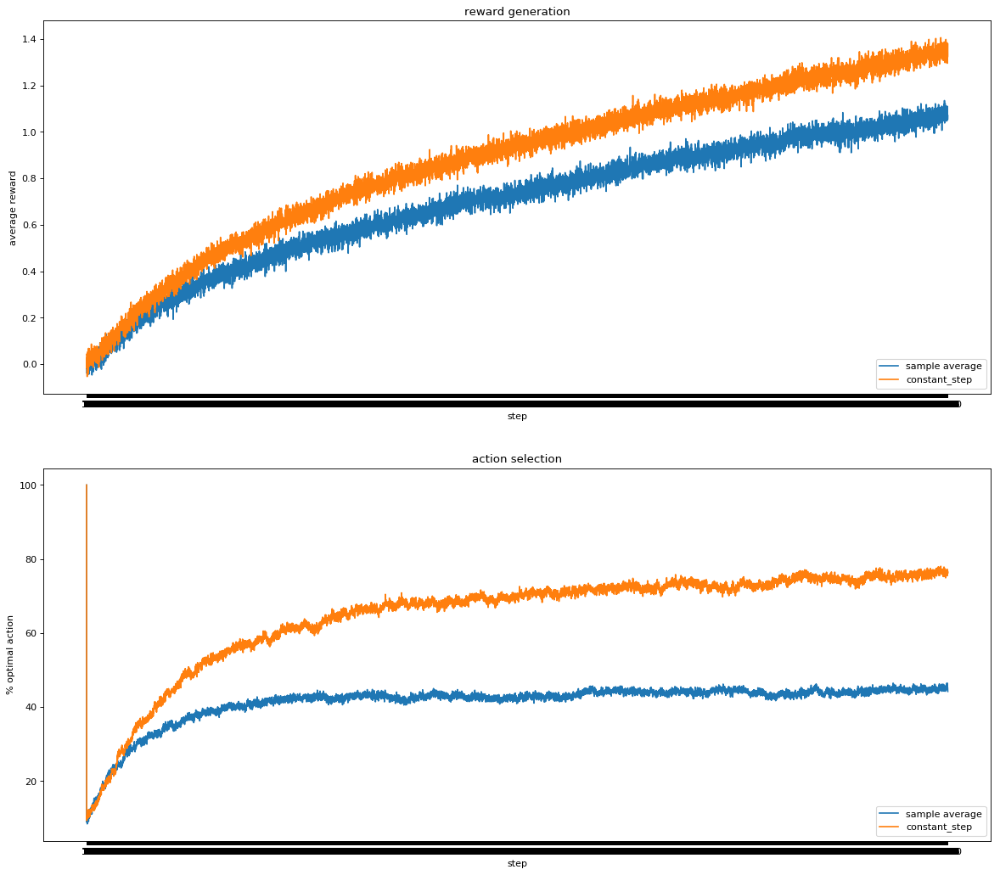

In [12]:
num_steps=10000;num_runs=2000

##################################non-stat, epsilon=0.1 #Q1

[total_rewards,optimum_actions]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.1,alpha=0,num_bandits=10,stat=0,optimistic=0,UCB=0)
for i in range(num_steps):
    total_rewards[i]/=num_runs;optimum_actions[i]*=(100/num_runs)

[t,o]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.1,alpha=0.1,num_bandits=10,stat=0,optimistic=0,UCB=0)
for i in range(num_steps):
    t[i]/=num_runs;o[i]*=(100/num_runs)

fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
plt.subplot(2,1,1)
plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],total_rewards,label='sample average')

plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],t,label='constant_step')

plt.legend(loc='lower right')



plt.subplot(2,1,2)
plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],optimum_actions,label='sample average')

plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],o,label='constant_step')

plt.legend(loc='lower right')
plt.show()

INITIALIZING RUN... 1
phi_a's:  [2.067182074558533, 0.9931952114038947, -0.4995578875398079, 0.5505917720684441, 1.9162876011908088, 0.375240766039142, 1.8345419204294626, 2.438241686982341, -1.2791269963427503, 0.6064888830411455]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 2
phi_a's:  [1.223709822701172, 0.2661055901551429, 1.9307679235232644, 0.5547750696087745, 0.9046187596300568, 0.04515023039691923, 0.54552019324668, 1.1295165580332818, 0.22691177960552433, 0.44736022717668394]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 3
phi_a's:  [2.725740937761072, -1.0463053409701406, 0.2274844899662796, 0.25106391497330904, 0.07734764635718161, 3.1773851127956685, 0.20706490496889773, -0.3954885506101895, 1.6887330707053374, -0.19570850147046337]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 25
phi_a's:  [-0.38181067223300075, 1.0886702587035813, -0.42085961582315934, -0.3787819017806597, 0.05744202177009128, -0.0070172436635806135, 0.8308485092405155, -1.1190992913283155, 0.5583494092810938, 0.5521730296975333]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 26
phi_a's:  [0.3230250314754063, 0.7278909539239338, -0.6873572945502987, 0.6374747442484141, -0.3979656595541744, 0.06985097679691032, 0.9976143770227885, 0.1264902732066665, -1.1508844763290107, -0.05951244980392334]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 27
phi_a's:  [-1.396167881093646, 0.9660147834897452, -0.13432832052452603, -2.291836243606647, -0.7397008671913521, -1.724058907123136, -1.2764956491176567, -0.9826541903529924, -1.9494614052644619, -0.05721784332971902]
q_a's:  [0, 0, 

INITIALIZING RUN... 51
phi_a's:  [-2.499612564557103, 0.8966511435208124, -1.4430583308901643, -0.9256034044839516, -1.490712624130215, -2.46371833957944, -0.8590701102881472, -0.1921100937448148, -1.0864634500136525, 1.3054348848990898]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 52
phi_a's:  [1.2648424646529404, 0.9393484394779003, 2.9743455931408667, 1.911079736231362, 1.9665743048865014, 1.5072978049688341, 1.2308041647313697, 1.1752108631180476, 1.863299708173939, 1.9648134821441239]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 53
phi_a's:  [-0.716507725118066, 1.2264568558163353, -0.21755921840078873, 0.3643400725401704, -0.7580036374626553, 0.3054466054928342, -0.6892838128767559, -0.4296632550346059, -2.772635564952493, -1.2982107337413793]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 77
phi_a's:  [-0.5413262604914446, 1.8534868594343397, 0.34550800801941917, -0.9476418910255202, 0.2671039236059615, -0.2166922867078908, -1.2080640723954368, -1.1785677392250262, -1.3617134164084739, 0.6446943033570979]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 78
phi_a's:  [1.4068484371652796, 1.794569641384949, 2.886658466249229, 3.5897685166530344, 1.7510799530229004, 2.248351086792066, 0.6228474687283593, 0.7295786709414214, 1.194884943302832, 1.975069325722636]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 79
phi_a's:  [-2.0242008083942773, -0.16715058958351098, 0.2533844256136766, -0.8492332457258054, 0.1489676840443114, 0.6115366358734968, -0.208888425344525, 0.6158031819072347, 0.2727367328874062, -0.8098162366833469]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 104
phi_a's:  [0.47547408196285423, 1.5841107630940017, -0.1992032315068235, 1.136096667414806, 1.3727721061860652, 1.677859570604747, 0.8495371449987662, 0.3144200928859151, 0.100996797704626, 2.3363575816535866]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 105
phi_a's:  [-1.1264421824333013, -0.7649463856449243, -1.112486545165209, 0.2759210887878014, -1.2885354347118583, -1.2516183567902195, -2.4077611993460195, -3.075922729930407, -2.2102312789678025, 0.2563749625697129]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 106
phi_a's:  [1.1863784654890435, -0.13046523713960934, 0.027585828094623406, 0.7715473075299544, -0.5731809717851071, 0.7379721328957762, -1.3005578455999856, -0.8865993246595734, 0.07828395899985732, 0.4351302044269419]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 128
phi_a's:  [-0.13589022507932644, -2.650627445546449, -0.7077131579050555, -0.47633695552077526, -1.72434245193732, 0.5968498319403422, -0.09788831452766625, 0.17027683883450984, -1.8452969769516818, 0.36025615524458043]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 129
phi_a's:  [-1.6956174153421535, -0.29364419645075324, -2.1612515430780754, 0.326203995637085, 0.8307150696592995, -1.0097489161091635, -0.09455194283497202, 1.2561619183059891, -1.2641339521737984, -0.21192154171984984]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 130
phi_a's:  [1.3265465189134709, 0.4972357770662198, 0.3605952487110864, -0.393891033712811, -1.3042759686135712, 0.8962496142783181, -0.3650859637116718, -0.16737030976418338, 1.2251309591482786, -0.9154227842344097]
q_a's:  [0, 0,

INITIALIZING RUN... 152
phi_a's:  [-1.4035654625083618, -1.8389951450430995, 0.22125586434440087, -0.4686194955076787, -0.3736942505965814, -0.5743118860586733, 0.292092008053178, 0.4522915683718783, 0.10199223769848048, -0.6383421015578348]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 153
phi_a's:  [-2.856608575405881, -2.7496186291329887, -2.327988154479184, -0.6800829892535731, -2.4990404156157404, -2.272918624221253, -2.248037358565618, -2.1469108395769134, -1.2417227987650357, -2.3128776228470427]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 154
phi_a's:  [-2.122781598948382, 1.1513272454291155, 1.675394785227148, -0.9398406065229523, 0.07633199717796105, 0.6988821298707113, -0.28443295627285226, 0.20919088466345537, 1.4658796486221701, 0.7044202798932704]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 180
phi_a's:  [1.60576189489104, 1.0214395691823872, 1.3081093159073978, 2.1448521898619664, 2.9722117630005096, 1.3744601092750726, 1.6954356041119885, 1.811096735787204, 1.2631614765276478, 1.2565047884942804]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 181
phi_a's:  [-2.074078165825479, -0.10853935873349818, -0.26232421286795526, -1.841569720144069, -1.2680254979294026, -0.36853975025582897, -0.7717297962738184, -1.0098422786891241, -1.2536829722277694, -1.2131459599831167]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 182
phi_a's:  [3.9483604082942594, 2.4271964742102123, 1.5098769968725596, 2.000327462958824, 3.053769017281022, 2.4854708788962325, 1.8544883926923355, 1.456546913834508, 2.803061831342392, 1.7295934194574458]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 208
phi_a's:  [0.8741314559651516, -0.5102113623392405, 0.6718837475257196, 0.38059272140747646, -0.9873104684749958, 0.36852513398192266, 0.5257295300281299, -0.6220476873983762, -1.8425372126102368, 0.36872387134485796]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 209
phi_a's:  [-0.14881391214680098, 2.3525680602431582, 1.382119031486217, -1.6746828662570077, 1.348100950177772, -0.6006261228083417, -0.2625905986778081, 1.828337272538964, 0.5582063773125818, 0.23282583514948585]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 210
phi_a's:  [-0.13795360945693025, -0.974702703002932, -2.715927580405861, -1.6626928752501515, -2.8589780487613194, -1.453066290683959, -2.0885642540320957, -1.4465560564784146, -2.4720824613595704, -2.674013758295904]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 236
phi_a's:  [-0.3836967002148516, 0.6911733727719627, 0.6080953695827775, -0.04257993617532274, 1.5455771416035216, -0.7426611637436752, 1.4349780548883058, 0.5223350117627584, -0.547501428725406, 1.2131750933297238]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 237
phi_a's:  [1.421588644973998, -0.013454074780544382, 1.5473393835945521, -0.47909749073006147, 0.07415415524570532, -0.6915035692834856, 0.9224574650057011, -1.614428687362389, 1.6885986094362324, 0.8725251943493033]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 238
phi_a's:  [-0.7137002326011762, -0.18539987455788137, -1.3250863316360244, 0.7371999712531043, -0.3082776176601098, -0.7735739649743103, -2.1063356273755844, -1.60098639552366, -0.7607882437316289, -1.954737576504721]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 264
phi_a's:  [0.2711098637456828, 0.05665113318895887, 1.0945288333358205, -0.20250879659021026, 2.9685932735986458, 1.3923067525285018, -0.5894283796144378, -0.2719231330785994, 0.4371831863653799, -0.6201489819749598]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 265
phi_a's:  [-0.7254604068674609, 1.5899242556380269, -0.399155671229129, 0.21065030739848944, 1.6907329673637395, 0.052346260020699975, 1.4390446060738937, 0.18787667185032064, 1.594445971059097, 0.551472921832528]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 266
phi_a's:  [1.1751261022250552, 0.5839076615356388, 1.8614518801372575, 0.8035601160787179, 0.914601005241948, 1.0341125261166637, 0.2547725714236465, 1.0216244412983124, 1.525661984896597, -1.4432433904745607]
q_a's:  [0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 290
phi_a's:  [-0.3059064973923801, -2.2266043087346885, -0.1635791409180376, -1.2920246762861953, -0.8575232679744397, -1.235026254595852, -1.093495650122067, -0.6089089871042593, -0.6395373709438714, 1.7515352685077485]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 291
phi_a's:  [-1.6693617955832516, -1.3128369595978622, -1.8400056274500027, -0.6862980345447509, -0.9443963792216452, 0.15163056901288408, 0.7280849291489654, -1.5496793900080175, 0.1646800005448692, -0.5218784415698221]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 292
phi_a's:  [1.328466503686838, 2.1554431860592693, -1.023773128462119, -0.2764367093336058, 0.010403175463974797, -0.029447720685566628, 1.560307922500808, 0.8574846019069409, -0.3853108053149193, -0.8228733947857223]
q_a's:  [0, 0, 0

INITIALIZING RUN... 317
phi_a's:  [-1.3731525228364838, 1.2926973762901968, 1.6921328617820293, 0.9043362252099306, 1.3047867845863879, 1.743489629706612, 0.8190106727435131, 0.4657250751104257, -0.07826972938625065, 1.819459194163189]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 318
phi_a's:  [0.2090596993499702, 0.4615533930754383, 0.5978679149622272, -1.313156389713846, 1.8828788534368888, -0.21634502959485408, 0.6368947541017183, -0.4583514568200981, -0.8794584516182411, -0.612985328603112]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 319
phi_a's:  [2.6857366195168777, 0.361914647910896, 2.582166005808264, 1.410778172109684, 1.4223209863639732, 0.2176885269580684, 2.043769445122551, 3.1157346367164407, 1.1435941362401971, 1.8948831742491792]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 344
phi_a's:  [-3.0918106799307576, -1.175688149179733, -0.914319790061487, -1.668231555998643, -1.5739867959614007, -1.701252637073945, -2.9502952535683846, -2.3731398466381988, 0.19016775128696617, -0.8484167646415385]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 345
phi_a's:  [-0.8882301314234285, 0.20381967764997144, 1.1188002004231694, -1.2302887688436728, -1.404179704431432, -1.3787080049982627, -0.7223392734266265, -1.220236683378051, 0.09398220276206992, -1.8000336999238153]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 346
phi_a's:  [1.2618075859601723, -0.524609173826478, 0.6225245569764304, -1.5558742768542724, 0.34281970127994915, 0.005185171453301829, -1.299721672475686, 1.0000058896043367, -1.0309108140690837, 0.2925452314335227]
q_a's:  [0, 0, 0, 0

INITIALIZING RUN... 372
phi_a's:  [0.025645386834503327, 0.4005761055516468, -0.07372078181460309, -2.0794041573706354, -1.4395819301896013, 0.564276220815662, -0.6976854760808125, 1.0749980198798157, 0.6071435922566685, 0.4526880321517064]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 373
phi_a's:  [0.07087765943079283, 0.42480371014078744, 1.1536103153799029, -1.6334983139618509, -0.6793290714735607, 0.5763723432998232, -0.5687001235320954, -1.3652720424214613, -0.5859594687797332, 0.23157547710831883]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 374
phi_a's:  [-2.294853861145227, -0.5343413708864047, -1.9517003112744753, -0.9645923371289792, -1.246634067976571, -1.4447180691346249, -1.7180477872141047, 0.7829425139643161, -1.6461778488337062, -0.7118931275880714]
q_a's:  [0, 0, 0

phi_a's:  [2.3023901208280186, 0.6953993786859183, 0.8755064563908571, 1.2013627605493555, 0.8178059933179722, 0.4649909499537711, 1.0669195518660293, 1.8419631068268298, 0.6764511564058749, 1.142405526745459]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 400
phi_a's:  [-2.7154593622078234, -3.2211064770923477, -3.244092002853684, -4.330114656454709, -2.1279049858124184, -3.270513236483434, -1.0664851384578158, -2.609149144301304, -1.653893595716135, -2.1902326175737743]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 401
phi_a's:  [1.31908110790255, 0.2464027801790783, -0.7686760147986139, -0.02139234378631072, -0.6551733768312569, 0.5658839791690948, -2.4007056166668583, -0.5840568134284473, -1.1288679373626214, -0.9958910292163556]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 

INITIALIZING RUN... 428
phi_a's:  [-1.5838643138600337, 0.5572375209489099, -0.9374964334231081, 1.2770653358047492, 0.07973806233618236, 0.5163340708699188, -0.8559387555118648, 0.4204795445575191, 2.651896597500727, -0.8676389476953176]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 429
phi_a's:  [1.3800794045707063, 2.276410277041604, 1.781582916858225, 1.946865703369634, 0.809397621717742, 1.0182064752561615, 1.7195654239400775, 2.257181327642535, 1.5534854391309403, 0.4879654809875499]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 430
phi_a's:  [-0.664148584233762, -0.6085832891370204, -1.438891133426051, 2.0680110280612656, 0.45220926408108897, 0.6776408538011208, 0.93516482012938, 2.004267891318664, 0.6678466278073831, 0.15628260696271634]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 455
phi_a's:  [-2.7036092903610234, -0.8481045883520844, -1.4011963964790217, -0.5979123127742811, -0.3034548219661477, -0.8801952359953092, -1.9113121331081855, -2.547659042308694, -0.6764840501520547, -3.100840365459599]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 456
phi_a's:  [0.27805078573330777, 2.619056181863011, -0.31771905192272676, 0.17146597283184756, -0.0014898502767316524, -0.9871280439861282, -0.4290563166825706, -0.4141952938781833, -0.354001348538888, 0.8531133707029073]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 457
phi_a's:  [0.1903161612403811, 1.3860392189065498, 1.1044160424887104, 0.216286128814504, -0.5904372262242179, 1.243625342612173, 0.460028228778016, -0.53015454716697, -0.3238516392910252, 0.12918568846271822]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 480
phi_a's:  [-1.140395514203017, -1.510595361645693, -0.3786253642175056, 0.5943406973933455, 0.5707564854819972, -2.1352171294464855, -2.0551791146684604, -1.602648940781803, -0.15357417783593974, 0.2084499273854522]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 481
phi_a's:  [0.33440109378220234, -0.5631568179033408, 0.2648810738384751, -0.32718170192868484, 1.6657111761881962, -0.17582878703586435, 0.5040989457020907, -0.0011820008116700254, 0.2593521794655553, 1.254995222446753]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 482
phi_a's:  [-2.2372411063325295, -0.2357774684030507, -1.085860427341765, -0.4340410202117213, 0.2431966409236327, -1.402184515577312, -0.928139592086536, 1.5301769919959516, -1.0084596759239621, 0.14580195101465354]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 506
phi_a's:  [0.5364271072545431, -0.44641075579832995, 0.8314056965595157, 0.20949433731688277, -0.5043344417093161, -0.0724624996213319, 0.038249857170575344, -0.8737757445475738, 0.5183117187016065, 0.3297191856962468]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 507
phi_a's:  [0.5075580007379616, -0.5278541157283936, -0.03777100436328462, 0.23550408520396282, -0.13529105157188637, 2.1220364626881305, -1.0421230629235472, 0.62484298941872, 2.2482610179812026, 0.3909240674394794]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 508
phi_a's:  [-0.40002903234748427, 0.43289103229227544, 0.20493335874908564, 0.2659872901245341, 1.6932036288836325, 1.9104303940320617, 0.32582346641728155, 1.801935570252856, -0.06124823671662111, 0.6663471432703963]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 531
phi_a's:  [0.8330209469699379, 1.3094941114779668, 1.1305032893840576, 1.3639031671517718, 1.2307060040582332, 0.9091419265513809, 0.985950069076602, 1.054230274865321, 1.662235075207965, 0.2642071611772607]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 532
phi_a's:  [-0.3767321274935309, -0.2907216603863485, 0.18482903621453306, -2.171079271849984, -0.9612266474851878, -1.2105966447968204, -2.4193891931447853, -1.2833583974654863, -0.4212626954920984, -0.9677022761033256]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 533
phi_a's:  [1.009673703319591, 0.07436754040134574, 2.4781660105830228, 1.4252907028543853, 0.42075007388345087, 0.1418655529161169, -0.003693610392846991, 2.445619025257662, -0.27013168074130445, 1.3113120221600911]
q_a's:  [0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 561
phi_a's:  [0.6407108750473745, -0.2969755072783704, 1.4431930824492551, 1.1044982277454038, 1.1173905244975395, -0.6784376200008395, 0.8196254442144838, 1.2188171496537425, 0.7529786198946709, -0.8515090297876111]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 562
phi_a's:  [0.33458572903408257, 2.2879584996727806, 3.116153204353566, 2.739752058825342, 2.58840143004287, 4.848415177265766, 2.6312302445590667, 2.1276675652339776, 2.659769214743288, 2.406819376284288]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 563
phi_a's:  [-2.00171992281657, 0.21486006391943008, -0.748902075899792, 1.0579693709329854, 0.13303297234384528, -0.10058109485908151, 3.1344334433879033, 1.200096153352348, 2.016020891672884, 0.19482666804975315]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 593
phi_a's:  [-1.68730096979998, -2.195763340589835, -0.7415766153129091, 0.212777994639874, -2.3898532721914965, -1.709714341160234, -0.12117660316548307, -1.017237271274766, 0.812942847013961, -1.0138685995745287]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 594
phi_a's:  [0.4820272521611322, -1.24971999089774, 0.37346633923667794, 0.8187362873125306, 0.09014907185258958, 1.7929648832706655, 1.7612496775801845, 0.9714103573726338, 0.7635474139097234, 1.973637875919354]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 595
phi_a's:  [0.8593835958023694, 1.5976566391521625, 0.7188376032577909, 0.5864649136624261, -1.4274248008639105, -0.3106411954457599, 0.5226263026295359, -0.3992975664520527, -1.04757167446895, -2.6414111176649193]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 617
phi_a's:  [1.1727670356663222, 0.43834739164876263, -0.2635677629428371, 0.36639259307262606, -1.274438205760997, 0.7495676229937102, 1.4878227853705994, -0.37526385987963223, -1.0018652379671622, -1.071559233270793]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 618
phi_a's:  [2.5947085525658933, 1.4565515734861327, 2.872532940165116, 2.5852504039572914, 0.3462534007512418, -0.6740940084670579, 1.8210946112594337, 2.638244015378098, 1.956974576481775, 1.8071564778982183]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 619
phi_a's:  [-0.23993158342787363, 1.045124157100905, -0.9522856797515847, -1.4197271157497333, -0.7163728011817946, -0.25118283788342677, -0.21459371041188846, -1.2846811113149728, -0.1981463841509642, 0.483742769688849]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 642
phi_a's:  [0.18100321824626417, -0.16324436141331602, 1.3535859519950126, 0.09010544526356862, -1.952091198705952, 0.2899499685308974, 1.3758648061584406, -0.4612781274493889, -0.3531288972591758, -0.47007415484401616]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 643
phi_a's:  [2.920240147301982, 0.8757805531156023, -1.524382720569277, 1.0151711780380634, 1.6614869053596808, 2.512316959848207, 1.8079080865694594, 0.445411826784474, 1.4821885191860082, 2.6284233981594416]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 644
phi_a's:  [1.165184177783954, 0.29123094979737674, -0.5912915182647324, -0.6391555575311062, -0.7514948491328274, -1.7359132516073006, -0.0524699734830818, 0.40239726328462205, -0.6951090443378182, 0.08316183240687142]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 665
phi_a's:  [-0.8676741699803692, 2.147877503048509, 0.9924825750037962, 0.30773074654010435, 0.4633403471921726, 0.34225262677543555, -1.3229509280579477, 0.5626670997149937, 1.1823830623196405, 2.6301236156805854]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 666
phi_a's:  [-2.0617961054956275, -0.6216319203209184, 1.8996909659274364, -0.7462673460320238, -1.5882989697690122, -1.1922287054673726, -0.9584463389621654, -0.410382852261434, -0.6206458705295423, -0.5393069406394528]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 667
phi_a's:  [2.528961635992795, 0.7266376065505293, -0.2734825354567827, -0.34894885177419543, -0.06890958939416447, 2.269569564495475, -0.32576624841318647, 0.5125538322327544, 3.0657020989035386, 0.498426009129176]
q_a's:  [0, 0, 0, 0, 0

INITIALIZING RUN... 691
phi_a's:  [1.066809784058172, -0.37160131184126916, 1.5442445175229003, 0.8035555450512536, 1.192933241862058, 0.6788385766832181, -0.8908509576684104, 1.113663439131714, 1.4371036132773167, -0.27062235236301774]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 692
phi_a's:  [-0.09318124448179921, 1.6854950587897348, -0.8263618789467844, -0.2608757696089904, -0.5210043078525138, -0.9237889045422678, 0.4596389842979612, 0.004656345468633638, -0.480099396215352, -0.4499629991794332]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 693
phi_a's:  [0.8433062223528435, -0.11178101159959752, 1.3051026553108875, 0.3436521569970906, 0.6185533463770372, 1.9582256732931627, 1.9592205400300484, -0.6532962862921606, -1.0292847220074992, 1.8242641599234541]
q_a's:  [0, 0, 0, 0, 0

INITIALIZING RUN... 715
phi_a's:  [-1.0861287427131479, 0.9058703918499842, -0.02239078207516776, 0.9960559558474521, 0.560465209484902, -0.5051816894897438, 0.48687773792347, -0.957979463870928, 1.4770234704002367, 0.11367637775839395]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 716
phi_a's:  [1.1541605110867292, 1.2777803840123814, 3.6391517014864467, 1.5361110528734132, 0.07633777750754622, 0.5482234657436339, 1.552152791069919, 0.17698622171375022, -0.7652696060909541, 1.3668612361472534]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 717
phi_a's:  [3.062450141721114, 3.7394200240658213, 1.9888812313718858, 3.984237509906455, 3.189979993069498, 2.7702197029415894, 2.5933315034341016, 2.837880667893835, 2.213105764814426, 3.544067468904956]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


INITIALIZING RUN... 747
phi_a's:  [-0.7195264406095023, -1.3246980239668384, -2.20259477970781, -0.45166950824700314, 0.5576912994128749, -1.7212362788677478, 0.35881831695586164, -1.495752427295076, -1.0852334666143617, -1.1743881639222002]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 748
phi_a's:  [1.8176410074384335, 2.237354646002131, 0.22369271685473824, 0.7786443266162115, 1.9054248123688424, -0.41849369592840935, 1.0031034543951782, 1.7105247112953978, -0.09852975641531647, 1.4908924922498215]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 749
phi_a's:  [0.37135059440359774, 0.7909610315457889, 0.3109003794398634, -0.08514414317235608, 0.7851092824308978, 1.3236125006846051, 0.8488324650631558, 1.588489380792836, -0.43467127819892193, 0.5152355871608223]
q_a's:  [0, 0, 0, 0, 0

INITIALIZING RUN... 773
phi_a's:  [0.32756685850208056, -0.8841979890007347, -0.6527710997991956, -0.17478049961546338, -1.8729500333327227, -1.6518092208909143, -2.242271173367209, -0.5795929967253721, -1.4471297817733482, -2.6808581730122354]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 774
phi_a's:  [0.19346212318058037, -1.2003671648953522, 1.0260655395828866, -1.6440679674015353, -0.9319998794711556, 1.2266868496448478, 1.2754346952169093, 0.806541204223263, 1.7152107517792243, -1.3863869365315655]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 775
phi_a's:  [0.1800760765880789, 0.3260973506815086, 1.069443115799421, 1.2931615541441424, -0.7666203117471719, 1.3679657061814925, -0.3445365872307371, 2.008728139969402, 4.274689158676084, 1.5793657725838315]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 799
phi_a's:  [1.5501538220752464, -0.16415540501179016, 1.5977672695197103, 1.4620362750692288, 1.9462164459162792, 1.9208299438445582, 1.0716303321674239, 1.4402749723067572, 0.4428403988185535, 0.6056329749127392]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 800
phi_a's:  [-0.858300306014688, -0.8036485895385673, -2.261648757222263, 0.04200113775954195, 0.1847706950705159, -1.6180694885361113, -0.7921037139817826, -2.6082812120129146, -0.9052369015928539, -0.8387723815974755]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 801
phi_a's:  [-0.5411454909751043, -2.8742211712189167, 0.5701305791976143, 0.27781362250638675, -1.2095002742325107, -1.8363617416468156, -0.22807955314719341, -0.4353378724753766, -0.8396036387970608, -0.5506103872497948]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 825
phi_a's:  [0.033740875635366444, -1.0090606045579593, 1.2385566296854054, 0.3000484873552144, -0.3723473417502988, 0.004403454755776887, -0.552393056068144, 0.673028559056206, -0.45183162374776453, 1.1919117838235598]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 826
phi_a's:  [0.24326706039940502, -1.5989014295294874, -0.8423813361305865, -1.2619692596526308, -0.7616206464750528, 0.5616139715961282, -1.047601227853417, 2.0142417413904217, -1.1563766535315907, -1.3632900893531528]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 827
phi_a's:  [-2.6045917677800223, -0.09642399343694041, -2.4449684356135473, -0.4171331475937068, -3.53116611112166, -1.8274639127219356, -0.26634776798811344, -1.1140786121164676, -1.4554497052682487, -2.5495630314209863]
q_a's:  [0, 0

INITIALIZING RUN... 848
phi_a's:  [-1.2721281513324454, 1.1882887305756504, 0.9746335114449007, 0.7255140115264762, -0.9513339374332623, -0.19735994947905322, 2.4060991956416906, 1.3225811416471465, 0.48972493669191886, 0.48640469210101056]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 849
phi_a's:  [-3.319517563947807, -1.4896342262604847, -1.4291269818277565, -2.5238806521170147, -5.317520818140874, -1.7439686244774943, -2.508066165994912, -2.308258552090395, 0.9618179493303032, -3.1225806282305255]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 850
phi_a's:  [-1.035698106150339, -0.03340829364277986, -0.9812602496515908, -0.5753433044771783, 1.892560053858075, 0.4159442237826241, -2.4623053988277483, -0.29868344456747525, -0.5681897172949016, 1.684774361022515]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 876
phi_a's:  [-1.8903366137174042, -0.4690732343396614, 2.026696879985804, 0.49855664813337525, 1.0145369715383366, 0.6976289243137184, -1.4045953858924733, -0.08893675810385698, -0.10641623631818475, -0.701344412534814]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 877
phi_a's:  [0.9056337805839954, 2.1931334161803155, 1.8148816279981999, 2.3178409557274815, 0.49523568107488847, 0.8152760474166544, -2.056577078620535, 1.5883208246012264, 1.0228818275294047, 1.0402617789655602]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 878
phi_a's:  [-0.651502683213934, -1.234637976634236, -0.5278778222606573, -3.150561933545604, 0.41100474148559596, -0.051527569529985384, -1.9535871409130803, -0.5746732080896148, 0.21450642019962685, -0.9070910665235355]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 902
phi_a's:  [1.0445051221269093, -0.7341711803002895, 0.925050920934102, -0.3947271975152468, 0.21737525135701757, -1.0579713289461172, -0.1919196097795986, 0.8036163246126128, 1.5492439253819383, 0.0416743071808825]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 903
phi_a's:  [-0.5538775606136783, -3.4317233497709507, -2.059896831596519, -1.6790068696187725, -4.125133437857068, -1.2750172698661786, -3.1502831685166477, -2.3857286096770145, -3.055908519337416, -2.5457716532097585]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 904
phi_a's:  [0.4177745836233672, 0.5503120599926922, 0.9599495937809461, 1.6222079016026238, 1.283080619687002, -0.8192875727050404, 0.9920281605720402, 0.8630171900376896, 0.883829473215267, 1.3401145712445373]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 929
phi_a's:  [0.6437986072820525, 0.14405397855760493, -0.0027205118173235787, -0.9657070209311133, 0.42461734516393257, 0.846692414493329, -1.4406762004721207, -0.5648570281948956, -0.11532320156403131, -0.9060580052825178]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 930
phi_a's:  [0.03232651297951372, -0.09227775385624704, 0.3884452426082605, 1.7097912813219296, 0.9598084394624711, -2.485012211557976, -0.4365802785951472, -0.8991287331005415, -0.3785775373559571, -1.2062081503782727]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 931
phi_a's:  [-0.19783807816272353, 2.409037760361525, 0.10901065988086107, 0.5970527713149182, -0.21367144401403976, 0.6062034767432971, -0.9473225890571056, 1.3878454673319167, -0.8857850556161598, 0.38720503800622696]
q_a's:  [0, 

INITIALIZING RUN... 955
phi_a's:  [-1.7727764953679543, -1.207903102102731, -1.1842420085109437, -0.10489764310542493, -1.0154942788674746, -0.6982052791645696, -1.5773439787960717, 1.329316405257267, -0.3524871028905774, -0.6438555273292821]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 956
phi_a's:  [-2.1404513227887145, 0.2932016133628461, 1.5664480604632074, 0.12737161234597466, -1.5555779938524903, 1.608301446877553, -0.42675116563893184, -1.011574010046958, -0.5544188668680312, -0.9743927594431636]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 957
phi_a's:  [1.5359764264265694, 2.5842305264328793, 3.0122072578957884, 1.324704187658268, 3.192787506265059, 1.7590359783629916, 4.283166673805617, 1.8583380405747416, 2.595158019380094, 2.9469276386861125]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 982
phi_a's:  [-0.7703013455667733, 2.209067056211957, -0.5402974780659113, -0.17935472211959652, 0.10192454743743301, 0.8656907361464304, -0.5242621823385902, -0.26642277850098867, -0.14308843720517822, -2.5114711815802098]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 983
phi_a's:  [-0.3985708676031281, 1.795321685873613, 0.8461803181441255, 1.294185724573714, -0.787039177294453, 1.4723641439186155, -0.6945087511794318, -1.1449320289588671, 2.4333978803858334, -0.17250733784367678]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 984
phi_a's:  [1.2066585830982233, 0.15626335466654845, -2.1600452782243624, -1.2422920310926122, 0.159463078150748, 0.17101840620964356, -0.6525125001468475, -0.02971656672154597, 0.8787470999204818, 0.008002348419667772]
q_a's:  [0, 0, 0

INITIALIZING RUN... 1009
phi_a's:  [0.6515683148472362, -0.15026428881410425, -3.401690297227869, -2.623200979251018, 0.23348142653204929, -0.6710227389689922, -0.8222295891781981, -1.5447487537485, -1.6883109677946866, -0.17714233041973282]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1010
phi_a's:  [-0.6650955870287067, 0.9910905266663886, -0.32264728705504353, 0.05611151932726399, 0.8492347331137408, 2.559082236933313, 2.2103123055916516, 2.628143823463522, 0.7618808257416874, -0.6532380498897212]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1011
phi_a's:  [-1.0992412003347278, -0.7750946512324244, 0.4349230078594586, -1.9801537942899499, 0.5407417370573671, -1.2786143996153572, -1.5893543187039403, -0.13359998258557426, -2.0990248305729504, -0.8220828756329863]
q_a's:  [0, 0, 0

INITIALIZING RUN... 1035
phi_a's:  [-1.921921426556322, 0.8123718007314862, 1.8006914760551167, 1.3403615300740876, -0.6625610749865662, 1.9234383411604041, -0.11901583596735948, 0.9950695276472088, -0.42811043323355286, 1.8913514055377134]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1036
phi_a's:  [1.1043864405169885, 0.6360472292376955, -0.7728178017831311, 1.8086301930553759, -0.5227337764609947, 1.7407652041365564, -1.0218880575803728, 0.18701754508518756, -0.48103463435801896, -0.10930728857241614]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1037
phi_a's:  [-0.6554039028369729, 0.5015518902370801, -0.9415326761358395, -0.4256059695183953, 0.04708534595173121, -0.6132835837541484, -0.44846762090870756, 1.8202837506115055, 0.17456791961366067, 0.019413582774350097]
q_a's:  [0,

INITIALIZING RUN... 1062
phi_a's:  [-0.37840548799704304, -0.15309817892221217, -2.192615091839341, -0.5676859825972965, -0.5831009760588983, -0.6463016033584913, -1.0937035064719534, -1.708897960932156, 0.5168707759043859, -0.5176971707479907]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1063
phi_a's:  [0.7761386703819562, 0.6870621107330558, -0.17559498405698984, -0.12880182997227302, 0.16832678212312185, 2.303948307908182, 0.2637850108315355, -1.105449344245595, 1.016971937701857, 0.76094727854665]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1064
phi_a's:  [-1.4894460316446856, -2.0776431785931053, -1.4354303829806405, -2.0000870364481322, -0.22274490581828177, -2.4867297861243056, -1.573150477364639, -1.1570198941399716, -0.06472476666121918, -1.877840442977912]
q_a's:  [0, 0,

INITIALIZING RUN... 1089
phi_a's:  [-1.7950117302961106, -1.9395040343902878, -0.1554401291087255, -1.651427158002921, -1.0735391072017388, -2.4881988013124894, -4.160635750402721, -2.2812317418868533, -3.2885236196190015, -3.0729650754939777]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1090
phi_a's:  [-0.3922377202010163, 0.03330015233772565, -0.6117122031899469, -0.5464414570840368, -0.4594083378026267, 0.6977074080858663, -1.0921978019615821, 0.0957606764727198, -1.268130052134278, -0.31568280810983274]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1091
phi_a's:  [0.3904255005698427, -0.1384396107609014, 1.901197388950187, 0.8955909378425982, 0.6584845452757385, 1.9363392125716192, 1.3683492335096155, 2.0245899618543963, 1.153044828757995, 0.5788554028551873]
q_a's:  [0, 0, 0, 0

INITIALIZING RUN... 1115
phi_a's:  [0.006376720531588026, 0.9833435660410743, 0.06951186852111275, -1.606678492704352, 2.1545000887727914, -0.5377341622216656, -1.5324875014468693, -0.11790039296955676, -0.031112580124957295, -1.3825521700887153]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1116
phi_a's:  [-0.18312385405500164, -0.332961513597361, -0.6232715846604168, -2.6742993372099675, 0.18247984428365283, 0.5235529632648824, -1.4635538167302893, -0.612431598945578, -0.39889685313771334, -0.7243170591838457]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1117
phi_a's:  [-2.077401667525629, -2.1440813850918605, -0.7291804907824492, -1.5913287355888184, -3.522938050439974, -3.964185012400643, -1.1626207746989454, -1.157002006858605, -3.829517157236168, 0.3014761842855973]
q_a's:  [0

INITIALIZING RUN... 1143
phi_a's:  [0.7657157740728855, 0.10895085402360982, 0.4410039751000716, 0.7289250203920086, 1.3568384909677247, -0.7582075444085541, 0.18332222693938754, -0.4981682209787809, 0.6543788321314967, 0.9387334733146244]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1144
phi_a's:  [4.123145929523149, 2.3352378632172823, 2.5062009397798337, 1.6435551484440092, 1.8575726984484848, 2.0997388152720045, 0.28756427119253347, 0.7596235968693271, 1.38187682974248, 1.083677650668203]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1145
phi_a's:  [-0.2738666708910854, -1.2027143328314287, -1.050418983283476, -0.29623923502468696, -0.2728961278914349, 0.29928993081064115, -0.9807256307650568, -0.9420153476030662, -0.9691544114315076, -0.31398226445248023]
q_a's:  [0, 0, 0, 0, 0

INITIALIZING RUN... 1170
phi_a's:  [1.1335261335728959, 0.31920740821290683, 0.5958147371323247, 0.6754279658475311, 1.786483049213421, -1.011459646379213, -1.1717381505342788, -0.9389411393199409, -0.42209947259930086, 0.13991337522906494]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1171
phi_a's:  [-0.8897994944686524, 0.07352521752271916, -1.136176346315272, -1.554497104706766, 0.5779079475589819, 1.6504416526663512, -1.389098488122659, 0.3986416405065683, 0.27961164974781133, -0.6542442152759601]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1172
phi_a's:  [-0.2028684204000415, 0.9607535799379336, 0.438942381087043, -1.2794178007283974, -2.513852414071205, -1.2077482395157721, 0.692043040356819, -1.5744634593020228, -2.4710097832046722, -1.3766230035118283]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 1196
phi_a's:  [0.7316841311488983, 0.2727038354306891, 2.6677755798263485, 1.0158927019226929, 1.3841292979952526, 0.13499011137029282, 1.2552946435173848, -0.3446074763922279, 0.12156377681806774, -0.7504034712910427]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1197
phi_a's:  [-0.5526473676301167, 1.1355804919277142, 1.5227469142813583, 0.027520561667736698, 1.3695984531919736, 0.7204753656231818, 0.9097271864120204, -1.4014955106285272, 2.128476010477658, 1.3265250359912404]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1198
phi_a's:  [-1.4392954156712472, -1.2838206138365669, -0.9011174138553981, -1.9657936924914023, -1.5804501187997748, -1.9812029079090654, -1.338075877305357, -1.7375219678874356, -2.1214889839389808, -0.2593188129602081]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1223
phi_a's:  [1.0806640800743432, -0.387292165919546, 1.1224403009087667, 3.0277538480321384, 0.011275182073770151, 0.1723577354930378, 0.34452011277155115, 1.313103324275363, 0.24830316247185164, 0.433541171296158]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1224
phi_a's:  [0.3294957784799025, -0.1534658339594437, -0.46301192673398706, -2.1182338756433974, 0.4180259345879751, 0.40954588750629706, -1.828417415275713, 0.8577788018246425, -1.423994511268625, -0.3980514576117591]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1225
phi_a's:  [-1.2030068261765183, 0.6843614463424961, -1.7426710904967648, -1.1314692309165633, -0.0677963620646147, -0.9541171658974845, -0.38390047319278153, 0.07586187659778998, -1.3053121446486453, -0.5280641814766497]
q_a's:  [0, 0, 0

INITIALIZING RUN... 1251
phi_a's:  [1.3549606844841944, 0.787437727714055, 1.5295036587048512, 0.5793867657758097, 1.5398215409261515, 2.1448304987424014, 2.68682299728964, 2.6886628586501384, 2.486759786758838, 2.6563462947564878]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1252
phi_a's:  [-0.6349835152040013, -0.7165924706056532, 0.06533375312047063, 1.857977485235549, -0.5562982772162701, -1.6502280867170072, -1.275649526168507, -1.3353937527962905, -0.7744041625905714, 0.22510573746293738]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1253
phi_a's:  [-1.851644990699099, -1.1780261632926934, -3.603473318623613, -0.9293888971636612, -3.0290429841551503, -2.9556584405776047, -2.957975720132116, -1.1827217953186486, -1.395802152668041, -2.9221477566033354]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1278
phi_a's:  [3.15738995258565, 0.9696277850724389, -0.22146298944492626, 2.351314528447391, 1.5647110909939002, 2.467714250330062, 2.6161197379615113, 2.2186551989714216, 2.6275994067185278, 2.3851858020324075]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1279
phi_a's:  [-0.42841333988154445, -0.031068705135214397, 1.0081002389348606, -0.509961791882467, 1.8779129238370635, 0.3489262303249029, -0.06282983110459243, -1.2201121529968328, -2.3761378943908373, 1.8308254816187548]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1280
phi_a's:  [-0.19496419216627112, -0.3602617477413518, 0.9949253884409189, -0.24947056914261884, 0.31815790730276555, 0.9491059911747561, -1.17726036746754, -0.5140593014084632, -0.3906408340498976, 1.1608754417811147]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1306
phi_a's:  [1.5406932199863839, -0.37595458862209974, 1.9280023692672956, 0.8649180816996846, 0.7591911316442077, -0.46675115561108205, -0.5241970741075282, 0.786268911284599, 0.5827016309489677, 1.41062760823234]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1307
phi_a's:  [-0.8397386464016589, 0.06560500929505642, 0.3776633754134875, -1.0502582585174127, -0.5481587359853314, -1.3639126080097979, 0.03854346486514422, -0.43484318758046875, -0.9300938029055219, 1.9154497177806316]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1308
phi_a's:  [0.960334845408849, -0.47112346763607443, -0.7362784342286265, -0.6441606552863244, 1.0755730343944565, 0.3430560191275362, -0.4301432720064348, 0.6582557828739811, -1.8365561455771158, 2.2654508463283367]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1334
phi_a's:  [0.4945867158860203, -0.2443043757432803, -0.5706493288261437, -1.9303585802342078, 0.704397171101525, -0.8293317148908892, -0.45895824447261335, 0.1046555982356312, 0.31473506393187933, -0.3483048229148781]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1335
phi_a's:  [2.8918115053460802, 2.000892812499388, 1.7983234531431997, 3.175320666007778, 2.313595262192343, 1.078499106560484, 0.9451626729472611, 1.2041858947020172, 1.3122060638584105, 2.3038017308611787]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1336
phi_a's:  [-0.7376772358504069, -0.35456114870433686, -0.7285722749913823, -0.2811001839798555, -0.610528900063998, -1.542022220775951, 0.2909958599998584, -0.9247077896331939, -0.2150736197167736, 0.4133042543389182]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1362
phi_a's:  [-0.6023636100729259, 0.4110191134203722, -1.0269979616371563, -0.9068078362681765, 0.28440464703613005, 1.1053813193581294, 0.4598984210552637, -1.2627634376915153, -0.29529275903514773, -0.4401023727281935]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1363
phi_a's:  [0.5921543508669563, 1.1158429785110124, 0.21792879837105078, -0.5789154255429637, 2.3820821341973226, -0.5087448469454722, 0.7536560566338574, 2.082648651504591, 0.0012931113442871123, 1.2927512365597813]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1364
phi_a's:  [-0.5570703863733724, -1.3413166262215652, -3.575432156347044, -3.8206086670870913, -1.4085586094237115, -1.4380243966960005, -1.9593574067572297, -2.8968487784589976, -1.2537088989393443, -2.9942222911466434]
q_a's:  [0, 

INITIALIZING RUN... 1390
phi_a's:  [-1.7492157826656447, -1.9341511820342236, -1.468567906055028, -0.5919784341034738, -1.5349549562923406, 0.5046798439714442, -0.8029295704675323, -0.32166124711866717, -1.812923092532143, -0.2800994264334483]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1391
phi_a's:  [-0.607237735446537, 0.2052228024142453, -2.324551624795897, 0.2831162272002843, -2.957338095747482, -1.480531684972885, -1.6896134387572108, -0.9393189264688899, -1.3550033276343276, 0.08066723677865917]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1392
phi_a's:  [0.7569346637484801, -2.18400077292449, 1.5921841082874035, 1.9196403939028985, 3.8120155094233006, 0.23277153749628376, 0.2149815084089558, 0.6704068819201336, 1.4705294289720356, 1.0701900512994762]
q_a's:  [0, 0, 0, 0, 0

INITIALIZING RUN... 1417
phi_a's:  [-1.457954458102296, -2.279785515450875, -0.1823743245238684, -1.5417439540833846, 0.8468622270013795, 0.34677174714478365, 1.0095595482899407, 0.6416452596210571, -0.6202114740077481, -1.0976914742382942]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1418
phi_a's:  [0.664426444841745, 1.011831670142097, 0.5815472585611394, 1.2302361363132746, 0.9692538113626874, -0.7141926962018179, 1.349478972773311, 0.2597406920431541, 2.5137710969086924, -0.14819038544800694]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1419
phi_a's:  [-0.9603328914559731, -1.0659305268229124, -1.7936379244797007, -0.00021186520426175193, -1.7200984384237898, -1.917398266957823, -0.7985836282965404, -0.6361418481790505, -2.512330221209678, -1.178228702729625]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1444
phi_a's:  [-0.5902606529925982, -0.49012240668989676, 1.6151392560675422, 1.6989944576988607, 0.7196858498762259, -1.8526925876205695, -0.32425766877987267, 0.2361889262281, 0.5129621208290971, 0.368140291353045]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1445
phi_a's:  [-1.661138021246589, -0.799505089323538, -0.1665811812056115, -0.5748426957653183, 0.7697891356501183, 1.2532241324937912, 0.30654979108142405, -1.442724476606972, -0.49618487195258987, -0.7429830479606008]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1446
phi_a's:  [0.3628267331961502, -0.428480906535795, 1.0725614028135633, -2.2452322403661333, 0.4613601115192739, -0.592387001360885, -0.32590541319504784, 0.8651169234593117, -0.7372968266004125, -0.34063849254123235]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1471
phi_a's:  [-2.3172468727659763, -1.7679209748552132, -0.08854297314249737, -1.0960712583233698, -1.049130676254329, -0.7384759126025867, -1.359770433881361, 0.5002617494804784, 0.9328240490184239, -2.6066867171775003]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1472
phi_a's:  [0.9326114512545333, 1.4177370410556063, 0.8611058437176367, 0.3627908485436202, 0.9890319452539145, -1.2132458209331123, 0.6805538886736429, 0.8700303317011377, 1.2877021132937556, 1.1919007591401192]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1473
phi_a's:  [-0.9563643960581399, -1.60037192394564, 0.4256846584593182, 0.8364767714922211, -0.3761428678544009, 2.0731410699638944, 0.20285604079610264, 0.09338055202226492, 0.679966843638592, 0.8376641660343206]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1497
phi_a's:  [1.2484078977049329, -0.3764732733111757, -0.5014395957688713, -0.12345966870137326, -0.43081800557578354, 0.20249562708363855, -0.07793062783000149, -0.18396278848414138, -1.086626758754099, -2.219947057311308]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1498
phi_a's:  [1.1333050824083641, 1.1111826575129211, 1.3080937996801398, -0.9429954844111289, 1.3184336220518003, 0.3009579217086209, 0.8317148101059364, 0.5911338598859942, 0.30921708262044345, 1.1492416739367193]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1499
phi_a's:  [0.5424991667468072, -2.0068484505241213, 1.3535584484845102, -1.223157728104007, 0.8543038881303562, 0.1999236768615428, 0.18045259210658904, 0.6464809184858478, -0.4338505137545948, 0.10126611284504318]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 1523
phi_a's:  [0.19027425249702068, 0.9050396510455483, -1.4294225811186467, 0.11168799056317424, -0.4062496479114464, -2.849109855334012, -0.9594343208108425, -1.6792047342163412, -1.1556833362177428, 0.503695560188125]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1524
phi_a's:  [-2.6049182883705555, -2.3756872743063884, -1.8064495926936275, -3.4779656715773912, -2.5376068427306375, -1.5484866540902171, -1.3142843620752949, 0.3152332797315136, -2.0665852229519386, -3.7405306559307467]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1525
phi_a's:  [0.2055838151233753, -0.4681932831722504, 0.5685648885906691, 2.6555471489568676, 0.7515880336820303, 2.243553349080501, 0.760245083757952, 1.791306995585471, 3.268032423055579, 3.44139765475406]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1557
phi_a's:  [-1.292376193965123, -0.6782942937521466, -0.5806667293865604, -2.5085842585068043, -0.9534223183013113, -1.5720556692224095, -0.5527230558571161, -0.434708869373045, -0.767577316431371, -3.540710426404244]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1558
phi_a's:  [-0.6863556267451351, -0.6977426715887465, -1.1544738328461914, 1.0704863336315906, 0.1794583174782587, -0.31604095994644904, -0.5676338163199495, -1.1331820506334833, 0.8507264851486585, -0.5016407991859377]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1559
phi_a's:  [1.1618581262528582, 1.061336125275592, 0.19500678005533922, 0.9324192672453158, 2.6118453518272826, 2.787997975052998, 1.9998139010200828, 0.8110422868450778, 1.894788070506491, 1.247637313794778]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 1583
phi_a's:  [1.1996473613771914, 0.23351887426974527, 1.5804277936671136, -0.5460902283510191, 1.436384370817772, 0.3346932837445389, 1.7935970999804698, 0.7199892518365729, 1.9445570297801793, 1.166043357389488]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1584
phi_a's:  [0.07284529824273611, 1.0329779307540172, -0.47749139892824655, -0.27276093723800865, 1.6442025431860823, -1.617746978595757, 0.052549037334277765, 1.0174706755733898, -0.7595447582978474, 1.1357263943526883]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1585
phi_a's:  [2.6657640347102634, 2.1579422984298335, -0.11349015321672007, 0.10917000260079601, -0.019580216885140667, 1.4572971306080298, -0.08474480576921772, 1.847916076587877, 0.5064422040217249, 2.941228971702116]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1610
phi_a's:  [-0.6658639596700173, -1.7004949333823087, 0.20305952804201627, 0.20234817130403326, -0.6298498332331369, -0.12591498249739966, -0.5829034405079133, 0.8796870740924965, -1.4685094989786478, -0.2065874442953203]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1611
phi_a's:  [-3.0583889820669743, -2.6956865834670736, -1.3157321103031585, -3.256226698451667, -1.3654156548263443, -2.348808077374112, -2.6741403690262864, -3.6334659497258524, -2.5391591972041496, -1.592030838608918]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1612
phi_a's:  [-0.6347453134441532, -1.8306835231899492, -1.8621523364507482, -0.9481348796088176, 2.000866742138522, -1.5675945348601585, -0.6715478018912726, -1.8619839837811871, -1.0294158603537604, 0.5213003269155972]
q_a's:  [0

INITIALIZING RUN... 1636
phi_a's:  [0.6370756045949293, 0.02705937933142455, -1.3614163851457228, -1.546906822951335, -2.1982888334729007, 0.005293085047754165, -1.0925164698596723, 0.19485469629953067, 0.8616795016269243, -0.11478114900568775]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1637
phi_a's:  [-2.327287167716437, -1.2912169393561224, 0.4182351379983934, 0.5727784776866451, 0.34657487199048065, -1.534029687749436, 0.10341073217630437, -1.3499641025332587, -0.6829968335878008, 0.1019222543528252]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1638
phi_a's:  [0.5381489855953353, 0.4771131959843624, -1.4103668510003717, 0.07510739836757208, 0.27131333481168773, 0.4170044284071608, -0.07683961349743834, 0.8961412065567816, -1.3965401852676735, -1.25990281171185]
q_a's:  [0, 0, 

INITIALIZING RUN... 1663
phi_a's:  [-0.8367502476358565, 1.094766665606432, 1.125453378359281, -0.839310958301705, 1.2602216757679863, 0.46552076206633286, 0.1378352164456781, 0.9694965445274217, -0.16921695459112107, 0.8847745028948695]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1664
phi_a's:  [1.386989277966451, 0.5102706314384208, 1.0758884688041626, 1.0549400129614368, 1.5073040595881317, 0.6862309612838764, 0.8455075894835884, -0.8871887928340454, -0.5180544712208368, -0.48662085080981643]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1665
phi_a's:  [-1.9992179851926704, -3.1844510080510604, -3.5528703071130767, -2.420383690997519, -2.7623663381730377, -1.2806166463809383, -1.6859757506742326, -0.6151834044096174, 0.023206641159525532, -2.030907638687623]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1691
phi_a's:  [-2.823356837744029, -0.5382268673727063, -0.28087938715041605, -2.1616943080663598, -0.32912570162318855, -1.2796770171008824, -1.3845476220685413, -1.4771600830939815, -0.5929641721901997, -1.8460020821498966]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1692
phi_a's:  [-1.430060048616724, 1.5791612877466585, 1.7024763018917826, -0.04833548360869751, 2.0208306192487293, 0.12183062429950775, -0.6212308810969681, -1.3076321241686564, 1.438104772336089, -0.6800949325415477]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1693
phi_a's:  [1.9973591286055252, 0.4190299471407063, -0.956403514214864, -1.9258660777258862, 0.3485943891906826, 1.0092228027827608, 0.1501610330179743, 0.18108960606408564, -1.3174483022973598, 1.1368822999518016]
q_a's:  [0, 0, 

INITIALIZING RUN... 1718
phi_a's:  [-1.3429774044204692, 0.0962190465010232, -0.6189691878939712, 0.9469835225300783, -2.334449902362243, -0.26647588319629095, -1.3754514574211165, 0.1674642754662573, -2.6538607813534205, -0.3411039891761738]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1719
phi_a's:  [-1.1992452562425941, -1.7793605753614474, -0.6141299577111308, 0.43877507006578736, -0.2696271813465684, -0.6355534015934107, -1.1634406737511536, -1.374526123421578, -0.14465996479988436, -0.6574673039192445]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1720
phi_a's:  [-1.1051934923193554, 0.28872564481929275, 0.19035030968117206, -2.0991256738170274, -3.6409070877402954, -1.3581546959029693, -0.771102240926326, -3.935186665219506, -1.5585629330815676, -1.1778747113382158]
q_a's:  [

INITIALIZING RUN... 1746
phi_a's:  [1.6440529168611038, 1.1096035231072685, 0.25071877822160604, -0.5794219890880214, 1.7318387805144158, 0.7524744239945595, 1.0878097895412646, 2.240702513650234, 0.32610891889668214, 3.27403207754463]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1747
phi_a's:  [-0.6974335814494115, 0.4851426442348965, 1.1619077830568463, 2.7193921139876003, 0.3280206505043609, 0.7946320995270795, 2.0655159946079342, 2.8484176737373526, 1.699470470272462, 2.679966411761094]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1748
phi_a's:  [2.7371507602118106, 2.2037348593878168, -0.3248208704385261, -1.5569626689294482, 1.732233344197247, 0.6213779298563289, -1.9678952650062884, -0.3651909536412029, 0.9793048191217997, -0.8416473108714279]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1772
phi_a's:  [0.1353874729383973, 0.9296442184657661, -0.3479273426173032, -3.801263709878365, 0.7840178983444619, -0.7931629200851613, 0.13826850211627983, -1.7223258567643036, -1.722670576414802, -2.292883008631553]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1773
phi_a's:  [2.0007982120329464, 1.6778541979338544, 0.4726358353514616, -1.0937547911388539, 1.9046931961939513, -0.09568819752799529, -0.1896444006579534, 1.5640798163933545, 0.4025443160873149, 0.5617500561277565]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1774
phi_a's:  [-0.006268907507765431, -0.31665129516697504, -0.06369018915819172, 0.12882896101419036, -1.4114914074110974, 1.0484825783338374, -0.3629819028958766, 0.39820197799705304, -1.6670259254746216, -0.05392874823445376]
q_a's:  [0, 

INITIALIZING RUN... 1799
phi_a's:  [0.3500950285981077, 0.4568805253174947, 1.1946009668026014, 0.1505456310318397, 1.121164960970819, -0.07802439646542336, -1.7925284280383342, 1.0452680898727387, 0.6103827972220237, 2.171317519344102]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1800
phi_a's:  [-0.27814021551090823, 0.6778301275775376, -0.865230058116931, -2.107033360506485, -0.10749601719595242, -0.9920035195843109, 1.1883708946655567, -1.199459130937326, -1.8766543875959043, -1.0779355003611804]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1801
phi_a's:  [0.6455067486781558, -1.4750476913783657, 1.4956468497973356, -0.9937871211891838, 0.018391739095906856, 0.41709940911198573, 1.583624156193658, 0.5828799739081303, 1.2325125076246062, 1.2155188540906583]
q_a's:  [0, 0, 0, 0, 0

INITIALIZING RUN... 1825
phi_a's:  [1.163901730382518, 0.6152815704145633, 1.5763050935030167, 1.7607856363266623, -0.3391365192806992, 3.024437705203353, 1.003024268350376, 0.6181568536046977, 1.4865843794016274, 0.5071216492792799]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1826
phi_a's:  [0.03160546346247149, -2.2725562099418637, 0.098401168007978, 0.02744907826182841, 0.18736561177607186, -0.571113069188352, -0.8862296926116647, -0.08670624485641477, -0.79814096059977, 0.24514671722868486]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1827
phi_a's:  [1.0606195122550608, 1.4990023210770695, -0.14547679988061613, 1.786819859597818, -0.06612503799839153, 2.310315397519206, 2.1732981660840336, 1.528571802055166, -0.7595376613938416, 1.5340950078876578]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1853
phi_a's:  [-2.547860535742455, -1.100612474916638, -2.038250428592452, -1.096717629107958, -0.26745161726398203, 1.263767058366157, -1.6113135848890432, -1.3911431739595153, 0.010529398096426723, -2.4673559590789482]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1854
phi_a's:  [-1.866426689016367, -1.394982586599084, -2.7465485369361406, -2.1966509569584005, -0.6628233334747431, -0.6687768774277605, -1.6777640400461749, -0.8322987275806755, -1.523919834907071, -3.574078952902147]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1855
phi_a's:  [0.1949607555858629, 0.0955824990885002, -0.05348839046414117, 0.7523436570837299, 0.36005420423425466, -0.15376813833590863, -0.32684550286800634, 0.09807030989643314, 0.038989567660337315, -0.4556747276884084]
q_a's:  [0,

INITIALIZING RUN... 1879
phi_a's:  [-0.1283873090505831, -0.24284868104312252, -1.4185338377758634, -0.9836169320447474, -1.162760402908554, -0.72548773363985, 0.3222781800961642, -0.8014276265118392, -2.181968866497003, 0.03610961276877461]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1880
phi_a's:  [1.9246874020266656, 2.8927854121670467, 2.4651426759284973, 2.832887195917224, 1.4903019875843957, 0.558901099977918, 1.1833489417361476, -0.4623931287035006, 3.1256125026237696, 1.7577167025781595]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1881
phi_a's:  [0.684692558061743, -0.5294194741150025, -2.6042641990411233, -0.530921095564983, -0.64962275306339, -1.4038680592152755, -0.5675527728854833, -1.3205884606943783, -1.6425663699026343, 0.18018134560896126]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1905
phi_a's:  [0.2375062386410366, -0.16234296697212253, -1.167946961526927, -0.04565207948392283, -0.7637726170017023, 0.18198808750132328, 0.1740253273815327, 0.5581327649276124, -1.691186914620684, 0.6806987296424876]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1906
phi_a's:  [-0.35134759061775456, 2.949477395349337, 2.7037702636389045, 1.5766139568336317, 2.4186989659829505, 1.531678119740855, 1.8685285911759872, 1.1202973893901103, 1.3818181360910908, 1.4455313342667933]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1907
phi_a's:  [-2.100794958360528, -1.462452270191308, -2.3059703855460145, -3.618727871980701, 0.8292819723129872, -0.3771566684480827, -2.8454551724502646, -0.9417643035916697, -1.2453639964957945, -1.182936117492619]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 1932
phi_a's:  [-0.6749603805554993, -0.05564507743197217, 0.3775192991244451, 1.0858178529689904, 0.8962546389855716, 0.44740767773824097, -1.1121626512834912, 0.5555754201707331, -0.7147880122438478, -1.0775400786432532]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1933
phi_a's:  [-0.2693192786163259, -0.6720437750106526, 3.118091980552978, 0.7916006468808982, 0.70714522428362, -0.15673236081467679, -0.005387674699733017, 0.42903241458991026, 0.1687926784902571, -1.1529820798808827]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1934
phi_a's:  [-0.929197476217063, 0.7801617594670561, -0.2117059735768908, 0.9737149917955467, 0.31465620171959224, -0.17603045898820963, 0.4228372719859531, 0.9114608225778406, -1.955487419257496, -0.2757954699763841]
q_a's:  [0, 0, 0

INITIALIZING RUN... 1960
phi_a's:  [-0.33586446338966763, 0.29689505025768953, -0.19434170285370445, 0.3063990407545754, 0.33834933211547613, 0.6406320879296296, 0.9930604730472281, 0.48191313573271927, 0.08188627547709379, -0.5232697407699317]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1961
phi_a's:  [0.661575366383106, 1.8872126738823127, 0.9944549032115368, 0.0421892029564921, 1.8085991673898405, 1.825275999246002, -0.06243775176583198, 0.9728291865825089, 0.7376306632735469, 1.571254386357605]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1962
phi_a's:  [-1.302483624785014, -2.148312869409504, -2.4351790695933944, -2.025167094484888, -0.5557372465614787, -0.699780680201487, -0.07730044491566634, -2.7753036048986304, 0.14472098071006634, -0.2132899694370055]
q_a's:  [0, 0, 0, 0

phi_a's:  [-0.3147374773162449, -0.9621241412289834, -0.5910526065757069, -1.0259476591178909, 0.04559397230945861, -3.0929371211035814, -0.45360379819635366, -0.19016108374674767, -0.33771193540655847, -0.026572282879738895]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1992
phi_a's:  [-0.5943779174283501, -1.484164578936186, -0.9364793601546151, -1.0480576076181738, -1.238509846867868, -1.0452344675946885, -1.541125027320489, -0.026885513527594496, -0.5922343251695197, -2.239217820927898]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1993
phi_a's:  [-0.36710490589474976, -0.932890358597342, 0.7939210188316692, -1.5244602758229786, 0.7855700019097895, -1.4229623912227485, 0.10739327474847576, 0.8084135146377012, -0.5291244257712424, 1.1626337231485624]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 16
phi_a's:  [-1.368260093938455, -0.26729200155190613, -1.2398028955616627, 0.34456345270928046, -2.1088430297392233, -2.2865327077529014, -0.08421635979752873, -0.34426706668771506, 0.1478059621796911, 1.040231010535758]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 17
phi_a's:  [-2.382724035373733, -1.8325581737854149, -2.452315137723466, -0.47047699329551973, -2.451436876243985, -0.5774376752394124, 0.7055354186408995, -2.2458454846923632, 0.29789012718950447, -1.0744812205789986]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 18
phi_a's:  [0.5965144082340026, -0.398647412080255, 3.57670102978018, 1.7470280833206109, 0.07411109233740132, -1.1621604355713446, 1.7219906902867408, -0.45446302653196646, 2.5932238194880926, 0.8727099668720605]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 42
phi_a's:  [1.5153062515389328, 1.2497510834566314, 1.8348694501609168, -1.5073044415173602, 1.6852824695802187, 1.6663373257717433, -0.1038643086744444, 0.4136313896085435, 0.018132501436644466, 0.738305521427906]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 43
phi_a's:  [-1.5133659021335317, -0.023970344018395595, -0.319316606200717, -1.6432564716945997, -1.6351143050508274, -0.7050071572806946, -1.3815934950644833, -2.0092222294496644, -1.652359838976055, -0.2977374018262382]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 44
phi_a's:  [-0.4927045525836041, -0.24000949975881997, 2.350096504957053, 0.12843599060584115, 0.9007518223574118, -1.9773203922849456, -0.43507713143184107, 0.8352614654133509, -0.6918938023610787, -0.08730235789602932]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 67
phi_a's:  [-0.48652448626650835, 1.3060400660844267, 2.2805837478050845, 2.3822290935815555, -0.4167402128958604, 2.239676924374769, 0.3391545664322111, 2.1240563074422996, 1.4622074431103194, 0.9027592575143775]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 68
phi_a's:  [-1.393619807649999, 1.505519756522544, 0.1903581104808545, 0.07670302090446601, 0.4636430502818979, 1.858228129544914, 0.38909006196493945, 1.882808813872328, 0.25797778893958023, -0.22056352553984537]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 69
phi_a's:  [0.5753444615994758, 1.225913551030121, 0.29086524909250333, 0.6993811747524632, -1.757426701208518, 0.7250087181510794, 1.9772248613590895, 1.4532750882318204, 0.11797336849553741, 0.11674769979999455]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a

INITIALIZING RUN... 100
phi_a's:  [0.4537010155853452, -0.4199333057294935, -2.4971884956671206, -1.0701384345983285, 0.3300233528902099, -0.39794011321980227, 0.6168082326564555, 0.7500120559122658, -1.1149947363283017, -0.33358370161893436]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 101
phi_a's:  [-1.279528467256001, -1.4926375539710843, -0.730408918879636, -2.0493570027339305, -0.4480012871994117, -1.4478672085264288, -1.763146959097651, -1.2705154246389414, -1.0876380487538453, -2.3008536542754063]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 102
phi_a's:  [0.6807842098474862, 0.5708335609676667, 1.1968553487073599, -0.0530638790950361, -0.8302596781604262, -2.1174131021331912, -0.011554764628765535, -0.11827985983060857, 0.589639363174091, -0.8875638215279091]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 133
phi_a's:  [-2.2312310570415486, -0.6713683204351685, -2.26162085469134, 0.39800861796547327, 1.14968548745265, -0.87051040051468, -0.04543635743152563, -1.008255393680201, 0.14598811341700113, -0.6462218360849232]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 134
phi_a's:  [-0.21493580364428655, 0.40673915310363373, 2.1542479370650347, -1.3710410895716483, 0.7803604651528353, 2.3014875917751505, 0.3019836072939337, 1.3043251668988463, 1.6820306365112647, 1.37718882309575]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 135
phi_a's:  [-0.27636468924497126, -0.7329179985103913, -1.1910482237389723, -0.31134038341893355, -2.5889195525560336, 0.749967353149555, -0.9274280474277741, -0.9501575125503705, -1.666099033958158, -0.19195092332769736]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 158
phi_a's:  [-0.4603512030467365, -0.36890395438708784, -1.7047184481598352, -1.054420239760839, 0.5294818428039898, 0.6964670217883611, -1.4750163597939268, 0.4337636894767277, -0.26849593146611855, -0.6732295538147202]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 159
phi_a's:  [-1.393165052803664, -0.22721753074552611, -0.6842099624599222, -1.0175870640735158, 0.2030152986548319, 1.6317339783948381, -0.926976234058317, 1.3870161148091813, 1.5468127765129196, -0.8613189458810863]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 160
phi_a's:  [-2.75580312487602, 1.0638409814942813, 0.16937674475002834, 0.3753406072705167, -0.7977325163299249, -0.024892910060343998, 1.6194386603167596, 0.684855088743237, -1.8446442763312265, -0.8160067999639752]
q_a's:  [5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 184
phi_a's:  [1.158938926470311, 1.2396781470149068, -0.468210722950202, -0.06769292428799462, 1.5872334769259715, 0.505607265475883, 1.608495279236251, 1.9442551382556834, 1.2850934751057885, 0.7396665364952365]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 185
phi_a's:  [-1.1120645584982018, -1.0116178352887648, -1.949373373194565, -0.029964452873148417, -0.7943041745854891, -1.802277006205775, -0.20961651557091782, -1.8084086614585106, 1.8030385740126837, -1.0015166359287702]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 186
phi_a's:  [-0.33208070650384724, -1.6366362473875533, -2.4179723577170606, -2.8779795292385626, 0.39652439021437424, -1.2110722199091117, -1.0115038637699314, -2.829380353366399, -1.9417097281839255, -0.24080787865811148]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 210
phi_a's:  [-2.02926987985631, 1.085980659361117, 2.615522519184877, 0.8192053652099928, 0.9572131260321519, 0.6879983494144138, -0.7457147031196915, 1.2982270543943637, -1.1998444352574462, -0.7379857357862295]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 211
phi_a's:  [-1.3051768566985953, -0.3488646148463891, -0.4869782030813175, 1.120914682697646, -1.7245215573227455, 0.1705012886109546, -1.48784663186292, -1.874348478076615, -0.04527614576020855, 0.7261042276382977]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 212
phi_a's:  [-0.489925611256823, 0.09258534510228722, -0.5417103716758263, -0.6062797862538987, -0.39158895975397623, -0.1233140140045414, -0.6249891566251542, 0.3303362836568945, 0.10927889047619121, -1.1523244048748094]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 234
phi_a's:  [0.7828075207891116, -0.7244757972387701, 1.9372680432095866, 0.3396787529359287, 0.05148047610790458, -0.37112265811742073, 1.2780497792046832, 0.7059815045238343, -0.2714239616213091, -0.6678957106510185]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 235
phi_a's:  [1.3162997254397153, 2.0055523680545337, 0.28102925279199076, 1.6930434633189033, 2.6236088817626353, -0.14779599102541385, -0.1786284874480606, 0.8170094935945276, 0.58355897370668, -0.598852244791203]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 236
phi_a's:  [-0.32145008120646357, 1.3130735322562317, -1.3838608717538876, 0.4587314840994574, -1.9790942400212288, -1.7031746501384388, -0.30299302068803347, 1.2577743565979502, -0.5188469964392171, -2.45724157348297]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 258
phi_a's:  [-1.1456422044581072, 0.029926918240500366, -0.13247963012458291, -0.8280672423331643, 0.4908249361473657, -0.6996605277680713, -0.14711161721260002, -1.9985445463292362, -0.6549908289124272, -0.6160465099363337]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 259
phi_a's:  [2.044918906884107, -0.19974489205485702, 2.1178298169169754, 1.9684861872723478, 1.2210410025280232, -0.3519443431717906, 0.9377977853517555, 1.5754400425720754, 0.07575396479639118, -1.0718813553365674]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 260
phi_a's:  [-0.6532196769683317, 0.7716300991755265, -0.44352842509910734, -1.5852388011654848, -1.541280706576815, 0.03290256847272213, 0.6010208235279089, 0.10064795743275604, -1.188675203255105, -0.6449531320800126]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 285
phi_a's:  [2.532966588753082, 0.8653343125018333, 1.7636591097038767, 1.4233676739446492, 0.3156019732968143, 1.0306262532233692, 3.310011807103577, 0.8401404764152866, -0.4123931374028962, -0.05131917297425592]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 286
phi_a's:  [-1.5118990959845127, -0.9500574822944322, -0.9128934061402543, 0.34163014818745296, 0.122329359219701, 1.317992584505262, -0.26023810943822634, 0.1682996212119653, -0.7339049977174585, -0.29814667739112677]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 287
phi_a's:  [-1.1705122483128627, 1.264703113504674, -0.023829394234573753, -0.13435353496017943, 0.7356526473543508, 1.035737322503731, -1.5126305504629136, 0.25619720045207156, -0.07597310537226643, 0.9264504636636062]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 310
phi_a's:  [0.17908777858724234, -0.7836089821592621, -0.8719698430060482, -2.037393947441307, -0.9885586518504694, 0.09890521302569044, 1.168881825468541, -1.820379834167691, -0.14986379074161515, -1.1846860734297133]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 311
phi_a's:  [-0.3234062763339389, -0.08090918983242101, -0.699260791316611, -0.1668262568863943, 1.1733006223245557, 1.7540850552399472, 1.585631346548281, 0.5722510118904365, 1.8686803340815605, 0.4664884047235711]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 312
phi_a's:  [-0.5655418217767048, -1.5777118218096113, 0.4672009404549191, 0.0856181890693733, -0.47649357481487664, 0.30831490676617, -0.42093864990576346, -0.8781256526383999, -1.4963238734356303, 1.7890021929453495]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 335
phi_a's:  [-0.5728197301108274, 0.41798580921792344, -1.4133034561581241, 1.513141156649936, 1.531352658849578, 2.1914061884375426, 0.1230825427077108, 0.4091215775156347, 1.3262579812955342, -0.8052980247887466]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 336
phi_a's:  [0.24963317343828356, 1.0756216955772213, 0.988551825949846, -2.6519731232670476, -0.9113250538698933, 0.41728580626397077, -0.6082662815424709, -0.4464204548913759, -1.5192405394482484, 1.279163811420754]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 337
phi_a's:  [0.025105681569239646, 0.6737567131468261, -0.40223635479099706, 0.09214242188410249, 0.9866118686869566, 1.2011265139682754, 1.8314899421376771, 0.3641120032387347, 0.8357304222829552, -0.23802049980401618]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 361
phi_a's:  [-0.8884163226577124, 0.18736856413152236, -2.477411134495536, -0.8796422861045942, 0.12931034816493137, -3.1845170408893706, -1.3991881171842833, -0.733415072114439, 0.24530527375182443, -2.9269741423503897]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 362
phi_a's:  [-1.332274526369441, -0.4354818036495267, -0.09161046020931585, -2.877722103219833, -2.039395684953035, -2.3584999243636426, -1.1303803229182152, -0.2775758826027894, -1.1141810846821467, 0.4143828498085781]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 363
phi_a's:  [0.401657433804643, 0.4353263959262927, -0.45076469533659347, 0.1833095606130577, 0.7844141720828832, 1.3707741670091207, 0.744436009581338, 0.7857462839778544, 0.45678428417513983, -0.5922438194424]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 386
phi_a's:  [-1.2354610800850672, -0.6403495822829042, -1.7301977345035482, -2.525141787987738, -0.6689890817299967, -3.083278419871461, -0.23877508126015345, -1.8346909915784835, 0.38806177202545533, -1.5509331319469966]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 387
phi_a's:  [2.0829264763433826, 2.1277524944973596, 0.18843781287931322, -1.800283180073303, 0.17055334090654373, 1.5918197936404128, -0.11620494500361295, 0.646162867169559, 0.7435165816229474, -0.5773021333276911]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 388
phi_a's:  [-1.1499309076217732, 0.7447503800052759, 0.8114266668800894, 0.0035846440522024348, -0.5642563980690876, -1.3881760050093124, -1.1601874107362766, 0.026597944075757718, -0.9125806734196229, -0.7587229255635859]
q_a's:  [5, 5, 5, 5, 

INITIALIZING RUN... 412
phi_a's:  [0.01494041285675951, -0.6247466960500978, 0.07982357958215369, 1.169236176516346, -0.6069989804216815, 1.351934748169297, 0.062323129637187724, 1.4964040287636393, 0.06700201180249482, -0.8420090992668283]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 413
phi_a's:  [0.869561380676617, -0.2506378142651574, 0.02835451111169876, 1.512764232680196, -1.1417057989873676, 1.0552087575633835, -0.5323208269923944, -0.9235701947788603, -0.9962431964233421, -0.05635418321066488]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 414
phi_a's:  [2.1658187621592, 1.3784382470965393, 2.1498053003415727, 2.573490032426307, 1.9787047160052798, 0.9011449071113748, 3.0025856838169176, 2.371148129449035, 2.3200367265252826, 1.5845825574293886]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

INITIALIZING RUN... 438
phi_a's:  [-2.3267695849561787, 0.46256326812223425, -1.327222604474144, -0.5971865169547668, -1.3008138691415685, -1.956659935498117, -1.4106208390451904, -1.0491660196347743, -0.31142945046073156, -0.4991550304601076]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 439
phi_a's:  [1.720711513684532, 2.532805714763999, 1.8599367620181506, 2.716902403227923, 1.9213081588194227, 2.2833673851311955, 3.518396430822258, 3.2473297662609486, 2.264904491782427, 4.2451411906042456]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 440
phi_a's:  [-0.8303719307544025, -0.1977087020398065, 0.7452882042567124, 0.58183101042337, 0.4450634204607729, 1.1115187319017008, -1.2205732821631206, 0.12563534931994774, -2.041336660924676, -0.026765700021466]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 464
phi_a's:  [1.695759807630175, 1.611525326966696, 3.086646321247752, 2.938547943163651, 1.050852000650469, 2.249436383090579, 2.3518222515845304, 1.2588187390851517, 2.4487007101731493, 3.2595527629705057]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 465
phi_a's:  [0.5479181091752314, 0.5143253537462775, -0.44342302743714235, 1.199087504091359, -0.2560753169015337, -0.039697184325770254, 0.8189536256606423, 0.44523149289317726, 0.4760403783181028, 0.34524487790434466]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 466
phi_a's:  [2.1335185836196944, 0.8759306017091077, 1.0639282698815247, 0.07581270906596616, 0.9370213728534023, -0.6654510140254615, 0.7077616438311185, 0.4755098285975371, -0.10434269949548236, 1.8976193473832073]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n

INITIALIZING RUN... 490
phi_a's:  [1.6648081940408184, -0.3675877029180033, -0.34390190073401994, -0.51064736417671, 1.6664628010259224, 0.5847161499792366, 0.699102423632613, 1.658797204704618, 0.5528814135827352, 2.1040850472340566]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 491
phi_a's:  [2.067173109640165, 1.0477182589113982, 0.2631949369385633, 1.347087949429325, -0.1461078833438173, 0.633832902768824, 1.0897271301902216, 1.4733157163738864, 0.4711713050606804, 0.4454783025873322]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 492
phi_a's:  [0.18461220904493159, 1.1878001062766086, 2.666275226952622, 0.5148401782368243, 1.2985488246684764, 0.7417716120706466, 3.466234364922877, 0.004584249264873996, 0.44824271122467485, 2.49378792618439]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  

INITIALIZING RUN... 515
phi_a's:  [-0.37007378621443965, 0.19071877621195887, -0.7090291150485468, -2.387966452018324, -1.8946634355268994, -1.0444123338882725, -1.7121663800917846, -1.7099954112403202, -0.5278450435930726, -2.171178562532557]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 516
phi_a's:  [3.2868238694376934, 3.0568514529244966, 3.098374386269592, 1.000085492983804, 3.293111574617779, 3.005061816680955, 2.8745175976987607, 4.043645383665774, 1.925021072443041, 2.531462028050936]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 517
phi_a's:  [0.5579354056148397, 1.1493479719991442, -1.5532764320698453, -1.420923353803603, 0.2585877400928671, 1.779095661104691, -1.5707947679134735, -0.9751381882314506, 0.7329887529146819, -0.031967325012570366]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

INITIALIZING RUN... 541
phi_a's:  [0.6048849184419802, -0.16773330030679723, -0.5279051946037322, -0.7448543490229074, -1.737576933546018, -1.0167270632249812, -1.0220447598122355, -2.0523428155971644, 1.122751143539157, -1.1461211738827533]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 542
phi_a's:  [-0.49866436713514384, -0.7144398680229014, 0.8004105310376235, -0.6064869674444722, -0.4642160522687876, -0.9767362240244051, 1.5827568932793374, 0.48531692541306887, 1.1400592244396095, 2.0548957315262]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 543
phi_a's:  [-0.7807053374757053, -0.8498278442381506, -2.0511853826502824, -0.7520146693216749, -0.9436933347422476, -1.6967916960452194, -2.2079497488734825, -0.70663491162318, -0.8575494783948522, -1.2689891905013038]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 566
phi_a's:  [-0.3653982335350505, 2.7073065757251227, 2.6247901560071245, 0.4717205348692556, 1.3237208712317416, 1.019454778854655, 0.780674687847029, 1.6182255276184314, 0.9486512221386089, 2.1383257570076446]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 567
phi_a's:  [-1.0400957010738319, -0.5741942029881659, -1.526513549649609, -1.2182214440951056, -3.151468467994458, -2.0105422458886166, -2.5448947288320585, -1.2281465825518154, -1.1446876786399303, -1.8212111471082222]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 568
phi_a's:  [-0.9037952608145925, -0.6907391933518964, 0.8724234046367175, 2.043153405866118, 0.9114971925940178, -1.228280146808259, -1.5734551223805806, -0.5369289647241632, 0.1817892058746463, -0.7050104200385057]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 590
phi_a's:  [0.7466420791169344, 0.7480439945117361, 0.4947724208513251, 2.247229208961705, 2.038702676196567, 1.15264172934568, 2.8621457211347625, 3.524745138755371, 2.0435472210988985, 2.030738396756626]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 591
phi_a's:  [-0.7461272353786814, -1.887273964292993, -2.319882547653488, -1.1425071751968805, -0.27685914887853047, -0.6432693465422897, 0.12212672913204403, -0.904941669325591, -0.02365786115653523, -0.07442968643225911]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 592
phi_a's:  [-1.1930472050997951, -0.8980276470955197, -1.5989448782117548, -2.0548425109876813, -1.9794107443584747, -2.763045407504216, -3.680067638224883, -3.0559270526991718, -2.8317803286862446, -1.5707194531910165]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 623
phi_a's:  [1.991614794584852, 1.2779330422386659, 1.534005908049562, -0.48155744074266105, 3.0198871341896654, -0.6187630763777625, -0.41011355793758053, 1.7462284012317646, 1.0237779950174628, 1.0726154061667645]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 624
phi_a's:  [-0.45696277814982145, -0.10134964706689131, -1.4929669000684622, -1.820020010715663, -2.1873174701450107, -0.9730790375153493, -1.2699477214480999, -1.7427859870858673, -1.8227324020598967, -1.0024533421737187]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 625
phi_a's:  [1.175828122356673, 0.04697741826474422, 0.4512926130387928, -0.04061191616420845, -1.2329216225955117, -0.0856203297495044, -0.4796983255843522, -0.3774783521909647, 1.0874927491339288, 0.33061543350789363]
q_a's:  [5, 5, 5, 5, 5, 

INITIALIZING RUN... 648
phi_a's:  [1.4434028281463471, 1.3743796750059385, 1.2310090874620823, 1.6927623747042153, 0.997950033536727, 0.19658993546633508, 1.936059181360645, 2.151452406851314, 1.13634096327614, 0.434641913081674]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 649
phi_a's:  [0.7795614706837753, 0.8250459920578594, 1.862188210548278, 1.9534473665550656, -1.5548665548537595, -0.30749777467430695, -0.32397202978331296, 0.9721192212725919, 0.6245580005802673, 0.337175763509581]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 650
phi_a's:  [1.0269495541704572, 1.6402787665169751, 0.6209144481471583, 0.46924956812608937, 1.0984675800627466, 2.5666805130958776, 0.44171025060252156, 0.6852031260240449, 0.4093942160197605, 1.3719638054588512]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:

INITIALIZING RUN... 671
phi_a's:  [-0.2126484318258681, 0.026867787120852082, -0.3436915549162422, 0.6573385822317879, 1.1452983043207035, -2.1127408438856268, 0.2931820327629628, 0.27363756314045057, -0.59035684573455, -1.5439123116337066]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 672
phi_a's:  [1.4404023518593387, -1.023298241508463, -1.7191075225637644, -0.23921280107854764, 0.4361393960979265, -0.5974031468131846, 1.0930866395659797, 2.3725279674968855, -1.7795003287637705, -0.3199734189322249]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 673
phi_a's:  [0.45139148076675895, 0.6422184581645535, 0.5074793500968228, -0.20217880731371574, -0.2791811233046586, -0.5664338351349125, -0.9089176340522163, -0.01655414174140421, -0.13531546535687597, -1.6157549638643458]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 697
phi_a's:  [0.7739223266949107, 2.0185957447525373, -1.271933942529583, 0.029163636974794516, 0.9152543792247055, 0.5957843506361287, -1.072546824615948, 0.7526860788650738, 0.6573433166362368, -0.4267741662997492]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 698
phi_a's:  [0.8863609220993147, 0.7131949072890312, -0.3753093004631698, -0.3895767616868564, 1.1872294831851475, 0.6284829916696031, -0.30281080755468515, -0.04993487614691783, 0.026869927440930585, 0.6123815994017031]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 699
phi_a's:  [-0.2332107891813151, -1.866871379112475, -0.03617027075322432, 0.4841479876286313, 1.120136277330816, -3.111194053662116, -0.6928668764696743, -0.03441725484252245, -1.9968757392455596, -2.698921822498288]
q_a's:  [5, 5, 5, 5, 5, 5, 5

phi_a's:  [-2.733066034525348, -0.8583419534951211, -0.9346532690112761, -2.2058085989404845, -0.11769325186053425, -2.8246591684255495, -0.8056791659473149, -1.346339745233103, -0.78268312546776, -0.5551566804883645]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 724
phi_a's:  [1.5843217657270232, -0.050626645770196266, 1.990453405649083, 0.44519991259860947, 2.3173422149552394, -1.5133257511254599, 0.9582299654314637, 0.9171665579191614, 0.12924686592321555, 2.496549842224068]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 725
phi_a's:  [2.0287900043509315, 2.2466782947554957, 2.147258252151946, 0.23133383571448, -0.6436675541025053, -0.7501716455949051, 1.1527027197900988, -0.324703661309091, 0.8334374015374171, -0.014755459239275737]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0,

INITIALIZING RUN... 749
phi_a's:  [2.891259882240613, 2.0203788864399495, 1.4925591891521257, 0.9854598164850787, 1.9058981454356756, 2.2592633425437056, 2.0125012725717655, 2.3130351005806786, 1.855833483978927, 2.877497261523545]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 750
phi_a's:  [-1.4222132612933611, -1.2077250294834907, 0.21036586693316173, 1.0126020668549451, -0.33550813890617165, 1.9786354352402102, -0.6888070410482505, -0.8710201771804909, 0.4871280909604765, -0.4085267415639189]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 751
phi_a's:  [-1.279620043441123, -2.0611544061285536, -1.5743918442209548, -2.511905898385102, -2.2164755100295097, -0.7964993171920538, -1.2647556159054951, -1.0430125977899514, -1.8849751800974, 0.11753961630522203]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 774
phi_a's:  [-2.104203555033842, -1.963720595027418, -1.841882404901578, -1.751977401141923, -1.7983734750968534, -1.6377413227667472, -1.541271708497004, -0.3553509316002349, 0.12600304186120326, -1.3677960927170776]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 775
phi_a's:  [0.1830556767361607, -0.20456491035350233, 0.41152702018443144, -0.011920943210563084, -0.08319556497918831, -1.8870859542073168, -1.0837617811319316, 1.8615106123903051, 0.895772767589011, -0.012729946172012702]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 776
phi_a's:  [1.552511584948427, 0.3256414665810256, -0.056144948640242665, 2.2753274562044172, 2.419520484278679, 1.8588572816266822, 1.333569021226236, 1.1193471854712138, -0.26609499575049944, -0.07183002067268385]
q_a's:  [5, 5, 5, 5, 5, 

INITIALIZING RUN... 804
phi_a's:  [1.1686774851511008, -0.24839746198659224, 1.2187405062125864, -0.8036163542529697, 0.4453215773832185, -0.25892180537972, -0.5975998515878223, -0.27755050346842736, -0.38323167974902433, 0.14666446153412843]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 805
phi_a's:  [0.16333469343181412, -0.19225928349647697, -2.052252411875418, -1.6410621409778352, -1.5740025762246705, 0.4255426065784495, -1.138923226673031, -0.618651878221192, 0.27624473763466023, -0.9394487063813934]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 806
phi_a's:  [1.2980062414034854, 2.898821239777426, 2.1964022663355904, 1.656394588107355, 3.0852385552060944, 0.9083821448336339, 3.0568486568833784, 1.1021207059783245, 1.6620074243379728, 2.0776548587536667]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 828
phi_a's:  [2.163299480583976, -0.13268834900176552, -1.0901326261779098, -0.6095900833440666, -1.5926579200209172, -1.584220567754011, -2.233268422738596, -0.5779401476487865, -0.9493475142798641, -0.028692059124042046]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 829
phi_a's:  [-3.8602560661080014, -1.7824832023035502, -1.872673299789575, -1.0869761063745957, -1.2986294080282976, -0.5891135310363778, -1.1910263708006528, -0.36880516607194713, -2.231669108573492, -2.5707042434658494]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 830
phi_a's:  [0.4947088547555746, -1.4133468693668123, 1.7089720518087492, 1.25568022703005, 2.2714469834914253, -0.19370794126646274, 0.06004592168026299, -2.5138144934970406, -0.32140009730001523, -0.480568766820967]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 853
phi_a's:  [-1.6615011419623449, -2.123583711060018, -2.4841931239920494, -3.434091007122464, -2.8240188527888175, -2.9029467016401513, -2.9788811953743357, -0.6617877159054981, -0.9042754980283154, -0.6980770919290946]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 854
phi_a's:  [-1.072792577947041, -0.6731394401463211, 1.6499338116665456, -0.3595942524792743, 0.6048099436728234, 0.2704542237970192, 0.9325461627601976, 1.8274461938592597, 0.2885826947528123, -0.9349774859097653]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 855
phi_a's:  [0.9419639730250992, 0.8093287949342257, 0.45674644342947623, -1.4280663050965274, 0.415963426152541, 0.486442728394585, 0.6704735185169063, -0.9166058661254233, 0.18010028662769595, 0.41127783022997233]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 878
phi_a's:  [-1.48127293671269, -0.9944806339135748, 0.18851207422858857, -1.5684669384385854, 0.9211286960114651, -0.6643900315752721, 0.17546040375560215, 1.1373943424242146, -0.2763161133505771, 0.02899243578613235]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 879
phi_a's:  [0.6533683383517093, 0.17554922744487678, 0.5504371205275848, 1.5519882182291829, 0.9857044135910151, 1.003574321414849, 2.6236659108565634, 1.044905872153191, 0.24761600336742873, 0.21641935702225257]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 880
phi_a's:  [0.1603274869061676, 0.7291886141985102, -0.4368580298995688, -1.2946442362739359, 0.43402878492903363, -0.22754521524949242, 0.49401221042879284, -1.1903005717572976, 2.0168721511149355, -0.34125469140201203]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 903
phi_a's:  [-3.2400253213095125, -2.5307195409929784, -1.259578856512967, 0.08308473239838099, -0.5270490833222161, -1.7658332971573367, 0.3569594585461062, -1.3138407064254418, -1.2892885916322205, -2.185864265193624]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 904
phi_a's:  [-0.10891990455010873, 0.644708981247716, -0.36743321190515965, -0.010966514041756296, 0.7352185078003447, -0.12754537643620378, -1.3797591540184324, -1.33934875895503, 0.9745004398414967, 1.1001953142894088]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 905
phi_a's:  [-1.524831958338504, -1.1169732928026104, -0.33412864688153676, -1.1199997986999197, -1.1226425897666235, -0.4714013761145055, 1.1120188337300754, -0.3562382394012056, -0.6476081066538869, 0.38436772392169183]
q_a's:  [5, 5, 5, 5, 

INITIALIZING RUN... 927
phi_a's:  [0.6406487056437831, 1.0388395177670218, 0.1971711539023198, -0.6638247056098896, -0.9942975157438131, -0.5405524778071639, -1.1068197398274595, 0.828800980639041, 1.1563043114786336, -0.7905927990645564]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 928
phi_a's:  [0.23699978112262585, 1.0057313267319679, 1.6511666553826898, -0.10479250688823427, -0.03467376761189933, 0.3006711460747191, 0.5537887134645272, 0.1115284191424703, 0.41738845085921905, -0.660828735112216]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 929
phi_a's:  [-0.3188966307630703, 2.6410614997868658, 1.8409368199771792, -0.568136991775253, 1.8304201272660858, 0.6544479632007315, -0.27733526279524123, 1.2828944599841745, 0.4827778957452633, 1.1536244881774786]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 951
phi_a's:  [-1.7437368775479283, 1.8451039099317703, 0.8481751629828054, 0.5809713877985385, 0.15531266563164453, 1.3810004811201697, -1.4204456709064273, 1.2123699905856848, 0.2667275918398548, 0.014744997165488938]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 952
phi_a's:  [-0.53495013200912, -0.6305704951233402, -0.5527897112796687, -1.048189358150633, -0.4393521016324341, -2.712253959089476, -0.8458690776984911, -0.9987828549913215, -1.8649857161523857, -0.07647130565939786]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 953
phi_a's:  [-0.1246721333845019, -0.8532042769672928, -1.1661400223242353, 0.13207305888664633, -0.38361352164101314, -1.4889356674223655, -1.619421747416454, -1.950446881436861, 0.2720531142325653, -0.5472566491316064]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 985
phi_a's:  [-0.8965021146685712, 1.981985351915886, 1.4546203516122533, 0.4303612222881431, 1.3038689750274137, -0.7791893887053101, -1.365579122944248, 1.232025651305869, 0.6176877424112459, 3.1534457554794875]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 986
phi_a's:  [-0.22674443127875277, -0.5824449101214926, -1.0322635617477993, -2.4746115692893085, -0.9946176900701038, -0.6372301014644971, -1.4724383084903145, -2.2874606508199573, -0.6419767155464791, -1.502726421774037]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 987
phi_a's:  [-1.1689520040763521, -1.0089251183942263, -3.2734604949876176, -0.962336568619906, -1.7274827296174822, -0.14879264849390061, -2.629589664197729, -2.4488993686355167, -2.237099369125439, -1.4709069694037886]
q_a's:  [5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1011
phi_a's:  [0.6827222211756975, -0.07312264801784307, 1.5733621211292979, -0.3523400529855121, 1.3614968517406942, 3.229613236534438, 2.2888048327745905, 0.3924094200369591, 0.4520713991264115, 0.749844351098818]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1012
phi_a's:  [-2.2670762326672977, -2.198305355177412, -1.7732405938053224, -1.9393710430210693, -2.3389904158156347, -2.4635056535123088, -0.8244778210641008, -1.729683320377248, -4.181729696913857, -1.180031412024963]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1013
phi_a's:  [2.7937825693399523, 2.8348405852090806, 1.409224442955169, 1.138489536509507, 0.12688509824793254, 0.06414631378037694, -1.202185546605019, -2.572697643395837, -0.023339419582693366, 2.8836333269405037]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1037
phi_a's:  [0.5297784647888126, -0.7613486055342119, -0.36935624652328003, -2.017284438505406, -0.051534676358494735, -1.4915985847296531, -2.3560434227087512, -1.7500441900842765, -1.064092959164892, -1.101892872638028]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1038
phi_a's:  [-0.8848170490756218, -1.3308924085597593, -1.024727599780789, 0.6408335682978746, -2.842525160379681, -2.542112914661068, -1.0508574232546346, -1.3736075103986018, -0.04013095552045953, -1.3722807243548512]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1039
phi_a's:  [0.5188223238958691, 0.24588085314193694, 0.24967371941855548, 1.4272263816562845, 0.40750897474139813, 2.4468737943392473, 0.3802503200164708, 1.558847426562525, 0.026272461116597867, 0.3650454014679858]
q_a's:  [5, 5, 5, 5, 5

phi_a's:  [1.6388759495128788, 1.5772061845942966, -1.066228854374021, -0.8855929989433688, 1.132055946457055, 1.5680952972263928, 0.46061895416007625, -0.5698230886574598, 0.23530980486059494, 1.7839355398836962]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1063
phi_a's:  [-0.26195652848469986, -1.3853846923739683, -0.5095061634600642, 0.6551397006183948, 1.5244613196128434, 0.09813531764041022, 0.11569044903003772, -0.9207068112792591, 1.8029282790215493, -0.43454597047285815]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1064
phi_a's:  [0.1086533742086846, 1.693243633730118, 0.011910530522081686, 1.325211480154978, -0.23016024395546764, 0.2891679784715514, 0.09951283739084527, -0.34746477106950946, 0.09163263674809674, -0.06996722849597592]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  

phi_a's:  [-1.2573396025156995, -1.4835850543121079, -1.2578588766129708, -2.022195861519412, -0.6150290884482651, -1.1306705608927161, 0.005439698737491283, -2.616128728583069, -1.2118983132495464, -0.5927046671539743]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1087
phi_a's:  [-2.1320658507856236, -1.397580661838702, -2.3550950952443106, -1.8868186772059152, -2.1150925827591305, -2.7736466047945987, -0.40255727977088207, -0.5698213248281037, -0.7608064435879806, -0.8287559127103925]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1088
phi_a's:  [0.47377711555482516, 1.0518951367513991, 1.6698076682571548, 2.0196340187813595, 0.688319858725801, 1.5448938229569456, 1.9159197662926664, 2.2098006318062406, 2.85960000158365, 0.451765123482357]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 

INITIALIZING RUN... 1109
phi_a's:  [0.6221618747662299, 2.7423309867939745, 0.1759506231319672, 1.88710199578317, 0.6508988917126465, 1.0605085573965976, -0.00018710914174246973, 1.5087333337756137, 0.16061903434015523, 0.5921600596647616]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1110
phi_a's:  [-0.07378508735077116, 0.5840761823896986, -1.3906905155870104, -1.0511591479094649, -1.6456426628770182, -1.5548946205313587, -1.0777109072217004, 1.4122191786996896, -0.34938227303957226, -0.8398143360689518]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1111
phi_a's:  [2.493410692245452, 2.2015765276968895, 2.243446349007176, 1.2287187209327433, 2.7302901533643773, 1.6241260802134356, 0.1916068646840432, 2.2781572924497207, 0.5591192096570692, 1.0540845400824215]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1135
phi_a's:  [2.416466987666804, 2.4437090288358982, 3.3935041777113173, 1.963171197192468, 1.7978388971206896, 0.9530633574126681, 2.3963948945445024, 2.2930092808266176, -0.5001099197039212, 1.1410244034678172]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1136
phi_a's:  [-2.754196315970103, -3.4305510722513572, -0.893670838619772, -3.8862465054349835, -2.3080439543521867, -2.5598097449441424, -2.193076532096849, -3.0917638326520462, -2.0791661907178636, -1.3465326069833323]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1137
phi_a's:  [-3.1055355758920338, 0.12613593938295087, -1.6894081342363108, -4.314683250737602, -3.1174242130404215, -2.596196990693749, -1.8802819137221902, -2.114349112021775, -0.7148752509805361, -2.399432965524457]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1169
phi_a's:  [0.14251671478934214, -0.557151444037071, 0.17752041441547417, -1.3273057251045821, 0.04565654615510417, 2.4908574918602207, 1.8065969829475188, -0.32563201663179075, 0.3244641098621944, 0.8637309399449766]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1170
phi_a's:  [0.9625120841559995, 1.2741360248619484, 1.748127516803228, 0.30341069428398176, -0.9583182923609257, 0.37935551645943466, 1.7080119066159634, -2.2731312952274783, -0.8153509806866536, -1.7481146487213504]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1171
phi_a's:  [0.6237720556135069, -0.5244933108383206, 0.27897699298648293, 0.053358036298998684, 1.1132087007291824, -1.5644935196803749, 1.0045806931009884, 0.9289902990334973, 1.3747262254262747, -0.9496813148854477]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1193
phi_a's:  [-0.13176885147063852, -0.1292050286526432, -0.7736099546158728, -1.437736164260479, 2.21367635923297, 1.2933482677785628, 1.957736506103749, -0.7609315587625171, -0.8877076693798975, -0.48069334328823954]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1194
phi_a's:  [-2.620353822585204, -3.0598273133494946, -0.4499609601364777, -1.9601349314452938, -2.0230935973251007, -1.4350422971666592, -1.29906126360502, -1.069866284944379, -1.1936896577084735, -0.9627767538261417]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1195
phi_a's:  [-0.380127046414692, -0.704498456440278, -1.9500559704995686, -1.014394373843628, -0.8111228840531663, -1.7325227603653466, -1.258662241480855, -1.5174000155432037, -0.7332802153742646, -1.3718975510479885]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1224
phi_a's:  [1.886622404252924, -0.4893715882890445, 0.309615181274746, -0.43240583264540744, 1.186932266893955, -0.4659914374392179, 0.007149895620217506, -0.5716912827061268, -0.878597520454561, -0.7583935067011661]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1225
phi_a's:  [-1.394566789732782, -1.9378853219970251, -0.4557371949040677, -3.4540719551114343, -2.3672048635805765, -3.3706068805651137, -1.5705721678014086, -0.8161652764617968, -3.165978357454967, -0.01094927989667105]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1226
phi_a's:  [-4.304302332019546, -1.5881640373096328, -1.1328560601964954, -1.278896435708454, -1.8376734655423377, -0.843210355219898, -0.4851322608269909, -1.4933033857230686, -2.715442710232913, 0.21891296927252868]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1248
phi_a's:  [0.5348631305895658, 0.052723384315526645, 0.30896704118640295, 0.5733245179525328, 0.8291706836329875, -1.00861848757707, -1.0845115663288167, 0.22484847731638938, -0.5746257024389438, -1.0201277556354467]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1249
phi_a's:  [-0.8908318053988644, -2.962896076506813, -1.2293919465297, 0.726958948190455, -1.9175617664069242, -0.04352388506050997, -2.7250525299881785, 0.6039180672664781, -1.0840311090224066, -1.4940394074223273]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1250
phi_a's:  [0.027686845375412494, -1.281296088071298, -0.9563277941752903, 0.6193370552083486, -0.5034984563806151, 1.3312815838746936, 0.5708616368609285, 0.9740185884769259, 0.728720511212549, 0.3485586147006482]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1273
phi_a's:  [0.800195239050151, 1.4623607418098326, 1.5374220559011498, 1.5516507499950527, 1.8338479033933814, 1.0856974550404266, 2.2791080859136716, 1.796944491617055, 2.373413414241747, 0.9355119862754089]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1274
phi_a's:  [0.9107536166521203, 2.831511003425903, 1.152084442070487, 2.8346081686257607, 3.0029089559109625, -0.1394833642054436, 2.4919722788531438, 0.5777418748253277, 0.3195672481242291, 2.703574764481418]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1275
phi_a's:  [3.240465366935578, 2.21630427300292, 3.8993619320441404, 3.0283546803950805, 0.7516028664200398, 3.30397092408571, 1.5436089561775672, 3.0334754302972002, 2.2007606519797758, 4.703008810391948]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0,

INITIALIZING RUN... 1299
phi_a's:  [1.7298656000899615, 0.4931409682985891, 1.082923532415752, 0.980179900652923, 2.5156700906735097, 2.0785572578653073, 2.4916810491044723, 3.1501894853424686, 1.8076014362314874, 2.2860137405690746]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1300
phi_a's:  [-2.5586157902967677, -2.8792932640526185, -2.016804775268862, -2.3188797617253627, -2.577315274615705, -2.479503902647736, -2.6544854937246383, -2.7357169904274636, -1.1902601383975877, -1.9058248257854598]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1301
phi_a's:  [0.46670769600977274, 1.4786700310419403, 0.8464912384770891, -0.44013493529560643, 0.5557616081346317, 1.7284411797658672, 1.7916028085824571, 1.5073661077271205, -0.06934577891435556, 0.7500148772685059]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1330
phi_a's:  [-0.37321105397868415, -0.8800349976051886, -1.0355004602484035, -1.3620851069001114, -0.05651461638107866, -0.06001569957183209, -0.31822217174411715, 0.6783245765444426, 0.5461426599676751, 0.04689719264173088]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1331
phi_a's:  [2.1099768472703957, -2.465108417206234, 0.1753968014492983, 0.30443525591894216, 0.5653917672697748, 0.00617908165699621, 1.307470227493285, -0.8252408806727156, -1.2748290052896905, 0.535674299447686]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1332
phi_a's:  [1.7644914754250598, 0.9013615097401064, 3.1606956384957425, 2.7832944810028444, 2.5071840879905976, 2.0555194563015955, 2.757902987034167, 1.2656675929798358, 4.630760947877025, 2.004767601280853]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1359
phi_a's:  [-0.9292900406795248, 0.29379197587627237, -1.6736622948382291, -2.3481268143309753, -1.931136646211835, -0.7515578458396325, 0.322861538613856, -0.9340087048809578, -0.8803306315720176, 0.5250740064624879]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1360
phi_a's:  [-0.8188467756899596, 0.8463604836359161, -0.45543922458778163, 2.307056725092121, 1.4298826195981693, 1.5674891591026396, 1.1801790847006255, -0.6958684006950251, 0.3299264310759493, -0.6651941861725248]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1361
phi_a's:  [-1.0469766963732776, -1.6788385212632868, -0.6127510634084359, 0.40303732026418926, 0.19113792411935485, 0.5798839397743332, -1.1169488601242767, -0.2747762506796766, 0.4710622601872666, -0.42398395693877006]
q_a's:  [5, 5, 5, 5, 5,

INITIALIZING RUN... 1384
phi_a's:  [0.814610807188995, 2.1978224496320378, -0.033315107195639126, 2.119940049504647, 2.4524081349424343, 0.8362509053285422, 2.2148281040819806, -0.2024210666228654, 0.6922725917903065, 1.327120217367263]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1385
phi_a's:  [-0.8548160456595166, -1.9145324628181077, -1.625142274963597, -1.2308323670169456, -2.117072458726735, -1.481884804474697, -2.693582686155458, -1.6973797212983779, -0.0951813026586028, -2.928204254157826]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1386
phi_a's:  [-0.1009108195935581, -0.0544823198253408, 0.21598177891509873, -1.3690963511082777, -1.0576662623550124, -1.5453566390573321, -0.8740033438501875, -0.6908467485894307, -0.22129080445478824, -0.05441376482652968]
q_a's:  [5, 5, 5, 5, 5, 

INITIALIZING RUN... 1410
phi_a's:  [-2.399927235813571, 0.681328621888575, -0.5250637723103755, -0.5471701517297358, -1.2290393565360553, -2.038856331781667, 0.5619434702988462, -0.8222825409127639, -0.9646894085603327, -1.5881679192973803]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1411
phi_a's:  [-2.7326975710623755, -1.2400647978096462, -2.046027903973266, -2.8374799407754114, -2.2175515798621834, -1.4310755451824504, -1.7112545860051644, -2.0987491650578125, -2.1605259099251297, -2.1536286505325704]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1412
phi_a's:  [-1.138377934815337, 1.1208746700221157, 0.48112074146808237, -1.4029218054073942, 0.7937547368373, 0.053899699089978825, 1.6941535042315783, -0.295928128831123, 0.8608716763995171, -0.18780279675892042]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1436
phi_a's:  [-0.9256585482600287, -2.714212654236077, -3.80340257616879, -0.7636944886168012, -1.6898908704305, -3.8360487778646304, -1.4632692258630318, -1.5218001491632291, -1.994452269054126, 0.15898546146579506]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1437
phi_a's:  [-0.4036204431779117, -1.4484372470208648, -0.8153077469772039, -0.8008091096778895, -0.8581207154819193, 0.4470026279919659, -0.9623714169015098, -0.0009483891081458196, 0.4344774051413648, -0.49058057028900737]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1438
phi_a's:  [-1.7438420974801279, 0.17652641074338976, -0.9265713851626877, 0.3997335223150827, 0.6914580375923896, 1.152684624384242, -0.8845808325917497, -2.5824934324481332, -0.3458981503961829, 0.04418255170616997]
q_a's:  [5, 5, 5, 5, 

INITIALIZING RUN... 1462
phi_a's:  [0.7818495474073244, -0.7004234478327686, -0.2474975065872934, -2.2776335750731995, 0.9822324564411279, 1.2958724357098994, -1.169677803485114, 0.6116803068704888, -1.1748002357462324, -0.2535844465755439]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1463
phi_a's:  [1.8198520367581683, 3.9581368371225336, 0.9487515262279499, 0.1530728402641186, 1.1029008909447096, 2.4261397155761695, 2.946966655251411, -0.04551419585343597, 2.201012907034059, 0.8866421652523996]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1464
phi_a's:  [1.7306120679774954, -1.3452856413478003, 0.4427328241665181, -1.0450089576113881, -1.3145813879010784, 0.5589410727306162, -0.46399668636213504, 2.5579000840588506, 0.038888276073299505, -0.8222985765633997]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1488
phi_a's:  [-0.9207038205386282, -2.172127465744939, -2.7950603705047725, -3.859424049366416, -2.173470666403307, -2.1208963944530272, -1.978225364243448, -1.4121884462834218, 0.011175833146882752, -1.4145827295811297]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1489
phi_a's:  [-0.8384953757914239, -1.6866518765582057, -1.0629283633921693, -0.32025464235099355, 0.21881433212236256, -1.1309348456127997, -1.3595357758821123, 0.1547418113822987, -3.088798248045805, 0.5691362481596598]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1490
phi_a's:  [0.934527775736258, 0.4389044977788663, 0.925243147167576, 0.5785555975081974, 0.4491083123085845, -0.762425700366044, 1.5135723406636568, 0.14745087007600838, 2.138559728814423, 2.7863407238002145]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1512
phi_a's:  [-4.575589099383603, -2.9104908482393386, 0.15750110018553487, -2.924895003687052, 0.28436714693739296, -0.6267134973909672, 0.5543234688791485, -0.5530880977042907, -1.3668763605557919, -2.56292196588236]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1513
phi_a's:  [2.093860718026272, 1.4691238688176735, 2.8934089929276405, 2.8170982078663593, 3.2685515115313444, 4.223350250415594, 0.4959644319622498, 2.494232440910995, 1.532334683085936, 2.2106876527261674]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1514
phi_a's:  [1.146275848085908, 0.9002161791743444, 0.005839041315259738, 0.6974921520171038, 0.9879872410402102, 1.36436817953113, -0.1996792383028096, -0.5437674919481972, -0.14607123778398726, 1.0768185397535222]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

INITIALIZING RUN... 1539
phi_a's:  [-0.06999408551388042, -0.6154436474798368, 2.31157259293008, -1.474407036507541, 0.5683364327612106, 0.46740401545714966, -0.04868338259477534, -0.3011603092397497, 0.5709856769885623, -0.6001322605735022]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1540
phi_a's:  [1.3700445909933676, 1.1974975913923422, 2.7721761653839483, 0.44641791455177016, 0.5179396676309453, 0.8573976433928532, -1.251872715168986, 2.0672309489508565, 0.3386106500569722, 0.6740281095685292]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1541
phi_a's:  [0.7830399011790711, -0.08241655905263866, -1.8923663381879818, 0.4461547111349654, 0.6669524968124881, -0.8012773540143908, -0.4084843605102836, 1.3256162918061882, 0.4822294247217067, -0.30931257424685993]
q_a's:  [5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1565
phi_a's:  [-1.9559337338656757, -0.9917266563635375, 0.21811666670581475, -0.49171594200486773, -0.672995868809878, -1.7255156137008836, -0.008228458433520103, -0.6536248638685802, -2.3239832013179527, -0.42758802159034875]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1566
phi_a's:  [-2.266132123754004, -2.312548592269493, -2.925635160159649, -2.450292929000529, -1.7222752822018563, -3.031902375690562, -3.216791805387769, -3.168317386887135, -2.1245545463004394, -1.6245050762617752]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1567
phi_a's:  [1.4946251344065664, 0.7239403490092688, 1.3292145910854605, 1.9625686112496155, 0.31788069666262075, 0.458757783175904, 0.612871115014807, 3.3177096742695458, 1.5817953667311355, 1.0682419490127837]
q_a's:  [5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1591
phi_a's:  [-0.7308011127823248, 0.8839822379922464, 1.122606817577747, 2.321389813750481, 0.5694710978507646, -0.7166637867164034, 3.619714319083122, 0.215246496343706, 0.8630472952497341, 0.17613983058680366]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1592
phi_a's:  [-1.7351531910790043, -2.6519218619864686, -1.9983794672103925, -3.5380292097674815, -1.190801787524883, -1.2496132557037876, -0.8052846618904215, -0.9996965091185233, -2.7690529870667917, -1.069591690589304]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1593
phi_a's:  [-0.6115703385783557, -0.7557274871374086, 0.7542779970397191, 0.23360402546587833, -0.0883810794398806, 0.43426060823248047, -1.095409719846267, -2.147289575924717, 0.11232258625891067, -1.28386907394103]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1617
phi_a's:  [-0.5462586518611487, 0.30171104301373075, -0.3059685585235794, -0.9468475016184092, -0.2788710687683805, -0.46847186866417573, -2.4278516138948993, -0.2963173103259453, -1.9523703971065416, -0.3432994610482565]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1618
phi_a's:  [0.00870314461834687, 0.49557962155027596, 2.584486528433043, -0.05215920322679812, 1.6366578762167114, 0.372306297048526, 0.17300099135431057, 0.7398492541238126, 1.5506465545268278, -0.7759849025804039]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1619
phi_a's:  [0.7827597700745479, 2.479885083581796, 1.1827957304132368, 0.892943203472951, 2.5293259988978924, 2.4501503788055645, 2.418818912402437, 1.381767371182502, 3.407560535107965, 2.8948796045156655]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1643
phi_a's:  [-2.421747596505059, -0.028689098670571456, -1.4481102965204553, -0.33005533944471344, -3.335343749639164, -1.9169123625743867, -2.7024352540831753, -1.456028290151579, -3.109180934070597, -2.819686310609568]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1644
phi_a's:  [-0.2483879092563178, 0.41307506914524417, 1.033017783715983, -1.3577007952139313, 1.0525113259082275, -0.18429494835133312, 0.21574795222761714, -1.997417376498164, -1.0566171783947569, -0.9703111421354232]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1645
phi_a's:  [1.53489349215454, 2.6293730558075668, 1.9461132827936054, 3.576751622266989, 0.2722364512933616, -0.9923064047792559, 0.10402714797605439, -0.8922914827414109, 0.2972858688553638, 1.183914117616891]
q_a's:  [5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1678
phi_a's:  [0.7665838720636834, 3.4324546818618114, 0.877799560083862, 0.42855011202256155, 0.4211576736779835, -0.49099798110057136, 0.042385033801426775, -0.1553710243604962, 0.6462241800567881, 0.6937185818570399]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1679
phi_a's:  [-0.6855931079327231, -0.22246940510066165, -0.27327400275972624, -1.2604461125657491, -0.32334295117147416, -0.845554123154118, 0.5247390655641853, 1.019586228610945, -0.054848882724432446, -1.851000687110468]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1680
phi_a's:  [-1.0398321337930188, -2.2396563752717116, -1.711263473997194, 0.47791311657819247, -2.0972538410448425, -2.54651035083611, -2.606125106585276, -3.6665061250114714, -1.842984949879851, -1.4120088018907802]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1704
phi_a's:  [0.34777317202451097, -0.18620877955195436, -0.2553765230926527, 0.735021246672685, 0.35776227086720247, -0.5326224945684175, -1.1147110455666833, 0.824954497240765, 0.9779172621599086, 0.6047995572827543]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1705
phi_a's:  [0.8189479983579008, 2.0188411135621944, -0.2801620413326852, -0.09708609095757503, 1.6162476942809807, 1.7130962987333938, 1.2164085346038853, 0.7908161512223933, 3.04137525590398, 0.40117089372803844]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1706
phi_a's:  [-0.12890194581409156, 0.5263394192928356, -0.09855273158925461, -0.6603795050120959, 0.24594410687461246, 0.39621862085127546, 0.04331618343967095, -0.06545840918225213, -1.1088757410398995, 0.9049453673748246]
q_a's:  [5, 5, 5, 5, 5, 

INITIALIZING RUN... 1729
phi_a's:  [-0.34477102032624285, 0.7262753161676598, -0.9224404802788745, -2.2804444235918075, -1.4384881415389272, -2.015997291600549, -1.350780662498619, -1.2621810335558148, -1.1034703426868102, -0.26580923194095096]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1730
phi_a's:  [0.5137068632795432, 0.3627813770550343, 0.23337168104150163, 0.5345380660074526, 0.7074707252528196, 1.3358510630479499, 1.5886515182257583, 0.4306898114172916, 0.6969809122320527, 0.7774205314951557]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1731
phi_a's:  [0.8341650146142103, 0.642169610644585, 1.0158975925683325, 0.35243434714381716, 1.5710683892121031, 1.1338329826732367, -0.9139594205858148, 1.817482378915385, 0.8472559280203493, 1.536115292468667]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1753
phi_a's:  [-1.9235282693948335, -1.6682558741877775, -2.531889125861815, -2.947473652090686, -1.45165663958863, -4.338470872559162, -2.33452878362401, -3.7722887323425214, -3.3456686884972155, -2.286477947255075]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1754
phi_a's:  [-0.46384206156525687, -0.519558204487026, -0.37227584306259265, -0.5274427215937589, 0.191579957788291, -0.04287946914104182, 1.4299345881437193, -0.7835299376504437, -0.0930032200638756, -0.028005159046021938]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1755
phi_a's:  [3.217351534823483, 1.6868720442939276, 0.3751782657162639, 3.3299929941061785, 2.6593508904896566, 1.2046284316924392, 1.3705276136236444, 1.5744160352945284, 2.1729011520420847, 1.054262628591515]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1780
phi_a's:  [-1.6245420720852861, -1.2965247893497267, -2.9844526810169385, 1.6399632317786783, -2.661064272749163, -1.8609687316223225, -0.7895389915228579, -0.592756286828512, -1.6556425076842491, 0.23530871151397803]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1781
phi_a's:  [0.02580506558458634, -0.19282351933721034, -0.4951713491957087, -0.9823166977362864, -0.8666683461296012, 0.35309858387311266, -0.5919385473006006, 0.34396897298668894, 0.20680946747694107, 0.5773716257502557]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1782
phi_a's:  [-0.610097415656504, 1.7905354485683236, -0.4569180658107269, 0.2670658524283037, 0.8450811557870311, -1.8802155016983204, -0.5457483635631983, -1.630682932285183, 0.3283957470392007, -0.8450688778062734]
q_a's:  [5, 5, 5, 5, 

INITIALIZING RUN... 1810
phi_a's:  [-0.6011014316412934, -1.4013791123438286, -0.3960868371345874, -0.6284444526737395, 0.6395180887330795, -0.22769690887505684, 0.12477581855528831, -0.8802346751308229, -2.4757667534415404, 0.9969690235105308]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1811
phi_a's:  [-2.0746088371009344, -0.22294210369431966, -0.006929571256505049, 1.2741267718587024, 0.8883165437526147, -2.0446712704722323, 0.9407518799536262, 0.49333848981100054, 0.27621928780052085, 0.6094275607554608]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1812
phi_a's:  [0.9787543981931349, 1.5149933541759588, 2.016103539616965, 0.8320893957534161, 0.21046483262126886, 1.791982371087074, -0.3551630994345891, 1.0669626028612278, 0.2032578696600691, 1.4027808157311101]
q_a's:  [5, 5, 5, 5, 5, 

INITIALIZING RUN... 1841
phi_a's:  [0.14562094894726085, 2.8820733875847395, 1.9337603450557919, 1.941898796594505, 2.017902421755715, 0.3042178805898683, 3.063076490790573, 0.9429592124000479, 0.6869472626769251, 1.4141423439901128]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1842
phi_a's:  [-0.0619391427594469, 1.361559186621795, -0.5292043687166472, 0.23754025634302922, -1.2867290608038133, 1.3986516817793224, 0.9543872020734416, 0.5047540070346517, -1.2301100271118623, 2.252454487873454]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1843
phi_a's:  [0.06518295099790246, 2.4772241711307736, -0.040925007405863134, 0.15596160489629354, 0.2317693103658865, -1.928125918501352, 0.33909203571075913, 0.7288981739555118, -0.5630547833684489, 1.2341959748443376]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1866
phi_a's:  [-0.626224638657959, -1.3741925686934655, -0.8245670811042849, -1.3146138956379398, -1.1465258895203827, -0.36591664594464557, -1.094841063914635, -1.7892892978077508, -1.789212742714724, -0.3118054069581485]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1867
phi_a's:  [-1.3847247250563468, 1.991570163544074, -0.9728115883764301, -0.4046886392513347, -0.3368967116539572, -0.6620567621404126, 0.7653953122190109, 0.7793495885061074, -2.037931621753204, -0.7869799284932079]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1868
phi_a's:  [-0.10446738612342582, 0.046924667249276936, 1.7733038505541212, 0.6158829271701711, 0.44031578368785285, -0.3064654565133654, 0.3747636192007412, 0.395651630460398, -1.2901039582032368, 0.2618682754725445]
q_a's:  [5, 5, 5, 5, 5,

INITIALIZING RUN... 1889
phi_a's:  [-1.6320077943773024, -0.7803034053614422, -0.643653721419227, -0.7449855256304504, -1.5391211719420883, 0.05925813750397446, -0.82497700710396, -1.1242973086482109, 0.3721637129055446, -3.1175114407434945]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1890
phi_a's:  [-0.17109544455041625, -0.278003523430451, -0.5164810403568797, 0.7300460747239692, 0.5619200870057128, -1.1014394470795499, 0.9849390586682727, 0.01994321802446075, -1.0624771278449534, -0.9404879556026637]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1891
phi_a's:  [-0.35339126764007917, 0.015959878247878534, 0.6644942383995224, 0.12671843868535843, 0.058657179732587744, 1.6891363260989605, 1.8745987112458173, -1.4918540075071283, -0.3981065948645898, 0.006928416067171539]
q_a's:  [5, 5, 5, 

INITIALIZING RUN... 1920
phi_a's:  [-1.1358909718578367, -0.7522833763967214, 2.2158621117931214, 0.32995272545537535, 0.5829811412692826, -0.43870811798732223, 2.4185839437494514, 2.1685152008569393, -0.05880816516058229, 1.1280087179459142]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1921
phi_a's:  [-0.6592440468845969, 0.7322531618371759, 1.8063639628856984, 1.3861460391218885, 0.5425113345063575, 0.7118248781471146, 2.2177544862822147, 1.5066646092523754, 0.7670791484196083, 0.5794005570388092]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1922
phi_a's:  [0.37964927948722976, -1.6814101697471746, -1.825427585579531, 0.16222352833847392, -0.6390648840321097, 0.2648691065114584, -1.2783777191446295, -0.45423145742641513, -0.11340538628458113, 0.6119163304118813]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1944
phi_a's:  [-1.6286223056199485, -2.2140638967245967, 0.09921344851683223, -0.7160842030123935, -0.5604020353657102, -1.2852453973922529, -2.2025281499929097, -1.0211583916640605, -2.9194352024210795, 0.15327901930679333]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1945
phi_a's:  [-0.5914004487050528, -0.601102777595401, 0.7434813941826786, 1.6777474519412814, -0.680002087030225, -0.5669036372877505, 0.8307243236497355, 1.2222354537877462, 1.6447638660817863, -0.7710632146829393]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1946
phi_a's:  [-0.4520333025214439, -1.0482226725758599, 1.0699614007780758, -0.43968250549305155, -1.0259036965123756, -2.1780311589066073, -1.9828874539248424, -1.2199006350557071, -0.6188497435419016, -0.572883851671718]
q_a's:  [5, 5, 5, 5,

INITIALIZING RUN... 1974
phi_a's:  [-2.4381740939209227, -0.39736364373428573, -0.945134589808512, -2.089570032839254, 0.5505357941033063, -1.5777588542492786, -3.3696698144728066, 0.21016721663858884, 0.9742027156734031, 0.5027669468604078]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1975
phi_a's:  [1.3551716250860093, 0.9525753287412811, -0.556415031187895, -0.42973887348941214, -1.2471829417507172, -0.4115892629056153, 0.45023555491121886, 1.7610681386236302, -0.963084585662987, 1.4771823870259793]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1976
phi_a's:  [0.3379780680793509, -0.3192335524566879, 0.5871610511563787, 0.16191897819700912, 1.0303448382101634, -1.2000091526792536, 0.8441162171375474, 0.31468655394319817, -2.276319945022682, 0.15328045662458073]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 2000
phi_a's:  [-0.479406350199297, -1.395213650997814, -0.4133957632103616, -0.5661747047145674, 1.6430453026525935, -0.3274424233207505, 0.5639299470992074, 1.3510390886964425, 1.152982431605661, -1.4150281706740444]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....



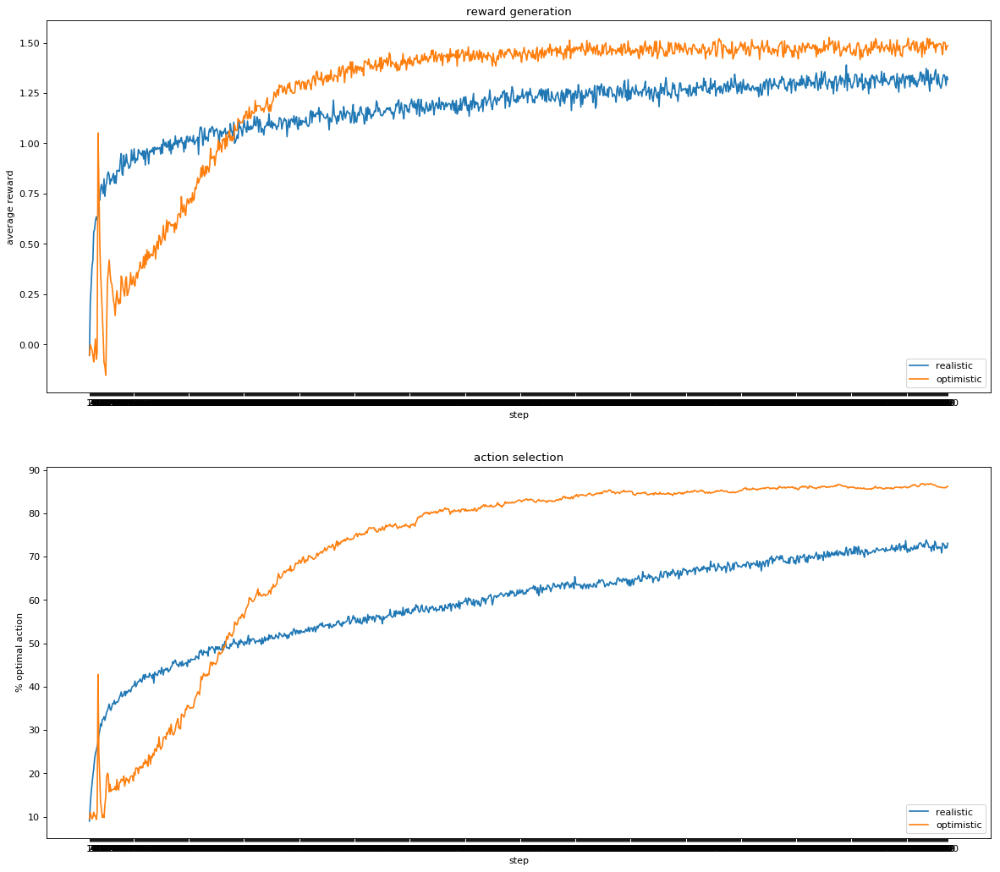

In [10]:
num_steps=1000;num_runs=2000

######################################optimistic and realistic, stationary #Q2

[total_rewards,optimum_actions]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.1,alpha=0.1,num_bandits=10,stat=1,optimistic=0,UCB=0)
for i in range(num_steps):
    total_rewards[i]/=num_runs;optimum_actions[i]*=(100/num_runs)

[t,o]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0,alpha=0.1,num_bandits=10,stat=1,optimistic=1,UCB=0)
for i in range(num_steps):
    t[i]/=num_runs;o[i]*=(100/num_runs)

fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
plt.subplot(2,1,1)
plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],total_rewards,label='realistic')

plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],t,label='optimistic')

plt.legend(loc='lower right')



plt.subplot(2,1,2)
plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],optimum_actions,label='realistic')

plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],o,label='optimistic')

plt.legend(loc='lower right')
plt.show()

INITIALIZING RUN... 1
phi_a's:  [1.7716933347892605, 1.7716933347892605, 1.7716933347892605, 1.7716933347892605, 1.7716933347892605, 1.7716933347892605, 1.7716933347892605, 1.7716933347892605, 1.7716933347892605, 1.7716933347892605]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 2
phi_a's:  [-0.07946708007888205, -0.07946708007888205, -0.07946708007888205, -0.07946708007888205, -0.07946708007888205, -0.07946708007888205, -0.07946708007888205, -0.07946708007888205, -0.07946708007888205, -0.07946708007888205]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 3
phi_a's:  [1.1527059619179705, 1.1527059619179705, 1.1527059619179705, 1.1527059619179705, 1.1527059619179705, 1.1527059619179705, 1.1527059619179705, 1.1527059619179705, 1.1527059619179705, 1.1527059619179705]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 24
phi_a's:  [1.2930095929054688, 1.2930095929054688, 1.2930095929054688, 1.2930095929054688, 1.2930095929054688, 1.2930095929054688, 1.2930095929054688, 1.2930095929054688, 1.2930095929054688, 1.2930095929054688]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 25
phi_a's:  [-0.05345850237413335, -0.05345850237413335, -0.05345850237413335, -0.05345850237413335, -0.05345850237413335, -0.05345850237413335, -0.05345850237413335, -0.05345850237413335, -0.05345850237413335, -0.05345850237413335]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 26
phi_a's:  [-0.5259684017950894, -0.5259684017950894, -0.5259684017950894, -0.5259684017950894, -0.5259684017950894, -0.5259684017950894, -0.5259684017950894, -0.5259684017950894, -0.5259684017950894, -0.5259684017950894]
q_a's:  [0

INITIALIZING RUN... 47
phi_a's:  [0.35105625315025335, 0.35105625315025335, 0.35105625315025335, 0.35105625315025335, 0.35105625315025335, 0.35105625315025335, 0.35105625315025335, 0.35105625315025335, 0.35105625315025335, 0.35105625315025335]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 48
phi_a's:  [0.5095246377270956, 0.5095246377270956, 0.5095246377270956, 0.5095246377270956, 0.5095246377270956, 0.5095246377270956, 0.5095246377270956, 0.5095246377270956, 0.5095246377270956, 0.5095246377270956]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 49
phi_a's:  [-1.8638657277562012, -1.8638657277562012, -1.8638657277562012, -1.8638657277562012, -1.8638657277562012, -1.8638657277562012, -1.8638657277562012, -1.8638657277562012, -1.8638657277562012, -1.8638657277562012]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 70
phi_a's:  [-0.2525745406521604, -0.2525745406521604, -0.2525745406521604, -0.2525745406521604, -0.2525745406521604, -0.2525745406521604, -0.2525745406521604, -0.2525745406521604, -0.2525745406521604, -0.2525745406521604]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 71
phi_a's:  [0.25383014201016424, 0.25383014201016424, 0.25383014201016424, 0.25383014201016424, 0.25383014201016424, 0.25383014201016424, 0.25383014201016424, 0.25383014201016424, 0.25383014201016424, 0.25383014201016424]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 72
phi_a's:  [-0.32857641062548254, -0.32857641062548254, -0.32857641062548254, -0.32857641062548254, -0.32857641062548254, -0.32857641062548254, -0.32857641062548254, -0.32857641062548254, -0.32857641062548254, -0.32857641062548254]


INITIALIZING RUN... 92
phi_a's:  [0.2448374006860851, 0.2448374006860851, 0.2448374006860851, 0.2448374006860851, 0.2448374006860851, 0.2448374006860851, 0.2448374006860851, 0.2448374006860851, 0.2448374006860851, 0.2448374006860851]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 93
phi_a's:  [-0.9737310085997346, -0.9737310085997346, -0.9737310085997346, -0.9737310085997346, -0.9737310085997346, -0.9737310085997346, -0.9737310085997346, -0.9737310085997346, -0.9737310085997346, -0.9737310085997346]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 94
phi_a's:  [-0.8311735339115269, -0.8311735339115269, -0.8311735339115269, -0.8311735339115269, -0.8311735339115269, -0.8311735339115269, -0.8311735339115269, -0.8311735339115269, -0.8311735339115269, -0.8311735339115269]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 115
phi_a's:  [0.32418697399617047, 0.32418697399617047, 0.32418697399617047, 0.32418697399617047, 0.32418697399617047, 0.32418697399617047, 0.32418697399617047, 0.32418697399617047, 0.32418697399617047, 0.32418697399617047]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 116
phi_a's:  [-1.0589026425188508, -1.0589026425188508, -1.0589026425188508, -1.0589026425188508, -1.0589026425188508, -1.0589026425188508, -1.0589026425188508, -1.0589026425188508, -1.0589026425188508, -1.0589026425188508]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 117
phi_a's:  [1.9714428089908285, 1.9714428089908285, 1.9714428089908285, 1.9714428089908285, 1.9714428089908285, 1.9714428089908285, 1.9714428089908285, 1.9714428089908285, 1.9714428089908285, 1.9714428089908285]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 137
phi_a's:  [-0.5960236746195968, -0.5960236746195968, -0.5960236746195968, -0.5960236746195968, -0.5960236746195968, -0.5960236746195968, -0.5960236746195968, -0.5960236746195968, -0.5960236746195968, -0.5960236746195968]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 138
phi_a's:  [1.9879620913311087, 1.9879620913311087, 1.9879620913311087, 1.9879620913311087, 1.9879620913311087, 1.9879620913311087, 1.9879620913311087, 1.9879620913311087, 1.9879620913311087, 1.9879620913311087]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 139
phi_a's:  [0.5055595462591316, 0.5055595462591316, 0.5055595462591316, 0.5055595462591316, 0.5055595462591316, 0.5055595462591316, 0.5055595462591316, 0.5055595462591316, 0.5055595462591316, 0.5055595462591316]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 160
phi_a's:  [-1.6134482359215028, -1.6134482359215028, -1.6134482359215028, -1.6134482359215028, -1.6134482359215028, -1.6134482359215028, -1.6134482359215028, -1.6134482359215028, -1.6134482359215028, -1.6134482359215028]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 161
phi_a's:  [-0.9354370929652305, -0.9354370929652305, -0.9354370929652305, -0.9354370929652305, -0.9354370929652305, -0.9354370929652305, -0.9354370929652305, -0.9354370929652305, -0.9354370929652305, -0.9354370929652305]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 162
phi_a's:  [0.4537891393041274, 0.4537891393041274, 0.4537891393041274, 0.4537891393041274, 0.4537891393041274, 0.4537891393041274, 0.4537891393041274, 0.4537891393041274, 0.4537891393041274, 0.4537891393041274]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 183
phi_a's:  [1.8082125898624497, 1.8082125898624497, 1.8082125898624497, 1.8082125898624497, 1.8082125898624497, 1.8082125898624497, 1.8082125898624497, 1.8082125898624497, 1.8082125898624497, 1.8082125898624497]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 184
phi_a's:  [1.6786091823028848, 1.6786091823028848, 1.6786091823028848, 1.6786091823028848, 1.6786091823028848, 1.6786091823028848, 1.6786091823028848, 1.6786091823028848, 1.6786091823028848, 1.6786091823028848]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 185
phi_a's:  [-0.5019684029043888, -0.5019684029043888, -0.5019684029043888, -0.5019684029043888, -0.5019684029043888, -0.5019684029043888, -0.5019684029043888, -0.5019684029043888, -0.5019684029043888, -0.5019684029043888]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 206
phi_a's:  [-0.6614035372009244, -0.6614035372009244, -0.6614035372009244, -0.6614035372009244, -0.6614035372009244, -0.6614035372009244, -0.6614035372009244, -0.6614035372009244, -0.6614035372009244, -0.6614035372009244]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 207
phi_a's:  [0.8244176404799688, 0.8244176404799688, 0.8244176404799688, 0.8244176404799688, 0.8244176404799688, 0.8244176404799688, 0.8244176404799688, 0.8244176404799688, 0.8244176404799688, 0.8244176404799688]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 208
phi_a's:  [-0.8741566280167133, -0.8741566280167133, -0.8741566280167133, -0.8741566280167133, -0.8741566280167133, -0.8741566280167133, -0.8741566280167133, -0.8741566280167133, -0.8741566280167133, -0.8741566280167133]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 229
phi_a's:  [-0.3651066700444332, -0.3651066700444332, -0.3651066700444332, -0.3651066700444332, -0.3651066700444332, -0.3651066700444332, -0.3651066700444332, -0.3651066700444332, -0.3651066700444332, -0.3651066700444332]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 230
phi_a's:  [0.03866383111052916, 0.03866383111052916, 0.03866383111052916, 0.03866383111052916, 0.03866383111052916, 0.03866383111052916, 0.03866383111052916, 0.03866383111052916, 0.03866383111052916, 0.03866383111052916]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 231
phi_a's:  [1.1825907015196266, 1.1825907015196266, 1.1825907015196266, 1.1825907015196266, 1.1825907015196266, 1.1825907015196266, 1.1825907015196266, 1.1825907015196266, 1.1825907015196266, 1.1825907015196266]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 252
phi_a's:  [0.34256781797749686, 0.34256781797749686, 0.34256781797749686, 0.34256781797749686, 0.34256781797749686, 0.34256781797749686, 0.34256781797749686, 0.34256781797749686, 0.34256781797749686, 0.34256781797749686]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 253
phi_a's:  [0.5008578857199341, 0.5008578857199341, 0.5008578857199341, 0.5008578857199341, 0.5008578857199341, 0.5008578857199341, 0.5008578857199341, 0.5008578857199341, 0.5008578857199341, 0.5008578857199341]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 254
phi_a's:  [-2.1873098734454404, -2.1873098734454404, -2.1873098734454404, -2.1873098734454404, -2.1873098734454404, -2.1873098734454404, -2.1873098734454404, -2.1873098734454404, -2.1873098734454404, -2.1873098734454404]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 275
phi_a's:  [1.0769790236545895, 1.0769790236545895, 1.0769790236545895, 1.0769790236545895, 1.0769790236545895, 1.0769790236545895, 1.0769790236545895, 1.0769790236545895, 1.0769790236545895, 1.0769790236545895]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 276
phi_a's:  [0.6833422981866236, 0.6833422981866236, 0.6833422981866236, 0.6833422981866236, 0.6833422981866236, 0.6833422981866236, 0.6833422981866236, 0.6833422981866236, 0.6833422981866236, 0.6833422981866236]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 277
phi_a's:  [1.582521874629032, 1.582521874629032, 1.582521874629032, 1.582521874629032, 1.582521874629032, 1.582521874629032, 1.582521874629032, 1.582521874629032, 1.582521874629032, 1.582521874629032]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  

INITIALIZING RUN... 298
phi_a's:  [0.37084854780557386, 0.37084854780557386, 0.37084854780557386, 0.37084854780557386, 0.37084854780557386, 0.37084854780557386, 0.37084854780557386, 0.37084854780557386, 0.37084854780557386, 0.37084854780557386]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 299
phi_a's:  [-0.5049295340835053, -0.5049295340835053, -0.5049295340835053, -0.5049295340835053, -0.5049295340835053, -0.5049295340835053, -0.5049295340835053, -0.5049295340835053, -0.5049295340835053, -0.5049295340835053]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 300
phi_a's:  [1.6591284093179766, 1.6591284093179766, 1.6591284093179766, 1.6591284093179766, 1.6591284093179766, 1.6591284093179766, 1.6591284093179766, 1.6591284093179766, 1.6591284093179766, 1.6591284093179766]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 321
phi_a's:  [1.2106416744049189, 1.2106416744049189, 1.2106416744049189, 1.2106416744049189, 1.2106416744049189, 1.2106416744049189, 1.2106416744049189, 1.2106416744049189, 1.2106416744049189, 1.2106416744049189]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 322
phi_a's:  [0.6284212191649883, 0.6284212191649883, 0.6284212191649883, 0.6284212191649883, 0.6284212191649883, 0.6284212191649883, 0.6284212191649883, 0.6284212191649883, 0.6284212191649883, 0.6284212191649883]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 323
phi_a's:  [-0.11444384659561475, -0.11444384659561475, -0.11444384659561475, -0.11444384659561475, -0.11444384659561475, -0.11444384659561475, -0.11444384659561475, -0.11444384659561475, -0.11444384659561475, -0.11444384659561475]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 344
phi_a's:  [0.4678546034244397, 0.4678546034244397, 0.4678546034244397, 0.4678546034244397, 0.4678546034244397, 0.4678546034244397, 0.4678546034244397, 0.4678546034244397, 0.4678546034244397, 0.4678546034244397]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 345
phi_a's:  [-1.140149601286955, -1.140149601286955, -1.140149601286955, -1.140149601286955, -1.140149601286955, -1.140149601286955, -1.140149601286955, -1.140149601286955, -1.140149601286955, -1.140149601286955]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 346
phi_a's:  [0.08605535510681889, 0.08605535510681889, 0.08605535510681889, 0.08605535510681889, 0.08605535510681889, 0.08605535510681889, 0.08605535510681889, 0.08605535510681889, 0.08605535510681889, 0.08605535510681889]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 367
phi_a's:  [1.0196650915116494, 1.0196650915116494, 1.0196650915116494, 1.0196650915116494, 1.0196650915116494, 1.0196650915116494, 1.0196650915116494, 1.0196650915116494, 1.0196650915116494, 1.0196650915116494]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 368
phi_a's:  [-1.646084107191217, -1.646084107191217, -1.646084107191217, -1.646084107191217, -1.646084107191217, -1.646084107191217, -1.646084107191217, -1.646084107191217, -1.646084107191217, -1.646084107191217]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 369
phi_a's:  [0.3925455033190941, 0.3925455033190941, 0.3925455033190941, 0.3925455033190941, 0.3925455033190941, 0.3925455033190941, 0.3925455033190941, 0.3925455033190941, 0.3925455033190941, 0.3925455033190941]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 390
phi_a's:  [0.3804371103323046, 0.3804371103323046, 0.3804371103323046, 0.3804371103323046, 0.3804371103323046, 0.3804371103323046, 0.3804371103323046, 0.3804371103323046, 0.3804371103323046, 0.3804371103323046]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 391
phi_a's:  [-0.08813849646727881, -0.08813849646727881, -0.08813849646727881, -0.08813849646727881, -0.08813849646727881, -0.08813849646727881, -0.08813849646727881, -0.08813849646727881, -0.08813849646727881, -0.08813849646727881]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 392
phi_a's:  [0.10766950911549761, 0.10766950911549761, 0.10766950911549761, 0.10766950911549761, 0.10766950911549761, 0.10766950911549761, 0.10766950911549761, 0.10766950911549761, 0.10766950911549761, 0.10766950911549761]
q_a's: 

INITIALIZING RUN... 413
phi_a's:  [0.29603202226173275, 0.29603202226173275, 0.29603202226173275, 0.29603202226173275, 0.29603202226173275, 0.29603202226173275, 0.29603202226173275, 0.29603202226173275, 0.29603202226173275, 0.29603202226173275]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 414
phi_a's:  [-0.057635775383805384, -0.057635775383805384, -0.057635775383805384, -0.057635775383805384, -0.057635775383805384, -0.057635775383805384, -0.057635775383805384, -0.057635775383805384, -0.057635775383805384, -0.057635775383805384]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 415
phi_a's:  [1.587038235422702, 1.587038235422702, 1.587038235422702, 1.587038235422702, 1.587038235422702, 1.587038235422702, 1.587038235422702, 1.587038235422702, 1.587038235422702, 1.587038235422702]
q_a's: 

INITIALIZING RUN... 436
phi_a's:  [0.42939480172355926, 0.42939480172355926, 0.42939480172355926, 0.42939480172355926, 0.42939480172355926, 0.42939480172355926, 0.42939480172355926, 0.42939480172355926, 0.42939480172355926, 0.42939480172355926]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 437
phi_a's:  [0.9193662833047024, 0.9193662833047024, 0.9193662833047024, 0.9193662833047024, 0.9193662833047024, 0.9193662833047024, 0.9193662833047024, 0.9193662833047024, 0.9193662833047024, 0.9193662833047024]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 438
phi_a's:  [0.5135125086183223, 0.5135125086183223, 0.5135125086183223, 0.5135125086183223, 0.5135125086183223, 0.5135125086183223, 0.5135125086183223, 0.5135125086183223, 0.5135125086183223, 0.5135125086183223]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 459
phi_a's:  [1.1745030946508046, 1.1745030946508046, 1.1745030946508046, 1.1745030946508046, 1.1745030946508046, 1.1745030946508046, 1.1745030946508046, 1.1745030946508046, 1.1745030946508046, 1.1745030946508046]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 460
phi_a's:  [-1.8854961259909775, -1.8854961259909775, -1.8854961259909775, -1.8854961259909775, -1.8854961259909775, -1.8854961259909775, -1.8854961259909775, -1.8854961259909775, -1.8854961259909775, -1.8854961259909775]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 461
phi_a's:  [2.227219512514819, 2.227219512514819, 2.227219512514819, 2.227219512514819, 2.227219512514819, 2.227219512514819, 2.227219512514819, 2.227219512514819, 2.227219512514819, 2.227219512514819]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 482
phi_a's:  [0.1619624817990265, 0.1619624817990265, 0.1619624817990265, 0.1619624817990265, 0.1619624817990265, 0.1619624817990265, 0.1619624817990265, 0.1619624817990265, 0.1619624817990265, 0.1619624817990265]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 483
phi_a's:  [-1.1349642279996863, -1.1349642279996863, -1.1349642279996863, -1.1349642279996863, -1.1349642279996863, -1.1349642279996863, -1.1349642279996863, -1.1349642279996863, -1.1349642279996863, -1.1349642279996863]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 484
phi_a's:  [-0.2595374101047922, -0.2595374101047922, -0.2595374101047922, -0.2595374101047922, -0.2595374101047922, -0.2595374101047922, -0.2595374101047922, -0.2595374101047922, -0.2595374101047922, -0.2595374101047922]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 505
phi_a's:  [-0.17476502955812645, -0.17476502955812645, -0.17476502955812645, -0.17476502955812645, -0.17476502955812645, -0.17476502955812645, -0.17476502955812645, -0.17476502955812645, -0.17476502955812645, -0.17476502955812645]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 506
phi_a's:  [-0.4551501038937423, -0.4551501038937423, -0.4551501038937423, -0.4551501038937423, -0.4551501038937423, -0.4551501038937423, -0.4551501038937423, -0.4551501038937423, -0.4551501038937423, -0.4551501038937423]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 507
phi_a's:  [1.0387790309954572, 1.0387790309954572, 1.0387790309954572, 1.0387790309954572, 1.0387790309954572, 1.0387790309954572, 1.0387790309954572, 1.0387790309954572, 1.0387790309954572, 1.0387790309954572]
q_a's: 

INITIALIZING RUN... 528
phi_a's:  [-0.17668146267981702, -0.17668146267981702, -0.17668146267981702, -0.17668146267981702, -0.17668146267981702, -0.17668146267981702, -0.17668146267981702, -0.17668146267981702, -0.17668146267981702, -0.17668146267981702]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 529
phi_a's:  [-0.7367199897522482, -0.7367199897522482, -0.7367199897522482, -0.7367199897522482, -0.7367199897522482, -0.7367199897522482, -0.7367199897522482, -0.7367199897522482, -0.7367199897522482, -0.7367199897522482]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 530
phi_a's:  [-0.7198789947315362, -0.7198789947315362, -0.7198789947315362, -0.7198789947315362, -0.7198789947315362, -0.7198789947315362, -0.7198789947315362, -0.7198789947315362, -0.7198789947315362, -0.719878994731536

INITIALIZING RUN... 551
phi_a's:  [-0.4642351421299496, -0.4642351421299496, -0.4642351421299496, -0.4642351421299496, -0.4642351421299496, -0.4642351421299496, -0.4642351421299496, -0.4642351421299496, -0.4642351421299496, -0.4642351421299496]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 552
phi_a's:  [1.7421039438193204, 1.7421039438193204, 1.7421039438193204, 1.7421039438193204, 1.7421039438193204, 1.7421039438193204, 1.7421039438193204, 1.7421039438193204, 1.7421039438193204, 1.7421039438193204]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 553
phi_a's:  [-1.491660737717529, -1.491660737717529, -1.491660737717529, -1.491660737717529, -1.491660737717529, -1.491660737717529, -1.491660737717529, -1.491660737717529, -1.491660737717529, -1.491660737717529]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 574
phi_a's:  [0.213619138327487, 0.213619138327487, 0.213619138327487, 0.213619138327487, 0.213619138327487, 0.213619138327487, 0.213619138327487, 0.213619138327487, 0.213619138327487, 0.213619138327487]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 575
phi_a's:  [1.7171932653686945, 1.7171932653686945, 1.7171932653686945, 1.7171932653686945, 1.7171932653686945, 1.7171932653686945, 1.7171932653686945, 1.7171932653686945, 1.7171932653686945, 1.7171932653686945]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 576
phi_a's:  [0.2047184792014846, 0.2047184792014846, 0.2047184792014846, 0.2047184792014846, 0.2047184792014846, 0.2047184792014846, 0.2047184792014846, 0.2047184792014846, 0.2047184792014846, 0.2047184792014846]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  

INITIALIZING RUN... 597
phi_a's:  [-1.315451262578619, -1.315451262578619, -1.315451262578619, -1.315451262578619, -1.315451262578619, -1.315451262578619, -1.315451262578619, -1.315451262578619, -1.315451262578619, -1.315451262578619]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 598
phi_a's:  [-1.2389687359628017, -1.2389687359628017, -1.2389687359628017, -1.2389687359628017, -1.2389687359628017, -1.2389687359628017, -1.2389687359628017, -1.2389687359628017, -1.2389687359628017, -1.2389687359628017]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 599
phi_a's:  [1.4057078236423695, 1.4057078236423695, 1.4057078236423695, 1.4057078236423695, 1.4057078236423695, 1.4057078236423695, 1.4057078236423695, 1.4057078236423695, 1.4057078236423695, 1.4057078236423695]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 620
phi_a's:  [-0.9874106882645294, -0.9874106882645294, -0.9874106882645294, -0.9874106882645294, -0.9874106882645294, -0.9874106882645294, -0.9874106882645294, -0.9874106882645294, -0.9874106882645294, -0.9874106882645294]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 621
phi_a's:  [1.5500820538456452, 1.5500820538456452, 1.5500820538456452, 1.5500820538456452, 1.5500820538456452, 1.5500820538456452, 1.5500820538456452, 1.5500820538456452, 1.5500820538456452, 1.5500820538456452]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 622
phi_a's:  [0.5254774360822191, 0.5254774360822191, 0.5254774360822191, 0.5254774360822191, 0.5254774360822191, 0.5254774360822191, 0.5254774360822191, 0.5254774360822191, 0.5254774360822191, 0.5254774360822191]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 643
phi_a's:  [0.3969323848644521, 0.3969323848644521, 0.3969323848644521, 0.3969323848644521, 0.3969323848644521, 0.3969323848644521, 0.3969323848644521, 0.3969323848644521, 0.3969323848644521, 0.3969323848644521]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 644
phi_a's:  [-0.3793546717046222, -0.3793546717046222, -0.3793546717046222, -0.3793546717046222, -0.3793546717046222, -0.3793546717046222, -0.3793546717046222, -0.3793546717046222, -0.3793546717046222, -0.3793546717046222]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 645
phi_a's:  [1.3040411801560265, 1.3040411801560265, 1.3040411801560265, 1.3040411801560265, 1.3040411801560265, 1.3040411801560265, 1.3040411801560265, 1.3040411801560265, 1.3040411801560265, 1.3040411801560265]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 666
phi_a's:  [-0.594927740790023, -0.594927740790023, -0.594927740790023, -0.594927740790023, -0.594927740790023, -0.594927740790023, -0.594927740790023, -0.594927740790023, -0.594927740790023, -0.594927740790023]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 667
phi_a's:  [0.041021072240162354, 0.041021072240162354, 0.041021072240162354, 0.041021072240162354, 0.041021072240162354, 0.041021072240162354, 0.041021072240162354, 0.041021072240162354, 0.041021072240162354, 0.041021072240162354]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 668
phi_a's:  [-0.05952403207972584, -0.05952403207972584, -0.05952403207972584, -0.05952403207972584, -0.05952403207972584, -0.05952403207972584, -0.05952403207972584, -0.05952403207972584, -0.05952403207972584, -0.0595240320797258

INITIALIZING RUN... 689
phi_a's:  [-1.0633840656446505, -1.0633840656446505, -1.0633840656446505, -1.0633840656446505, -1.0633840656446505, -1.0633840656446505, -1.0633840656446505, -1.0633840656446505, -1.0633840656446505, -1.0633840656446505]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 690
phi_a's:  [-1.1397857530280089, -1.1397857530280089, -1.1397857530280089, -1.1397857530280089, -1.1397857530280089, -1.1397857530280089, -1.1397857530280089, -1.1397857530280089, -1.1397857530280089, -1.1397857530280089]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 691
phi_a's:  [-0.16359509708887923, -0.16359509708887923, -0.16359509708887923, -0.16359509708887923, -0.16359509708887923, -0.16359509708887923, -0.16359509708887923, -0.16359509708887923, -0.16359509708887923, -0.1635950970888792

INITIALIZING RUN... 712
phi_a's:  [0.42968825203778704, 0.42968825203778704, 0.42968825203778704, 0.42968825203778704, 0.42968825203778704, 0.42968825203778704, 0.42968825203778704, 0.42968825203778704, 0.42968825203778704, 0.42968825203778704]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 713
phi_a's:  [0.3315833756051658, 0.3315833756051658, 0.3315833756051658, 0.3315833756051658, 0.3315833756051658, 0.3315833756051658, 0.3315833756051658, 0.3315833756051658, 0.3315833756051658, 0.3315833756051658]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 714
phi_a's:  [0.25495314270794206, 0.25495314270794206, 0.25495314270794206, 0.25495314270794206, 0.25495314270794206, 0.25495314270794206, 0.25495314270794206, 0.25495314270794206, 0.25495314270794206, 0.25495314270794206]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 735
phi_a's:  [-1.536261609638185, -1.536261609638185, -1.536261609638185, -1.536261609638185, -1.536261609638185, -1.536261609638185, -1.536261609638185, -1.536261609638185, -1.536261609638185, -1.536261609638185]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 736
phi_a's:  [0.29353110672311716, 0.29353110672311716, 0.29353110672311716, 0.29353110672311716, 0.29353110672311716, 0.29353110672311716, 0.29353110672311716, 0.29353110672311716, 0.29353110672311716, 0.29353110672311716]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 737
phi_a's:  [-0.5260542880266704, -0.5260542880266704, -0.5260542880266704, -0.5260542880266704, -0.5260542880266704, -0.5260542880266704, -0.5260542880266704, -0.5260542880266704, -0.5260542880266704, -0.5260542880266704]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 757
phi_a's:  [0.9344927966897046, 0.9344927966897046, 0.9344927966897046, 0.9344927966897046, 0.9344927966897046, 0.9344927966897046, 0.9344927966897046, 0.9344927966897046, 0.9344927966897046, 0.9344927966897046]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 758
phi_a's:  [0.10041715976537674, 0.10041715976537674, 0.10041715976537674, 0.10041715976537674, 0.10041715976537674, 0.10041715976537674, 0.10041715976537674, 0.10041715976537674, 0.10041715976537674, 0.10041715976537674]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 759
phi_a's:  [-0.7439550162905654, -0.7439550162905654, -0.7439550162905654, -0.7439550162905654, -0.7439550162905654, -0.7439550162905654, -0.7439550162905654, -0.7439550162905654, -0.7439550162905654, -0.7439550162905654]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 780
phi_a's:  [0.09420307323366221, 0.09420307323366221, 0.09420307323366221, 0.09420307323366221, 0.09420307323366221, 0.09420307323366221, 0.09420307323366221, 0.09420307323366221, 0.09420307323366221, 0.09420307323366221]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 781
phi_a's:  [0.013767004069120917, 0.013767004069120917, 0.013767004069120917, 0.013767004069120917, 0.013767004069120917, 0.013767004069120917, 0.013767004069120917, 0.013767004069120917, 0.013767004069120917, 0.013767004069120917]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 782
phi_a's:  [0.7787269910816969, 0.7787269910816969, 0.7787269910816969, 0.7787269910816969, 0.7787269910816969, 0.7787269910816969, 0.7787269910816969, 0.7787269910816969, 0.7787269910816969, 0.7787269910816969]
q_a's: 

INITIALIZING RUN... 803
phi_a's:  [-0.5249847758873311, -0.5249847758873311, -0.5249847758873311, -0.5249847758873311, -0.5249847758873311, -0.5249847758873311, -0.5249847758873311, -0.5249847758873311, -0.5249847758873311, -0.5249847758873311]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 804
phi_a's:  [1.9432851100859676, 1.9432851100859676, 1.9432851100859676, 1.9432851100859676, 1.9432851100859676, 1.9432851100859676, 1.9432851100859676, 1.9432851100859676, 1.9432851100859676, 1.9432851100859676]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 805
phi_a's:  [1.3997670865328882, 1.3997670865328882, 1.3997670865328882, 1.3997670865328882, 1.3997670865328882, 1.3997670865328882, 1.3997670865328882, 1.3997670865328882, 1.3997670865328882, 1.3997670865328882]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 826
phi_a's:  [-0.10796327037639475, -0.10796327037639475, -0.10796327037639475, -0.10796327037639475, -0.10796327037639475, -0.10796327037639475, -0.10796327037639475, -0.10796327037639475, -0.10796327037639475, -0.10796327037639475]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 827
phi_a's:  [-0.0830006501860288, -0.0830006501860288, -0.0830006501860288, -0.0830006501860288, -0.0830006501860288, -0.0830006501860288, -0.0830006501860288, -0.0830006501860288, -0.0830006501860288, -0.0830006501860288]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 828
phi_a's:  [-0.20268704333242593, -0.20268704333242593, -0.20268704333242593, -0.20268704333242593, -0.20268704333242593, -0.20268704333242593, -0.20268704333242593, -0.20268704333242593, -0.20268704333242593, -0.202687

INITIALIZING RUN... 849
phi_a's:  [0.2936783176610783, 0.2936783176610783, 0.2936783176610783, 0.2936783176610783, 0.2936783176610783, 0.2936783176610783, 0.2936783176610783, 0.2936783176610783, 0.2936783176610783, 0.2936783176610783]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 850
phi_a's:  [-0.912960650133026, -0.912960650133026, -0.912960650133026, -0.912960650133026, -0.912960650133026, -0.912960650133026, -0.912960650133026, -0.912960650133026, -0.912960650133026, -0.912960650133026]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 851
phi_a's:  [0.17757399173902788, 0.17757399173902788, 0.17757399173902788, 0.17757399173902788, 0.17757399173902788, 0.17757399173902788, 0.17757399173902788, 0.17757399173902788, 0.17757399173902788, 0.17757399173902788]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 872
phi_a's:  [0.6245153108294329, 0.6245153108294329, 0.6245153108294329, 0.6245153108294329, 0.6245153108294329, 0.6245153108294329, 0.6245153108294329, 0.6245153108294329, 0.6245153108294329, 0.6245153108294329]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 873
phi_a's:  [0.16438149496411994, 0.16438149496411994, 0.16438149496411994, 0.16438149496411994, 0.16438149496411994, 0.16438149496411994, 0.16438149496411994, 0.16438149496411994, 0.16438149496411994, 0.16438149496411994]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 874
phi_a's:  [0.24536125103858253, 0.24536125103858253, 0.24536125103858253, 0.24536125103858253, 0.24536125103858253, 0.24536125103858253, 0.24536125103858253, 0.24536125103858253, 0.24536125103858253, 0.24536125103858253]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 895
phi_a's:  [-0.6273237061123189, -0.6273237061123189, -0.6273237061123189, -0.6273237061123189, -0.6273237061123189, -0.6273237061123189, -0.6273237061123189, -0.6273237061123189, -0.6273237061123189, -0.6273237061123189]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 896
phi_a's:  [-1.706825354114186, -1.706825354114186, -1.706825354114186, -1.706825354114186, -1.706825354114186, -1.706825354114186, -1.706825354114186, -1.706825354114186, -1.706825354114186, -1.706825354114186]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 897
phi_a's:  [-1.1041184146521597, -1.1041184146521597, -1.1041184146521597, -1.1041184146521597, -1.1041184146521597, -1.1041184146521597, -1.1041184146521597, -1.1041184146521597, -1.1041184146521597, -1.1041184146521597]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 917
phi_a's:  [0.6863048529381447, 0.6863048529381447, 0.6863048529381447, 0.6863048529381447, 0.6863048529381447, 0.6863048529381447, 0.6863048529381447, 0.6863048529381447, 0.6863048529381447, 0.6863048529381447]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 918
phi_a's:  [0.11146023935772408, 0.11146023935772408, 0.11146023935772408, 0.11146023935772408, 0.11146023935772408, 0.11146023935772408, 0.11146023935772408, 0.11146023935772408, 0.11146023935772408, 0.11146023935772408]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 919
phi_a's:  [-1.0623684116965675, -1.0623684116965675, -1.0623684116965675, -1.0623684116965675, -1.0623684116965675, -1.0623684116965675, -1.0623684116965675, -1.0623684116965675, -1.0623684116965675, -1.0623684116965675]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 940
phi_a's:  [-0.585494453306095, -0.585494453306095, -0.585494453306095, -0.585494453306095, -0.585494453306095, -0.585494453306095, -0.585494453306095, -0.585494453306095, -0.585494453306095, -0.585494453306095]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 941
phi_a's:  [-0.45312368871031017, -0.45312368871031017, -0.45312368871031017, -0.45312368871031017, -0.45312368871031017, -0.45312368871031017, -0.45312368871031017, -0.45312368871031017, -0.45312368871031017, -0.45312368871031017]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 942
phi_a's:  [0.1882344252638263, 0.1882344252638263, 0.1882344252638263, 0.1882344252638263, 0.1882344252638263, 0.1882344252638263, 0.1882344252638263, 0.1882344252638263, 0.1882344252638263, 0.1882344252638263]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 963
phi_a's:  [-0.4946459115927727, -0.4946459115927727, -0.4946459115927727, -0.4946459115927727, -0.4946459115927727, -0.4946459115927727, -0.4946459115927727, -0.4946459115927727, -0.4946459115927727, -0.4946459115927727]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 964
phi_a's:  [1.0341646294019815, 1.0341646294019815, 1.0341646294019815, 1.0341646294019815, 1.0341646294019815, 1.0341646294019815, 1.0341646294019815, 1.0341646294019815, 1.0341646294019815, 1.0341646294019815]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 965
phi_a's:  [-0.02048254020199846, -0.02048254020199846, -0.02048254020199846, -0.02048254020199846, -0.02048254020199846, -0.02048254020199846, -0.02048254020199846, -0.02048254020199846, -0.02048254020199846, -0.02048254020199846]
q_a's: 

INITIALIZING RUN... 986
phi_a's:  [-1.1728538576176615, -1.1728538576176615, -1.1728538576176615, -1.1728538576176615, -1.1728538576176615, -1.1728538576176615, -1.1728538576176615, -1.1728538576176615, -1.1728538576176615, -1.1728538576176615]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 987
phi_a's:  [-0.553321156037024, -0.553321156037024, -0.553321156037024, -0.553321156037024, -0.553321156037024, -0.553321156037024, -0.553321156037024, -0.553321156037024, -0.553321156037024, -0.553321156037024]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 988
phi_a's:  [0.7730097628718832, 0.7730097628718832, 0.7730097628718832, 0.7730097628718832, 0.7730097628718832, 0.7730097628718832, 0.7730097628718832, 0.7730097628718832, 0.7730097628718832, 0.7730097628718832]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1009
phi_a's:  [-0.045395684563040876, -0.045395684563040876, -0.045395684563040876, -0.045395684563040876, -0.045395684563040876, -0.045395684563040876, -0.045395684563040876, -0.045395684563040876, -0.045395684563040876, -0.045395684563040876]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1010
phi_a's:  [-0.26778602653731515, -0.26778602653731515, -0.26778602653731515, -0.26778602653731515, -0.26778602653731515, -0.26778602653731515, -0.26778602653731515, -0.26778602653731515, -0.26778602653731515, -0.26778602653731515]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1011
phi_a's:  [-0.553176252435117, -0.553176252435117, -0.553176252435117, -0.553176252435117, -0.553176252435117, -0.553176252435117, -0.553176252435117, -0.553176252435117, -0.553176252435117, -0.5

INITIALIZING RUN... 1031
phi_a's:  [0.4171273522120653, 0.4171273522120653, 0.4171273522120653, 0.4171273522120653, 0.4171273522120653, 0.4171273522120653, 0.4171273522120653, 0.4171273522120653, 0.4171273522120653, 0.4171273522120653]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1032
phi_a's:  [1.296551648539845, 1.296551648539845, 1.296551648539845, 1.296551648539845, 1.296551648539845, 1.296551648539845, 1.296551648539845, 1.296551648539845, 1.296551648539845, 1.296551648539845]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1033
phi_a's:  [0.33398094280713736, 0.33398094280713736, 0.33398094280713736, 0.33398094280713736, 0.33398094280713736, 0.33398094280713736, 0.33398094280713736, 0.33398094280713736, 0.33398094280713736, 0.33398094280713736]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1054
phi_a's:  [-1.0833533667812043, -1.0833533667812043, -1.0833533667812043, -1.0833533667812043, -1.0833533667812043, -1.0833533667812043, -1.0833533667812043, -1.0833533667812043, -1.0833533667812043, -1.0833533667812043]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1055
phi_a's:  [0.3361760600509133, 0.3361760600509133, 0.3361760600509133, 0.3361760600509133, 0.3361760600509133, 0.3361760600509133, 0.3361760600509133, 0.3361760600509133, 0.3361760600509133, 0.3361760600509133]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1056
phi_a's:  [1.7359456000174376, 1.7359456000174376, 1.7359456000174376, 1.7359456000174376, 1.7359456000174376, 1.7359456000174376, 1.7359456000174376, 1.7359456000174376, 1.7359456000174376, 1.7359456000174376]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1076
phi_a's:  [0.8415486293345433, 0.8415486293345433, 0.8415486293345433, 0.8415486293345433, 0.8415486293345433, 0.8415486293345433, 0.8415486293345433, 0.8415486293345433, 0.8415486293345433, 0.8415486293345433]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1077
phi_a's:  [0.7133120882815935, 0.7133120882815935, 0.7133120882815935, 0.7133120882815935, 0.7133120882815935, 0.7133120882815935, 0.7133120882815935, 0.7133120882815935, 0.7133120882815935, 0.7133120882815935]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1078
phi_a's:  [-1.672448552256048, -1.672448552256048, -1.672448552256048, -1.672448552256048, -1.672448552256048, -1.672448552256048, -1.672448552256048, -1.672448552256048, -1.672448552256048, -1.672448552256048]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1099
phi_a's:  [0.29238520798330847, 0.29238520798330847, 0.29238520798330847, 0.29238520798330847, 0.29238520798330847, 0.29238520798330847, 0.29238520798330847, 0.29238520798330847, 0.29238520798330847, 0.29238520798330847]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1100
phi_a's:  [0.2117363346443526, 0.2117363346443526, 0.2117363346443526, 0.2117363346443526, 0.2117363346443526, 0.2117363346443526, 0.2117363346443526, 0.2117363346443526, 0.2117363346443526, 0.2117363346443526]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1101
phi_a's:  [0.5883751603075205, 0.5883751603075205, 0.5883751603075205, 0.5883751603075205, 0.5883751603075205, 0.5883751603075205, 0.5883751603075205, 0.5883751603075205, 0.5883751603075205, 0.5883751603075205]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1122
phi_a's:  [0.2121436808452366, 0.2121436808452366, 0.2121436808452366, 0.2121436808452366, 0.2121436808452366, 0.2121436808452366, 0.2121436808452366, 0.2121436808452366, 0.2121436808452366, 0.2121436808452366]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1123
phi_a's:  [0.10889984196759142, 0.10889984196759142, 0.10889984196759142, 0.10889984196759142, 0.10889984196759142, 0.10889984196759142, 0.10889984196759142, 0.10889984196759142, 0.10889984196759142, 0.10889984196759142]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1124
phi_a's:  [-1.1752393759288502, -1.1752393759288502, -1.1752393759288502, -1.1752393759288502, -1.1752393759288502, -1.1752393759288502, -1.1752393759288502, -1.1752393759288502, -1.1752393759288502, -1.1752393759288502]
q_a's:  [0, 0,

INITIALIZING RUN... 1145
phi_a's:  [-0.18558902601139018, -0.18558902601139018, -0.18558902601139018, -0.18558902601139018, -0.18558902601139018, -0.18558902601139018, -0.18558902601139018, -0.18558902601139018, -0.18558902601139018, -0.18558902601139018]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1146
phi_a's:  [-0.0916068356891346, -0.0916068356891346, -0.0916068356891346, -0.0916068356891346, -0.0916068356891346, -0.0916068356891346, -0.0916068356891346, -0.0916068356891346, -0.0916068356891346, -0.0916068356891346]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1147
phi_a's:  [-1.0104280609081238, -1.0104280609081238, -1.0104280609081238, -1.0104280609081238, -1.0104280609081238, -1.0104280609081238, -1.0104280609081238, -1.0104280609081238, -1.0104280609081238, -1.010428060908

INITIALIZING RUN... 1168
phi_a's:  [0.5792065344769025, 0.5792065344769025, 0.5792065344769025, 0.5792065344769025, 0.5792065344769025, 0.5792065344769025, 0.5792065344769025, 0.5792065344769025, 0.5792065344769025, 0.5792065344769025]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1169
phi_a's:  [0.9000905118526019, 0.9000905118526019, 0.9000905118526019, 0.9000905118526019, 0.9000905118526019, 0.9000905118526019, 0.9000905118526019, 0.9000905118526019, 0.9000905118526019, 0.9000905118526019]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1170
phi_a's:  [0.9471929579438892, 0.9471929579438892, 0.9471929579438892, 0.9471929579438892, 0.9471929579438892, 0.9471929579438892, 0.9471929579438892, 0.9471929579438892, 0.9471929579438892, 0.9471929579438892]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1191
phi_a's:  [1.3386454683518036, 1.3386454683518036, 1.3386454683518036, 1.3386454683518036, 1.3386454683518036, 1.3386454683518036, 1.3386454683518036, 1.3386454683518036, 1.3386454683518036, 1.3386454683518036]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1192
phi_a's:  [0.816715776943187, 0.816715776943187, 0.816715776943187, 0.816715776943187, 0.816715776943187, 0.816715776943187, 0.816715776943187, 0.816715776943187, 0.816715776943187, 0.816715776943187]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1193
phi_a's:  [-0.05675625036583725, -0.05675625036583725, -0.05675625036583725, -0.05675625036583725, -0.05675625036583725, -0.05675625036583725, -0.05675625036583725, -0.05675625036583725, -0.05675625036583725, -0.05675625036583725]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1214
phi_a's:  [-0.2633745121031971, -0.2633745121031971, -0.2633745121031971, -0.2633745121031971, -0.2633745121031971, -0.2633745121031971, -0.2633745121031971, -0.2633745121031971, -0.2633745121031971, -0.2633745121031971]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1215
phi_a's:  [-0.5873992411489857, -0.5873992411489857, -0.5873992411489857, -0.5873992411489857, -0.5873992411489857, -0.5873992411489857, -0.5873992411489857, -0.5873992411489857, -0.5873992411489857, -0.5873992411489857]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1216
phi_a's:  [0.701399041077041, 0.701399041077041, 0.701399041077041, 0.701399041077041, 0.701399041077041, 0.701399041077041, 0.701399041077041, 0.701399041077041, 0.701399041077041, 0.701399041077041]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1237
phi_a's:  [-1.182209512598925, -1.182209512598925, -1.182209512598925, -1.182209512598925, -1.182209512598925, -1.182209512598925, -1.182209512598925, -1.182209512598925, -1.182209512598925, -1.182209512598925]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1238
phi_a's:  [0.28809557172555206, 0.28809557172555206, 0.28809557172555206, 0.28809557172555206, 0.28809557172555206, 0.28809557172555206, 0.28809557172555206, 0.28809557172555206, 0.28809557172555206, 0.28809557172555206]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1239
phi_a's:  [0.3451231694538433, 0.3451231694538433, 0.3451231694538433, 0.3451231694538433, 0.3451231694538433, 0.3451231694538433, 0.3451231694538433, 0.3451231694538433, 0.3451231694538433, 0.3451231694538433]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1260
phi_a's:  [0.6930702182283032, 0.6930702182283032, 0.6930702182283032, 0.6930702182283032, 0.6930702182283032, 0.6930702182283032, 0.6930702182283032, 0.6930702182283032, 0.6930702182283032, 0.6930702182283032]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1261
phi_a's:  [-0.37928134656259976, -0.37928134656259976, -0.37928134656259976, -0.37928134656259976, -0.37928134656259976, -0.37928134656259976, -0.37928134656259976, -0.37928134656259976, -0.37928134656259976, -0.37928134656259976]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1262
phi_a's:  [0.33586840599059864, 0.33586840599059864, 0.33586840599059864, 0.33586840599059864, 0.33586840599059864, 0.33586840599059864, 0.33586840599059864, 0.33586840599059864, 0.33586840599059864, 0.33586840599059864]
q_a'

INITIALIZING RUN... 1282
phi_a's:  [-0.7456122047387992, -0.7456122047387992, -0.7456122047387992, -0.7456122047387992, -0.7456122047387992, -0.7456122047387992, -0.7456122047387992, -0.7456122047387992, -0.7456122047387992, -0.7456122047387992]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1283
phi_a's:  [0.3061370441961354, 0.3061370441961354, 0.3061370441961354, 0.3061370441961354, 0.3061370441961354, 0.3061370441961354, 0.3061370441961354, 0.3061370441961354, 0.3061370441961354, 0.3061370441961354]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1284
phi_a's:  [0.38633201435239795, 0.38633201435239795, 0.38633201435239795, 0.38633201435239795, 0.38633201435239795, 0.38633201435239795, 0.38633201435239795, 0.38633201435239795, 0.38633201435239795, 0.38633201435239795]
q_a's:  [0, 0,

INITIALIZING RUN... 1304
phi_a's:  [1.0767505065919762, 1.0767505065919762, 1.0767505065919762, 1.0767505065919762, 1.0767505065919762, 1.0767505065919762, 1.0767505065919762, 1.0767505065919762, 1.0767505065919762, 1.0767505065919762]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1305
phi_a's:  [-3.0522129482843123, -3.0522129482843123, -3.0522129482843123, -3.0522129482843123, -3.0522129482843123, -3.0522129482843123, -3.0522129482843123, -3.0522129482843123, -3.0522129482843123, -3.0522129482843123]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1306
phi_a's:  [-0.22545206940178575, -0.22545206940178575, -0.22545206940178575, -0.22545206940178575, -0.22545206940178575, -0.22545206940178575, -0.22545206940178575, -0.22545206940178575, -0.22545206940178575, -0.22545206940178575]
q_a'

INITIALIZING RUN... 1326
phi_a's:  [0.2918331308401451, 0.2918331308401451, 0.2918331308401451, 0.2918331308401451, 0.2918331308401451, 0.2918331308401451, 0.2918331308401451, 0.2918331308401451, 0.2918331308401451, 0.2918331308401451]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1327
phi_a's:  [1.0380590078868974, 1.0380590078868974, 1.0380590078868974, 1.0380590078868974, 1.0380590078868974, 1.0380590078868974, 1.0380590078868974, 1.0380590078868974, 1.0380590078868974, 1.0380590078868974]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1328
phi_a's:  [1.2338410055249944, 1.2338410055249944, 1.2338410055249944, 1.2338410055249944, 1.2338410055249944, 1.2338410055249944, 1.2338410055249944, 1.2338410055249944, 1.2338410055249944, 1.2338410055249944]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1349
phi_a's:  [1.1876984045585601, 1.1876984045585601, 1.1876984045585601, 1.1876984045585601, 1.1876984045585601, 1.1876984045585601, 1.1876984045585601, 1.1876984045585601, 1.1876984045585601, 1.1876984045585601]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1350
phi_a's:  [-0.4454606645891167, -0.4454606645891167, -0.4454606645891167, -0.4454606645891167, -0.4454606645891167, -0.4454606645891167, -0.4454606645891167, -0.4454606645891167, -0.4454606645891167, -0.4454606645891167]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1351
phi_a's:  [-0.660355590260945, -0.660355590260945, -0.660355590260945, -0.660355590260945, -0.660355590260945, -0.660355590260945, -0.660355590260945, -0.660355590260945, -0.660355590260945, -0.660355590260945]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1372
phi_a's:  [-0.9407890944776073, -0.9407890944776073, -0.9407890944776073, -0.9407890944776073, -0.9407890944776073, -0.9407890944776073, -0.9407890944776073, -0.9407890944776073, -0.9407890944776073, -0.9407890944776073]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1373
phi_a's:  [-0.16009528392607866, -0.16009528392607866, -0.16009528392607866, -0.16009528392607866, -0.16009528392607866, -0.16009528392607866, -0.16009528392607866, -0.16009528392607866, -0.16009528392607866, -0.16009528392607866]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1374
phi_a's:  [0.2506558972365812, 0.2506558972365812, 0.2506558972365812, 0.2506558972365812, 0.2506558972365812, 0.2506558972365812, 0.2506558972365812, 0.2506558972365812, 0.2506558972365812, 0.2506558972365812]
q_a'

INITIALIZING RUN... 1394
phi_a's:  [1.2968059936533514, 1.2968059936533514, 1.2968059936533514, 1.2968059936533514, 1.2968059936533514, 1.2968059936533514, 1.2968059936533514, 1.2968059936533514, 1.2968059936533514, 1.2968059936533514]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1395
phi_a's:  [0.9287417824719095, 0.9287417824719095, 0.9287417824719095, 0.9287417824719095, 0.9287417824719095, 0.9287417824719095, 0.9287417824719095, 0.9287417824719095, 0.9287417824719095, 0.9287417824719095]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1396
phi_a's:  [0.9768941444472058, 0.9768941444472058, 0.9768941444472058, 0.9768941444472058, 0.9768941444472058, 0.9768941444472058, 0.9768941444472058, 0.9768941444472058, 0.9768941444472058, 0.9768941444472058]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1417
phi_a's:  [2.5218972679310703, 2.5218972679310703, 2.5218972679310703, 2.5218972679310703, 2.5218972679310703, 2.5218972679310703, 2.5218972679310703, 2.5218972679310703, 2.5218972679310703, 2.5218972679310703]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1418
phi_a's:  [-0.24573037471620335, -0.24573037471620335, -0.24573037471620335, -0.24573037471620335, -0.24573037471620335, -0.24573037471620335, -0.24573037471620335, -0.24573037471620335, -0.24573037471620335, -0.24573037471620335]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1419
phi_a's:  [0.1257437975977906, 0.1257437975977906, 0.1257437975977906, 0.1257437975977906, 0.1257437975977906, 0.1257437975977906, 0.1257437975977906, 0.1257437975977906, 0.1257437975977906, 0.1257437975977906]
q_a's:  [0, 0,

INITIALIZING RUN... 1440
phi_a's:  [0.2640190059756899, 0.2640190059756899, 0.2640190059756899, 0.2640190059756899, 0.2640190059756899, 0.2640190059756899, 0.2640190059756899, 0.2640190059756899, 0.2640190059756899, 0.2640190059756899]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1441
phi_a's:  [0.43315492897158386, 0.43315492897158386, 0.43315492897158386, 0.43315492897158386, 0.43315492897158386, 0.43315492897158386, 0.43315492897158386, 0.43315492897158386, 0.43315492897158386, 0.43315492897158386]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1442
phi_a's:  [-0.06689984572231306, -0.06689984572231306, -0.06689984572231306, -0.06689984572231306, -0.06689984572231306, -0.06689984572231306, -0.06689984572231306, -0.06689984572231306, -0.06689984572231306, -0.06689984572231306]
q_a'

INITIALIZING RUN... 1462
phi_a's:  [-0.2719527574580231, -0.2719527574580231, -0.2719527574580231, -0.2719527574580231, -0.2719527574580231, -0.2719527574580231, -0.2719527574580231, -0.2719527574580231, -0.2719527574580231, -0.2719527574580231]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1463
phi_a's:  [-0.05027441767937385, -0.05027441767937385, -0.05027441767937385, -0.05027441767937385, -0.05027441767937385, -0.05027441767937385, -0.05027441767937385, -0.05027441767937385, -0.05027441767937385, -0.05027441767937385]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1464
phi_a's:  [0.023571384703470533, 0.023571384703470533, 0.023571384703470533, 0.023571384703470533, 0.023571384703470533, 0.023571384703470533, 0.023571384703470533, 0.023571384703470533, 0.023571384703470533, 0.0235

INITIALIZING RUN... 1484
phi_a's:  [0.0017743706406332309, 0.0017743706406332309, 0.0017743706406332309, 0.0017743706406332309, 0.0017743706406332309, 0.0017743706406332309, 0.0017743706406332309, 0.0017743706406332309, 0.0017743706406332309, 0.0017743706406332309]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1485
phi_a's:  [-0.810988571081891, -0.810988571081891, -0.810988571081891, -0.810988571081891, -0.810988571081891, -0.810988571081891, -0.810988571081891, -0.810988571081891, -0.810988571081891, -0.810988571081891]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1486
phi_a's:  [1.15831753609414, 1.15831753609414, 1.15831753609414, 1.15831753609414, 1.15831753609414, 1.15831753609414, 1.15831753609414, 1.15831753609414, 1.15831753609414, 1.15831753609414]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1507
phi_a's:  [-1.2070666100380776, -1.2070666100380776, -1.2070666100380776, -1.2070666100380776, -1.2070666100380776, -1.2070666100380776, -1.2070666100380776, -1.2070666100380776, -1.2070666100380776, -1.2070666100380776]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1508
phi_a's:  [-1.0758521183214926, -1.0758521183214926, -1.0758521183214926, -1.0758521183214926, -1.0758521183214926, -1.0758521183214926, -1.0758521183214926, -1.0758521183214926, -1.0758521183214926, -1.0758521183214926]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1509
phi_a's:  [-0.2553225891122635, -0.2553225891122635, -0.2553225891122635, -0.2553225891122635, -0.2553225891122635, -0.2553225891122635, -0.2553225891122635, -0.2553225891122635, -0.2553225891122635, -0.2553225891122635]
q_a'

INITIALIZING RUN... 1530
phi_a's:  [-0.1221968317757811, -0.1221968317757811, -0.1221968317757811, -0.1221968317757811, -0.1221968317757811, -0.1221968317757811, -0.1221968317757811, -0.1221968317757811, -0.1221968317757811, -0.1221968317757811]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1531
phi_a's:  [-1.2806976538602228, -1.2806976538602228, -1.2806976538602228, -1.2806976538602228, -1.2806976538602228, -1.2806976538602228, -1.2806976538602228, -1.2806976538602228, -1.2806976538602228, -1.2806976538602228]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1532
phi_a's:  [-0.31865369017713563, -0.31865369017713563, -0.31865369017713563, -0.31865369017713563, -0.31865369017713563, -0.31865369017713563, -0.31865369017713563, -0.31865369017713563, -0.31865369017713563, -0.3186536901771

INITIALIZING RUN... 1553
phi_a's:  [-1.739897631893004, -1.739897631893004, -1.739897631893004, -1.739897631893004, -1.739897631893004, -1.739897631893004, -1.739897631893004, -1.739897631893004, -1.739897631893004, -1.739897631893004]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1554
phi_a's:  [-1.8670774955071734, -1.8670774955071734, -1.8670774955071734, -1.8670774955071734, -1.8670774955071734, -1.8670774955071734, -1.8670774955071734, -1.8670774955071734, -1.8670774955071734, -1.8670774955071734]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1555
phi_a's:  [0.08053019903446242, 0.08053019903446242, 0.08053019903446242, 0.08053019903446242, 0.08053019903446242, 0.08053019903446242, 0.08053019903446242, 0.08053019903446242, 0.08053019903446242, 0.08053019903446242]
q_a's:  [0, 0,

INITIALIZING RUN... 1576
phi_a's:  [-0.4673506080621671, -0.4673506080621671, -0.4673506080621671, -0.4673506080621671, -0.4673506080621671, -0.4673506080621671, -0.4673506080621671, -0.4673506080621671, -0.4673506080621671, -0.4673506080621671]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1577
phi_a's:  [0.8465043310359303, 0.8465043310359303, 0.8465043310359303, 0.8465043310359303, 0.8465043310359303, 0.8465043310359303, 0.8465043310359303, 0.8465043310359303, 0.8465043310359303, 0.8465043310359303]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1578
phi_a's:  [-0.6804737443891349, -0.6804737443891349, -0.6804737443891349, -0.6804737443891349, -0.6804737443891349, -0.6804737443891349, -0.6804737443891349, -0.6804737443891349, -0.6804737443891349, -0.6804737443891349]
q_a's:  [0, 0,

INITIALIZING RUN... 1599
phi_a's:  [1.2621875244469742, 1.2621875244469742, 1.2621875244469742, 1.2621875244469742, 1.2621875244469742, 1.2621875244469742, 1.2621875244469742, 1.2621875244469742, 1.2621875244469742, 1.2621875244469742]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1600
phi_a's:  [-2.4731625932633627, -2.4731625932633627, -2.4731625932633627, -2.4731625932633627, -2.4731625932633627, -2.4731625932633627, -2.4731625932633627, -2.4731625932633627, -2.4731625932633627, -2.4731625932633627]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1601
phi_a's:  [-0.06018634321315756, -0.06018634321315756, -0.06018634321315756, -0.06018634321315756, -0.06018634321315756, -0.06018634321315756, -0.06018634321315756, -0.06018634321315756, -0.06018634321315756, -0.06018634321315756]
q_a'

INITIALIZING RUN... 1622
phi_a's:  [-0.8493955089208454, -0.8493955089208454, -0.8493955089208454, -0.8493955089208454, -0.8493955089208454, -0.8493955089208454, -0.8493955089208454, -0.8493955089208454, -0.8493955089208454, -0.8493955089208454]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1623
phi_a's:  [0.7625937892174668, 0.7625937892174668, 0.7625937892174668, 0.7625937892174668, 0.7625937892174668, 0.7625937892174668, 0.7625937892174668, 0.7625937892174668, 0.7625937892174668, 0.7625937892174668]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1624
phi_a's:  [-2.211792083823664, -2.211792083823664, -2.211792083823664, -2.211792083823664, -2.211792083823664, -2.211792083823664, -2.211792083823664, -2.211792083823664, -2.211792083823664, -2.211792083823664]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1645
phi_a's:  [0.7459862217375792, 0.7459862217375792, 0.7459862217375792, 0.7459862217375792, 0.7459862217375792, 0.7459862217375792, 0.7459862217375792, 0.7459862217375792, 0.7459862217375792, 0.7459862217375792]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1646
phi_a's:  [-0.2713872755114248, -0.2713872755114248, -0.2713872755114248, -0.2713872755114248, -0.2713872755114248, -0.2713872755114248, -0.2713872755114248, -0.2713872755114248, -0.2713872755114248, -0.2713872755114248]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1647
phi_a's:  [-0.9584543352654785, -0.9584543352654785, -0.9584543352654785, -0.9584543352654785, -0.9584543352654785, -0.9584543352654785, -0.9584543352654785, -0.9584543352654785, -0.9584543352654785, -0.9584543352654785]
q_a's:  [0, 0,

INITIALIZING RUN... 1668
phi_a's:  [0.25934045933582367, 0.25934045933582367, 0.25934045933582367, 0.25934045933582367, 0.25934045933582367, 0.25934045933582367, 0.25934045933582367, 0.25934045933582367, 0.25934045933582367, 0.25934045933582367]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1669
phi_a's:  [-1.003961016970166, -1.003961016970166, -1.003961016970166, -1.003961016970166, -1.003961016970166, -1.003961016970166, -1.003961016970166, -1.003961016970166, -1.003961016970166, -1.003961016970166]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1670
phi_a's:  [-0.8651143767755015, -0.8651143767755015, -0.8651143767755015, -0.8651143767755015, -0.8651143767755015, -0.8651143767755015, -0.8651143767755015, -0.8651143767755015, -0.8651143767755015, -0.8651143767755015]
q_a's:  [0, 0,

INITIALIZING RUN... 1691
phi_a's:  [0.24122997913066113, 0.24122997913066113, 0.24122997913066113, 0.24122997913066113, 0.24122997913066113, 0.24122997913066113, 0.24122997913066113, 0.24122997913066113, 0.24122997913066113, 0.24122997913066113]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1692
phi_a's:  [0.24511270045409822, 0.24511270045409822, 0.24511270045409822, 0.24511270045409822, 0.24511270045409822, 0.24511270045409822, 0.24511270045409822, 0.24511270045409822, 0.24511270045409822, 0.24511270045409822]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1693
phi_a's:  [-0.5198915370253145, -0.5198915370253145, -0.5198915370253145, -0.5198915370253145, -0.5198915370253145, -0.5198915370253145, -0.5198915370253145, -0.5198915370253145, -0.5198915370253145, -0.5198915370253145]
q_a'

INITIALIZING RUN... 1713
phi_a's:  [0.916477876018084, 0.916477876018084, 0.916477876018084, 0.916477876018084, 0.916477876018084, 0.916477876018084, 0.916477876018084, 0.916477876018084, 0.916477876018084, 0.916477876018084]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1714
phi_a's:  [0.9800076801086458, 0.9800076801086458, 0.9800076801086458, 0.9800076801086458, 0.9800076801086458, 0.9800076801086458, 0.9800076801086458, 0.9800076801086458, 0.9800076801086458, 0.9800076801086458]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1715
phi_a's:  [-1.2542443454194807, -1.2542443454194807, -1.2542443454194807, -1.2542443454194807, -1.2542443454194807, -1.2542443454194807, -1.2542443454194807, -1.2542443454194807, -1.2542443454194807, -1.2542443454194807]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1736
phi_a's:  [0.1155451705566728, 0.1155451705566728, 0.1155451705566728, 0.1155451705566728, 0.1155451705566728, 0.1155451705566728, 0.1155451705566728, 0.1155451705566728, 0.1155451705566728, 0.1155451705566728]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1737
phi_a's:  [-0.3694261561015826, -0.3694261561015826, -0.3694261561015826, -0.3694261561015826, -0.3694261561015826, -0.3694261561015826, -0.3694261561015826, -0.3694261561015826, -0.3694261561015826, -0.3694261561015826]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1738
phi_a's:  [-0.37330669645076214, -0.37330669645076214, -0.37330669645076214, -0.37330669645076214, -0.37330669645076214, -0.37330669645076214, -0.37330669645076214, -0.37330669645076214, -0.37330669645076214, -0.37330669645076214]
q_a'

INITIALIZING RUN... 1758
phi_a's:  [0.7910577257413849, 0.7910577257413849, 0.7910577257413849, 0.7910577257413849, 0.7910577257413849, 0.7910577257413849, 0.7910577257413849, 0.7910577257413849, 0.7910577257413849, 0.7910577257413849]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1759
phi_a's:  [0.9810689382832306, 0.9810689382832306, 0.9810689382832306, 0.9810689382832306, 0.9810689382832306, 0.9810689382832306, 0.9810689382832306, 0.9810689382832306, 0.9810689382832306, 0.9810689382832306]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1760
phi_a's:  [-0.21675073748627435, -0.21675073748627435, -0.21675073748627435, -0.21675073748627435, -0.21675073748627435, -0.21675073748627435, -0.21675073748627435, -0.21675073748627435, -0.21675073748627435, -0.21675073748627435]
q_a's:  [0, 0,

INITIALIZING RUN... 1781
phi_a's:  [-0.6365354389399511, -0.6365354389399511, -0.6365354389399511, -0.6365354389399511, -0.6365354389399511, -0.6365354389399511, -0.6365354389399511, -0.6365354389399511, -0.6365354389399511, -0.6365354389399511]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1782
phi_a's:  [0.8029673976756118, 0.8029673976756118, 0.8029673976756118, 0.8029673976756118, 0.8029673976756118, 0.8029673976756118, 0.8029673976756118, 0.8029673976756118, 0.8029673976756118, 0.8029673976756118]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1783
phi_a's:  [-0.8129649726901376, -0.8129649726901376, -0.8129649726901376, -0.8129649726901376, -0.8129649726901376, -0.8129649726901376, -0.8129649726901376, -0.8129649726901376, -0.8129649726901376, -0.8129649726901376]
q_a's:  [0, 0,

INITIALIZING RUN... 1803
phi_a's:  [-0.1658203321816408, -0.1658203321816408, -0.1658203321816408, -0.1658203321816408, -0.1658203321816408, -0.1658203321816408, -0.1658203321816408, -0.1658203321816408, -0.1658203321816408, -0.1658203321816408]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1804
phi_a's:  [0.8731486121325837, 0.8731486121325837, 0.8731486121325837, 0.8731486121325837, 0.8731486121325837, 0.8731486121325837, 0.8731486121325837, 0.8731486121325837, 0.8731486121325837, 0.8731486121325837]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1805
phi_a's:  [1.1614649888423965, 1.1614649888423965, 1.1614649888423965, 1.1614649888423965, 1.1614649888423965, 1.1614649888423965, 1.1614649888423965, 1.1614649888423965, 1.1614649888423965, 1.1614649888423965]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1826
phi_a's:  [-0.8477315787804519, -0.8477315787804519, -0.8477315787804519, -0.8477315787804519, -0.8477315787804519, -0.8477315787804519, -0.8477315787804519, -0.8477315787804519, -0.8477315787804519, -0.8477315787804519]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1827
phi_a's:  [-0.1940748120644463, -0.1940748120644463, -0.1940748120644463, -0.1940748120644463, -0.1940748120644463, -0.1940748120644463, -0.1940748120644463, -0.1940748120644463, -0.1940748120644463, -0.1940748120644463]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1828
phi_a's:  [-1.3551549440785349, -1.3551549440785349, -1.3551549440785349, -1.3551549440785349, -1.3551549440785349, -1.3551549440785349, -1.3551549440785349, -1.3551549440785349, -1.3551549440785349, -1.3551549440785349]
q_a'

INITIALIZING RUN... 1849
phi_a's:  [-0.11786521590036847, -0.11786521590036847, -0.11786521590036847, -0.11786521590036847, -0.11786521590036847, -0.11786521590036847, -0.11786521590036847, -0.11786521590036847, -0.11786521590036847, -0.11786521590036847]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1850
phi_a's:  [-0.33965583419330014, -0.33965583419330014, -0.33965583419330014, -0.33965583419330014, -0.33965583419330014, -0.33965583419330014, -0.33965583419330014, -0.33965583419330014, -0.33965583419330014, -0.33965583419330014]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1851
phi_a's:  [2.6801364024650383, 2.6801364024650383, 2.6801364024650383, 2.6801364024650383, 2.6801364024650383, 2.6801364024650383, 2.6801364024650383, 2.6801364024650383, 2.6801364024650383, 2.680136402465

INITIALIZING RUN... 1871
phi_a's:  [2.5990831391430937, 2.5990831391430937, 2.5990831391430937, 2.5990831391430937, 2.5990831391430937, 2.5990831391430937, 2.5990831391430937, 2.5990831391430937, 2.5990831391430937, 2.5990831391430937]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1872
phi_a's:  [-1.176886279573877, -1.176886279573877, -1.176886279573877, -1.176886279573877, -1.176886279573877, -1.176886279573877, -1.176886279573877, -1.176886279573877, -1.176886279573877, -1.176886279573877]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1873
phi_a's:  [-0.47879571999716153, -0.47879571999716153, -0.47879571999716153, -0.47879571999716153, -0.47879571999716153, -0.47879571999716153, -0.47879571999716153, -0.47879571999716153, -0.47879571999716153, -0.47879571999716153]
q_a's:  [0, 0,

INITIALIZING RUN... 1894
phi_a's:  [-0.9639725662437585, -0.9639725662437585, -0.9639725662437585, -0.9639725662437585, -0.9639725662437585, -0.9639725662437585, -0.9639725662437585, -0.9639725662437585, -0.9639725662437585, -0.9639725662437585]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1895
phi_a's:  [0.22300487750723488, 0.22300487750723488, 0.22300487750723488, 0.22300487750723488, 0.22300487750723488, 0.22300487750723488, 0.22300487750723488, 0.22300487750723488, 0.22300487750723488, 0.22300487750723488]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1896
phi_a's:  [0.06668764406432648, 0.06668764406432648, 0.06668764406432648, 0.06668764406432648, 0.06668764406432648, 0.06668764406432648, 0.06668764406432648, 0.06668764406432648, 0.06668764406432648, 0.06668764406432648]
q_a'

INITIALIZING RUN... 1916
phi_a's:  [-0.8922488561012906, -0.8922488561012906, -0.8922488561012906, -0.8922488561012906, -0.8922488561012906, -0.8922488561012906, -0.8922488561012906, -0.8922488561012906, -0.8922488561012906, -0.8922488561012906]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1917
phi_a's:  [0.5948910585503919, 0.5948910585503919, 0.5948910585503919, 0.5948910585503919, 0.5948910585503919, 0.5948910585503919, 0.5948910585503919, 0.5948910585503919, 0.5948910585503919, 0.5948910585503919]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1918
phi_a's:  [-0.8490160088239169, -0.8490160088239169, -0.8490160088239169, -0.8490160088239169, -0.8490160088239169, -0.8490160088239169, -0.8490160088239169, -0.8490160088239169, -0.8490160088239169, -0.8490160088239169]
q_a's:  [0, 0,

INITIALIZING RUN... 1939
phi_a's:  [0.34063206910679744, 0.34063206910679744, 0.34063206910679744, 0.34063206910679744, 0.34063206910679744, 0.34063206910679744, 0.34063206910679744, 0.34063206910679744, 0.34063206910679744, 0.34063206910679744]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1940
phi_a's:  [1.270750967628201, 1.270750967628201, 1.270750967628201, 1.270750967628201, 1.270750967628201, 1.270750967628201, 1.270750967628201, 1.270750967628201, 1.270750967628201, 1.270750967628201]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1941
phi_a's:  [-0.2610328466872403, -0.2610328466872403, -0.2610328466872403, -0.2610328466872403, -0.2610328466872403, -0.2610328466872403, -0.2610328466872403, -0.2610328466872403, -0.2610328466872403, -0.2610328466872403]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1962
phi_a's:  [0.8775860208170295, 0.8775860208170295, 0.8775860208170295, 0.8775860208170295, 0.8775860208170295, 0.8775860208170295, 0.8775860208170295, 0.8775860208170295, 0.8775860208170295, 0.8775860208170295]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1963
phi_a's:  [-0.08363131916480354, -0.08363131916480354, -0.08363131916480354, -0.08363131916480354, -0.08363131916480354, -0.08363131916480354, -0.08363131916480354, -0.08363131916480354, -0.08363131916480354, -0.08363131916480354]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1964
phi_a's:  [-0.10455241167242992, -0.10455241167242992, -0.10455241167242992, -0.10455241167242992, -0.10455241167242992, -0.10455241167242992, -0.10455241167242992, -0.10455241167242992, -0.10455241167242992, -0.1045524116724

INITIALIZING RUN... 1984
phi_a's:  [0.02756095651512387, 0.02756095651512387, 0.02756095651512387, 0.02756095651512387, 0.02756095651512387, 0.02756095651512387, 0.02756095651512387, 0.02756095651512387, 0.02756095651512387, 0.02756095651512387]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1985
phi_a's:  [-0.21517518991110318, -0.21517518991110318, -0.21517518991110318, -0.21517518991110318, -0.21517518991110318, -0.21517518991110318, -0.21517518991110318, -0.21517518991110318, -0.21517518991110318, -0.21517518991110318]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1986
phi_a's:  [0.2844932086067613, 0.2844932086067613, 0.2844932086067613, 0.2844932086067613, 0.2844932086067613, 0.2844932086067613, 0.2844932086067613, 0.2844932086067613, 0.2844932086067613, 0.2844932086067613]
q_a'

INITIALIZING RUN... 7
phi_a's:  [-0.8657280740868185, -0.8657280740868185, -0.8657280740868185, -0.8657280740868185, -0.8657280740868185, -0.8657280740868185, -0.8657280740868185, -0.8657280740868185, -0.8657280740868185, -0.8657280740868185]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 8
phi_a's:  [-1.4012727585230076, -1.4012727585230076, -1.4012727585230076, -1.4012727585230076, -1.4012727585230076, -1.4012727585230076, -1.4012727585230076, -1.4012727585230076, -1.4012727585230076, -1.4012727585230076]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 9
phi_a's:  [0.0897286006029865, 0.0897286006029865, 0.0897286006029865, 0.0897286006029865, 0.0897286006029865, 0.0897286006029865, 0.0897286006029865, 0.0897286006029865, 0.0897286006029865, 0.0897286006029865]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 30
phi_a's:  [0.19005717655669652, 0.19005717655669652, 0.19005717655669652, 0.19005717655669652, 0.19005717655669652, 0.19005717655669652, 0.19005717655669652, 0.19005717655669652, 0.19005717655669652, 0.19005717655669652]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 31
phi_a's:  [1.0387083117997638, 1.0387083117997638, 1.0387083117997638, 1.0387083117997638, 1.0387083117997638, 1.0387083117997638, 1.0387083117997638, 1.0387083117997638, 1.0387083117997638, 1.0387083117997638]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 32
phi_a's:  [0.06806926044318794, 0.06806926044318794, 0.06806926044318794, 0.06806926044318794, 0.06806926044318794, 0.06806926044318794, 0.06806926044318794, 0.06806926044318794, 0.06806926044318794, 0.06806926044318794]
q_a's:  [5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 53
phi_a's:  [-1.623174514142094, -1.623174514142094, -1.623174514142094, -1.623174514142094, -1.623174514142094, -1.623174514142094, -1.623174514142094, -1.623174514142094, -1.623174514142094, -1.623174514142094]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 54
phi_a's:  [1.975422276067924, 1.975422276067924, 1.975422276067924, 1.975422276067924, 1.975422276067924, 1.975422276067924, 1.975422276067924, 1.975422276067924, 1.975422276067924, 1.975422276067924]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 55
phi_a's:  [-0.6820414971763474, -0.6820414971763474, -0.6820414971763474, -0.6820414971763474, -0.6820414971763474, -0.6820414971763474, -0.6820414971763474, -0.6820414971763474, -0.6820414971763474, -0.6820414971763474]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [

INITIALIZING RUN... 76
phi_a's:  [0.34257914587677163, 0.34257914587677163, 0.34257914587677163, 0.34257914587677163, 0.34257914587677163, 0.34257914587677163, 0.34257914587677163, 0.34257914587677163, 0.34257914587677163, 0.34257914587677163]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 77
phi_a's:  [0.4467312469273401, 0.4467312469273401, 0.4467312469273401, 0.4467312469273401, 0.4467312469273401, 0.4467312469273401, 0.4467312469273401, 0.4467312469273401, 0.4467312469273401, 0.4467312469273401]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 78
phi_a's:  [-0.2995858897210697, -0.2995858897210697, -0.2995858897210697, -0.2995858897210697, -0.2995858897210697, -0.2995858897210697, -0.2995858897210697, -0.2995858897210697, -0.2995858897210697, -0.2995858897210697]
q_a's:  [5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 99
phi_a's:  [1.603990829727339, 1.603990829727339, 1.603990829727339, 1.603990829727339, 1.603990829727339, 1.603990829727339, 1.603990829727339, 1.603990829727339, 1.603990829727339, 1.603990829727339]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 100
phi_a's:  [0.7008387115852754, 0.7008387115852754, 0.7008387115852754, 0.7008387115852754, 0.7008387115852754, 0.7008387115852754, 0.7008387115852754, 0.7008387115852754, 0.7008387115852754, 0.7008387115852754]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 101
phi_a's:  [1.34444914722735, 1.34444914722735, 1.34444914722735, 1.34444914722735, 1.34444914722735, 1.34444914722735, 1.34444914722735, 1.34444914722735, 1.34444914722735, 1.34444914722735]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 122
phi_a's:  [-0.86163824111141, -0.86163824111141, -0.86163824111141, -0.86163824111141, -0.86163824111141, -0.86163824111141, -0.86163824111141, -0.86163824111141, -0.86163824111141, -0.86163824111141]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 123
phi_a's:  [-0.6006995769366645, -0.6006995769366645, -0.6006995769366645, -0.6006995769366645, -0.6006995769366645, -0.6006995769366645, -0.6006995769366645, -0.6006995769366645, -0.6006995769366645, -0.6006995769366645]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 124
phi_a's:  [0.19898861574740395, 0.19898861574740395, 0.19898861574740395, 0.19898861574740395, 0.19898861574740395, 0.19898861574740395, 0.19898861574740395, 0.19898861574740395, 0.19898861574740395, 0.19898861574740395]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 145
phi_a's:  [0.7826999329332667, 0.7826999329332667, 0.7826999329332667, 0.7826999329332667, 0.7826999329332667, 0.7826999329332667, 0.7826999329332667, 0.7826999329332667, 0.7826999329332667, 0.7826999329332667]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 146
phi_a's:  [-0.4328311158225417, -0.4328311158225417, -0.4328311158225417, -0.4328311158225417, -0.4328311158225417, -0.4328311158225417, -0.4328311158225417, -0.4328311158225417, -0.4328311158225417, -0.4328311158225417]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 147
phi_a's:  [-0.1305403009191694, -0.1305403009191694, -0.1305403009191694, -0.1305403009191694, -0.1305403009191694, -0.1305403009191694, -0.1305403009191694, -0.1305403009191694, -0.1305403009191694, -0.1305403009191694]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 168
phi_a's:  [1.575470887687433, 1.575470887687433, 1.575470887687433, 1.575470887687433, 1.575470887687433, 1.575470887687433, 1.575470887687433, 1.575470887687433, 1.575470887687433, 1.575470887687433]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 169
phi_a's:  [-1.4611328010792286, -1.4611328010792286, -1.4611328010792286, -1.4611328010792286, -1.4611328010792286, -1.4611328010792286, -1.4611328010792286, -1.4611328010792286, -1.4611328010792286, -1.4611328010792286]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 170
phi_a's:  [0.31794408714871314, 0.31794408714871314, 0.31794408714871314, 0.31794408714871314, 0.31794408714871314, 0.31794408714871314, 0.31794408714871314, 0.31794408714871314, 0.31794408714871314, 0.31794408714871314]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 191
phi_a's:  [-0.2143457341084408, -0.2143457341084408, -0.2143457341084408, -0.2143457341084408, -0.2143457341084408, -0.2143457341084408, -0.2143457341084408, -0.2143457341084408, -0.2143457341084408, -0.2143457341084408]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 192
phi_a's:  [-1.4354550873098084, -1.4354550873098084, -1.4354550873098084, -1.4354550873098084, -1.4354550873098084, -1.4354550873098084, -1.4354550873098084, -1.4354550873098084, -1.4354550873098084, -1.4354550873098084]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 193
phi_a's:  [-0.0028789978798984058, -0.0028789978798984058, -0.0028789978798984058, -0.0028789978798984058, -0.0028789978798984058, -0.0028789978798984058, -0.0028789978798984058, -0.0028789978798984058, -0.0028789978798984058, -0.002878

INITIALIZING RUN... 214
phi_a's:  [0.41469657156780293, 0.41469657156780293, 0.41469657156780293, 0.41469657156780293, 0.41469657156780293, 0.41469657156780293, 0.41469657156780293, 0.41469657156780293, 0.41469657156780293, 0.41469657156780293]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 215
phi_a's:  [0.5261720348241803, 0.5261720348241803, 0.5261720348241803, 0.5261720348241803, 0.5261720348241803, 0.5261720348241803, 0.5261720348241803, 0.5261720348241803, 0.5261720348241803, 0.5261720348241803]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 216
phi_a's:  [1.6089454686300033, 1.6089454686300033, 1.6089454686300033, 1.6089454686300033, 1.6089454686300033, 1.6089454686300033, 1.6089454686300033, 1.6089454686300033, 1.6089454686300033, 1.6089454686300033]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 237
phi_a's:  [-0.5517524536723402, -0.5517524536723402, -0.5517524536723402, -0.5517524536723402, -0.5517524536723402, -0.5517524536723402, -0.5517524536723402, -0.5517524536723402, -0.5517524536723402, -0.5517524536723402]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 238
phi_a's:  [-0.43066713462169487, -0.43066713462169487, -0.43066713462169487, -0.43066713462169487, -0.43066713462169487, -0.43066713462169487, -0.43066713462169487, -0.43066713462169487, -0.43066713462169487, -0.43066713462169487]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 239
phi_a's:  [-2.2202071432310166, -2.2202071432310166, -2.2202071432310166, -2.2202071432310166, -2.2202071432310166, -2.2202071432310166, -2.2202071432310166, -2.2202071432310166, -2.2202071432310166, -2.2202071432310166]
q_a's

INITIALIZING RUN... 260
phi_a's:  [-1.2298235438124923, -1.2298235438124923, -1.2298235438124923, -1.2298235438124923, -1.2298235438124923, -1.2298235438124923, -1.2298235438124923, -1.2298235438124923, -1.2298235438124923, -1.2298235438124923]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 261
phi_a's:  [-0.30657903323465974, -0.30657903323465974, -0.30657903323465974, -0.30657903323465974, -0.30657903323465974, -0.30657903323465974, -0.30657903323465974, -0.30657903323465974, -0.30657903323465974, -0.30657903323465974]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 262
phi_a's:  [-1.7904993547934154, -1.7904993547934154, -1.7904993547934154, -1.7904993547934154, -1.7904993547934154, -1.7904993547934154, -1.7904993547934154, -1.7904993547934154, -1.7904993547934154, -1.7904993547934154]
q_a's

INITIALIZING RUN... 283
phi_a's:  [0.9821381904343852, 0.9821381904343852, 0.9821381904343852, 0.9821381904343852, 0.9821381904343852, 0.9821381904343852, 0.9821381904343852, 0.9821381904343852, 0.9821381904343852, 0.9821381904343852]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 284
phi_a's:  [-1.2581063218333943, -1.2581063218333943, -1.2581063218333943, -1.2581063218333943, -1.2581063218333943, -1.2581063218333943, -1.2581063218333943, -1.2581063218333943, -1.2581063218333943, -1.2581063218333943]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 285
phi_a's:  [-1.524704593921912, -1.524704593921912, -1.524704593921912, -1.524704593921912, -1.524704593921912, -1.524704593921912, -1.524704593921912, -1.524704593921912, -1.524704593921912, -1.524704593921912]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 306
phi_a's:  [0.3207423563551062, 0.3207423563551062, 0.3207423563551062, 0.3207423563551062, 0.3207423563551062, 0.3207423563551062, 0.3207423563551062, 0.3207423563551062, 0.3207423563551062, 0.3207423563551062]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 307
phi_a's:  [-2.295029119984604, -2.295029119984604, -2.295029119984604, -2.295029119984604, -2.295029119984604, -2.295029119984604, -2.295029119984604, -2.295029119984604, -2.295029119984604, -2.295029119984604]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 308
phi_a's:  [-0.7654689783961797, -0.7654689783961797, -0.7654689783961797, -0.7654689783961797, -0.7654689783961797, -0.7654689783961797, -0.7654689783961797, -0.7654689783961797, -0.7654689783961797, -0.7654689783961797]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 329
phi_a's:  [-1.07606676646192, -1.07606676646192, -1.07606676646192, -1.07606676646192, -1.07606676646192, -1.07606676646192, -1.07606676646192, -1.07606676646192, -1.07606676646192, -1.07606676646192]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 330
phi_a's:  [1.0100587993474435, 1.0100587993474435, 1.0100587993474435, 1.0100587993474435, 1.0100587993474435, 1.0100587993474435, 1.0100587993474435, 1.0100587993474435, 1.0100587993474435, 1.0100587993474435]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 331
phi_a's:  [0.14581080677496483, 0.14581080677496483, 0.14581080677496483, 0.14581080677496483, 0.14581080677496483, 0.14581080677496483, 0.14581080677496483, 0.14581080677496483, 0.14581080677496483, 0.14581080677496483]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:

INITIALIZING RUN... 352
phi_a's:  [-1.079212997486102, -1.079212997486102, -1.079212997486102, -1.079212997486102, -1.079212997486102, -1.079212997486102, -1.079212997486102, -1.079212997486102, -1.079212997486102, -1.079212997486102]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 353
phi_a's:  [-0.12729005930268067, -0.12729005930268067, -0.12729005930268067, -0.12729005930268067, -0.12729005930268067, -0.12729005930268067, -0.12729005930268067, -0.12729005930268067, -0.12729005930268067, -0.12729005930268067]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 354
phi_a's:  [-0.4981521976367329, -0.4981521976367329, -0.4981521976367329, -0.4981521976367329, -0.4981521976367329, -0.4981521976367329, -0.4981521976367329, -0.4981521976367329, -0.4981521976367329, -0.4981521976367329]
q_a's:  [5, 5, 

INITIALIZING RUN... 375
phi_a's:  [0.5409433285618118, 0.5409433285618118, 0.5409433285618118, 0.5409433285618118, 0.5409433285618118, 0.5409433285618118, 0.5409433285618118, 0.5409433285618118, 0.5409433285618118, 0.5409433285618118]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 376
phi_a's:  [-0.05767536635341662, -0.05767536635341662, -0.05767536635341662, -0.05767536635341662, -0.05767536635341662, -0.05767536635341662, -0.05767536635341662, -0.05767536635341662, -0.05767536635341662, -0.05767536635341662]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 377
phi_a's:  [-1.1508066831993553, -1.1508066831993553, -1.1508066831993553, -1.1508066831993553, -1.1508066831993553, -1.1508066831993553, -1.1508066831993553, -1.1508066831993553, -1.1508066831993553, -1.1508066831993553]
q_a's:  [5, 5, 

INITIALIZING RUN... 398
phi_a's:  [-1.4081339503313344, -1.4081339503313344, -1.4081339503313344, -1.4081339503313344, -1.4081339503313344, -1.4081339503313344, -1.4081339503313344, -1.4081339503313344, -1.4081339503313344, -1.4081339503313344]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 399
phi_a's:  [0.10151673235893453, 0.10151673235893453, 0.10151673235893453, 0.10151673235893453, 0.10151673235893453, 0.10151673235893453, 0.10151673235893453, 0.10151673235893453, 0.10151673235893453, 0.10151673235893453]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 400
phi_a's:  [-0.9148524046221281, -0.9148524046221281, -0.9148524046221281, -0.9148524046221281, -0.9148524046221281, -0.9148524046221281, -0.9148524046221281, -0.9148524046221281, -0.9148524046221281, -0.9148524046221281]
q_a's:  [5, 5, 

INITIALIZING RUN... 421
phi_a's:  [0.6016433714014743, 0.6016433714014743, 0.6016433714014743, 0.6016433714014743, 0.6016433714014743, 0.6016433714014743, 0.6016433714014743, 0.6016433714014743, 0.6016433714014743, 0.6016433714014743]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 422
phi_a's:  [-0.2616899224876579, -0.2616899224876579, -0.2616899224876579, -0.2616899224876579, -0.2616899224876579, -0.2616899224876579, -0.2616899224876579, -0.2616899224876579, -0.2616899224876579, -0.2616899224876579]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 423
phi_a's:  [0.16090068080234676, 0.16090068080234676, 0.16090068080234676, 0.16090068080234676, 0.16090068080234676, 0.16090068080234676, 0.16090068080234676, 0.16090068080234676, 0.16090068080234676, 0.16090068080234676]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 444
phi_a's:  [-0.9568129117397164, -0.9568129117397164, -0.9568129117397164, -0.9568129117397164, -0.9568129117397164, -0.9568129117397164, -0.9568129117397164, -0.9568129117397164, -0.9568129117397164, -0.9568129117397164]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 445
phi_a's:  [0.2903768444337969, 0.2903768444337969, 0.2903768444337969, 0.2903768444337969, 0.2903768444337969, 0.2903768444337969, 0.2903768444337969, 0.2903768444337969, 0.2903768444337969, 0.2903768444337969]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 446
phi_a's:  [0.2629599879732506, 0.2629599879732506, 0.2629599879732506, 0.2629599879732506, 0.2629599879732506, 0.2629599879732506, 0.2629599879732506, 0.2629599879732506, 0.2629599879732506, 0.2629599879732506]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 467
phi_a's:  [-1.2610537991848956, -1.2610537991848956, -1.2610537991848956, -1.2610537991848956, -1.2610537991848956, -1.2610537991848956, -1.2610537991848956, -1.2610537991848956, -1.2610537991848956, -1.2610537991848956]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 468
phi_a's:  [1.529086640869854, 1.529086640869854, 1.529086640869854, 1.529086640869854, 1.529086640869854, 1.529086640869854, 1.529086640869854, 1.529086640869854, 1.529086640869854, 1.529086640869854]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 469
phi_a's:  [0.21115767023915033, 0.21115767023915033, 0.21115767023915033, 0.21115767023915033, 0.21115767023915033, 0.21115767023915033, 0.21115767023915033, 0.21115767023915033, 0.21115767023915033, 0.21115767023915033]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 490
phi_a's:  [-1.503685082739692, -1.503685082739692, -1.503685082739692, -1.503685082739692, -1.503685082739692, -1.503685082739692, -1.503685082739692, -1.503685082739692, -1.503685082739692, -1.503685082739692]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 491
phi_a's:  [0.9079360070790858, 0.9079360070790858, 0.9079360070790858, 0.9079360070790858, 0.9079360070790858, 0.9079360070790858, 0.9079360070790858, 0.9079360070790858, 0.9079360070790858, 0.9079360070790858]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 492
phi_a's:  [-0.2952624621583566, -0.2952624621583566, -0.2952624621583566, -0.2952624621583566, -0.2952624621583566, -0.2952624621583566, -0.2952624621583566, -0.2952624621583566, -0.2952624621583566, -0.2952624621583566]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 513
phi_a's:  [0.19415213390054029, 0.19415213390054029, 0.19415213390054029, 0.19415213390054029, 0.19415213390054029, 0.19415213390054029, 0.19415213390054029, 0.19415213390054029, 0.19415213390054029, 0.19415213390054029]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 514
phi_a's:  [0.3021771225112567, 0.3021771225112567, 0.3021771225112567, 0.3021771225112567, 0.3021771225112567, 0.3021771225112567, 0.3021771225112567, 0.3021771225112567, 0.3021771225112567, 0.3021771225112567]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 515
phi_a's:  [0.2138309702210713, 0.2138309702210713, 0.2138309702210713, 0.2138309702210713, 0.2138309702210713, 0.2138309702210713, 0.2138309702210713, 0.2138309702210713, 0.2138309702210713, 0.2138309702210713]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 536
phi_a's:  [0.44044491010102893, 0.44044491010102893, 0.44044491010102893, 0.44044491010102893, 0.44044491010102893, 0.44044491010102893, 0.44044491010102893, 0.44044491010102893, 0.44044491010102893, 0.44044491010102893]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 537
phi_a's:  [1.4615288674099347, 1.4615288674099347, 1.4615288674099347, 1.4615288674099347, 1.4615288674099347, 1.4615288674099347, 1.4615288674099347, 1.4615288674099347, 1.4615288674099347, 1.4615288674099347]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 538
phi_a's:  [0.02628588246895096, 0.02628588246895096, 0.02628588246895096, 0.02628588246895096, 0.02628588246895096, 0.02628588246895096, 0.02628588246895096, 0.02628588246895096, 0.02628588246895096, 0.02628588246895096]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 559
phi_a's:  [-1.5547134034503387, -1.5547134034503387, -1.5547134034503387, -1.5547134034503387, -1.5547134034503387, -1.5547134034503387, -1.5547134034503387, -1.5547134034503387, -1.5547134034503387, -1.5547134034503387]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 560
phi_a's:  [1.18337964495732, 1.18337964495732, 1.18337964495732, 1.18337964495732, 1.18337964495732, 1.18337964495732, 1.18337964495732, 1.18337964495732, 1.18337964495732, 1.18337964495732]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 561
phi_a's:  [-0.7590447210188357, -0.7590447210188357, -0.7590447210188357, -0.7590447210188357, -0.7590447210188357, -0.7590447210188357, -0.7590447210188357, -0.7590447210188357, -0.7590447210188357, -0.7590447210188357]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:

INITIALIZING RUN... 582
phi_a's:  [-1.1916512476493686, -1.1916512476493686, -1.1916512476493686, -1.1916512476493686, -1.1916512476493686, -1.1916512476493686, -1.1916512476493686, -1.1916512476493686, -1.1916512476493686, -1.1916512476493686]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 583
phi_a's:  [-0.7061751774773861, -0.7061751774773861, -0.7061751774773861, -0.7061751774773861, -0.7061751774773861, -0.7061751774773861, -0.7061751774773861, -0.7061751774773861, -0.7061751774773861, -0.7061751774773861]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 584
phi_a's:  [-0.24779940174556866, -0.24779940174556866, -0.24779940174556866, -0.24779940174556866, -0.24779940174556866, -0.24779940174556866, -0.24779940174556866, -0.24779940174556866, -0.24779940174556866, -0.24779940174556866]
q_a's

INITIALIZING RUN... 605
phi_a's:  [-1.2135567033744776, -1.2135567033744776, -1.2135567033744776, -1.2135567033744776, -1.2135567033744776, -1.2135567033744776, -1.2135567033744776, -1.2135567033744776, -1.2135567033744776, -1.2135567033744776]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 606
phi_a's:  [0.10506217784565192, 0.10506217784565192, 0.10506217784565192, 0.10506217784565192, 0.10506217784565192, 0.10506217784565192, 0.10506217784565192, 0.10506217784565192, 0.10506217784565192, 0.10506217784565192]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 607
phi_a's:  [-0.8058718669010397, -0.8058718669010397, -0.8058718669010397, -0.8058718669010397, -0.8058718669010397, -0.8058718669010397, -0.8058718669010397, -0.8058718669010397, -0.8058718669010397, -0.8058718669010397]
q_a's:  [5, 5, 

INITIALIZING RUN... 628
phi_a's:  [-1.3655417116342756, -1.3655417116342756, -1.3655417116342756, -1.3655417116342756, -1.3655417116342756, -1.3655417116342756, -1.3655417116342756, -1.3655417116342756, -1.3655417116342756, -1.3655417116342756]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 629
phi_a's:  [0.6583574360621653, 0.6583574360621653, 0.6583574360621653, 0.6583574360621653, 0.6583574360621653, 0.6583574360621653, 0.6583574360621653, 0.6583574360621653, 0.6583574360621653, 0.6583574360621653]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 630
phi_a's:  [-0.7533583788452821, -0.7533583788452821, -0.7533583788452821, -0.7533583788452821, -0.7533583788452821, -0.7533583788452821, -0.7533583788452821, -0.7533583788452821, -0.7533583788452821, -0.7533583788452821]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 651
phi_a's:  [-1.6625036320121158, -1.6625036320121158, -1.6625036320121158, -1.6625036320121158, -1.6625036320121158, -1.6625036320121158, -1.6625036320121158, -1.6625036320121158, -1.6625036320121158, -1.6625036320121158]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 652
phi_a's:  [-1.0480827856357238, -1.0480827856357238, -1.0480827856357238, -1.0480827856357238, -1.0480827856357238, -1.0480827856357238, -1.0480827856357238, -1.0480827856357238, -1.0480827856357238, -1.0480827856357238]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 653
phi_a's:  [2.106879170541292, 2.106879170541292, 2.106879170541292, 2.106879170541292, 2.106879170541292, 2.106879170541292, 2.106879170541292, 2.106879170541292, 2.106879170541292, 2.106879170541292]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 674
phi_a's:  [-0.763982690164436, -0.763982690164436, -0.763982690164436, -0.763982690164436, -0.763982690164436, -0.763982690164436, -0.763982690164436, -0.763982690164436, -0.763982690164436, -0.763982690164436]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 675
phi_a's:  [0.22520611979505534, 0.22520611979505534, 0.22520611979505534, 0.22520611979505534, 0.22520611979505534, 0.22520611979505534, 0.22520611979505534, 0.22520611979505534, 0.22520611979505534, 0.22520611979505534]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 676
phi_a's:  [-1.2412694023041495, -1.2412694023041495, -1.2412694023041495, -1.2412694023041495, -1.2412694023041495, -1.2412694023041495, -1.2412694023041495, -1.2412694023041495, -1.2412694023041495, -1.2412694023041495]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 697
phi_a's:  [-0.9396557656733807, -0.9396557656733807, -0.9396557656733807, -0.9396557656733807, -0.9396557656733807, -0.9396557656733807, -0.9396557656733807, -0.9396557656733807, -0.9396557656733807, -0.9396557656733807]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 698
phi_a's:  [0.12889830213478717, 0.12889830213478717, 0.12889830213478717, 0.12889830213478717, 0.12889830213478717, 0.12889830213478717, 0.12889830213478717, 0.12889830213478717, 0.12889830213478717, 0.12889830213478717]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 699
phi_a's:  [-0.8525912867912026, -0.8525912867912026, -0.8525912867912026, -0.8525912867912026, -0.8525912867912026, -0.8525912867912026, -0.8525912867912026, -0.8525912867912026, -0.8525912867912026, -0.8525912867912026]
q_a's:  [5, 5, 

INITIALIZING RUN... 720
phi_a's:  [0.4114468655212947, 0.4114468655212947, 0.4114468655212947, 0.4114468655212947, 0.4114468655212947, 0.4114468655212947, 0.4114468655212947, 0.4114468655212947, 0.4114468655212947, 0.4114468655212947]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 721
phi_a's:  [-0.1606955773592048, -0.1606955773592048, -0.1606955773592048, -0.1606955773592048, -0.1606955773592048, -0.1606955773592048, -0.1606955773592048, -0.1606955773592048, -0.1606955773592048, -0.1606955773592048]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 722
phi_a's:  [-0.9749677763060318, -0.9749677763060318, -0.9749677763060318, -0.9749677763060318, -0.9749677763060318, -0.9749677763060318, -0.9749677763060318, -0.9749677763060318, -0.9749677763060318, -0.9749677763060318]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 743
phi_a's:  [0.33210893500725597, 0.33210893500725597, 0.33210893500725597, 0.33210893500725597, 0.33210893500725597, 0.33210893500725597, 0.33210893500725597, 0.33210893500725597, 0.33210893500725597, 0.33210893500725597]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 744
phi_a's:  [-0.8336025584099038, -0.8336025584099038, -0.8336025584099038, -0.8336025584099038, -0.8336025584099038, -0.8336025584099038, -0.8336025584099038, -0.8336025584099038, -0.8336025584099038, -0.8336025584099038]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 745
phi_a's:  [-0.5374341649087419, -0.5374341649087419, -0.5374341649087419, -0.5374341649087419, -0.5374341649087419, -0.5374341649087419, -0.5374341649087419, -0.5374341649087419, -0.5374341649087419, -0.5374341649087419]
q_a's:  [5, 5, 

INITIALIZING RUN... 766
phi_a's:  [-1.5779538735630543, -1.5779538735630543, -1.5779538735630543, -1.5779538735630543, -1.5779538735630543, -1.5779538735630543, -1.5779538735630543, -1.5779538735630543, -1.5779538735630543, -1.5779538735630543]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 767
phi_a's:  [1.9051339289867133, 1.9051339289867133, 1.9051339289867133, 1.9051339289867133, 1.9051339289867133, 1.9051339289867133, 1.9051339289867133, 1.9051339289867133, 1.9051339289867133, 1.9051339289867133]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 768
phi_a's:  [-1.1947807785152424, -1.1947807785152424, -1.1947807785152424, -1.1947807785152424, -1.1947807785152424, -1.1947807785152424, -1.1947807785152424, -1.1947807785152424, -1.1947807785152424, -1.1947807785152424]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 789
phi_a's:  [1.2795124991521303, 1.2795124991521303, 1.2795124991521303, 1.2795124991521303, 1.2795124991521303, 1.2795124991521303, 1.2795124991521303, 1.2795124991521303, 1.2795124991521303, 1.2795124991521303]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 790
phi_a's:  [0.36212100138540965, 0.36212100138540965, 0.36212100138540965, 0.36212100138540965, 0.36212100138540965, 0.36212100138540965, 0.36212100138540965, 0.36212100138540965, 0.36212100138540965, 0.36212100138540965]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 791
phi_a's:  [0.31637853874594846, 0.31637853874594846, 0.31637853874594846, 0.31637853874594846, 0.31637853874594846, 0.31637853874594846, 0.31637853874594846, 0.31637853874594846, 0.31637853874594846, 0.31637853874594846]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 812
phi_a's:  [0.3484619156159644, 0.3484619156159644, 0.3484619156159644, 0.3484619156159644, 0.3484619156159644, 0.3484619156159644, 0.3484619156159644, 0.3484619156159644, 0.3484619156159644, 0.3484619156159644]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 813
phi_a's:  [0.3938825601719945, 0.3938825601719945, 0.3938825601719945, 0.3938825601719945, 0.3938825601719945, 0.3938825601719945, 0.3938825601719945, 0.3938825601719945, 0.3938825601719945, 0.3938825601719945]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 814
phi_a's:  [-0.4267631711937337, -0.4267631711937337, -0.4267631711937337, -0.4267631711937337, -0.4267631711937337, -0.4267631711937337, -0.4267631711937337, -0.4267631711937337, -0.4267631711937337, -0.4267631711937337]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 835
phi_a's:  [0.7528744526576845, 0.7528744526576845, 0.7528744526576845, 0.7528744526576845, 0.7528744526576845, 0.7528744526576845, 0.7528744526576845, 0.7528744526576845, 0.7528744526576845, 0.7528744526576845]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 836
phi_a's:  [0.12336424394139273, 0.12336424394139273, 0.12336424394139273, 0.12336424394139273, 0.12336424394139273, 0.12336424394139273, 0.12336424394139273, 0.12336424394139273, 0.12336424394139273, 0.12336424394139273]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 837
phi_a's:  [-0.15186265399820917, -0.15186265399820917, -0.15186265399820917, -0.15186265399820917, -0.15186265399820917, -0.15186265399820917, -0.15186265399820917, -0.15186265399820917, -0.15186265399820917, -0.15186265399820917]
q_a's:  [5, 5, 

INITIALIZING RUN... 858
phi_a's:  [0.45450473017804865, 0.45450473017804865, 0.45450473017804865, 0.45450473017804865, 0.45450473017804865, 0.45450473017804865, 0.45450473017804865, 0.45450473017804865, 0.45450473017804865, 0.45450473017804865]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 859
phi_a's:  [0.40682961279009444, 0.40682961279009444, 0.40682961279009444, 0.40682961279009444, 0.40682961279009444, 0.40682961279009444, 0.40682961279009444, 0.40682961279009444, 0.40682961279009444, 0.40682961279009444]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 860
phi_a's:  [-0.9795925360708218, -0.9795925360708218, -0.9795925360708218, -0.9795925360708218, -0.9795925360708218, -0.9795925360708218, -0.9795925360708218, -0.9795925360708218, -0.9795925360708218, -0.9795925360708218]
q_a's:  [5, 5, 

INITIALIZING RUN... 881
phi_a's:  [0.16138312407280767, 0.16138312407280767, 0.16138312407280767, 0.16138312407280767, 0.16138312407280767, 0.16138312407280767, 0.16138312407280767, 0.16138312407280767, 0.16138312407280767, 0.16138312407280767]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 882
phi_a's:  [1.9579696883820301, 1.9579696883820301, 1.9579696883820301, 1.9579696883820301, 1.9579696883820301, 1.9579696883820301, 1.9579696883820301, 1.9579696883820301, 1.9579696883820301, 1.9579696883820301]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 883
phi_a's:  [-2.0947948115618606, -2.0947948115618606, -2.0947948115618606, -2.0947948115618606, -2.0947948115618606, -2.0947948115618606, -2.0947948115618606, -2.0947948115618606, -2.0947948115618606, -2.0947948115618606]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 904
phi_a's:  [1.271658531570492, 1.271658531570492, 1.271658531570492, 1.271658531570492, 1.271658531570492, 1.271658531570492, 1.271658531570492, 1.271658531570492, 1.271658531570492, 1.271658531570492]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 905
phi_a's:  [0.2034531667101231, 0.2034531667101231, 0.2034531667101231, 0.2034531667101231, 0.2034531667101231, 0.2034531667101231, 0.2034531667101231, 0.2034531667101231, 0.2034531667101231, 0.2034531667101231]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 906
phi_a's:  [-0.5275215948422122, -0.5275215948422122, -0.5275215948422122, -0.5275215948422122, -0.5275215948422122, -0.5275215948422122, -0.5275215948422122, -0.5275215948422122, -0.5275215948422122, -0.5275215948422122]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:

INITIALIZING RUN... 927
phi_a's:  [0.19009564085200628, 0.19009564085200628, 0.19009564085200628, 0.19009564085200628, 0.19009564085200628, 0.19009564085200628, 0.19009564085200628, 0.19009564085200628, 0.19009564085200628, 0.19009564085200628]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 928
phi_a's:  [0.5176786517482656, 0.5176786517482656, 0.5176786517482656, 0.5176786517482656, 0.5176786517482656, 0.5176786517482656, 0.5176786517482656, 0.5176786517482656, 0.5176786517482656, 0.5176786517482656]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 929
phi_a's:  [1.7398925365606568, 1.7398925365606568, 1.7398925365606568, 1.7398925365606568, 1.7398925365606568, 1.7398925365606568, 1.7398925365606568, 1.7398925365606568, 1.7398925365606568, 1.7398925365606568]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 950
phi_a's:  [-0.8929723053596739, -0.8929723053596739, -0.8929723053596739, -0.8929723053596739, -0.8929723053596739, -0.8929723053596739, -0.8929723053596739, -0.8929723053596739, -0.8929723053596739, -0.8929723053596739]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 951
phi_a's:  [0.1864530471413781, 0.1864530471413781, 0.1864530471413781, 0.1864530471413781, 0.1864530471413781, 0.1864530471413781, 0.1864530471413781, 0.1864530471413781, 0.1864530471413781, 0.1864530471413781]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 952
phi_a's:  [0.9421905531209513, 0.9421905531209513, 0.9421905531209513, 0.9421905531209513, 0.9421905531209513, 0.9421905531209513, 0.9421905531209513, 0.9421905531209513, 0.9421905531209513, 0.9421905531209513]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 973
phi_a's:  [1.05043422774365, 1.05043422774365, 1.05043422774365, 1.05043422774365, 1.05043422774365, 1.05043422774365, 1.05043422774365, 1.05043422774365, 1.05043422774365, 1.05043422774365]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 974
phi_a's:  [-0.24814695302577233, -0.24814695302577233, -0.24814695302577233, -0.24814695302577233, -0.24814695302577233, -0.24814695302577233, -0.24814695302577233, -0.24814695302577233, -0.24814695302577233, -0.24814695302577233]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 975
phi_a's:  [-1.6091195964828195, -1.6091195964828195, -1.6091195964828195, -1.6091195964828195, -1.6091195964828195, -1.6091195964828195, -1.6091195964828195, -1.6091195964828195, -1.6091195964828195, -1.6091195964828195]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 996
phi_a's:  [1.0646565426445216, 1.0646565426445216, 1.0646565426445216, 1.0646565426445216, 1.0646565426445216, 1.0646565426445216, 1.0646565426445216, 1.0646565426445216, 1.0646565426445216, 1.0646565426445216]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 997
phi_a's:  [-1.32830412899585, -1.32830412899585, -1.32830412899585, -1.32830412899585, -1.32830412899585, -1.32830412899585, -1.32830412899585, -1.32830412899585, -1.32830412899585, -1.32830412899585]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 998
phi_a's:  [1.2999912990001787, 1.2999912990001787, 1.2999912990001787, 1.2999912990001787, 1.2999912990001787, 1.2999912990001787, 1.2999912990001787, 1.2999912990001787, 1.2999912990001787, 1.2999912990001787]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0

INITIALIZING RUN... 1019
phi_a's:  [0.4311066030104663, 0.4311066030104663, 0.4311066030104663, 0.4311066030104663, 0.4311066030104663, 0.4311066030104663, 0.4311066030104663, 0.4311066030104663, 0.4311066030104663, 0.4311066030104663]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1020
phi_a's:  [-0.2222413666014569, -0.2222413666014569, -0.2222413666014569, -0.2222413666014569, -0.2222413666014569, -0.2222413666014569, -0.2222413666014569, -0.2222413666014569, -0.2222413666014569, -0.2222413666014569]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1021
phi_a's:  [0.09844009425840389, 0.09844009425840389, 0.09844009425840389, 0.09844009425840389, 0.09844009425840389, 0.09844009425840389, 0.09844009425840389, 0.09844009425840389, 0.09844009425840389, 0.09844009425840389]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1042
phi_a's:  [-1.164887039515656, -1.164887039515656, -1.164887039515656, -1.164887039515656, -1.164887039515656, -1.164887039515656, -1.164887039515656, -1.164887039515656, -1.164887039515656, -1.164887039515656]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1043
phi_a's:  [0.7907376407366615, 0.7907376407366615, 0.7907376407366615, 0.7907376407366615, 0.7907376407366615, 0.7907376407366615, 0.7907376407366615, 0.7907376407366615, 0.7907376407366615, 0.7907376407366615]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1044
phi_a's:  [-0.6760407496778948, -0.6760407496778948, -0.6760407496778948, -0.6760407496778948, -0.6760407496778948, -0.6760407496778948, -0.6760407496778948, -0.6760407496778948, -0.6760407496778948, -0.6760407496778948]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1065
phi_a's:  [0.4607282829312905, 0.4607282829312905, 0.4607282829312905, 0.4607282829312905, 0.4607282829312905, 0.4607282829312905, 0.4607282829312905, 0.4607282829312905, 0.4607282829312905, 0.4607282829312905]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1066
phi_a's:  [0.6420042704556878, 0.6420042704556878, 0.6420042704556878, 0.6420042704556878, 0.6420042704556878, 0.6420042704556878, 0.6420042704556878, 0.6420042704556878, 0.6420042704556878, 0.6420042704556878]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1067
phi_a's:  [-2.6156821748830463, -2.6156821748830463, -2.6156821748830463, -2.6156821748830463, -2.6156821748830463, -2.6156821748830463, -2.6156821748830463, -2.6156821748830463, -2.6156821748830463, -2.6156821748830463]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1088
phi_a's:  [1.9428992548171842, 1.9428992548171842, 1.9428992548171842, 1.9428992548171842, 1.9428992548171842, 1.9428992548171842, 1.9428992548171842, 1.9428992548171842, 1.9428992548171842, 1.9428992548171842]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1089
phi_a's:  [1.1059001497435585, 1.1059001497435585, 1.1059001497435585, 1.1059001497435585, 1.1059001497435585, 1.1059001497435585, 1.1059001497435585, 1.1059001497435585, 1.1059001497435585, 1.1059001497435585]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1090
phi_a's:  [-0.814342438658215, -0.814342438658215, -0.814342438658215, -0.814342438658215, -0.814342438658215, -0.814342438658215, -0.814342438658215, -0.814342438658215, -0.814342438658215, -0.814342438658215]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a

INITIALIZING RUN... 1111
phi_a's:  [-0.07164529106797231, -0.07164529106797231, -0.07164529106797231, -0.07164529106797231, -0.07164529106797231, -0.07164529106797231, -0.07164529106797231, -0.07164529106797231, -0.07164529106797231, -0.07164529106797231]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1112
phi_a's:  [0.05152579881217487, 0.05152579881217487, 0.05152579881217487, 0.05152579881217487, 0.05152579881217487, 0.05152579881217487, 0.05152579881217487, 0.05152579881217487, 0.05152579881217487, 0.05152579881217487]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1113
phi_a's:  [1.5119387510184632, 1.5119387510184632, 1.5119387510184632, 1.5119387510184632, 1.5119387510184632, 1.5119387510184632, 1.5119387510184632, 1.5119387510184632, 1.5119387510184632, 1.5119387510184632]
q_a's:  [5, 

INITIALIZING RUN... 1134
phi_a's:  [-0.4108681134805011, -0.4108681134805011, -0.4108681134805011, -0.4108681134805011, -0.4108681134805011, -0.4108681134805011, -0.4108681134805011, -0.4108681134805011, -0.4108681134805011, -0.4108681134805011]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1135
phi_a's:  [-0.08957584466067221, -0.08957584466067221, -0.08957584466067221, -0.08957584466067221, -0.08957584466067221, -0.08957584466067221, -0.08957584466067221, -0.08957584466067221, -0.08957584466067221, -0.08957584466067221]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1136
phi_a's:  [-1.3603613696108325, -1.3603613696108325, -1.3603613696108325, -1.3603613696108325, -1.3603613696108325, -1.3603613696108325, -1.3603613696108325, -1.3603613696108325, -1.3603613696108325, -1.3603613696108325]
q_

INITIALIZING RUN... 1157
phi_a's:  [0.4254190788152271, 0.4254190788152271, 0.4254190788152271, 0.4254190788152271, 0.4254190788152271, 0.4254190788152271, 0.4254190788152271, 0.4254190788152271, 0.4254190788152271, 0.4254190788152271]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1158
phi_a's:  [0.5163569635280507, 0.5163569635280507, 0.5163569635280507, 0.5163569635280507, 0.5163569635280507, 0.5163569635280507, 0.5163569635280507, 0.5163569635280507, 0.5163569635280507, 0.5163569635280507]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1159
phi_a's:  [-1.059216397097506, -1.059216397097506, -1.059216397097506, -1.059216397097506, -1.059216397097506, -1.059216397097506, -1.059216397097506, -1.059216397097506, -1.059216397097506, -1.059216397097506]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a

INITIALIZING RUN... 1180
phi_a's:  [-0.11800202691056626, -0.11800202691056626, -0.11800202691056626, -0.11800202691056626, -0.11800202691056626, -0.11800202691056626, -0.11800202691056626, -0.11800202691056626, -0.11800202691056626, -0.11800202691056626]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1181
phi_a's:  [0.009320784028065354, 0.009320784028065354, 0.009320784028065354, 0.009320784028065354, 0.009320784028065354, 0.009320784028065354, 0.009320784028065354, 0.009320784028065354, 0.009320784028065354, 0.009320784028065354]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1182
phi_a's:  [-0.017244545608892402, -0.017244545608892402, -0.017244545608892402, -0.017244545608892402, -0.017244545608892402, -0.017244545608892402, -0.017244545608892402, -0.017244545608892402, -0.017244545608892

INITIALIZING RUN... 1203
phi_a's:  [-0.21290437387422778, -0.21290437387422778, -0.21290437387422778, -0.21290437387422778, -0.21290437387422778, -0.21290437387422778, -0.21290437387422778, -0.21290437387422778, -0.21290437387422778, -0.21290437387422778]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1204
phi_a's:  [-0.3820943904250868, -0.3820943904250868, -0.3820943904250868, -0.3820943904250868, -0.3820943904250868, -0.3820943904250868, -0.3820943904250868, -0.3820943904250868, -0.3820943904250868, -0.3820943904250868]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1205
phi_a's:  [-1.8650931793556602, -1.8650931793556602, -1.8650931793556602, -1.8650931793556602, -1.8650931793556602, -1.8650931793556602, -1.8650931793556602, -1.8650931793556602, -1.8650931793556602, -1.8650931793556602]
q_

INITIALIZING RUN... 1226
phi_a's:  [-0.8588431427109842, -0.8588431427109842, -0.8588431427109842, -0.8588431427109842, -0.8588431427109842, -0.8588431427109842, -0.8588431427109842, -0.8588431427109842, -0.8588431427109842, -0.8588431427109842]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1227
phi_a's:  [0.01211788509533651, 0.01211788509533651, 0.01211788509533651, 0.01211788509533651, 0.01211788509533651, 0.01211788509533651, 0.01211788509533651, 0.01211788509533651, 0.01211788509533651, 0.01211788509533651]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1228
phi_a's:  [-0.443833839279171, -0.443833839279171, -0.443833839279171, -0.443833839279171, -0.443833839279171, -0.443833839279171, -0.443833839279171, -0.443833839279171, -0.443833839279171, -0.443833839279171]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1249
phi_a's:  [0.3059426605680358, 0.3059426605680358, 0.3059426605680358, 0.3059426605680358, 0.3059426605680358, 0.3059426605680358, 0.3059426605680358, 0.3059426605680358, 0.3059426605680358, 0.3059426605680358]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1250
phi_a's:  [-0.13643984527862102, -0.13643984527862102, -0.13643984527862102, -0.13643984527862102, -0.13643984527862102, -0.13643984527862102, -0.13643984527862102, -0.13643984527862102, -0.13643984527862102, -0.13643984527862102]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1251
phi_a's:  [-0.5591479711519471, -0.5591479711519471, -0.5591479711519471, -0.5591479711519471, -0.5591479711519471, -0.5591479711519471, -0.5591479711519471, -0.5591479711519471, -0.5591479711519471, -0.5591479711519471]
q_a's:  [5, 

INITIALIZING RUN... 1272
phi_a's:  [-0.40169400392371923, -0.40169400392371923, -0.40169400392371923, -0.40169400392371923, -0.40169400392371923, -0.40169400392371923, -0.40169400392371923, -0.40169400392371923, -0.40169400392371923, -0.40169400392371923]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1273
phi_a's:  [-0.13625307569696782, -0.13625307569696782, -0.13625307569696782, -0.13625307569696782, -0.13625307569696782, -0.13625307569696782, -0.13625307569696782, -0.13625307569696782, -0.13625307569696782, -0.13625307569696782]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1274
phi_a's:  [-0.03132264256898952, -0.03132264256898952, -0.03132264256898952, -0.03132264256898952, -0.03132264256898952, -0.03132264256898952, -0.03132264256898952, -0.03132264256898952, -0.03132264256898952, -0.0

INITIALIZING RUN... 1295
phi_a's:  [-0.2108717044761757, -0.2108717044761757, -0.2108717044761757, -0.2108717044761757, -0.2108717044761757, -0.2108717044761757, -0.2108717044761757, -0.2108717044761757, -0.2108717044761757, -0.2108717044761757]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1296
phi_a's:  [1.2485030794829974, 1.2485030794829974, 1.2485030794829974, 1.2485030794829974, 1.2485030794829974, 1.2485030794829974, 1.2485030794829974, 1.2485030794829974, 1.2485030794829974, 1.2485030794829974]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1297
phi_a's:  [-1.661703176235057, -1.661703176235057, -1.661703176235057, -1.661703176235057, -1.661703176235057, -1.661703176235057, -1.661703176235057, -1.661703176235057, -1.661703176235057, -1.661703176235057]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1318
phi_a's:  [0.6325714877250055, 0.6325714877250055, 0.6325714877250055, 0.6325714877250055, 0.6325714877250055, 0.6325714877250055, 0.6325714877250055, 0.6325714877250055, 0.6325714877250055, 0.6325714877250055]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1319
phi_a's:  [1.0635328867255098, 1.0635328867255098, 1.0635328867255098, 1.0635328867255098, 1.0635328867255098, 1.0635328867255098, 1.0635328867255098, 1.0635328867255098, 1.0635328867255098, 1.0635328867255098]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1320
phi_a's:  [-0.8367701478837558, -0.8367701478837558, -0.8367701478837558, -0.8367701478837558, -0.8367701478837558, -0.8367701478837558, -0.8367701478837558, -0.8367701478837558, -0.8367701478837558, -0.8367701478837558]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1341
phi_a's:  [-0.1265246802364902, -0.1265246802364902, -0.1265246802364902, -0.1265246802364902, -0.1265246802364902, -0.1265246802364902, -0.1265246802364902, -0.1265246802364902, -0.1265246802364902, -0.1265246802364902]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1342
phi_a's:  [0.037802347203357956, 0.037802347203357956, 0.037802347203357956, 0.037802347203357956, 0.037802347203357956, 0.037802347203357956, 0.037802347203357956, 0.037802347203357956, 0.037802347203357956, 0.037802347203357956]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1343
phi_a's:  [0.9481864798487434, 0.9481864798487434, 0.9481864798487434, 0.9481864798487434, 0.9481864798487434, 0.9481864798487434, 0.9481864798487434, 0.9481864798487434, 0.9481864798487434, 0.9481864798487434]
q_a's:  [5, 

INITIALIZING RUN... 1364
phi_a's:  [2.202705058708184, 2.202705058708184, 2.202705058708184, 2.202705058708184, 2.202705058708184, 2.202705058708184, 2.202705058708184, 2.202705058708184, 2.202705058708184, 2.202705058708184]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1365
phi_a's:  [-1.3428168672773986, -1.3428168672773986, -1.3428168672773986, -1.3428168672773986, -1.3428168672773986, -1.3428168672773986, -1.3428168672773986, -1.3428168672773986, -1.3428168672773986, -1.3428168672773986]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1366
phi_a's:  [0.5647950065449822, 0.5647950065449822, 0.5647950065449822, 0.5647950065449822, 0.5647950065449822, 0.5647950065449822, 0.5647950065449822, 0.5647950065449822, 0.5647950065449822, 0.5647950065449822]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a

INITIALIZING RUN... 1387
phi_a's:  [0.6861666681889541, 0.6861666681889541, 0.6861666681889541, 0.6861666681889541, 0.6861666681889541, 0.6861666681889541, 0.6861666681889541, 0.6861666681889541, 0.6861666681889541, 0.6861666681889541]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1388
phi_a's:  [-0.264137361600645, -0.264137361600645, -0.264137361600645, -0.264137361600645, -0.264137361600645, -0.264137361600645, -0.264137361600645, -0.264137361600645, -0.264137361600645, -0.264137361600645]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1389
phi_a's:  [-1.32125136830019, -1.32125136830019, -1.32125136830019, -1.32125136830019, -1.32125136830019, -1.32125136830019, -1.32125136830019, -1.32125136830019, -1.32125136830019, -1.32125136830019]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0

INITIALIZING RUN... 1410
phi_a's:  [-1.0362383877452428, -1.0362383877452428, -1.0362383877452428, -1.0362383877452428, -1.0362383877452428, -1.0362383877452428, -1.0362383877452428, -1.0362383877452428, -1.0362383877452428, -1.0362383877452428]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1411
phi_a's:  [-0.09573123466755934, -0.09573123466755934, -0.09573123466755934, -0.09573123466755934, -0.09573123466755934, -0.09573123466755934, -0.09573123466755934, -0.09573123466755934, -0.09573123466755934, -0.09573123466755934]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1412
phi_a's:  [2.4144022574710746, 2.4144022574710746, 2.4144022574710746, 2.4144022574710746, 2.4144022574710746, 2.4144022574710746, 2.4144022574710746, 2.4144022574710746, 2.4144022574710746, 2.4144022574710746]
q_a's:  [5, 

INITIALIZING RUN... 1433
phi_a's:  [0.1920103608888729, 0.1920103608888729, 0.1920103608888729, 0.1920103608888729, 0.1920103608888729, 0.1920103608888729, 0.1920103608888729, 0.1920103608888729, 0.1920103608888729, 0.1920103608888729]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1434
phi_a's:  [-1.7984447059223334, -1.7984447059223334, -1.7984447059223334, -1.7984447059223334, -1.7984447059223334, -1.7984447059223334, -1.7984447059223334, -1.7984447059223334, -1.7984447059223334, -1.7984447059223334]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1435
phi_a's:  [0.9327678080959336, 0.9327678080959336, 0.9327678080959336, 0.9327678080959336, 0.9327678080959336, 0.9327678080959336, 0.9327678080959336, 0.9327678080959336, 0.9327678080959336, 0.9327678080959336]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1456
phi_a's:  [1.1126840949322452, 1.1126840949322452, 1.1126840949322452, 1.1126840949322452, 1.1126840949322452, 1.1126840949322452, 1.1126840949322452, 1.1126840949322452, 1.1126840949322452, 1.1126840949322452]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1457
phi_a's:  [-0.8962931079848234, -0.8962931079848234, -0.8962931079848234, -0.8962931079848234, -0.8962931079848234, -0.8962931079848234, -0.8962931079848234, -0.8962931079848234, -0.8962931079848234, -0.8962931079848234]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1458
phi_a's:  [-1.8570550609660301, -1.8570550609660301, -1.8570550609660301, -1.8570550609660301, -1.8570550609660301, -1.8570550609660301, -1.8570550609660301, -1.8570550609660301, -1.8570550609660301, -1.8570550609660301]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1479
phi_a's:  [0.4437435808082756, 0.4437435808082756, 0.4437435808082756, 0.4437435808082756, 0.4437435808082756, 0.4437435808082756, 0.4437435808082756, 0.4437435808082756, 0.4437435808082756, 0.4437435808082756]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1480
phi_a's:  [0.5912847141689981, 0.5912847141689981, 0.5912847141689981, 0.5912847141689981, 0.5912847141689981, 0.5912847141689981, 0.5912847141689981, 0.5912847141689981, 0.5912847141689981, 0.5912847141689981]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1481
phi_a's:  [-1.7437597093219563, -1.7437597093219563, -1.7437597093219563, -1.7437597093219563, -1.7437597093219563, -1.7437597093219563, -1.7437597093219563, -1.7437597093219563, -1.7437597093219563, -1.7437597093219563]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1502
phi_a's:  [1.0543938659688987, 1.0543938659688987, 1.0543938659688987, 1.0543938659688987, 1.0543938659688987, 1.0543938659688987, 1.0543938659688987, 1.0543938659688987, 1.0543938659688987, 1.0543938659688987]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1503
phi_a's:  [0.5701498837452263, 0.5701498837452263, 0.5701498837452263, 0.5701498837452263, 0.5701498837452263, 0.5701498837452263, 0.5701498837452263, 0.5701498837452263, 0.5701498837452263, 0.5701498837452263]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1504
phi_a's:  [0.46618384371925686, 0.46618384371925686, 0.46618384371925686, 0.46618384371925686, 0.46618384371925686, 0.46618384371925686, 0.46618384371925686, 0.46618384371925686, 0.46618384371925686, 0.46618384371925686]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1525
phi_a's:  [-0.5180329971879266, -0.5180329971879266, -0.5180329971879266, -0.5180329971879266, -0.5180329971879266, -0.5180329971879266, -0.5180329971879266, -0.5180329971879266, -0.5180329971879266, -0.5180329971879266]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1526
phi_a's:  [-0.2928343870130115, -0.2928343870130115, -0.2928343870130115, -0.2928343870130115, -0.2928343870130115, -0.2928343870130115, -0.2928343870130115, -0.2928343870130115, -0.2928343870130115, -0.2928343870130115]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1527
phi_a's:  [0.49908640320313596, 0.49908640320313596, 0.49908640320313596, 0.49908640320313596, 0.49908640320313596, 0.49908640320313596, 0.49908640320313596, 0.49908640320313596, 0.49908640320313596, 0.49908640320313596]
q_a's:  [5, 

INITIALIZING RUN... 1548
phi_a's:  [0.3339918505976658, 0.3339918505976658, 0.3339918505976658, 0.3339918505976658, 0.3339918505976658, 0.3339918505976658, 0.3339918505976658, 0.3339918505976658, 0.3339918505976658, 0.3339918505976658]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1549
phi_a's:  [0.9144293243973549, 0.9144293243973549, 0.9144293243973549, 0.9144293243973549, 0.9144293243973549, 0.9144293243973549, 0.9144293243973549, 0.9144293243973549, 0.9144293243973549, 0.9144293243973549]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1550
phi_a's:  [0.39165673637090515, 0.39165673637090515, 0.39165673637090515, 0.39165673637090515, 0.39165673637090515, 0.39165673637090515, 0.39165673637090515, 0.39165673637090515, 0.39165673637090515, 0.39165673637090515]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1571
phi_a's:  [0.39417725647424284, 0.39417725647424284, 0.39417725647424284, 0.39417725647424284, 0.39417725647424284, 0.39417725647424284, 0.39417725647424284, 0.39417725647424284, 0.39417725647424284, 0.39417725647424284]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1572
phi_a's:  [-1.2550761379227993, -1.2550761379227993, -1.2550761379227993, -1.2550761379227993, -1.2550761379227993, -1.2550761379227993, -1.2550761379227993, -1.2550761379227993, -1.2550761379227993, -1.2550761379227993]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1573
phi_a's:  [-1.1243740666570332, -1.1243740666570332, -1.1243740666570332, -1.1243740666570332, -1.1243740666570332, -1.1243740666570332, -1.1243740666570332, -1.1243740666570332, -1.1243740666570332, -1.1243740666570332]
q_a's:  [5, 

INITIALIZING RUN... 1594
phi_a's:  [-0.5001072985885016, -0.5001072985885016, -0.5001072985885016, -0.5001072985885016, -0.5001072985885016, -0.5001072985885016, -0.5001072985885016, -0.5001072985885016, -0.5001072985885016, -0.5001072985885016]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1595
phi_a's:  [-1.2277224293726845, -1.2277224293726845, -1.2277224293726845, -1.2277224293726845, -1.2277224293726845, -1.2277224293726845, -1.2277224293726845, -1.2277224293726845, -1.2277224293726845, -1.2277224293726845]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1596
phi_a's:  [-1.9707021264724582, -1.9707021264724582, -1.9707021264724582, -1.9707021264724582, -1.9707021264724582, -1.9707021264724582, -1.9707021264724582, -1.9707021264724582, -1.9707021264724582, -1.9707021264724582]
q_a's:  [5, 

INITIALIZING RUN... 1617
phi_a's:  [1.7037428450966572, 1.7037428450966572, 1.7037428450966572, 1.7037428450966572, 1.7037428450966572, 1.7037428450966572, 1.7037428450966572, 1.7037428450966572, 1.7037428450966572, 1.7037428450966572]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1618
phi_a's:  [-2.1091096200760173, -2.1091096200760173, -2.1091096200760173, -2.1091096200760173, -2.1091096200760173, -2.1091096200760173, -2.1091096200760173, -2.1091096200760173, -2.1091096200760173, -2.1091096200760173]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1619
phi_a's:  [-0.6409627224664913, -0.6409627224664913, -0.6409627224664913, -0.6409627224664913, -0.6409627224664913, -0.6409627224664913, -0.6409627224664913, -0.6409627224664913, -0.6409627224664913, -0.6409627224664913]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1640
phi_a's:  [-0.6945947973791458, -0.6945947973791458, -0.6945947973791458, -0.6945947973791458, -0.6945947973791458, -0.6945947973791458, -0.6945947973791458, -0.6945947973791458, -0.6945947973791458, -0.6945947973791458]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1641
phi_a's:  [-0.44631631217831624, -0.44631631217831624, -0.44631631217831624, -0.44631631217831624, -0.44631631217831624, -0.44631631217831624, -0.44631631217831624, -0.44631631217831624, -0.44631631217831624, -0.44631631217831624]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1642
phi_a's:  [0.6547801312180443, 0.6547801312180443, 0.6547801312180443, 0.6547801312180443, 0.6547801312180443, 0.6547801312180443, 0.6547801312180443, 0.6547801312180443, 0.6547801312180443, 0.6547801312180443]
q_a's:  [5, 

INITIALIZING RUN... 1663
phi_a's:  [0.11438973628860284, 0.11438973628860284, 0.11438973628860284, 0.11438973628860284, 0.11438973628860284, 0.11438973628860284, 0.11438973628860284, 0.11438973628860284, 0.11438973628860284, 0.11438973628860284]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1664
phi_a's:  [-0.8485101751071993, -0.8485101751071993, -0.8485101751071993, -0.8485101751071993, -0.8485101751071993, -0.8485101751071993, -0.8485101751071993, -0.8485101751071993, -0.8485101751071993, -0.8485101751071993]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1665
phi_a's:  [1.121284024969613, 1.121284024969613, 1.121284024969613, 1.121284024969613, 1.121284024969613, 1.121284024969613, 1.121284024969613, 1.121284024969613, 1.121284024969613, 1.121284024969613]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1686
phi_a's:  [-0.526448810960916, -0.526448810960916, -0.526448810960916, -0.526448810960916, -0.526448810960916, -0.526448810960916, -0.526448810960916, -0.526448810960916, -0.526448810960916, -0.526448810960916]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1687
phi_a's:  [1.6155096801600517, 1.6155096801600517, 1.6155096801600517, 1.6155096801600517, 1.6155096801600517, 1.6155096801600517, 1.6155096801600517, 1.6155096801600517, 1.6155096801600517, 1.6155096801600517]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1688
phi_a's:  [0.4057153296416139, 0.4057153296416139, 0.4057153296416139, 0.4057153296416139, 0.4057153296416139, 0.4057153296416139, 0.4057153296416139, 0.4057153296416139, 0.4057153296416139, 0.4057153296416139]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a

INITIALIZING RUN... 1709
phi_a's:  [-0.4157646438378237, -0.4157646438378237, -0.4157646438378237, -0.4157646438378237, -0.4157646438378237, -0.4157646438378237, -0.4157646438378237, -0.4157646438378237, -0.4157646438378237, -0.4157646438378237]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1710
phi_a's:  [0.13198393630960184, 0.13198393630960184, 0.13198393630960184, 0.13198393630960184, 0.13198393630960184, 0.13198393630960184, 0.13198393630960184, 0.13198393630960184, 0.13198393630960184, 0.13198393630960184]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1711
phi_a's:  [0.5026098287630247, 0.5026098287630247, 0.5026098287630247, 0.5026098287630247, 0.5026098287630247, 0.5026098287630247, 0.5026098287630247, 0.5026098287630247, 0.5026098287630247, 0.5026098287630247]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1732
phi_a's:  [-0.6740482992222406, -0.6740482992222406, -0.6740482992222406, -0.6740482992222406, -0.6740482992222406, -0.6740482992222406, -0.6740482992222406, -0.6740482992222406, -0.6740482992222406, -0.6740482992222406]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1733
phi_a's:  [-0.49048304517688784, -0.49048304517688784, -0.49048304517688784, -0.49048304517688784, -0.49048304517688784, -0.49048304517688784, -0.49048304517688784, -0.49048304517688784, -0.49048304517688784, -0.49048304517688784]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1734
phi_a's:  [-1.2964670871114916, -1.2964670871114916, -1.2964670871114916, -1.2964670871114916, -1.2964670871114916, -1.2964670871114916, -1.2964670871114916, -1.2964670871114916, -1.2964670871114916, -1.2964670871114916]
q_

INITIALIZING RUN... 1755
phi_a's:  [-1.6520410201285374, -1.6520410201285374, -1.6520410201285374, -1.6520410201285374, -1.6520410201285374, -1.6520410201285374, -1.6520410201285374, -1.6520410201285374, -1.6520410201285374, -1.6520410201285374]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1756
phi_a's:  [0.7692099457969009, 0.7692099457969009, 0.7692099457969009, 0.7692099457969009, 0.7692099457969009, 0.7692099457969009, 0.7692099457969009, 0.7692099457969009, 0.7692099457969009, 0.7692099457969009]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1757
phi_a's:  [0.040026557205579724, 0.040026557205579724, 0.040026557205579724, 0.040026557205579724, 0.040026557205579724, 0.040026557205579724, 0.040026557205579724, 0.040026557205579724, 0.040026557205579724, 0.040026557205579724]
q_a's:  [5, 

INITIALIZING RUN... 1778
phi_a's:  [1.5856913808133877, 1.5856913808133877, 1.5856913808133877, 1.5856913808133877, 1.5856913808133877, 1.5856913808133877, 1.5856913808133877, 1.5856913808133877, 1.5856913808133877, 1.5856913808133877]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1779
phi_a's:  [0.85002999943443, 0.85002999943443, 0.85002999943443, 0.85002999943443, 0.85002999943443, 0.85002999943443, 0.85002999943443, 0.85002999943443, 0.85002999943443, 0.85002999943443]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1780
phi_a's:  [0.04800868105368644, 0.04800868105368644, 0.04800868105368644, 0.04800868105368644, 0.04800868105368644, 0.04800868105368644, 0.04800868105368644, 0.04800868105368644, 0.04800868105368644, 0.04800868105368644]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0

INITIALIZING RUN... 1801
phi_a's:  [0.8698816276039393, 0.8698816276039393, 0.8698816276039393, 0.8698816276039393, 0.8698816276039393, 0.8698816276039393, 0.8698816276039393, 0.8698816276039393, 0.8698816276039393, 0.8698816276039393]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1802
phi_a's:  [0.6766610557726978, 0.6766610557726978, 0.6766610557726978, 0.6766610557726978, 0.6766610557726978, 0.6766610557726978, 0.6766610557726978, 0.6766610557726978, 0.6766610557726978, 0.6766610557726978]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1803
phi_a's:  [-0.8284970416320676, -0.8284970416320676, -0.8284970416320676, -0.8284970416320676, -0.8284970416320676, -0.8284970416320676, -0.8284970416320676, -0.8284970416320676, -0.8284970416320676, -0.8284970416320676]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1824
phi_a's:  [-0.9986950644731315, -0.9986950644731315, -0.9986950644731315, -0.9986950644731315, -0.9986950644731315, -0.9986950644731315, -0.9986950644731315, -0.9986950644731315, -0.9986950644731315, -0.9986950644731315]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1825
phi_a's:  [1.5877465429975581, 1.5877465429975581, 1.5877465429975581, 1.5877465429975581, 1.5877465429975581, 1.5877465429975581, 1.5877465429975581, 1.5877465429975581, 1.5877465429975581, 1.5877465429975581]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1826
phi_a's:  [-1.0180392572373962, -1.0180392572373962, -1.0180392572373962, -1.0180392572373962, -1.0180392572373962, -1.0180392572373962, -1.0180392572373962, -1.0180392572373962, -1.0180392572373962, -1.0180392572373962]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1847
phi_a's:  [-0.29068772596693826, -0.29068772596693826, -0.29068772596693826, -0.29068772596693826, -0.29068772596693826, -0.29068772596693826, -0.29068772596693826, -0.29068772596693826, -0.29068772596693826, -0.29068772596693826]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1848
phi_a's:  [1.7310845192995719, 1.7310845192995719, 1.7310845192995719, 1.7310845192995719, 1.7310845192995719, 1.7310845192995719, 1.7310845192995719, 1.7310845192995719, 1.7310845192995719, 1.7310845192995719]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1849
phi_a's:  [-0.7981163633411785, -0.7981163633411785, -0.7981163633411785, -0.7981163633411785, -0.7981163633411785, -0.7981163633411785, -0.7981163633411785, -0.7981163633411785, -0.7981163633411785, -0.7981163633411785]
q_a's:  [5, 

INITIALIZING RUN... 1870
phi_a's:  [-0.8715455634821663, -0.8715455634821663, -0.8715455634821663, -0.8715455634821663, -0.8715455634821663, -0.8715455634821663, -0.8715455634821663, -0.8715455634821663, -0.8715455634821663, -0.8715455634821663]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1871
phi_a's:  [0.4425859746935546, 0.4425859746935546, 0.4425859746935546, 0.4425859746935546, 0.4425859746935546, 0.4425859746935546, 0.4425859746935546, 0.4425859746935546, 0.4425859746935546, 0.4425859746935546]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1872
phi_a's:  [1.3896857281694144, 1.3896857281694144, 1.3896857281694144, 1.3896857281694144, 1.3896857281694144, 1.3896857281694144, 1.3896857281694144, 1.3896857281694144, 1.3896857281694144, 1.3896857281694144]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1893
phi_a's:  [-0.6682201295791269, -0.6682201295791269, -0.6682201295791269, -0.6682201295791269, -0.6682201295791269, -0.6682201295791269, -0.6682201295791269, -0.6682201295791269, -0.6682201295791269, -0.6682201295791269]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1894
phi_a's:  [1.098063740556246, 1.098063740556246, 1.098063740556246, 1.098063740556246, 1.098063740556246, 1.098063740556246, 1.098063740556246, 1.098063740556246, 1.098063740556246, 1.098063740556246]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1895
phi_a's:  [-0.3314656348210697, -0.3314656348210697, -0.3314656348210697, -0.3314656348210697, -0.3314656348210697, -0.3314656348210697, -0.3314656348210697, -0.3314656348210697, -0.3314656348210697, -0.3314656348210697]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1916
phi_a's:  [-1.1921003800617878, -1.1921003800617878, -1.1921003800617878, -1.1921003800617878, -1.1921003800617878, -1.1921003800617878, -1.1921003800617878, -1.1921003800617878, -1.1921003800617878, -1.1921003800617878]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1917
phi_a's:  [0.5167399328708915, 0.5167399328708915, 0.5167399328708915, 0.5167399328708915, 0.5167399328708915, 0.5167399328708915, 0.5167399328708915, 0.5167399328708915, 0.5167399328708915, 0.5167399328708915]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1918
phi_a's:  [1.8261249194364282, 1.8261249194364282, 1.8261249194364282, 1.8261249194364282, 1.8261249194364282, 1.8261249194364282, 1.8261249194364282, 1.8261249194364282, 1.8261249194364282, 1.8261249194364282]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1939
phi_a's:  [0.09994162324600295, 0.09994162324600295, 0.09994162324600295, 0.09994162324600295, 0.09994162324600295, 0.09994162324600295, 0.09994162324600295, 0.09994162324600295, 0.09994162324600295, 0.09994162324600295]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1940
phi_a's:  [2.147016491068102, 2.147016491068102, 2.147016491068102, 2.147016491068102, 2.147016491068102, 2.147016491068102, 2.147016491068102, 2.147016491068102, 2.147016491068102, 2.147016491068102]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1941
phi_a's:  [0.18703366855595102, 0.18703366855595102, 0.18703366855595102, 0.18703366855595102, 0.18703366855595102, 0.18703366855595102, 0.18703366855595102, 0.18703366855595102, 0.18703366855595102, 0.18703366855595102]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1962
phi_a's:  [-1.653603318163555, -1.653603318163555, -1.653603318163555, -1.653603318163555, -1.653603318163555, -1.653603318163555, -1.653603318163555, -1.653603318163555, -1.653603318163555, -1.653603318163555]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1963
phi_a's:  [0.20708644548219493, 0.20708644548219493, 0.20708644548219493, 0.20708644548219493, 0.20708644548219493, 0.20708644548219493, 0.20708644548219493, 0.20708644548219493, 0.20708644548219493, 0.20708644548219493]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1964
phi_a's:  [-0.8748515729137334, -0.8748515729137334, -0.8748515729137334, -0.8748515729137334, -0.8748515729137334, -0.8748515729137334, -0.8748515729137334, -0.8748515729137334, -0.8748515729137334, -0.8748515729137334]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1985
phi_a's:  [-1.383336185352546, -1.383336185352546, -1.383336185352546, -1.383336185352546, -1.383336185352546, -1.383336185352546, -1.383336185352546, -1.383336185352546, -1.383336185352546, -1.383336185352546]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1986
phi_a's:  [-0.4057045236857232, -0.4057045236857232, -0.4057045236857232, -0.4057045236857232, -0.4057045236857232, -0.4057045236857232, -0.4057045236857232, -0.4057045236857232, -0.4057045236857232, -0.4057045236857232]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0.1
....

INITIALIZING RUN... 1987
phi_a's:  [0.5222881783478885, 0.5222881783478885, 0.5222881783478885, 0.5222881783478885, 0.5222881783478885, 0.5222881783478885, 0.5222881783478885, 0.5222881783478885, 0.5222881783478885, 0.5222881783478885]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

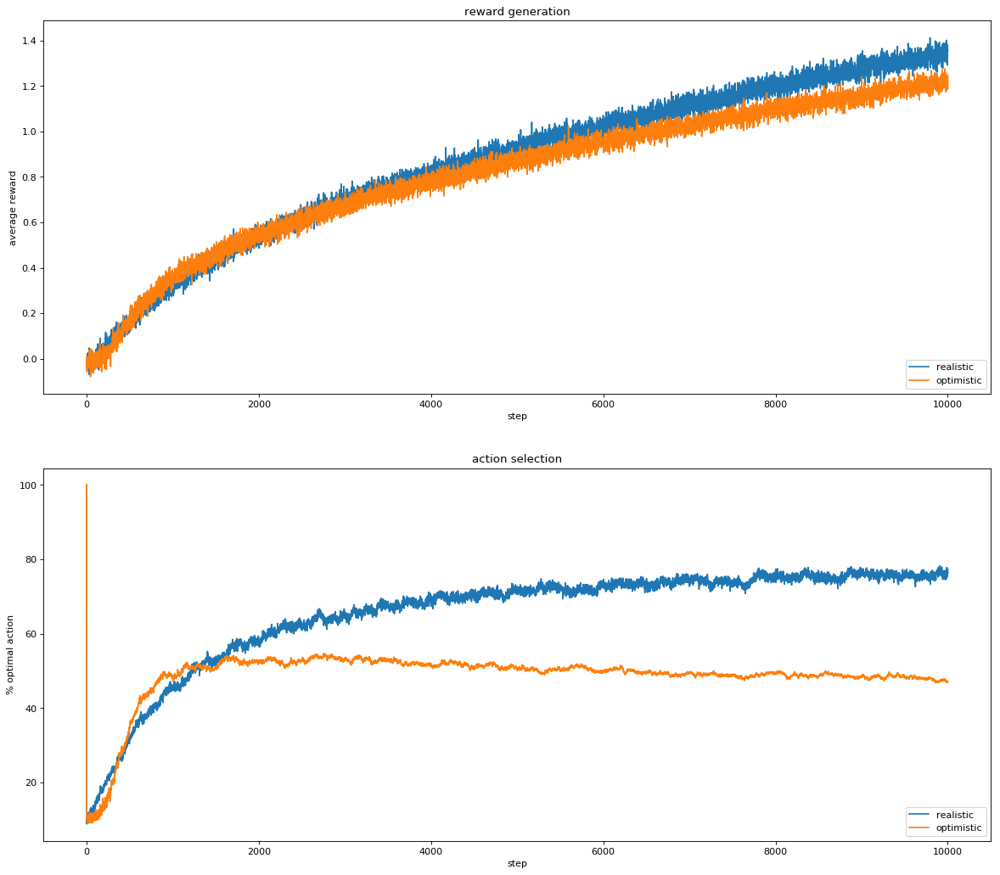

In [16]:
num_steps=10000;num_runs=2000

######################################optimistic and realistic, non-stationary #Q2

[total_rewards,optimum_actions]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.1,alpha=0.1,num_bandits=10,stat=0,optimistic=0,UCB=0)
for i in range(num_steps):
    total_rewards[i]/=num_runs;optimum_actions[i]*=(100/num_runs)

[t,o]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0,alpha=0.1,num_bandits=10,stat=0,optimistic=1,UCB=0)
for i in range(num_steps):
    t[i]/=num_runs;o[i]*=(100/num_runs)

fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
plt.subplot(2,1,1)
plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],total_rewards,label='realistic')

plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],t,label='optimistic')

plt.legend(loc='lower right')



plt.subplot(2,1,2)
plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],optimum_actions,label='realistic')

plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],o,label='optimistic')

plt.legend(loc='lower right')
plt.show()

INITIALIZING RUN... 1
phi_a's:  [-1.2647850744766016, 0.17088629384776666, 0.538881623901806, -0.7203393739669361, 0.36489532329885466, -0.15192849810778597, -0.8606050808279251, -0.08278374458449012, -1.9443064608812937, -0.7921791805238748]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 2
phi_a's:  [-0.9617562642455242, 0.19666788162371562, -1.338835832047265, 0.21329027372370535, -1.1113590303142917, -1.596441973925426, -0.03361478747117275, -1.9034674605679813, 1.2135471803422129, -0.7896757550975584]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 3
phi_a's:  [-1.7320706227814797, -0.7865066132718164, -1.0497131507808402, -2.573103282486223, -1.6026592262704369, -1.9465416967049314, -1.6692906081137968, -2.878034883976248, -1.4816428274190339, -2.572473083578252]
q_a's:  [0, 0, 0, 0, 0

INITIALIZING RUN... 27
phi_a's:  [0.4953849513998161, -1.2615642246298164, -2.4109755284510257, 0.018125612103559674, -1.2060085680880377, -0.3398125716889896, 0.6342209777412675, -0.8964347427423086, -0.15921229237038415, -1.3445112994893926]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 28
phi_a's:  [4.704652902131933, 4.557596184812352, 2.8110915465120314, 3.6469885178431762, 3.3227765930100164, 1.0370885831779055, 2.700391606146869, 2.492776760172226, 1.5723950327402754, 3.7837850115973044]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 29
phi_a's:  [0.8192417063680111, 1.050943122732329, 0.8875976186555432, -2.130602012735418, -0.9453616937851466, 1.934608978669363, 0.9570697012222723, 1.0370746471901002, 0.7164983310133521, -0.9854526566668202]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 53
phi_a's:  [2.967428725237791, 3.1214889230238807, 4.308056784440878, 1.0717478042615618, 4.0051800489649105, 1.2347113700910768, 0.9704105346711063, 1.8485244925614566, 3.594495403359267, 2.4147035607275296]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 54
phi_a's:  [-1.2983207756389616, -1.3539909427281436, -1.9993992733945394, -0.23039480025127235, -1.2288973075026066, -2.8105654345616724, -1.0803593737172472, -0.7986624677147114, -1.009100818917563, -0.07357297028573251]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 55
phi_a's:  [-1.2097803570111259, 1.141322347298119, 0.36106726436452424, -1.0224273538915518, -2.785805262711952, 0.5375840677831634, 0.413056437390575, -0.9576856909187463, -0.3122459830660651, -0.39014417064491314]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 78
phi_a's:  [-0.6429580475707716, 0.213483396194452, 0.5526578128903772, -1.855230410259604, 1.0373038667005656, 0.2998675895143609, -3.2131592491715892, 0.33933909185409306, -0.9517775519419436, -1.0791402305438997]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 79
phi_a's:  [-2.1924917738423066, 0.047110044831863984, -1.3606701033504809, -0.016379252709714354, 1.496497578251154, -0.190387472715567, -1.6376574830597297, -1.9440929981106503, 0.24213854057355805, -0.1565819288834599]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 80
phi_a's:  [-1.0854073427467006, -1.8766299319012982, -1.6924092265221973, -1.5898913329360624, -1.2585385586103797, -0.9135518599934471, -2.667537073267945, -3.286992481931884, -1.4359007443158962, -1.1661888522152892]
q_a's:  [0, 0, 0, 0, 0

INITIALIZING RUN... 108
phi_a's:  [2.963827542089211, 0.18775497821375842, 0.5627540043487036, 1.830861166232298, 1.5501032156896064, 2.8187564269241268, 2.2669782276287154, 3.4461397917692045, 2.3182616856767204, 4.640920657495351]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 109
phi_a's:  [-1.1856213552315564, -0.008316937119249856, 1.2208966181035612, 1.3581184995910431, 1.9747876176479378, 3.5583384212497613, 2.182261162616708, -0.4566615089995672, 0.45317438758246303, 0.0693760521094046]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 110
phi_a's:  [0.39981159004013467, -0.13818533143576714, -1.6338769134906792, -1.2959512050151671, -0.010613230974122766, -0.9452636992939595, -0.3873920926914699, -1.37460593962045, 0.027627500012524255, 1.494974249217175]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 137
phi_a's:  [2.8239306611320067, 2.7049095326936863, 1.0418129466023291, 0.41908594594953996, 2.271410148459205, -1.1993212857637219, 1.4152933024634449, -0.11256965032733834, 0.14446285735890751, 0.8160729723883925]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 138
phi_a's:  [2.197425098900191, -1.5110311606013838, 0.9042975019294224, 0.030716632202219762, 1.5529083705793125, 0.6753255998389154, 0.231388843047022, 0.5394900463073099, 0.9748234985511752, 1.8180271770569174]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 139
phi_a's:  [-0.6325804171433485, -0.7135175744490267, -0.3699793640162834, -0.44136792113198364, -0.2537368881354197, -0.3137452759003879, -1.4357620068954957, 0.5244584350865165, 0.7820159502634487, 0.3870927230780766]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 164
phi_a's:  [0.21950628253569665, 0.80580975616385, -0.9935199527239574, -0.6821340621077483, 0.3693343910744574, 0.9479483956985333, 0.19941378854134023, 0.029589518616823296, -2.1798855261348047, -1.4056659098145867]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 165
phi_a's:  [-2.2126701119143144, 0.094561287319985, -0.5233653162488898, -1.6155431922076882, 1.1058929991431998, -0.2399386400005384, -0.07180107758438803, 1.876502090306009, -0.5606069093299126, -1.1036562466001425]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 166
phi_a's:  [-2.4708333782992655, -0.5516237619831246, -2.390986361759638, -0.6510366671788066, -1.380395253699302, -1.8562068736261188, 0.39465084549775886, -1.8687439137772375, -1.7007012494214764, -2.6035625509270024]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 199
phi_a's:  [0.941136109712254, 0.06389857592881501, 0.9639865511004184, 0.2917468000406791, 0.4462602418487509, -0.14549764679488356, -0.05126714294192122, 0.5139441267787447, 0.30095950795084503, 0.4210565634822189]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 200
phi_a's:  [-0.5465084873328242, 0.9123455438672372, -0.1252834894401687, 1.296358004209607, -0.45124236295597964, 0.4308854827266786, 0.20693352632768897, 0.6825377437625788, 1.0582118186045277, -1.374511594761303]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 201
phi_a's:  [1.1060667017524666, -0.23951458498109524, 2.0784539518474703, -0.7514249414992872, -0.6545034853229047, 0.7622030910461197, 2.578694196226642, 0.6975723346349227, -0.6884288085493809, 1.1849052418403931]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 224
phi_a's:  [-0.7923788132066124, 0.243444541328376, 0.018742381227463523, -0.5015984584837601, -1.573177365290243, -0.9758451042370787, -1.5413980314623106, 0.90627358250897, -1.2422719745542172, -0.8648476458448976]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 225
phi_a's:  [-0.3895949056174045, -0.8279020569321969, 0.4572838842603102, 0.652438057427184, 2.447764193675652, 1.757155577160618, -1.4699067270800006, -1.1539381220318319, 0.730784070104686, -1.9195066172331443]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 226
phi_a's:  [-0.8131611320429692, -1.7670348310583792, -0.5785662114649389, -0.9960018826161273, -0.6024189318515744, -1.8846849415670914, -1.164671715647429, 0.47895853819808076, 0.11310867087208021, 0.194788717031669]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 253
phi_a's:  [-1.8413187904849726, -0.7131811387335133, -1.3964219697704447, -1.393681940704915, -1.3785970990746874, -1.9901165328468426, -0.8986085300177631, -1.0469495969012224, -0.7005396620156885, -0.8123062557113542]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 254
phi_a's:  [0.2103025053048243, -1.5688011135059832, 1.4860169900468332, 1.4561843286028258, 2.754857121649226, 0.33225005272727604, -1.4141830931370436, -0.3018224516048009, 2.0126311308007603, 0.3438867156898766]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 255
phi_a's:  [1.0361653514843743, 1.449331895141632, 1.1412301898389916, 1.9822069703680723, 1.7413619155869426, 0.5264647786268989, -0.27006103902271894, 2.6358810080773365, 1.1479663239471896, 1.152474025856481]
q_a's:  [0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 277
phi_a's:  [0.3819824493847113, 1.756558963891791, 0.4319420959498233, -1.1229187899282884, 1.5337240995947559, -1.191050509956169, 0.9558789833987356, 0.9394844182362078, 1.3736967116655516, -0.5595786980741274]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 278
phi_a's:  [1.7719936028349748, 1.9518097844870095, 1.1782790103231213, 0.9022025881782527, 1.040372639773102, -0.28341075220187817, 0.497568320546788, 1.1879429439462381, -0.019742165027846537, 2.1271448117636154]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 279
phi_a's:  [-2.9886669520409934, -1.0497061453745191, -2.2065778973352272, -2.1531409625878837, -1.1474159374189061, -1.1428555202284678, -0.5813622384648849, -1.3422708907754006, -0.6697685404067304, -2.2290765510206834]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 304
phi_a's:  [-1.9462260590861522, 0.07439121147836913, -2.1407052052005366, -0.12002107054018918, -1.1441287235343915, -2.0558462604575447, -1.8367940063365926, -1.8564321446558443, -1.1507037022130804, -0.1354212265549668]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 305
phi_a's:  [-1.9880126946749803, -1.4976769617861352, 1.8021302861265114, 0.2869193758176219, -0.08290374972559653, -1.4596128313477326, 1.9774965383762457, -1.4934335053147019, -0.20258767965986796, 1.9172090805070028]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 306
phi_a's:  [-0.5477780451996311, -0.47174595104145933, -0.8654158719312753, -1.477312976547422, -2.22728266446551, -2.4081754918643945, -1.3052978382852143, -0.23091905898497078, -0.7924996448854367, -1.8915444532328292]
q_a's:  [0, 0

INITIALIZING RUN... 334
phi_a's:  [0.6197972332566162, -2.778886372366958, -0.08169496013416494, -1.526285951692159, 0.9493715621343684, -1.1843937449925013, 1.217938506246203, 0.559435306183589, 1.206280821029687, 1.2194930388436998]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 335
phi_a's:  [-1.2038104495229471, -0.6593786878773976, 0.23530059039908746, -1.0530024562382356, 0.37715161968500555, -2.42205113486726, -2.1219129912429406, -2.19289717321557, -2.348481085342873, -1.579088399241228]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 336
phi_a's:  [-0.3725201731875431, -0.933148483139048, -0.7045780065269618, 0.47862104219789176, 1.3039075807403693, 1.621926306069644, -0.634098860064719, -0.698668775898931, 1.3286517529211856, 0.4823392789549846]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 360
phi_a's:  [-0.9276651641573954, 0.2506406476186188, 1.126250211851027, -0.3087569419626833, -0.32573989238732665, -0.7203630829121261, -1.6200684161714722, -0.5654482826477975, 0.97262193976469, -0.8023685431237002]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 361
phi_a's:  [0.3741067911740104, 1.9047213679170443, -0.9648166010156057, 2.9926807862758125, -1.7234549665865897, 1.578027638703809, 1.7189217026586796, 2.194392118498813, -0.8009116947472391, 2.414620646506604]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 362
phi_a's:  [-2.309749204533631, -1.9415892446428353, -2.981090187190951, -1.2476165800417287, -1.9739944127823918, -2.2409964860774365, -1.8063904983208003, -1.7703534388411133, -1.8816928081490043, -2.2498850776712787]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 386
phi_a's:  [-0.5826589093939476, -0.20314336805230515, 0.26531698138028426, -1.0843685999251618, 1.3658366815200242, 1.3088127699896965, 1.7424498424024009, 2.4738501690899555, 0.6715149129508509, -0.006475310796005163]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 387
phi_a's:  [0.926325702413314, -0.8508226213750635, 1.5016233654589815, 0.6187082943065718, -0.2562126558034655, 0.7816969802919446, -0.5612273198097028, -0.9210487935574395, 0.969998503754864, 1.2045717913460294]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 388
phi_a's:  [0.24998209999534904, 1.6845199782942912, -0.28834424642153145, 1.432941478002529, 0.7060751761569224, 2.858247964703891, 0.8139666161586402, -0.31198877596213725, 1.41027374932862, -0.5186721865258866]
q_a's:  [0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 414
phi_a's:  [-2.942054702232384, -2.465440490559452, -4.766037237426885, -1.6265360443846069, -1.9703379453629801, -0.8476628845483573, -2.445419421550443, 0.5225512868017217, -1.3106930015569422, -1.546272094234468]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 415
phi_a's:  [1.0134903013885943, 1.0799195480374957, 0.4744928989579242, 0.7001429270961674, 0.09331101391671354, 0.6927681395838539, 0.38286172880366, -0.6498398194740288, 1.4954099197776611, 0.44008049372943553]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 416
phi_a's:  [-0.3200609215106986, -0.8995629284791696, 0.3937965416948416, 0.2824781374909142, -2.6408893419253645, -0.20634932534761857, -0.9554818421399872, 0.1746302959747984, -1.3338778471240325, -0.9259278657062624]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 445
phi_a's:  [0.934811333982789, 1.1038167837345885, -1.1250822052800722, -0.8545916447752194, -0.79997678557711, -0.019296765193484958, -1.557424798401949, -1.0218362453479295, -0.01878329603000154, -0.40754486223488245]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 446
phi_a's:  [-0.2302599143172206, 2.573491719275854, 0.6699269096996153, -0.2916870934974953, -0.871956129368737, 0.7862174078239537, -0.45820981976423275, 0.16227176697986015, 0.558577583152298, 1.0214295990445468]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 447
phi_a's:  [-0.39832317611675094, 0.384234174143292, 2.824093968639706, 2.6884950689561746, 0.697298672423775, 0.43796232188671524, -0.32232982699774704, 0.3313561370304008, 0.7784923868464021, 1.7275486848338446]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 476
phi_a's:  [-0.4107252583351707, 0.5266926034159021, -0.310969443430488, -2.3212368955421674, -0.46725396895228866, -0.1851823285087283, 0.5790655402285345, 0.7495254789666472, -0.024890787817045346, -0.7065161316092792]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 477
phi_a's:  [-0.8189152468145895, -0.5068126461456186, 1.087508275580013, -0.18142812820866633, 0.047360577750616695, -2.1395754369294853, 0.6632249180926584, -0.6781915460619123, 0.48327882679874995, 0.9411888452338777]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 478
phi_a's:  [1.0673122859891744, -2.3240480916551802, 0.14555901315924502, 0.9138859579561887, -1.9244999698002656, -0.5512564230399906, -2.225981380601259, -1.6030305851908189, -3.380947249434218, 1.204305587448016]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 500
phi_a's:  [3.4864643221344886, 0.8259536065794677, 1.9964165966812706, 2.1746873211649937, 2.135703598072101, 0.4415973410583094, 0.35873440126735834, -0.13943518030536195, 1.0995012135020468, 0.5728802171400688]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 501
phi_a's:  [1.0070063083196819, 1.2880252993896995, 1.1060601149768605, 2.0688678707913115, 1.480446445556407, 2.444929975175144, -1.270435365896746, 0.49144851572696113, 1.6306350614184226, 1.7499252869219108]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 502
phi_a's:  [-0.5126061297555992, -0.0008634985518192195, -1.5140716105833634, -1.0689998899214808, -1.8218307143657975, 0.5408341478256151, -1.6242840007966777, 0.15302209797622668, -0.3201751702142685, 1.0476714174672637]
q_a's:  [0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 525
phi_a's:  [4.552522174675164, 3.13875735899243, 3.7157868522723874, 3.154417949259014, 4.451145366299097, 3.5259742932522613, 2.5629086645729475, 2.588263505956171, 4.587046820188632, 2.983796006948221]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 526
phi_a's:  [0.454086195901681, -1.8616997016060017, -2.2596135645807536, 1.6885572113565486, -0.42636050536412434, -0.7949599746019744, 0.5925984384222027, -0.5211927029937855, 1.1412360706242872, -0.15083726754986826]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 527
phi_a's:  [0.9828683012746405, 1.4760856162948963, 0.26179215167406034, 1.1268607046064942, 0.4071147843746404, 0.3812590500542893, -0.1086932412060918, 2.324505853193041, 1.4956248320814374, 1.2116797153449292]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 549
phi_a's:  [1.1969231791566939, -0.21553311916806195, 1.503605852502743, 2.0605240575489825, 1.3801939241527503, 1.7770421080966754, 1.3873237254166075, 1.65175307676009, 0.8698226090283003, -0.30099473593136683]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 550
phi_a's:  [2.1927104876406602, -0.278016876408105, 1.4561448270684765, 0.10431972083711694, 1.718644117181205, 0.5475356791968305, 2.3076225651654214, 3.778546051912878, 1.5295328718329322, -0.09660564894752288]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 551
phi_a's:  [-1.0317531176790786, -1.2332460302989812, -1.9348041039257613, -1.1425200159815572, -1.8429371426371701, -2.0621686209309855, -1.99134845576142, -2.793282513065007, 0.12938739456126735, -1.0223096939878735]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 576
phi_a's:  [0.2982987951467946, 0.43895167889382564, -0.44009005637772536, 1.699740210994761, -0.4091183133042703, 2.2865130007673122, 0.75785353720775, 1.1209898130454339, 0.3214086227861756, 0.47372015234081194]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 577
phi_a's:  [1.2601228981715997, -0.45791379113854586, 0.10910536287178116, 0.246283349688588, 0.24350614145176697, -1.1402289831694128, -2.2410431359466836, 1.069841491453476, -0.7341718897689431, -0.8332306962308136]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 578
phi_a's:  [-0.49014620831318645, -2.650453732458193, -0.7441820893388098, 0.19186164077175571, -2.3399218250747453, -0.5363294518713109, -1.8709845233642615, -0.1364869735129166, -2.71698807959196, -1.6719777250388974]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 602
phi_a's:  [-1.1797561935669096, 0.2631930894844442, 1.3827346057780419, -0.735515680185614, 1.9778756344215362, 2.526545772086095, 1.7091568281578802, 0.1978963008756826, 0.937633647111721, 0.42257880774906276]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 603
phi_a's:  [-0.6067979360356167, 0.18757449574988838, 2.59689145577349, 0.1392373416036019, 0.8224570077222236, 2.9988840169602056, 2.4286209170400364, 1.8834425306356812, 0.5182349829500708, 0.1692223091301841]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 604
phi_a's:  [0.40514624702111185, 1.8824755941312945, -0.7311262196706121, -0.32442877951757804, 1.5486258840778804, 0.4011333173967794, -2.2289711925724305, -0.7626666690213397, -0.6561079601710048, -0.5034223362382142]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 629
phi_a's:  [1.4889186861845585, 1.1038193201882727, -1.0706194727248344, -0.04951699539197152, 0.739572743750714, 0.9701491464625848, 1.3205175542939234, 1.419265329053903, -0.8264378895304354, 0.5821389752437645]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 630
phi_a's:  [-4.043789896017103, -2.483478351753592, -1.4614082927467242, -2.864082263492186, -3.1560821079345027, -3.0926956849302236, -2.8765670892708153, -2.1727517010644064, -1.1390413718370946, -0.2459705917990873]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 631
phi_a's:  [1.3437680796273384, 2.446223123754712, 0.6428696212622259, 3.528565403376291, 1.365665364675624, 0.7162403798971946, 0.0004682534785850345, 1.3252686693614588, 2.390969790351549, 0.1933288630986842]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 654
phi_a's:  [0.5570827886377108, 0.5647605523950184, 0.5695976876410523, 1.8458739813371257, -0.5894776360522398, -0.8139289800517238, -0.06141977884232269, -0.9106880453445447, -1.1096527783978511, 0.44504468548765963]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 655
phi_a's:  [0.9335341663986462, 1.986982043015949, 0.5048194600104969, -0.6721621771566191, 1.5858368690892224, 0.9369998267542975, 0.9159813886798209, 2.31400431717982, 0.44977460521531065, 0.6242466611391815]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 656
phi_a's:  [1.0676992632167543, -0.4246923390294576, -1.229708515453944, 0.9681076863457213, 0.5604167044607287, 1.0677935010450934, 0.015415548387091249, 2.018238438311856, -0.57443986483199, 0.5665900846196792]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 678
phi_a's:  [0.7710666072153918, 1.3570878016476389, 2.042743602691976, 0.6459643460260436, 1.226543377679009, 1.3589479031028915, 2.3385946320494897, 0.14069512801415707, -0.9619088695305535, 0.998449287559535]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 679
phi_a's:  [0.6751006600644409, -0.47738104988116803, 2.4764225082735103, -0.21625488555292205, 1.9598627816122662, -0.7739167910457724, -0.8359965884728441, 3.3135583249434646, 0.5886949186275459, 1.599191881177414]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 680
phi_a's:  [-1.582505849225277, -2.513158260389789, 1.111964538187328, -0.0663540584469382, -1.0034895076306363, -1.5705926281645746, 0.6129212082473435, 0.6970048087250299, -0.36238880115911964, 2.1119462185967897]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 704
phi_a's:  [-0.5411418935082398, -0.8504880910689694, -2.931818075808324, -1.2044833143422438, -2.390866864156271, -2.801098899155737, -0.9475314401360301, -0.7604709972703855, -0.0013491189312033747, -1.5566206013824915]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 705
phi_a's:  [-1.9972242937783797, -1.895791997516376, -0.6618947508369373, -0.3720630992685382, 0.5069452570362782, 2.6845313426608293, 0.9483746087704328, -0.6933236840661073, -0.5224621794014129, 0.19925917673956273]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 706
phi_a's:  [-1.3800846250805947, -1.409001565366479, 0.4103159577662075, 0.9320223646255492, -0.34029571707469686, 1.021502760012733, -0.631716140248558, -0.1673296195273239, 0.23838532878992685, -0.6839603788547388]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 734
phi_a's:  [-0.2996420745718811, -2.5059762636326015, -0.7674860833817222, -1.1749659034352253, -3.21165533371778, -1.9144969206318037, -0.5805223885789484, -0.13915651323757983, -3.4914632989964955, -1.8938255291634536]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 735
phi_a's:  [1.1595303163857789, 1.0122939876923183, 2.004718661576872, 2.323787569045065, 0.14264427023554616, 3.042358687267811, 1.7852984021252505, 1.4186704500909524, 3.43350884467634, 2.330251516613168]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 736
phi_a's:  [-0.9325765969202802, 0.990283417007372, 0.2287347991858385, -0.5025769296387865, 1.2515398316460455, -0.8682592225330499, 1.8454328478227153, 0.9273269604058697, 0.5181110714495722, 0.9147897152355816]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 767
phi_a's:  [-0.8329621883837262, 0.8719824835664487, 0.6062344368106924, -0.5216796912210118, 0.3041271084563693, 0.08855895980638862, 1.2224670657725052, -2.001441456658688, -1.5829721418790679, 1.0131486924900215]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 768
phi_a's:  [1.1440679698562242, 0.2056783207861339, -0.6746160575459722, -0.3760527796685561, -0.8059122505951225, -0.8615960884715781, -1.5878302429642162, -2.5977916269554133, -0.08835984992203083, -1.3722809369677438]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 769
phi_a's:  [-1.2315691361473602, -0.502509967689009, -1.1391374476473126, 0.7867539392887922, -0.6863396728145377, 0.6510854078586393, 0.4256182694246068, -0.20615982998207583, -0.09443562276070337, -0.3968084205006387]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 791
phi_a's:  [1.5415742131870775, 0.6585489174534291, 2.1771544897496993, 0.6228512861408113, 0.9715655104308993, 1.398787223868721, 2.078836947634207, 2.917126253694553, 0.8131491063044267, 1.7166363289651565]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 792
phi_a's:  [-1.3914732256904025, -2.4199247491388842, -0.2831947611994038, -1.4533275354897697, 0.16382903134894733, -1.7550588225430834, -4.147009175579092, -1.2291873716078243, -1.1375102980138179, -1.9858587217996275]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 793
phi_a's:  [-2.084909212553373, -1.6459455944217716, -2.677668108640957, -2.7980057742720583, -1.881095623495016, -4.149154806293662, -2.5056540662692113, -2.90475987409149, -1.482695196356707, -1.5862308725864267]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 814
phi_a's:  [1.0028098736992714, 0.4355325238984199, 0.8003141661699024, 1.777730609737925, -0.6157290972534877, 0.11054626886572677, 0.6507009723859442, -0.5675622034199572, 0.5536668415899866, -0.17749360259243674]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 815
phi_a's:  [-1.6830030655816692, -0.5145151826427403, -1.570298943864334, -1.9784371891855392, -0.08527846426840513, 0.8931759915743732, 0.16941075901837555, -2.9893027647671326, -1.3938990898485644, -0.23285682476461828]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 816
phi_a's:  [1.6451287178813794, 0.978965306651452, 0.5266937694808458, 3.116328727956667, 0.46060649883616556, 1.322858594500277, -0.6494164309936026, 1.6826803418525915, 1.10265422585276, 0.892478163471541]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 837
phi_a's:  [3.8115355796156725, 1.4832034332707527, 2.0397705000594883, 1.4154724190116992, 0.997480678011244, 1.9921555951146557, 2.483920859672814, 0.7690392705951952, 0.32747198167172686, 0.35366715313516917]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 838
phi_a's:  [-3.483483746702211, -2.5782765544537734, -2.275888095250329, -2.3190110879199572, -2.4852893419619515, -2.659795899362186, -1.4902465587238836, -1.5979808664052393, -3.221825085272766, -2.3793237631573194]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 839
phi_a's:  [2.754725665728654, -1.2075300960279838, 1.7092460116787573, -1.1380032599471104, 0.6155946828420429, 1.0607324880582996, 0.3052478503157294, 0.8393332004825741, 2.840630974970651, 1.8577563662132535]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 872
phi_a's:  [0.2516750292365569, 2.15373650950845, 0.6884748838131651, -0.5311345168554532, -0.2525274141491536, 0.4485879318045366, 1.6364105710997174, 0.262805711837198, -0.28912966729984424, 0.0888253327621184]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 873
phi_a's:  [0.050118787556761246, -0.30706161433475343, 1.3887918250450624, -0.0839347127021004, 1.4311488829018737, 0.1388899118900253, 0.677235804994804, 1.1120883006775022, 2.4431925013858664, 0.24623735699002042]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 874
phi_a's:  [-2.853640818221307, -1.4050393058738062, -1.663509858728815, 0.612548059735694, -0.164462327540688, -1.2810322096434439, -0.9173478969506156, -3.5742613018721734, -1.524284389593671, -2.324443482574883]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 898
phi_a's:  [0.5583192143179956, -2.226607169765929, -0.15208979860722735, -0.7401040335394831, 1.1722660270111556, 0.16386696627864045, 1.3231645900867082, 0.8526921088538462, -0.1249521717289484, -1.4491478120596522]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 899
phi_a's:  [-2.2494930264723996, -2.3424673017652324, -2.293343404230955, -1.090802005530076, -0.6150212499109451, -2.4064397690269406, -1.8593757375311568, -2.6701376392658336, -1.45295900101695, -2.688043026399793]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 900
phi_a's:  [2.256129040043527, 2.109652240551264, 2.0043697771629114, 0.7007058527827341, 0.7284272159599743, 2.3315115908977653, 1.710199685980697, 1.1748967894934772, 1.4954077723698909, 2.7241233462843493]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 924
phi_a's:  [0.6348759255902171, -0.135691073476494, 0.14706835990631117, -0.6595824612559918, 1.5310589452153809, 1.3191725317200076, 1.4479083467843, 0.9398332124400486, -0.3000390988689271, 0.16514773394618726]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 925
phi_a's:  [1.4257856466656027, 1.7348316912682824, 0.18374014019818774, 0.24648312030257025, -0.009362815136345515, 0.896760747821435, 0.13715839446307299, 1.6706660192882792, 0.47217233046594675, -0.8490364077023081]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 926
phi_a's:  [-0.3910884575118304, -1.9203834477103472, -1.6387059176451153, -2.184089709462012, 1.0785902315580473, -2.800295946072712, -1.7047396764606968, -0.6995348149838634, -0.4750040163298589, -3.0740698879123807]
q_a's:  [0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 951
phi_a's:  [1.6982920505010553, 1.0608217187058444, 0.5215859299697795, -0.24576212770609596, 0.28130644394558857, -1.6384631087028452, -1.1998473916927663, -2.051266253444804, 0.014116225601938981, -1.6926415993210169]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 952
phi_a's:  [-0.35975259589766573, -0.05138733568734244, -0.0644210743791106, 0.41957055340155075, 1.510852899883436, -0.06264942562463083, -0.8633537830849022, 0.6749784120455555, -0.1963285039173952, 1.8281232673775243]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 953
phi_a's:  [1.2236911256010023, 1.2292612255157274, 1.4074572725210457, 2.7429933549864534, 2.1048819014258093, 0.21929626298197746, 0.6237950493664777, 0.8131940072921039, 0.36231342917499887, 1.297290542093235]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 977
phi_a's:  [1.3505709254094818, -1.1508199032628978, -0.3175381465962001, -0.308551093526502, 0.6784909725034034, -2.254450450844622, 0.7326621329947255, -0.273025788631727, -0.4632689570917362, 0.5720683331317304]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 978
phi_a's:  [-0.7023871517788042, 0.6041724135035886, -0.3101878660739422, 0.1482160131529792, -0.08416474977107563, 1.7472214156669836, 0.46284205028586456, 0.02922861406193511, 0.10989293160738817, -0.6168737866782797]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 979
phi_a's:  [-1.889339004564658, -0.7974297374363193, -2.436991786018744, -1.7087294642975188, 0.09286023630177442, -0.20012494527683722, 0.380173478093238, -0.228363941578122, -0.9603839850151105, -2.9068960887148156]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1001
phi_a's:  [-1.9618210798967946, 1.0324205347379292, 1.7608190961355943, -0.5248325310425166, 1.3558070159138707, -1.3349112786047126, 0.46834074934208036, -0.5007118355106213, -0.023307501128816577, 2.646816549299819]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1002
phi_a's:  [-0.7762089011965349, -0.9331611278178686, -2.5819555764054276, -1.3658359535366218, -0.9211336023388753, 1.3837186112178754, -1.3461459416599801, -0.6982112470054203, -1.6367334624886016, -1.07054565620261]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1003
phi_a's:  [0.8236018182992518, -0.07523464547919245, 0.8600095552302641, 1.985566006601223, 1.2211312022537537, 1.076628729386783, 1.4125263203942058, 1.8115600188109684, 1.85945141115274, 2.3964045351465653]
q_a's:  [0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 1026
phi_a's:  [-0.05160126381454108, -0.6460245330931413, -1.1397045772051022, 0.5915848281823919, -0.35872520279208076, 0.8692678328012312, 1.2308956865518565, 1.4059236257768153, -1.4217680336538778, -0.333103495700805]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1027
phi_a's:  [-0.7599263795878912, -1.7343604979372922, -1.112265379797908, -1.3223883628809827, -1.2726093636647278, -0.956374949341871, -1.5017732896440792, -1.479454825468758, -0.35096784778750234, -1.141427569051937]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1028
phi_a's:  [-1.3317148806448433, 0.16141195456498766, 0.22970815225572638, -0.8956205434682607, 0.9325242351946713, -0.5232886456425484, 0.25086636175117716, 0.9031795833387922, 0.16904311294701185, -1.0843308912969671]
q_a's:  [0, 0, 0

INITIALIZING RUN... 1052
phi_a's:  [-1.3028381928908084, 0.2515891434837956, 0.3108689512245443, 0.02663468324400109, -0.5981210686935686, -0.13347502782168308, -1.2305371061972181, -1.508687907374278, -2.3309706506370174, 0.08520927284255286]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1053
phi_a's:  [-1.2888992265468562, 0.4864710577925171, -1.8629059088641606, -0.40894586404845806, -0.6225012924699066, -2.099409618792055, -0.18194356296277137, -0.3717751671209618, -0.6856854959875078, -1.2482160776340483]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1054
phi_a's:  [2.220194530818672, 1.138106599941342, 0.31484028803502423, 0.6021028161762727, -1.3822297222104467, -0.10283689146478808, 0.2550153869016166, -0.10508351812975897, -1.060932610050294, -0.952252550657726]
q_a's:  [0, 0, 0

INITIALIZING RUN... 1080
phi_a's:  [0.5453217994308872, 1.9030291282788934, 2.168374830959777, 2.662738860979771, 2.0169408505801725, 1.6475002829564112, 4.111675462419921, 0.8409656247495427, 1.0537103614281718, 0.8107660183909473]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1081
phi_a's:  [-0.8836199301347447, -0.6979155087098923, -0.5862248782175645, -0.9988763181058967, -0.9720471018039992, -1.878822947464256, -0.7757735591377902, -1.6000233004792934, -1.150982580322939, -1.1383684901335789]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1082
phi_a's:  [-1.065302455625285, 0.34350499028748754, 2.268465797210544, -0.7593212205483736, 1.0481719016135593, -1.5945009696523205, -0.1122029357959935, -1.0171609446195096, -0.5831372182479626, -0.46628635141106145]
q_a's:  [0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 1106
phi_a's:  [-0.12907718552008388, -0.48200600173797437, -1.1539106430890658, -1.0637869944727552, 0.38044500026691197, -0.00011203614959173769, -0.6378892599093022, 0.11761170851150612, 0.6040131606696976, -1.3593449774831443]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1107
phi_a's:  [0.18816595312931078, 0.6348581958000399, 1.5386511342360838, 0.31598437384442746, 0.9685412761049728, -0.09163461042617194, 0.16456620364282704, -0.1011634303766018, 0.6592396643796171, 0.523527355206932]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1108
phi_a's:  [-0.6403355806520034, -1.107066682205449, 0.33519280266722923, -0.7458574532998319, -0.5336040529340649, -0.6866274080712294, -3.4386246140074377, -0.6187390122064079, -0.7905505648100418, -0.9451222723432575]
q_a's:  [

INITIALIZING RUN... 1131
phi_a's:  [0.24159957052166145, 2.4806680795504943, -0.08114974801616281, 0.14519529891680572, 0.29354561522228373, 0.43363505685198167, -0.26164036260326873, 0.02017670374249647, 2.244775483047067, 1.8358872232803578]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1132
phi_a's:  [-0.2819930855024644, 2.112441145911152, -0.5985818009262659, -0.4700808599036911, -0.020585938265918036, 1.3934851277983533, 0.055003097919411825, -0.41668557252610217, 0.3935738218323477, 1.387277003075597]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1133
phi_a's:  [0.7676639213767948, 1.1233981317188704, -0.34109421753617364, 0.29890557873359513, 2.5522191742881057, 0.8146637196341004, 0.4291206452627183, 0.9269030393970688, 2.1136577410676045, -0.09422718279539788]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 1156
phi_a's:  [-1.0309149915183504, -1.5645211697409114, -1.6706814783686492, -2.123897429253547, 0.26641874489230677, -2.1316585492244533, -2.085182603452785, -3.506668310506221, -1.863062670764275, -3.2990149582107122]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1157
phi_a's:  [0.7785662808735737, 2.998796763144914, 2.2737887687634135, 1.0203370453989047, 0.7713274176177264, 1.4832032499614916, 0.9116471837567952, 1.8544332767043912, 2.2092999510371665, 3.0373612589118943]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1158
phi_a's:  [-1.5898752670204295, 0.034257823449038716, 0.316825642942274, -0.5154883078988713, -2.3854242827963086, -1.957944378963803, -1.6338995956278937, -2.945877934649127, -0.6514129895262398, -0.5741961331603708]
q_a's:  [0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 1182
phi_a's:  [-0.44210570688920103, -0.27849233055945904, -1.1570437639162543, -0.9187476424828827, -1.790065896256055, -0.43730765997043675, 1.5720800627446625, -2.6122027005391137, 0.4013320042322618, -0.8886001519721745]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1183
phi_a's:  [-1.0162772482773457, -1.0023933225125696, -2.188708467552544, -1.9780376256953511, -1.6566767898582222, -0.23052601751501212, -2.737022839944098, -0.31121582856808305, -1.2397598056755068, -0.41396695217389456]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1184
phi_a's:  [2.9213711817460286, -0.43096704397969643, 0.3905214159565682, 1.338347754159791, 3.9475419078885805, 0.9305173963026313, 0.9771266303416573, 3.95763596170908, 1.2125215029275827, 1.69828131328031]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1207
phi_a's:  [0.9118492972351449, 1.2255781285160947, -0.25666483510276683, 1.7003127084168828, 1.2639933611021807, 1.7915278312225382, -0.43264382601955687, 0.9608499623655948, 1.9820977399568278, 1.757751061892094]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1208
phi_a's:  [-0.40087879296781703, -1.9431152737782615, -1.9647971358654985, -1.2816284874270907, -1.8813458897864161, -1.8297309313674275, -0.8268314262870047, -0.9628642218475973, -0.7383247180980939, -0.557168024019994]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1209
phi_a's:  [-1.4279276961179983, 0.12930343815986767, 0.26382032587644444, -1.847171718177623, 0.2238441512382442, -1.0496815134570885, -0.6186371313867729, 0.039405996497498486, -0.637159451446967, -0.45885002953634646]
q_a's:  [0, 0, 0

INITIALIZING RUN... 1235
phi_a's:  [2.5600270755677244, 0.9482746672006661, -0.6080152660169011, 0.1272028758776614, 0.19110048305885344, -0.4306757087630878, -1.429363549280143, 1.9932795903954807, 0.1806280948909313, 0.2869648618114364]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1236
phi_a's:  [0.28339349500019495, 2.404392177195951, 1.040814997994241, 1.325923807237827, 1.3553872768710258, 0.7607994981209378, 0.6163117781031431, -0.37260247957441406, -0.2729025249796233, 0.9575327460267817]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1237
phi_a's:  [0.7905626501501785, -0.9953258076037788, 0.03157029139242723, 0.49628182273521493, -0.3338049038650687, -0.8793609293805628, -1.5287717637304161, -0.35494586965391595, 0.47635487295975865, 0.007624669034165754]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 1261
phi_a's:  [2.7001324306472223, 3.6334071802492027, 1.2880222117894382, 3.027920723801163, 3.704148410222142, 3.0406834546089527, 4.199909973196866, 2.286408675916842, 4.161004976267544, 4.260466355376458]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1262
phi_a's:  [-0.30530864148545284, 0.3984577828155159, 0.6896878127944064, 0.04777090626342395, -0.8838076554315406, -0.06058508931932843, 2.005145106734247, 0.4462209749634224, 1.233206381649422, 0.207740973893776]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1263
phi_a's:  [-0.18979578606447478, -0.32326152215670345, 0.892460279538167, 1.9712133296163747, 0.9895643051653777, 0.9916230545125131, 2.2438014450390793, 0.7619363864305411, 1.1728586267776553, 1.9383275675901022]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1288
phi_a's:  [1.660860759141283, 0.092095419667519, -0.21273087264947166, 0.9456325353904376, 1.3911005955141964, 0.14211659237328303, 0.7636614023028154, -0.4455220229712237, -0.04255152907043086, 0.9155893677166516]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1289
phi_a's:  [0.037739117450234894, 1.007482123642002, 1.5194143429189988, 1.0000377521129993, 0.7481210254210285, -0.24443071030746344, 0.8118291995571004, 0.24858895901657407, 0.9642808123668692, 2.6820553079983305]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1290
phi_a's:  [1.045576984055588, 0.9750335880230441, 0.5758236050611989, 2.191536951344582, 2.3066606840128694, 0.5161969738931877, 0.9164335335984745, 0.6045256023391461, 0.13737044667129428, 0.7484065688390344]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1314
phi_a's:  [0.24835547829761573, -1.2948255122929064, -0.46478682894813983, -1.8330513668381991, -1.1337382791741886, -1.868936242320828, -1.02329794478046, -0.9354829169429575, -0.5023821646432567, 0.6314029952000563]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1315
phi_a's:  [-0.15635956353089664, 1.1522946545576733, 0.367650425768853, -0.3752963110404265, -1.934821184154613, 1.1615933155965381, -0.815676722821526, 0.9284504388805395, -1.4629625808185889, -1.4094819914119863]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1316
phi_a's:  [0.7655897864549586, 1.6162066415925853, -1.1337674216559699, 0.642891154790717, 3.0551232872231457, 2.49466492448629, 0.8622683431340815, 2.457656516036283, 0.5147089416621047, 2.0034846588119066]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1340
phi_a's:  [-1.1531635635000268, -0.4928964870693712, 0.0974351100833154, -0.8838882484151959, -0.30804660139791085, -0.280415525533358, -1.6997306516419974, -0.1880807802734713, -1.7866316744175839, -0.6301096914775209]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1341
phi_a's:  [-1.5634571960994026, -0.6748538786668281, -0.7934251614486394, -0.7388959957685715, -0.4988313793581539, -0.9483318261236997, -0.22633948772457857, -0.5079322385234283, -1.504281255093535, -0.6773502542851432]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1342
phi_a's:  [-0.20457118246491013, -1.8676947952028085, -0.9196833428619318, -0.10085900523894098, -0.7868114999697884, -0.19643791668749688, 0.8187644175994591, 0.4827513169420503, -0.788751651310877, -0.20369281268643114]
q_a's:  

INITIALIZING RUN... 1367
phi_a's:  [0.4461297817073032, 1.0268600267029433, 0.6101461183725565, 0.9848793651982006, 0.6163717494120167, -0.6848440801997214, -0.40186316731375055, 0.013706699869189543, 0.5366780712969368, -1.9031991162653967]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1368
phi_a's:  [-1.688960150346889, -2.076552897248536, 0.29050442732649495, -1.155052414224626, -1.469841384027048, 0.037197242800163455, -1.5251661460779127, -1.0462911900869039, -0.8368643830200679, -1.040499873417407]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1369
phi_a's:  [-0.5060672900743703, 0.025508012531897717, 1.656418111993736, -0.02507469362235519, -0.8144153526201149, 2.197364974030268, -0.6244836215313078, 0.6105576699784461, 0.9753846267601505, 0.22432659937117544]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1394
phi_a's:  [1.5644912001296445, 2.0492471993254533, 0.5360907402577771, 2.0549753636797035, 0.9746918789126476, 0.960664007174755, 0.05016251200982502, 2.0549223751058174, 1.5424174263803565, 1.5271618697726201]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1395
phi_a's:  [-0.7540773977626958, -0.35738174347051965, -0.10069664723148852, -0.2643027234864185, 0.531380973984967, -1.525001833278426, 0.5259845463713354, 0.6830487789891356, 0.7485808662220541, 0.45552568463607473]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1396
phi_a's:  [-0.6696472783768446, -1.21857852635989, -0.7159349462407933, 0.7513011016606397, 0.062094569146590395, -0.04671173544784357, -0.4183119216199398, -0.16379307934234166, -1.878122915236999, 1.1732014708566978]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1421
phi_a's:  [-3.1298158020225264, -1.0359318939737383, -0.3965298193992034, -2.641454938575472, -1.1717430236796829, -0.6952224681260673, 0.0339963874320226, -2.2368737700312207, -1.8323600559360078, -0.7490829851460616]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1422
phi_a's:  [-3.4174162276172866, -0.8977467654409462, -2.473862881021969, -1.1224653025848923, -2.0623715677440595, -0.5137411700253012, -2.3541074075556283, -1.4924746513929728, -1.1395407530217314, -1.4646736048947389]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1423
phi_a's:  [0.9994069869714725, 0.4512162469258558, -1.2030444590290057, -0.6904075458580959, 0.14242681959052406, -0.29072690263713497, -1.25631735579378, 1.3241545387446272, -0.11481003622639752, -0.170059045571179]
q_a's:  [0, 0, 

INITIALIZING RUN... 1445
phi_a's:  [-3.317734218210182, -1.083463057074391, -1.224304834219025, -1.6182164857649055, -0.7954394497990391, -1.886493996349324, -4.188850752212731, -1.8830993220697463, -2.9177265169617694, -1.7270480602736713]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1446
phi_a's:  [-0.81416712218508, -0.9731455991862927, -0.18486486538503433, -2.051548520831109, -0.87351607594942, -1.2564447226704738, 0.2987237965287526, -1.9195548372761913, -0.07648657560975036, 0.09343559944784996]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1447
phi_a's:  [-1.0028811997690508, -1.6612138356682222, -0.23271551153608772, -2.0850439552878317, -0.08513198584006809, 1.4092268214491965, -0.9621876884329363, -0.6933903056538672, -1.46460312694777, -2.2823171347151554]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1470
phi_a's:  [-0.6900648512214524, 1.736133429961244, 0.36890535641713784, 1.2312034506214153, 0.7016331483267617, -0.1947332188552383, 0.544925644885951, -0.6954878830321817, 1.6945379122766542, -0.6359584395680881]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1471
phi_a's:  [0.5244342239435992, 1.4313210023958962, 0.4144880825457744, 0.5335339109205169, -0.14048117554348333, -0.2893675742021068, -0.19183283031823645, 0.9517122186988307, 0.9867254823985082, -0.3900431696302322]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1472
phi_a's:  [0.6711692562353755, 0.5301284336492711, 0.05656628790598392, 1.288594463170162, -0.7435107733678137, 1.597961232443419, 0.5196975456852835, -0.15824080454264122, 1.3057508470694101, 0.029668576435591815]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1497
phi_a's:  [-0.5983611070332147, 0.4979475144083807, -0.4400753059891369, 1.093289718736162, 1.8086232299671186, 0.2384191409365063, -0.2790935696655051, -0.25176114087679946, -1.0263179495120136, -1.328099793297088]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1498
phi_a's:  [-0.11594875389991466, -0.6524926037081609, -1.2265050806921631, 0.8075397995911832, 1.1173370045076605, -1.7662535955684147, -1.8741407805723045, -1.3589763300473596, -0.6316019724975308, -3.2369636625270886]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1499
phi_a's:  [1.105948445730543, 1.4374855981447265, 2.732938960164975, 1.6408061430917216, 0.41293505471822367, 0.8594944598829131, 1.8027798635184569, 0.9970818265917576, 1.6720695417050728, -0.521788120457962]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1522
phi_a's:  [-0.8661106072153115, -1.184233555432233, -0.5719562525805912, -0.5150103741295374, -0.7919349761400304, 1.1838900702219841, 0.1356224947776144, 0.870020885246226, 1.6272236061681453, -2.0521645989318875]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1523
phi_a's:  [-1.1041615255154404, -1.2251135315611597, -1.1042725282031336, 0.3973244736051229, -0.5303702744808552, -1.6108253844364029, 0.8122036565584004, 0.5358645135246265, -0.465894017107277, 0.7391757030292072]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1524
phi_a's:  [-1.7836798223433403, 0.8474695061859742, 2.2146067748700533, -0.28612810203209893, 0.48869070245585566, -0.2887742654588572, 0.5245284667152194, 0.26999036251157216, -1.3177200233148278, -0.6792543743343551]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 1549
phi_a's:  [1.234949688841306, 1.2903236559659599, 0.2524753727549657, 1.825830721217026, -0.9438302939190956, 1.8244017037606932, 1.3660464782762194, 2.0237515540326227, 3.008205311618755, 0.5041219640936225]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1550
phi_a's:  [-0.6823422828812569, -1.6616967904160753, 0.10964188357234628, 1.5766950586216641, -0.489288891875048, -0.07476983910974105, 0.4466798831678309, -0.7858660917352165, -0.8772473215718911, -1.0059624118480264]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1551
phi_a's:  [-2.3697992005966713, -0.7843014161456365, -0.5363732386159427, -1.319870416261506, -3.1134717086297976, -2.186945002995574, -1.219627318371857, -0.6706323700191467, -1.1949148180171756, -1.7219744603273313]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1576
phi_a's:  [-0.7594906904694794, -1.0758779622487449, -2.4524864815053995, -0.6818510767487543, -1.6720202081589775, -2.514582392793174, -0.4705848691187391, -1.6724006308943902, -0.6294081245520624, -3.0321205911346762]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1577
phi_a's:  [3.1069549583706024, -0.21134215609955964, 0.3856147874538477, 0.9339691829066824, 0.4437371634260908, -0.051502767167977304, 0.3527137709101349, 2.4951525423647443, 0.13760528267069005, -0.08384883488676165]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1578
phi_a's:  [-1.258888508900738, -1.5131686604158534, -1.1529679614398365, -0.9867063639605377, -2.6518220260550343, -0.9292397468656963, -2.045184515417964, -1.81471541807691, 0.39660319551160717, -0.9293470975990956]
q_a's:  [0, 0, 

INITIALIZING RUN... 1600
phi_a's:  [0.7086932843075893, 0.5744231597670051, -1.1889870057609846, -0.7327185899805698, 2.239331969512442, 0.5328654046930429, -0.295551025137581, -0.39533314286381926, -1.1360800685701051, -1.0574330935361218]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1601
phi_a's:  [0.13084221029126517, 1.36475077667044, 1.1098913117509532, -0.40627900001211986, 1.9512471712791633, -0.19964309084583282, 1.040265078040503, 1.0616479825718805, -0.09678108920604056, 0.347143436692793]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1602
phi_a's:  [-1.5809177207918939, -2.6096501050643526, -2.614921977622225, -2.5248773457444798, -2.132943803677972, -3.690129092661297, -2.6901952346749933, -2.1781633598271766, -4.419294071100101, -3.111102245891963]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1627
phi_a's:  [-0.17135068454904023, 0.5737506127127271, 0.6051997362531969, -0.4590678520587654, -1.4034166622810702, -0.3087839473272511, 1.4032870423647192, 0.1886667163069365, -1.6446121607381121, 1.8546174130702289]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1628
phi_a's:  [0.25349313738814855, 0.009694065336306568, -0.5724251409454089, 1.698018433579816, 1.1050879965203724, 2.2681502555801654, 0.42800629990135963, -0.09971790860045748, 0.8289608942913972, 1.4993636805498762]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1629
phi_a's:  [-1.047791215293615, -1.2780528451493924, 0.9071089681607849, -1.434839583418984, 0.37790392395153777, -1.3527899477949064, 1.3191604011192646, 0.35755550545892184, -0.4603776960327593, 0.2225799881288028]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 1652
phi_a's:  [0.049368115981844714, -0.2555511584698064, -1.0426674530356692, 0.14087257786718915, 1.7600601384685004, -1.1825276785504761, -0.26709761219202954, -1.1452426029324685, -0.009618553195808621, -0.43826423145085613]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1653
phi_a's:  [0.9756138580148359, 1.2732683534381382, 0.30646202602851025, -1.7134520196929963, -0.19667672689993776, 2.8854303777858408, -3.380307952577215, 0.29594164269608414, 1.7611480036138105, 0.8591655720706125]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1654
phi_a's:  [-1.8559069690458783, 0.3387973313700181, -0.5107329515352954, -1.5366821062916505, -1.0581184899322078, -1.0870572595196695, -1.5620324968895778, -0.5603202334518599, -0.1699298818373161, -0.8344040637241019]
q_a's:  [0

INITIALIZING RUN... 1677
phi_a's:  [1.3405227914328361, 0.03881167953685716, 1.4173198799993267, 1.0721082123104306, 2.0749414447823002, -1.2597945745412376, 0.8192117420561068, 1.3887385960315406, 2.3239562125753865, 0.3456457452502053]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1678
phi_a's:  [-0.12298370182422058, -2.0671153372738393, 0.2193617007752542, -1.3021173483882031, -2.177340693383093, -0.10907080191917895, -0.3267077179776233, -0.7292893220771832, -0.24518866838941894, -0.8247740997465643]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1679
phi_a's:  [-0.0419870271261306, -0.4348054259292774, -0.3267533258296045, 2.1445271765888565, -1.361059377047483, -0.13374519746416108, -1.2553150783512237, 1.3298023352667476, -0.7715004087496562, 0.0797878425938349]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1704
phi_a's:  [-1.1027460080623221, 0.0015809176448744466, -0.937275243911937, 0.23833994471621622, -0.8837260821395541, -0.2014677964702325, -1.0972022792890068, -0.09335141594160468, -2.3357399783067465, -0.3270665459928901]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1705
phi_a's:  [3.410958593114752, 1.9750836840250576, 1.8475823695207083, 1.3822703370110128, 3.3269162889094583, 1.0536734524100626, 0.18024536436822314, 1.6175469261541766, 1.7072057053681955, 0.9092416391971949]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1706
phi_a's:  [0.46357711214019104, 0.25537998068905, -0.8194072661878056, 1.2961130765909803, -0.11241989820784148, -0.07743032713559683, 3.7915757377830968, -0.08195514989799235, 0.6030876276732842, 1.9618469248041162]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1728
phi_a's:  [0.24952237645321418, 1.0626993149175388, 0.7222224161144623, 0.9603172421370799, -1.323965801055364, 0.4029023009025277, -1.0313518446809162, 0.9008328532918748, 1.5700002818812573, 0.1194633976285222]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1729
phi_a's:  [0.2855272401151171, 0.1897473275926078, 0.661824587160961, 1.7289887453496013, 0.01765830930580725, -0.9575575117859976, 1.000988770929553, -1.0245769627005252, -0.05715029518791381, -0.3973029675599931]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1730
phi_a's:  [-0.7007811883026631, -0.9863698936154803, 2.2327898197125524, -2.31597323275466, 0.9253769705058479, -0.7399476790108734, -0.8782442597473857, -0.9787326661888341, 0.3175377192788511, -2.1976850731810824]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1752
phi_a's:  [0.4652223903763849, 0.9945642847872526, 1.918858393322665, 1.952491429820832, 1.555488010091589, 2.5282548750959135, -0.7396530293860011, 1.0915202237813855, 1.119021011589317, 1.3550612873750556]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1753
phi_a's:  [1.4913898378251127, 0.029175950787624583, 0.29754819296550306, 0.7585935949748936, 1.7473226314008201, 0.07274053220194543, 0.48218988602535284, -0.31697391270514963, 3.250296345247778, 1.560169076297665]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1754
phi_a's:  [-3.189816522676886, -0.18704253977066343, -0.7361412517452739, -1.849076919066479, -1.6455216757940767, -1.1818396148009689, -2.9056857606321413, -0.04673939807253258, -1.7142784603142718, -1.8857827306115007]
q_a's:  [0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 1777
phi_a's:  [0.9337857569869754, 0.6512188539671389, 0.5841081647142818, -0.8856224347479966, -0.0883142106710941, -0.7118979640652395, -0.7050645207991139, -1.5647565159054304, 0.20321957981362893, -0.004588654174720097]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1778
phi_a's:  [-2.637121958576955, -0.6040723182558954, -1.5975758456851636, -1.0271531713838435, -0.7976156046988855, -1.554216035248155, -1.0196432278311278, -0.5057215139938704, -0.0226420046358069, -2.429025941237398]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1779
phi_a's:  [-2.505714347180802, -0.7431467764352853, 0.16823714337956952, -2.599357959838044, -0.43067435962832823, -0.4983048605622773, -2.505213177562946, 0.3163708987725329, -1.2330442690908545, -0.888819964432628]
q_a's:  [0, 0, 0

INITIALIZING RUN... 1802
phi_a's:  [-2.066976138872524, -2.004556771412043, -2.0131037587525706, -3.099306558717662, -2.9892632656936255, -2.923945780381315, -2.2507056994167147, -2.218027012588044, -1.246264521059656, -1.3155870890335806]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1803
phi_a's:  [0.425898583475656, 0.46582795677584277, 1.5785930131296677, 0.957310240585485, 1.3760473671568336, 0.08325659478059566, 0.68290752267869, 0.6410738539492857, 0.17197147246441746, 0.9613699831908713]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1804
phi_a's:  [-0.6253030767933359, -0.6803224157562859, -0.9865672356232393, 1.4551059055998317, -1.1620918524465882, 1.4595275023050371, 0.8482485835018583, -1.594557213763453, -0.4582311680066477, -1.2640100726900465]
q_a's:  [0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 1827
phi_a's:  [0.2914181607544858, 1.5477802898915083, 0.639118651728079, 1.91439360413903, 1.14224064760007, 0.4216097651888553, -0.37482129161354005, 1.870667563470692, 3.5040369153300754, 1.2247891005936193]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1828
phi_a's:  [0.43973410351847114, -0.31688543586978135, 2.369756234269411, 1.3212784600065666, -0.49031436351774216, -0.11204179472795461, -0.711128017725908, -1.730965244489341, 2.282642095757474, 2.3548264373999146]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1829
phi_a's:  [1.686032743500175, 1.684101405711166, 1.9468093275576317, -0.031302770967520877, 2.6447645449253168, -0.6188673651193142, 4.1739611169859705, 0.7489661081156391, 1.6076547035703106, 2.4795630117144065]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 1854
phi_a's:  [-0.46162932762368225, 0.7301161312047454, -2.318496481747106, -0.275381538729466, -2.6594906215404785, -0.7032814390864297, -0.9018081297472298, -1.1305887074027239, -0.6538060469822816, -0.2257471820618999]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1855
phi_a's:  [1.7006069154513168, -1.0985037105340185, -1.6488440420722184, 0.32809119399009634, -1.4377323552595656, -1.6775535413944962, -0.8529742929772429, -0.12566086612181715, -1.9826110527369931, 0.09631737864458856]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1856
phi_a's:  [-1.9384613744472765, -0.7789157986072731, 0.9739482082049785, -0.34305442379263396, -1.3292386982050683, 0.38899936821150105, -0.5154552931976242, -0.4022530702482394, 0.8609031999599078, -0.9371894751809214]
q_a's:  [0,

INITIALIZING RUN... 1877
phi_a's:  [-0.6673777924620384, 0.47584030324054627, -0.8118348661448054, 1.048439199286221, 0.2210970572387023, 0.2168710518338039, 0.9830966081222671, -0.012175377851674954, -1.0009101285649469, 1.4993318317042081]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1878
phi_a's:  [-1.7599106016048083, -0.9099135997668004, -0.4078866273016075, -0.0988184686978143, -0.3461684691266518, -0.47872618305936787, -2.1200781258199823, -0.61138456373157, 0.6629862110338498, 1.4799791942306044]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1879
phi_a's:  [-0.3594624661737591, 0.6311235552212997, -0.759718089267558, 0.3109926899158449, -0.453805137988413, -1.1275238018472817, 0.28578409780037867, -1.6243894947048052, -0.057542268773735306, -1.7375840100714057]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 1905
phi_a's:  [-1.2892035374507185, -0.11078931581144508, 0.42124461582498174, 1.4175060902111205, 1.013742549829988, 0.9658713441851522, 0.17828132607554656, -1.0256710554521058, -1.0187756563212973, 0.5294722708028079]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1906
phi_a's:  [-0.05398066117340483, 1.6023762428474484, 1.1865122931208083, 1.0512855317120293, 1.9688451273290477, 1.414106674653722, 2.157720704276239, 0.8817489659244577, 1.4284567151508385, 0.2781655503068997]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1907
phi_a's:  [0.6967463574399965, 1.8896727413770982, 0.29711142668364265, -0.3823619381312781, 1.5621560140168018, -0.5747484853512388, -1.040780519113174, 0.21496588874345068, -0.8730390583617416, -0.13783873737169267]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1932
phi_a's:  [0.21203855543027128, -0.21415263970973936, -0.9409717324237109, -0.6020700173273089, -0.7195469052515245, -1.4670845568065252, 0.1360602743942928, -0.8126851626215568, -1.5243987201947786, 0.48440043926630216]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1933
phi_a's:  [2.187353427561277, 2.0271265831773273, 1.27617127985654, 1.6748851542412304, 1.73592889337033, 1.5876811653032992, 2.358197358032036, 0.2825351846546993, 1.7725803036416794, 0.6361885378704026]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1934
phi_a's:  [-1.522288470428512, 0.32688298063606036, -0.4923655297735135, -1.4023157408078388, 0.4992002345997628, 0.3293774789106667, -0.020328018458808883, 0.0203126101719108, 1.9406719883875208, -0.05894019151121599]
q_a's:  [0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 1958
phi_a's:  [1.1290111207863522, 2.6763022462989787, 0.9991361606067267, 1.656905117953928, 0.7219218505535845, 0.6007384553091735, 1.3544896369459138, -0.5014420947065353, -0.08711351273246082, 1.2099234002031634]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1959
phi_a's:  [1.2068285824642242, -1.8311095404519224, 0.7604198815293715, -1.0984438371718157, 1.0221138495928934, 0.21447866177401131, 0.2600723062202979, -1.0723810075176596, -0.8424921834843884, 2.8973274765907204]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1960
phi_a's:  [3.112742418259924, -0.6600604365759638, 0.007241376490799964, 0.4002603470917269, -0.48755463328072113, 1.527350425357525, -0.0658865205997925, -0.6581950755793102, -0.16660116182993223, 0.0359742219953247]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 1986
phi_a's:  [-1.2137135836304747, -1.0842813880005968, -0.9234743499058948, -1.561100713530146, -1.1326993832527479, -1.1529386758636337, -2.794159631946787, -0.9595068939292631, -1.459646092780679, -1.5478096753722896]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1987
phi_a's:  [0.792762928506624, -1.350574897998341, -1.151180081661114, -1.233241383108492, -2.7045480604106125, 0.2383769539221865, 0.04147696969694259, 0.8740973657242945, -0.8506598655387485, -1.74581932019972]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1988
phi_a's:  [0.3170232375318556, 3.64014211205001, 1.6342323011193314, 1.2253340830568804, 1.249957049644432, 1.2475523025824111, 0.8338952728677667, 2.1291029717960703, 1.6268459237888946, 1.9910893982618925]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 15
phi_a's:  [0.6802050469914882, -0.3649883672474069, 0.625418609436981, 2.3607381680802826, 0.4225233176571999, 1.624687721151952, 0.7871944050931411, -2.044706208194073, 0.4981061457230683, -2.027091309700909]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 16
phi_a's:  [1.6053619147255733, 1.8969044475628836, -0.16056904953508822, 1.7038391943692854, 0.7626085189683511, 1.4102106646617467, 1.2930704438389968, 3.548237006629012, 1.705424644333387, 1.1197309573074592]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 17
phi_a's:  [0.049610008173183534, -1.6399187213344382, -1.0066411412602958, -0.023469568474827895, 1.5763208952543675, 1.190611034686304, -0.5708840176163171, 0.5261311752625051, 0.5719278187895354, 1.4198676372785444]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n

INITIALIZING RUN... 44
phi_a's:  [1.2596628877434508, -0.20154812245568393, -0.4946908299990288, 0.20831632803375733, 1.2919238720135888, -0.25384590065266754, -2.119218627185476, -1.6262162937242637, -0.7482359845313975, 0.13514646578310008]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 45
phi_a's:  [0.6757058385098799, 0.7968330529522958, 0.7801942624221403, 1.6403784086085025, -0.2732694809612839, 1.353451053954333, 1.2685501596523592, 2.686717841607254, -0.6676053399870818, 1.0382587230871951]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 46
phi_a's:  [0.2663983757666615, 2.10482056310766, 1.3911198973066816, 2.0501233476921676, 2.088409269393079, 0.7723202624256277, 0.4147666504066212, 3.195082683985327, 0.9894388664572541, 1.1525740153687047]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 71
phi_a's:  [0.27526055457075715, 1.859797708573553, 0.140278840084197, 3.5122894160405, 1.2995239243843262, 1.51442234014873, -0.721965809840855, 2.0865525471362822, 0.10599296148918591, 1.4329022006623688]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 72
phi_a's:  [-0.0001215167137363915, -0.9072397248621442, 0.08837110354267796, 1.1771911565533828, -0.028572965587074894, 0.2896496283972052, 1.9998200553441507, 1.7027840716324674, 1.2751176241222624, 0.4377069629790012]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 73
phi_a's:  [-0.9228387112835008, 0.09400079382482862, -0.5575294658106535, -1.5388926427247664, 0.8514357766464664, 0.4333913697826539, -0.8694733597000863, -0.9787794701703287, -2.7103725331842696, -1.9697560787827904]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 97
phi_a's:  [1.341833676619304, 0.7766539139157623, 1.2197357755219875, -0.4244211666919979, 0.33886716832547503, 1.4037175162686777, 0.9055526848354059, 1.4136737978532865, 0.1270727590366607, 1.5473810300650914]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 98
phi_a's:  [-3.4081277687544813, -2.7954392154902012, -1.2071038519214694, -2.3913623347531945, -3.5136130889884685, -2.1711950028959937, -2.187744325951288, -2.825563191048049, -1.4596528717540722, -2.277346737190622]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 99
phi_a's:  [-0.17536228142888333, 2.272721655433007, 1.467504283527358, -0.7281198212327545, 0.8254660196482438, 1.055752904330204, 0.32406993110727517, 1.5300035898438504, 1.5265801946221038, 0.43860633405347665]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 123
phi_a's:  [0.08184437105108998, 0.022863913602184836, 0.8393763980456408, -1.1818907064348212, -0.8246724121395417, -2.159977093707998, 0.9048183401322283, 0.6936621494973132, 0.33991138229210227, 0.2638060330638668]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 124
phi_a's:  [2.574924043348176, 2.2372356273530607, 1.959518518022904, 1.4841467139904003, 2.989644244514669, 2.9425180502067754, 1.6428587312703495, 1.3957211348755933, 1.5024707282475895, 1.9508458833623816]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 125
phi_a's:  [-0.7828359044222577, -0.24821829744354573, 0.685767381786053, 0.9838196457999298, 1.6373858038891123, 1.169055129587687, 0.44270804429286537, -0.528580213406619, 1.1381126223597264, 0.9323336619432658]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 153
phi_a's:  [-2.334776925152209, -0.8010035884399282, -0.40089711882134815, 0.14869545812846618, -1.9662615702068937, 0.3291417965612976, -0.9258542190965866, -0.9228556799228433, -2.5427549440024606, -1.3345762412914768]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 154
phi_a's:  [-0.16799341154634306, 0.7713060399851825, -0.46857826254859725, -3.5534423419007783, -1.8935603450732295, -2.2182646961807286, -0.4452222027561702, -0.7539022816188528, -1.412569805221799, -2.6097740091924315]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 155
phi_a's:  [-0.8095450785486069, 0.5835619576010782, 0.68825003497804, 1.0862818605328022, 0.0949038125485214, -1.1032236617426228, -1.0519520056922556, 0.05612108951780448, 0.03293287370258327, 0.11578122579816805]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 179
phi_a's:  [2.694149130534494, 1.0568374243161642, 2.2206651850233605, 2.2855666151955267, 0.4425135777886544, 0.22553908056180738, 1.1243686191354956, -0.10010792722370154, 1.648579961002567, 1.49152294392007]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 180
phi_a's:  [0.44670543445042865, -1.7288579277062563, 1.0765452729388438, -1.0051992997517032, -1.7472469991768187, 1.2107637462846559, -0.11222178341426459, 0.265381378632063, 0.6419088639168875, 0.07249343007252193]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 181
phi_a's:  [-0.2675741896934519, -1.7506253524234872, -0.25083128053151416, -0.404032096774233, -0.7191432628090584, -0.22967785117300663, -0.61087618315306, 0.8269330757997189, 0.48016060005854205, 0.29148248327189225]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 208
phi_a's:  [0.052680702818402564, 0.2698089168002593, -0.8735727170105166, 0.2244235611105308, 0.6095459528371776, -0.11020584439280365, -0.3757923269989848, 0.6278723204152699, -1.2594890485570327, -0.614671056471081]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 209
phi_a's:  [-0.9121595362692364, -0.6470373326023239, 0.8168498523608525, -0.4556631195457194, -1.7783355399247427, -1.5846705789582989, -0.33095202233694415, -1.161803452876985, -1.2587728813615529, -1.8603997493893094]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 210
phi_a's:  [-0.8127688599135463, 0.8549350932969582, 1.624999048260113, -0.677289808869284, -1.167482544138603, -0.38564160477685294, 0.8070094573636817, 1.5323677003896403, -2.198526701069462, -0.40973290442256827]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 238
phi_a's:  [-2.531423894885595, 0.27119117654547104, 1.3546441418401634, -0.6687393793632782, -0.9348970756624211, -0.10194407165029648, -0.23115903290690584, -0.5132717334358184, 0.026652523813654044, -0.9350990152317367]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 239
phi_a's:  [1.18784715099405, 1.3523325314656673, 0.07756037641717745, -0.056614022882276405, -1.0097130605216253, -3.0591616506733317, -2.325180140716089, 1.383692047061699, 0.06368169579021826, -0.21943615937940336]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 240
phi_a's:  [0.45876334300658955, -1.0403906891939234, -0.24903736460803755, -0.2792377052102133, -0.600519502818015, 1.054854367385509, 0.14958309969743105, 0.5192810294253671, -0.4690588956996517, 0.37479925056914537]
q_a's:  [0, 0, 0, 0

INITIALIZING RUN... 267
phi_a's:  [2.463600339656658, 2.2274071658628185, 1.3011418086623083, 0.9487713939334674, 0.7050795721640316, 0.8509382689861524, 0.8722527934580799, -0.2555085123575611, 2.2727086716179317, 1.3685471358444443]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 268
phi_a's:  [1.0192188036015055, -0.4946491801618961, 0.9414629305003822, -0.790142418518082, -0.02976651690537513, 0.7550749223717914, -1.3614172580705177, 1.5502216535276876, 0.6661368636087459, 1.1795408557054516]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 269
phi_a's:  [-4.4800251618120726, -4.622682409865282, -2.3254078226918993, -2.058524632829151, -3.515834506672947, -2.547361889817371, -3.023116015618571, -2.5356077278675664, -1.5471349368367846, -0.48120618768961165]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 295
phi_a's:  [-2.4900550455143655, -3.0329523315946743, -3.3414097594982617, -3.785062960819877, -2.496878570939664, -2.299142560036061, -3.962196256338383, -0.8667240361043826, -3.533307787923288, -3.176491383136093]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 296
phi_a's:  [-0.8758241842476936, -2.783958308730714, -0.9984898466530101, -0.31168440884010706, -1.7983330444869963, -0.5364402594309576, -2.56364958709192, -0.9608564067649955, 0.34159321802814757, -2.490586127179701]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 297
phi_a's:  [-0.7298803836203115, -1.8345685358912838, -0.426632633751614, -1.8513799913544244, -2.0868131733176325, -0.8681421448205274, -1.0593550510378114, -0.5251765205668892, -1.8953883118274681, -1.9885124812216899]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 323
phi_a's:  [-0.1184940316009751, -0.4855741145683976, 0.7636435998819772, -0.4886493806206945, -1.257602782227076, 1.0214265973688343, 0.2560465574442997, -1.4614370343607814, -0.5631882490907256, -0.326683032393276]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 324
phi_a's:  [1.9156617964203426, 0.7918312050081062, 0.2765350406958462, 2.7702607346730073, 0.8761366050657896, 1.797533630541757, -0.14600617833583285, 0.985654596982678, 0.5151985417983832, 2.025819357390006]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 325
phi_a's:  [-1.1637424113629133, -1.822383902062036, -1.5832576192199945, -1.1477152890782998, 0.12668221743813723, -0.774718464911542, -2.086479580750262, -3.024259676963627, 0.22382726516519003, -1.9821570971706586]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 352
phi_a's:  [0.28568789241623577, -0.5052843886807922, -0.7859835649333102, 0.21711881301537178, -2.0840170000683984, 0.2368351620962969, -1.708653041888981, 1.3580828188834178, -1.2778329311393584, -0.20498430236331416]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 353
phi_a's:  [1.2223410423528027, 0.8610432924838064, 3.5924276842945515, 2.413536381307739, 1.8205193245402096, 1.882718452059899, 0.7936086633310085, 1.3177336994264777, 0.8507193556768758, 3.584369241163505]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 354
phi_a's:  [0.3923806262405276, 0.8027702325951425, 0.3043854544785587, 0.44666579197608614, -0.6376123108596262, -0.38727794156939, 0.10994434565797778, -1.4667053534073196, 2.249150657191058, 1.3614383397412197]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 378
phi_a's:  [-0.3995610208989835, 1.7369595197203076, 0.08729354454811092, 0.38365722417088344, 0.9580953687285632, 0.6664279496676404, 0.20968852449327985, 0.8530773700083558, 0.5502851766516099, 0.8649815167740401]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 379
phi_a's:  [-1.8919127005346816, 0.6357284234952694, 1.386122129625714, 2.083997788772865, 2.060300140880301, -1.179426040195033, 1.1250585945140892, 1.086179000695681, -0.853837145040079, 1.8132453694517012]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 380
phi_a's:  [-3.2797522256885374, 0.9200648854643307, -1.7524029730940993, -1.7529448506957186, -1.2408001720965616, -1.1389248536511891, -2.3086270906423847, -2.1378709671255955, -3.3510051609253484, -1.328813417881921]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 406
phi_a's:  [-1.0161265878566812, -1.2177750446719142, -1.8475951278304321, 0.03779384815769604, -1.1389082171231883, -0.7228054990762506, -0.858193870989366, -1.6644562886594954, -0.12969858969908887, 0.028702780584017207]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 407
phi_a's:  [0.4646075738999612, -2.0174757229546927, -0.057708250171519926, 0.5315971542033912, -0.9588374562872276, -0.5042382010024322, -0.5301642832372513, 1.1540890543936708, -0.6964728631584772, 0.28704923103963054]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 408
phi_a's:  [0.25004221145996125, -2.32362914679298, 1.0593588350902214, -0.6881294341293216, -0.1766117992762789, -1.7704519485349273, 0.6852455228381338, -0.4089540294787246, -0.33588431462495394, -0.887120845432982]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 435
phi_a's:  [-1.52353777345691, -2.49676968966944, -2.652297469529872, -0.5211273827090278, -2.5820364255056303, -0.02312269742874329, -0.6352977253298758, -0.8870811358306658, -0.7110892016249721, -1.3005339491245813]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 436
phi_a's:  [-0.1994552753982288, -1.9119788837423821, -2.078163246175346, 1.2178419717679674, -0.5468738470488936, 1.0288429480428405, 0.9019695254117039, -0.9817677324062234, -0.7235980829757995, -0.26741444460891006]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 437
phi_a's:  [0.28032847872786193, -0.858834489427241, 1.961538772953687, 1.1763775279473918, 3.2444773800506947, 0.8287589812955447, 0.3737366925219563, 1.2710281086310435, 2.0469985483699906, 1.6354959938053328]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 463
phi_a's:  [0.6693002143489903, 0.4864326932835552, 0.7425582670829771, 1.9420379149589162, 2.342897659105044, 0.06631265300007749, 0.8963993649500384, 0.1372613873149245, 1.166251404453271, 0.9774259055325616]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 464
phi_a's:  [0.5862608452272867, 1.8761890180043785, 1.3210221873564025, -0.17858406591323173, 0.5725334701951541, 2.6906825628035183, 1.0635997436689808, 0.01713211304833795, -0.6920066890924642, 1.0234079026453027]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 465
phi_a's:  [-1.764006303856416, -1.9517971864442971, -0.5521679118843347, -4.545440352550796, -1.1734898082496459, -0.5115947058256118, -1.9356405816411146, -3.3834633909571736, -0.9129385063588998, -1.6040543426985159]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 492
phi_a's:  [-0.14086177500846686, 0.7835666543719603, -0.3245602429255612, 0.2703892299943279, -0.6004967694638774, 0.6263245264319776, 2.1771748232346764, 1.0465707609381834, 1.027734089644409, 1.2928157216993803]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 493
phi_a's:  [-1.0924918513506965, 0.020633499371099928, -0.7216047379905005, 0.9618863280782615, -0.32841798026577795, 0.7894067491342477, 1.000864746353701, 0.1383290799724145, 0.2805110009026981, 1.4154497665024277]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 494
phi_a's:  [-1.4221932536903092, -0.950203694496674, -1.1000538273924094, -1.1835184892515902, -1.274307905849263, -2.196545877471963, -0.9232227889449989, -0.12785629523804287, 0.6809448467588002, -0.6673481438250262]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 517
phi_a's:  [-1.487925611892677, -1.4649066881339206, -0.29634967292702563, -1.9688121489679618, -2.9449188921170797, -0.09778126159055267, -1.1931359969233786, -0.5739801673140363, -0.7992983896525513, -0.3670827134137351]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 518
phi_a's:  [-2.367713212477934, -0.8163319165757679, -1.3323856245894876, -0.07529455926634711, 0.8235063562889644, -0.5376816728471614, 1.6627013506630122, -1.035606337736388, 1.0013302594719249, 0.2725623446745905]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 519
phi_a's:  [-0.17336771696687603, 0.35569314157976695, -0.5409370929243894, -0.10034179612606386, 1.4426072407774482, 0.7001392425465515, 1.1469967548179838, 2.16642464282665, 0.23137890333499733, -0.8030681872715159]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 545
phi_a's:  [2.0039897803458793, 1.5029710258607505, 2.961546718460106, 1.8074683016451782, 2.4476580814322784, 1.5206150363029243, -0.20911857214772045, 2.4990010970326377, 2.364473260540225, 1.1522106174336917]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 546
phi_a's:  [-0.1201822455267112, -0.867376763089335, -0.2152001146420225, 0.2006244974520197, -1.4629874960791203, -1.6175232272695055, 0.0066411969751143385, -0.806114339970055, -0.5912458837465137, -1.6683074552559725]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 547
phi_a's:  [-1.7401050184916529, -0.37434172821744666, -0.9690953618976252, -1.7381442187258007, -1.4225812820119164, -0.9641601708826761, -1.338558700371352, -1.1820542781490397, -1.534298391482365, -1.4504495669884219]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 575
phi_a's:  [1.3983330110724712, 0.7272840075073163, -0.7339782465866319, -0.9493383064336876, 0.13994129788358967, 1.9853610208025732, -1.135993633331305, 0.9384832840249514, -1.0246300076552028, 2.4178963247504655]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 576
phi_a's:  [-1.2100834375858232, -0.1131822224379293, -0.6491055863593828, 0.4137664221125481, -2.367596829889406, -1.770237659597111, -0.20016425571918828, -1.2145017104664613, -1.5180454496636941, -2.3154595008388563]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 577
phi_a's:  [1.4698290667849034, 2.5055127020860914, 2.130178755935079, 0.378667150774632, 2.103619142841027, 2.9146536461570527, 2.112785848518608, 1.7415546929572572, 1.2841586833287812, 2.0447893640572286]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 602
phi_a's:  [1.5316190229065672, 2.818108319024679, 1.0694182872439815, 2.4790079875548834, 1.422523977039896, 1.2822102040654126, 0.2121084685842387, -0.4475903185363641, 0.5673775916816219, 0.9419527116345046]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 603
phi_a's:  [1.6326457136692614, 0.8766673696517489, 1.0332025260629898, 0.2613885454746321, 3.3914330281517664, 1.4487540095605773, 3.0234941697417184, 2.3078638208161606, 1.4787659248134206, 0.6542198592768277]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 604
phi_a's:  [-2.105238764664705, 0.37002017145365196, -1.524762889662096, 0.04209186338012011, -0.5012513963157397, -0.23952776444943158, -1.697274341663575, -1.943142043665762, -1.1603991303241377, 0.2186800849589221]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 629
phi_a's:  [1.395947179611957, 2.0488060279270766, 0.7410691584627129, 3.0772596402500447, 2.8551235660357484, 0.5126622031804968, 3.145018457253938, 3.25556913006876, 1.1956305114558208, 2.584421412796935]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 630
phi_a's:  [0.10495386898885697, -0.6924884232464664, -0.40446023803053555, -0.8582599430779286, -1.1080360755397458, -0.8438034827844085, 0.09551495522150208, -0.2438964259488391, 0.013169165399844744, -2.2053929832560026]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 631
phi_a's:  [-2.1449445497491695, 0.43832050713845205, -1.0884944480732655, -1.0168598187409152, 0.37799495261195293, -0.4580772625149393, -1.7651185747475715, -2.2829551451362655, -0.7556216172376844, -3.2915875693714876]
q_a's:  [0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 657
phi_a's:  [-1.0526761181255282, -0.9572940986546051, -1.07520480381186, -0.1243580389244987, -3.626906056595115, 0.8319893109346937, -1.1416752861198998, 0.0762129370200696, -0.6241852854298433, -1.0772371748821434]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 658
phi_a's:  [-0.434412251623486, 0.5830139009564862, -0.723032924619655, -1.3485489662201888, -2.7229880968179168, 0.03889004246553818, -1.202374310800015, -0.7442217191614776, 0.023133578129948762, -1.8706430297385883]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 659
phi_a's:  [-2.1351218277383097, -1.2983545502813478, -2.695427826012298, -0.5596007895110359, -2.522485800743363, -0.7656625034193814, -2.071637476181923, -0.9458443852633744, -1.5947390992880666, -2.314851270028768]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 686
phi_a's:  [3.0621157354217092, 1.7528917897046035, 3.100416950365112, 2.2570917542951063, 4.86185820743753, 0.8483421370477369, 4.45641353439202, 3.0488446346979297, 2.5562109838902733, 4.6604042897949975]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 687
phi_a's:  [-1.2613599192942322, -0.9260845715998985, -1.0605224321119588, -0.3364681070484503, -0.351004814266367, -2.8389422466708054, -1.6254602100416002, 0.9634003384100711, -0.5064477323865876, 0.0955922420696001]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 688
phi_a's:  [-0.45514400438777436, -0.6645927701557689, -0.1244471338881536, -2.366801328023791, 0.45874000046923036, -1.3223574557409725, -1.9481010936274392, -0.5689498739055114, -0.1877541554711452, -2.074596252080547]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 713
phi_a's:  [-0.922488187262504, -1.6612280786784153, -2.012723536958993, -0.9546319536717928, -2.817318632260087, -0.8545457902271434, -2.5278408558157506, -2.0091314753770853, -2.8747274127271183, -3.7755266775099487]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 714
phi_a's:  [-1.0013152955689204, -1.6768985706011112, -0.20567544467909255, -0.9900165660147978, -0.07582357208558282, -0.7615170598444368, 0.6370939927483894, -0.8327516457263268, 1.1434113426083594, -0.20723895913858553]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 715
phi_a's:  [-1.2284069634182677, -0.4470367183031583, -0.18024748624068507, -0.557058179509314, -1.234512000778069, 1.3293861491622816, -0.8459698281800206, -0.34211675307532685, 1.0626864916794865, 0.5262921029047322]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 741
phi_a's:  [0.315287777676939, 1.7047915574043122, 0.48128217033426846, -0.41353601283165, -2.1251120310076437, 0.64645346497073, 0.5445929668748162, 1.6787814661079734, 1.400532093233048, -0.17132779967106593]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 742
phi_a's:  [1.2277145809818166, 0.1741637139879525, -0.5484139922966631, -0.587872859326867, -1.0166915284790854, -0.16896279525599978, 0.13273795666407207, -0.8195927173655781, 0.5147765282072645, -0.6097489498203734]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 743
phi_a's:  [1.2614049706551596, 0.49708205995381494, 2.45030366678345, 1.6774030458567635, 3.1721108922576993, 2.6929805555854704, 0.593516976747539, 0.5334658888973042, 0.9149956580705274, 0.8561955612091859]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


INITIALIZING RUN... 769
phi_a's:  [3.5133745201070234, 0.39958303390896843, 1.696405121154526, 2.0788679770404226, 0.8103072659694085, 0.40707935894228353, -0.8055059724449563, 0.9054105002063677, 1.9426594775374224, 1.1519200035178885]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 770
phi_a's:  [-2.053333950041951, -0.6459401220197963, -1.3064504753218276, -1.720132167027108, 0.250000268314383, 0.17406520451218493, -2.191992190074761, -0.4979628279807271, -0.023954510777881632, -2.1016437332438103]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 771
phi_a's:  [-0.5554499835439017, 0.4691938489945509, -0.6245503846602699, 0.5905864657355037, 1.6298942763597368, -0.11972139953697883, -1.4679571784835745, -0.09122155490648648, -0.5806656041446426, -1.2209758652444047]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 797
phi_a's:  [0.44756628963656053, 0.06512766753313265, -0.3011977444361031, -1.1506660960263921, -1.6436785901890456, 0.2519419853042514, 0.29041642458137695, -0.9840092987237845, 0.36963483596461544, 0.11932032696893158]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 798
phi_a's:  [-0.32165632261564847, 1.3155823794838981, 0.17379931479897004, 2.066486527829869, -1.4815059011305438, -0.6742538730110397, -0.8202054829594381, -0.6787208606267727, -2.010986122314865, 1.5470388278868243]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 799
phi_a's:  [0.7194801563954492, -0.36838636944991154, 0.15204580038677273, -0.002968931382947626, 1.107058906684172, -1.0012288421201796, 1.9275029125662897, 1.6537717725296823, 1.8127140454569224, -0.2779559146388516]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 826
phi_a's:  [0.24693620626040302, 0.19207015668744098, -0.6138689563080181, 1.2435767517482148, 0.3944600228400925, 0.22734189487117168, 2.651649437182931, 0.45107323464791804, -0.6613918335197079, 1.3136755864849836]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 827
phi_a's:  [0.18518486791875555, -0.9176966486234805, 2.5236887889365285, 2.1072551196500027, 0.13577682981445705, 0.4279917963097549, 0.5919743297130591, 2.1113682491684687, -0.09033336429363326, 0.6653405002285371]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 828
phi_a's:  [-0.21324818545756963, 2.0295101292923103, 0.6542663664739402, 0.1330731625078022, 1.3235205807119819, 0.3232969173625736, 0.8801533600310085, 2.775489525941061, 0.4518120457823721, 0.15310500972640284]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 853
phi_a's:  [-0.9910570732622734, 1.136585020829784, 0.3347128947478581, 0.8350121235231627, -0.27961000513256373, 0.33692692536429053, -0.047860967491223594, -1.0797997827416146, -0.36532956163982444, -0.6984580704723042]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 854
phi_a's:  [0.2626713648978096, 0.47927001377054584, 0.1330355114626397, 0.2595832655757452, 1.898622317713799, 1.0381359183299759, 0.3533512317922613, -1.6161267366070922, 0.7255447611197892, 0.6035560302429812]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 855
phi_a's:  [-0.2023945553545211, 1.2041715129076096, 0.36111987172041093, 0.5080472414013706, -0.4356645960273797, 1.6032835696937076, 0.052893529987893095, 1.0460901655488657, 1.366788577151345, 0.17966951798415887]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 880
phi_a's:  [-0.1768232269369569, -2.48396911104442, 0.20367646189070077, 1.5376192548931311, -1.2673065159303014, -0.3847864503014448, 2.1389189562090634, -0.33537848316476904, -0.40663024953297244, -2.0780294508184576]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 881
phi_a's:  [0.04697961095790504, 0.5580940353719035, 0.9691599118781626, 3.063430656222618, 1.333070958302674, 2.6757427415294948, 1.049662697446319, 1.3536648497389703, 0.5237893642066356, 1.0874500937421303]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 882
phi_a's:  [1.9368711466290336, 0.7882813881288915, 0.17676680842812642, 2.721512286035968, 0.8053691565694057, 3.9172001599162494, 1.8862801152995576, 0.25778474694806686, 1.5276920945882857, 2.4317543258359136]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 905
phi_a's:  [-0.7302943606150336, 1.5492004354018352, 2.1204252762094815, 1.1900995784365145, 0.23200026531566242, 1.005712386135787, 0.9976853660472145, 2.691406992379778, 0.2012771038701594, 2.2016656475362706]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 906
phi_a's:  [-0.24206858691456218, -0.5348523648908897, -1.4008825231073008, 1.2514065449826313, -0.2263899611097244, 1.4243924823638578, 1.0105707172457565, -1.2685048151797051, -0.08600903337079971, 2.0858383789647115]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 907
phi_a's:  [-2.12557628869251, -2.998083374107219, -3.0000340690082092, -1.1534574004559777, -2.321378018820121, -3.288918074485467, -3.8026978421040996, -1.2734228918009158, -2.0632154485554386, -1.981397597628903]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

phi_a's:  [-0.10574429613520064, -0.7700142855761999, 1.965580299496073, 0.7792922540145026, 1.134100933463314, 0.8547985327827065, -0.16875153223689476, 1.9223386143827161, 2.4198677528244747, 0.35252472148803876]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 933
phi_a's:  [1.641900163206087, 3.1155529474682035, 1.3788141946441266, 3.6357313855291546, 2.3567619218879328, 0.07240018110463453, 0.20290560285748127, 1.3453034050935395, 0.7989806558181162, 1.084619116580543]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 934
phi_a's:  [-2.1215326275458515, 0.6016005737655035, -0.4465528060841936, -1.2839762486463733, -1.3666489099519836, -1.737948325470386, -2.7222450594905006, -1.1974394510745825, 0.16254038856701447, -1.0029208071886881]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0

INITIALIZING RUN... 959
phi_a's:  [1.8970401370228274, 2.472910205804298, 1.393010179232297, -0.812961868882053, 2.1542792608784294, -0.634283074517048, 1.1227107234833409, 0.37950121348462706, 0.8752297348719115, 1.7679303914764364]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 960
phi_a's:  [-2.156143530579744, -0.12772246433859857, -1.3866488170207112, -1.671057040668365, -0.07980520460409157, -0.0722293484801857, -0.031028219663246093, -0.3588122127792982, -2.3209081095645216, -1.0500795113194172]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 961
phi_a's:  [-1.0799782072256183, -0.04315993203007218, -2.5384344230308473, -1.2637246565619495, -0.6297827776375299, -0.5637626616790109, 1.3063893004711842, -2.7870042808127415, -0.7675587240904789, -0.20313283356762624]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 987
phi_a's:  [1.5754152332988263, 2.330525334167286, 2.156632191104897, 2.513920229984699, 1.1751048814102734, 1.64102336197021, 0.03598531489669088, 1.007307262407848, 2.244469496612594, 2.378008662266995]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 988
phi_a's:  [-3.1941950370912977, -1.6093236284719878, -1.4748309722654853, -0.7881704597830829, -2.6081348007010137, -2.900723150012812, -1.9209812579037, -1.6299421307660225, -2.384572902191397, -0.7079261484015649]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 989
phi_a's:  [-0.2810143202267785, 2.47505773767469, 2.277925731487998, 1.1701829024188937, 1.7706199811656649, 2.6316553862785836, 1.5717228425669938, 1.8060562673504745, 1.5882618721254074, 0.9503973351873367]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  

INITIALIZING RUN... 1013
phi_a's:  [-1.1559061793129708, 1.3533291891920167, -1.6795804087542465, -3.675028507143708, -1.381524145799664, -0.8283180993489277, -1.5170767757582928, -2.335852010107354, -2.363582331583502, -0.9776946032101261]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1014
phi_a's:  [-1.0029449059430173, 1.0118735189445518, -0.4015673288809493, 0.4738809201371985, 3.7556751758323728, -0.2458892549153085, -1.082433295475644, -0.8398391020386768, -1.1501298475786563, 1.038308135300816]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1015
phi_a's:  [-1.7750376884236032, -1.9163710170716701, -2.760137792837032, -3.264724683714033, -1.8029878633401515, -2.759521834569196, -1.7175082080338704, -1.3393081584014928, -2.847436512653829, -2.8800908481897065]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1041
phi_a's:  [-0.9545218712462379, -2.1714807266451763, -1.4048416729816275, -0.014323496492739498, 0.6175576867511734, 1.3050740326395112, 1.3071083362885811, -0.06562526742080814, -1.5442345054409992, -1.130855279903344]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1042
phi_a's:  [0.4747741680029647, -1.7261296344497825, 0.022431789688494214, -0.993041136870684, 1.1572221592922807, -0.5517009582287289, 0.3596676792983422, 0.588962275525055, -0.4299139862484322, 0.5430359273663998]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1043
phi_a's:  [1.9869333947698733, 1.817095008840532, 1.3509725759498281, 4.239387900333889, 1.9208120911094508, 1.4538857309045632, 3.1299231825220852, 2.1405773580704337, 3.503855910789535, 2.7095424213379786]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1069
phi_a's:  [-0.2978944430457643, -0.03934383830941057, 0.8153848902088427, 0.9589331836904502, 0.7478090229380806, 0.5603216807889583, 0.9987952420931576, 2.341057690120564, 2.7536455100275283, 0.09218642478974803]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1070
phi_a's:  [1.705357620425991, 1.537660342589569, 0.6093734989668127, 0.1618409611449938, 2.1906159422223626, 0.3122861927550564, 1.8444846401388695, -0.36888361522146296, -1.1344678338345118, 1.1327279460181998]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1071
phi_a's:  [-0.4100354364631208, 0.44557338432547905, -0.538492676735266, -0.7585566038685598, -0.9174165912464072, 1.0921187184787595, -1.1083157270489772, 2.0003064755669278, -0.035058612577321346, -1.2549816822726336]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1098
phi_a's:  [-1.366569699401873, 2.2445957405846837, -0.7165255853078584, -0.20013786109811438, -1.1384105919942789, 1.3189913540778322, -0.26845288847785276, -0.2129881536843824, 1.2370905866688395, 1.9203724839076446]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1099
phi_a's:  [0.5674036636091051, 0.15681280806162745, 0.8427183741837154, 0.2382154371691832, 1.4554845161230383, 0.03593676052839134, 0.5233188662913321, 1.3328821826474635, 0.19999412811482675, 1.8884015517558033]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1100
phi_a's:  [0.01806930925746178, -0.5327865381347904, -0.38809606737109237, -0.21490083076302438, 0.04519019862461891, 0.8066127371925913, -0.4914365755300871, -1.5701125307996522, -0.4278698656480254, 0.6047110530411325]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1128
phi_a's:  [1.4646078825486342, 0.13914761212576365, -0.14736998953748082, -0.27806681213839457, -0.23034441101548375, 1.441232353622156, 1.2662936188644922, 0.6205978666560605, 0.8849294554024898, 1.1316049853326964]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1129
phi_a's:  [-1.5247676838097572, -1.6933999553871788, -0.821522099940496, 0.8029573610834662, -0.28438407494677836, -0.8543190032986998, -1.13893071706243, 0.5115716036962625, -0.16388990010329518, -0.13353166203399142]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1130
phi_a's:  [-0.2906143080789161, 0.24611406454850954, 1.4479966070461305, -0.12695906571719107, 2.7323467067648286, -0.597096205219378, 1.2025152198909659, 3.6809908951178993, -1.2053309883234777, -0.45893610071499413]
q_a's:  [0, 0, 0, 0

INITIALIZING RUN... 1153
phi_a's:  [0.5404201521544216, -0.07756432371746202, 0.18402555991603112, 3.258930202172648, 0.7591274425791923, 0.18989359470804787, 1.1217080804254975, -1.1543921550345577, -0.30789631782597776, 1.3147529239054319]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1154
phi_a's:  [-0.23261105334409016, 0.5449021964036963, 2.3446418742713826, 2.0618383007517376, 0.7542036634605402, 0.6351967824471848, 2.4923128612389496, 1.027647646851282, 0.3141399841633228, 0.06155983087320971]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1155
phi_a's:  [-1.6930562447973028, -1.2444157692122881, 0.2190649320029665, -2.05607949088217, -2.1338376884971035, -1.5923140768374209, -2.128509686137376, -2.2132881433420177, -0.563527955279483, -0.2658765869021853]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1179
phi_a's:  [-0.6036111346140147, -0.3112330339508864, -0.7587962844490441, 0.5141405143313067, -1.3854197425522958, -1.1959749483232927, -1.024633006109725, -1.8392723390917156, -1.8167246865921327, -1.5814037566229426]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1180
phi_a's:  [1.0924910370521244, -0.07309038603743168, 0.005305835186083185, -0.3946904548590372, -1.59989367448551, -0.5367378099761051, 0.2969567258332172, -0.6278065697752097, -1.3311519486639454, -1.4875815452444412]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1181
phi_a's:  [0.9361909568626797, 1.9216108815619635, 0.5759332786781164, 0.9096562766950921, 2.7600673362683406, 0.9240920190620823, 1.0232535216018424, 0.10587401144911046, 1.4643231097927651, 2.6154804036888186]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 1206
phi_a's:  [-2.434570105222307, -3.097366383809277, -0.34362982903561534, -1.7917986332235691, -1.306084522976836, -0.5852832271605993, -0.6284121099822508, -2.811769937735212, -1.5493828491215549, -2.547585620751638]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1207
phi_a's:  [-1.9609313541309668, 0.6320044014725708, -1.1719132129855623, -0.457760843921051, -1.1781182791971243, -0.6839167486595665, -2.0031536793247176, -0.5507124420817737, 1.0254254657250736, 1.3176616928556724]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1208
phi_a's:  [-1.3275318740375213, -0.028126741821078993, -0.6785970932974273, -0.6572172418276335, -0.8380291219564582, 0.8785913828859843, -0.65334254607159, -0.7686585871755999, -0.5793910689027899, -1.9520358947687075]
q_a's:  [0, 0, 0, 0

INITIALIZING RUN... 1234
phi_a's:  [-1.7484492630304198, -1.9838258161779745, -0.6270749164844487, -0.36057737971166715, -1.1262833101738945, -1.4927244621939701, -1.6410128077990997, -2.012092373955181, -0.9903018279366356, -2.932158045663976]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1235
phi_a's:  [-0.5437742122830893, -0.5575852474457423, -0.9096274700685152, -1.4058711194980937, -0.44509761144494125, 1.5104701900492385, 1.3279466927640304, 0.5422149333583159, -1.6000918082331679, 1.0292629543198393]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1236
phi_a's:  [0.8464848992425511, 1.1301501379497854, 0.7187096504233799, 0.26094941804929384, 0.7697120642692368, 1.210809673712777, -0.8118992611533741, 2.0235728684053074, 0.49994235697906486, 0.10184908761060485]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 1263
phi_a's:  [2.525407267338139, 2.0035793819848724, 0.7140924105477842, 0.26521121261940195, 0.0953079433323214, 1.5372771054401637, 2.0889458046029095, 1.011211736141056, 0.22994226641657933, -0.45594180757654623]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1264
phi_a's:  [2.2570181501566244, 3.1394947838550475, 2.0555908024881546, 0.2109441934412073, 2.863849881831, 2.8098272567926688, 1.3323044255477963, 3.867075193783543, 2.010400123848487, 2.7055496207327945]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1265
phi_a's:  [-0.9658352813895086, 1.621978320037044, 0.3849445100306878, -0.3615409321641185, -0.00026922254336408935, 0.9173205305971595, 0.2596432741207591, -0.757597218445355, -0.9913668639221276, -0.8604793379069111]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1292
phi_a's:  [-0.39549593071927025, -2.0376234172954444, -2.333149771864401, -1.2083218439240855, -0.3520430259675137, -0.6943690965249829, 1.7772983873248753, -0.017130952729681237, -0.3025489664783857, -0.8758448468683866]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1293
phi_a's:  [0.3052306036869003, 1.8325076127116209, -0.0016435340485821959, 2.5312780527000633, 0.5432238196069459, 0.3348060703198439, 0.7598918946327909, 1.4025761449578322, -0.7190563637275542, 1.6133808794209918]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1294
phi_a's:  [2.6015820904651936, 1.2335304504019151, 1.0962871007109751, 3.3580829748436445, 2.0262646858201983, 0.8978859540780632, 0.8143813971739283, 2.3407592026454633, 2.5188987941768213, 0.13400261311071437]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 1321
phi_a's:  [-1.7935094287651427, -1.308420084486469, -0.12249536386170656, -1.8150329733461992, -0.5631606189277425, -0.8256314149001929, 0.49110040060017257, -0.7253600825618793, -1.4416623199308507, -1.5215854286188577]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1322
phi_a's:  [0.5198296321932201, -0.36209639032144764, -0.4654167081779861, -0.9276438335557404, -1.9446640186168265, 1.065111577412873, 2.1977830359447177, -0.3603881183413226, -0.04948699253726003, -1.8305635613310345]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1323
phi_a's:  [-1.4633549748247878, -2.117918725498792, -0.3294169544277836, -2.016239887836919, 0.6274737090240077, 1.4365060616010046, -0.8710419201149381, -2.018061285078994, -0.3114306462702813, -1.3380212938619918]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 1348
phi_a's:  [-0.765619381235449, -3.0650098862889017, -1.4142796296358773, -2.0290761545481346, -3.966034395292016, -3.100795471846501, -3.4726938109869874, -3.676290790858562, -2.269476172031858, -2.3917014182748577]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1349
phi_a's:  [-0.20138863272211688, -0.7710445720462428, -0.3139319914211388, -1.267872476103385, -1.4255196147703701, 0.26723379303991707, 0.40507193228620086, -0.25228588769783816, 0.37006688072017435, 0.18813964996671984]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1350
phi_a's:  [-1.9535520156605657, -0.37501391038035514, -1.7912855566231134, -1.1484222908251536, -1.8612903406397296, -1.3172529560576147, -1.9514089905943415, -2.524164125049562, -0.7859720495932507, -2.020242407019688]
q_a's:  [0, 0, 

INITIALIZING RUN... 1377
phi_a's:  [1.5632560179168307, 0.6614212860393972, -1.148037522247233, 2.3671821855609387, -1.1527051040729477, -0.3772329145177502, -0.18538854094927837, 0.2049003863155578, 1.623557417571904, 1.442079039637384]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1378
phi_a's:  [1.0663847109315439, 0.6337449811470011, 2.1743210138099807, 0.25913099129372963, 1.0866588932704189, 1.9583395393998697, 1.7241461255671946, 0.4066831454113033, 0.5261290409816166, 2.3039664596997875]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1379
phi_a's:  [0.20472852716867218, 1.3556115742479347, 2.377477609664372, 2.514031404362811, 1.7066483482885375, 1.5942140012428383, -1.1738592441630606, 1.6393763786283775, 1.81637233921648, 0.4672162596514283]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


INITIALIZING RUN... 1405
phi_a's:  [-0.3284770052083453, 0.8281229992232106, 0.0834987161786896, -1.4505631904484135, -0.35364009892431497, -1.434920156720262, -0.35627960300870937, -0.6439931648284851, -1.02034168232572, 0.24585228266684883]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1406
phi_a's:  [-0.1949936349085678, 1.2244905733598892, 0.6483772878636576, 0.015362690566142367, 1.5120631644784361, -0.6693877820714429, 1.8181611710590861, -0.7865170510025032, 1.22685568809487, 0.8131012020708109]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1407
phi_a's:  [0.34516340729918826, -0.18671060047871035, -1.3919795863848878, -2.5264667707034913, -2.199788091984079, 0.24737465624788224, -2.161323808615121, -2.6607634940485525, 0.36752106350133595, -0.8451029954396977]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 1434
phi_a's:  [-0.558214508915716, -0.166800932667436, 0.4414235266892813, -0.39972421481707565, -0.4225889809213032, 0.036883010471313704, -2.115946622352978, -0.7855166377840157, -0.2786155636133967, -1.2004249933438713]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1435
phi_a's:  [3.314303667107441, 1.3164331132747205, 2.144518012638104, 1.1633893055357922, 0.35551615188157115, -0.1432437518621028, 0.5650505573947923, 0.9013340424906287, 2.3107331824552633, 1.7541610639864382]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1436
phi_a's:  [-1.2222792419510886, 0.20166633634082332, -1.5803441369043412, -1.2328295787193568, -2.035468368094361, -1.0235321644593256, -2.3989717064044984, -1.2396584133291726, -0.6973651836209716, -1.8273001860256184]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 1463
phi_a's:  [-0.37816818384376627, -0.481953583152416, 0.2617187461778728, 1.3686603767630494, -0.7151909868833652, 1.1621724566176814, 0.8722597190796241, 0.811159994781159, 0.5508750187171944, 1.4662675776577019]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1464
phi_a's:  [0.8051162291350809, 1.1298742181469124, 1.6615495436147854, 2.500072631675236, 0.6815882030347526, 1.5636111622675455, 1.2331885925094057, 1.150235193956338, -0.5110265306332891, -0.13992917924559634]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1465
phi_a's:  [1.182356561561079, 1.4103774962692721, -2.066742426842049, -1.7651974582628154, 0.3931616760367881, 0.5498315431097286, 0.08651918959013118, -0.1087971909421172, 0.877186201406094, -1.0489769217722407]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 1493
phi_a's:  [-1.0479416371345602, -1.4215420388981612, -0.44446988793351216, 3.3531382579093085, -1.8030239878500816, -0.7980473562315021, -1.404464587433047, -0.5919781396011603, -1.1301210693015178, 0.6515280735452292]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1494
phi_a's:  [-2.6183068224803945, 0.4214156292162632, 0.17550715232172687, -0.2790275701213494, -1.5485173273142734, -2.4170652580322813, -1.4899016836420718, -0.6080413037295037, -2.1770288338508275, -1.1001729701885619]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1495
phi_a's:  [-0.5696678254301807, -1.831608654632928, -2.8100917493541946, -0.8448593328086647, 0.4636523179319628, 0.9730308084114548, -0.5151723366283504, -1.645175139742233, 0.09739926952255895, -2.5229318549218416]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 1520
phi_a's:  [0.10802218387228657, 2.0281335483879843, 0.11540624318405546, 1.2059436132514079, 1.500565291379942, 1.8770523939985382, 1.706844491473234, 1.8270262912146646, 0.675623434391206, 0.6424345933698126]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1521
phi_a's:  [-1.1433190036727028, -1.1447679132126998, -1.0459586746772722, 1.294645382159105, -1.4478064668299935, -0.5865891866953707, -1.017531222468751, -1.3850348088973408, -0.18799017907519133, -1.1424574467548674]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1522
phi_a's:  [-0.5335928882517226, 1.5612013015274036, -0.2814357993618025, 1.0811859310972463, 3.0861803883686343, -2.112913868991083, -1.014105596001131, -0.30330422091852005, -0.29814036869494054, 1.7204673028157287]
q_a's:  [0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1547
phi_a's:  [1.0532644261080581, 0.5949264765999188, 0.9518963374628153, 1.27220657329763, 0.6204103671789993, 1.4119974954667762, 1.1326461493222406, 0.5224627680702418, 0.16892713321045827, 0.7702407288506444]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1548
phi_a's:  [0.2525596003699906, -0.024949432705736907, -0.7305152925452013, 0.5078883798346709, 0.6515815982836595, 0.5434470051172222, 0.5896964066042643, 0.1384013831150761, -1.9807586635577699, 0.8039426699072092]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1549
phi_a's:  [-1.158540928810936, 0.4958158920430594, 0.6244179361728815, -1.4223104337572021, -0.3177516237742882, -0.45867113829714357, -2.267386288747864, -2.376398743313645, -0.18623081796474739, 0.3903103945823895]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1574
phi_a's:  [-0.7823676776888973, -0.09464079171513384, -0.41411971435608885, -0.49296946434940336, -0.02610009230805721, -0.6676715592273313, 0.06278070429359328, -0.23662130017906347, -2.1923422860082233, -1.2134195050729892]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1575
phi_a's:  [2.807913471562957, 2.0193633760879877, 3.75674599368634, 1.0514548622200603, 1.630723101562251, 1.6072361110325315, 1.1831516806487783, 1.7684150994757126, 1.0579886249165527, 1.2069315421114812]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1576
phi_a's:  [-1.7274778162211952, -0.7082277402280617, 0.4267495318019332, 0.30110413029302086, -0.24497205169598701, -0.9359700576513786, -1.6429784419755453, -1.552946388663374, -2.4706644566624147, -3.920940319995206]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 1603
phi_a's:  [1.334713947569005, 0.4952332161631666, 0.2478572476794118, -1.1787160144616302, 2.1382504915578107, 0.8402554012979837, 2.136110645125789, -0.5808195274264142, 1.4368484323108652, 0.5844471545222982]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1604
phi_a's:  [-1.0835344061267347, 0.037168350662275085, -0.36929813017599866, -0.736472351167161, 0.1525968134533926, 0.6629184230905493, -1.5688783435194558, -0.9616641710086362, -1.1801129404393522, -0.8607643101132341]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1605
phi_a's:  [-0.6294850610072517, -0.11109288014163654, -1.444279851599902, -1.656701604285593, -0.08622169789506617, 0.29567077442915324, 0.4442338558089851, -1.6559957113974018, -1.400232668481684, -1.12823071024017]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1630
phi_a's:  [-0.23575841828006572, 0.07095140464787494, 1.97603387239539, -0.11009851307926355, 0.7501151694802544, 0.5404084602659697, -0.7032409497257645, 0.5421026750224552, 2.116045675153364, -2.4104348057409513]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1631
phi_a's:  [2.014286601261782, 0.31854871994039413, 0.5867882805308553, 1.2840259512048529, 0.7537568051087813, 2.0115010970880682, 0.22732909683001612, 0.5536759374489637, 2.4720628525887145, 1.7554949691074233]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1632
phi_a's:  [-0.16825978383031326, 2.3478261497493293, 0.15786186334306906, 2.941263166243778, 2.046590714791775, 2.4212489978607223, 3.697609371272123, 0.9789214128462277, 3.242647813488481, 1.1481900434337828]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1657
phi_a's:  [3.1348933690315506, 0.8517080374932152, 1.6010457783842245, 2.9793725753387266, -1.2042638995386943, 1.0425254802366586, 3.200955265319453, 1.0732448747255916, 2.5306871936920086, 0.7170906029778682]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1658
phi_a's:  [1.5911060672701272, 1.9996023607958602, 0.4402935769689986, 1.3745351729555861, 1.2438031175771982, 2.072235567788023, 2.2320669521859857, 1.8220151095099992, 2.053476273866171, 1.0349435553221678]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1659
phi_a's:  [1.3985504992388806, -0.5815372447750765, -0.4739223489842066, 2.5836268300393135, 0.7404127046720899, -1.2034633870513716, -0.15138738096594462, -0.7963828880706099, -0.19073211065078916, 0.11886493164035505]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1687
phi_a's:  [-0.26782098208086147, 1.2112751294460893, -0.3252142830823851, 0.7580216311831207, -1.0786729536242023, -0.3660024129652332, 0.21277268817464579, -0.6009136102123596, 1.5203797677415358, 0.3578805787195911]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1688
phi_a's:  [-2.340536116206631, -0.19957420396594022, 1.5118696585962523, 0.48684750227606016, 0.2852718600454022, 0.4018571504798241, -0.31987545594723404, -0.3465094532699082, -0.6641726208166603, 0.31404966282261754]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1689
phi_a's:  [-0.08643257341599897, 0.624342863749666, 2.7378918061090243, 1.1449174033470433, -0.8440929528587543, 1.000965854330694, 1.0832591040169475, 0.4704822846789221, 0.4310410478396359, 2.185062940359972]
q_a's:  [0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1720
phi_a's:  [0.40946413472412174, 0.2110966833949252, -0.6965241640484094, 1.2230576838189884, 1.4381484177230583, 0.7527710773760122, -0.5997233609846557, -1.5431043658859978, -1.2491286143433296, -1.1155973675315782]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1721
phi_a's:  [1.9087381343503855, 0.5210562629870517, -0.5773009238848993, -1.473571111647183, 1.0064658916764668, -0.10396799457652643, 0.5181206098782223, -0.6502814480211003, -0.18224003319030507, 0.186239841462495]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1722
phi_a's:  [1.3393720138614156, 1.2104052176137152, 1.8997302579027426, 0.9667196003340395, 1.52165718881331, 1.7997001926435967, 0.2692006331318638, -0.3636255518195034, 0.7782235514731818, 0.9777045147443355]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1746
phi_a's:  [2.735592931943134, 2.467256589957246, 0.30936901253754323, 1.363468552156838, 1.6087193925674552, 1.3484362783557176, 1.0319081682691542, 1.740501656681607, 0.4438463537388644, 0.9379505971918691]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1747
phi_a's:  [0.5128096885793395, 0.5950729409396133, 1.1770184001977633, 0.9358841315169858, -1.3256468034153133, -0.007870960889727163, 0.44710393308916063, 1.2770496618685505, 0.15510121251117642, 0.9841822715106752]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1748
phi_a's:  [-2.2107600186776235, 0.6585117011149152, -0.2757207833116835, -1.74018519441512, -1.612718001959462, -2.807901176454995, -1.659275364813713, -0.007804101399950802, 0.18984145292699217, -1.5200860703116772]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1772
phi_a's:  [1.248182557060769, -0.10416703458861265, -0.023293864628787575, 2.46516501115498, 1.6162672582905655, 0.60265769272285, 1.4475425543123484, 2.1117461927682, -0.6098107286947924, 1.389551723955937]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1773
phi_a's:  [0.23760956153781065, -0.07404628185283291, 3.139114448610562, 1.1361808947000034, 1.6361583091891427, 1.3378919254180104, -0.5556442017739465, -0.011821997707777143, 3.5523232486353558, 2.1342221051592145]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1774
phi_a's:  [1.3399990649353737, -0.016772757012745165, 0.5703271713982031, -2.8432434463963743, -0.814044283855806, 0.8377544911680568, 0.13335543776563127, 0.1903241002519397, -0.058880407753529485, -0.7851964554668938]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1802
phi_a's:  [-1.7337886236032745, 1.1324148439668993, 0.8110559633989722, -0.22273610569536983, 0.6504865473131889, 1.2105805031700578, 1.9139737501795837, 0.3784444585381288, -1.4581128980925149, -0.3042588953333395]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1803
phi_a's:  [0.8075776388650822, 2.819694237895488, 0.8882200486163014, 0.2669516076297737, 0.07393688324467293, 0.023612642694987723, 2.638447769073136, -1.8345053651485785, 1.9455995869289022, 0.30211608951997276]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1804
phi_a's:  [-2.0169178074059424, -0.36494826709711914, -0.7493228032630475, -0.2914753242885778, -1.0390211685026474, -2.3736189863026107, -0.8771585396429185, -1.502380586520104, -1.396419041278969, -0.8288295143486449]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 1829
phi_a's:  [-1.285733516670696, -0.390966955443323, -1.412548620679961, -2.825536517429704, -0.9498978543080281, -0.08629348951404792, -2.458567926002336, 1.1112924402282198, -1.7456888440991412, -0.27306920060232426]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1830
phi_a's:  [0.18279092411688777, -0.38719384119084943, 1.2919006481993798, -1.3670873988642664, -1.488600661748895, -0.06118297235581302, 1.4417639797576682, -1.392282083803464, 0.35687894324079494, 0.27128581381848926]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1831
phi_a's:  [0.216667224025076, 1.922393455190626, 2.8246242764931164, 1.5791044110663304, 3.6398421300111723, 3.7221309940573497, 1.6904760309102598, 3.0285843903007748, 3.102176813598584, 3.4354483938900513]
q_a's:  [0, 0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 1859
phi_a's:  [-0.873557887699014, -0.37003328564611787, -0.9023160127016671, -0.24308754490794204, -2.4720439612355696, -0.2627201698691225, -1.1397261866384516, -2.8675774698048695, -1.1859950200798317, -0.3448473474579859]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1860
phi_a's:  [0.5874540285994954, -0.5797252965681047, -1.1351243415899628, 1.9318723734678265, 0.4371735313855091, -0.113557094247586, 0.08829140933491186, -0.10978008282393725, -1.7369472913454598, -0.8917692523369593]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1861
phi_a's:  [-0.10698059712759178, -0.8979601716423278, -1.9835992930884219, -0.3337138063617918, -0.34312592725431845, -2.287657564584606, 0.2301814648103041, -1.1448625523884288, 0.7378973161881682, -1.2883413321628738]
q_a's:  [0, 0

INITIALIZING RUN... 1889
phi_a's:  [0.08318075680447118, -0.26356117022377046, -1.6846124043934774, 0.5369621446764861, 1.3719917921014737, 0.28053462597461204, 1.6161319163231491, 2.058661720706763, 1.3781778935638842, -0.0775538946600276]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1890
phi_a's:  [-1.4295562388838197, -1.6070782994082282, -1.6578555998147557, -0.7977548194493496, 0.35863786910210915, 1.3845618840110452, 0.16767900198153435, -0.7206476503523263, 0.38538106517453585, 0.2999074742225611]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1891
phi_a's:  [0.6688001254527001, 1.4710136967790084, 1.4793166397434965, 1.283748357073438, 1.6030079887562398, 0.46179853025883943, 2.8461358496806772, 1.2687868435287952, 1.733731141395463, 1.4650481756446507]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1916
phi_a's:  [-1.60471689478097, 0.2879174902515461, -1.431310097038077, 0.45426406977430867, -1.0965228399933706, -0.03698133944708469, 1.6306867841045078, 0.2176215598517707, 0.20195007412529578, -2.1201411189074117]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1917
phi_a's:  [-0.10716075321782248, 0.06068815571847486, -1.0385774476474139, -2.0038263534841128, -1.311259382514394, -0.3405170532392118, -0.6288640094062292, -1.251250605415063, -2.284326609597038, -1.2052880394946146]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1918
phi_a's:  [0.5727067931255263, -0.28209343614356075, -0.2668346889879687, 1.6752907529450582, 0.9686261528277382, -0.8431160706493585, 0.5562752546337637, 1.5635545773966464, 0.7108992621346142, -0.5711870332971014]
q_a's:  [0, 0, 0, 0, 0

INITIALIZING RUN... 1945
phi_a's:  [0.006286899821353997, -1.4026680217048482, -0.15381960023512348, -0.013512167695453242, -1.1076531072092157, -0.3075175088202007, 0.6090571170272737, -0.8847757239187967, -2.0034901272083143, -0.765074187995429]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1946
phi_a's:  [-1.796023594614998, 0.8515520504390727, -1.1870461994782509, -0.6599420763312359, -0.4949182455535633, 0.0036550677331109727, -1.332034435395998, -2.092222025237699, -2.727438105501564, -0.2843360832369375]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1947
phi_a's:  [0.07383723156794236, -1.4649711309052509, 1.2547049927493588, 2.242663588380461, 0.29152729599958815, 0.39631808928310347, 0.24819584757564844, 1.4858841944081649, -1.876117408444018, 0.8263629047015013]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 1974
phi_a's:  [0.3521442070554033, 1.8239596407845537, 1.5378633605862537, 2.0458301652861097, 1.739304681352628, 0.10168633282817696, 3.044996297397041, 2.3275336400618984, 1.1405577250766878, 2.5003526466248376]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1975
phi_a's:  [-0.47790324208780466, 0.34317179507623297, 0.8330689502630899, -1.4232476107420466, -1.4040573602715936, 0.838004527514699, 0.7261957823514869, 0.8301327196220352, -0.9127878823700442, 0.2959414514594694]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1976
phi_a's:  [0.8016061830753116, 2.8784015866666794, -0.32563166520202147, 1.0376512265870843, 0.09796776483563097, 1.9013493385215443, 2.3650596353685165, 0.17121359391403423, 1.3820258714561338, 2.135686344641791]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1
phi_a's:  [0.2402971979041559, -1.3368480302882644, 0.21712337105571775, 0.43313494864316593, 0.246592488221693, -0.5172556482725617, -0.24631140576032146, 0.48245726852115467, 1.4938149589952316, 0.7437930670401282]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 2
phi_a's:  [1.8988872034837994, 3.9195151272556594, 2.188676121812036, 1.8131621169669196, 2.8552747767211746, 1.0672094710276259, 2.7368716052568542, -0.3695706719106706, 2.9702741416898375, 1.5673390811299126]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 3
phi_a's:  [2.363357423434065, 1.7988318546769007, 0.25934837775259323, 1.021800894080119, 0.699326437291254, 0.2979257518722188, 0.7532355243198472, 1.3579746586456305, 0.5547230053368146, 2.142447015681472]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0

INITIALIZING RUN... 27
phi_a's:  [1.132182903492418, -0.07359741245430731, -0.962071413827668, 0.7548670891685717, -0.5106346188520279, 0.4904093761476781, 0.9464555368861843, -0.4092524241131684, 0.38870335989747873, -0.8460050518855714]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 28
phi_a's:  [-0.1285936065240688, 1.3142451569683384, -1.6136445818795762, 2.3799372633560147, -1.3859845851281205, -0.6390994125562313, 0.7566746464012435, 0.0020126297107436047, 0.2528092445204997, 0.5201009780080045]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 29
phi_a's:  [1.6412124804601271, 1.390387141871222, 2.275078376648573, 2.082610844112798, 1.9132486950364618, 0.7600019299999259, 3.175658664149301, 1.6582385504909394, -0.2911932428687787, 1.0886205418065427]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a'

INITIALIZING RUN... 53
phi_a's:  [1.5892345007156372, -2.047789460974024, -0.20658496600964127, -0.17202881150157767, -1.3409548055196667, -1.338610089136263, -1.2360005538905794, -0.4948400406031669, -1.5457181502128987, 0.23612816192299324]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 54
phi_a's:  [0.8904615661152212, -1.4003866818637363, -1.6812637693074772, -1.2086061794335667, 0.5808050648797144, -1.1199580483517002, -2.070751309863246, 2.1673795901808512, -2.430301195526918, -1.8624403106393017]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 55
phi_a's:  [0.2264013302707426, 2.56131128455821, 0.47066997527607907, -0.27342918192155574, 0.9033181094422791, -0.10481901254850179, -0.176067610812067, -0.3724340852147995, -0.8116865951255412, 1.8121163542899479]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 77
phi_a's:  [2.2261432513511457, -0.3822239662308011, 3.6814081429946786, 1.8628306696914994, 2.294098013703749, 1.4213196802462653, 1.7002057597208269, 0.5646475993538991, 0.904915674824861, 2.4491096650553805]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 78
phi_a's:  [0.6324415328691885, 1.0758285153107492, -0.8940768218744712, -0.1890170703977152, 1.121517067340676, 1.4074040591123853, -0.23252592449913023, 1.2731637304045456, 0.8868223917821079, 1.7480589869484]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 79
phi_a's:  [-2.746099559207199, -1.747256450187162, 0.5196348117937726, -2.7013730464982295, -2.231693372332095, -0.5062598374477496, -1.6525048985069364, -0.8144734685195549, -2.5071038848704936, -1.506135840761267]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [

INITIALIZING RUN... 102
phi_a's:  [-1.610092158860048, 0.34008232309913244, -1.4844543716739966, 0.528416602397323, 0.8998570416670022, -0.23504998125604445, 2.3380014374875397, -0.8303889860381533, 0.5946891333756922, 0.7465955326045126]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 103
phi_a's:  [-0.07540099412770074, -0.1950254428150835, -0.34592223491187346, -1.8776556802350297, -0.2363080048427365, -0.3652989890613477, 0.0716787352184921, 0.01567923667754767, -0.1622398980182701, 1.33933748799782]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 104
phi_a's:  [1.4401233923674868, 1.1802043454439923, 0.5070095978945014, 2.6893650118300325, 2.895007968670971, 1.7865478463214102, 0.7159391311609834, 1.7853308446696898, 0.8991490098024228, 1.4964374748115876]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

INITIALIZING RUN... 136
phi_a's:  [-0.6123065041358866, 0.7740670813903996, -1.8027975736922188, -0.48279029784582306, -0.778382212660405, -0.011908853713783474, -0.13450792464999373, -0.1997596512574495, -0.16594830487534584, -0.87933752611087]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 137
phi_a's:  [-0.03463213224342296, -2.0010100131751662, -0.8927902097262933, 1.0842093735224445, 0.38466417618366633, -1.1323291217966673, 1.668734202799172, 1.4740575731531707, 0.48667754476294145, -1.8704045502217224]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 138
phi_a's:  [-0.6514005175788644, 0.2882401630044298, 2.524846260617685, -1.742469248227909, -0.5703638129868599, 0.8510819912572554, 0.24572397316139982, 1.147750891403061, 0.194814108795475, -0.9103650320903265]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 160
phi_a's:  [-0.712721972868122, 1.2984217380124603, 0.05940114448301992, 1.8183380369791726, -0.40786269037032175, -0.1266846845095133, -0.6931868011133235, 0.7599461367757615, -0.4495751646869688, 0.3303902735702108]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 161
phi_a's:  [1.9978441343414648, 1.1222265504509603, 0.7438707781533382, -0.014488169917959648, 0.0195437569021156, 0.00017472620637687397, 2.030037906051614, -0.37302899751340246, -0.19967754287528294, 0.33557253255636577]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 162
phi_a's:  [-1.0953929173589125, -0.18350895058536218, -0.7261303407834472, -0.616132194448719, -0.20136953748167488, 0.30508198674775, 0.09679207848722843, 1.6157627812682807, 0.2962196695679902, -0.27273178828566325]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 184
phi_a's:  [-0.7919129052719714, -0.2594135238467306, 0.5381501993096286, -0.9622287663463898, -1.3333229825829356, -0.2543330826333245, -1.2398474952890017, 1.2367896473449476, 1.0359474491920204, -1.1507528804433873]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 185
phi_a's:  [2.4135803108559086, 0.5246212157462086, 2.113041661049651, -0.027802632526818527, 1.4943610509033125, 0.6801458249670823, 1.0037831968159305, 0.8317553503760506, 0.6820939994593306, 0.22849370309124584]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 186
phi_a's:  [2.1137976044197204, 0.9662985708567504, 0.08654779857309741, 0.41262473607580685, -1.456137781679317, 0.6171235365720997, -1.0425819194223858, 0.8684938895631822, -2.2427660344233926, -0.832762837800034]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 208
phi_a's:  [-0.2997986796610391, -0.8394621747032385, -1.6954590692002938, -1.8460828047093896, -2.144508302821759, -0.11447536207729359, -2.104409808070918, -1.230582944257475, -0.33229433103520634, 0.3528665005109105]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 209
phi_a's:  [1.7728938199913227, 0.6577563368149043, 1.3765002059030862, 0.33642821739239465, 0.5463368014108965, 0.19472826879636645, -0.6355062967372875, 0.508825534013311, 3.834632240466527, 0.8678365551683421]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 210
phi_a's:  [1.5056459019238748, 0.21271490313090058, 1.7614235217301424, 0.671832059317622, 0.7848867121472892, 1.8282760229508983, 0.2830280721329265, 2.1667154333489926, 0.41503554798980635, 0.4544292416129403]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 234
phi_a's:  [-1.0269104534808204, 1.1892207156772998, -0.25687984232635747, -0.16867489895176246, 1.8296916893147896, -3.152006960485411, -0.145176494081092, -0.2829925255952668, -0.2777376193208727, -1.0397787535812826]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 235
phi_a's:  [-0.96142035892054, 0.7235434483054752, -0.8287118049408952, 1.3281188948924194, 0.24687215781559851, 1.074584742151778, 0.602313164311771, -0.7038334462835192, -0.7326474919868152, 0.48035672845077954]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 236
phi_a's:  [-0.31814018209980605, -1.3207655224922623, -0.21571514772693, -0.20224561468282276, -1.247189264090372, -0.953887921217247, -1.4877320061126706, -2.7363766806078704, -2.1657675323122922, -0.06524989350321408]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 258
phi_a's:  [-2.3851754258362057, -1.9502821033882565, -2.733783574081508, -3.8926997529503944, -0.4957368508160682, -2.5197753260608495, -1.7985422516775889, 0.20024466672625785, -1.9415123540235903, -2.1220039348336295]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 259
phi_a's:  [0.19744816082526004, -1.1972430372881457, 0.41284214530292007, 0.32325347568299234, 1.318627397249084, 1.5344651896835972, -0.2008666555254897, 0.564846365606488, -0.6647804682283192, -0.7595829636201601]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 260
phi_a's:  [1.3600489426100706, 1.993369584475198, 1.771282061363263, 2.2669048613454525, 1.0580954776896752, 2.9207201301447565, 1.4854257820693428, 1.114065093922456, 2.161502028809794, 0.19210292985522215]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

INITIALIZING RUN... 283
phi_a's:  [-0.5936574422332435, 1.2711974869511689, 1.0110099627341604, 2.356983669218595, 2.6904025357634413, 0.04389780555668621, 0.4386968080546256, -0.3628581524829535, 2.2476586960063285, -2.1251992230087264]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 284
phi_a's:  [0.5910547773748247, 0.6721821535701427, 0.8873679217881698, -0.9251510715537159, 0.08367238953088593, 1.2945694749085637, -0.5141642326605491, -0.8997285771682946, 1.3044403098001383, 0.45981105385755466]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 285
phi_a's:  [3.705211452609819, 1.5070179927088623, 1.1386069334352378, 2.162613949856535, 2.4510360631574497, 2.9163960521201457, 2.014460859460189, 2.370293899696363, 2.1381930029454943, 1.50927973807941]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  

INITIALIZING RUN... 308
phi_a's:  [3.1729988783404415, 2.8656989083937243, 3.1796639052438853, 2.845792246850737, 2.748391695436948, 0.09008288474899295, 1.393715408675888, 2.0499705350700306, 2.7367515700584484, 2.490849621208713]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 309
phi_a's:  [-0.5917920844899268, -1.1539527932259999, -2.2095758894818425, -1.6356936264800346, -1.0207074648658692, -1.8216586426479118, -2.4392363977030698, 0.07627157691063546, 0.3570856973766101, 0.9596831958304854]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 310
phi_a's:  [0.9875725885817045, 1.1907867707429145, 1.2712308721737773, 1.2935154427465227, 0.9208370151574767, -0.2672048902588978, 1.058804438011794, 1.8720086345612554, 1.9530983818632397, 1.7588247790028753]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's

INITIALIZING RUN... 332
phi_a's:  [-0.1697153908514477, -0.6463072620708012, -0.057389441717092926, 0.9870504727652092, 2.0345768597033898, 0.959971729278039, 1.476405115641941, 1.704010563052332, 1.5744996699463758, 0.3993146206571252]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 333
phi_a's:  [0.755442139874376, 1.5900884638954214, 0.08689551849356203, 1.6801241071457274, 1.158377568035398, 1.7809419329558507, -2.1151798684145815, 2.1609702757559015, 1.4686795329776343, 1.7698942712027086]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 334
phi_a's:  [-2.020015583071441, -2.2996931461687122, 0.9247298436205693, -1.6747911496827323, -0.9248801582248459, 0.46987538158512754, -1.2131437687444917, -0.35879487033831037, -2.1817047332736808, -2.078959381076106]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 367
phi_a's:  [1.2123075082334913, 0.8518266252881003, 1.6124358711455677, 1.3304572081798627, 0.676970938393922, 0.00852193605322804, 0.609873291123844, -0.6408313589438129, 0.7282261051555805, 2.7385516859355215]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 368
phi_a's:  [1.365703473925894, -1.2402460936538442, 0.7856789026166756, -0.5259775339612598, 1.0131021450884643, 0.8944102700628145, -0.31982351516602586, 0.5302763171016215, 1.197897362016815, 2.6435465395650892]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 369
phi_a's:  [1.4736542131507437, 0.22220285670447115, 1.1108505385948444, 2.52204897011279, 1.75350546180161, 2.2601962727614544, 0.07239104234994853, 1.4181210105125854, 3.129842977316959, 2.3859435805696614]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0,

INITIALIZING RUN... 392
phi_a's:  [2.3858376042580423, -0.0300219525453993, 0.77261425482021, 1.2254413194224196, -1.291183889385692, -0.6034235581376214, 1.1071650468304042, 1.6961323725581665, 1.7408440696071885, 0.7923883566068568]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 393
phi_a's:  [-1.1575749792684995, -1.0361812542333024, -2.094093307349298, -1.8009348960260452, -2.357410161562303, -2.315062167439934, -0.8411527811069125, -3.7076000191550516, -1.959873755169152, 0.09995250723267768]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 394
phi_a's:  [-0.047263911583318274, 1.7676341781423313, 1.0605723750275273, -1.0478988958482618, -0.5082626629969176, -0.678905505931633, -0.053727415059347694, 0.4298757263294822, 1.4966316790502954, 0.6888747816988745]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 418
phi_a's:  [0.49462691950217297, -0.9230793103015977, -0.4126348161584378, -0.0884964882344898, 1.5574976130303195, 0.5911573920619316, -2.0708001419014646, -1.1948995143801813, -3.1255819355985675, -2.080497915177307]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 419
phi_a's:  [-1.3222259256422202, -1.0935868987664839, -1.4922514605073323, 0.5085331760144001, 0.7493908323577017, -1.3983940259512706, -0.08931287167509089, -0.4500979632766636, -2.0702989906587583, 0.10102352364978207]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 420
phi_a's:  [-2.311811695991797, 1.6408928456859975, -1.0873597397319517, -0.2776082949185079, -0.9981411688774281, 0.21066667905308809, -2.265299716234296, -1.3453485372122704, -0.4606485401780309, 1.4126037015029604]
q_a's:  [5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 442
phi_a's:  [0.8134281967795436, -1.464245740223719, -0.5631789964838776, 0.3458778298969955, 0.03789030742530436, 1.7808597003253555, -2.9496235431549027, -1.1157110162618533, 0.2914402852519998, -0.2142893912169668]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 443
phi_a's:  [1.7982657704191132, 0.5833144976412131, 0.46272475781788314, 0.08814984509814261, 1.2115103176920425, 2.0091258877263414, 2.433938899243668, 1.4659335161845317, 0.5386357404693984, 1.3019055830017425]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 444
phi_a's:  [-1.1585906183460524, -0.16892083565519167, -0.92635364989823, -0.11953917002357561, -1.674521825993708, 0.8298901802395731, -1.4386267258878185, -0.3092512397631938, -0.8600931830477367, -0.4330429651021773]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 468
phi_a's:  [-1.1866028612774484, -0.1378016070643653, -0.9988884469753785, -0.1331668710597197, 0.48727976525818645, -1.3718229338748886, 0.08243174055753433, -1.2702365481026705, -0.5139878695567538, -0.13337261469644363]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 469
phi_a's:  [1.9031606484847696, 2.841137970363754, 2.0323279988360223, 3.188594883659558, 3.4581080771925388, 3.5925238358616784, 1.9879088341260704, 0.9563788269402074, 2.365657429496248, 4.137329486740344]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 470
phi_a's:  [-2.7114627149971735, -5.219906751932323, -2.441322464235428, -1.927832991613608, -0.4755157446883196, -2.882137464338917, -2.90054308273002, -1.7276535556588006, -2.4394088699680387, -2.4517146735027193]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

INITIALIZING RUN... 492
phi_a's:  [0.40226656826360313, 1.7014255949997945, -0.5181513466538061, -1.1829469232017742, 0.1061667154475282, 0.378471092863066, 0.7803581634465511, 1.3801946662032243, 1.1764855006419006, 3.0683064937205202]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 493
phi_a's:  [-0.9245236936661719, -2.287479013088808, -1.8578119039871206, 0.18132227035469028, 0.3492393032314026, -1.6096495507239856, 1.2597170468329426, 0.569308616276862, -0.2704457989345512, -0.7385059115246106]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 494
phi_a's:  [-1.4855332766696454, -0.9095230133425849, -0.8837817292839251, 1.240260840273753, 0.12933429405121044, -0.47515034015342117, 0.2809150173370165, -1.264485189637902, -1.2535497695271816, -0.9236309916588049]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 517
phi_a's:  [-1.033729909941713, 1.3517020147138774, 0.7070569367439749, 1.5720072683075115, 1.8525194276619363, -1.1191785684881237, 1.5834118253575487, 0.4875108844270052, 0.8500794552290999, 0.6135891612299875]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 518
phi_a's:  [-1.0199708431164516, 1.101337452657601, -0.9801783441028321, 0.5302029247840141, -1.2601472535237186, -0.17694243734249332, 0.7107343417265553, -1.568361256036293, 0.30948155488985096, -1.8571552849397261]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 519
phi_a's:  [-0.14516536600393573, -0.476489817808026, 0.48090996170080913, -2.283113832719272, 1.7479972202127574, -1.8615229336027201, 1.0392022155311593, -0.5975261154639463, -0.3536565885785398, 0.06303617133771854]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 542
phi_a's:  [-1.3920374520756686, -1.3654682588319416, 0.26684447186427906, -0.7538919542977427, -2.5748470999795123, -0.7599584437991527, -0.9895311916153144, -1.573315813203114, -1.6914174323410265, -1.5230554356430572]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 543
phi_a's:  [1.4698685041115493, 1.3357599743506459, 0.7236359388599717, 1.396901765984913, 2.4007205467564514, 1.9132403175310233, 1.4623008878099801, 2.0385935793421215, 1.2236062365092124, 1.0764834613439862]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 544
phi_a's:  [0.840188656044554, -2.449561666179701, -0.5105717537783554, -1.1510839546266822, -1.4036584766493094, 0.48622786602210466, -2.7992418094219818, -2.968216563839257, 0.3552597515147742, -1.5611710403846808]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 568
phi_a's:  [1.7584052347376664, 1.5690363580179483, 1.7711404134000561, 0.8049988753755317, -0.17511928822869527, 0.47611091472793643, 0.8674072630213424, 0.036987597798780025, 1.6668042701821237, -0.24471327385548902]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 569
phi_a's:  [-1.8723785480291744, -1.1680046121440837, -2.070246184675848, -4.342064373146934, -0.8003209079973037, -1.219732166712323, -0.8397299614282174, -2.623371893337167, 0.3565050780653638, -2.1228076464520673]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 570
phi_a's:  [-0.7444412510933189, 1.568196341657968, -2.2305949197323076, -0.5134141711551143, -0.8904383836442331, 0.20766880694592138, -2.316731696823294, 0.30570199790616426, -0.8310815006700916, -0.6722989094562879]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 593
phi_a's:  [-0.23018405001824083, 0.9166780757777808, -0.5609691340949579, -0.6131856809475766, -0.13081895889859918, -1.2205159888851234, -1.6012366149257047, 0.6190847640417352, 0.3202231175144774, -1.6100140319420086]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 594
phi_a's:  [-2.0387979414224793, 0.29214047734555204, 1.9145945328255316, 1.9890772343531093, 1.5128688747281736, 2.3951840407911695, 1.631693154001748, 2.150558058472389, 4.80423119078358, 1.4704259504269246]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 595
phi_a's:  [0.06176355711370053, 2.103736538628583, 0.3859582141890495, 0.3737530605542686, -0.7359583146772853, 1.0044586897716292, 0.885705224989266, 0.5140103293027274, -1.5178633582217895, 0.4453854455878341]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_

INITIALIZING RUN... 618
phi_a's:  [-1.3875825149399001, -2.6183680749688483, -1.50527350208494, -0.4221242696939754, -0.7192322168579481, 0.2105623009550338, -1.3754213189713567, -1.0956792265329782, -0.6405137202970662, -2.146216805483354]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 619
phi_a's:  [-1.319121705475024, -2.8890264878613188, -0.898317556693194, -0.8784455332967843, -1.3061786255150494, -3.1183137389209388, 1.1415241761991362, 0.763954513962813, -1.2421794523789065, -2.2650812907349223]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 620
phi_a's:  [-1.4688487729456834, -0.36424435459629056, -3.2277259239795537, -1.3510310453630188, -2.735648096491107, -2.599029884085633, -0.4185340916953293, -2.9642513834753803, -0.4047479166809973, -2.8926371760430376]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 653
phi_a's:  [-2.3052698375119807, -1.813067834780548, -1.212941483828471, -1.9764486594682853, -2.2247278072425853, -1.4595620627368326, -2.2716214871523746, -1.5797071620736123, -2.3726335307072173, -2.168187603147479]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 654
phi_a's:  [1.2242358022481343, 3.3935490945096944, 2.9002053034953112, 0.008184160584347566, 3.1310307041076646, 2.6382709309004966, -0.18265003537659497, 2.546923454998424, 0.8133211719643263, 2.2536829983762376]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 655
phi_a's:  [-1.2105920286518361, -1.582097853383516, 0.3490719149839494, -1.3469881460501723, -2.417534238272217, -0.5480563229936125, 0.17642745029650012, 0.3927000488792467, -2.5474232701300337, 0.8623600565046922]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 677
phi_a's:  [-1.1865990011300487, -2.6402079377553833, -1.1429608149906392, 0.40452193490778854, -1.4201641602690143, -0.7374363504410304, -0.6362003295298408, -0.5337096990911714, -2.076295752138517, -1.1321158216044547]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 678
phi_a's:  [-3.0012313326086026, -0.48202554114828877, 0.4345150620700735, 0.2810493124133735, -1.2747150499568538, 1.1680095327376634, -0.7692528278473594, -1.2072629875405916, 0.502769592185773, -1.916730773197802]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 679
phi_a's:  [-1.4227401124827355, -1.4528989304043238, -1.9748871170212572, -3.4856478915342652, -1.6762908560681944, -2.800938627622012, -2.548683790358109, -3.2647249862753456, -1.5592572374764795, -2.2506356145715687]
q_a's:  [5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 704
phi_a's:  [-1.2978567354242796, 0.7814852924151371, -1.1304247875265263, -0.4993469668240604, -0.22097514126773032, 1.6456609179330122, 0.5671206103737255, 1.5733484097565347, -1.0621578770837137, 0.6787056741558329]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 705
phi_a's:  [-0.33112280382559806, 1.6054097250067052, 1.5051140073108835, 0.5536255742342715, 0.7891947556411991, -0.34364731064199044, 0.5682034085902794, 0.9807162179150548, -0.037771564189459456, -0.8580323853352045]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 706
phi_a's:  [-2.5825449927543422, 1.6426701404069939, -1.1226751538546096, 1.2009684060102126, -1.0209747756710479, 0.07708363075097802, 1.6471956398669962, -0.4991612956331275, 0.5987114735000142, -0.7039558340145476]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 730
phi_a's:  [0.17108657716246234, 2.3199184067823384, 1.8647439619232011, 2.7775900945104754, 0.2528362812377295, -0.24011621610897182, -0.34097780758434815, -0.3594867641864987, 1.3477925692381196, 0.8641736664048212]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 731
phi_a's:  [1.19309416709941, -0.13237973145701037, -0.955712531839412, -1.5416519293675595, -1.2630278319173176, 1.2536102574248251, -1.4966119285896333, -0.9884613825482667, 1.2071250773051863, 1.1759454140740138]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 732
phi_a's:  [-1.9115121013187586, 0.16877730009853026, 1.5631958337449212, 0.31957032176626254, 2.370233545327349, 0.3366229920157241, -0.08543781001738968, 0.46725822014728424, 0.11150294134895081, -0.7926773385844571]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 756
phi_a's:  [0.27658413625705497, 1.5854361086789248, -1.6572340969073611, 1.6071735919827246, 2.1119012792312706, 1.5457156963980543, 1.846885480599947, 2.1800296128219796, 2.3053546551706696, 1.606359793955193]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 757
phi_a's:  [-0.35998228520789083, -1.3720938317546518, 0.03555631030647245, 0.11786326185610767, -0.12361457735158073, 2.3373679372599327, -0.6686106125399449, 0.9841076279000002, 1.413963614502644, -0.8938863445821916]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 758
phi_a's:  [-0.7115187048395502, 0.9380505140795765, -1.7773423106797246, 0.5612730081048738, 0.4260455173021506, -0.0630696189193749, -0.9054536217383469, -1.480315923878281, 1.131970867926561, -1.082499425359387]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

INITIALIZING RUN... 781
phi_a's:  [-0.3516724887378924, -0.4838034145156911, 0.12861719240979863, 0.09935912241152034, -0.5314692598656441, 0.7300686568822973, 0.005403106398895741, -0.7305055573858161, -0.9047450747706913, 0.7458804668344045]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 782
phi_a's:  [-1.0494095562639782, 0.6320483909612866, -1.178257645906687, -0.6344762448304692, 0.2237508534149133, -1.3735731038386156, -0.6913066210621939, 2.284513611066944, -3.193401930575085, -0.2131799438822578]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 783
phi_a's:  [-1.8644534487173563, -2.9456684561785282, 0.8942354876728855, -2.2045827160025935, -1.6603873051922082, -0.257607118065996, -1.3795601634405106, -0.47429623914149194, 1.4138427224097212, 1.7574957818959671]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 804
phi_a's:  [-0.8977313331406536, -2.0920523793365002, -2.372564704993146, -3.565390348334539, -2.4681582757603397, -1.9621457641995892, -2.777699852189187, -0.9815877498265607, -2.745575096418296, -0.23359712274500866]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 805
phi_a's:  [-0.0368441257281813, -0.3125484288869289, 0.4520039723103001, -2.2977813207911657, 0.8263171920134811, -0.8223251650927197, -3.3463362744730896, -0.3969025706678842, 0.6294786721659618, -0.4039092245748037]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 806
phi_a's:  [1.5355454374311326, 0.2220789284981653, 0.47673659406621405, -1.3598774706076666, -0.39104594575766294, 0.7807493301245062, -2.443193204371502, 0.5775009442113404, 0.3922342518122935, -0.872775990270731]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 829
phi_a's:  [-0.18797602490191234, 2.5945904550612777, -0.20867838953041962, 0.5036421489578603, 0.06703565664084266, 1.7881121651312952, 1.4487978203802074, 0.7074652672301854, 2.1169773078313527, -0.5522228834260653]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 830
phi_a's:  [0.541079816410781, 0.3163585602150868, -0.6838116989723981, -0.0302124012809305, 0.503323536856556, -0.8625708330141475, -2.678096259350342, -1.0851556244045613, -0.813923025237828, -0.18729312387516056]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 831
phi_a's:  [-1.296033558806363, -1.5989021772621623, -1.8988416715234058, -0.45640689329868567, -1.4824389470280073, -2.0189499018795134, -2.690064781297345, -1.8636195670973976, -1.7404434609577644, -1.7148307174298063]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 855
phi_a's:  [-1.0455584082572393, -1.324801922144485, -0.3529129574800325, 0.5031837378515431, -0.2630033691952087, -0.845239250211664, -1.4410988872584545, -0.13795699788596238, -0.7137702185191104, 1.1248307853477497]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 856
phi_a's:  [-1.6362422001391261, -0.7004606055027756, -1.4424762369663824, -0.5546109084027453, -0.3736846303962811, -0.5952977395027608, -0.6323829439224984, -1.964645005167366, 0.13104855165585527, 0.09173563427211251]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 857
phi_a's:  [1.0381737845663923, 1.8490503922652697, 1.757372254684271, 0.1556275713383941, 1.6156020007223844, 1.6197220662942502, 1.1653152153115587, 1.9818990585907152, 1.136982313907253, 1.936903939907569]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 881
phi_a's:  [0.7844651925116217, 1.5715315467503441, 0.74015846271776, 0.548348451811679, -0.3130130758486249, -1.2598963822824747, -2.225760672840516, -0.6980536016626795, -1.5587164967908065, -1.4698759861980117]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 882
phi_a's:  [1.1720800012496295, 0.6854651787266073, 1.0799872621165738, 0.4601405855195586, 1.2281938605557665, 3.431959144660258, 1.115276685985524, 2.962106350583273, 0.8791569997351002, 0.239454539066023]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 883
phi_a's:  [-2.827748732542002, -0.9497222376574856, -1.474811947673582, -0.7840555101666911, -1.056151292469084, -0.3890410596778491, -1.5080304394538444, -1.2033912775545925, -1.4800547021152244, -2.2999411801357077]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's

INITIALIZING RUN... 906
phi_a's:  [2.023660619492737, 1.945701391422098, 1.3938785762287642, 2.0766024862457826, 1.6784332011620817, 1.6126790643336393, 2.12433952441234, 0.8819762442084005, 0.028082251152119153, 1.4461977685946512]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 907
phi_a's:  [-0.8589091962677792, -3.8818084631837184, -2.0946388398519145, -4.190057603036914, -2.2778525160850607, -1.3206575088935428, -1.202497447997799, -3.610972242601287, -1.4737091534134847, -1.0878931614974057]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 908
phi_a's:  [-0.4373630043652014, 1.018128247195372, 0.09032353024704648, -0.203629157978911, 0.10289630241400333, 1.6792799157757734, -1.2925652344214096, 0.35428245986826035, -1.0097524293824574, -0.04292053515989905]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 929
phi_a's:  [-0.5843940970026852, 2.048098515882351, 0.5338694094115221, 1.4379074702974974, 0.3027102411410464, 1.5957691486523422, -3.009491247160684, -1.8784318405990006, 1.02515319030278, -0.8403095795893117]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 930
phi_a's:  [-1.896687680217339, 0.02967403099909749, 0.29508114605666913, -2.5221882287276878, -1.520344792515048, 0.271234787460493, -0.5117002387283596, 0.20378608743114923, -1.8782821859204621, -1.3755829289776051]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 931
phi_a's:  [-0.5925588783502116, 0.3724100789699642, 0.03544508063831914, 0.5372432651567192, 0.9292738047521953, 0.17812645231804622, 1.5413094772678568, 0.2533677339633862, 1.3046576277127353, -0.07312767481685639]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

INITIALIZING RUN... 954
phi_a's:  [-0.7237040436313339, -0.7389051726950651, 1.18278494828497, 2.5569527068446143, 1.0114153060397069, -1.0765190443593147, 1.6299723625187448, -1.046063503456749, 0.4876860360413141, 0.5329667995254674]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 955
phi_a's:  [-0.32407047591889904, 2.42013701618723, -0.3532651197505269, -0.7679020367899594, -0.8345097119937654, 1.566146844193856, -1.5022495929713127, -0.05698007034414977, 0.6678452266134041, -0.6924671214574863]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 956
phi_a's:  [-0.573153637867815, -2.255187408437755, -0.2780649231599561, -2.6383254859769543, -0.3662241837688833, -1.5162834539416155, -1.7523034348260458, 0.3080200793541805, -0.1177289764083096, -1.134606291860633]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 978
phi_a's:  [0.6009588674622709, -0.8518165657055449, 1.2990341617212393, 1.6130826392237174, 0.11672326098224503, -0.9289803986829805, -0.10652997878223816, -0.918345173387717, -0.7433556226107998, -0.682489500658809]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 979
phi_a's:  [-1.2716405965541016, -1.5694060395931855, 0.0883463007287727, -0.18507935499038766, -0.43016126142949823, 0.3610334112842995, 0.25020002026333693, -0.8660723763407454, -0.36026439438752633, 0.8295012501718859]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 980
phi_a's:  [-1.1570202420812892, -0.6120159315513981, -1.2797574720226053, -2.2532437298695034, -2.469046153730859, -0.5824883917858383, -1.6771678205797627, -2.971542950986887, -0.1714392983105859, -2.306789891226409]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1003
phi_a's:  [0.6497010370833176, -0.22555987915318032, -0.2747980130859753, -1.931246300402214, 1.1565451279094157, -1.281417959842949, 0.4874480242286898, -2.118834757424147, -1.0175202546561333, -1.108875131440374]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1004
phi_a's:  [0.6286448685652808, -1.8996341129426948, -0.5083823508859078, 0.9166483693561525, -0.2755950364702844, -1.1801795993158117, -0.4451375459043228, -1.377740725942283, 0.5797556883258526, -0.25638336605843737]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1005
phi_a's:  [1.8590933705430521, 2.2910583523536614, 0.8655039041029724, 1.5066406909778864, 1.9288980728050351, 2.254419182382369, 3.2105652232385555, 0.740123736962534, 2.8472371002852785, 3.7274412667640577]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1027
phi_a's:  [-2.0288011265047814, -2.620688352520344, -0.9540920902838783, -0.9752755199909879, -3.2476150482046817, -0.817229785419072, -1.9242399848908334, -1.3123383573126828, -2.9851231171682464, -0.8622500665346777]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1028
phi_a's:  [-1.4376747559119996, 2.309115410504814, 0.42238009854776065, -2.760173580996163, -2.184039353917036, -1.0436571794910783, -0.08553312391940177, -0.06414635579830474, -0.8240593556586009, -1.0916510989893766]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1029
phi_a's:  [0.6127542325353715, -1.2284535583298064, -1.4416355278955648, -1.4974001545894835, -0.10245188411668604, -0.6275027479826344, 1.084208506450416, -0.5615910939776512, -1.3947902036300848, 0.34626084161152193]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 1053
phi_a's:  [0.08700472388841066, 0.5559075293761628, 0.4427800203345372, -1.2115039184456498, 2.281239677145641, -0.8198155704409307, -0.8431986818446534, 0.554526919571524, 1.0685531368773042, 0.46943364675816124]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1054
phi_a's:  [0.99103353602408, 0.7838552640922228, 1.1021030746292633, -1.2164924897653258, -1.5213002498365424, -1.6861332329884207, 0.4243410944287389, -0.21706050692830425, 0.0350447379156968, 1.0094772301241521]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1055
phi_a's:  [0.3256979471580583, -1.482151001137267, 0.5143898753463652, 1.7545081585215594, 1.0031872304364844, 1.2318889176848584, 0.8281940054628367, 1.2280323690932569, -0.9986591731702783, 1.4773487983605205]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 1076
phi_a's:  [0.5489235352878085, -0.18262589522257344, -1.8222108758728432, -1.5013179928505713, -0.9377754999672585, -2.9368415225726108, -1.0893043248928191, 1.3477019515357704, -0.28494043285365295, 0.8271882785697627]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1077
phi_a's:  [0.5776740646048121, 0.7927141018904091, -0.4808369937412822, 1.2096701880335372, -0.2503874894358643, 1.2631936487466826, -0.027996429380552468, -0.3049642701516674, 1.1895725747976305, 0.27258014478910614]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1078
phi_a's:  [0.4183397531416986, 1.4327775410054508, -0.5950087224427907, 0.49978050574669, 0.4702784665233594, 1.241135504841357, 1.3786945868952323, -0.35459592473556945, -0.6105542089545284, 2.4089719766982753]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1100
phi_a's:  [0.22809156094582822, 0.07663157703952711, -0.1705265015935656, -3.124196040046573, -1.8793560293146088, -1.1249884317064862, -0.8369940220994418, -0.7157845055156056, 0.9249420241851019, -0.29999989358281626]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1101
phi_a's:  [0.8220499186639618, -2.352448617331145, 0.053020598975327626, 1.9197470838374058, -0.1723344878802403, 1.3501740369721054, 0.5868424538717106, -0.20294770923655348, 0.8140576941779047, 0.5214253935437002]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1102
phi_a's:  [-0.8464954200435807, -1.2599936510282972, -1.3100641211314878, -2.5367859301067934, -0.9892033240158875, -0.8742483544738762, -0.5482794391844725, -2.3142129838478596, -1.220389939902958, -2.0436154753715297]
q_a's:  [5, 5, 5, 5, 5,

INITIALIZING RUN... 1126
phi_a's:  [-0.8048302143509286, -2.1562848101333945, -2.898577624002767, -2.2092661744233437, -0.4289227374071496, -1.3535478781190577, -1.204813709327825, -1.7038923245937876, -1.000807278786213, -2.0640840865773864]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1127
phi_a's:  [-0.17191033737926326, -0.365192509295834, 0.9138582377776002, -1.3918372536029997, -0.38720128374179785, -0.2821379872203127, -1.4056630160366415, 1.1119578349233912, -1.0008687277626112, 1.1558381747611648]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1128
phi_a's:  [-0.367426711206692, 1.1508116077380854, 0.6559756450657571, 0.5558340364268233, 1.3762140726815268, 2.67628170030306, 2.407253396036393, 0.7446348626068557, 0.47266532619915536, 1.875364152180942]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1151
phi_a's:  [0.673185406747117, -0.11485099351255083, -1.4402484870688455, 0.41687464751388775, 0.960312915067207, 0.7747950400513053, -0.36575361537969714, -0.9818583100322159, 0.9826728447518261, 0.974928635688488]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1152
phi_a's:  [-0.8079998461390427, -1.0814816265625715, 1.0946447710716765, -2.376405994674391, 0.35237750434827664, -0.6272827999928379, -1.777263515786554, 0.47288188323881464, -1.2989835758968402, -2.2636859779558893]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1153
phi_a's:  [-2.3901020993245132, -1.7610244670989528, -2.0618696711559052, -3.33467763498361, -2.500354536221176, -1.9223626200262545, -2.000561731232614, -2.23710453301064, -2.4214430011777788, -4.320966786515836]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1175
phi_a's:  [-1.2340301929860202, -3.734793863407391, -0.24065444026964167, -1.1675532380960356, -0.5938631986214227, -1.2015641729666502, -0.1428158480337527, -0.19384493983574735, -1.604022460722963, 0.07622265073030154]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1176
phi_a's:  [2.5958973284035647, -1.7605369907406183, 0.6782927416498263, 2.1430559009819037, 0.5987174355455432, -1.0852108915920244, 2.096770529350679, 0.010297652475377173, 1.7212966025890166, 1.6009642201216705]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1177
phi_a's:  [1.1682235863712127, 0.6360142698091392, 0.5493438542682203, 0.5534558486535545, 0.6930800878578764, -0.22502727819182922, -1.4306908073369997, 0.7194008890479265, -0.1664647743832159, 0.7798769821447468]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1201
phi_a's:  [0.2143422030900573, 0.6282582499846199, 0.7619711253393456, 0.07176625645331156, 1.3775421578671407, 0.7953798318582262, -1.3963475084360362, 0.18796943144384887, -0.8619802412515649, 0.7173499496643477]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1202
phi_a's:  [1.7093120252212604, 0.7518812648832163, 0.015186935848669925, 1.0620215133775444, 0.026802906128313042, 0.23372161104673128, -0.2563912557445214, -0.2858243675272517, 0.42619784188266396, 1.501285649305601]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1203
phi_a's:  [1.1841735175525985, -0.900523665643186, 0.6475425827422608, 2.1804970399251413, -1.0340324710633588, 2.1301249959315625, 0.5396734227852766, 0.2852847725173142, 2.2191894025573475, -0.4793334670597619]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1225
phi_a's:  [-0.10109786415729283, 1.3910140730383005, 0.6653851150674802, 0.7163175790010162, 1.2148477692994348, 1.4943120612209668, 1.2803056113484221, 2.067081779253051, 0.4923496967407755, 0.9747503264597643]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1226
phi_a's:  [2.37737214286365, 3.670881491087565, 2.2236470965080524, 0.6187218964886345, 2.0025901088138967, 2.009843076876314, 1.052206818835195, 2.5228712839814067, 2.5920239685903836, 1.0919301800183103]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1227
phi_a's:  [0.987955618700765, 1.0139177241934547, 1.1042949618961457, 1.9084866961611402, -1.0706954109174864, -0.2762137455674557, 1.0062902207248587, 0.4436690616362876, 2.0417460041151414, 3.0175191327767044]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 1250
phi_a's:  [-1.1198257573458688, -1.9259296839850273, -0.3639492737004083, 1.0170360528372442, 1.4482446605226071, -1.6881003831966086, 0.9881277305147562, 1.230846200197208, -0.005071348010206891, -0.4238881891549537]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1251
phi_a's:  [-0.9247422043179303, -1.5444143318565722, -0.11279411305438891, -0.37228194896939226, -1.5030935443898967, -1.944393578043759, -0.693194993937033, -0.649310270977411, -0.32486320730236207, -1.7030425180140014]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1252
phi_a's:  [-0.8974124475373673, 0.89589563408067, -0.04467590661820914, 1.352206150883982, 0.05978878273762696, 0.1876905769983766, -0.8472253396075544, 0.5406231727317469, -1.8985085489310658, -0.5518843930619505]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1276
phi_a's:  [-0.4299118648446145, -1.4962367159129337, -0.3088696288603951, -0.36747611643377354, -1.316222139094849, -2.474322838223081, -0.1373016380852482, -1.2269728589080464, 0.005504640873419175, 0.013947255887626686]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1277
phi_a's:  [-0.08617945363435187, 0.8569879642722117, 0.665575331285472, 0.8247562358265843, 0.8012753115884922, -1.1874343344295641, 2.0259695834645575, 1.35827035969283, 0.9731802219344585, -0.04015466533239931]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1278
phi_a's:  [-1.8110253707786126, -1.1907629351588678, -1.6891618324488507, -2.2021997635728923, -0.1768542678914482, -0.6041186521276741, -1.7127576863580138, -1.7418332632040368, -1.00616572660469, -1.6189144528581771]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1299
phi_a's:  [0.8739296997192595, -0.3214817799429097, 0.2885709722251023, 0.1877208797477638, 1.1104197006735925, -1.0678743567309157, 0.7365555624666855, -0.32038014773955514, -0.5348070275319082, 0.5235821526398525]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1300
phi_a's:  [-0.5465543376182809, -0.5665392837548098, -0.4349327571571367, 0.3688092470812129, -0.7793798109988739, -0.7964235877228185, 0.39407767938959787, 0.20389841108005982, -0.19599465229311447, -1.9343544431046888]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1301
phi_a's:  [1.6118011109360606, 0.24787111290392144, -1.33969842557345, -0.024538703641478588, 1.3993466038511853, -0.39233998111546375, -0.5638010150906131, -0.5785696140193931, -1.0025522280002304, 0.6925595197322424]
q_a's:  [5, 5, 5, 5, 5,

INITIALIZING RUN... 1322
phi_a's:  [0.6107199912511464, 0.2157299881864142, 1.9325513805004115, 0.9141693156267292, -0.9645978043039324, 1.8951375147430556, 0.9897503775496916, -1.4195976115797948, -1.1527535321774547, -1.047483117090153]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1323
phi_a's:  [-0.7027493517199394, 1.6779726111417144, 1.873733894963118, -1.275019781633778, -0.2971559807821162, 1.1503702619331186, 0.8627497009015643, -0.3858312024441572, 0.43522173964842703, 0.8495374433384412]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1324
phi_a's:  [2.318606128724908, 4.160124596606545, 1.2858587226626024, 2.8114891525598367, 0.9450844712860884, 5.312963184020365, 2.9387259311354152, 2.813458580327257, 3.1891876936155525, 2.5514007375215906]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's

INITIALIZING RUN... 1345
phi_a's:  [1.1724735670139983, 0.498815212024489, -0.15067199388538888, 3.948221034305854, 1.7600530786158488, 2.0451262713936096, 1.7239954151347643, 1.7817254836977239, 1.40942772639041, 1.9219998989322589]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1346
phi_a's:  [-0.161352821771385, -0.057094476010473474, -1.8393117081361718, -1.638167855384243, -0.33242219530519757, -1.053238647933243, 1.6846939418560456, 0.6333326192598019, 0.7319491301958477, 0.708448133721581]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1347
phi_a's:  [2.95530945882213, 2.4520892475806564, 0.9237694828036616, 3.14606501150567, 5.099736351709948, 3.5481141676449766, 3.6314672666604815, 1.0343101533283356, 3.6361753287616807, 3.440867670283915]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 1368
phi_a's:  [0.8424719576995228, 0.34403645753496925, 0.6930382041118315, 1.434807296582298, 0.41289704653643183, 1.6118197032570885, 0.7033924005538442, 0.6396507662020778, 3.1388119284911924, 1.5100799671443779]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1369
phi_a's:  [-1.849500918648137, -2.14796351921241, -3.085050605856592, -3.791441808508295, -2.556262501976673, -3.0752816400823195, -2.948974215430794, -0.8117788024022814, -1.1632391318769324, -3.1075140549522855]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1370
phi_a's:  [-0.8795358464957592, -0.905859273357039, 1.0308943444637069, -0.7464092396435617, -0.38750947908325983, -1.63802520235704, -0.9578617127847318, 0.731877775952743, -0.06318326352994276, -0.56046458814165]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]

INITIALIZING RUN... 1392
phi_a's:  [-0.08614830503044177, 0.03126423348822588, -0.9990238728470133, 0.6273238000167274, -0.8214394144576753, 1.142865549054561, -0.0806835693407531, -1.6087640757563322, 0.24435871605729315, -0.32333798776490374]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1393
phi_a's:  [-1.8818435484798848, -1.4679361412449476, 0.22578642747174626, -0.6530532820589378, -1.732312880258494, -1.407568602527546, -2.7524762330152654, -0.6209952884919774, -3.4965812485458745, -0.8912697462983613]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1394
phi_a's:  [-0.04546752997758724, -0.3231336670548497, -0.41934498986550384, -0.15016244933124107, 1.5741785334079832, 0.5800511973275437, -0.6758280689128366, 1.8400770404413358, 0.19482676189108797, 0.17758107155299868]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 1417
phi_a's:  [2.053213110653452, -0.9584029560018152, 0.08055911530454307, 0.5521410808673927, 2.799807565496855, 2.137810274981951, 1.7707043300637202, 2.0837280895202803, 0.6116631843054751, 0.2566475187635926]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1418
phi_a's:  [1.1406649817923338, -0.6569051884605779, -0.5823703057398327, -0.9363321250098475, 1.0464346282323316, -1.5398956193469417, -2.0916741480799557, 0.1105793146897498, 0.2599448428453074, 1.051354329861423]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1419
phi_a's:  [0.34702242908609715, 1.4426436098329551, -0.7805611320050749, 0.9674247609686867, 0.8286655194452675, -0.08947446486377689, -0.9053957040208065, 0.7567773045817001, -0.10076183438701783, -0.48198687257851214]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1441
phi_a's:  [-2.07642781518743, -2.327343574659347, -0.7938653113330717, -2.350357962079034, -3.5730348225013477, -2.5814483337366845, -1.452530222199721, -2.239956293234576, -1.5369660996166947, -0.4636158926660927]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1442
phi_a's:  [1.1087183234073, -1.2952441019509195, -0.7465770851115069, -2.6884884741059047, -1.784102905392184, -0.3948491320270139, -3.0361887681317707, 0.8114734922961955, 0.28869542392645675, 0.6882909528973133]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1443
phi_a's:  [-0.5790742861520914, 0.9423371044935103, 1.5129293391167178, 0.6304808082721005, 0.14269762529009142, 1.644100646622415, -0.6228221886389023, 0.027823564611044682, -0.3225739327210359, 1.425082918011862]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1466
phi_a's:  [-0.7060056003954306, -0.6154685266311791, -1.4808980750444805, -0.5671914862861548, -1.6856765921192627, 0.7587778302074805, -0.5077443312912924, 2.595351271008858, 1.162501639234761, -2.0019180975270356]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1467
phi_a's:  [0.43469474947530784, 1.493398765448756, 0.2610687431324359, -0.42069734322881325, 1.93197570465835, 0.8765213039645778, 0.7224206959759867, -0.014793718720086557, -0.5741577073957064, -0.3371869983404887]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1468
phi_a's:  [-0.2733335367135074, 0.7004788354795242, -0.5232837163926247, -0.2601965155363342, 0.13704232216212747, -0.007395039779586221, 1.8552114549292438, -0.18722343868528563, -0.04669242412766261, 0.3564314153989565]
q_a's:  [5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1491
phi_a's:  [2.2395937673704, 2.129073805654976, 0.7935613247470379, 2.4454845894362, -0.07854235492517514, 1.2920157387950866, 2.379213955092462, 0.6081394725391069, 1.652039711281062, 1.3515476728683988]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1492
phi_a's:  [1.2423270520541678, 0.7762806001112583, 1.9062303474432678, 2.339963494517124, 2.352714755143642, 0.31772572646618635, 0.32638800577899585, -0.2550415926546912, 0.872855458883242, 2.4585028020670316]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1493
phi_a's:  [-1.5495979577116255, 0.3034287567708353, -1.0608919267292394, 1.0447700098600314, -0.004010570041370509, 0.05455132737153645, 1.8312011986726016, 1.794092921301679, -0.42578950007903205, 0.9773961100077455]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's: 

INITIALIZING RUN... 1525
phi_a's:  [3.33886183943498, 2.0846792534055822, -0.06626668865882879, 0.21006551977549703, 1.4551563010580275, 1.6940599750367527, 2.2362398943166344, 2.455109448707268, 0.788968026140024, -0.15430844849151448]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1526
phi_a's:  [0.17430518009664042, -1.2785281950863892, -0.24174380629719455, 0.281179494603901, -0.73498764469262, 0.2017009824197864, -0.7477141408913939, -0.7821041607551544, -1.12163250348627, -0.7583358916645638]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1527
phi_a's:  [-2.9943324733191323, -2.923566670879472, -1.9327970951017535, -0.19084223132088973, -0.44612539224453474, -1.6735877668916708, -0.989138350363942, -0.9545973963163228, -3.2080397827365923, -2.7066094902963695]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1551
phi_a's:  [0.20323190855795287, -1.5091244978693885, -0.5234851929539378, 0.08907067538523009, 1.2282355450858131, 0.22665397730702747, -0.13253409751911402, 1.234543047693119, 0.7911255493345322, -0.46077441933131]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1552
phi_a's:  [0.40330244456653686, 1.454856657977385, 3.188252587990628, 0.9952827216169261, 0.7214446633117327, 2.7426806127931904, 1.8981508673537273, 0.8475289601092283, 0.16521496634974353, 2.0592592049035483]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1553
phi_a's:  [-0.7559615955209203, -0.9870676649090272, -0.6293530023450488, 0.22545201606495063, -0.5507986283452605, -0.24594603421849887, -1.7290990612232187, 1.0600689600508775, -1.8060267754686994, -0.5807075341021497]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1577
phi_a's:  [1.7620746399494405, -1.039886592304078, 1.1287171892454901, -1.2898930806566633, -0.4462698837450061, -1.4038965722275398, -0.25069612505415195, -2.617075467695798, 1.7863258465162686, -0.6403154372855648]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1578
phi_a's:  [-1.2672977698563077, -2.058608844813756, -0.7544789464687196, -1.1925809428686032, -0.7249141957346394, -1.5872912431239232, 0.9491823892678548, -0.9695353588504404, 0.2868888645675266, -0.6266935679384069]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1579
phi_a's:  [-0.5458922257553467, -1.512752738119655, -1.8508702542249118, -1.9910178970765215, -1.3840647937138795, -0.6761076724507664, -1.8077441581605498, -2.7511217455107357, -2.185668308370585, -1.235196077387872]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1602
phi_a's:  [-1.8208060918019635, 0.2944924514328061, 1.265767144293486, 2.4694118519673705, 0.48977571016387755, 0.9863309105936336, 2.018883118513331, 1.392586897567705, 1.5851765259549246, 1.7555542160582798]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1603
phi_a's:  [-1.1355045096489427, 0.12876006322430408, 0.9280979739675788, -0.5329359186538674, 0.9856324911175632, 0.2230264659692343, 1.0622069944297428, -0.49435039577065243, -1.2989359327653096, -0.12642769001558882]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1604
phi_a's:  [-1.781597554320819, -2.6514203951635134, -2.5733683366883198, -0.6746501333339782, 1.102281445583043, -1.6707460735389552, -0.14757764406605034, -1.9825681637710797, -2.23264493572417, 1.35825138853385]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1627
phi_a's:  [0.46309076117663883, 0.8923771798835477, 0.7067140579785725, 0.5124361349389613, -2.075666460223127, 0.6938303982390502, 0.728856320490994, 2.553662478006932, 1.9557923372377135, 2.1061941457113007]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1628
phi_a's:  [-0.7873218185229113, -3.3448843768086465, -0.5250285637803533, -0.7185169960540787, -0.38396303778265406, 0.11556828097558036, -1.100736271632691, -2.7446585006419726, -2.3751664504309904, -3.280817228662799]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1629
phi_a's:  [2.506360948555376, 1.5576351055410076, 1.8566645635773142, 1.4551915107212772, 2.420112304543755, 2.407475933966044, 1.8368351099559912, 1.4131590732487458, 1.4452665353287069, 2.098755205094697]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a

INITIALIZING RUN... 1653
phi_a's:  [2.3696626812067287, 1.4433452646104759, 1.6206616379419934, 1.862193145979983, 0.9990059230627917, 1.1065447666037858, 1.547470632223395, 2.4122111438587837, 2.9639487889933545, 1.8836337211162533]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1654
phi_a's:  [1.2063954653831224, -0.26660523273323095, 0.7989560869968136, 0.9080529013741987, 1.5110125079183492, 0.11709646472248804, 1.1023255383313426, -0.4091669656276047, -0.198410246773297, -0.6790445462754624]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1655
phi_a's:  [-1.4797219706468603, 0.0853805898517318, -1.7584067429637182, 0.2514195096129027, 0.21524540736031073, -1.7718628365907103, -0.37472087479792626, 0.1338122685580363, -1.4861715277691303, -0.05655034319045693]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1680
phi_a's:  [-0.3272148778276517, -0.8356511896471526, -0.2969137174110224, 0.3749743389343975, 0.04796403494306278, -0.8921699391088478, -0.3240691024697861, 1.6117261086346049, -0.2993176851803208, 0.17688331171739796]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1681
phi_a's:  [-0.7481799027164778, -0.6708636011143716, 1.7261098576193827, -0.2136064136342254, 2.4353256687174296, 1.0568967231526882, -1.8232199184263478, 0.13925151797274188, -0.422698559204926, 1.5434232651723647]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1682
phi_a's:  [-1.1780861035498973, -1.640504777834987, -2.543871999074929, -1.3192115602490189, 1.0368118868579552, 0.9201953820534499, -1.1067494141203145, -3.001898539552438, -2.604234717036622, -1.3530244157863602]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1706
phi_a's:  [0.9548083112148299, 1.373385482252556, 0.5442268441001811, -1.3376536278830509, -0.9437534389659952, 0.09199424182942281, 0.07900255859285348, -0.8712703163218428, -1.4629445297756323, -1.6260672304768593]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1707
phi_a's:  [0.38954126532498856, 0.49250312528763673, 0.8701439668454922, 1.115639083218995, -0.4569923743262829, 1.3960832536630385, 2.1942705082159035, 2.08554478228551, 2.075135674821046, 0.7823279740227554]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1708
phi_a's:  [-0.1855118067192737, 0.4801274938503992, 0.28342011107261134, -0.5801174378546411, -1.2117495128425666, -2.0300645421434806, -0.46986520016277694, -1.6051434666957527, -2.9840794183182466, 0.027984634028892286]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1731
phi_a's:  [2.4038851475268195, 0.6988262863599873, 0.8681647484561288, 0.426547140529524, -0.7329616672127944, 0.19093523353533098, -0.17468537902617093, -0.7663907207523241, -1.726720599019591, 0.8058272319243502]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1732
phi_a's:  [0.04499414267388546, 0.6174042868889376, 0.7726254713586883, 0.15492385370823758, -0.3750308514424947, -2.2523868300906678, 0.6747055207566702, 0.1383021658821887, 1.0934696650995495, 0.604564369662252]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1733
phi_a's:  [-0.21690080853891286, -0.8975846612965325, 0.5849623637309651, -0.582661122333216, -1.9404420223293521, -0.7753544712659811, 1.3698276986652886, -0.31218918347819824, -0.3832501984926019, -1.495457982945513]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1763
phi_a's:  [1.1607382043087942, -0.42745652894745056, 0.8032906887270873, 0.23771146176997526, -0.09780032930901879, 0.23235730660747173, -1.7182139775642842, -0.3985405649028786, 2.0359480562446466, 1.597613045515726]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1764
phi_a's:  [3.242656523010961, 1.963091362390752, 2.1550065209476834, 1.815564310076804, 1.763257198798214, 2.386071491395968, 3.317517866535769, 2.1007237867172193, 4.872231827490859, 3.007131212893224]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1765
phi_a's:  [1.6479348804519083, 1.1558400056704827, 0.6595030853746066, -1.4888092758047784, 0.11025362810562145, 0.39965518147439744, 2.7518149479187373, 1.981872855342093, 1.2828050794381096, -1.7242642596916533]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's

INITIALIZING RUN... 1789
phi_a's:  [1.1272786721553798, 1.5714392262637489, -0.959391719267964, 0.8610154476589775, 0.22206113486572032, 0.7383528309528525, 0.025521412861705617, -0.38813542304666915, 0.6664571087000971, 3.5334540436800213]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1790
phi_a's:  [-1.2607987796186273, 0.0123392078745308, 1.4347667771045285, -2.757315332470101, 0.9648534380647309, 0.11080447422804401, -0.01568120541222673, 0.6052464113952027, 1.7107708317134662, 1.5650911964776628]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1791
phi_a's:  [-2.583049194031278, 0.12941509617934344, -2.454599925790375, -1.66490290270115, -2.5201096228600925, -0.9829818192148582, -1.3567546530948238, -2.4171344571669278, -0.4162778832607419, -0.22265932589321102]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1820
phi_a's:  [-1.6412566318317108, -1.1437628141125125, -0.787302778861441, -1.0989170115443243, -1.9164049670939518, -0.9100502957163807, -1.5456844049897147, -2.839002213201866, -1.3804059978202603, -0.013869728265782255]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1821
phi_a's:  [0.48160700902613135, -0.17292468486191392, 1.4407822177207323, -0.5595548653563123, -0.700036838536895, 1.2931623453891408, -0.8471416554218484, 0.8161421000911162, 0.5948990186818888, -0.5295257693172306]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1822
phi_a's:  [0.22967130114604106, 3.1283595164196307, 2.1130788921334283, -0.8556681046824137, 0.9444530227627519, 0.09433236151614055, -0.37575521877793494, 2.5149592574034827, 0.14535740773920236, 3.1162459250991343]
q_a's:  [5, 5, 5, 5, 5, 

INITIALIZING RUN... 1843
phi_a's:  [-0.8730271173562518, 0.3055400765387664, -0.6732038815756709, -1.0693378232835666, 1.2415534953663572, -0.3222519960046951, -1.217650287665501, -0.4549508582542245, -1.4844997312534123, -0.44024017470238047]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1844
phi_a's:  [-0.7378620812243936, 0.5497772834311024, 0.6332748702343143, 0.4813781686714961, -1.136420623300666, -0.1467302869647292, -0.08903376891176654, 1.8133938932063083, -0.20421345832149593, -1.168580429662068]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1845
phi_a's:  [1.2002125214411286, 0.5078438811198576, 2.063776476808732, 0.7187493069219237, 0.6365416109666068, 1.007963285686199, 2.014695873592067, 0.32148336360894386, 0.7571973393395998, 1.8633484136818455]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1867
phi_a's:  [0.19456999461160168, 0.3189266825550754, -0.09161293993051695, 0.8828699355258345, 1.2650817821494045, 0.821584857383514, -1.4220595127067766, 0.7228867911328325, 1.324924956570164, -0.17254233009522452]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1868
phi_a's:  [0.06888476427295386, 0.4980623480816423, -0.9070508383995475, -0.48068062066034467, 0.32401311875288863, 1.1621001961428883, -0.5782962064428108, 0.5405130827966378, -1.0803201150758597, -0.3094785223111299]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1869
phi_a's:  [2.4847682396407422, 1.7877583926325693, 1.7330460859808534, 0.15948169010708613, 0.9583874023238801, 1.1310679591687944, 2.395617755785427, 0.10809553528821891, -0.029944859590292028, 1.1037808353564122]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1893
phi_a's:  [2.1504107416866596, 1.1083252352048785, 0.12235288551823045, -0.26821314556485804, 0.9405659945368531, -1.3321309239260248, 0.18484610285579767, 1.1515457138964904, 0.5053857933080979, 0.2630312445310745]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1894
phi_a's:  [1.1433598638121862, 1.7912264393086033, 1.8296531506758633, 1.1322048942987584, 1.9023041454841463, 1.82070311638919, 1.5235057236817475, 1.5199997251421828, -0.8668874508758506, 1.291353454101133]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1895
phi_a's:  [-0.46223331731413253, -0.35633611488931005, -0.88013598828915, -2.39884148475629, -3.439092126625959, -1.2944742373073876, -2.410982223798202, -1.435308623710929, -0.3899149923793853, -2.110674189506745]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 1919
phi_a's:  [0.5178860673172883, 1.512771155494663, -0.061809490757022245, 1.835151617141185, -0.37582567989030424, 1.3445247878966313, 2.1386461963594097, -1.7520680743530592, 1.5179868165275794, 0.38718293059832093]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1920
phi_a's:  [1.5040209241092195, -0.3653132965839312, 0.979183066450422, 0.25113799637779505, -1.5666057827180446, 0.3321598885579059, 1.5319385075608654, -0.20551733649835383, 0.6583501155172005, 0.30426781069173847]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1921
phi_a's:  [-0.04851938231406705, 1.4047294265863275, 1.2688993725162203, 3.3355623004082666, -0.5757043475098722, -0.11129412463121735, 1.3204923002483857, 1.164083791577995, 0.14230107081587562, 2.2265414649715125]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5

INITIALIZING RUN... 1943
phi_a's:  [0.015247688385090274, -2.033790784599308, -0.20606380040007655, -1.1129643017009718, -0.11715768824450812, -1.4957548266559706, -1.423970223096576, 1.4594812971958413, 0.42817441180951943, 0.6103155509053388]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1944
phi_a's:  [0.1023868790996777, -0.733104492786708, -1.8442284998304295, -0.17356514299206632, 0.4174113684374011, -1.7954540609396432, 0.616536080545151, -1.7590723603404126, -0.3741437076838098, 1.3218151306770618]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1945
phi_a's:  [1.4824927629329683, -0.3690708667777336, 0.10441422806442144, 0.5451545390788588, -1.0690360232476124, 0.6853446800115929, 1.5459718146890318, 0.6016500049807604, 0.1802491855811917, -0.05154154535540184]
q_a's:  [5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1966
phi_a's:  [1.6437420059625067, 2.652630759514814, -0.38730435058421564, 0.12349639646969046, 1.6367042989638803, -0.2005460791286372, 3.3707901313902227, 2.2590301237635866, 0.05575874096242739, 2.6905834825812627]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1967
phi_a's:  [-1.6877254791362986, -0.02250675408015801, -1.4315438548429156, -0.3766259476185341, -0.4708950181533923, 0.5495847107706813, -1.968755462230185, -2.2645363529160507, -0.28790753140361913, -1.4336395010105427]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1968
phi_a's:  [-2.688085464844697, -3.7077525617941194, -3.528490112958926, -2.27641517173236, -1.8923626557093758, -1.9195921784853558, -4.6290011504194455, -2.5406122208451913, -3.3054418189785824, -1.5621063738663428]
q_a's:  [5, 5, 5, 5, 5, 5,

phi_a's:  [4.051596443059756, -0.16562999831141278, 1.9938545646059485, -0.17375090549523653, 0.6512395975967746, 2.5665893820139383, 1.080683468798539, 0.23216262528166587, 0.34610358293909427, 1.4106056904243895]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1991
phi_a's:  [0.02330011027995782, 0.8313330294104317, 1.0334910380230058, 2.3544907543837903, -0.5537647057535405, -0.849738124546899, -0.7339351972997435, 0.8935120131816406, 0.4174882176262206, -0.7447954830556377]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1992
phi_a's:  [1.557628053315093, -1.270659814966224, 0.07644718139617801, 3.121407302951654, 0.36385977274851833, 1.261158437976301, -1.4058705784967591, -2.3034139233739945, 0.946996166935718, 1.066979471362082]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0

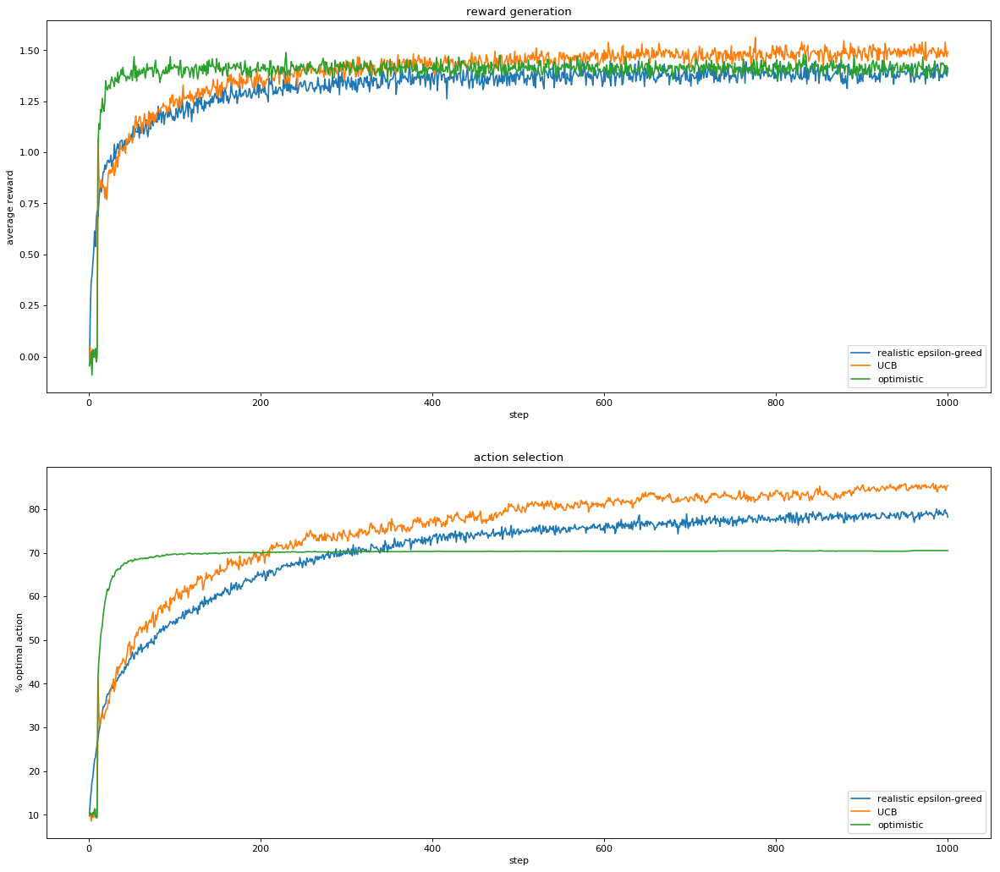

In [7]:
num_steps=1000;num_runs=2000

######################################UCB optimistic epsilon-greedy; stationary#Q4

[total_rewards,optimum_actions]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.1,alpha=0,num_bandits=10,stat=1,optimistic=0,UCB=0)
for i in range(num_steps):
    total_rewards[i]/=num_runs;optimum_actions[i]*=(100/num_runs)

[t,o]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.01,alpha=0,num_bandits=10,stat=1,optimistic=0,UCB=2)
for i in range(num_steps):
    t[i]/=num_runs;o[i]*=(100/num_runs)
    
[to,op]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0,alpha=0,num_bandits=10,stat=1,optimistic=1,UCB=0)
for i in range(num_steps):
    to[i]/=num_runs;op[i]*=(100/num_runs)
    
fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')   
plt.subplot(2,1,1)
plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],total_rewards,label='realistic epsilon-greed')

plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],t,label='UCB')

plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],to,label='optimistic')

plt.legend(loc='lower right')



plt.subplot(2,1,2)
plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],optimum_actions,label='realistic epsilon-greed')

plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],o,label='UCB')

plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],op,label='optimistic')

plt.legend(loc='lower right')
plt.show()

INITIALIZING RUN... 1
phi_a's:  [0.14490508298519514, 0.14490508298519514, 0.14490508298519514, 0.14490508298519514, 0.14490508298519514, 0.14490508298519514, 0.14490508298519514, 0.14490508298519514, 0.14490508298519514, 0.14490508298519514]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 2
phi_a's:  [-1.1037640458364286, -1.1037640458364286, -1.1037640458364286, -1.1037640458364286, -1.1037640458364286, -1.1037640458364286, -1.1037640458364286, -1.1037640458364286, -1.1037640458364286, -1.1037640458364286]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 3
phi_a's:  [-1.0189871533600778, -1.0189871533600778, -1.0189871533600778, -1.0189871533600778, -1.0189871533600778, -1.0189871533600778, -1.0189871533600778, -1.0189871533600778, -1.0189871533600778, -1.0189871533600778]
q_a's:  [0, 0, 0,

INITIALIZING RUN... 24
phi_a's:  [-1.2604672182121774, -1.2604672182121774, -1.2604672182121774, -1.2604672182121774, -1.2604672182121774, -1.2604672182121774, -1.2604672182121774, -1.2604672182121774, -1.2604672182121774, -1.2604672182121774]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 25
phi_a's:  [0.3731279530707466, 0.3731279530707466, 0.3731279530707466, 0.3731279530707466, 0.3731279530707466, 0.3731279530707466, 0.3731279530707466, 0.3731279530707466, 0.3731279530707466, 0.3731279530707466]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 26
phi_a's:  [0.33317066417578856, 0.33317066417578856, 0.33317066417578856, 0.33317066417578856, 0.33317066417578856, 0.33317066417578856, 0.33317066417578856, 0.33317066417578856, 0.33317066417578856, 0.33317066417578856]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 47
phi_a's:  [2.0116862966321665, 2.0116862966321665, 2.0116862966321665, 2.0116862966321665, 2.0116862966321665, 2.0116862966321665, 2.0116862966321665, 2.0116862966321665, 2.0116862966321665, 2.0116862966321665]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 48
phi_a's:  [-1.4714174032760048, -1.4714174032760048, -1.4714174032760048, -1.4714174032760048, -1.4714174032760048, -1.4714174032760048, -1.4714174032760048, -1.4714174032760048, -1.4714174032760048, -1.4714174032760048]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 49
phi_a's:  [-0.9353308508591617, -0.9353308508591617, -0.9353308508591617, -0.9353308508591617, -0.9353308508591617, -0.9353308508591617, -0.9353308508591617, -0.9353308508591617, -0.9353308508591617, -0.9353308508591617]
q_a's:  [0, 0, 0, 0, 0, 

INITIALIZING RUN... 70
phi_a's:  [1.0035492805107158, 1.0035492805107158, 1.0035492805107158, 1.0035492805107158, 1.0035492805107158, 1.0035492805107158, 1.0035492805107158, 1.0035492805107158, 1.0035492805107158, 1.0035492805107158]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 71
phi_a's:  [0.3223608570237338, 0.3223608570237338, 0.3223608570237338, 0.3223608570237338, 0.3223608570237338, 0.3223608570237338, 0.3223608570237338, 0.3223608570237338, 0.3223608570237338, 0.3223608570237338]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 72
phi_a's:  [-0.8216674469213484, -0.8216674469213484, -0.8216674469213484, -0.8216674469213484, -0.8216674469213484, -0.8216674469213484, -0.8216674469213484, -0.8216674469213484, -0.8216674469213484, -0.8216674469213484]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 93
phi_a's:  [0.8014246740314215, 0.8014246740314215, 0.8014246740314215, 0.8014246740314215, 0.8014246740314215, 0.8014246740314215, 0.8014246740314215, 0.8014246740314215, 0.8014246740314215, 0.8014246740314215]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 94
phi_a's:  [0.8500798136421979, 0.8500798136421979, 0.8500798136421979, 0.8500798136421979, 0.8500798136421979, 0.8500798136421979, 0.8500798136421979, 0.8500798136421979, 0.8500798136421979, 0.8500798136421979]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 95
phi_a's:  [2.7971384535666437, 2.7971384535666437, 2.7971384535666437, 2.7971384535666437, 2.7971384535666437, 2.7971384535666437, 2.7971384535666437, 2.7971384535666437, 2.7971384535666437, 2.7971384535666437]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's

INITIALIZING RUN... 116
phi_a's:  [0.15224730456630267, 0.15224730456630267, 0.15224730456630267, 0.15224730456630267, 0.15224730456630267, 0.15224730456630267, 0.15224730456630267, 0.15224730456630267, 0.15224730456630267, 0.15224730456630267]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 117
phi_a's:  [-2.297119931335234, -2.297119931335234, -2.297119931335234, -2.297119931335234, -2.297119931335234, -2.297119931335234, -2.297119931335234, -2.297119931335234, -2.297119931335234, -2.297119931335234]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 118
phi_a's:  [-1.8536944313378165, -1.8536944313378165, -1.8536944313378165, -1.8536944313378165, -1.8536944313378165, -1.8536944313378165, -1.8536944313378165, -1.8536944313378165, -1.8536944313378165, -1.8536944313378165]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 139
phi_a's:  [0.14619062411164271, 0.14619062411164271, 0.14619062411164271, 0.14619062411164271, 0.14619062411164271, 0.14619062411164271, 0.14619062411164271, 0.14619062411164271, 0.14619062411164271, 0.14619062411164271]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 140
phi_a's:  [0.5489948709765969, 0.5489948709765969, 0.5489948709765969, 0.5489948709765969, 0.5489948709765969, 0.5489948709765969, 0.5489948709765969, 0.5489948709765969, 0.5489948709765969, 0.5489948709765969]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 141
phi_a's:  [1.0832988048566712, 1.0832988048566712, 1.0832988048566712, 1.0832988048566712, 1.0832988048566712, 1.0832988048566712, 1.0832988048566712, 1.0832988048566712, 1.0832988048566712, 1.0832988048566712]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 162
phi_a's:  [0.758774231686023, 0.758774231686023, 0.758774231686023, 0.758774231686023, 0.758774231686023, 0.758774231686023, 0.758774231686023, 0.758774231686023, 0.758774231686023, 0.758774231686023]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 163
phi_a's:  [0.9201878365093407, 0.9201878365093407, 0.9201878365093407, 0.9201878365093407, 0.9201878365093407, 0.9201878365093407, 0.9201878365093407, 0.9201878365093407, 0.9201878365093407, 0.9201878365093407]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 164
phi_a's:  [0.3639572268399693, 0.3639572268399693, 0.3639572268399693, 0.3639572268399693, 0.3639572268399693, 0.3639572268399693, 0.3639572268399693, 0.3639572268399693, 0.3639572268399693, 0.3639572268399693]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 

INITIALIZING RUN... 185
phi_a's:  [1.3418424751985398, 1.3418424751985398, 1.3418424751985398, 1.3418424751985398, 1.3418424751985398, 1.3418424751985398, 1.3418424751985398, 1.3418424751985398, 1.3418424751985398, 1.3418424751985398]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 186
phi_a's:  [-0.5524054314705134, -0.5524054314705134, -0.5524054314705134, -0.5524054314705134, -0.5524054314705134, -0.5524054314705134, -0.5524054314705134, -0.5524054314705134, -0.5524054314705134, -0.5524054314705134]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 187
phi_a's:  [0.20243269907584194, 0.20243269907584194, 0.20243269907584194, 0.20243269907584194, 0.20243269907584194, 0.20243269907584194, 0.20243269907584194, 0.20243269907584194, 0.20243269907584194, 0.20243269907584194]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 208
phi_a's:  [-1.0145549225444384, -1.0145549225444384, -1.0145549225444384, -1.0145549225444384, -1.0145549225444384, -1.0145549225444384, -1.0145549225444384, -1.0145549225444384, -1.0145549225444384, -1.0145549225444384]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 209
phi_a's:  [-1.5913419746809636, -1.5913419746809636, -1.5913419746809636, -1.5913419746809636, -1.5913419746809636, -1.5913419746809636, -1.5913419746809636, -1.5913419746809636, -1.5913419746809636, -1.5913419746809636]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 210
phi_a's:  [0.29495264639722113, 0.29495264639722113, 0.29495264639722113, 0.29495264639722113, 0.29495264639722113, 0.29495264639722113, 0.29495264639722113, 0.29495264639722113, 0.29495264639722113, 0.29495264639722113]
q_a's:  [0,

INITIALIZING RUN... 231
phi_a's:  [-2.019068534718192, -2.019068534718192, -2.019068534718192, -2.019068534718192, -2.019068534718192, -2.019068534718192, -2.019068534718192, -2.019068534718192, -2.019068534718192, -2.019068534718192]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 232
phi_a's:  [-0.3305014281393867, -0.3305014281393867, -0.3305014281393867, -0.3305014281393867, -0.3305014281393867, -0.3305014281393867, -0.3305014281393867, -0.3305014281393867, -0.3305014281393867, -0.3305014281393867]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 233
phi_a's:  [0.10225504443250347, 0.10225504443250347, 0.10225504443250347, 0.10225504443250347, 0.10225504443250347, 0.10225504443250347, 0.10225504443250347, 0.10225504443250347, 0.10225504443250347, 0.10225504443250347]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 254
phi_a's:  [0.7661076969150578, 0.7661076969150578, 0.7661076969150578, 0.7661076969150578, 0.7661076969150578, 0.7661076969150578, 0.7661076969150578, 0.7661076969150578, 0.7661076969150578, 0.7661076969150578]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 255
phi_a's:  [0.25587143472308926, 0.25587143472308926, 0.25587143472308926, 0.25587143472308926, 0.25587143472308926, 0.25587143472308926, 0.25587143472308926, 0.25587143472308926, 0.25587143472308926, 0.25587143472308926]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 256
phi_a's:  [1.0407153226057664, 1.0407153226057664, 1.0407153226057664, 1.0407153226057664, 1.0407153226057664, 1.0407153226057664, 1.0407153226057664, 1.0407153226057664, 1.0407153226057664, 1.0407153226057664]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 277
phi_a's:  [0.7992151519018523, 0.7992151519018523, 0.7992151519018523, 0.7992151519018523, 0.7992151519018523, 0.7992151519018523, 0.7992151519018523, 0.7992151519018523, 0.7992151519018523, 0.7992151519018523]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 278
phi_a's:  [0.7479953005081219, 0.7479953005081219, 0.7479953005081219, 0.7479953005081219, 0.7479953005081219, 0.7479953005081219, 0.7479953005081219, 0.7479953005081219, 0.7479953005081219, 0.7479953005081219]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 279
phi_a's:  [0.40516668472035283, 0.40516668472035283, 0.40516668472035283, 0.40516668472035283, 0.40516668472035283, 0.40516668472035283, 0.40516668472035283, 0.40516668472035283, 0.40516668472035283, 0.40516668472035283]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 300
phi_a's:  [0.5608340036511663, 0.5608340036511663, 0.5608340036511663, 0.5608340036511663, 0.5608340036511663, 0.5608340036511663, 0.5608340036511663, 0.5608340036511663, 0.5608340036511663, 0.5608340036511663]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 301
phi_a's:  [-1.1319641731310681, -1.1319641731310681, -1.1319641731310681, -1.1319641731310681, -1.1319641731310681, -1.1319641731310681, -1.1319641731310681, -1.1319641731310681, -1.1319641731310681, -1.1319641731310681]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 302
phi_a's:  [-1.0625934599380402, -1.0625934599380402, -1.0625934599380402, -1.0625934599380402, -1.0625934599380402, -1.0625934599380402, -1.0625934599380402, -1.0625934599380402, -1.0625934599380402, -1.0625934599380402]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 323
phi_a's:  [1.045519094328681, 1.045519094328681, 1.045519094328681, 1.045519094328681, 1.045519094328681, 1.045519094328681, 1.045519094328681, 1.045519094328681, 1.045519094328681, 1.045519094328681]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 324
phi_a's:  [-2.659013893469004, -2.659013893469004, -2.659013893469004, -2.659013893469004, -2.659013893469004, -2.659013893469004, -2.659013893469004, -2.659013893469004, -2.659013893469004, -2.659013893469004]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 325
phi_a's:  [-0.46076735253286316, -0.46076735253286316, -0.46076735253286316, -0.46076735253286316, -0.46076735253286316, -0.46076735253286316, -0.46076735253286316, -0.46076735253286316, -0.46076735253286316, -0.46076735253286316]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 346
phi_a's:  [-0.633215515526193, -0.633215515526193, -0.633215515526193, -0.633215515526193, -0.633215515526193, -0.633215515526193, -0.633215515526193, -0.633215515526193, -0.633215515526193, -0.633215515526193]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 347
phi_a's:  [1.4997379233795527, 1.4997379233795527, 1.4997379233795527, 1.4997379233795527, 1.4997379233795527, 1.4997379233795527, 1.4997379233795527, 1.4997379233795527, 1.4997379233795527, 1.4997379233795527]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 348
phi_a's:  [-0.2683857989598793, -0.2683857989598793, -0.2683857989598793, -0.2683857989598793, -0.2683857989598793, -0.2683857989598793, -0.2683857989598793, -0.2683857989598793, -0.2683857989598793, -0.2683857989598793]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 369
phi_a's:  [-0.43470124738588606, -0.43470124738588606, -0.43470124738588606, -0.43470124738588606, -0.43470124738588606, -0.43470124738588606, -0.43470124738588606, -0.43470124738588606, -0.43470124738588606, -0.43470124738588606]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 370
phi_a's:  [0.06402626176770716, 0.06402626176770716, 0.06402626176770716, 0.06402626176770716, 0.06402626176770716, 0.06402626176770716, 0.06402626176770716, 0.06402626176770716, 0.06402626176770716, 0.06402626176770716]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 371
phi_a's:  [-0.06500983044795196, -0.06500983044795196, -0.06500983044795196, -0.06500983044795196, -0.06500983044795196, -0.06500983044795196, -0.06500983044795196, -0.06500983044795196, -0.06500983044795196, -0.0650098304

INITIALIZING RUN... 392
phi_a's:  [-1.951692465532834, -1.951692465532834, -1.951692465532834, -1.951692465532834, -1.951692465532834, -1.951692465532834, -1.951692465532834, -1.951692465532834, -1.951692465532834, -1.951692465532834]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 393
phi_a's:  [-1.4839753114073624, -1.4839753114073624, -1.4839753114073624, -1.4839753114073624, -1.4839753114073624, -1.4839753114073624, -1.4839753114073624, -1.4839753114073624, -1.4839753114073624, -1.4839753114073624]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 394
phi_a's:  [-0.21559369389630753, -0.21559369389630753, -0.21559369389630753, -0.21559369389630753, -0.21559369389630753, -0.21559369389630753, -0.21559369389630753, -0.21559369389630753, -0.21559369389630753, -0.21559369389630753]
q_a's:  [0,

INITIALIZING RUN... 415
phi_a's:  [-0.5178130937525899, -0.5178130937525899, -0.5178130937525899, -0.5178130937525899, -0.5178130937525899, -0.5178130937525899, -0.5178130937525899, -0.5178130937525899, -0.5178130937525899, -0.5178130937525899]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 416
phi_a's:  [0.8046886371607471, 0.8046886371607471, 0.8046886371607471, 0.8046886371607471, 0.8046886371607471, 0.8046886371607471, 0.8046886371607471, 0.8046886371607471, 0.8046886371607471, 0.8046886371607471]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 417
phi_a's:  [0.08964930851378153, 0.08964930851378153, 0.08964930851378153, 0.08964930851378153, 0.08964930851378153, 0.08964930851378153, 0.08964930851378153, 0.08964930851378153, 0.08964930851378153, 0.08964930851378153]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 438
phi_a's:  [-0.45372813628515674, -0.45372813628515674, -0.45372813628515674, -0.45372813628515674, -0.45372813628515674, -0.45372813628515674, -0.45372813628515674, -0.45372813628515674, -0.45372813628515674, -0.45372813628515674]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 439
phi_a's:  [1.1428623227426327, 1.1428623227426327, 1.1428623227426327, 1.1428623227426327, 1.1428623227426327, 1.1428623227426327, 1.1428623227426327, 1.1428623227426327, 1.1428623227426327, 1.1428623227426327]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 440
phi_a's:  [-0.22554298187640395, -0.22554298187640395, -0.22554298187640395, -0.22554298187640395, -0.22554298187640395, -0.22554298187640395, -0.22554298187640395, -0.22554298187640395, -0.22554298187640395, -0.22554298187640395]
q

INITIALIZING RUN... 461
phi_a's:  [1.108889849685542, 1.108889849685542, 1.108889849685542, 1.108889849685542, 1.108889849685542, 1.108889849685542, 1.108889849685542, 1.108889849685542, 1.108889849685542, 1.108889849685542]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 462
phi_a's:  [-1.5058728501827965, -1.5058728501827965, -1.5058728501827965, -1.5058728501827965, -1.5058728501827965, -1.5058728501827965, -1.5058728501827965, -1.5058728501827965, -1.5058728501827965, -1.5058728501827965]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 463
phi_a's:  [1.1117081018643777, 1.1117081018643777, 1.1117081018643777, 1.1117081018643777, 1.1117081018643777, 1.1117081018643777, 1.1117081018643777, 1.1117081018643777, 1.1117081018643777, 1.1117081018643777]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 484
phi_a's:  [0.6060938529890494, 0.6060938529890494, 0.6060938529890494, 0.6060938529890494, 0.6060938529890494, 0.6060938529890494, 0.6060938529890494, 0.6060938529890494, 0.6060938529890494, 0.6060938529890494]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 485
phi_a's:  [-0.4235277540104353, -0.4235277540104353, -0.4235277540104353, -0.4235277540104353, -0.4235277540104353, -0.4235277540104353, -0.4235277540104353, -0.4235277540104353, -0.4235277540104353, -0.4235277540104353]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 486
phi_a's:  [-0.6637229360929287, -0.6637229360929287, -0.6637229360929287, -0.6637229360929287, -0.6637229360929287, -0.6637229360929287, -0.6637229360929287, -0.6637229360929287, -0.6637229360929287, -0.6637229360929287]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 507
phi_a's:  [0.7646603575435934, 0.7646603575435934, 0.7646603575435934, 0.7646603575435934, 0.7646603575435934, 0.7646603575435934, 0.7646603575435934, 0.7646603575435934, 0.7646603575435934, 0.7646603575435934]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 508
phi_a's:  [1.5945095489406487, 1.5945095489406487, 1.5945095489406487, 1.5945095489406487, 1.5945095489406487, 1.5945095489406487, 1.5945095489406487, 1.5945095489406487, 1.5945095489406487, 1.5945095489406487]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 509
phi_a's:  [-1.6953238757478488, -1.6953238757478488, -1.6953238757478488, -1.6953238757478488, -1.6953238757478488, -1.6953238757478488, -1.6953238757478488, -1.6953238757478488, -1.6953238757478488, -1.6953238757478488]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 530
phi_a's:  [1.6602829533890102, 1.6602829533890102, 1.6602829533890102, 1.6602829533890102, 1.6602829533890102, 1.6602829533890102, 1.6602829533890102, 1.6602829533890102, 1.6602829533890102, 1.6602829533890102]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 531
phi_a's:  [-0.9283808511673485, -0.9283808511673485, -0.9283808511673485, -0.9283808511673485, -0.9283808511673485, -0.9283808511673485, -0.9283808511673485, -0.9283808511673485, -0.9283808511673485, -0.9283808511673485]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 532
phi_a's:  [-1.521769555246086, -1.521769555246086, -1.521769555246086, -1.521769555246086, -1.521769555246086, -1.521769555246086, -1.521769555246086, -1.521769555246086, -1.521769555246086, -1.521769555246086]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 553
phi_a's:  [-0.34003817637925515, -0.34003817637925515, -0.34003817637925515, -0.34003817637925515, -0.34003817637925515, -0.34003817637925515, -0.34003817637925515, -0.34003817637925515, -0.34003817637925515, -0.34003817637925515]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 554
phi_a's:  [0.2710215364484678, 0.2710215364484678, 0.2710215364484678, 0.2710215364484678, 0.2710215364484678, 0.2710215364484678, 0.2710215364484678, 0.2710215364484678, 0.2710215364484678, 0.2710215364484678]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 555
phi_a's:  [-1.1360760396552205, -1.1360760396552205, -1.1360760396552205, -1.1360760396552205, -1.1360760396552205, -1.1360760396552205, -1.1360760396552205, -1.1360760396552205, -1.1360760396552205, -1.1360760396552205]
q_a's:  [0,

INITIALIZING RUN... 576
phi_a's:  [-1.6303437931802607, -1.6303437931802607, -1.6303437931802607, -1.6303437931802607, -1.6303437931802607, -1.6303437931802607, -1.6303437931802607, -1.6303437931802607, -1.6303437931802607, -1.6303437931802607]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 577
phi_a's:  [0.9660425309358186, 0.9660425309358186, 0.9660425309358186, 0.9660425309358186, 0.9660425309358186, 0.9660425309358186, 0.9660425309358186, 0.9660425309358186, 0.9660425309358186, 0.9660425309358186]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 578
phi_a's:  [1.2096225648337808, 1.2096225648337808, 1.2096225648337808, 1.2096225648337808, 1.2096225648337808, 1.2096225648337808, 1.2096225648337808, 1.2096225648337808, 1.2096225648337808, 1.2096225648337808]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 599
phi_a's:  [0.3314977562121292, 0.3314977562121292, 0.3314977562121292, 0.3314977562121292, 0.3314977562121292, 0.3314977562121292, 0.3314977562121292, 0.3314977562121292, 0.3314977562121292, 0.3314977562121292]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 600
phi_a's:  [0.2339462984993775, 0.2339462984993775, 0.2339462984993775, 0.2339462984993775, 0.2339462984993775, 0.2339462984993775, 0.2339462984993775, 0.2339462984993775, 0.2339462984993775, 0.2339462984993775]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 601
phi_a's:  [0.5116746344987229, 0.5116746344987229, 0.5116746344987229, 0.5116746344987229, 0.5116746344987229, 0.5116746344987229, 0.5116746344987229, 0.5116746344987229, 0.5116746344987229, 0.5116746344987229]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 622
phi_a's:  [1.0699153527599274, 1.0699153527599274, 1.0699153527599274, 1.0699153527599274, 1.0699153527599274, 1.0699153527599274, 1.0699153527599274, 1.0699153527599274, 1.0699153527599274, 1.0699153527599274]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 623
phi_a's:  [0.9759904392470748, 0.9759904392470748, 0.9759904392470748, 0.9759904392470748, 0.9759904392470748, 0.9759904392470748, 0.9759904392470748, 0.9759904392470748, 0.9759904392470748, 0.9759904392470748]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 624
phi_a's:  [0.021755590941369606, 0.021755590941369606, 0.021755590941369606, 0.021755590941369606, 0.021755590941369606, 0.021755590941369606, 0.021755590941369606, 0.021755590941369606, 0.021755590941369606, 0.021755590941369606]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 645
phi_a's:  [0.6982209420315215, 0.6982209420315215, 0.6982209420315215, 0.6982209420315215, 0.6982209420315215, 0.6982209420315215, 0.6982209420315215, 0.6982209420315215, 0.6982209420315215, 0.6982209420315215]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 646
phi_a's:  [-1.3457342897839966, -1.3457342897839966, -1.3457342897839966, -1.3457342897839966, -1.3457342897839966, -1.3457342897839966, -1.3457342897839966, -1.3457342897839966, -1.3457342897839966, -1.3457342897839966]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 647
phi_a's:  [0.34943045830494623, 0.34943045830494623, 0.34943045830494623, 0.34943045830494623, 0.34943045830494623, 0.34943045830494623, 0.34943045830494623, 0.34943045830494623, 0.34943045830494623, 0.34943045830494623]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 668
phi_a's:  [1.1294967306990547, 1.1294967306990547, 1.1294967306990547, 1.1294967306990547, 1.1294967306990547, 1.1294967306990547, 1.1294967306990547, 1.1294967306990547, 1.1294967306990547, 1.1294967306990547]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 669
phi_a's:  [-0.8415081372947845, -0.8415081372947845, -0.8415081372947845, -0.8415081372947845, -0.8415081372947845, -0.8415081372947845, -0.8415081372947845, -0.8415081372947845, -0.8415081372947845, -0.8415081372947845]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 670
phi_a's:  [0.11376962822654735, 0.11376962822654735, 0.11376962822654735, 0.11376962822654735, 0.11376962822654735, 0.11376962822654735, 0.11376962822654735, 0.11376962822654735, 0.11376962822654735, 0.11376962822654735]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 691
phi_a's:  [1.727924177355076, 1.727924177355076, 1.727924177355076, 1.727924177355076, 1.727924177355076, 1.727924177355076, 1.727924177355076, 1.727924177355076, 1.727924177355076, 1.727924177355076]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 692
phi_a's:  [0.2243472960090596, 0.2243472960090596, 0.2243472960090596, 0.2243472960090596, 0.2243472960090596, 0.2243472960090596, 0.2243472960090596, 0.2243472960090596, 0.2243472960090596, 0.2243472960090596]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 693
phi_a's:  [0.09295353969692324, 0.09295353969692324, 0.09295353969692324, 0.09295353969692324, 0.09295353969692324, 0.09295353969692324, 0.09295353969692324, 0.09295353969692324, 0.09295353969692324, 0.09295353969692324]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 714
phi_a's:  [0.008975685554376434, 0.008975685554376434, 0.008975685554376434, 0.008975685554376434, 0.008975685554376434, 0.008975685554376434, 0.008975685554376434, 0.008975685554376434, 0.008975685554376434, 0.008975685554376434]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 715
phi_a's:  [-0.20976101856148363, -0.20976101856148363, -0.20976101856148363, -0.20976101856148363, -0.20976101856148363, -0.20976101856148363, -0.20976101856148363, -0.20976101856148363, -0.20976101856148363, -0.20976101856148363]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 716
phi_a's:  [0.8122614357931465, 0.8122614357931465, 0.8122614357931465, 0.8122614357931465, 0.8122614357931465, 0.8122614357931465, 0.8122614357931465, 0.8122614357931465, 0.8122614357931465, 0.8122614357931465]
q

INITIALIZING RUN... 737
phi_a's:  [0.8359379240659214, 0.8359379240659214, 0.8359379240659214, 0.8359379240659214, 0.8359379240659214, 0.8359379240659214, 0.8359379240659214, 0.8359379240659214, 0.8359379240659214, 0.8359379240659214]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 738
phi_a's:  [-1.2292440122378405, -1.2292440122378405, -1.2292440122378405, -1.2292440122378405, -1.2292440122378405, -1.2292440122378405, -1.2292440122378405, -1.2292440122378405, -1.2292440122378405, -1.2292440122378405]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 739
phi_a's:  [-0.10777116028385839, -0.10777116028385839, -0.10777116028385839, -0.10777116028385839, -0.10777116028385839, -0.10777116028385839, -0.10777116028385839, -0.10777116028385839, -0.10777116028385839, -0.10777116028385839]
q_a's:  [0,

INITIALIZING RUN... 760
phi_a's:  [-1.0828095170713912, -1.0828095170713912, -1.0828095170713912, -1.0828095170713912, -1.0828095170713912, -1.0828095170713912, -1.0828095170713912, -1.0828095170713912, -1.0828095170713912, -1.0828095170713912]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 761
phi_a's:  [-1.9882208527402772, -1.9882208527402772, -1.9882208527402772, -1.9882208527402772, -1.9882208527402772, -1.9882208527402772, -1.9882208527402772, -1.9882208527402772, -1.9882208527402772, -1.9882208527402772]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 762
phi_a's:  [-1.728326515139966, -1.728326515139966, -1.728326515139966, -1.728326515139966, -1.728326515139966, -1.728326515139966, -1.728326515139966, -1.728326515139966, -1.728326515139966, -1.728326515139966]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 783
phi_a's:  [0.17076163898805916, 0.17076163898805916, 0.17076163898805916, 0.17076163898805916, 0.17076163898805916, 0.17076163898805916, 0.17076163898805916, 0.17076163898805916, 0.17076163898805916, 0.17076163898805916]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 784
phi_a's:  [-0.16450691332580342, -0.16450691332580342, -0.16450691332580342, -0.16450691332580342, -0.16450691332580342, -0.16450691332580342, -0.16450691332580342, -0.16450691332580342, -0.16450691332580342, -0.16450691332580342]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 785
phi_a's:  [1.5084936012410182, 1.5084936012410182, 1.5084936012410182, 1.5084936012410182, 1.5084936012410182, 1.5084936012410182, 1.5084936012410182, 1.5084936012410182, 1.5084936012410182, 1.5084936012410182]
q_a's:  [0,

INITIALIZING RUN... 806
phi_a's:  [1.636266131879384, 1.636266131879384, 1.636266131879384, 1.636266131879384, 1.636266131879384, 1.636266131879384, 1.636266131879384, 1.636266131879384, 1.636266131879384, 1.636266131879384]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 807
phi_a's:  [0.16252313775966243, 0.16252313775966243, 0.16252313775966243, 0.16252313775966243, 0.16252313775966243, 0.16252313775966243, 0.16252313775966243, 0.16252313775966243, 0.16252313775966243, 0.16252313775966243]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 808
phi_a's:  [1.1602626988680194, 1.1602626988680194, 1.1602626988680194, 1.1602626988680194, 1.1602626988680194, 1.1602626988680194, 1.1602626988680194, 1.1602626988680194, 1.1602626988680194, 1.1602626988680194]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 829
phi_a's:  [1.20021330543566, 1.20021330543566, 1.20021330543566, 1.20021330543566, 1.20021330543566, 1.20021330543566, 1.20021330543566, 1.20021330543566, 1.20021330543566, 1.20021330543566]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 830
phi_a's:  [-0.041419209531589396, -0.041419209531589396, -0.041419209531589396, -0.041419209531589396, -0.041419209531589396, -0.041419209531589396, -0.041419209531589396, -0.041419209531589396, -0.041419209531589396, -0.041419209531589396]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 831
phi_a's:  [1.1854045116055136, 1.1854045116055136, 1.1854045116055136, 1.1854045116055136, 1.1854045116055136, 1.1854045116055136, 1.1854045116055136, 1.1854045116055136, 1.1854045116055136, 1.1854045116055136]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 852
phi_a's:  [-0.16060283655358357, -0.16060283655358357, -0.16060283655358357, -0.16060283655358357, -0.16060283655358357, -0.16060283655358357, -0.16060283655358357, -0.16060283655358357, -0.16060283655358357, -0.16060283655358357]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 853
phi_a's:  [-0.6214120201822965, -0.6214120201822965, -0.6214120201822965, -0.6214120201822965, -0.6214120201822965, -0.6214120201822965, -0.6214120201822965, -0.6214120201822965, -0.6214120201822965, -0.6214120201822965]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 854
phi_a's:  [1.0116956067825764, 1.0116956067825764, 1.0116956067825764, 1.0116956067825764, 1.0116956067825764, 1.0116956067825764, 1.0116956067825764, 1.0116956067825764, 1.0116956067825764, 1.0116956067825764]
q_a's:  [0,

INITIALIZING RUN... 875
phi_a's:  [0.18203521023552102, 0.18203521023552102, 0.18203521023552102, 0.18203521023552102, 0.18203521023552102, 0.18203521023552102, 0.18203521023552102, 0.18203521023552102, 0.18203521023552102, 0.18203521023552102]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 876
phi_a's:  [-1.5730703793162288, -1.5730703793162288, -1.5730703793162288, -1.5730703793162288, -1.5730703793162288, -1.5730703793162288, -1.5730703793162288, -1.5730703793162288, -1.5730703793162288, -1.5730703793162288]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 877
phi_a's:  [-1.248869399776799, -1.248869399776799, -1.248869399776799, -1.248869399776799, -1.248869399776799, -1.248869399776799, -1.248869399776799, -1.248869399776799, -1.248869399776799, -1.248869399776799]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 898
phi_a's:  [1.2376307350871159, 1.2376307350871159, 1.2376307350871159, 1.2376307350871159, 1.2376307350871159, 1.2376307350871159, 1.2376307350871159, 1.2376307350871159, 1.2376307350871159, 1.2376307350871159]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 899
phi_a's:  [-0.5518567561754993, -0.5518567561754993, -0.5518567561754993, -0.5518567561754993, -0.5518567561754993, -0.5518567561754993, -0.5518567561754993, -0.5518567561754993, -0.5518567561754993, -0.5518567561754993]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 900
phi_a's:  [-1.5909362254171806, -1.5909362254171806, -1.5909362254171806, -1.5909362254171806, -1.5909362254171806, -1.5909362254171806, -1.5909362254171806, -1.5909362254171806, -1.5909362254171806, -1.5909362254171806]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 921
phi_a's:  [2.277779522720718, 2.277779522720718, 2.277779522720718, 2.277779522720718, 2.277779522720718, 2.277779522720718, 2.277779522720718, 2.277779522720718, 2.277779522720718, 2.277779522720718]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 922
phi_a's:  [-0.17474534510598788, -0.17474534510598788, -0.17474534510598788, -0.17474534510598788, -0.17474534510598788, -0.17474534510598788, -0.17474534510598788, -0.17474534510598788, -0.17474534510598788, -0.17474534510598788]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 923
phi_a's:  [-0.10112299472448581, -0.10112299472448581, -0.10112299472448581, -0.10112299472448581, -0.10112299472448581, -0.10112299472448581, -0.10112299472448581, -0.10112299472448581, -0.10112299472448581, -0.10112299472448581]
q_a's:  [0,

INITIALIZING RUN... 944
phi_a's:  [-1.5800721849659518, -1.5800721849659518, -1.5800721849659518, -1.5800721849659518, -1.5800721849659518, -1.5800721849659518, -1.5800721849659518, -1.5800721849659518, -1.5800721849659518, -1.5800721849659518]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 945
phi_a's:  [-0.46632566325005614, -0.46632566325005614, -0.46632566325005614, -0.46632566325005614, -0.46632566325005614, -0.46632566325005614, -0.46632566325005614, -0.46632566325005614, -0.46632566325005614, -0.46632566325005614]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 946
phi_a's:  [0.04484965944982521, 0.04484965944982521, 0.04484965944982521, 0.04484965944982521, 0.04484965944982521, 0.04484965944982521, 0.04484965944982521, 0.04484965944982521, 0.04484965944982521, 0.04484965944982521]
q

INITIALIZING RUN... 967
phi_a's:  [-1.5036067531235044, -1.5036067531235044, -1.5036067531235044, -1.5036067531235044, -1.5036067531235044, -1.5036067531235044, -1.5036067531235044, -1.5036067531235044, -1.5036067531235044, -1.5036067531235044]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 968
phi_a's:  [-0.2722320939613351, -0.2722320939613351, -0.2722320939613351, -0.2722320939613351, -0.2722320939613351, -0.2722320939613351, -0.2722320939613351, -0.2722320939613351, -0.2722320939613351, -0.2722320939613351]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 969
phi_a's:  [-0.7469272142211044, -0.7469272142211044, -0.7469272142211044, -0.7469272142211044, -0.7469272142211044, -0.7469272142211044, -0.7469272142211044, -0.7469272142211044, -0.7469272142211044, -0.7469272142211044]
q_a's:  [0,

INITIALIZING RUN... 990
phi_a's:  [0.5995905519094716, 0.5995905519094716, 0.5995905519094716, 0.5995905519094716, 0.5995905519094716, 0.5995905519094716, 0.5995905519094716, 0.5995905519094716, 0.5995905519094716, 0.5995905519094716]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 991
phi_a's:  [1.6069533557320275, 1.6069533557320275, 1.6069533557320275, 1.6069533557320275, 1.6069533557320275, 1.6069533557320275, 1.6069533557320275, 1.6069533557320275, 1.6069533557320275, 1.6069533557320275]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 992
phi_a's:  [-0.36630016790233405, -0.36630016790233405, -0.36630016790233405, -0.36630016790233405, -0.36630016790233405, -0.36630016790233405, -0.36630016790233405, -0.36630016790233405, -0.36630016790233405, -0.36630016790233405]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 1013
phi_a's:  [0.17257891837791617, 0.17257891837791617, 0.17257891837791617, 0.17257891837791617, 0.17257891837791617, 0.17257891837791617, 0.17257891837791617, 0.17257891837791617, 0.17257891837791617, 0.17257891837791617]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1014
phi_a's:  [0.5860368877598159, 0.5860368877598159, 0.5860368877598159, 0.5860368877598159, 0.5860368877598159, 0.5860368877598159, 0.5860368877598159, 0.5860368877598159, 0.5860368877598159, 0.5860368877598159]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1015
phi_a's:  [0.9893983361000557, 0.9893983361000557, 0.9893983361000557, 0.9893983361000557, 0.9893983361000557, 0.9893983361000557, 0.9893983361000557, 0.9893983361000557, 0.9893983361000557, 0.9893983361000557]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1036
phi_a's:  [-0.23892724400130189, -0.23892724400130189, -0.23892724400130189, -0.23892724400130189, -0.23892724400130189, -0.23892724400130189, -0.23892724400130189, -0.23892724400130189, -0.23892724400130189, -0.23892724400130189]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1037
phi_a's:  [1.335858856002406, 1.335858856002406, 1.335858856002406, 1.335858856002406, 1.335858856002406, 1.335858856002406, 1.335858856002406, 1.335858856002406, 1.335858856002406, 1.335858856002406]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1038
phi_a's:  [1.7610304404935027, 1.7610304404935027, 1.7610304404935027, 1.7610304404935027, 1.7610304404935027, 1.7610304404935027, 1.7610304404935027, 1.7610304404935027, 1.7610304404935027, 1.7610304404935027]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1059
phi_a's:  [1.1919309430693468, 1.1919309430693468, 1.1919309430693468, 1.1919309430693468, 1.1919309430693468, 1.1919309430693468, 1.1919309430693468, 1.1919309430693468, 1.1919309430693468, 1.1919309430693468]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1060
phi_a's:  [0.6743104973908823, 0.6743104973908823, 0.6743104973908823, 0.6743104973908823, 0.6743104973908823, 0.6743104973908823, 0.6743104973908823, 0.6743104973908823, 0.6743104973908823, 0.6743104973908823]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1061
phi_a's:  [0.6109491334490845, 0.6109491334490845, 0.6109491334490845, 0.6109491334490845, 0.6109491334490845, 0.6109491334490845, 0.6109491334490845, 0.6109491334490845, 0.6109491334490845, 0.6109491334490845]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1082
phi_a's:  [0.5917158770163836, 0.5917158770163836, 0.5917158770163836, 0.5917158770163836, 0.5917158770163836, 0.5917158770163836, 0.5917158770163836, 0.5917158770163836, 0.5917158770163836, 0.5917158770163836]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1083
phi_a's:  [0.43546761309946197, 0.43546761309946197, 0.43546761309946197, 0.43546761309946197, 0.43546761309946197, 0.43546761309946197, 0.43546761309946197, 0.43546761309946197, 0.43546761309946197, 0.43546761309946197]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1084
phi_a's:  [0.44945114199947744, 0.44945114199947744, 0.44945114199947744, 0.44945114199947744, 0.44945114199947744, 0.44945114199947744, 0.44945114199947744, 0.44945114199947744, 0.44945114199947744, 0.44945114199947744]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1105
phi_a's:  [-2.050699702413188, -2.050699702413188, -2.050699702413188, -2.050699702413188, -2.050699702413188, -2.050699702413188, -2.050699702413188, -2.050699702413188, -2.050699702413188, -2.050699702413188]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1106
phi_a's:  [0.4399322766962007, 0.4399322766962007, 0.4399322766962007, 0.4399322766962007, 0.4399322766962007, 0.4399322766962007, 0.4399322766962007, 0.4399322766962007, 0.4399322766962007, 0.4399322766962007]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1107
phi_a's:  [0.04856313280913177, 0.04856313280913177, 0.04856313280913177, 0.04856313280913177, 0.04856313280913177, 0.04856313280913177, 0.04856313280913177, 0.04856313280913177, 0.04856313280913177, 0.04856313280913177]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1128
phi_a's:  [-0.570721033489642, -0.570721033489642, -0.570721033489642, -0.570721033489642, -0.570721033489642, -0.570721033489642, -0.570721033489642, -0.570721033489642, -0.570721033489642, -0.570721033489642]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1129
phi_a's:  [-1.5374377803836476, -1.5374377803836476, -1.5374377803836476, -1.5374377803836476, -1.5374377803836476, -1.5374377803836476, -1.5374377803836476, -1.5374377803836476, -1.5374377803836476, -1.5374377803836476]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1130
phi_a's:  [-1.0815843482043939, -1.0815843482043939, -1.0815843482043939, -1.0815843482043939, -1.0815843482043939, -1.0815843482043939, -1.0815843482043939, -1.0815843482043939, -1.0815843482043939, -1.0815843482043939]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1151
phi_a's:  [1.8077159514622012, 1.8077159514622012, 1.8077159514622012, 1.8077159514622012, 1.8077159514622012, 1.8077159514622012, 1.8077159514622012, 1.8077159514622012, 1.8077159514622012, 1.8077159514622012]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1152
phi_a's:  [-0.13129237849258096, -0.13129237849258096, -0.13129237849258096, -0.13129237849258096, -0.13129237849258096, -0.13129237849258096, -0.13129237849258096, -0.13129237849258096, -0.13129237849258096, -0.13129237849258096]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1153
phi_a's:  [-1.3154981709022773, -1.3154981709022773, -1.3154981709022773, -1.3154981709022773, -1.3154981709022773, -1.3154981709022773, -1.3154981709022773, -1.3154981709022773, -1.3154981709022773, -1.3154981709022773]
q_a's:  

INITIALIZING RUN... 1174
phi_a's:  [1.034546974848418, 1.034546974848418, 1.034546974848418, 1.034546974848418, 1.034546974848418, 1.034546974848418, 1.034546974848418, 1.034546974848418, 1.034546974848418, 1.034546974848418]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1175
phi_a's:  [-0.9952830749033903, -0.9952830749033903, -0.9952830749033903, -0.9952830749033903, -0.9952830749033903, -0.9952830749033903, -0.9952830749033903, -0.9952830749033903, -0.9952830749033903, -0.9952830749033903]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1176
phi_a's:  [-0.2433615204417112, -0.2433615204417112, -0.2433615204417112, -0.2433615204417112, -0.2433615204417112, -0.2433615204417112, -0.2433615204417112, -0.2433615204417112, -0.2433615204417112, -0.2433615204417112]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1197
phi_a's:  [-1.1826006338461124, -1.1826006338461124, -1.1826006338461124, -1.1826006338461124, -1.1826006338461124, -1.1826006338461124, -1.1826006338461124, -1.1826006338461124, -1.1826006338461124, -1.1826006338461124]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1198
phi_a's:  [-1.2846838046718807, -1.2846838046718807, -1.2846838046718807, -1.2846838046718807, -1.2846838046718807, -1.2846838046718807, -1.2846838046718807, -1.2846838046718807, -1.2846838046718807, -1.2846838046718807]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1199
phi_a's:  [-0.18138882752157648, -0.18138882752157648, -0.18138882752157648, -0.18138882752157648, -0.18138882752157648, -0.18138882752157648, -0.18138882752157648, -0.18138882752157648, -0.18138882752157648, -0.18138882752157648

INITIALIZING RUN... 1220
phi_a's:  [1.640326574785783, 1.640326574785783, 1.640326574785783, 1.640326574785783, 1.640326574785783, 1.640326574785783, 1.640326574785783, 1.640326574785783, 1.640326574785783, 1.640326574785783]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1221
phi_a's:  [0.08246009658372906, 0.08246009658372906, 0.08246009658372906, 0.08246009658372906, 0.08246009658372906, 0.08246009658372906, 0.08246009658372906, 0.08246009658372906, 0.08246009658372906, 0.08246009658372906]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1222
phi_a's:  [-0.20977211931469325, -0.20977211931469325, -0.20977211931469325, -0.20977211931469325, -0.20977211931469325, -0.20977211931469325, -0.20977211931469325, -0.20977211931469325, -0.20977211931469325, -0.20977211931469325]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1243
phi_a's:  [0.942190954627196, 0.942190954627196, 0.942190954627196, 0.942190954627196, 0.942190954627196, 0.942190954627196, 0.942190954627196, 0.942190954627196, 0.942190954627196, 0.942190954627196]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1244
phi_a's:  [0.6587119326304068, 0.6587119326304068, 0.6587119326304068, 0.6587119326304068, 0.6587119326304068, 0.6587119326304068, 0.6587119326304068, 0.6587119326304068, 0.6587119326304068, 0.6587119326304068]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1245
phi_a's:  [1.664227112868297, 1.664227112868297, 1.664227112868297, 1.664227112868297, 1.664227112868297, 1.664227112868297, 1.664227112868297, 1.664227112868297, 1.664227112868297, 1.664227112868297]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0

INITIALIZING RUN... 1266
phi_a's:  [0.6583345786505864, 0.6583345786505864, 0.6583345786505864, 0.6583345786505864, 0.6583345786505864, 0.6583345786505864, 0.6583345786505864, 0.6583345786505864, 0.6583345786505864, 0.6583345786505864]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1267
phi_a's:  [-0.7340707449068302, -0.7340707449068302, -0.7340707449068302, -0.7340707449068302, -0.7340707449068302, -0.7340707449068302, -0.7340707449068302, -0.7340707449068302, -0.7340707449068302, -0.7340707449068302]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1268
phi_a's:  [0.2196996734490531, 0.2196996734490531, 0.2196996734490531, 0.2196996734490531, 0.2196996734490531, 0.2196996734490531, 0.2196996734490531, 0.2196996734490531, 0.2196996734490531, 0.2196996734490531]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1289
phi_a's:  [0.8729349032265886, 0.8729349032265886, 0.8729349032265886, 0.8729349032265886, 0.8729349032265886, 0.8729349032265886, 0.8729349032265886, 0.8729349032265886, 0.8729349032265886, 0.8729349032265886]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1290
phi_a's:  [0.11768297049998679, 0.11768297049998679, 0.11768297049998679, 0.11768297049998679, 0.11768297049998679, 0.11768297049998679, 0.11768297049998679, 0.11768297049998679, 0.11768297049998679, 0.11768297049998679]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1291
phi_a's:  [2.549201189336785, 2.549201189336785, 2.549201189336785, 2.549201189336785, 2.549201189336785, 2.549201189336785, 2.549201189336785, 2.549201189336785, 2.549201189336785, 2.549201189336785]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1312
phi_a's:  [0.7684643705888223, 0.7684643705888223, 0.7684643705888223, 0.7684643705888223, 0.7684643705888223, 0.7684643705888223, 0.7684643705888223, 0.7684643705888223, 0.7684643705888223, 0.7684643705888223]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1313
phi_a's:  [0.5878793654213543, 0.5878793654213543, 0.5878793654213543, 0.5878793654213543, 0.5878793654213543, 0.5878793654213543, 0.5878793654213543, 0.5878793654213543, 0.5878793654213543, 0.5878793654213543]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1314
phi_a's:  [0.7597938723044116, 0.7597938723044116, 0.7597938723044116, 0.7597938723044116, 0.7597938723044116, 0.7597938723044116, 0.7597938723044116, 0.7597938723044116, 0.7597938723044116, 0.7597938723044116]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1335
phi_a's:  [-0.8162464462080653, -0.8162464462080653, -0.8162464462080653, -0.8162464462080653, -0.8162464462080653, -0.8162464462080653, -0.8162464462080653, -0.8162464462080653, -0.8162464462080653, -0.8162464462080653]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1336
phi_a's:  [-1.6300951960609007, -1.6300951960609007, -1.6300951960609007, -1.6300951960609007, -1.6300951960609007, -1.6300951960609007, -1.6300951960609007, -1.6300951960609007, -1.6300951960609007, -1.6300951960609007]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1337
phi_a's:  [-0.18197812858772427, -0.18197812858772427, -0.18197812858772427, -0.18197812858772427, -0.18197812858772427, -0.18197812858772427, -0.18197812858772427, -0.18197812858772427, -0.18197812858772427, -0.18197812858772427

INITIALIZING RUN... 1358
phi_a's:  [2.18071466843975, 2.18071466843975, 2.18071466843975, 2.18071466843975, 2.18071466843975, 2.18071466843975, 2.18071466843975, 2.18071466843975, 2.18071466843975, 2.18071466843975]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1359
phi_a's:  [0.43243450131719935, 0.43243450131719935, 0.43243450131719935, 0.43243450131719935, 0.43243450131719935, 0.43243450131719935, 0.43243450131719935, 0.43243450131719935, 0.43243450131719935, 0.43243450131719935]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1360
phi_a's:  [-1.78408008214063, -1.78408008214063, -1.78408008214063, -1.78408008214063, -1.78408008214063, -1.78408008214063, -1.78408008214063, -1.78408008214063, -1.78408008214063, -1.78408008214063]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0

INITIALIZING RUN... 1381
phi_a's:  [-0.5989478518428062, -0.5989478518428062, -0.5989478518428062, -0.5989478518428062, -0.5989478518428062, -0.5989478518428062, -0.5989478518428062, -0.5989478518428062, -0.5989478518428062, -0.5989478518428062]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1382
phi_a's:  [-2.210909214265736, -2.210909214265736, -2.210909214265736, -2.210909214265736, -2.210909214265736, -2.210909214265736, -2.210909214265736, -2.210909214265736, -2.210909214265736, -2.210909214265736]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1383
phi_a's:  [0.2138001458649029, 0.2138001458649029, 0.2138001458649029, 0.2138001458649029, 0.2138001458649029, 0.2138001458649029, 0.2138001458649029, 0.2138001458649029, 0.2138001458649029, 0.2138001458649029]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1404
phi_a's:  [0.8403527811458762, 0.8403527811458762, 0.8403527811458762, 0.8403527811458762, 0.8403527811458762, 0.8403527811458762, 0.8403527811458762, 0.8403527811458762, 0.8403527811458762, 0.8403527811458762]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1405
phi_a's:  [0.8794938891283316, 0.8794938891283316, 0.8794938891283316, 0.8794938891283316, 0.8794938891283316, 0.8794938891283316, 0.8794938891283316, 0.8794938891283316, 0.8794938891283316, 0.8794938891283316]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1406
phi_a's:  [-0.4878065358727727, -0.4878065358727727, -0.4878065358727727, -0.4878065358727727, -0.4878065358727727, -0.4878065358727727, -0.4878065358727727, -0.4878065358727727, -0.4878065358727727, -0.4878065358727727]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1427
phi_a's:  [0.9657394272017351, 0.9657394272017351, 0.9657394272017351, 0.9657394272017351, 0.9657394272017351, 0.9657394272017351, 0.9657394272017351, 0.9657394272017351, 0.9657394272017351, 0.9657394272017351]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1428
phi_a's:  [-0.3542500200323821, -0.3542500200323821, -0.3542500200323821, -0.3542500200323821, -0.3542500200323821, -0.3542500200323821, -0.3542500200323821, -0.3542500200323821, -0.3542500200323821, -0.3542500200323821]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1429
phi_a's:  [0.8009841217507323, 0.8009841217507323, 0.8009841217507323, 0.8009841217507323, 0.8009841217507323, 0.8009841217507323, 0.8009841217507323, 0.8009841217507323, 0.8009841217507323, 0.8009841217507323]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1450
phi_a's:  [-0.18358961823481973, -0.18358961823481973, -0.18358961823481973, -0.18358961823481973, -0.18358961823481973, -0.18358961823481973, -0.18358961823481973, -0.18358961823481973, -0.18358961823481973, -0.18358961823481973]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1451
phi_a's:  [0.17757045454962303, 0.17757045454962303, 0.17757045454962303, 0.17757045454962303, 0.17757045454962303, 0.17757045454962303, 0.17757045454962303, 0.17757045454962303, 0.17757045454962303, 0.17757045454962303]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1452
phi_a's:  [0.15694026161296643, 0.15694026161296643, 0.15694026161296643, 0.15694026161296643, 0.15694026161296643, 0.15694026161296643, 0.15694026161296643, 0.15694026161296643, 0.15694026161296643, 0.15694026161296643

INITIALIZING RUN... 1473
phi_a's:  [-0.04875275383861503, -0.04875275383861503, -0.04875275383861503, -0.04875275383861503, -0.04875275383861503, -0.04875275383861503, -0.04875275383861503, -0.04875275383861503, -0.04875275383861503, -0.04875275383861503]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1474
phi_a's:  [0.3892736537068732, 0.3892736537068732, 0.3892736537068732, 0.3892736537068732, 0.3892736537068732, 0.3892736537068732, 0.3892736537068732, 0.3892736537068732, 0.3892736537068732, 0.3892736537068732]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1475
phi_a's:  [-0.8213072002299868, -0.8213072002299868, -0.8213072002299868, -0.8213072002299868, -0.8213072002299868, -0.8213072002299868, -0.8213072002299868, -0.8213072002299868, -0.8213072002299868, -0.8213072002299868]
q_a's:  

INITIALIZING RUN... 1496
phi_a's:  [-1.1369733102113186, -1.1369733102113186, -1.1369733102113186, -1.1369733102113186, -1.1369733102113186, -1.1369733102113186, -1.1369733102113186, -1.1369733102113186, -1.1369733102113186, -1.1369733102113186]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1497
phi_a's:  [0.4716079853932434, 0.4716079853932434, 0.4716079853932434, 0.4716079853932434, 0.4716079853932434, 0.4716079853932434, 0.4716079853932434, 0.4716079853932434, 0.4716079853932434, 0.4716079853932434]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1498
phi_a's:  [0.3502859076866286, 0.3502859076866286, 0.3502859076866286, 0.3502859076866286, 0.3502859076866286, 0.3502859076866286, 0.3502859076866286, 0.3502859076866286, 0.3502859076866286, 0.3502859076866286]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1519
phi_a's:  [1.0009635761600613, 1.0009635761600613, 1.0009635761600613, 1.0009635761600613, 1.0009635761600613, 1.0009635761600613, 1.0009635761600613, 1.0009635761600613, 1.0009635761600613, 1.0009635761600613]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1520
phi_a's:  [0.12376658857705436, 0.12376658857705436, 0.12376658857705436, 0.12376658857705436, 0.12376658857705436, 0.12376658857705436, 0.12376658857705436, 0.12376658857705436, 0.12376658857705436, 0.12376658857705436]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1521
phi_a's:  [-1.2001879556600406, -1.2001879556600406, -1.2001879556600406, -1.2001879556600406, -1.2001879556600406, -1.2001879556600406, -1.2001879556600406, -1.2001879556600406, -1.2001879556600406, -1.2001879556600406]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1542
phi_a's:  [-0.18205359844020605, -0.18205359844020605, -0.18205359844020605, -0.18205359844020605, -0.18205359844020605, -0.18205359844020605, -0.18205359844020605, -0.18205359844020605, -0.18205359844020605, -0.18205359844020605]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1543
phi_a's:  [0.5335317164783688, 0.5335317164783688, 0.5335317164783688, 0.5335317164783688, 0.5335317164783688, 0.5335317164783688, 0.5335317164783688, 0.5335317164783688, 0.5335317164783688, 0.5335317164783688]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1544
phi_a's:  [-0.3261410772098063, -0.3261410772098063, -0.3261410772098063, -0.3261410772098063, -0.3261410772098063, -0.3261410772098063, -0.3261410772098063, -0.3261410772098063, -0.3261410772098063, -0.3261410772098063]
q_a's:  

INITIALIZING RUN... 1565
phi_a's:  [-0.6519532680855578, -0.6519532680855578, -0.6519532680855578, -0.6519532680855578, -0.6519532680855578, -0.6519532680855578, -0.6519532680855578, -0.6519532680855578, -0.6519532680855578, -0.6519532680855578]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1566
phi_a's:  [-0.7017189854150075, -0.7017189854150075, -0.7017189854150075, -0.7017189854150075, -0.7017189854150075, -0.7017189854150075, -0.7017189854150075, -0.7017189854150075, -0.7017189854150075, -0.7017189854150075]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1567
phi_a's:  [-0.4086572258629888, -0.4086572258629888, -0.4086572258629888, -0.4086572258629888, -0.4086572258629888, -0.4086572258629888, -0.4086572258629888, -0.4086572258629888, -0.4086572258629888, -0.4086572258629888]
q_a's:  

INITIALIZING RUN... 1588
phi_a's:  [-0.5581486558799609, -0.5581486558799609, -0.5581486558799609, -0.5581486558799609, -0.5581486558799609, -0.5581486558799609, -0.5581486558799609, -0.5581486558799609, -0.5581486558799609, -0.5581486558799609]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1589
phi_a's:  [0.19357176247339092, 0.19357176247339092, 0.19357176247339092, 0.19357176247339092, 0.19357176247339092, 0.19357176247339092, 0.19357176247339092, 0.19357176247339092, 0.19357176247339092, 0.19357176247339092]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1590
phi_a's:  [-1.4312792222391846, -1.4312792222391846, -1.4312792222391846, -1.4312792222391846, -1.4312792222391846, -1.4312792222391846, -1.4312792222391846, -1.4312792222391846, -1.4312792222391846, -1.4312792222391846]
q_a's:  

INITIALIZING RUN... 1611
phi_a's:  [1.9656549876445069, 1.9656549876445069, 1.9656549876445069, 1.9656549876445069, 1.9656549876445069, 1.9656549876445069, 1.9656549876445069, 1.9656549876445069, 1.9656549876445069, 1.9656549876445069]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1612
phi_a's:  [0.6394979771669571, 0.6394979771669571, 0.6394979771669571, 0.6394979771669571, 0.6394979771669571, 0.6394979771669571, 0.6394979771669571, 0.6394979771669571, 0.6394979771669571, 0.6394979771669571]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1613
phi_a's:  [-0.04441947867741311, -0.04441947867741311, -0.04441947867741311, -0.04441947867741311, -0.04441947867741311, -0.04441947867741311, -0.04441947867741311, -0.04441947867741311, -0.04441947867741311, -0.04441947867741311]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1634
phi_a's:  [-0.25366293830404263, -0.25366293830404263, -0.25366293830404263, -0.25366293830404263, -0.25366293830404263, -0.25366293830404263, -0.25366293830404263, -0.25366293830404263, -0.25366293830404263, -0.25366293830404263]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1635
phi_a's:  [0.4620246247960806, 0.4620246247960806, 0.4620246247960806, 0.4620246247960806, 0.4620246247960806, 0.4620246247960806, 0.4620246247960806, 0.4620246247960806, 0.4620246247960806, 0.4620246247960806]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1636
phi_a's:  [-0.0947783192284108, -0.0947783192284108, -0.0947783192284108, -0.0947783192284108, -0.0947783192284108, -0.0947783192284108, -0.0947783192284108, -0.0947783192284108, -0.0947783192284108, -0.0947783192284108]
q_a's:  

INITIALIZING RUN... 1657
phi_a's:  [1.365001118697134, 1.365001118697134, 1.365001118697134, 1.365001118697134, 1.365001118697134, 1.365001118697134, 1.365001118697134, 1.365001118697134, 1.365001118697134, 1.365001118697134]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1658
phi_a's:  [0.08981479667059498, 0.08981479667059498, 0.08981479667059498, 0.08981479667059498, 0.08981479667059498, 0.08981479667059498, 0.08981479667059498, 0.08981479667059498, 0.08981479667059498, 0.08981479667059498]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1659
phi_a's:  [0.9213345956231337, 0.9213345956231337, 0.9213345956231337, 0.9213345956231337, 0.9213345956231337, 0.9213345956231337, 0.9213345956231337, 0.9213345956231337, 0.9213345956231337, 0.9213345956231337]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1680
phi_a's:  [-1.5409357343012122, -1.5409357343012122, -1.5409357343012122, -1.5409357343012122, -1.5409357343012122, -1.5409357343012122, -1.5409357343012122, -1.5409357343012122, -1.5409357343012122, -1.5409357343012122]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1681
phi_a's:  [-0.2583676175723367, -0.2583676175723367, -0.2583676175723367, -0.2583676175723367, -0.2583676175723367, -0.2583676175723367, -0.2583676175723367, -0.2583676175723367, -0.2583676175723367, -0.2583676175723367]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1682
phi_a's:  [1.2003298242439657, 1.2003298242439657, 1.2003298242439657, 1.2003298242439657, 1.2003298242439657, 1.2003298242439657, 1.2003298242439657, 1.2003298242439657, 1.2003298242439657, 1.2003298242439657]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1703
phi_a's:  [1.1000493529976478, 1.1000493529976478, 1.1000493529976478, 1.1000493529976478, 1.1000493529976478, 1.1000493529976478, 1.1000493529976478, 1.1000493529976478, 1.1000493529976478, 1.1000493529976478]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1704
phi_a's:  [1.1243903687896122, 1.1243903687896122, 1.1243903687896122, 1.1243903687896122, 1.1243903687896122, 1.1243903687896122, 1.1243903687896122, 1.1243903687896122, 1.1243903687896122, 1.1243903687896122]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1705
phi_a's:  [-0.7252331206933894, -0.7252331206933894, -0.7252331206933894, -0.7252331206933894, -0.7252331206933894, -0.7252331206933894, -0.7252331206933894, -0.7252331206933894, -0.7252331206933894, -0.7252331206933894]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1726
phi_a's:  [0.08397527521270018, 0.08397527521270018, 0.08397527521270018, 0.08397527521270018, 0.08397527521270018, 0.08397527521270018, 0.08397527521270018, 0.08397527521270018, 0.08397527521270018, 0.08397527521270018]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1727
phi_a's:  [0.5554009961360469, 0.5554009961360469, 0.5554009961360469, 0.5554009961360469, 0.5554009961360469, 0.5554009961360469, 0.5554009961360469, 0.5554009961360469, 0.5554009961360469, 0.5554009961360469]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1728
phi_a's:  [0.11557819249182213, 0.11557819249182213, 0.11557819249182213, 0.11557819249182213, 0.11557819249182213, 0.11557819249182213, 0.11557819249182213, 0.11557819249182213, 0.11557819249182213, 0.11557819249182213]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1749
phi_a's:  [-1.1953764458010936, -1.1953764458010936, -1.1953764458010936, -1.1953764458010936, -1.1953764458010936, -1.1953764458010936, -1.1953764458010936, -1.1953764458010936, -1.1953764458010936, -1.1953764458010936]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1750
phi_a's:  [-0.045549979060745704, -0.045549979060745704, -0.045549979060745704, -0.045549979060745704, -0.045549979060745704, -0.045549979060745704, -0.045549979060745704, -0.045549979060745704, -0.045549979060745704, -0.045549979060745704]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1751
phi_a's:  [1.2552397497506065, 1.2552397497506065, 1.2552397497506065, 1.2552397497506065, 1.2552397497506065, 1.2552397497506065, 1.2552397497506065, 1.2552397497506065, 1.2552397497506065, 1.2552397497506065

INITIALIZING RUN... 1772
phi_a's:  [-0.773720267200789, -0.773720267200789, -0.773720267200789, -0.773720267200789, -0.773720267200789, -0.773720267200789, -0.773720267200789, -0.773720267200789, -0.773720267200789, -0.773720267200789]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1773
phi_a's:  [1.5779779972142394, 1.5779779972142394, 1.5779779972142394, 1.5779779972142394, 1.5779779972142394, 1.5779779972142394, 1.5779779972142394, 1.5779779972142394, 1.5779779972142394, 1.5779779972142394]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1774
phi_a's:  [-0.7387264327602799, -0.7387264327602799, -0.7387264327602799, -0.7387264327602799, -0.7387264327602799, -0.7387264327602799, -0.7387264327602799, -0.7387264327602799, -0.7387264327602799, -0.7387264327602799]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1795
phi_a's:  [-1.4199201276279174, -1.4199201276279174, -1.4199201276279174, -1.4199201276279174, -1.4199201276279174, -1.4199201276279174, -1.4199201276279174, -1.4199201276279174, -1.4199201276279174, -1.4199201276279174]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1796
phi_a's:  [-0.8495491943866561, -0.8495491943866561, -0.8495491943866561, -0.8495491943866561, -0.8495491943866561, -0.8495491943866561, -0.8495491943866561, -0.8495491943866561, -0.8495491943866561, -0.8495491943866561]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1797
phi_a's:  [0.06280991744317546, 0.06280991744317546, 0.06280991744317546, 0.06280991744317546, 0.06280991744317546, 0.06280991744317546, 0.06280991744317546, 0.06280991744317546, 0.06280991744317546, 0.06280991744317546]
q_a's:  

INITIALIZING RUN... 1818
phi_a's:  [-0.011653552325434195, -0.011653552325434195, -0.011653552325434195, -0.011653552325434195, -0.011653552325434195, -0.011653552325434195, -0.011653552325434195, -0.011653552325434195, -0.011653552325434195, -0.011653552325434195]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1819
phi_a's:  [-1.6675897318079635, -1.6675897318079635, -1.6675897318079635, -1.6675897318079635, -1.6675897318079635, -1.6675897318079635, -1.6675897318079635, -1.6675897318079635, -1.6675897318079635, -1.6675897318079635]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1820
phi_a's:  [-0.8474611277631795, -0.8474611277631795, -0.8474611277631795, -0.8474611277631795, -0.8474611277631795, -0.8474611277631795, -0.8474611277631795, -0.8474611277631795, -0.8474611277631795, -0.847461

INITIALIZING RUN... 1841
phi_a's:  [-1.553849384515597, -1.553849384515597, -1.553849384515597, -1.553849384515597, -1.553849384515597, -1.553849384515597, -1.553849384515597, -1.553849384515597, -1.553849384515597, -1.553849384515597]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1842
phi_a's:  [0.4620972390675366, 0.4620972390675366, 0.4620972390675366, 0.4620972390675366, 0.4620972390675366, 0.4620972390675366, 0.4620972390675366, 0.4620972390675366, 0.4620972390675366, 0.4620972390675366]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1843
phi_a's:  [-1.3145151866892564, -1.3145151866892564, -1.3145151866892564, -1.3145151866892564, -1.3145151866892564, -1.3145151866892564, -1.3145151866892564, -1.3145151866892564, -1.3145151866892564, -1.3145151866892564]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1864
phi_a's:  [1.0053461556795082, 1.0053461556795082, 1.0053461556795082, 1.0053461556795082, 1.0053461556795082, 1.0053461556795082, 1.0053461556795082, 1.0053461556795082, 1.0053461556795082, 1.0053461556795082]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1865
phi_a's:  [0.4779725425356911, 0.4779725425356911, 0.4779725425356911, 0.4779725425356911, 0.4779725425356911, 0.4779725425356911, 0.4779725425356911, 0.4779725425356911, 0.4779725425356911, 0.4779725425356911]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1866
phi_a's:  [0.899247134756911, 0.899247134756911, 0.899247134756911, 0.899247134756911, 0.899247134756911, 0.899247134756911, 0.899247134756911, 0.899247134756911, 0.899247134756911, 0.899247134756911]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [

INITIALIZING RUN... 1887
phi_a's:  [-1.8648259627009054, -1.8648259627009054, -1.8648259627009054, -1.8648259627009054, -1.8648259627009054, -1.8648259627009054, -1.8648259627009054, -1.8648259627009054, -1.8648259627009054, -1.8648259627009054]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1888
phi_a's:  [0.44363012354560516, 0.44363012354560516, 0.44363012354560516, 0.44363012354560516, 0.44363012354560516, 0.44363012354560516, 0.44363012354560516, 0.44363012354560516, 0.44363012354560516, 0.44363012354560516]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1889
phi_a's:  [0.6248835462847032, 0.6248835462847032, 0.6248835462847032, 0.6248835462847032, 0.6248835462847032, 0.6248835462847032, 0.6248835462847032, 0.6248835462847032, 0.6248835462847032, 0.6248835462847032]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1910
phi_a's:  [-0.973279370673765, -0.973279370673765, -0.973279370673765, -0.973279370673765, -0.973279370673765, -0.973279370673765, -0.973279370673765, -0.973279370673765, -0.973279370673765, -0.973279370673765]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1911
phi_a's:  [0.09414070683247133, 0.09414070683247133, 0.09414070683247133, 0.09414070683247133, 0.09414070683247133, 0.09414070683247133, 0.09414070683247133, 0.09414070683247133, 0.09414070683247133, 0.09414070683247133]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1912
phi_a's:  [-0.9578341865019568, -0.9578341865019568, -0.9578341865019568, -0.9578341865019568, -0.9578341865019568, -0.9578341865019568, -0.9578341865019568, -0.9578341865019568, -0.9578341865019568, -0.9578341865019568]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1933
phi_a's:  [-0.9740814355003471, -0.9740814355003471, -0.9740814355003471, -0.9740814355003471, -0.9740814355003471, -0.9740814355003471, -0.9740814355003471, -0.9740814355003471, -0.9740814355003471, -0.9740814355003471]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1934
phi_a's:  [0.8141628596464143, 0.8141628596464143, 0.8141628596464143, 0.8141628596464143, 0.8141628596464143, 0.8141628596464143, 0.8141628596464143, 0.8141628596464143, 0.8141628596464143, 0.8141628596464143]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1935
phi_a's:  [1.377727409024143, 1.377727409024143, 1.377727409024143, 1.377727409024143, 1.377727409024143, 1.377727409024143, 1.377727409024143, 1.377727409024143, 1.377727409024143, 1.377727409024143]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1956
phi_a's:  [-1.2864725988921242, -1.2864725988921242, -1.2864725988921242, -1.2864725988921242, -1.2864725988921242, -1.2864725988921242, -1.2864725988921242, -1.2864725988921242, -1.2864725988921242, -1.2864725988921242]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1957
phi_a's:  [-1.1527420778037238, -1.1527420778037238, -1.1527420778037238, -1.1527420778037238, -1.1527420778037238, -1.1527420778037238, -1.1527420778037238, -1.1527420778037238, -1.1527420778037238, -1.1527420778037238]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1958
phi_a's:  [-0.5707299654070723, -0.5707299654070723, -0.5707299654070723, -0.5707299654070723, -0.5707299654070723, -0.5707299654070723, -0.5707299654070723, -0.5707299654070723, -0.5707299654070723, -0.5707299654070723]
q_a's:  

INITIALIZING RUN... 1979
phi_a's:  [0.16938775862821834, 0.16938775862821834, 0.16938775862821834, 0.16938775862821834, 0.16938775862821834, 0.16938775862821834, 0.16938775862821834, 0.16938775862821834, 0.16938775862821834, 0.16938775862821834]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1980
phi_a's:  [0.596695460914648, 0.596695460914648, 0.596695460914648, 0.596695460914648, 0.596695460914648, 0.596695460914648, 0.596695460914648, 0.596695460914648, 0.596695460914648, 0.596695460914648]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1981
phi_a's:  [-0.15110341323674964, -0.15110341323674964, -0.15110341323674964, -0.15110341323674964, -0.15110341323674964, -0.15110341323674964, -0.15110341323674964, -0.15110341323674964, -0.15110341323674964, -0.15110341323674964]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1
phi_a's:  [-0.4647070414771208, -0.4647070414771208, -0.4647070414771208, -0.4647070414771208, -0.4647070414771208, -0.4647070414771208, -0.4647070414771208, -0.4647070414771208, -0.4647070414771208, -0.4647070414771208]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 2
phi_a's:  [-0.8662030048776795, -0.8662030048776795, -0.8662030048776795, -0.8662030048776795, -0.8662030048776795, -0.8662030048776795, -0.8662030048776795, -0.8662030048776795, -0.8662030048776795, -0.8662030048776795]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 3
phi_a's:  [-0.12276152318858449, -0.12276152318858449, -0.12276152318858449, -0.12276152318858449, -0.12276152318858449, -0.12276152318858449, -0.12276152318858449, -0.12276152318858449, -0.12276152318858449, -0.12276152318858449]
q_a's:  [

INITIALIZING RUN... 24
phi_a's:  [-1.1663826156046704, -1.1663826156046704, -1.1663826156046704, -1.1663826156046704, -1.1663826156046704, -1.1663826156046704, -1.1663826156046704, -1.1663826156046704, -1.1663826156046704, -1.1663826156046704]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 25
phi_a's:  [-0.5287237579309567, -0.5287237579309567, -0.5287237579309567, -0.5287237579309567, -0.5287237579309567, -0.5287237579309567, -0.5287237579309567, -0.5287237579309567, -0.5287237579309567, -0.5287237579309567]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 26
phi_a's:  [-0.6491335054098131, -0.6491335054098131, -0.6491335054098131, -0.6491335054098131, -0.6491335054098131, -0.6491335054098131, -0.6491335054098131, -0.6491335054098131, -0.6491335054098131, -0.6491335054098131]
q_a's:  [0, 0, 0

INITIALIZING RUN... 47
phi_a's:  [0.74184282339324, 0.74184282339324, 0.74184282339324, 0.74184282339324, 0.74184282339324, 0.74184282339324, 0.74184282339324, 0.74184282339324, 0.74184282339324, 0.74184282339324]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 48
phi_a's:  [-1.0200251992103309, -1.0200251992103309, -1.0200251992103309, -1.0200251992103309, -1.0200251992103309, -1.0200251992103309, -1.0200251992103309, -1.0200251992103309, -1.0200251992103309, -1.0200251992103309]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 49
phi_a's:  [-0.6085821943325983, -0.6085821943325983, -0.6085821943325983, -0.6085821943325983, -0.6085821943325983, -0.6085821943325983, -0.6085821943325983, -0.6085821943325983, -0.6085821943325983, -0.6085821943325983]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's: 

INITIALIZING RUN... 70
phi_a's:  [1.3365476293894278, 1.3365476293894278, 1.3365476293894278, 1.3365476293894278, 1.3365476293894278, 1.3365476293894278, 1.3365476293894278, 1.3365476293894278, 1.3365476293894278, 1.3365476293894278]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 71
phi_a's:  [-0.09808015265946608, -0.09808015265946608, -0.09808015265946608, -0.09808015265946608, -0.09808015265946608, -0.09808015265946608, -0.09808015265946608, -0.09808015265946608, -0.09808015265946608, -0.09808015265946608]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 72
phi_a's:  [0.38885772154314924, 0.38885772154314924, 0.38885772154314924, 0.38885772154314924, 0.38885772154314924, 0.38885772154314924, 0.38885772154314924, 0.38885772154314924, 0.38885772154314924, 0.38885772154314924]
q_a's:  [0, 0, 0

INITIALIZING RUN... 93
phi_a's:  [0.3722303125764613, 0.3722303125764613, 0.3722303125764613, 0.3722303125764613, 0.3722303125764613, 0.3722303125764613, 0.3722303125764613, 0.3722303125764613, 0.3722303125764613, 0.3722303125764613]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 94
phi_a's:  [-0.9334853499699937, -0.9334853499699937, -0.9334853499699937, -0.9334853499699937, -0.9334853499699937, -0.9334853499699937, -0.9334853499699937, -0.9334853499699937, -0.9334853499699937, -0.9334853499699937]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 95
phi_a's:  [-1.8131102295857127, -1.8131102295857127, -1.8131102295857127, -1.8131102295857127, -1.8131102295857127, -1.8131102295857127, -1.8131102295857127, -1.8131102295857127, -1.8131102295857127, -1.8131102295857127]
q_a's:  [0, 0, 0, 0, 0, 0,

INITIALIZING RUN... 116
phi_a's:  [-1.2022201981764729, -1.2022201981764729, -1.2022201981764729, -1.2022201981764729, -1.2022201981764729, -1.2022201981764729, -1.2022201981764729, -1.2022201981764729, -1.2022201981764729, -1.2022201981764729]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 117
phi_a's:  [-1.8879834746103223, -1.8879834746103223, -1.8879834746103223, -1.8879834746103223, -1.8879834746103223, -1.8879834746103223, -1.8879834746103223, -1.8879834746103223, -1.8879834746103223, -1.8879834746103223]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 118
phi_a's:  [2.3974635350825393, 2.3974635350825393, 2.3974635350825393, 2.3974635350825393, 2.3974635350825393, 2.3974635350825393, 2.3974635350825393, 2.3974635350825393, 2.3974635350825393, 2.3974635350825393]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 139
phi_a's:  [-1.9666163691981045, -1.9666163691981045, -1.9666163691981045, -1.9666163691981045, -1.9666163691981045, -1.9666163691981045, -1.9666163691981045, -1.9666163691981045, -1.9666163691981045, -1.9666163691981045]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 140
phi_a's:  [-0.9868696361141798, -0.9868696361141798, -0.9868696361141798, -0.9868696361141798, -0.9868696361141798, -0.9868696361141798, -0.9868696361141798, -0.9868696361141798, -0.9868696361141798, -0.9868696361141798]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 141
phi_a's:  [-0.7613350754655221, -0.7613350754655221, -0.7613350754655221, -0.7613350754655221, -0.7613350754655221, -0.7613350754655221, -0.7613350754655221, -0.7613350754655221, -0.7613350754655221, -0.7613350754655221]
q_a's:  [0, 0

INITIALIZING RUN... 162
phi_a's:  [0.0014009771158925923, 0.0014009771158925923, 0.0014009771158925923, 0.0014009771158925923, 0.0014009771158925923, 0.0014009771158925923, 0.0014009771158925923, 0.0014009771158925923, 0.0014009771158925923, 0.0014009771158925923]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 163
phi_a's:  [1.9626031615374095, 1.9626031615374095, 1.9626031615374095, 1.9626031615374095, 1.9626031615374095, 1.9626031615374095, 1.9626031615374095, 1.9626031615374095, 1.9626031615374095, 1.9626031615374095]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 164
phi_a's:  [2.4511706533246675, 2.4511706533246675, 2.4511706533246675, 2.4511706533246675, 2.4511706533246675, 2.4511706533246675, 2.4511706533246675, 2.4511706533246675, 2.4511706533246675, 2.4511706533246675]
q_a's:  [0, 0

INITIALIZING RUN... 185
phi_a's:  [0.028435161685771704, 0.028435161685771704, 0.028435161685771704, 0.028435161685771704, 0.028435161685771704, 0.028435161685771704, 0.028435161685771704, 0.028435161685771704, 0.028435161685771704, 0.028435161685771704]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 186
phi_a's:  [-0.19625193576034636, -0.19625193576034636, -0.19625193576034636, -0.19625193576034636, -0.19625193576034636, -0.19625193576034636, -0.19625193576034636, -0.19625193576034636, -0.19625193576034636, -0.19625193576034636]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 187
phi_a's:  [-0.687661262992382, -0.687661262992382, -0.687661262992382, -0.687661262992382, -0.687661262992382, -0.687661262992382, -0.687661262992382, -0.687661262992382, -0.687661262992382, -0.687661262992382]
q_a

INITIALIZING RUN... 208
phi_a's:  [0.2587528859422031, 0.2587528859422031, 0.2587528859422031, 0.2587528859422031, 0.2587528859422031, 0.2587528859422031, 0.2587528859422031, 0.2587528859422031, 0.2587528859422031, 0.2587528859422031]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 209
phi_a's:  [-0.0557582205861457, -0.0557582205861457, -0.0557582205861457, -0.0557582205861457, -0.0557582205861457, -0.0557582205861457, -0.0557582205861457, -0.0557582205861457, -0.0557582205861457, -0.0557582205861457]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 210
phi_a's:  [-0.8861806637077694, -0.8861806637077694, -0.8861806637077694, -0.8861806637077694, -0.8861806637077694, -0.8861806637077694, -0.8861806637077694, -0.8861806637077694, -0.8861806637077694, -0.8861806637077694]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 231
phi_a's:  [-0.9504265470613983, -0.9504265470613983, -0.9504265470613983, -0.9504265470613983, -0.9504265470613983, -0.9504265470613983, -0.9504265470613983, -0.9504265470613983, -0.9504265470613983, -0.9504265470613983]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 232
phi_a's:  [-0.14100716391090093, -0.14100716391090093, -0.14100716391090093, -0.14100716391090093, -0.14100716391090093, -0.14100716391090093, -0.14100716391090093, -0.14100716391090093, -0.14100716391090093, -0.14100716391090093]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 233
phi_a's:  [0.588849511922602, 0.588849511922602, 0.588849511922602, 0.588849511922602, 0.588849511922602, 0.588849511922602, 0.588849511922602, 0.588849511922602, 0.588849511922602, 0.588849511922602]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 254
phi_a's:  [-0.26543544756276066, -0.26543544756276066, -0.26543544756276066, -0.26543544756276066, -0.26543544756276066, -0.26543544756276066, -0.26543544756276066, -0.26543544756276066, -0.26543544756276066, -0.26543544756276066]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 255
phi_a's:  [-1.736569850783671, -1.736569850783671, -1.736569850783671, -1.736569850783671, -1.736569850783671, -1.736569850783671, -1.736569850783671, -1.736569850783671, -1.736569850783671, -1.736569850783671]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 256
phi_a's:  [0.013223622395800029, 0.013223622395800029, 0.013223622395800029, 0.013223622395800029, 0.013223622395800029, 0.013223622395800029, 0.013223622395800029, 0.013223622395800029, 0.013223622395800029, 0.013223622395800029]
q_a

INITIALIZING RUN... 276
phi_a's:  [-1.130770409268993, -1.130770409268993, -1.130770409268993, -1.130770409268993, -1.130770409268993, -1.130770409268993, -1.130770409268993, -1.130770409268993, -1.130770409268993, -1.130770409268993]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 277
phi_a's:  [-0.15847973032117954, -0.15847973032117954, -0.15847973032117954, -0.15847973032117954, -0.15847973032117954, -0.15847973032117954, -0.15847973032117954, -0.15847973032117954, -0.15847973032117954, -0.15847973032117954]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 278
phi_a's:  [0.3247306035146709, 0.3247306035146709, 0.3247306035146709, 0.3247306035146709, 0.3247306035146709, 0.3247306035146709, 0.3247306035146709, 0.3247306035146709, 0.3247306035146709, 0.3247306035146709]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 299
phi_a's:  [-0.7990471826879427, -0.7990471826879427, -0.7990471826879427, -0.7990471826879427, -0.7990471826879427, -0.7990471826879427, -0.7990471826879427, -0.7990471826879427, -0.7990471826879427, -0.7990471826879427]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 300
phi_a's:  [2.036277586541141, 2.036277586541141, 2.036277586541141, 2.036277586541141, 2.036277586541141, 2.036277586541141, 2.036277586541141, 2.036277586541141, 2.036277586541141, 2.036277586541141]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 301
phi_a's:  [0.17798430446432023, 0.17798430446432023, 0.17798430446432023, 0.17798430446432023, 0.17798430446432023, 0.17798430446432023, 0.17798430446432023, 0.17798430446432023, 0.17798430446432023, 0.17798430446432023]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 322
phi_a's:  [0.6185607537166522, 0.6185607537166522, 0.6185607537166522, 0.6185607537166522, 0.6185607537166522, 0.6185607537166522, 0.6185607537166522, 0.6185607537166522, 0.6185607537166522, 0.6185607537166522]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 323
phi_a's:  [0.5303220172956807, 0.5303220172956807, 0.5303220172956807, 0.5303220172956807, 0.5303220172956807, 0.5303220172956807, 0.5303220172956807, 0.5303220172956807, 0.5303220172956807, 0.5303220172956807]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 324
phi_a's:  [0.3609629723566387, 0.3609629723566387, 0.3609629723566387, 0.3609629723566387, 0.3609629723566387, 0.3609629723566387, 0.3609629723566387, 0.3609629723566387, 0.3609629723566387, 0.3609629723566387]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a'

INITIALIZING RUN... 345
phi_a's:  [-1.9070429213190305, -1.9070429213190305, -1.9070429213190305, -1.9070429213190305, -1.9070429213190305, -1.9070429213190305, -1.9070429213190305, -1.9070429213190305, -1.9070429213190305, -1.9070429213190305]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 346
phi_a's:  [1.4001025500644302, 1.4001025500644302, 1.4001025500644302, 1.4001025500644302, 1.4001025500644302, 1.4001025500644302, 1.4001025500644302, 1.4001025500644302, 1.4001025500644302, 1.4001025500644302]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 347
phi_a's:  [-0.6686908647220228, -0.6686908647220228, -0.6686908647220228, -0.6686908647220228, -0.6686908647220228, -0.6686908647220228, -0.6686908647220228, -0.6686908647220228, -0.6686908647220228, -0.6686908647220228]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 368
phi_a's:  [0.1454933442582908, 0.1454933442582908, 0.1454933442582908, 0.1454933442582908, 0.1454933442582908, 0.1454933442582908, 0.1454933442582908, 0.1454933442582908, 0.1454933442582908, 0.1454933442582908]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 369
phi_a's:  [1.6168723872882114, 1.6168723872882114, 1.6168723872882114, 1.6168723872882114, 1.6168723872882114, 1.6168723872882114, 1.6168723872882114, 1.6168723872882114, 1.6168723872882114, 1.6168723872882114]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 370
phi_a's:  [3.427294318392725, 3.427294318392725, 3.427294318392725, 3.427294318392725, 3.427294318392725, 3.427294318392725, 3.427294318392725, 3.427294318392725, 3.427294318392725, 3.427294318392725]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0,

INITIALIZING RUN... 391
phi_a's:  [-2.010623839558441, -2.010623839558441, -2.010623839558441, -2.010623839558441, -2.010623839558441, -2.010623839558441, -2.010623839558441, -2.010623839558441, -2.010623839558441, -2.010623839558441]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 392
phi_a's:  [0.055323948261613826, 0.055323948261613826, 0.055323948261613826, 0.055323948261613826, 0.055323948261613826, 0.055323948261613826, 0.055323948261613826, 0.055323948261613826, 0.055323948261613826, 0.055323948261613826]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 393
phi_a's:  [0.6661170467540616, 0.6661170467540616, 0.6661170467540616, 0.6661170467540616, 0.6661170467540616, 0.6661170467540616, 0.6661170467540616, 0.6661170467540616, 0.6661170467540616, 0.6661170467540616]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 414
phi_a's:  [-1.7633601552008393, -1.7633601552008393, -1.7633601552008393, -1.7633601552008393, -1.7633601552008393, -1.7633601552008393, -1.7633601552008393, -1.7633601552008393, -1.7633601552008393, -1.7633601552008393]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 415
phi_a's:  [0.7536985421635288, 0.7536985421635288, 0.7536985421635288, 0.7536985421635288, 0.7536985421635288, 0.7536985421635288, 0.7536985421635288, 0.7536985421635288, 0.7536985421635288, 0.7536985421635288]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 416
phi_a's:  [1.8634392842801897, 1.8634392842801897, 1.8634392842801897, 1.8634392842801897, 1.8634392842801897, 1.8634392842801897, 1.8634392842801897, 1.8634392842801897, 1.8634392842801897, 1.8634392842801897]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 437
phi_a's:  [-1.312028616701111, -1.312028616701111, -1.312028616701111, -1.312028616701111, -1.312028616701111, -1.312028616701111, -1.312028616701111, -1.312028616701111, -1.312028616701111, -1.312028616701111]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 438
phi_a's:  [-0.4575102807108699, -0.4575102807108699, -0.4575102807108699, -0.4575102807108699, -0.4575102807108699, -0.4575102807108699, -0.4575102807108699, -0.4575102807108699, -0.4575102807108699, -0.4575102807108699]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 439
phi_a's:  [-2.177875777746402, -2.177875777746402, -2.177875777746402, -2.177875777746402, -2.177875777746402, -2.177875777746402, -2.177875777746402, -2.177875777746402, -2.177875777746402, -2.177875777746402]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 460
phi_a's:  [-2.595932672925508, -2.595932672925508, -2.595932672925508, -2.595932672925508, -2.595932672925508, -2.595932672925508, -2.595932672925508, -2.595932672925508, -2.595932672925508, -2.595932672925508]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 461
phi_a's:  [-3.1704799503695633, -3.1704799503695633, -3.1704799503695633, -3.1704799503695633, -3.1704799503695633, -3.1704799503695633, -3.1704799503695633, -3.1704799503695633, -3.1704799503695633, -3.1704799503695633]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 462
phi_a's:  [1.572896094967179, 1.572896094967179, 1.572896094967179, 1.572896094967179, 1.572896094967179, 1.572896094967179, 1.572896094967179, 1.572896094967179, 1.572896094967179, 1.572896094967179]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a'

INITIALIZING RUN... 483
phi_a's:  [1.774936517486635, 1.774936517486635, 1.774936517486635, 1.774936517486635, 1.774936517486635, 1.774936517486635, 1.774936517486635, 1.774936517486635, 1.774936517486635, 1.774936517486635]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 484
phi_a's:  [-0.4002871859875241, -0.4002871859875241, -0.4002871859875241, -0.4002871859875241, -0.4002871859875241, -0.4002871859875241, -0.4002871859875241, -0.4002871859875241, -0.4002871859875241, -0.4002871859875241]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 485
phi_a's:  [-0.09527011835751102, -0.09527011835751102, -0.09527011835751102, -0.09527011835751102, -0.09527011835751102, -0.09527011835751102, -0.09527011835751102, -0.09527011835751102, -0.09527011835751102, -0.09527011835751102]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 506
phi_a's:  [-0.8500879871227631, -0.8500879871227631, -0.8500879871227631, -0.8500879871227631, -0.8500879871227631, -0.8500879871227631, -0.8500879871227631, -0.8500879871227631, -0.8500879871227631, -0.8500879871227631]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 507
phi_a's:  [0.7098436546585141, 0.7098436546585141, 0.7098436546585141, 0.7098436546585141, 0.7098436546585141, 0.7098436546585141, 0.7098436546585141, 0.7098436546585141, 0.7098436546585141, 0.7098436546585141]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 508
phi_a's:  [-0.9901126394472116, -0.9901126394472116, -0.9901126394472116, -0.9901126394472116, -0.9901126394472116, -0.9901126394472116, -0.9901126394472116, -0.9901126394472116, -0.9901126394472116, -0.9901126394472116]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 529
phi_a's:  [0.11923385611070603, 0.11923385611070603, 0.11923385611070603, 0.11923385611070603, 0.11923385611070603, 0.11923385611070603, 0.11923385611070603, 0.11923385611070603, 0.11923385611070603, 0.11923385611070603]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 530
phi_a's:  [-0.4708286601397022, -0.4708286601397022, -0.4708286601397022, -0.4708286601397022, -0.4708286601397022, -0.4708286601397022, -0.4708286601397022, -0.4708286601397022, -0.4708286601397022, -0.4708286601397022]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 531
phi_a's:  [-0.2506647695004837, -0.2506647695004837, -0.2506647695004837, -0.2506647695004837, -0.2506647695004837, -0.2506647695004837, -0.2506647695004837, -0.2506647695004837, -0.2506647695004837, -0.2506647695004837]
q_a's:  [0, 0

INITIALIZING RUN... 552
phi_a's:  [2.0096536055828236, 2.0096536055828236, 2.0096536055828236, 2.0096536055828236, 2.0096536055828236, 2.0096536055828236, 2.0096536055828236, 2.0096536055828236, 2.0096536055828236, 2.0096536055828236]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 553
phi_a's:  [0.2038899723055913, 0.2038899723055913, 0.2038899723055913, 0.2038899723055913, 0.2038899723055913, 0.2038899723055913, 0.2038899723055913, 0.2038899723055913, 0.2038899723055913, 0.2038899723055913]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 554
phi_a's:  [-2.6266371658328387, -2.6266371658328387, -2.6266371658328387, -2.6266371658328387, -2.6266371658328387, -2.6266371658328387, -2.6266371658328387, -2.6266371658328387, -2.6266371658328387, -2.6266371658328387]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 575
phi_a's:  [2.9277369438926537, 2.9277369438926537, 2.9277369438926537, 2.9277369438926537, 2.9277369438926537, 2.9277369438926537, 2.9277369438926537, 2.9277369438926537, 2.9277369438926537, 2.9277369438926537]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 576
phi_a's:  [-0.1240358603509142, -0.1240358603509142, -0.1240358603509142, -0.1240358603509142, -0.1240358603509142, -0.1240358603509142, -0.1240358603509142, -0.1240358603509142, -0.1240358603509142, -0.1240358603509142]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 577
phi_a's:  [1.3473303076101402, 1.3473303076101402, 1.3473303076101402, 1.3473303076101402, 1.3473303076101402, 1.3473303076101402, 1.3473303076101402, 1.3473303076101402, 1.3473303076101402, 1.3473303076101402]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 598
phi_a's:  [1.882305908157844, 1.882305908157844, 1.882305908157844, 1.882305908157844, 1.882305908157844, 1.882305908157844, 1.882305908157844, 1.882305908157844, 1.882305908157844, 1.882305908157844]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 599
phi_a's:  [0.4467218585117456, 0.4467218585117456, 0.4467218585117456, 0.4467218585117456, 0.4467218585117456, 0.4467218585117456, 0.4467218585117456, 0.4467218585117456, 0.4467218585117456, 0.4467218585117456]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 600
phi_a's:  [-0.0660202857468243, -0.0660202857468243, -0.0660202857468243, -0.0660202857468243, -0.0660202857468243, -0.0660202857468243, -0.0660202857468243, -0.0660202857468243, -0.0660202857468243, -0.0660202857468243]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a'

INITIALIZING RUN... 621
phi_a's:  [-0.07428990851537733, -0.07428990851537733, -0.07428990851537733, -0.07428990851537733, -0.07428990851537733, -0.07428990851537733, -0.07428990851537733, -0.07428990851537733, -0.07428990851537733, -0.07428990851537733]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 622
phi_a's:  [-0.6667783851883448, -0.6667783851883448, -0.6667783851883448, -0.6667783851883448, -0.6667783851883448, -0.6667783851883448, -0.6667783851883448, -0.6667783851883448, -0.6667783851883448, -0.6667783851883448]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 623
phi_a's:  [0.7249225595842322, 0.7249225595842322, 0.7249225595842322, 0.7249225595842322, 0.7249225595842322, 0.7249225595842322, 0.7249225595842322, 0.7249225595842322, 0.7249225595842322, 0.7249225595842322]
q_a's:  [0, 0

INITIALIZING RUN... 644
phi_a's:  [-1.551350297623288, -1.551350297623288, -1.551350297623288, -1.551350297623288, -1.551350297623288, -1.551350297623288, -1.551350297623288, -1.551350297623288, -1.551350297623288, -1.551350297623288]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 645
phi_a's:  [1.473398312796417, 1.473398312796417, 1.473398312796417, 1.473398312796417, 1.473398312796417, 1.473398312796417, 1.473398312796417, 1.473398312796417, 1.473398312796417, 1.473398312796417]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 646
phi_a's:  [-0.7402384628323678, -0.7402384628323678, -0.7402384628323678, -0.7402384628323678, -0.7402384628323678, -0.7402384628323678, -0.7402384628323678, -0.7402384628323678, -0.7402384628323678, -0.7402384628323678]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a'

INITIALIZING RUN... 667
phi_a's:  [-0.666656935087214, -0.666656935087214, -0.666656935087214, -0.666656935087214, -0.666656935087214, -0.666656935087214, -0.666656935087214, -0.666656935087214, -0.666656935087214, -0.666656935087214]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 668
phi_a's:  [-1.839652321179448, -1.839652321179448, -1.839652321179448, -1.839652321179448, -1.839652321179448, -1.839652321179448, -1.839652321179448, -1.839652321179448, -1.839652321179448, -1.839652321179448]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 669
phi_a's:  [-1.7684410776014317, -1.7684410776014317, -1.7684410776014317, -1.7684410776014317, -1.7684410776014317, -1.7684410776014317, -1.7684410776014317, -1.7684410776014317, -1.7684410776014317, -1.7684410776014317]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 690
phi_a's:  [-1.0331625333422272, -1.0331625333422272, -1.0331625333422272, -1.0331625333422272, -1.0331625333422272, -1.0331625333422272, -1.0331625333422272, -1.0331625333422272, -1.0331625333422272, -1.0331625333422272]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 691
phi_a's:  [-0.33874523159831027, -0.33874523159831027, -0.33874523159831027, -0.33874523159831027, -0.33874523159831027, -0.33874523159831027, -0.33874523159831027, -0.33874523159831027, -0.33874523159831027, -0.33874523159831027]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 692
phi_a's:  [0.06217200730772427, 0.06217200730772427, 0.06217200730772427, 0.06217200730772427, 0.06217200730772427, 0.06217200730772427, 0.06217200730772427, 0.06217200730772427, 0.06217200730772427, 0.06217200730772427]
q_a

INITIALIZING RUN... 713
phi_a's:  [-1.5094284865817928, -1.5094284865817928, -1.5094284865817928, -1.5094284865817928, -1.5094284865817928, -1.5094284865817928, -1.5094284865817928, -1.5094284865817928, -1.5094284865817928, -1.5094284865817928]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 714
phi_a's:  [0.29089230692558865, 0.29089230692558865, 0.29089230692558865, 0.29089230692558865, 0.29089230692558865, 0.29089230692558865, 0.29089230692558865, 0.29089230692558865, 0.29089230692558865, 0.29089230692558865]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 715
phi_a's:  [0.6107293967354575, 0.6107293967354575, 0.6107293967354575, 0.6107293967354575, 0.6107293967354575, 0.6107293967354575, 0.6107293967354575, 0.6107293967354575, 0.6107293967354575, 0.6107293967354575]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 736
phi_a's:  [-0.1933503189754098, -0.1933503189754098, -0.1933503189754098, -0.1933503189754098, -0.1933503189754098, -0.1933503189754098, -0.1933503189754098, -0.1933503189754098, -0.1933503189754098, -0.1933503189754098]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 737
phi_a's:  [-1.7585797859833328, -1.7585797859833328, -1.7585797859833328, -1.7585797859833328, -1.7585797859833328, -1.7585797859833328, -1.7585797859833328, -1.7585797859833328, -1.7585797859833328, -1.7585797859833328]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 738
phi_a's:  [0.2885967305122667, 0.2885967305122667, 0.2885967305122667, 0.2885967305122667, 0.2885967305122667, 0.2885967305122667, 0.2885967305122667, 0.2885967305122667, 0.2885967305122667, 0.2885967305122667]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 759
phi_a's:  [-0.01538763059180707, -0.01538763059180707, -0.01538763059180707, -0.01538763059180707, -0.01538763059180707, -0.01538763059180707, -0.01538763059180707, -0.01538763059180707, -0.01538763059180707, -0.01538763059180707]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 760
phi_a's:  [0.5146051650149907, 0.5146051650149907, 0.5146051650149907, 0.5146051650149907, 0.5146051650149907, 0.5146051650149907, 0.5146051650149907, 0.5146051650149907, 0.5146051650149907, 0.5146051650149907]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 761
phi_a's:  [-0.10815445293379669, -0.10815445293379669, -0.10815445293379669, -0.10815445293379669, -0.10815445293379669, -0.10815445293379669, -0.10815445293379669, -0.10815445293379669, -0.10815445293379669, -0.10815445293379669]
q_a

INITIALIZING RUN... 782
phi_a's:  [0.061664561072276525, 0.061664561072276525, 0.061664561072276525, 0.061664561072276525, 0.061664561072276525, 0.061664561072276525, 0.061664561072276525, 0.061664561072276525, 0.061664561072276525, 0.061664561072276525]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 783
phi_a's:  [0.37405775702521726, 0.37405775702521726, 0.37405775702521726, 0.37405775702521726, 0.37405775702521726, 0.37405775702521726, 0.37405775702521726, 0.37405775702521726, 0.37405775702521726, 0.37405775702521726]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 784
phi_a's:  [-0.1508112521175988, -0.1508112521175988, -0.1508112521175988, -0.1508112521175988, -0.1508112521175988, -0.1508112521175988, -0.1508112521175988, -0.1508112521175988, -0.1508112521175988, -0.1508112521175988]
q_a

INITIALIZING RUN... 805
phi_a's:  [-1.2135570418931063, -1.2135570418931063, -1.2135570418931063, -1.2135570418931063, -1.2135570418931063, -1.2135570418931063, -1.2135570418931063, -1.2135570418931063, -1.2135570418931063, -1.2135570418931063]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 806
phi_a's:  [0.11669044466210655, 0.11669044466210655, 0.11669044466210655, 0.11669044466210655, 0.11669044466210655, 0.11669044466210655, 0.11669044466210655, 0.11669044466210655, 0.11669044466210655, 0.11669044466210655]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 807
phi_a's:  [-0.8131066143198395, -0.8131066143198395, -0.8131066143198395, -0.8131066143198395, -0.8131066143198395, -0.8131066143198395, -0.8131066143198395, -0.8131066143198395, -0.8131066143198395, -0.8131066143198395]
q_a's:  [0, 0

INITIALIZING RUN... 828
phi_a's:  [-0.9037469683292495, -0.9037469683292495, -0.9037469683292495, -0.9037469683292495, -0.9037469683292495, -0.9037469683292495, -0.9037469683292495, -0.9037469683292495, -0.9037469683292495, -0.9037469683292495]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 829
phi_a's:  [1.002436235830685, 1.002436235830685, 1.002436235830685, 1.002436235830685, 1.002436235830685, 1.002436235830685, 1.002436235830685, 1.002436235830685, 1.002436235830685, 1.002436235830685]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 830
phi_a's:  [-0.5328766625724982, -0.5328766625724982, -0.5328766625724982, -0.5328766625724982, -0.5328766625724982, -0.5328766625724982, -0.5328766625724982, -0.5328766625724982, -0.5328766625724982, -0.5328766625724982]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 851
phi_a's:  [-1.4941961433546929, -1.4941961433546929, -1.4941961433546929, -1.4941961433546929, -1.4941961433546929, -1.4941961433546929, -1.4941961433546929, -1.4941961433546929, -1.4941961433546929, -1.4941961433546929]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 852
phi_a's:  [0.5620812452513498, 0.5620812452513498, 0.5620812452513498, 0.5620812452513498, 0.5620812452513498, 0.5620812452513498, 0.5620812452513498, 0.5620812452513498, 0.5620812452513498, 0.5620812452513498]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 853
phi_a's:  [-0.6245124167797482, -0.6245124167797482, -0.6245124167797482, -0.6245124167797482, -0.6245124167797482, -0.6245124167797482, -0.6245124167797482, -0.6245124167797482, -0.6245124167797482, -0.6245124167797482]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 874
phi_a's:  [0.6600649262723384, 0.6600649262723384, 0.6600649262723384, 0.6600649262723384, 0.6600649262723384, 0.6600649262723384, 0.6600649262723384, 0.6600649262723384, 0.6600649262723384, 0.6600649262723384]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 875
phi_a's:  [0.1570540033647905, 0.1570540033647905, 0.1570540033647905, 0.1570540033647905, 0.1570540033647905, 0.1570540033647905, 0.1570540033647905, 0.1570540033647905, 0.1570540033647905, 0.1570540033647905]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 876
phi_a's:  [-0.5388871004501855, -0.5388871004501855, -0.5388871004501855, -0.5388871004501855, -0.5388871004501855, -0.5388871004501855, -0.5388871004501855, -0.5388871004501855, -0.5388871004501855, -0.5388871004501855]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 897
phi_a's:  [0.024683490520117205, 0.024683490520117205, 0.024683490520117205, 0.024683490520117205, 0.024683490520117205, 0.024683490520117205, 0.024683490520117205, 0.024683490520117205, 0.024683490520117205, 0.024683490520117205]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 898
phi_a's:  [-1.1778410089535514, -1.1778410089535514, -1.1778410089535514, -1.1778410089535514, -1.1778410089535514, -1.1778410089535514, -1.1778410089535514, -1.1778410089535514, -1.1778410089535514, -1.1778410089535514]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 899
phi_a's:  [0.7629901652624249, 0.7629901652624249, 0.7629901652624249, 0.7629901652624249, 0.7629901652624249, 0.7629901652624249, 0.7629901652624249, 0.7629901652624249, 0.7629901652624249, 0.7629901652624249]
q_a's:  [0, 0

INITIALIZING RUN... 920
phi_a's:  [1.1365913719567744, 1.1365913719567744, 1.1365913719567744, 1.1365913719567744, 1.1365913719567744, 1.1365913719567744, 1.1365913719567744, 1.1365913719567744, 1.1365913719567744, 1.1365913719567744]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 921
phi_a's:  [-1.508380448209139, -1.508380448209139, -1.508380448209139, -1.508380448209139, -1.508380448209139, -1.508380448209139, -1.508380448209139, -1.508380448209139, -1.508380448209139, -1.508380448209139]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 922
phi_a's:  [0.4454308082786214, 0.4454308082786214, 0.4454308082786214, 0.4454308082786214, 0.4454308082786214, 0.4454308082786214, 0.4454308082786214, 0.4454308082786214, 0.4454308082786214, 0.4454308082786214]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a'

INITIALIZING RUN... 943
phi_a's:  [0.2902300900005787, 0.2902300900005787, 0.2902300900005787, 0.2902300900005787, 0.2902300900005787, 0.2902300900005787, 0.2902300900005787, 0.2902300900005787, 0.2902300900005787, 0.2902300900005787]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 944
phi_a's:  [0.3974789102777811, 0.3974789102777811, 0.3974789102777811, 0.3974789102777811, 0.3974789102777811, 0.3974789102777811, 0.3974789102777811, 0.3974789102777811, 0.3974789102777811, 0.3974789102777811]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 945
phi_a's:  [0.5318833310811526, 0.5318833310811526, 0.5318833310811526, 0.5318833310811526, 0.5318833310811526, 0.5318833310811526, 0.5318833310811526, 0.5318833310811526, 0.5318833310811526, 0.5318833310811526]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a'

INITIALIZING RUN... 966
phi_a's:  [-0.2517000476630984, -0.2517000476630984, -0.2517000476630984, -0.2517000476630984, -0.2517000476630984, -0.2517000476630984, -0.2517000476630984, -0.2517000476630984, -0.2517000476630984, -0.2517000476630984]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 967
phi_a's:  [0.07148055287613934, 0.07148055287613934, 0.07148055287613934, 0.07148055287613934, 0.07148055287613934, 0.07148055287613934, 0.07148055287613934, 0.07148055287613934, 0.07148055287613934, 0.07148055287613934]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 968
phi_a's:  [-0.7842122654285263, -0.7842122654285263, -0.7842122654285263, -0.7842122654285263, -0.7842122654285263, -0.7842122654285263, -0.7842122654285263, -0.7842122654285263, -0.7842122654285263, -0.7842122654285263]
q_a's:  [0, 0

INITIALIZING RUN... 989
phi_a's:  [-0.49970276677576, -0.49970276677576, -0.49970276677576, -0.49970276677576, -0.49970276677576, -0.49970276677576, -0.49970276677576, -0.49970276677576, -0.49970276677576, -0.49970276677576]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 990
phi_a's:  [-0.08056265811156436, -0.08056265811156436, -0.08056265811156436, -0.08056265811156436, -0.08056265811156436, -0.08056265811156436, -0.08056265811156436, -0.08056265811156436, -0.08056265811156436, -0.08056265811156436]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 991
phi_a's:  [0.36971018841301584, 0.36971018841301584, 0.36971018841301584, 0.36971018841301584, 0.36971018841301584, 0.36971018841301584, 0.36971018841301584, 0.36971018841301584, 0.36971018841301584, 0.36971018841301584]
q_a's:  [0, 0, 0, 0, 0,

INITIALIZING RUN... 1012
phi_a's:  [0.8063301422820814, 0.8063301422820814, 0.8063301422820814, 0.8063301422820814, 0.8063301422820814, 0.8063301422820814, 0.8063301422820814, 0.8063301422820814, 0.8063301422820814, 0.8063301422820814]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1013
phi_a's:  [-1.3194913428334643, -1.3194913428334643, -1.3194913428334643, -1.3194913428334643, -1.3194913428334643, -1.3194913428334643, -1.3194913428334643, -1.3194913428334643, -1.3194913428334643, -1.3194913428334643]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1014
phi_a's:  [-0.797954770385837, -0.797954770385837, -0.797954770385837, -0.797954770385837, -0.797954770385837, -0.797954770385837, -0.797954770385837, -0.797954770385837, -0.797954770385837, -0.797954770385837]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1035
phi_a's:  [-0.7655810319335725, -0.7655810319335725, -0.7655810319335725, -0.7655810319335725, -0.7655810319335725, -0.7655810319335725, -0.7655810319335725, -0.7655810319335725, -0.7655810319335725, -0.7655810319335725]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1036
phi_a's:  [-1.0417053218227457, -1.0417053218227457, -1.0417053218227457, -1.0417053218227457, -1.0417053218227457, -1.0417053218227457, -1.0417053218227457, -1.0417053218227457, -1.0417053218227457, -1.0417053218227457]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1037
phi_a's:  [-0.08020946484426056, -0.08020946484426056, -0.08020946484426056, -0.08020946484426056, -0.08020946484426056, -0.08020946484426056, -0.08020946484426056, -0.08020946484426056, -0.08020946484426056, -0.08020946484426056]


INITIALIZING RUN... 1058
phi_a's:  [1.6843994572427432, 1.6843994572427432, 1.6843994572427432, 1.6843994572427432, 1.6843994572427432, 1.6843994572427432, 1.6843994572427432, 1.6843994572427432, 1.6843994572427432, 1.6843994572427432]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1059
phi_a's:  [0.07785979144822103, 0.07785979144822103, 0.07785979144822103, 0.07785979144822103, 0.07785979144822103, 0.07785979144822103, 0.07785979144822103, 0.07785979144822103, 0.07785979144822103, 0.07785979144822103]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1060
phi_a's:  [1.457672742678692, 1.457672742678692, 1.457672742678692, 1.457672742678692, 1.457672742678692, 1.457672742678692, 1.457672742678692, 1.457672742678692, 1.457672742678692, 1.457672742678692]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n

INITIALIZING RUN... 1081
phi_a's:  [-0.46957291578520943, -0.46957291578520943, -0.46957291578520943, -0.46957291578520943, -0.46957291578520943, -0.46957291578520943, -0.46957291578520943, -0.46957291578520943, -0.46957291578520943, -0.46957291578520943]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1082
phi_a's:  [-1.2218358945534222, -1.2218358945534222, -1.2218358945534222, -1.2218358945534222, -1.2218358945534222, -1.2218358945534222, -1.2218358945534222, -1.2218358945534222, -1.2218358945534222, -1.2218358945534222]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1083
phi_a's:  [-0.20359596281436645, -0.20359596281436645, -0.20359596281436645, -0.20359596281436645, -0.20359596281436645, -0.20359596281436645, -0.20359596281436645, -0.20359596281436645, -0.20359596281436645, -0.203595962

INITIALIZING RUN... 1104
phi_a's:  [-1.0987739314324794, -1.0987739314324794, -1.0987739314324794, -1.0987739314324794, -1.0987739314324794, -1.0987739314324794, -1.0987739314324794, -1.0987739314324794, -1.0987739314324794, -1.0987739314324794]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1105
phi_a's:  [-0.04539917921416558, -0.04539917921416558, -0.04539917921416558, -0.04539917921416558, -0.04539917921416558, -0.04539917921416558, -0.04539917921416558, -0.04539917921416558, -0.04539917921416558, -0.04539917921416558]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1106
phi_a's:  [1.4910089317685653, 1.4910089317685653, 1.4910089317685653, 1.4910089317685653, 1.4910089317685653, 1.4910089317685653, 1.4910089317685653, 1.4910089317685653, 1.4910089317685653, 1.4910089317685653]
q_a's:  [0

INITIALIZING RUN... 1127
phi_a's:  [0.1822186016030867, 0.1822186016030867, 0.1822186016030867, 0.1822186016030867, 0.1822186016030867, 0.1822186016030867, 0.1822186016030867, 0.1822186016030867, 0.1822186016030867, 0.1822186016030867]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1128
phi_a's:  [0.4147270093757046, 0.4147270093757046, 0.4147270093757046, 0.4147270093757046, 0.4147270093757046, 0.4147270093757046, 0.4147270093757046, 0.4147270093757046, 0.4147270093757046, 0.4147270093757046]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1129
phi_a's:  [-1.445833710069819, -1.445833710069819, -1.445833710069819, -1.445833710069819, -1.445833710069819, -1.445833710069819, -1.445833710069819, -1.445833710069819, -1.445833710069819, -1.445833710069819]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n

INITIALIZING RUN... 1150
phi_a's:  [1.4171651780963326, 1.4171651780963326, 1.4171651780963326, 1.4171651780963326, 1.4171651780963326, 1.4171651780963326, 1.4171651780963326, 1.4171651780963326, 1.4171651780963326, 1.4171651780963326]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1151
phi_a's:  [-2.4552416374951815, -2.4552416374951815, -2.4552416374951815, -2.4552416374951815, -2.4552416374951815, -2.4552416374951815, -2.4552416374951815, -2.4552416374951815, -2.4552416374951815, -2.4552416374951815]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1152
phi_a's:  [0.8195706255672486, 0.8195706255672486, 0.8195706255672486, 0.8195706255672486, 0.8195706255672486, 0.8195706255672486, 0.8195706255672486, 0.8195706255672486, 0.8195706255672486, 0.8195706255672486]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1173
phi_a's:  [-1.4738469907068745, -1.4738469907068745, -1.4738469907068745, -1.4738469907068745, -1.4738469907068745, -1.4738469907068745, -1.4738469907068745, -1.4738469907068745, -1.4738469907068745, -1.4738469907068745]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1174
phi_a's:  [-0.9968442068773772, -0.9968442068773772, -0.9968442068773772, -0.9968442068773772, -0.9968442068773772, -0.9968442068773772, -0.9968442068773772, -0.9968442068773772, -0.9968442068773772, -0.9968442068773772]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1175
phi_a's:  [1.594540794385992, 1.594540794385992, 1.594540794385992, 1.594540794385992, 1.594540794385992, 1.594540794385992, 1.594540794385992, 1.594540794385992, 1.594540794385992, 1.594540794385992]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1196
phi_a's:  [-0.6521293778517264, -0.6521293778517264, -0.6521293778517264, -0.6521293778517264, -0.6521293778517264, -0.6521293778517264, -0.6521293778517264, -0.6521293778517264, -0.6521293778517264, -0.6521293778517264]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1197
phi_a's:  [1.200867504092913, 1.200867504092913, 1.200867504092913, 1.200867504092913, 1.200867504092913, 1.200867504092913, 1.200867504092913, 1.200867504092913, 1.200867504092913, 1.200867504092913]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1198
phi_a's:  [-1.2009685311411356, -1.2009685311411356, -1.2009685311411356, -1.2009685311411356, -1.2009685311411356, -1.2009685311411356, -1.2009685311411356, -1.2009685311411356, -1.2009685311411356, -1.2009685311411356]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1219
phi_a's:  [0.5482712221040386, 0.5482712221040386, 0.5482712221040386, 0.5482712221040386, 0.5482712221040386, 0.5482712221040386, 0.5482712221040386, 0.5482712221040386, 0.5482712221040386, 0.5482712221040386]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1220
phi_a's:  [0.8031014592356565, 0.8031014592356565, 0.8031014592356565, 0.8031014592356565, 0.8031014592356565, 0.8031014592356565, 0.8031014592356565, 0.8031014592356565, 0.8031014592356565, 0.8031014592356565]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1221
phi_a's:  [1.546785204538464, 1.546785204538464, 1.546785204538464, 1.546785204538464, 1.546785204538464, 1.546785204538464, 1.546785204538464, 1.546785204538464, 1.546785204538464, 1.546785204538464]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0,

INITIALIZING RUN... 1242
phi_a's:  [0.32501625790463295, 0.32501625790463295, 0.32501625790463295, 0.32501625790463295, 0.32501625790463295, 0.32501625790463295, 0.32501625790463295, 0.32501625790463295, 0.32501625790463295, 0.32501625790463295]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1243
phi_a's:  [0.9474607865709295, 0.9474607865709295, 0.9474607865709295, 0.9474607865709295, 0.9474607865709295, 0.9474607865709295, 0.9474607865709295, 0.9474607865709295, 0.9474607865709295, 0.9474607865709295]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1244
phi_a's:  [0.43255880734271335, 0.43255880734271335, 0.43255880734271335, 0.43255880734271335, 0.43255880734271335, 0.43255880734271335, 0.43255880734271335, 0.43255880734271335, 0.43255880734271335, 0.43255880734271335]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1265
phi_a's:  [-1.1928745551912547, -1.1928745551912547, -1.1928745551912547, -1.1928745551912547, -1.1928745551912547, -1.1928745551912547, -1.1928745551912547, -1.1928745551912547, -1.1928745551912547, -1.1928745551912547]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1266
phi_a's:  [-0.4988064336975763, -0.4988064336975763, -0.4988064336975763, -0.4988064336975763, -0.4988064336975763, -0.4988064336975763, -0.4988064336975763, -0.4988064336975763, -0.4988064336975763, -0.4988064336975763]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1267
phi_a's:  [0.5739311458695453, 0.5739311458695453, 0.5739311458695453, 0.5739311458695453, 0.5739311458695453, 0.5739311458695453, 0.5739311458695453, 0.5739311458695453, 0.5739311458695453, 0.5739311458695453]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1288
phi_a's:  [-0.8974705976368976, -0.8974705976368976, -0.8974705976368976, -0.8974705976368976, -0.8974705976368976, -0.8974705976368976, -0.8974705976368976, -0.8974705976368976, -0.8974705976368976, -0.8974705976368976]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1289
phi_a's:  [-1.9972837255612899, -1.9972837255612899, -1.9972837255612899, -1.9972837255612899, -1.9972837255612899, -1.9972837255612899, -1.9972837255612899, -1.9972837255612899, -1.9972837255612899, -1.9972837255612899]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1290
phi_a's:  [-0.49059671169104097, -0.49059671169104097, -0.49059671169104097, -0.49059671169104097, -0.49059671169104097, -0.49059671169104097, -0.49059671169104097, -0.49059671169104097, -0.49059671169104097, -0.49059671169104097]


INITIALIZING RUN... 1311
phi_a's:  [0.5504108587126907, 0.5504108587126907, 0.5504108587126907, 0.5504108587126907, 0.5504108587126907, 0.5504108587126907, 0.5504108587126907, 0.5504108587126907, 0.5504108587126907, 0.5504108587126907]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1312
phi_a's:  [0.7836411832868772, 0.7836411832868772, 0.7836411832868772, 0.7836411832868772, 0.7836411832868772, 0.7836411832868772, 0.7836411832868772, 0.7836411832868772, 0.7836411832868772, 0.7836411832868772]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1313
phi_a's:  [-1.4474443245935031, -1.4474443245935031, -1.4474443245935031, -1.4474443245935031, -1.4474443245935031, -1.4474443245935031, -1.4474443245935031, -1.4474443245935031, -1.4474443245935031, -1.4474443245935031]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1334
phi_a's:  [0.7301210764290129, 0.7301210764290129, 0.7301210764290129, 0.7301210764290129, 0.7301210764290129, 0.7301210764290129, 0.7301210764290129, 0.7301210764290129, 0.7301210764290129, 0.7301210764290129]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1335
phi_a's:  [-0.5316299315599488, -0.5316299315599488, -0.5316299315599488, -0.5316299315599488, -0.5316299315599488, -0.5316299315599488, -0.5316299315599488, -0.5316299315599488, -0.5316299315599488, -0.5316299315599488]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1336
phi_a's:  [-1.761541517399935, -1.761541517399935, -1.761541517399935, -1.761541517399935, -1.761541517399935, -1.761541517399935, -1.761541517399935, -1.761541517399935, -1.761541517399935, -1.761541517399935]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1357
phi_a's:  [1.1913739203895888, 1.1913739203895888, 1.1913739203895888, 1.1913739203895888, 1.1913739203895888, 1.1913739203895888, 1.1913739203895888, 1.1913739203895888, 1.1913739203895888, 1.1913739203895888]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1358
phi_a's:  [0.7097062945382137, 0.7097062945382137, 0.7097062945382137, 0.7097062945382137, 0.7097062945382137, 0.7097062945382137, 0.7097062945382137, 0.7097062945382137, 0.7097062945382137, 0.7097062945382137]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1359
phi_a's:  [1.246756516792689, 1.246756516792689, 1.246756516792689, 1.246756516792689, 1.246756516792689, 1.246756516792689, 1.246756516792689, 1.246756516792689, 1.246756516792689, 1.246756516792689]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0,

INITIALIZING RUN... 1380
phi_a's:  [0.6132771415944237, 0.6132771415944237, 0.6132771415944237, 0.6132771415944237, 0.6132771415944237, 0.6132771415944237, 0.6132771415944237, 0.6132771415944237, 0.6132771415944237, 0.6132771415944237]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1381
phi_a's:  [0.1377462756006307, 0.1377462756006307, 0.1377462756006307, 0.1377462756006307, 0.1377462756006307, 0.1377462756006307, 0.1377462756006307, 0.1377462756006307, 0.1377462756006307, 0.1377462756006307]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1382
phi_a's:  [-0.057293380431803556, -0.057293380431803556, -0.057293380431803556, -0.057293380431803556, -0.057293380431803556, -0.057293380431803556, -0.057293380431803556, -0.057293380431803556, -0.057293380431803556, -0.057293380431803556]
q_a's:  [0

INITIALIZING RUN... 1403
phi_a's:  [-0.7944923769081776, -0.7944923769081776, -0.7944923769081776, -0.7944923769081776, -0.7944923769081776, -0.7944923769081776, -0.7944923769081776, -0.7944923769081776, -0.7944923769081776, -0.7944923769081776]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1404
phi_a's:  [-0.18194444686315175, -0.18194444686315175, -0.18194444686315175, -0.18194444686315175, -0.18194444686315175, -0.18194444686315175, -0.18194444686315175, -0.18194444686315175, -0.18194444686315175, -0.18194444686315175]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1405
phi_a's:  [-1.4813906200343667, -1.4813906200343667, -1.4813906200343667, -1.4813906200343667, -1.4813906200343667, -1.4813906200343667, -1.4813906200343667, -1.4813906200343667, -1.4813906200343667, -1.4813906200343667]


INITIALIZING RUN... 1426
phi_a's:  [-0.9387531034409895, -0.9387531034409895, -0.9387531034409895, -0.9387531034409895, -0.9387531034409895, -0.9387531034409895, -0.9387531034409895, -0.9387531034409895, -0.9387531034409895, -0.9387531034409895]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1427
phi_a's:  [0.04155874729205404, 0.04155874729205404, 0.04155874729205404, 0.04155874729205404, 0.04155874729205404, 0.04155874729205404, 0.04155874729205404, 0.04155874729205404, 0.04155874729205404, 0.04155874729205404]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1428
phi_a's:  [-0.5186135695378422, -0.5186135695378422, -0.5186135695378422, -0.5186135695378422, -0.5186135695378422, -0.5186135695378422, -0.5186135695378422, -0.5186135695378422, -0.5186135695378422, -0.5186135695378422]
q_a's:  [0

INITIALIZING RUN... 1449
phi_a's:  [-0.7755009462379492, -0.7755009462379492, -0.7755009462379492, -0.7755009462379492, -0.7755009462379492, -0.7755009462379492, -0.7755009462379492, -0.7755009462379492, -0.7755009462379492, -0.7755009462379492]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1450
phi_a's:  [-0.6058540402526379, -0.6058540402526379, -0.6058540402526379, -0.6058540402526379, -0.6058540402526379, -0.6058540402526379, -0.6058540402526379, -0.6058540402526379, -0.6058540402526379, -0.6058540402526379]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1451
phi_a's:  [-0.6743129995952575, -0.6743129995952575, -0.6743129995952575, -0.6743129995952575, -0.6743129995952575, -0.6743129995952575, -0.6743129995952575, -0.6743129995952575, -0.6743129995952575, -0.6743129995952575]
q_a's:  [0

INITIALIZING RUN... 1472
phi_a's:  [-0.2820963299954256, -0.2820963299954256, -0.2820963299954256, -0.2820963299954256, -0.2820963299954256, -0.2820963299954256, -0.2820963299954256, -0.2820963299954256, -0.2820963299954256, -0.2820963299954256]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1473
phi_a's:  [0.11234507362553316, 0.11234507362553316, 0.11234507362553316, 0.11234507362553316, 0.11234507362553316, 0.11234507362553316, 0.11234507362553316, 0.11234507362553316, 0.11234507362553316, 0.11234507362553316]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1474
phi_a's:  [-0.12051245361351466, -0.12051245361351466, -0.12051245361351466, -0.12051245361351466, -0.12051245361351466, -0.12051245361351466, -0.12051245361351466, -0.12051245361351466, -0.12051245361351466, -0.12051245361351466]


INITIALIZING RUN... 1495
phi_a's:  [-0.23995739414853304, -0.23995739414853304, -0.23995739414853304, -0.23995739414853304, -0.23995739414853304, -0.23995739414853304, -0.23995739414853304, -0.23995739414853304, -0.23995739414853304, -0.23995739414853304]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1496
phi_a's:  [-0.4909675896495556, -0.4909675896495556, -0.4909675896495556, -0.4909675896495556, -0.4909675896495556, -0.4909675896495556, -0.4909675896495556, -0.4909675896495556, -0.4909675896495556, -0.4909675896495556]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1497
phi_a's:  [-0.40673800298891555, -0.40673800298891555, -0.40673800298891555, -0.40673800298891555, -0.40673800298891555, -0.40673800298891555, -0.40673800298891555, -0.40673800298891555, -0.40673800298891555, -0.406738002

INITIALIZING RUN... 1518
phi_a's:  [0.005915761144087156, 0.005915761144087156, 0.005915761144087156, 0.005915761144087156, 0.005915761144087156, 0.005915761144087156, 0.005915761144087156, 0.005915761144087156, 0.005915761144087156, 0.005915761144087156]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1519
phi_a's:  [-1.5555296475980667, -1.5555296475980667, -1.5555296475980667, -1.5555296475980667, -1.5555296475980667, -1.5555296475980667, -1.5555296475980667, -1.5555296475980667, -1.5555296475980667, -1.5555296475980667]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1520
phi_a's:  [0.3514439983473734, 0.3514439983473734, 0.3514439983473734, 0.3514439983473734, 0.3514439983473734, 0.3514439983473734, 0.3514439983473734, 0.3514439983473734, 0.3514439983473734, 0.3514439983473734]
q_a's:  [0

INITIALIZING RUN... 1541
phi_a's:  [0.7694548486571214, 0.7694548486571214, 0.7694548486571214, 0.7694548486571214, 0.7694548486571214, 0.7694548486571214, 0.7694548486571214, 0.7694548486571214, 0.7694548486571214, 0.7694548486571214]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1542
phi_a's:  [1.1120696272524142, 1.1120696272524142, 1.1120696272524142, 1.1120696272524142, 1.1120696272524142, 1.1120696272524142, 1.1120696272524142, 1.1120696272524142, 1.1120696272524142, 1.1120696272524142]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1543
phi_a's:  [0.773780642445815, 0.773780642445815, 0.773780642445815, 0.773780642445815, 0.773780642445815, 0.773780642445815, 0.773780642445815, 0.773780642445815, 0.773780642445815, 0.773780642445815]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0,

INITIALIZING RUN... 1564
phi_a's:  [-0.015397814543797258, -0.015397814543797258, -0.015397814543797258, -0.015397814543797258, -0.015397814543797258, -0.015397814543797258, -0.015397814543797258, -0.015397814543797258, -0.015397814543797258, -0.015397814543797258]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1565
phi_a's:  [1.1517787201873255, 1.1517787201873255, 1.1517787201873255, 1.1517787201873255, 1.1517787201873255, 1.1517787201873255, 1.1517787201873255, 1.1517787201873255, 1.1517787201873255, 1.1517787201873255]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1566
phi_a's:  [-0.7944910105975227, -0.7944910105975227, -0.7944910105975227, -0.7944910105975227, -0.7944910105975227, -0.7944910105975227, -0.7944910105975227, -0.7944910105975227, -0.7944910105975227, -0.7944910105975227]


INITIALIZING RUN... 1587
phi_a's:  [0.5779233256074156, 0.5779233256074156, 0.5779233256074156, 0.5779233256074156, 0.5779233256074156, 0.5779233256074156, 0.5779233256074156, 0.5779233256074156, 0.5779233256074156, 0.5779233256074156]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1588
phi_a's:  [-1.2185208436309702, -1.2185208436309702, -1.2185208436309702, -1.2185208436309702, -1.2185208436309702, -1.2185208436309702, -1.2185208436309702, -1.2185208436309702, -1.2185208436309702, -1.2185208436309702]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1589
phi_a's:  [1.3544355553416252, 1.3544355553416252, 1.3544355553416252, 1.3544355553416252, 1.3544355553416252, 1.3544355553416252, 1.3544355553416252, 1.3544355553416252, 1.3544355553416252, 1.3544355553416252]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1610
phi_a's:  [-0.6856424611535606, -0.6856424611535606, -0.6856424611535606, -0.6856424611535606, -0.6856424611535606, -0.6856424611535606, -0.6856424611535606, -0.6856424611535606, -0.6856424611535606, -0.6856424611535606]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1611
phi_a's:  [0.3028241309594035, 0.3028241309594035, 0.3028241309594035, 0.3028241309594035, 0.3028241309594035, 0.3028241309594035, 0.3028241309594035, 0.3028241309594035, 0.3028241309594035, 0.3028241309594035]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1612
phi_a's:  [0.26649324450546436, 0.26649324450546436, 0.26649324450546436, 0.26649324450546436, 0.26649324450546436, 0.26649324450546436, 0.26649324450546436, 0.26649324450546436, 0.26649324450546436, 0.26649324450546436]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1633
phi_a's:  [-1.0255636693373436, -1.0255636693373436, -1.0255636693373436, -1.0255636693373436, -1.0255636693373436, -1.0255636693373436, -1.0255636693373436, -1.0255636693373436, -1.0255636693373436, -1.0255636693373436]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1634
phi_a's:  [-0.6567144934487236, -0.6567144934487236, -0.6567144934487236, -0.6567144934487236, -0.6567144934487236, -0.6567144934487236, -0.6567144934487236, -0.6567144934487236, -0.6567144934487236, -0.6567144934487236]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1635
phi_a's:  [0.0647326790457396, 0.0647326790457396, 0.0647326790457396, 0.0647326790457396, 0.0647326790457396, 0.0647326790457396, 0.0647326790457396, 0.0647326790457396, 0.0647326790457396, 0.0647326790457396]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1656
phi_a's:  [0.9066706095991209, 0.9066706095991209, 0.9066706095991209, 0.9066706095991209, 0.9066706095991209, 0.9066706095991209, 0.9066706095991209, 0.9066706095991209, 0.9066706095991209, 0.9066706095991209]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1657
phi_a's:  [-0.5771120207286377, -0.5771120207286377, -0.5771120207286377, -0.5771120207286377, -0.5771120207286377, -0.5771120207286377, -0.5771120207286377, -0.5771120207286377, -0.5771120207286377, -0.5771120207286377]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1658
phi_a's:  [0.8531402893488366, 0.8531402893488366, 0.8531402893488366, 0.8531402893488366, 0.8531402893488366, 0.8531402893488366, 0.8531402893488366, 0.8531402893488366, 0.8531402893488366, 0.8531402893488366]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 

INITIALIZING RUN... 1679
phi_a's:  [0.4169597827955827, 0.4169597827955827, 0.4169597827955827, 0.4169597827955827, 0.4169597827955827, 0.4169597827955827, 0.4169597827955827, 0.4169597827955827, 0.4169597827955827, 0.4169597827955827]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1680
phi_a's:  [0.8264475583945265, 0.8264475583945265, 0.8264475583945265, 0.8264475583945265, 0.8264475583945265, 0.8264475583945265, 0.8264475583945265, 0.8264475583945265, 0.8264475583945265, 0.8264475583945265]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1681
phi_a's:  [0.5589496136206706, 0.5589496136206706, 0.5589496136206706, 0.5589496136206706, 0.5589496136206706, 0.5589496136206706, 0.5589496136206706, 0.5589496136206706, 0.5589496136206706, 0.5589496136206706]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n

INITIALIZING RUN... 1702
phi_a's:  [0.46153956427659915, 0.46153956427659915, 0.46153956427659915, 0.46153956427659915, 0.46153956427659915, 0.46153956427659915, 0.46153956427659915, 0.46153956427659915, 0.46153956427659915, 0.46153956427659915]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1703
phi_a's:  [0.5345504132045336, 0.5345504132045336, 0.5345504132045336, 0.5345504132045336, 0.5345504132045336, 0.5345504132045336, 0.5345504132045336, 0.5345504132045336, 0.5345504132045336, 0.5345504132045336]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1704
phi_a's:  [0.20203715191459393, 0.20203715191459393, 0.20203715191459393, 0.20203715191459393, 0.20203715191459393, 0.20203715191459393, 0.20203715191459393, 0.20203715191459393, 0.20203715191459393, 0.20203715191459393]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1725
phi_a's:  [0.18878791022306537, 0.18878791022306537, 0.18878791022306537, 0.18878791022306537, 0.18878791022306537, 0.18878791022306537, 0.18878791022306537, 0.18878791022306537, 0.18878791022306537, 0.18878791022306537]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1726
phi_a's:  [1.0812690683477664, 1.0812690683477664, 1.0812690683477664, 1.0812690683477664, 1.0812690683477664, 1.0812690683477664, 1.0812690683477664, 1.0812690683477664, 1.0812690683477664, 1.0812690683477664]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1727
phi_a's:  [-1.0175734788304596, -1.0175734788304596, -1.0175734788304596, -1.0175734788304596, -1.0175734788304596, -1.0175734788304596, -1.0175734788304596, -1.0175734788304596, -1.0175734788304596, -1.0175734788304596]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1748
phi_a's:  [1.0946173781719728, 1.0946173781719728, 1.0946173781719728, 1.0946173781719728, 1.0946173781719728, 1.0946173781719728, 1.0946173781719728, 1.0946173781719728, 1.0946173781719728, 1.0946173781719728]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1749
phi_a's:  [-0.6170763466214556, -0.6170763466214556, -0.6170763466214556, -0.6170763466214556, -0.6170763466214556, -0.6170763466214556, -0.6170763466214556, -0.6170763466214556, -0.6170763466214556, -0.6170763466214556]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1750
phi_a's:  [0.471707712572461, 0.471707712572461, 0.471707712572461, 0.471707712572461, 0.471707712572461, 0.471707712572461, 0.471707712572461, 0.471707712572461, 0.471707712572461, 0.471707712572461]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n

INITIALIZING RUN... 1771
phi_a's:  [-0.7525799029888426, -0.7525799029888426, -0.7525799029888426, -0.7525799029888426, -0.7525799029888426, -0.7525799029888426, -0.7525799029888426, -0.7525799029888426, -0.7525799029888426, -0.7525799029888426]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1772
phi_a's:  [0.12082660757916223, 0.12082660757916223, 0.12082660757916223, 0.12082660757916223, 0.12082660757916223, 0.12082660757916223, 0.12082660757916223, 0.12082660757916223, 0.12082660757916223, 0.12082660757916223]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1773
phi_a's:  [-0.1938346350779818, -0.1938346350779818, -0.1938346350779818, -0.1938346350779818, -0.1938346350779818, -0.1938346350779818, -0.1938346350779818, -0.1938346350779818, -0.1938346350779818, -0.1938346350779818]
q_a's:  [0

INITIALIZING RUN... 1794
phi_a's:  [-0.3526861354842028, -0.3526861354842028, -0.3526861354842028, -0.3526861354842028, -0.3526861354842028, -0.3526861354842028, -0.3526861354842028, -0.3526861354842028, -0.3526861354842028, -0.3526861354842028]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1795
phi_a's:  [1.2194443523403269, 1.2194443523403269, 1.2194443523403269, 1.2194443523403269, 1.2194443523403269, 1.2194443523403269, 1.2194443523403269, 1.2194443523403269, 1.2194443523403269, 1.2194443523403269]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1796
phi_a's:  [-1.0005371892969843, -1.0005371892969843, -1.0005371892969843, -1.0005371892969843, -1.0005371892969843, -1.0005371892969843, -1.0005371892969843, -1.0005371892969843, -1.0005371892969843, -1.0005371892969843]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1817
phi_a's:  [1.7449723631084153, 1.7449723631084153, 1.7449723631084153, 1.7449723631084153, 1.7449723631084153, 1.7449723631084153, 1.7449723631084153, 1.7449723631084153, 1.7449723631084153, 1.7449723631084153]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1818
phi_a's:  [-0.13237107431647, -0.13237107431647, -0.13237107431647, -0.13237107431647, -0.13237107431647, -0.13237107431647, -0.13237107431647, -0.13237107431647, -0.13237107431647, -0.13237107431647]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1819
phi_a's:  [0.30161900737092157, 0.30161900737092157, 0.30161900737092157, 0.30161900737092157, 0.30161900737092157, 0.30161900737092157, 0.30161900737092157, 0.30161900737092157, 0.30161900737092157, 0.30161900737092157]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n

INITIALIZING RUN... 1840
phi_a's:  [-0.47737481548157523, -0.47737481548157523, -0.47737481548157523, -0.47737481548157523, -0.47737481548157523, -0.47737481548157523, -0.47737481548157523, -0.47737481548157523, -0.47737481548157523, -0.47737481548157523]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1841
phi_a's:  [0.4458045364979177, 0.4458045364979177, 0.4458045364979177, 0.4458045364979177, 0.4458045364979177, 0.4458045364979177, 0.4458045364979177, 0.4458045364979177, 0.4458045364979177, 0.4458045364979177]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1842
phi_a's:  [1.2386379010074198, 1.2386379010074198, 1.2386379010074198, 1.2386379010074198, 1.2386379010074198, 1.2386379010074198, 1.2386379010074198, 1.2386379010074198, 1.2386379010074198, 1.2386379010074198]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1863
phi_a's:  [-0.07339897223569344, -0.07339897223569344, -0.07339897223569344, -0.07339897223569344, -0.07339897223569344, -0.07339897223569344, -0.07339897223569344, -0.07339897223569344, -0.07339897223569344, -0.07339897223569344]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1864
phi_a's:  [-0.2715327024841995, -0.2715327024841995, -0.2715327024841995, -0.2715327024841995, -0.2715327024841995, -0.2715327024841995, -0.2715327024841995, -0.2715327024841995, -0.2715327024841995, -0.2715327024841995]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1865
phi_a's:  [-1.1613385235060465, -1.1613385235060465, -1.1613385235060465, -1.1613385235060465, -1.1613385235060465, -1.1613385235060465, -1.1613385235060465, -1.1613385235060465, -1.1613385235060465, -1.1613385235060465]


INITIALIZING RUN... 1886
phi_a's:  [0.7378914422363848, 0.7378914422363848, 0.7378914422363848, 0.7378914422363848, 0.7378914422363848, 0.7378914422363848, 0.7378914422363848, 0.7378914422363848, 0.7378914422363848, 0.7378914422363848]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1887
phi_a's:  [-1.3998290185396212, -1.3998290185396212, -1.3998290185396212, -1.3998290185396212, -1.3998290185396212, -1.3998290185396212, -1.3998290185396212, -1.3998290185396212, -1.3998290185396212, -1.3998290185396212]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1888
phi_a's:  [1.022165359823027, 1.022165359823027, 1.022165359823027, 1.022165359823027, 1.022165359823027, 1.022165359823027, 1.022165359823027, 1.022165359823027, 1.022165359823027, 1.022165359823027]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n

INITIALIZING RUN... 1909
phi_a's:  [1.1449687855315547, 1.1449687855315547, 1.1449687855315547, 1.1449687855315547, 1.1449687855315547, 1.1449687855315547, 1.1449687855315547, 1.1449687855315547, 1.1449687855315547, 1.1449687855315547]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1910
phi_a's:  [-0.5196276567960778, -0.5196276567960778, -0.5196276567960778, -0.5196276567960778, -0.5196276567960778, -0.5196276567960778, -0.5196276567960778, -0.5196276567960778, -0.5196276567960778, -0.5196276567960778]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1911
phi_a's:  [-0.3604710911988686, -0.3604710911988686, -0.3604710911988686, -0.3604710911988686, -0.3604710911988686, -0.3604710911988686, -0.3604710911988686, -0.3604710911988686, -0.3604710911988686, -0.3604710911988686]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1932
phi_a's:  [0.3408897473214987, 0.3408897473214987, 0.3408897473214987, 0.3408897473214987, 0.3408897473214987, 0.3408897473214987, 0.3408897473214987, 0.3408897473214987, 0.3408897473214987, 0.3408897473214987]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1933
phi_a's:  [-2.4075760996717976, -2.4075760996717976, -2.4075760996717976, -2.4075760996717976, -2.4075760996717976, -2.4075760996717976, -2.4075760996717976, -2.4075760996717976, -2.4075760996717976, -2.4075760996717976]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1934
phi_a's:  [-0.8611041237778103, -0.8611041237778103, -0.8611041237778103, -0.8611041237778103, -0.8611041237778103, -0.8611041237778103, -0.8611041237778103, -0.8611041237778103, -0.8611041237778103, -0.8611041237778103]
q_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 1955
phi_a's:  [1.261238129011478, 1.261238129011478, 1.261238129011478, 1.261238129011478, 1.261238129011478, 1.261238129011478, 1.261238129011478, 1.261238129011478, 1.261238129011478, 1.261238129011478]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1956
phi_a's:  [0.4189933598790399, 0.4189933598790399, 0.4189933598790399, 0.4189933598790399, 0.4189933598790399, 0.4189933598790399, 0.4189933598790399, 0.4189933598790399, 0.4189933598790399, 0.4189933598790399]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1957
phi_a's:  [1.16331567418091, 1.16331567418091, 1.16331567418091, 1.16331567418091, 1.16331567418091, 1.16331567418091, 1.16331567418091, 1.16331567418091, 1.16331567418091, 1.16331567418091]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1978
phi_a's:  [-0.2769635019965186, -0.2769635019965186, -0.2769635019965186, -0.2769635019965186, -0.2769635019965186, -0.2769635019965186, -0.2769635019965186, -0.2769635019965186, -0.2769635019965186, -0.2769635019965186]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1979
phi_a's:  [0.42259027110253783, 0.42259027110253783, 0.42259027110253783, 0.42259027110253783, 0.42259027110253783, 0.42259027110253783, 0.42259027110253783, 0.42259027110253783, 0.42259027110253783, 0.42259027110253783]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 10.0
constant step size alpha: 0
....

INITIALIZING RUN... 1980
phi_a's:  [-0.7301446279006026, -0.7301446279006026, -0.7301446279006026, -0.7301446279006026, -0.7301446279006026, -0.7301446279006026, -0.7301446279006026, -0.7301446279006026, -0.7301446279006026, -0.7301446279006026]
q_a's:  [0

INITIALIZING RUN... 1
phi_a's:  [-0.050593581828188225, -0.050593581828188225, -0.050593581828188225, -0.050593581828188225, -0.050593581828188225, -0.050593581828188225, -0.050593581828188225, -0.050593581828188225, -0.050593581828188225, -0.050593581828188225]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 2
phi_a's:  [-2.0991184285016637, -2.0991184285016637, -2.0991184285016637, -2.0991184285016637, -2.0991184285016637, -2.0991184285016637, -2.0991184285016637, -2.0991184285016637, -2.0991184285016637, -2.0991184285016637]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 3
phi_a's:  [-0.005891069716536167, -0.005891069716536167, -0.005891069716536167, -0.005891069716536167, -0.005891069716536167, -0.005891069716536167, -0.005891069716536167, -0.005891069716536167, -0.005891069716536167, -0.00589

INITIALIZING RUN... 24
phi_a's:  [-0.28976207814422633, -0.28976207814422633, -0.28976207814422633, -0.28976207814422633, -0.28976207814422633, -0.28976207814422633, -0.28976207814422633, -0.28976207814422633, -0.28976207814422633, -0.28976207814422633]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 25
phi_a's:  [0.4244082298214567, 0.4244082298214567, 0.4244082298214567, 0.4244082298214567, 0.4244082298214567, 0.4244082298214567, 0.4244082298214567, 0.4244082298214567, 0.4244082298214567, 0.4244082298214567]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 26
phi_a's:  [1.2817792409070867, 1.2817792409070867, 1.2817792409070867, 1.2817792409070867, 1.2817792409070867, 1.2817792409070867, 1.2817792409070867, 1.2817792409070867, 1.2817792409070867, 1.2817792409070867]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 47
phi_a's:  [0.8101756578037538, 0.8101756578037538, 0.8101756578037538, 0.8101756578037538, 0.8101756578037538, 0.8101756578037538, 0.8101756578037538, 0.8101756578037538, 0.8101756578037538, 0.8101756578037538]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 48
phi_a's:  [-1.124491548877297, -1.124491548877297, -1.124491548877297, -1.124491548877297, -1.124491548877297, -1.124491548877297, -1.124491548877297, -1.124491548877297, -1.124491548877297, -1.124491548877297]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 49
phi_a's:  [-0.0001252351487318324, -0.0001252351487318324, -0.0001252351487318324, -0.0001252351487318324, -0.0001252351487318324, -0.0001252351487318324, -0.0001252351487318324, -0.0001252351487318324, -0.0001252351487318324, -0.0001252351487318324]
q_a's:  [5, 

INITIALIZING RUN... 70
phi_a's:  [1.015507063086484, 1.015507063086484, 1.015507063086484, 1.015507063086484, 1.015507063086484, 1.015507063086484, 1.015507063086484, 1.015507063086484, 1.015507063086484, 1.015507063086484]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 71
phi_a's:  [-0.8343444248934059, -0.8343444248934059, -0.8343444248934059, -0.8343444248934059, -0.8343444248934059, -0.8343444248934059, -0.8343444248934059, -0.8343444248934059, -0.8343444248934059, -0.8343444248934059]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 72
phi_a's:  [0.41695248096127957, 0.41695248096127957, 0.41695248096127957, 0.41695248096127957, 0.41695248096127957, 0.41695248096127957, 0.41695248096127957, 0.41695248096127957, 0.41695248096127957, 0.41695248096127957]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a

INITIALIZING RUN... 93
phi_a's:  [-0.5137551671659686, -0.5137551671659686, -0.5137551671659686, -0.5137551671659686, -0.5137551671659686, -0.5137551671659686, -0.5137551671659686, -0.5137551671659686, -0.5137551671659686, -0.5137551671659686]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 94
phi_a's:  [0.1223816563733267, 0.1223816563733267, 0.1223816563733267, 0.1223816563733267, 0.1223816563733267, 0.1223816563733267, 0.1223816563733267, 0.1223816563733267, 0.1223816563733267, 0.1223816563733267]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 95
phi_a's:  [0.25057582997019756, 0.25057582997019756, 0.25057582997019756, 0.25057582997019756, 0.25057582997019756, 0.25057582997019756, 0.25057582997019756, 0.25057582997019756, 0.25057582997019756, 0.25057582997019756]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 116
phi_a's:  [0.42284029214727037, 0.42284029214727037, 0.42284029214727037, 0.42284029214727037, 0.42284029214727037, 0.42284029214727037, 0.42284029214727037, 0.42284029214727037, 0.42284029214727037, 0.42284029214727037]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 117
phi_a's:  [0.779617025583164, 0.779617025583164, 0.779617025583164, 0.779617025583164, 0.779617025583164, 0.779617025583164, 0.779617025583164, 0.779617025583164, 0.779617025583164, 0.779617025583164]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 118
phi_a's:  [-2.4081030607174454, -2.4081030607174454, -2.4081030607174454, -2.4081030607174454, -2.4081030607174454, -2.4081030607174454, -2.4081030607174454, -2.4081030607174454, -2.4081030607174454, -2.4081030607174454]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 139
phi_a's:  [-0.7336218464787282, -0.7336218464787282, -0.7336218464787282, -0.7336218464787282, -0.7336218464787282, -0.7336218464787282, -0.7336218464787282, -0.7336218464787282, -0.7336218464787282, -0.7336218464787282]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 140
phi_a's:  [0.5945927231588558, 0.5945927231588558, 0.5945927231588558, 0.5945927231588558, 0.5945927231588558, 0.5945927231588558, 0.5945927231588558, 0.5945927231588558, 0.5945927231588558, 0.5945927231588558]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 141
phi_a's:  [-1.2569176257692056, -1.2569176257692056, -1.2569176257692056, -1.2569176257692056, -1.2569176257692056, -1.2569176257692056, -1.2569176257692056, -1.2569176257692056, -1.2569176257692056, -1.2569176257692056]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 162
phi_a's:  [-0.004566434688204837, -0.004566434688204837, -0.004566434688204837, -0.004566434688204837, -0.004566434688204837, -0.004566434688204837, -0.004566434688204837, -0.004566434688204837, -0.004566434688204837, -0.004566434688204837]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 163
phi_a's:  [-0.7887033898102085, -0.7887033898102085, -0.7887033898102085, -0.7887033898102085, -0.7887033898102085, -0.7887033898102085, -0.7887033898102085, -0.7887033898102085, -0.7887033898102085, -0.7887033898102085]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 164
phi_a's:  [-0.09903499415696101, -0.09903499415696101, -0.09903499415696101, -0.09903499415696101, -0.09903499415696101, -0.09903499415696101, -0.09903499415696101, -0.09903499415696101, -0.09903499415696101, -0.09903499

INITIALIZING RUN... 185
phi_a's:  [0.1418220809228444, 0.1418220809228444, 0.1418220809228444, 0.1418220809228444, 0.1418220809228444, 0.1418220809228444, 0.1418220809228444, 0.1418220809228444, 0.1418220809228444, 0.1418220809228444]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 186
phi_a's:  [0.24277683848998738, 0.24277683848998738, 0.24277683848998738, 0.24277683848998738, 0.24277683848998738, 0.24277683848998738, 0.24277683848998738, 0.24277683848998738, 0.24277683848998738, 0.24277683848998738]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 187
phi_a's:  [0.3427877763666647, 0.3427877763666647, 0.3427877763666647, 0.3427877763666647, 0.3427877763666647, 0.3427877763666647, 0.3427877763666647, 0.3427877763666647, 0.3427877763666647, 0.3427877763666647]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 208
phi_a's:  [-1.1327303753543194, -1.1327303753543194, -1.1327303753543194, -1.1327303753543194, -1.1327303753543194, -1.1327303753543194, -1.1327303753543194, -1.1327303753543194, -1.1327303753543194, -1.1327303753543194]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 209
phi_a's:  [-1.1818871215286246, -1.1818871215286246, -1.1818871215286246, -1.1818871215286246, -1.1818871215286246, -1.1818871215286246, -1.1818871215286246, -1.1818871215286246, -1.1818871215286246, -1.1818871215286246]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 210
phi_a's:  [-1.4340546311592752, -1.4340546311592752, -1.4340546311592752, -1.4340546311592752, -1.4340546311592752, -1.4340546311592752, -1.4340546311592752, -1.4340546311592752, -1.4340546311592752, -1.4340546311592752]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 231
phi_a's:  [0.41798488501822756, 0.41798488501822756, 0.41798488501822756, 0.41798488501822756, 0.41798488501822756, 0.41798488501822756, 0.41798488501822756, 0.41798488501822756, 0.41798488501822756, 0.41798488501822756]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 232
phi_a's:  [-0.25648336812171235, -0.25648336812171235, -0.25648336812171235, -0.25648336812171235, -0.25648336812171235, -0.25648336812171235, -0.25648336812171235, -0.25648336812171235, -0.25648336812171235, -0.25648336812171235]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 233
phi_a's:  [1.563606072746444, 1.563606072746444, 1.563606072746444, 1.563606072746444, 1.563606072746444, 1.563606072746444, 1.563606072746444, 1.563606072746444, 1.563606072746444, 1.563606072746444]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 254
phi_a's:  [-0.9339695679657125, -0.9339695679657125, -0.9339695679657125, -0.9339695679657125, -0.9339695679657125, -0.9339695679657125, -0.9339695679657125, -0.9339695679657125, -0.9339695679657125, -0.9339695679657125]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 255
phi_a's:  [-0.34786058026112826, -0.34786058026112826, -0.34786058026112826, -0.34786058026112826, -0.34786058026112826, -0.34786058026112826, -0.34786058026112826, -0.34786058026112826, -0.34786058026112826, -0.34786058026112826]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 256
phi_a's:  [-0.32890925115117714, -0.32890925115117714, -0.32890925115117714, -0.32890925115117714, -0.32890925115117714, -0.32890925115117714, -0.32890925115117714, -0.32890925115117714, -0.32890925115117714, -0.32890925115117714]

INITIALIZING RUN... 277
phi_a's:  [-0.6593080162500142, -0.6593080162500142, -0.6593080162500142, -0.6593080162500142, -0.6593080162500142, -0.6593080162500142, -0.6593080162500142, -0.6593080162500142, -0.6593080162500142, -0.6593080162500142]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 278
phi_a's:  [0.632507191105144, 0.632507191105144, 0.632507191105144, 0.632507191105144, 0.632507191105144, 0.632507191105144, 0.632507191105144, 0.632507191105144, 0.632507191105144, 0.632507191105144]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 279
phi_a's:  [1.1724691345608194, 1.1724691345608194, 1.1724691345608194, 1.1724691345608194, 1.1724691345608194, 1.1724691345608194, 1.1724691345608194, 1.1724691345608194, 1.1724691345608194, 1.1724691345608194]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 300
phi_a's:  [-1.587142598977461, -1.587142598977461, -1.587142598977461, -1.587142598977461, -1.587142598977461, -1.587142598977461, -1.587142598977461, -1.587142598977461, -1.587142598977461, -1.587142598977461]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 301
phi_a's:  [0.09500257486001386, 0.09500257486001386, 0.09500257486001386, 0.09500257486001386, 0.09500257486001386, 0.09500257486001386, 0.09500257486001386, 0.09500257486001386, 0.09500257486001386, 0.09500257486001386]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 302
phi_a's:  [-0.29235114288607805, -0.29235114288607805, -0.29235114288607805, -0.29235114288607805, -0.29235114288607805, -0.29235114288607805, -0.29235114288607805, -0.29235114288607805, -0.29235114288607805, -0.29235114288607805]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 323
phi_a's:  [-1.1276450993701421, -1.1276450993701421, -1.1276450993701421, -1.1276450993701421, -1.1276450993701421, -1.1276450993701421, -1.1276450993701421, -1.1276450993701421, -1.1276450993701421, -1.1276450993701421]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 324
phi_a's:  [0.6125794591359048, 0.6125794591359048, 0.6125794591359048, 0.6125794591359048, 0.6125794591359048, 0.6125794591359048, 0.6125794591359048, 0.6125794591359048, 0.6125794591359048, 0.6125794591359048]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 325
phi_a's:  [1.9946079117245228, 1.9946079117245228, 1.9946079117245228, 1.9946079117245228, 1.9946079117245228, 1.9946079117245228, 1.9946079117245228, 1.9946079117245228, 1.9946079117245228, 1.9946079117245228]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 346
phi_a's:  [-0.2898179953078124, -0.2898179953078124, -0.2898179953078124, -0.2898179953078124, -0.2898179953078124, -0.2898179953078124, -0.2898179953078124, -0.2898179953078124, -0.2898179953078124, -0.2898179953078124]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 347
phi_a's:  [0.0523630606832595, 0.0523630606832595, 0.0523630606832595, 0.0523630606832595, 0.0523630606832595, 0.0523630606832595, 0.0523630606832595, 0.0523630606832595, 0.0523630606832595, 0.0523630606832595]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 348
phi_a's:  [0.9909783441452281, 0.9909783441452281, 0.9909783441452281, 0.9909783441452281, 0.9909783441452281, 0.9909783441452281, 0.9909783441452281, 0.9909783441452281, 0.9909783441452281, 0.9909783441452281]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 369
phi_a's:  [-0.5918618184064734, -0.5918618184064734, -0.5918618184064734, -0.5918618184064734, -0.5918618184064734, -0.5918618184064734, -0.5918618184064734, -0.5918618184064734, -0.5918618184064734, -0.5918618184064734]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 370
phi_a's:  [-0.7858473441266789, -0.7858473441266789, -0.7858473441266789, -0.7858473441266789, -0.7858473441266789, -0.7858473441266789, -0.7858473441266789, -0.7858473441266789, -0.7858473441266789, -0.7858473441266789]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 371
phi_a's:  [-0.20643871316230947, -0.20643871316230947, -0.20643871316230947, -0.20643871316230947, -0.20643871316230947, -0.20643871316230947, -0.20643871316230947, -0.20643871316230947, -0.20643871316230947, -0.20643871316230947]
q_a's:  [

INITIALIZING RUN... 392
phi_a's:  [1.009383158381265, 1.009383158381265, 1.009383158381265, 1.009383158381265, 1.009383158381265, 1.009383158381265, 1.009383158381265, 1.009383158381265, 1.009383158381265, 1.009383158381265]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 393
phi_a's:  [-0.4467942116878706, -0.4467942116878706, -0.4467942116878706, -0.4467942116878706, -0.4467942116878706, -0.4467942116878706, -0.4467942116878706, -0.4467942116878706, -0.4467942116878706, -0.4467942116878706]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 394
phi_a's:  [-1.8414242818212043, -1.8414242818212043, -1.8414242818212043, -1.8414242818212043, -1.8414242818212043, -1.8414242818212043, -1.8414242818212043, -1.8414242818212043, -1.8414242818212043, -1.8414242818212043]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 415
phi_a's:  [-0.9008802254696624, -0.9008802254696624, -0.9008802254696624, -0.9008802254696624, -0.9008802254696624, -0.9008802254696624, -0.9008802254696624, -0.9008802254696624, -0.9008802254696624, -0.9008802254696624]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 416
phi_a's:  [0.32114335274127004, 0.32114335274127004, 0.32114335274127004, 0.32114335274127004, 0.32114335274127004, 0.32114335274127004, 0.32114335274127004, 0.32114335274127004, 0.32114335274127004, 0.32114335274127004]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 417
phi_a's:  [0.16105497716096243, 0.16105497716096243, 0.16105497716096243, 0.16105497716096243, 0.16105497716096243, 0.16105497716096243, 0.16105497716096243, 0.16105497716096243, 0.16105497716096243, 0.16105497716096243]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 438
phi_a's:  [-0.9041182750228182, -0.9041182750228182, -0.9041182750228182, -0.9041182750228182, -0.9041182750228182, -0.9041182750228182, -0.9041182750228182, -0.9041182750228182, -0.9041182750228182, -0.9041182750228182]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 439
phi_a's:  [-0.8689458846067605, -0.8689458846067605, -0.8689458846067605, -0.8689458846067605, -0.8689458846067605, -0.8689458846067605, -0.8689458846067605, -0.8689458846067605, -0.8689458846067605, -0.8689458846067605]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 440
phi_a's:  [0.2700744903175738, 0.2700744903175738, 0.2700744903175738, 0.2700744903175738, 0.2700744903175738, 0.2700744903175738, 0.2700744903175738, 0.2700744903175738, 0.2700744903175738, 0.2700744903175738]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 461
phi_a's:  [-0.09218854464228987, -0.09218854464228987, -0.09218854464228987, -0.09218854464228987, -0.09218854464228987, -0.09218854464228987, -0.09218854464228987, -0.09218854464228987, -0.09218854464228987, -0.09218854464228987]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 462
phi_a's:  [0.24639754069043474, 0.24639754069043474, 0.24639754069043474, 0.24639754069043474, 0.24639754069043474, 0.24639754069043474, 0.24639754069043474, 0.24639754069043474, 0.24639754069043474, 0.24639754069043474]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 463
phi_a's:  [0.022901157629222325, 0.022901157629222325, 0.022901157629222325, 0.022901157629222325, 0.022901157629222325, 0.022901157629222325, 0.022901157629222325, 0.022901157629222325, 0.022901157629222325, 0.022901157629222325]

INITIALIZING RUN... 484
phi_a's:  [-0.5627960675244019, -0.5627960675244019, -0.5627960675244019, -0.5627960675244019, -0.5627960675244019, -0.5627960675244019, -0.5627960675244019, -0.5627960675244019, -0.5627960675244019, -0.5627960675244019]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 485
phi_a's:  [0.506890865500673, 0.506890865500673, 0.506890865500673, 0.506890865500673, 0.506890865500673, 0.506890865500673, 0.506890865500673, 0.506890865500673, 0.506890865500673, 0.506890865500673]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 486
phi_a's:  [-0.5140700188480432, -0.5140700188480432, -0.5140700188480432, -0.5140700188480432, -0.5140700188480432, -0.5140700188480432, -0.5140700188480432, -0.5140700188480432, -0.5140700188480432, -0.5140700188480432]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 507
phi_a's:  [2.7862309724611896, 2.7862309724611896, 2.7862309724611896, 2.7862309724611896, 2.7862309724611896, 2.7862309724611896, 2.7862309724611896, 2.7862309724611896, 2.7862309724611896, 2.7862309724611896]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 508
phi_a's:  [0.054499776567053314, 0.054499776567053314, 0.054499776567053314, 0.054499776567053314, 0.054499776567053314, 0.054499776567053314, 0.054499776567053314, 0.054499776567053314, 0.054499776567053314, 0.054499776567053314]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 509
phi_a's:  [0.23551836886478136, 0.23551836886478136, 0.23551836886478136, 0.23551836886478136, 0.23551836886478136, 0.23551836886478136, 0.23551836886478136, 0.23551836886478136, 0.23551836886478136, 0.23551836886478136]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 530
phi_a's:  [-1.020227122622966, -1.020227122622966, -1.020227122622966, -1.020227122622966, -1.020227122622966, -1.020227122622966, -1.020227122622966, -1.020227122622966, -1.020227122622966, -1.020227122622966]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 531
phi_a's:  [0.13881645623035477, 0.13881645623035477, 0.13881645623035477, 0.13881645623035477, 0.13881645623035477, 0.13881645623035477, 0.13881645623035477, 0.13881645623035477, 0.13881645623035477, 0.13881645623035477]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 532
phi_a's:  [-0.6906959003185376, -0.6906959003185376, -0.6906959003185376, -0.6906959003185376, -0.6906959003185376, -0.6906959003185376, -0.6906959003185376, -0.6906959003185376, -0.6906959003185376, -0.6906959003185376]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 553
phi_a's:  [-1.0279228337756134, -1.0279228337756134, -1.0279228337756134, -1.0279228337756134, -1.0279228337756134, -1.0279228337756134, -1.0279228337756134, -1.0279228337756134, -1.0279228337756134, -1.0279228337756134]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 554
phi_a's:  [-0.5968549255825312, -0.5968549255825312, -0.5968549255825312, -0.5968549255825312, -0.5968549255825312, -0.5968549255825312, -0.5968549255825312, -0.5968549255825312, -0.5968549255825312, -0.5968549255825312]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 555
phi_a's:  [-0.5732759406093879, -0.5732759406093879, -0.5732759406093879, -0.5732759406093879, -0.5732759406093879, -0.5732759406093879, -0.5732759406093879, -0.5732759406093879, -0.5732759406093879, -0.5732759406093879]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 576
phi_a's:  [-1.192782355656573, -1.192782355656573, -1.192782355656573, -1.192782355656573, -1.192782355656573, -1.192782355656573, -1.192782355656573, -1.192782355656573, -1.192782355656573, -1.192782355656573]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 577
phi_a's:  [-0.9105715716854307, -0.9105715716854307, -0.9105715716854307, -0.9105715716854307, -0.9105715716854307, -0.9105715716854307, -0.9105715716854307, -0.9105715716854307, -0.9105715716854307, -0.9105715716854307]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 578
phi_a's:  [-0.569642639626959, -0.569642639626959, -0.569642639626959, -0.569642639626959, -0.569642639626959, -0.569642639626959, -0.569642639626959, -0.569642639626959, -0.569642639626959, -0.569642639626959]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 599
phi_a's:  [1.103548178424437, 1.103548178424437, 1.103548178424437, 1.103548178424437, 1.103548178424437, 1.103548178424437, 1.103548178424437, 1.103548178424437, 1.103548178424437, 1.103548178424437]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 600
phi_a's:  [1.0059801427517008, 1.0059801427517008, 1.0059801427517008, 1.0059801427517008, 1.0059801427517008, 1.0059801427517008, 1.0059801427517008, 1.0059801427517008, 1.0059801427517008, 1.0059801427517008]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 601
phi_a's:  [-0.8618631606746561, -0.8618631606746561, -0.8618631606746561, -0.8618631606746561, -0.8618631606746561, -0.8618631606746561, -0.8618631606746561, -0.8618631606746561, -0.8618631606746561, -0.8618631606746561]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 622
phi_a's:  [-1.9792353226621906, -1.9792353226621906, -1.9792353226621906, -1.9792353226621906, -1.9792353226621906, -1.9792353226621906, -1.9792353226621906, -1.9792353226621906, -1.9792353226621906, -1.9792353226621906]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 623
phi_a's:  [0.839635582578998, 0.839635582578998, 0.839635582578998, 0.839635582578998, 0.839635582578998, 0.839635582578998, 0.839635582578998, 0.839635582578998, 0.839635582578998, 0.839635582578998]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 624
phi_a's:  [0.32803808730481804, 0.32803808730481804, 0.32803808730481804, 0.32803808730481804, 0.32803808730481804, 0.32803808730481804, 0.32803808730481804, 0.32803808730481804, 0.32803808730481804, 0.32803808730481804]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 645
phi_a's:  [0.8556979500958668, 0.8556979500958668, 0.8556979500958668, 0.8556979500958668, 0.8556979500958668, 0.8556979500958668, 0.8556979500958668, 0.8556979500958668, 0.8556979500958668, 0.8556979500958668]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 646
phi_a's:  [-0.2337609061813291, -0.2337609061813291, -0.2337609061813291, -0.2337609061813291, -0.2337609061813291, -0.2337609061813291, -0.2337609061813291, -0.2337609061813291, -0.2337609061813291, -0.2337609061813291]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 647
phi_a's:  [1.3327538271885804, 1.3327538271885804, 1.3327538271885804, 1.3327538271885804, 1.3327538271885804, 1.3327538271885804, 1.3327538271885804, 1.3327538271885804, 1.3327538271885804, 1.3327538271885804]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 668
phi_a's:  [-0.3792129091173361, -0.3792129091173361, -0.3792129091173361, -0.3792129091173361, -0.3792129091173361, -0.3792129091173361, -0.3792129091173361, -0.3792129091173361, -0.3792129091173361, -0.3792129091173361]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 669
phi_a's:  [1.3459164781230397, 1.3459164781230397, 1.3459164781230397, 1.3459164781230397, 1.3459164781230397, 1.3459164781230397, 1.3459164781230397, 1.3459164781230397, 1.3459164781230397, 1.3459164781230397]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 670
phi_a's:  [-1.083970145810128, -1.083970145810128, -1.083970145810128, -1.083970145810128, -1.083970145810128, -1.083970145810128, -1.083970145810128, -1.083970145810128, -1.083970145810128, -1.083970145810128]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 691
phi_a's:  [0.3021277122253206, 0.3021277122253206, 0.3021277122253206, 0.3021277122253206, 0.3021277122253206, 0.3021277122253206, 0.3021277122253206, 0.3021277122253206, 0.3021277122253206, 0.3021277122253206]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 692
phi_a's:  [0.14839689318036658, 0.14839689318036658, 0.14839689318036658, 0.14839689318036658, 0.14839689318036658, 0.14839689318036658, 0.14839689318036658, 0.14839689318036658, 0.14839689318036658, 0.14839689318036658]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 693
phi_a's:  [-0.373594340198804, -0.373594340198804, -0.373594340198804, -0.373594340198804, -0.373594340198804, -0.373594340198804, -0.373594340198804, -0.373594340198804, -0.373594340198804, -0.373594340198804]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 714
phi_a's:  [-0.2779960492769863, -0.2779960492769863, -0.2779960492769863, -0.2779960492769863, -0.2779960492769863, -0.2779960492769863, -0.2779960492769863, -0.2779960492769863, -0.2779960492769863, -0.2779960492769863]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 715
phi_a's:  [0.33263896634817697, 0.33263896634817697, 0.33263896634817697, 0.33263896634817697, 0.33263896634817697, 0.33263896634817697, 0.33263896634817697, 0.33263896634817697, 0.33263896634817697, 0.33263896634817697]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 716
phi_a's:  [-0.581851429007514, -0.581851429007514, -0.581851429007514, -0.581851429007514, -0.581851429007514, -0.581851429007514, -0.581851429007514, -0.581851429007514, -0.581851429007514, -0.581851429007514]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 737
phi_a's:  [-2.1558527607226408, -2.1558527607226408, -2.1558527607226408, -2.1558527607226408, -2.1558527607226408, -2.1558527607226408, -2.1558527607226408, -2.1558527607226408, -2.1558527607226408, -2.1558527607226408]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 738
phi_a's:  [-1.363332451984774, -1.363332451984774, -1.363332451984774, -1.363332451984774, -1.363332451984774, -1.363332451984774, -1.363332451984774, -1.363332451984774, -1.363332451984774, -1.363332451984774]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 739
phi_a's:  [-0.31601380636505144, -0.31601380636505144, -0.31601380636505144, -0.31601380636505144, -0.31601380636505144, -0.31601380636505144, -0.31601380636505144, -0.31601380636505144, -0.31601380636505144, -0.31601380636505144]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 760
phi_a's:  [-1.2380396076460174, -1.2380396076460174, -1.2380396076460174, -1.2380396076460174, -1.2380396076460174, -1.2380396076460174, -1.2380396076460174, -1.2380396076460174, -1.2380396076460174, -1.2380396076460174]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 761
phi_a's:  [-0.18902489299580325, -0.18902489299580325, -0.18902489299580325, -0.18902489299580325, -0.18902489299580325, -0.18902489299580325, -0.18902489299580325, -0.18902489299580325, -0.18902489299580325, -0.18902489299580325]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 762
phi_a's:  [0.740809720282045, 0.740809720282045, 0.740809720282045, 0.740809720282045, 0.740809720282045, 0.740809720282045, 0.740809720282045, 0.740809720282045, 0.740809720282045, 0.740809720282045]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 783
phi_a's:  [0.7678117187182112, 0.7678117187182112, 0.7678117187182112, 0.7678117187182112, 0.7678117187182112, 0.7678117187182112, 0.7678117187182112, 0.7678117187182112, 0.7678117187182112, 0.7678117187182112]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 784
phi_a's:  [1.4082061618349901, 1.4082061618349901, 1.4082061618349901, 1.4082061618349901, 1.4082061618349901, 1.4082061618349901, 1.4082061618349901, 1.4082061618349901, 1.4082061618349901, 1.4082061618349901]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 785
phi_a's:  [-0.7095308705970813, -0.7095308705970813, -0.7095308705970813, -0.7095308705970813, -0.7095308705970813, -0.7095308705970813, -0.7095308705970813, -0.7095308705970813, -0.7095308705970813, -0.7095308705970813]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 806
phi_a's:  [0.7857518832472824, 0.7857518832472824, 0.7857518832472824, 0.7857518832472824, 0.7857518832472824, 0.7857518832472824, 0.7857518832472824, 0.7857518832472824, 0.7857518832472824, 0.7857518832472824]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 807
phi_a's:  [-1.35806427348123, -1.35806427348123, -1.35806427348123, -1.35806427348123, -1.35806427348123, -1.35806427348123, -1.35806427348123, -1.35806427348123, -1.35806427348123, -1.35806427348123]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 808
phi_a's:  [0.8488931445791094, 0.8488931445791094, 0.8488931445791094, 0.8488931445791094, 0.8488931445791094, 0.8488931445791094, 0.8488931445791094, 0.8488931445791094, 0.8488931445791094, 0.8488931445791094]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 829
phi_a's:  [-0.16891497712336193, -0.16891497712336193, -0.16891497712336193, -0.16891497712336193, -0.16891497712336193, -0.16891497712336193, -0.16891497712336193, -0.16891497712336193, -0.16891497712336193, -0.16891497712336193]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 830
phi_a's:  [-1.2560803778254723, -1.2560803778254723, -1.2560803778254723, -1.2560803778254723, -1.2560803778254723, -1.2560803778254723, -1.2560803778254723, -1.2560803778254723, -1.2560803778254723, -1.2560803778254723]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 831
phi_a's:  [0.18851429100142525, 0.18851429100142525, 0.18851429100142525, 0.18851429100142525, 0.18851429100142525, 0.18851429100142525, 0.18851429100142525, 0.18851429100142525, 0.18851429100142525, 0.18851429100142525]
q_a's:  [

INITIALIZING RUN... 852
phi_a's:  [-0.9691346903335109, -0.9691346903335109, -0.9691346903335109, -0.9691346903335109, -0.9691346903335109, -0.9691346903335109, -0.9691346903335109, -0.9691346903335109, -0.9691346903335109, -0.9691346903335109]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 853
phi_a's:  [-1.1762171028744304, -1.1762171028744304, -1.1762171028744304, -1.1762171028744304, -1.1762171028744304, -1.1762171028744304, -1.1762171028744304, -1.1762171028744304, -1.1762171028744304, -1.1762171028744304]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 854
phi_a's:  [1.9637276525728224, 1.9637276525728224, 1.9637276525728224, 1.9637276525728224, 1.9637276525728224, 1.9637276525728224, 1.9637276525728224, 1.9637276525728224, 1.9637276525728224, 1.9637276525728224]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 875
phi_a's:  [-0.17917774502404626, -0.17917774502404626, -0.17917774502404626, -0.17917774502404626, -0.17917774502404626, -0.17917774502404626, -0.17917774502404626, -0.17917774502404626, -0.17917774502404626, -0.17917774502404626]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 876
phi_a's:  [1.213998913772547, 1.213998913772547, 1.213998913772547, 1.213998913772547, 1.213998913772547, 1.213998913772547, 1.213998913772547, 1.213998913772547, 1.213998913772547, 1.213998913772547]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 877
phi_a's:  [-0.23337099279157658, -0.23337099279157658, -0.23337099279157658, -0.23337099279157658, -0.23337099279157658, -0.23337099279157658, -0.23337099279157658, -0.23337099279157658, -0.23337099279157658, -0.23337099279157658]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 898
phi_a's:  [0.5581561090525756, 0.5581561090525756, 0.5581561090525756, 0.5581561090525756, 0.5581561090525756, 0.5581561090525756, 0.5581561090525756, 0.5581561090525756, 0.5581561090525756, 0.5581561090525756]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 899
phi_a's:  [-1.895017486048391, -1.895017486048391, -1.895017486048391, -1.895017486048391, -1.895017486048391, -1.895017486048391, -1.895017486048391, -1.895017486048391, -1.895017486048391, -1.895017486048391]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 900
phi_a's:  [1.0571525741706718, 1.0571525741706718, 1.0571525741706718, 1.0571525741706718, 1.0571525741706718, 1.0571525741706718, 1.0571525741706718, 1.0571525741706718, 1.0571525741706718, 1.0571525741706718]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 921
phi_a's:  [0.9048476311527677, 0.9048476311527677, 0.9048476311527677, 0.9048476311527677, 0.9048476311527677, 0.9048476311527677, 0.9048476311527677, 0.9048476311527677, 0.9048476311527677, 0.9048476311527677]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 922
phi_a's:  [-0.6506607289071094, -0.6506607289071094, -0.6506607289071094, -0.6506607289071094, -0.6506607289071094, -0.6506607289071094, -0.6506607289071094, -0.6506607289071094, -0.6506607289071094, -0.6506607289071094]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 923
phi_a's:  [1.5424175646303946, 1.5424175646303946, 1.5424175646303946, 1.5424175646303946, 1.5424175646303946, 1.5424175646303946, 1.5424175646303946, 1.5424175646303946, 1.5424175646303946, 1.5424175646303946]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 944
phi_a's:  [0.5065083740921354, 0.5065083740921354, 0.5065083740921354, 0.5065083740921354, 0.5065083740921354, 0.5065083740921354, 0.5065083740921354, 0.5065083740921354, 0.5065083740921354, 0.5065083740921354]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 945
phi_a's:  [0.9657278452832689, 0.9657278452832689, 0.9657278452832689, 0.9657278452832689, 0.9657278452832689, 0.9657278452832689, 0.9657278452832689, 0.9657278452832689, 0.9657278452832689, 0.9657278452832689]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 946
phi_a's:  [0.48944769799754584, 0.48944769799754584, 0.48944769799754584, 0.48944769799754584, 0.48944769799754584, 0.48944769799754584, 0.48944769799754584, 0.48944769799754584, 0.48944769799754584, 0.48944769799754584]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 967
phi_a's:  [-1.0205564786927597, -1.0205564786927597, -1.0205564786927597, -1.0205564786927597, -1.0205564786927597, -1.0205564786927597, -1.0205564786927597, -1.0205564786927597, -1.0205564786927597, -1.0205564786927597]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 968
phi_a's:  [1.2764492755696786, 1.2764492755696786, 1.2764492755696786, 1.2764492755696786, 1.2764492755696786, 1.2764492755696786, 1.2764492755696786, 1.2764492755696786, 1.2764492755696786, 1.2764492755696786]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 969
phi_a's:  [0.3817225818079447, 0.3817225818079447, 0.3817225818079447, 0.3817225818079447, 0.3817225818079447, 0.3817225818079447, 0.3817225818079447, 0.3817225818079447, 0.3817225818079447, 0.3817225818079447]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 990
phi_a's:  [0.1255526072385157, 0.1255526072385157, 0.1255526072385157, 0.1255526072385157, 0.1255526072385157, 0.1255526072385157, 0.1255526072385157, 0.1255526072385157, 0.1255526072385157, 0.1255526072385157]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 991
phi_a's:  [1.2997577184916858, 1.2997577184916858, 1.2997577184916858, 1.2997577184916858, 1.2997577184916858, 1.2997577184916858, 1.2997577184916858, 1.2997577184916858, 1.2997577184916858, 1.2997577184916858]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 992
phi_a's:  [-3.177867559353012, -3.177867559353012, -3.177867559353012, -3.177867559353012, -3.177867559353012, -3.177867559353012, -3.177867559353012, -3.177867559353012, -3.177867559353012, -3.177867559353012]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 1013
phi_a's:  [0.48932468440337795, 0.48932468440337795, 0.48932468440337795, 0.48932468440337795, 0.48932468440337795, 0.48932468440337795, 0.48932468440337795, 0.48932468440337795, 0.48932468440337795, 0.48932468440337795]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1014
phi_a's:  [-1.7190720132750696, -1.7190720132750696, -1.7190720132750696, -1.7190720132750696, -1.7190720132750696, -1.7190720132750696, -1.7190720132750696, -1.7190720132750696, -1.7190720132750696, -1.7190720132750696]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1015
phi_a's:  [-0.18100191082253442, -0.18100191082253442, -0.18100191082253442, -0.18100191082253442, -0.18100191082253442, -0.18100191082253442, -0.18100191082253442, -0.18100191082253442, -0.18100191082253442, -0.18100191082253442]
q_a's:

INITIALIZING RUN... 1036
phi_a's:  [-0.9299172271143371, -0.9299172271143371, -0.9299172271143371, -0.9299172271143371, -0.9299172271143371, -0.9299172271143371, -0.9299172271143371, -0.9299172271143371, -0.9299172271143371, -0.9299172271143371]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1037
phi_a's:  [-0.9022943514801766, -0.9022943514801766, -0.9022943514801766, -0.9022943514801766, -0.9022943514801766, -0.9022943514801766, -0.9022943514801766, -0.9022943514801766, -0.9022943514801766, -0.9022943514801766]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1038
phi_a's:  [0.26207376003884114, 0.26207376003884114, 0.26207376003884114, 0.26207376003884114, 0.26207376003884114, 0.26207376003884114, 0.26207376003884114, 0.26207376003884114, 0.26207376003884114, 0.26207376003884114]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1059
phi_a's:  [1.1260698675680103, 1.1260698675680103, 1.1260698675680103, 1.1260698675680103, 1.1260698675680103, 1.1260698675680103, 1.1260698675680103, 1.1260698675680103, 1.1260698675680103, 1.1260698675680103]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1060
phi_a's:  [-2.0995489107404928, -2.0995489107404928, -2.0995489107404928, -2.0995489107404928, -2.0995489107404928, -2.0995489107404928, -2.0995489107404928, -2.0995489107404928, -2.0995489107404928, -2.0995489107404928]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1061
phi_a's:  [0.8340492752838462, 0.8340492752838462, 0.8340492752838462, 0.8340492752838462, 0.8340492752838462, 0.8340492752838462, 0.8340492752838462, 0.8340492752838462, 0.8340492752838462, 0.8340492752838462]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1082
phi_a's:  [-0.6324707051140931, -0.6324707051140931, -0.6324707051140931, -0.6324707051140931, -0.6324707051140931, -0.6324707051140931, -0.6324707051140931, -0.6324707051140931, -0.6324707051140931, -0.6324707051140931]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1083
phi_a's:  [0.19281240260043064, 0.19281240260043064, 0.19281240260043064, 0.19281240260043064, 0.19281240260043064, 0.19281240260043064, 0.19281240260043064, 0.19281240260043064, 0.19281240260043064, 0.19281240260043064]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1084
phi_a's:  [-1.8641188667660995, -1.8641188667660995, -1.8641188667660995, -1.8641188667660995, -1.8641188667660995, -1.8641188667660995, -1.8641188667660995, -1.8641188667660995, -1.8641188667660995, -1.8641188667660995]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1105
phi_a's:  [-0.6304123354236343, -0.6304123354236343, -0.6304123354236343, -0.6304123354236343, -0.6304123354236343, -0.6304123354236343, -0.6304123354236343, -0.6304123354236343, -0.6304123354236343, -0.6304123354236343]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1106
phi_a's:  [0.21836927556991034, 0.21836927556991034, 0.21836927556991034, 0.21836927556991034, 0.21836927556991034, 0.21836927556991034, 0.21836927556991034, 0.21836927556991034, 0.21836927556991034, 0.21836927556991034]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1107
phi_a's:  [-0.9402833850652944, -0.9402833850652944, -0.9402833850652944, -0.9402833850652944, -0.9402833850652944, -0.9402833850652944, -0.9402833850652944, -0.9402833850652944, -0.9402833850652944, -0.9402833850652944]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1128
phi_a's:  [0.22659532670236487, 0.22659532670236487, 0.22659532670236487, 0.22659532670236487, 0.22659532670236487, 0.22659532670236487, 0.22659532670236487, 0.22659532670236487, 0.22659532670236487, 0.22659532670236487]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1129
phi_a's:  [-2.4663505183916876, -2.4663505183916876, -2.4663505183916876, -2.4663505183916876, -2.4663505183916876, -2.4663505183916876, -2.4663505183916876, -2.4663505183916876, -2.4663505183916876, -2.4663505183916876]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1130
phi_a's:  [-0.3616718539058237, -0.3616718539058237, -0.3616718539058237, -0.3616718539058237, -0.3616718539058237, -0.3616718539058237, -0.3616718539058237, -0.3616718539058237, -0.3616718539058237, -0.3616718539058237]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1151
phi_a's:  [0.1452546137001241, 0.1452546137001241, 0.1452546137001241, 0.1452546137001241, 0.1452546137001241, 0.1452546137001241, 0.1452546137001241, 0.1452546137001241, 0.1452546137001241, 0.1452546137001241]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1152
phi_a's:  [0.7993113568591338, 0.7993113568591338, 0.7993113568591338, 0.7993113568591338, 0.7993113568591338, 0.7993113568591338, 0.7993113568591338, 0.7993113568591338, 0.7993113568591338, 0.7993113568591338]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1153
phi_a's:  [-0.41670066307028275, -0.41670066307028275, -0.41670066307028275, -0.41670066307028275, -0.41670066307028275, -0.41670066307028275, -0.41670066307028275, -0.41670066307028275, -0.41670066307028275, -0.41670066307028275]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1174
phi_a's:  [0.44822166150472514, 0.44822166150472514, 0.44822166150472514, 0.44822166150472514, 0.44822166150472514, 0.44822166150472514, 0.44822166150472514, 0.44822166150472514, 0.44822166150472514, 0.44822166150472514]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1175
phi_a's:  [1.4823353098803762, 1.4823353098803762, 1.4823353098803762, 1.4823353098803762, 1.4823353098803762, 1.4823353098803762, 1.4823353098803762, 1.4823353098803762, 1.4823353098803762, 1.4823353098803762]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1176
phi_a's:  [0.48219440546035686, 0.48219440546035686, 0.48219440546035686, 0.48219440546035686, 0.48219440546035686, 0.48219440546035686, 0.48219440546035686, 0.48219440546035686, 0.48219440546035686, 0.48219440546035686]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1197
phi_a's:  [-0.816582885695725, -0.816582885695725, -0.816582885695725, -0.816582885695725, -0.816582885695725, -0.816582885695725, -0.816582885695725, -0.816582885695725, -0.816582885695725, -0.816582885695725]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1198
phi_a's:  [-0.16126069849182675, -0.16126069849182675, -0.16126069849182675, -0.16126069849182675, -0.16126069849182675, -0.16126069849182675, -0.16126069849182675, -0.16126069849182675, -0.16126069849182675, -0.16126069849182675]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1199
phi_a's:  [-0.321186087955477, -0.321186087955477, -0.321186087955477, -0.321186087955477, -0.321186087955477, -0.321186087955477, -0.321186087955477, -0.321186087955477, -0.321186087955477, -0.321186087955477]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1220
phi_a's:  [-0.02566811519258411, -0.02566811519258411, -0.02566811519258411, -0.02566811519258411, -0.02566811519258411, -0.02566811519258411, -0.02566811519258411, -0.02566811519258411, -0.02566811519258411, -0.02566811519258411]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1221
phi_a's:  [-0.9450423645106726, -0.9450423645106726, -0.9450423645106726, -0.9450423645106726, -0.9450423645106726, -0.9450423645106726, -0.9450423645106726, -0.9450423645106726, -0.9450423645106726, -0.9450423645106726]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1222
phi_a's:  [1.2051380194035455, 1.2051380194035455, 1.2051380194035455, 1.2051380194035455, 1.2051380194035455, 1.2051380194035455, 1.2051380194035455, 1.2051380194035455, 1.2051380194035455, 1.2051380194035455]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1243
phi_a's:  [-0.4293058950522796, -0.4293058950522796, -0.4293058950522796, -0.4293058950522796, -0.4293058950522796, -0.4293058950522796, -0.4293058950522796, -0.4293058950522796, -0.4293058950522796, -0.4293058950522796]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1244
phi_a's:  [0.08441134890655755, 0.08441134890655755, 0.08441134890655755, 0.08441134890655755, 0.08441134890655755, 0.08441134890655755, 0.08441134890655755, 0.08441134890655755, 0.08441134890655755, 0.08441134890655755]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1245
phi_a's:  [-1.3869739350208325, -1.3869739350208325, -1.3869739350208325, -1.3869739350208325, -1.3869739350208325, -1.3869739350208325, -1.3869739350208325, -1.3869739350208325, -1.3869739350208325, -1.3869739350208325]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1266
phi_a's:  [0.05130047071343308, 0.05130047071343308, 0.05130047071343308, 0.05130047071343308, 0.05130047071343308, 0.05130047071343308, 0.05130047071343308, 0.05130047071343308, 0.05130047071343308, 0.05130047071343308]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1267
phi_a's:  [-0.7394848421655076, -0.7394848421655076, -0.7394848421655076, -0.7394848421655076, -0.7394848421655076, -0.7394848421655076, -0.7394848421655076, -0.7394848421655076, -0.7394848421655076, -0.7394848421655076]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1268
phi_a's:  [-0.11460658071317777, -0.11460658071317777, -0.11460658071317777, -0.11460658071317777, -0.11460658071317777, -0.11460658071317777, -0.11460658071317777, -0.11460658071317777, -0.11460658071317777, -0.11460658071317777]
q_a's:

INITIALIZING RUN... 1289
phi_a's:  [0.4913544088134178, 0.4913544088134178, 0.4913544088134178, 0.4913544088134178, 0.4913544088134178, 0.4913544088134178, 0.4913544088134178, 0.4913544088134178, 0.4913544088134178, 0.4913544088134178]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1290
phi_a's:  [1.2833805204501032, 1.2833805204501032, 1.2833805204501032, 1.2833805204501032, 1.2833805204501032, 1.2833805204501032, 1.2833805204501032, 1.2833805204501032, 1.2833805204501032, 1.2833805204501032]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1291
phi_a's:  [-0.6492754368979342, -0.6492754368979342, -0.6492754368979342, -0.6492754368979342, -0.6492754368979342, -0.6492754368979342, -0.6492754368979342, -0.6492754368979342, -0.6492754368979342, -0.6492754368979342]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1312
phi_a's:  [0.6337315657565575, 0.6337315657565575, 0.6337315657565575, 0.6337315657565575, 0.6337315657565575, 0.6337315657565575, 0.6337315657565575, 0.6337315657565575, 0.6337315657565575, 0.6337315657565575]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1313
phi_a's:  [-1.354348250716491, -1.354348250716491, -1.354348250716491, -1.354348250716491, -1.354348250716491, -1.354348250716491, -1.354348250716491, -1.354348250716491, -1.354348250716491, -1.354348250716491]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1314
phi_a's:  [0.2549598712399819, 0.2549598712399819, 0.2549598712399819, 0.2549598712399819, 0.2549598712399819, 0.2549598712399819, 0.2549598712399819, 0.2549598712399819, 0.2549598712399819, 0.2549598712399819]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's: 

INITIALIZING RUN... 1335
phi_a's:  [0.8570035768602049, 0.8570035768602049, 0.8570035768602049, 0.8570035768602049, 0.8570035768602049, 0.8570035768602049, 0.8570035768602049, 0.8570035768602049, 0.8570035768602049, 0.8570035768602049]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1336
phi_a's:  [-1.0560948078131327, -1.0560948078131327, -1.0560948078131327, -1.0560948078131327, -1.0560948078131327, -1.0560948078131327, -1.0560948078131327, -1.0560948078131327, -1.0560948078131327, -1.0560948078131327]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1337
phi_a's:  [-1.4471607849361356, -1.4471607849361356, -1.4471607849361356, -1.4471607849361356, -1.4471607849361356, -1.4471607849361356, -1.4471607849361356, -1.4471607849361356, -1.4471607849361356, -1.4471607849361356]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1358
phi_a's:  [0.08474206086505562, 0.08474206086505562, 0.08474206086505562, 0.08474206086505562, 0.08474206086505562, 0.08474206086505562, 0.08474206086505562, 0.08474206086505562, 0.08474206086505562, 0.08474206086505562]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1359
phi_a's:  [0.6405148528757199, 0.6405148528757199, 0.6405148528757199, 0.6405148528757199, 0.6405148528757199, 0.6405148528757199, 0.6405148528757199, 0.6405148528757199, 0.6405148528757199, 0.6405148528757199]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1360
phi_a's:  [0.8352003961034405, 0.8352003961034405, 0.8352003961034405, 0.8352003961034405, 0.8352003961034405, 0.8352003961034405, 0.8352003961034405, 0.8352003961034405, 0.8352003961034405, 0.8352003961034405]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1381
phi_a's:  [-0.6726849682841998, -0.6726849682841998, -0.6726849682841998, -0.6726849682841998, -0.6726849682841998, -0.6726849682841998, -0.6726849682841998, -0.6726849682841998, -0.6726849682841998, -0.6726849682841998]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1382
phi_a's:  [-1.780916992674092, -1.780916992674092, -1.780916992674092, -1.780916992674092, -1.780916992674092, -1.780916992674092, -1.780916992674092, -1.780916992674092, -1.780916992674092, -1.780916992674092]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1383
phi_a's:  [-0.883249953252238, -0.883249953252238, -0.883249953252238, -0.883249953252238, -0.883249953252238, -0.883249953252238, -0.883249953252238, -0.883249953252238, -0.883249953252238, -0.883249953252238]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1404
phi_a's:  [-0.8132058106894913, -0.8132058106894913, -0.8132058106894913, -0.8132058106894913, -0.8132058106894913, -0.8132058106894913, -0.8132058106894913, -0.8132058106894913, -0.8132058106894913, -0.8132058106894913]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1405
phi_a's:  [0.16003847722930326, 0.16003847722930326, 0.16003847722930326, 0.16003847722930326, 0.16003847722930326, 0.16003847722930326, 0.16003847722930326, 0.16003847722930326, 0.16003847722930326, 0.16003847722930326]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1406
phi_a's:  [-0.5316761972038063, -0.5316761972038063, -0.5316761972038063, -0.5316761972038063, -0.5316761972038063, -0.5316761972038063, -0.5316761972038063, -0.5316761972038063, -0.5316761972038063, -0.5316761972038063]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1427
phi_a's:  [-0.2026921688748137, -0.2026921688748137, -0.2026921688748137, -0.2026921688748137, -0.2026921688748137, -0.2026921688748137, -0.2026921688748137, -0.2026921688748137, -0.2026921688748137, -0.2026921688748137]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1428
phi_a's:  [-1.1485424439910232, -1.1485424439910232, -1.1485424439910232, -1.1485424439910232, -1.1485424439910232, -1.1485424439910232, -1.1485424439910232, -1.1485424439910232, -1.1485424439910232, -1.1485424439910232]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1429
phi_a's:  [0.5627027398618605, 0.5627027398618605, 0.5627027398618605, 0.5627027398618605, 0.5627027398618605, 0.5627027398618605, 0.5627027398618605, 0.5627027398618605, 0.5627027398618605, 0.5627027398618605]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1450
phi_a's:  [2.0369743774464637, 2.0369743774464637, 2.0369743774464637, 2.0369743774464637, 2.0369743774464637, 2.0369743774464637, 2.0369743774464637, 2.0369743774464637, 2.0369743774464637, 2.0369743774464637]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1451
phi_a's:  [-0.22350680942252188, -0.22350680942252188, -0.22350680942252188, -0.22350680942252188, -0.22350680942252188, -0.22350680942252188, -0.22350680942252188, -0.22350680942252188, -0.22350680942252188, -0.22350680942252188]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1452
phi_a's:  [-1.0280385292192877, -1.0280385292192877, -1.0280385292192877, -1.0280385292192877, -1.0280385292192877, -1.0280385292192877, -1.0280385292192877, -1.0280385292192877, -1.0280385292192877, -1.0280385292192877]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1473
phi_a's:  [-1.3954961407719257, -1.3954961407719257, -1.3954961407719257, -1.3954961407719257, -1.3954961407719257, -1.3954961407719257, -1.3954961407719257, -1.3954961407719257, -1.3954961407719257, -1.3954961407719257]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1474
phi_a's:  [-0.07450006591258497, -0.07450006591258497, -0.07450006591258497, -0.07450006591258497, -0.07450006591258497, -0.07450006591258497, -0.07450006591258497, -0.07450006591258497, -0.07450006591258497, -0.07450006591258497]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1475
phi_a's:  [-2.61381979812402, -2.61381979812402, -2.61381979812402, -2.61381979812402, -2.61381979812402, -2.61381979812402, -2.61381979812402, -2.61381979812402, -2.61381979812402, -2.61381979812402]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1496
phi_a's:  [0.5859716746864188, 0.5859716746864188, 0.5859716746864188, 0.5859716746864188, 0.5859716746864188, 0.5859716746864188, 0.5859716746864188, 0.5859716746864188, 0.5859716746864188, 0.5859716746864188]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1497
phi_a's:  [-0.7867527664256475, -0.7867527664256475, -0.7867527664256475, -0.7867527664256475, -0.7867527664256475, -0.7867527664256475, -0.7867527664256475, -0.7867527664256475, -0.7867527664256475, -0.7867527664256475]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1498
phi_a's:  [0.5319725532412627, 0.5319725532412627, 0.5319725532412627, 0.5319725532412627, 0.5319725532412627, 0.5319725532412627, 0.5319725532412627, 0.5319725532412627, 0.5319725532412627, 0.5319725532412627]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1519
phi_a's:  [0.9633121503564204, 0.9633121503564204, 0.9633121503564204, 0.9633121503564204, 0.9633121503564204, 0.9633121503564204, 0.9633121503564204, 0.9633121503564204, 0.9633121503564204, 0.9633121503564204]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1520
phi_a's:  [-0.2319001684220375, -0.2319001684220375, -0.2319001684220375, -0.2319001684220375, -0.2319001684220375, -0.2319001684220375, -0.2319001684220375, -0.2319001684220375, -0.2319001684220375, -0.2319001684220375]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1521
phi_a's:  [-0.39533150230213737, -0.39533150230213737, -0.39533150230213737, -0.39533150230213737, -0.39533150230213737, -0.39533150230213737, -0.39533150230213737, -0.39533150230213737, -0.39533150230213737, -0.39533150230213737]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1542
phi_a's:  [-1.7189997067550276, -1.7189997067550276, -1.7189997067550276, -1.7189997067550276, -1.7189997067550276, -1.7189997067550276, -1.7189997067550276, -1.7189997067550276, -1.7189997067550276, -1.7189997067550276]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1543
phi_a's:  [0.33412477682884434, 0.33412477682884434, 0.33412477682884434, 0.33412477682884434, 0.33412477682884434, 0.33412477682884434, 0.33412477682884434, 0.33412477682884434, 0.33412477682884434, 0.33412477682884434]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1544
phi_a's:  [-0.516214010337849, -0.516214010337849, -0.516214010337849, -0.516214010337849, -0.516214010337849, -0.516214010337849, -0.516214010337849, -0.516214010337849, -0.516214010337849, -0.516214010337849]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1565
phi_a's:  [-2.083114769976657, -2.083114769976657, -2.083114769976657, -2.083114769976657, -2.083114769976657, -2.083114769976657, -2.083114769976657, -2.083114769976657, -2.083114769976657, -2.083114769976657]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1566
phi_a's:  [-1.4095973112186801, -1.4095973112186801, -1.4095973112186801, -1.4095973112186801, -1.4095973112186801, -1.4095973112186801, -1.4095973112186801, -1.4095973112186801, -1.4095973112186801, -1.4095973112186801]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1567
phi_a's:  [1.7858687331067535, 1.7858687331067535, 1.7858687331067535, 1.7858687331067535, 1.7858687331067535, 1.7858687331067535, 1.7858687331067535, 1.7858687331067535, 1.7858687331067535, 1.7858687331067535]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1588
phi_a's:  [0.37945445333329, 0.37945445333329, 0.37945445333329, 0.37945445333329, 0.37945445333329, 0.37945445333329, 0.37945445333329, 0.37945445333329, 0.37945445333329, 0.37945445333329]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1589
phi_a's:  [0.29478253196655535, 0.29478253196655535, 0.29478253196655535, 0.29478253196655535, 0.29478253196655535, 0.29478253196655535, 0.29478253196655535, 0.29478253196655535, 0.29478253196655535, 0.29478253196655535]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1590
phi_a's:  [0.7782100443065383, 0.7782100443065383, 0.7782100443065383, 0.7782100443065383, 0.7782100443065383, 0.7782100443065383, 0.7782100443065383, 0.7782100443065383, 0.7782100443065383, 0.7782100443065383]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0,

INITIALIZING RUN... 1611
phi_a's:  [-0.3183085506145631, -0.3183085506145631, -0.3183085506145631, -0.3183085506145631, -0.3183085506145631, -0.3183085506145631, -0.3183085506145631, -0.3183085506145631, -0.3183085506145631, -0.3183085506145631]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1612
phi_a's:  [0.02967903378014669, 0.02967903378014669, 0.02967903378014669, 0.02967903378014669, 0.02967903378014669, 0.02967903378014669, 0.02967903378014669, 0.02967903378014669, 0.02967903378014669, 0.02967903378014669]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1613
phi_a's:  [0.5646201502211303, 0.5646201502211303, 0.5646201502211303, 0.5646201502211303, 0.5646201502211303, 0.5646201502211303, 0.5646201502211303, 0.5646201502211303, 0.5646201502211303, 0.5646201502211303]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1634
phi_a's:  [0.3230236590426296, 0.3230236590426296, 0.3230236590426296, 0.3230236590426296, 0.3230236590426296, 0.3230236590426296, 0.3230236590426296, 0.3230236590426296, 0.3230236590426296, 0.3230236590426296]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1635
phi_a's:  [0.28437715196511876, 0.28437715196511876, 0.28437715196511876, 0.28437715196511876, 0.28437715196511876, 0.28437715196511876, 0.28437715196511876, 0.28437715196511876, 0.28437715196511876, 0.28437715196511876]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1636
phi_a's:  [-1.1184130393429461, -1.1184130393429461, -1.1184130393429461, -1.1184130393429461, -1.1184130393429461, -1.1184130393429461, -1.1184130393429461, -1.1184130393429461, -1.1184130393429461, -1.1184130393429461]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1657
phi_a's:  [1.0921144787296007, 1.0921144787296007, 1.0921144787296007, 1.0921144787296007, 1.0921144787296007, 1.0921144787296007, 1.0921144787296007, 1.0921144787296007, 1.0921144787296007, 1.0921144787296007]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1658
phi_a's:  [-0.6943595531123182, -0.6943595531123182, -0.6943595531123182, -0.6943595531123182, -0.6943595531123182, -0.6943595531123182, -0.6943595531123182, -0.6943595531123182, -0.6943595531123182, -0.6943595531123182]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1659
phi_a's:  [-1.1420851496870634, -1.1420851496870634, -1.1420851496870634, -1.1420851496870634, -1.1420851496870634, -1.1420851496870634, -1.1420851496870634, -1.1420851496870634, -1.1420851496870634, -1.1420851496870634]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1680
phi_a's:  [-1.2570229833012239, -1.2570229833012239, -1.2570229833012239, -1.2570229833012239, -1.2570229833012239, -1.2570229833012239, -1.2570229833012239, -1.2570229833012239, -1.2570229833012239, -1.2570229833012239]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1681
phi_a's:  [0.10554689605806068, 0.10554689605806068, 0.10554689605806068, 0.10554689605806068, 0.10554689605806068, 0.10554689605806068, 0.10554689605806068, 0.10554689605806068, 0.10554689605806068, 0.10554689605806068]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1682
phi_a's:  [0.10893417369438696, 0.10893417369438696, 0.10893417369438696, 0.10893417369438696, 0.10893417369438696, 0.10893417369438696, 0.10893417369438696, 0.10893417369438696, 0.10893417369438696, 0.10893417369438696]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1703
phi_a's:  [0.8200191408207539, 0.8200191408207539, 0.8200191408207539, 0.8200191408207539, 0.8200191408207539, 0.8200191408207539, 0.8200191408207539, 0.8200191408207539, 0.8200191408207539, 0.8200191408207539]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1704
phi_a's:  [0.3502974778832895, 0.3502974778832895, 0.3502974778832895, 0.3502974778832895, 0.3502974778832895, 0.3502974778832895, 0.3502974778832895, 0.3502974778832895, 0.3502974778832895, 0.3502974778832895]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1705
phi_a's:  [-0.15930513598483081, -0.15930513598483081, -0.15930513598483081, -0.15930513598483081, -0.15930513598483081, -0.15930513598483081, -0.15930513598483081, -0.15930513598483081, -0.15930513598483081, -0.15930513598483081]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1726
phi_a's:  [0.749102562722679, 0.749102562722679, 0.749102562722679, 0.749102562722679, 0.749102562722679, 0.749102562722679, 0.749102562722679, 0.749102562722679, 0.749102562722679, 0.749102562722679]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1727
phi_a's:  [0.21678384501236256, 0.21678384501236256, 0.21678384501236256, 0.21678384501236256, 0.21678384501236256, 0.21678384501236256, 0.21678384501236256, 0.21678384501236256, 0.21678384501236256, 0.21678384501236256]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1728
phi_a's:  [-0.8072223170964062, -0.8072223170964062, -0.8072223170964062, -0.8072223170964062, -0.8072223170964062, -0.8072223170964062, -0.8072223170964062, -0.8072223170964062, -0.8072223170964062, -0.8072223170964062]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1749
phi_a's:  [0.3624038945572631, 0.3624038945572631, 0.3624038945572631, 0.3624038945572631, 0.3624038945572631, 0.3624038945572631, 0.3624038945572631, 0.3624038945572631, 0.3624038945572631, 0.3624038945572631]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1750
phi_a's:  [-1.4164662073488268, -1.4164662073488268, -1.4164662073488268, -1.4164662073488268, -1.4164662073488268, -1.4164662073488268, -1.4164662073488268, -1.4164662073488268, -1.4164662073488268, -1.4164662073488268]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1751
phi_a's:  [-0.13503314578280426, -0.13503314578280426, -0.13503314578280426, -0.13503314578280426, -0.13503314578280426, -0.13503314578280426, -0.13503314578280426, -0.13503314578280426, -0.13503314578280426, -0.13503314578280426]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1772
phi_a's:  [-0.4187202780655044, -0.4187202780655044, -0.4187202780655044, -0.4187202780655044, -0.4187202780655044, -0.4187202780655044, -0.4187202780655044, -0.4187202780655044, -0.4187202780655044, -0.4187202780655044]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1773
phi_a's:  [0.38981343049447204, 0.38981343049447204, 0.38981343049447204, 0.38981343049447204, 0.38981343049447204, 0.38981343049447204, 0.38981343049447204, 0.38981343049447204, 0.38981343049447204, 0.38981343049447204]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1774
phi_a's:  [0.17713488704210248, 0.17713488704210248, 0.17713488704210248, 0.17713488704210248, 0.17713488704210248, 0.17713488704210248, 0.17713488704210248, 0.17713488704210248, 0.17713488704210248, 0.17713488704210248]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1795
phi_a's:  [-1.0215577302649264, -1.0215577302649264, -1.0215577302649264, -1.0215577302649264, -1.0215577302649264, -1.0215577302649264, -1.0215577302649264, -1.0215577302649264, -1.0215577302649264, -1.0215577302649264]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1796
phi_a's:  [-1.8632607659910734, -1.8632607659910734, -1.8632607659910734, -1.8632607659910734, -1.8632607659910734, -1.8632607659910734, -1.8632607659910734, -1.8632607659910734, -1.8632607659910734, -1.8632607659910734]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1797
phi_a's:  [-1.4090453821437012, -1.4090453821437012, -1.4090453821437012, -1.4090453821437012, -1.4090453821437012, -1.4090453821437012, -1.4090453821437012, -1.4090453821437012, -1.4090453821437012, -1.4090453821437012]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1818
phi_a's:  [0.3785543805499969, 0.3785543805499969, 0.3785543805499969, 0.3785543805499969, 0.3785543805499969, 0.3785543805499969, 0.3785543805499969, 0.3785543805499969, 0.3785543805499969, 0.3785543805499969]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1819
phi_a's:  [0.8460120110362338, 0.8460120110362338, 0.8460120110362338, 0.8460120110362338, 0.8460120110362338, 0.8460120110362338, 0.8460120110362338, 0.8460120110362338, 0.8460120110362338, 0.8460120110362338]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1820
phi_a's:  [1.1760289978854404, 1.1760289978854404, 1.1760289978854404, 1.1760289978854404, 1.1760289978854404, 1.1760289978854404, 1.1760289978854404, 1.1760289978854404, 1.1760289978854404, 1.1760289978854404]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's: 

INITIALIZING RUN... 1841
phi_a's:  [-0.8056226142832541, -0.8056226142832541, -0.8056226142832541, -0.8056226142832541, -0.8056226142832541, -0.8056226142832541, -0.8056226142832541, -0.8056226142832541, -0.8056226142832541, -0.8056226142832541]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1842
phi_a's:  [2.0610133584208183, 2.0610133584208183, 2.0610133584208183, 2.0610133584208183, 2.0610133584208183, 2.0610133584208183, 2.0610133584208183, 2.0610133584208183, 2.0610133584208183, 2.0610133584208183]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1843
phi_a's:  [0.9394125537983565, 0.9394125537983565, 0.9394125537983565, 0.9394125537983565, 0.9394125537983565, 0.9394125537983565, 0.9394125537983565, 0.9394125537983565, 0.9394125537983565, 0.9394125537983565]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1864
phi_a's:  [-0.15271017476641763, -0.15271017476641763, -0.15271017476641763, -0.15271017476641763, -0.15271017476641763, -0.15271017476641763, -0.15271017476641763, -0.15271017476641763, -0.15271017476641763, -0.15271017476641763]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1865
phi_a's:  [-0.7151821896486998, -0.7151821896486998, -0.7151821896486998, -0.7151821896486998, -0.7151821896486998, -0.7151821896486998, -0.7151821896486998, -0.7151821896486998, -0.7151821896486998, -0.7151821896486998]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1866
phi_a's:  [-1.3306638005051152, -1.3306638005051152, -1.3306638005051152, -1.3306638005051152, -1.3306638005051152, -1.3306638005051152, -1.3306638005051152, -1.3306638005051152, -1.3306638005051152, -1.3306638005051152]
q_a's:

INITIALIZING RUN... 1887
phi_a's:  [0.15915650001739615, 0.15915650001739615, 0.15915650001739615, 0.15915650001739615, 0.15915650001739615, 0.15915650001739615, 0.15915650001739615, 0.15915650001739615, 0.15915650001739615, 0.15915650001739615]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1888
phi_a's:  [1.1948928893296105, 1.1948928893296105, 1.1948928893296105, 1.1948928893296105, 1.1948928893296105, 1.1948928893296105, 1.1948928893296105, 1.1948928893296105, 1.1948928893296105, 1.1948928893296105]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1889
phi_a's:  [0.24704188250710568, 0.24704188250710568, 0.24704188250710568, 0.24704188250710568, 0.24704188250710568, 0.24704188250710568, 0.24704188250710568, 0.24704188250710568, 0.24704188250710568, 0.24704188250710568]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1910
phi_a's:  [0.32091994583529004, 0.32091994583529004, 0.32091994583529004, 0.32091994583529004, 0.32091994583529004, 0.32091994583529004, 0.32091994583529004, 0.32091994583529004, 0.32091994583529004, 0.32091994583529004]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1911
phi_a's:  [1.9920146061597228, 1.9920146061597228, 1.9920146061597228, 1.9920146061597228, 1.9920146061597228, 1.9920146061597228, 1.9920146061597228, 1.9920146061597228, 1.9920146061597228, 1.9920146061597228]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1912
phi_a's:  [0.19983376804857705, 0.19983376804857705, 0.19983376804857705, 0.19983376804857705, 0.19983376804857705, 0.19983376804857705, 0.19983376804857705, 0.19983376804857705, 0.19983376804857705, 0.19983376804857705]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1933
phi_a's:  [0.13172067755946812, 0.13172067755946812, 0.13172067755946812, 0.13172067755946812, 0.13172067755946812, 0.13172067755946812, 0.13172067755946812, 0.13172067755946812, 0.13172067755946812, 0.13172067755946812]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1934
phi_a's:  [0.856860521877872, 0.856860521877872, 0.856860521877872, 0.856860521877872, 0.856860521877872, 0.856860521877872, 0.856860521877872, 0.856860521877872, 0.856860521877872, 0.856860521877872]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1935
phi_a's:  [0.5813012073308176, 0.5813012073308176, 0.5813012073308176, 0.5813012073308176, 0.5813012073308176, 0.5813012073308176, 0.5813012073308176, 0.5813012073308176, 0.5813012073308176, 0.5813012073308176]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's: 

INITIALIZING RUN... 1956
phi_a's:  [-0.7318230561339214, -0.7318230561339214, -0.7318230561339214, -0.7318230561339214, -0.7318230561339214, -0.7318230561339214, -0.7318230561339214, -0.7318230561339214, -0.7318230561339214, -0.7318230561339214]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1957
phi_a's:  [0.2070468505774744, 0.2070468505774744, 0.2070468505774744, 0.2070468505774744, 0.2070468505774744, 0.2070468505774744, 0.2070468505774744, 0.2070468505774744, 0.2070468505774744, 0.2070468505774744]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1958
phi_a's:  [-0.47968492939343016, -0.47968492939343016, -0.47968492939343016, -0.47968492939343016, -0.47968492939343016, -0.47968492939343016, -0.47968492939343016, -0.47968492939343016, -0.47968492939343016, -0.47968492939343016]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1979
phi_a's:  [0.9837071361931391, 0.9837071361931391, 0.9837071361931391, 0.9837071361931391, 0.9837071361931391, 0.9837071361931391, 0.9837071361931391, 0.9837071361931391, 0.9837071361931391, 0.9837071361931391]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1980
phi_a's:  [-0.5682199727829221, -0.5682199727829221, -0.5682199727829221, -0.5682199727829221, -0.5682199727829221, -0.5682199727829221, -0.5682199727829221, -0.5682199727829221, -0.5682199727829221, -0.5682199727829221]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1981
phi_a's:  [-0.40717381659418167, -0.40717381659418167, -0.40717381659418167, -0.40717381659418167, -0.40717381659418167, -0.40717381659418167, -0.40717381659418167, -0.40717381659418167, -0.40717381659418167, -0.40717381659418167]
q_a's:  [5, 5, 5

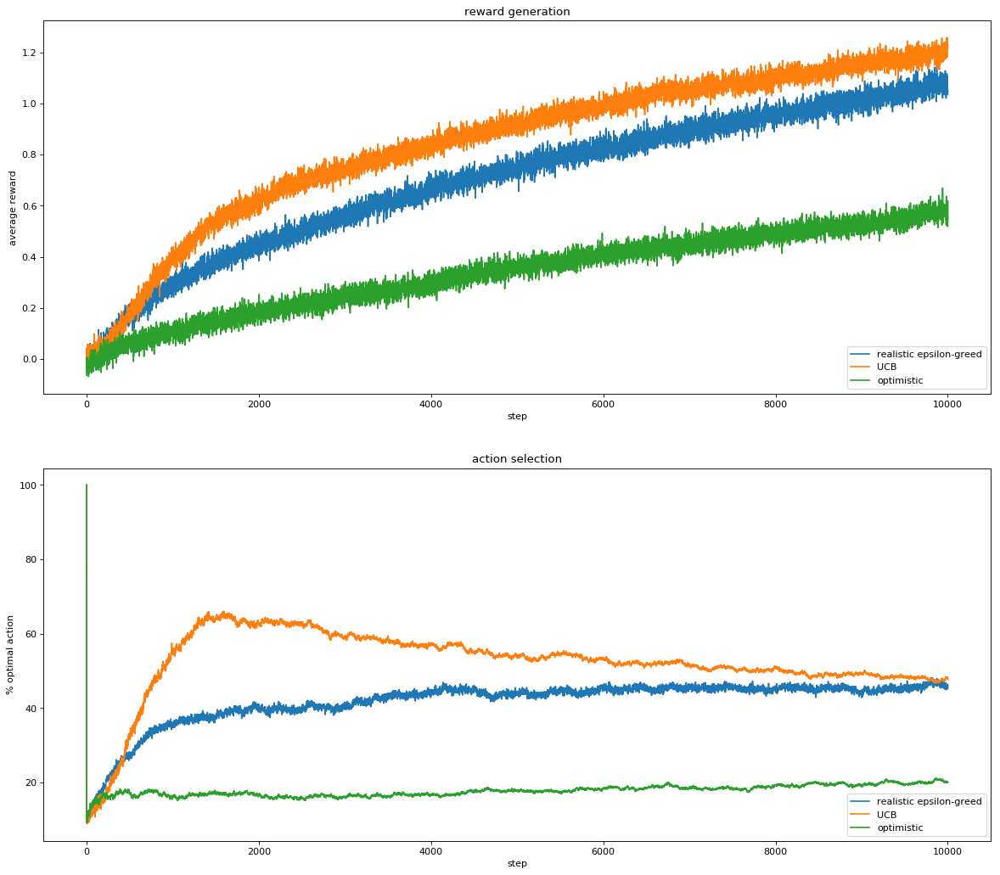

In [5]:
num_steps=10000;num_runs=2000

######################################UCB optimistic epsilon-greedy; non-stationary#Q4

[total_rewards,optimum_actions]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.1,alpha=0,num_bandits=10,stat=0,optimistic=0,UCB=0)
for i in range(num_steps):
    total_rewards[i]/=num_runs;optimum_actions[i]*=(100/num_runs)

[t,o]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.01,alpha=0,num_bandits=10,stat=0,optimistic=0,UCB=2)
for i in range(num_steps):
    t[i]/=num_runs;o[i]*=(100/num_runs)
    
[to,op]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0,alpha=0,num_bandits=10,stat=0,optimistic=1,UCB=0)
for i in range(num_steps):
    to[i]/=num_runs;op[i]*=(100/num_runs)
    
fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')   
plt.subplot(2,1,1)
plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],total_rewards,label='realistic epsilon-greed')

plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],t,label='UCB')

plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],to,label='optimistic')

plt.legend(loc='lower right')



plt.subplot(2,1,2)
plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],optimum_actions,label='realistic epsilon-greed')

plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],o,label='UCB')

plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],op,label='optimistic')

plt.legend(loc='lower right')
plt.show()

INITIALIZING RUN... 1
phi_a's:  [0.30779691191294734, 0.30779691191294734, 0.30779691191294734, 0.30779691191294734, 0.30779691191294734, 0.30779691191294734, 0.30779691191294734, 0.30779691191294734, 0.30779691191294734, 0.30779691191294734]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 2
phi_a's:  [-0.12029958377025064, -0.12029958377025064, -0.12029958377025064, -0.12029958377025064, -0.12029958377025064, -0.12029958377025064, -0.12029958377025064, -0.12029958377025064, -0.12029958377025064, -0.12029958377025064]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 3
phi_a's:  [-1.8074130949642524, -1.8074130949642524, -1.8074130949642524, -1.8074130949642524, -1.8074130949642524, -1.8074130949642524, -1.8074130949642524, -1.8074130949642524, -1.8074130949642524, -1.8074130949642524]
q_a's: 

INITIALIZING RUN... 27
phi_a's:  [1.0426814206607888, 1.0426814206607888, 1.0426814206607888, 1.0426814206607888, 1.0426814206607888, 1.0426814206607888, 1.0426814206607888, 1.0426814206607888, 1.0426814206607888, 1.0426814206607888]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 28
phi_a's:  [1.877162248960461, 1.877162248960461, 1.877162248960461, 1.877162248960461, 1.877162248960461, 1.877162248960461, 1.877162248960461, 1.877162248960461, 1.877162248960461, 1.877162248960461]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 29
phi_a's:  [0.6095739191753429, 0.6095739191753429, 0.6095739191753429, 0.6095739191753429, 0.6095739191753429, 0.6095739191753429, 0.6095739191753429, 0.6095739191753429, 0.6095739191753429, 0.6095739191753429]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 

INITIALIZING RUN... 54
phi_a's:  [0.5129156168337466, 0.5129156168337466, 0.5129156168337466, 0.5129156168337466, 0.5129156168337466, 0.5129156168337466, 0.5129156168337466, 0.5129156168337466, 0.5129156168337466, 0.5129156168337466]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 55
phi_a's:  [-0.20732756298522081, -0.20732756298522081, -0.20732756298522081, -0.20732756298522081, -0.20732756298522081, -0.20732756298522081, -0.20732756298522081, -0.20732756298522081, -0.20732756298522081, -0.20732756298522081]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 56
phi_a's:  [0.12350118731914445, 0.12350118731914445, 0.12350118731914445, 0.12350118731914445, 0.12350118731914445, 0.12350118731914445, 0.12350118731914445, 0.12350118731914445, 0.12350118731914445, 0.12350118731914445]
q_a's:  [0, 0,

INITIALIZING RUN... 78
phi_a's:  [-0.776091206109464, -0.776091206109464, -0.776091206109464, -0.776091206109464, -0.776091206109464, -0.776091206109464, -0.776091206109464, -0.776091206109464, -0.776091206109464, -0.776091206109464]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 79
phi_a's:  [1.0015046506545506, 1.0015046506545506, 1.0015046506545506, 1.0015046506545506, 1.0015046506545506, 1.0015046506545506, 1.0015046506545506, 1.0015046506545506, 1.0015046506545506, 1.0015046506545506]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 80
phi_a's:  [2.0552211166500363, 2.0552211166500363, 2.0552211166500363, 2.0552211166500363, 2.0552211166500363, 2.0552211166500363, 2.0552211166500363, 2.0552211166500363, 2.0552211166500363, 2.0552211166500363]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's

INITIALIZING RUN... 105
phi_a's:  [0.6938619532025007, 0.6938619532025007, 0.6938619532025007, 0.6938619532025007, 0.6938619532025007, 0.6938619532025007, 0.6938619532025007, 0.6938619532025007, 0.6938619532025007, 0.6938619532025007]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 106
phi_a's:  [0.6175800533616567, 0.6175800533616567, 0.6175800533616567, 0.6175800533616567, 0.6175800533616567, 0.6175800533616567, 0.6175800533616567, 0.6175800533616567, 0.6175800533616567, 0.6175800533616567]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 107
phi_a's:  [-0.36924285582690036, -0.36924285582690036, -0.36924285582690036, -0.36924285582690036, -0.36924285582690036, -0.36924285582690036, -0.36924285582690036, -0.36924285582690036, -0.36924285582690036, -0.36924285582690036]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 130
phi_a's:  [0.6562779415909331, 0.6562779415909331, 0.6562779415909331, 0.6562779415909331, 0.6562779415909331, 0.6562779415909331, 0.6562779415909331, 0.6562779415909331, 0.6562779415909331, 0.6562779415909331]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 131
phi_a's:  [-1.1580085197264958, -1.1580085197264958, -1.1580085197264958, -1.1580085197264958, -1.1580085197264958, -1.1580085197264958, -1.1580085197264958, -1.1580085197264958, -1.1580085197264958, -1.1580085197264958]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 132
phi_a's:  [-0.26849577059755003, -0.26849577059755003, -0.26849577059755003, -0.26849577059755003, -0.26849577059755003, -0.26849577059755003, -0.26849577059755003, -0.26849577059755003, -0.26849577059755003, -0.26849577059755003]
q_a's:  [0,

INITIALIZING RUN... 155
phi_a's:  [0.5130620320970442, 0.5130620320970442, 0.5130620320970442, 0.5130620320970442, 0.5130620320970442, 0.5130620320970442, 0.5130620320970442, 0.5130620320970442, 0.5130620320970442, 0.5130620320970442]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 156
phi_a's:  [0.1839246955788524, 0.1839246955788524, 0.1839246955788524, 0.1839246955788524, 0.1839246955788524, 0.1839246955788524, 0.1839246955788524, 0.1839246955788524, 0.1839246955788524, 0.1839246955788524]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 157
phi_a's:  [0.0476786869385659, 0.0476786869385659, 0.0476786869385659, 0.0476786869385659, 0.0476786869385659, 0.0476786869385659, 0.0476786869385659, 0.0476786869385659, 0.0476786869385659, 0.0476786869385659]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 178
phi_a's:  [0.17035530347058675, 0.17035530347058675, 0.17035530347058675, 0.17035530347058675, 0.17035530347058675, 0.17035530347058675, 0.17035530347058675, 0.17035530347058675, 0.17035530347058675, 0.17035530347058675]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 179
phi_a's:  [-0.6732710806511794, -0.6732710806511794, -0.6732710806511794, -0.6732710806511794, -0.6732710806511794, -0.6732710806511794, -0.6732710806511794, -0.6732710806511794, -0.6732710806511794, -0.6732710806511794]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 180
phi_a's:  [0.8965918044765675, 0.8965918044765675, 0.8965918044765675, 0.8965918044765675, 0.8965918044765675, 0.8965918044765675, 0.8965918044765675, 0.8965918044765675, 0.8965918044765675, 0.8965918044765675]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 203
phi_a's:  [1.2599380521250196, 1.2599380521250196, 1.2599380521250196, 1.2599380521250196, 1.2599380521250196, 1.2599380521250196, 1.2599380521250196, 1.2599380521250196, 1.2599380521250196, 1.2599380521250196]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 204
phi_a's:  [1.7112077591644634, 1.7112077591644634, 1.7112077591644634, 1.7112077591644634, 1.7112077591644634, 1.7112077591644634, 1.7112077591644634, 1.7112077591644634, 1.7112077591644634, 1.7112077591644634]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 205
phi_a's:  [0.535805411736246, 0.535805411736246, 0.535805411736246, 0.535805411736246, 0.535805411736246, 0.535805411736246, 0.535805411736246, 0.535805411736246, 0.535805411736246, 0.535805411736246]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 

INITIALIZING RUN... 228
phi_a's:  [1.561350959585272, 1.561350959585272, 1.561350959585272, 1.561350959585272, 1.561350959585272, 1.561350959585272, 1.561350959585272, 1.561350959585272, 1.561350959585272, 1.561350959585272]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 229
phi_a's:  [1.0792460681618972, 1.0792460681618972, 1.0792460681618972, 1.0792460681618972, 1.0792460681618972, 1.0792460681618972, 1.0792460681618972, 1.0792460681618972, 1.0792460681618972, 1.0792460681618972]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 230
phi_a's:  [0.8546849195732268, 0.8546849195732268, 0.8546849195732268, 0.8546849195732268, 0.8546849195732268, 0.8546849195732268, 0.8546849195732268, 0.8546849195732268, 0.8546849195732268, 0.8546849195732268]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 

INITIALIZING RUN... 253
phi_a's:  [0.14336963221420537, 0.14336963221420537, 0.14336963221420537, 0.14336963221420537, 0.14336963221420537, 0.14336963221420537, 0.14336963221420537, 0.14336963221420537, 0.14336963221420537, 0.14336963221420537]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 254
phi_a's:  [-1.6401723760286087, -1.6401723760286087, -1.6401723760286087, -1.6401723760286087, -1.6401723760286087, -1.6401723760286087, -1.6401723760286087, -1.6401723760286087, -1.6401723760286087, -1.6401723760286087]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 255
phi_a's:  [-0.15961061484262656, -0.15961061484262656, -0.15961061484262656, -0.15961061484262656, -0.15961061484262656, -0.15961061484262656, -0.15961061484262656, -0.15961061484262656, -0.15961061484262656, -0.15961061484262656]
q

INITIALIZING RUN... 278
phi_a's:  [1.0920130581524732, 1.0920130581524732, 1.0920130581524732, 1.0920130581524732, 1.0920130581524732, 1.0920130581524732, 1.0920130581524732, 1.0920130581524732, 1.0920130581524732, 1.0920130581524732]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 279
phi_a's:  [-0.3210959717316304, -0.3210959717316304, -0.3210959717316304, -0.3210959717316304, -0.3210959717316304, -0.3210959717316304, -0.3210959717316304, -0.3210959717316304, -0.3210959717316304, -0.3210959717316304]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 280
phi_a's:  [0.772439289629613, 0.772439289629613, 0.772439289629613, 0.772439289629613, 0.772439289629613, 0.772439289629613, 0.772439289629613, 0.772439289629613, 0.772439289629613, 0.772439289629613]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 302
phi_a's:  [-0.8222684620903926, -0.8222684620903926, -0.8222684620903926, -0.8222684620903926, -0.8222684620903926, -0.8222684620903926, -0.8222684620903926, -0.8222684620903926, -0.8222684620903926, -0.8222684620903926]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 303
phi_a's:  [-0.4461602931823477, -0.4461602931823477, -0.4461602931823477, -0.4461602931823477, -0.4461602931823477, -0.4461602931823477, -0.4461602931823477, -0.4461602931823477, -0.4461602931823477, -0.4461602931823477]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 304
phi_a's:  [0.46532774805853655, 0.46532774805853655, 0.46532774805853655, 0.46532774805853655, 0.46532774805853655, 0.46532774805853655, 0.46532774805853655, 0.46532774805853655, 0.46532774805853655, 0.46532774805853655]
q_a's:  [0,

INITIALIZING RUN... 327
phi_a's:  [-1.304532003146078, -1.304532003146078, -1.304532003146078, -1.304532003146078, -1.304532003146078, -1.304532003146078, -1.304532003146078, -1.304532003146078, -1.304532003146078, -1.304532003146078]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 328
phi_a's:  [0.2743002038744188, 0.2743002038744188, 0.2743002038744188, 0.2743002038744188, 0.2743002038744188, 0.2743002038744188, 0.2743002038744188, 0.2743002038744188, 0.2743002038744188, 0.2743002038744188]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 329
phi_a's:  [-1.0218312442775137, -1.0218312442775137, -1.0218312442775137, -1.0218312442775137, -1.0218312442775137, -1.0218312442775137, -1.0218312442775137, -1.0218312442775137, -1.0218312442775137, -1.0218312442775137]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 353
phi_a's:  [-0.18134049473819194, -0.18134049473819194, -0.18134049473819194, -0.18134049473819194, -0.18134049473819194, -0.18134049473819194, -0.18134049473819194, -0.18134049473819194, -0.18134049473819194, -0.18134049473819194]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 354
phi_a's:  [0.4015336640558465, 0.4015336640558465, 0.4015336640558465, 0.4015336640558465, 0.4015336640558465, 0.4015336640558465, 0.4015336640558465, 0.4015336640558465, 0.4015336640558465, 0.4015336640558465]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 355
phi_a's:  [0.37339333300806404, 0.37339333300806404, 0.37339333300806404, 0.37339333300806404, 0.37339333300806404, 0.37339333300806404, 0.37339333300806404, 0.37339333300806404, 0.37339333300806404, 0.37339333300806404]
q_a's:  [0,

INITIALIZING RUN... 377
phi_a's:  [0.9781521139887257, 0.9781521139887257, 0.9781521139887257, 0.9781521139887257, 0.9781521139887257, 0.9781521139887257, 0.9781521139887257, 0.9781521139887257, 0.9781521139887257, 0.9781521139887257]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 378
phi_a's:  [0.36509858921032484, 0.36509858921032484, 0.36509858921032484, 0.36509858921032484, 0.36509858921032484, 0.36509858921032484, 0.36509858921032484, 0.36509858921032484, 0.36509858921032484, 0.36509858921032484]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 379
phi_a's:  [-1.0912599560652934, -1.0912599560652934, -1.0912599560652934, -1.0912599560652934, -1.0912599560652934, -1.0912599560652934, -1.0912599560652934, -1.0912599560652934, -1.0912599560652934, -1.0912599560652934]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 405
phi_a's:  [-0.26922010738860486, -0.26922010738860486, -0.26922010738860486, -0.26922010738860486, -0.26922010738860486, -0.26922010738860486, -0.26922010738860486, -0.26922010738860486, -0.26922010738860486, -0.26922010738860486]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 406
phi_a's:  [0.974701057503289, 0.974701057503289, 0.974701057503289, 0.974701057503289, 0.974701057503289, 0.974701057503289, 0.974701057503289, 0.974701057503289, 0.974701057503289, 0.974701057503289]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 407
phi_a's:  [1.5121584659047376, 1.5121584659047376, 1.5121584659047376, 1.5121584659047376, 1.5121584659047376, 1.5121584659047376, 1.5121584659047376, 1.5121584659047376, 1.5121584659047376, 1.5121584659047376]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 429
phi_a's:  [0.3258745357134463, 0.3258745357134463, 0.3258745357134463, 0.3258745357134463, 0.3258745357134463, 0.3258745357134463, 0.3258745357134463, 0.3258745357134463, 0.3258745357134463, 0.3258745357134463]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 430
phi_a's:  [-0.7847417282885802, -0.7847417282885802, -0.7847417282885802, -0.7847417282885802, -0.7847417282885802, -0.7847417282885802, -0.7847417282885802, -0.7847417282885802, -0.7847417282885802, -0.7847417282885802]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 431
phi_a's:  [-1.3171933133663196, -1.3171933133663196, -1.3171933133663196, -1.3171933133663196, -1.3171933133663196, -1.3171933133663196, -1.3171933133663196, -1.3171933133663196, -1.3171933133663196, -1.3171933133663196]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 457
phi_a's:  [-0.09943029630735788, -0.09943029630735788, -0.09943029630735788, -0.09943029630735788, -0.09943029630735788, -0.09943029630735788, -0.09943029630735788, -0.09943029630735788, -0.09943029630735788, -0.09943029630735788]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 458
phi_a's:  [-0.5576218455904479, -0.5576218455904479, -0.5576218455904479, -0.5576218455904479, -0.5576218455904479, -0.5576218455904479, -0.5576218455904479, -0.5576218455904479, -0.5576218455904479, -0.5576218455904479]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 459
phi_a's:  [-1.2638990354447042, -1.2638990354447042, -1.2638990354447042, -1.2638990354447042, -1.2638990354447042, -1.2638990354447042, -1.2638990354447042, -1.2638990354447042, -1.2638990354447042, -1.2638990354447042]
q

INITIALIZING RUN... 480
phi_a's:  [-0.6780332348936792, -0.6780332348936792, -0.6780332348936792, -0.6780332348936792, -0.6780332348936792, -0.6780332348936792, -0.6780332348936792, -0.6780332348936792, -0.6780332348936792, -0.6780332348936792]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 481
phi_a's:  [-0.8327698664371431, -0.8327698664371431, -0.8327698664371431, -0.8327698664371431, -0.8327698664371431, -0.8327698664371431, -0.8327698664371431, -0.8327698664371431, -0.8327698664371431, -0.8327698664371431]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 482
phi_a's:  [-0.22645040222629637, -0.22645040222629637, -0.22645040222629637, -0.22645040222629637, -0.22645040222629637, -0.22645040222629637, -0.22645040222629637, -0.22645040222629637, -0.22645040222629637, -0.22645040222629637]
q

INITIALIZING RUN... 503
phi_a's:  [-1.58755488308141, -1.58755488308141, -1.58755488308141, -1.58755488308141, -1.58755488308141, -1.58755488308141, -1.58755488308141, -1.58755488308141, -1.58755488308141, -1.58755488308141]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 504
phi_a's:  [-1.1628812999362261, -1.1628812999362261, -1.1628812999362261, -1.1628812999362261, -1.1628812999362261, -1.1628812999362261, -1.1628812999362261, -1.1628812999362261, -1.1628812999362261, -1.1628812999362261]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 505
phi_a's:  [-1.9855184553465732, -1.9855184553465732, -1.9855184553465732, -1.9855184553465732, -1.9855184553465732, -1.9855184553465732, -1.9855184553465732, -1.9855184553465732, -1.9855184553465732, -1.9855184553465732]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 527
phi_a's:  [-0.49114039525424963, -0.49114039525424963, -0.49114039525424963, -0.49114039525424963, -0.49114039525424963, -0.49114039525424963, -0.49114039525424963, -0.49114039525424963, -0.49114039525424963, -0.49114039525424963]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 528
phi_a's:  [-0.07083619674060784, -0.07083619674060784, -0.07083619674060784, -0.07083619674060784, -0.07083619674060784, -0.07083619674060784, -0.07083619674060784, -0.07083619674060784, -0.07083619674060784, -0.07083619674060784]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 529
phi_a's:  [1.7368786346205267, 1.7368786346205267, 1.7368786346205267, 1.7368786346205267, 1.7368786346205267, 1.7368786346205267, 1.7368786346205267, 1.7368786346205267, 1.7368786346205267, 1.7368786346205267]
q

INITIALIZING RUN... 553
phi_a's:  [-0.02767848275724076, -0.02767848275724076, -0.02767848275724076, -0.02767848275724076, -0.02767848275724076, -0.02767848275724076, -0.02767848275724076, -0.02767848275724076, -0.02767848275724076, -0.02767848275724076]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 554
phi_a's:  [-0.7262746418314274, -0.7262746418314274, -0.7262746418314274, -0.7262746418314274, -0.7262746418314274, -0.7262746418314274, -0.7262746418314274, -0.7262746418314274, -0.7262746418314274, -0.7262746418314274]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 555
phi_a's:  [0.7101365392511039, 0.7101365392511039, 0.7101365392511039, 0.7101365392511039, 0.7101365392511039, 0.7101365392511039, 0.7101365392511039, 0.7101365392511039, 0.7101365392511039, 0.7101365392511039]
q_a's:  [0,

INITIALIZING RUN... 576
phi_a's:  [-0.8489554421342907, -0.8489554421342907, -0.8489554421342907, -0.8489554421342907, -0.8489554421342907, -0.8489554421342907, -0.8489554421342907, -0.8489554421342907, -0.8489554421342907, -0.8489554421342907]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 577
phi_a's:  [-0.2924419797459595, -0.2924419797459595, -0.2924419797459595, -0.2924419797459595, -0.2924419797459595, -0.2924419797459595, -0.2924419797459595, -0.2924419797459595, -0.2924419797459595, -0.2924419797459595]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 578
phi_a's:  [-0.0846055446101037, -0.0846055446101037, -0.0846055446101037, -0.0846055446101037, -0.0846055446101037, -0.0846055446101037, -0.0846055446101037, -0.0846055446101037, -0.0846055446101037, -0.0846055446101037]
q_a's:  [0,

INITIALIZING RUN... 600
phi_a's:  [-2.2931677798548775, -2.2931677798548775, -2.2931677798548775, -2.2931677798548775, -2.2931677798548775, -2.2931677798548775, -2.2931677798548775, -2.2931677798548775, -2.2931677798548775, -2.2931677798548775]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 601
phi_a's:  [1.2563217014123478, 1.2563217014123478, 1.2563217014123478, 1.2563217014123478, 1.2563217014123478, 1.2563217014123478, 1.2563217014123478, 1.2563217014123478, 1.2563217014123478, 1.2563217014123478]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 602
phi_a's:  [2.575347827726451, 2.575347827726451, 2.575347827726451, 2.575347827726451, 2.575347827726451, 2.575347827726451, 2.575347827726451, 2.575347827726451, 2.575347827726451, 2.575347827726451]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 627
phi_a's:  [0.013302691050512672, 0.013302691050512672, 0.013302691050512672, 0.013302691050512672, 0.013302691050512672, 0.013302691050512672, 0.013302691050512672, 0.013302691050512672, 0.013302691050512672, 0.013302691050512672]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 628
phi_a's:  [0.6844400320946341, 0.6844400320946341, 0.6844400320946341, 0.6844400320946341, 0.6844400320946341, 0.6844400320946341, 0.6844400320946341, 0.6844400320946341, 0.6844400320946341, 0.6844400320946341]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 629
phi_a's:  [0.5288549330482142, 0.5288549330482142, 0.5288549330482142, 0.5288549330482142, 0.5288549330482142, 0.5288549330482142, 0.5288549330482142, 0.5288549330482142, 0.5288549330482142, 0.5288549330482142]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 650
phi_a's:  [-1.5938626305480479, -1.5938626305480479, -1.5938626305480479, -1.5938626305480479, -1.5938626305480479, -1.5938626305480479, -1.5938626305480479, -1.5938626305480479, -1.5938626305480479, -1.5938626305480479]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 651
phi_a's:  [-0.8416345961655467, -0.8416345961655467, -0.8416345961655467, -0.8416345961655467, -0.8416345961655467, -0.8416345961655467, -0.8416345961655467, -0.8416345961655467, -0.8416345961655467, -0.8416345961655467]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 652
phi_a's:  [1.1000756468060497, 1.1000756468060497, 1.1000756468060497, 1.1000756468060497, 1.1000756468060497, 1.1000756468060497, 1.1000756468060497, 1.1000756468060497, 1.1000756468060497, 1.1000756468060497]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 674
phi_a's:  [-0.6385457182788231, -0.6385457182788231, -0.6385457182788231, -0.6385457182788231, -0.6385457182788231, -0.6385457182788231, -0.6385457182788231, -0.6385457182788231, -0.6385457182788231, -0.6385457182788231]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 675
phi_a's:  [0.5134501418789792, 0.5134501418789792, 0.5134501418789792, 0.5134501418789792, 0.5134501418789792, 0.5134501418789792, 0.5134501418789792, 0.5134501418789792, 0.5134501418789792, 0.5134501418789792]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 676
phi_a's:  [-0.3953908513247178, -0.3953908513247178, -0.3953908513247178, -0.3953908513247178, -0.3953908513247178, -0.3953908513247178, -0.3953908513247178, -0.3953908513247178, -0.3953908513247178, -0.3953908513247178]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 697
phi_a's:  [1.0979914905693802, 1.0979914905693802, 1.0979914905693802, 1.0979914905693802, 1.0979914905693802, 1.0979914905693802, 1.0979914905693802, 1.0979914905693802, 1.0979914905693802, 1.0979914905693802]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 698
phi_a's:  [-0.06570893087393478, -0.06570893087393478, -0.06570893087393478, -0.06570893087393478, -0.06570893087393478, -0.06570893087393478, -0.06570893087393478, -0.06570893087393478, -0.06570893087393478, -0.06570893087393478]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 699
phi_a's:  [-1.4277428193261315, -1.4277428193261315, -1.4277428193261315, -1.4277428193261315, -1.4277428193261315, -1.4277428193261315, -1.4277428193261315, -1.4277428193261315, -1.4277428193261315, -1.4277428193261315]
q_a's:  [0,

INITIALIZING RUN... 720
phi_a's:  [-1.1297369836911877, -1.1297369836911877, -1.1297369836911877, -1.1297369836911877, -1.1297369836911877, -1.1297369836911877, -1.1297369836911877, -1.1297369836911877, -1.1297369836911877, -1.1297369836911877]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 721
phi_a's:  [-0.18860413558026873, -0.18860413558026873, -0.18860413558026873, -0.18860413558026873, -0.18860413558026873, -0.18860413558026873, -0.18860413558026873, -0.18860413558026873, -0.18860413558026873, -0.18860413558026873]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 722
phi_a's:  [-0.6724031843504507, -0.6724031843504507, -0.6724031843504507, -0.6724031843504507, -0.6724031843504507, -0.6724031843504507, -0.6724031843504507, -0.6724031843504507, -0.6724031843504507, -0.6724031843504507]
q

INITIALIZING RUN... 743
phi_a's:  [0.3163125534214096, 0.3163125534214096, 0.3163125534214096, 0.3163125534214096, 0.3163125534214096, 0.3163125534214096, 0.3163125534214096, 0.3163125534214096, 0.3163125534214096, 0.3163125534214096]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 744
phi_a's:  [-0.9749999657396687, -0.9749999657396687, -0.9749999657396687, -0.9749999657396687, -0.9749999657396687, -0.9749999657396687, -0.9749999657396687, -0.9749999657396687, -0.9749999657396687, -0.9749999657396687]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 745
phi_a's:  [0.7966520464398902, 0.7966520464398902, 0.7966520464398902, 0.7966520464398902, 0.7966520464398902, 0.7966520464398902, 0.7966520464398902, 0.7966520464398902, 0.7966520464398902, 0.7966520464398902]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 767
phi_a's:  [2.666552914834572, 2.666552914834572, 2.666552914834572, 2.666552914834572, 2.666552914834572, 2.666552914834572, 2.666552914834572, 2.666552914834572, 2.666552914834572, 2.666552914834572]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 768
phi_a's:  [0.09990292050983525, 0.09990292050983525, 0.09990292050983525, 0.09990292050983525, 0.09990292050983525, 0.09990292050983525, 0.09990292050983525, 0.09990292050983525, 0.09990292050983525, 0.09990292050983525]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 769
phi_a's:  [0.954850710815863, 0.954850710815863, 0.954850710815863, 0.954850710815863, 0.954850710815863, 0.954850710815863, 0.954850710815863, 0.954850710815863, 0.954850710815863, 0.954850710815863]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 

INITIALIZING RUN... 790
phi_a's:  [1.3153197698636367, 1.3153197698636367, 1.3153197698636367, 1.3153197698636367, 1.3153197698636367, 1.3153197698636367, 1.3153197698636367, 1.3153197698636367, 1.3153197698636367, 1.3153197698636367]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 791
phi_a's:  [0.5932535175753618, 0.5932535175753618, 0.5932535175753618, 0.5932535175753618, 0.5932535175753618, 0.5932535175753618, 0.5932535175753618, 0.5932535175753618, 0.5932535175753618, 0.5932535175753618]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 792
phi_a's:  [-0.676923634263199, -0.676923634263199, -0.676923634263199, -0.676923634263199, -0.676923634263199, -0.676923634263199, -0.676923634263199, -0.676923634263199, -0.676923634263199, -0.676923634263199]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 814
phi_a's:  [-0.06111919275138598, -0.06111919275138598, -0.06111919275138598, -0.06111919275138598, -0.06111919275138598, -0.06111919275138598, -0.06111919275138598, -0.06111919275138598, -0.06111919275138598, -0.06111919275138598]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 815
phi_a's:  [-0.42180123699010236, -0.42180123699010236, -0.42180123699010236, -0.42180123699010236, -0.42180123699010236, -0.42180123699010236, -0.42180123699010236, -0.42180123699010236, -0.42180123699010236, -0.42180123699010236]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 816
phi_a's:  [1.644022277066597, 1.644022277066597, 1.644022277066597, 1.644022277066597, 1.644022277066597, 1.644022277066597, 1.644022277066597, 1.644022277066597, 1.644022277066597, 1.644022277066597]
q_a's:  [0,

INITIALIZING RUN... 840
phi_a's:  [-1.5206645113138118, -1.5206645113138118, -1.5206645113138118, -1.5206645113138118, -1.5206645113138118, -1.5206645113138118, -1.5206645113138118, -1.5206645113138118, -1.5206645113138118, -1.5206645113138118]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 841
phi_a's:  [1.0250451853044416, 1.0250451853044416, 1.0250451853044416, 1.0250451853044416, 1.0250451853044416, 1.0250451853044416, 1.0250451853044416, 1.0250451853044416, 1.0250451853044416, 1.0250451853044416]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 842
phi_a's:  [0.9908582720543991, 0.9908582720543991, 0.9908582720543991, 0.9908582720543991, 0.9908582720543991, 0.9908582720543991, 0.9908582720543991, 0.9908582720543991, 0.9908582720543991, 0.9908582720543991]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 864
phi_a's:  [-0.5840509243861538, -0.5840509243861538, -0.5840509243861538, -0.5840509243861538, -0.5840509243861538, -0.5840509243861538, -0.5840509243861538, -0.5840509243861538, -0.5840509243861538, -0.5840509243861538]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 865
phi_a's:  [0.5794931274860061, 0.5794931274860061, 0.5794931274860061, 0.5794931274860061, 0.5794931274860061, 0.5794931274860061, 0.5794931274860061, 0.5794931274860061, 0.5794931274860061, 0.5794931274860061]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 866
phi_a's:  [-0.15467973280843286, -0.15467973280843286, -0.15467973280843286, -0.15467973280843286, -0.15467973280843286, -0.15467973280843286, -0.15467973280843286, -0.15467973280843286, -0.15467973280843286, -0.15467973280843286]
q_a's:  [0,

INITIALIZING RUN... 888
phi_a's:  [-0.8892534459696843, -0.8892534459696843, -0.8892534459696843, -0.8892534459696843, -0.8892534459696843, -0.8892534459696843, -0.8892534459696843, -0.8892534459696843, -0.8892534459696843, -0.8892534459696843]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 889
phi_a's:  [-0.8482730180371849, -0.8482730180371849, -0.8482730180371849, -0.8482730180371849, -0.8482730180371849, -0.8482730180371849, -0.8482730180371849, -0.8482730180371849, -0.8482730180371849, -0.8482730180371849]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 890
phi_a's:  [0.14313896485419442, 0.14313896485419442, 0.14313896485419442, 0.14313896485419442, 0.14313896485419442, 0.14313896485419442, 0.14313896485419442, 0.14313896485419442, 0.14313896485419442, 0.14313896485419442]
q_a's:  [0,

INITIALIZING RUN... 912
phi_a's:  [-0.3479194933037343, -0.3479194933037343, -0.3479194933037343, -0.3479194933037343, -0.3479194933037343, -0.3479194933037343, -0.3479194933037343, -0.3479194933037343, -0.3479194933037343, -0.3479194933037343]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 913
phi_a's:  [-0.2794290356440043, -0.2794290356440043, -0.2794290356440043, -0.2794290356440043, -0.2794290356440043, -0.2794290356440043, -0.2794290356440043, -0.2794290356440043, -0.2794290356440043, -0.2794290356440043]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 914
phi_a's:  [-0.5275974249614829, -0.5275974249614829, -0.5275974249614829, -0.5275974249614829, -0.5275974249614829, -0.5275974249614829, -0.5275974249614829, -0.5275974249614829, -0.5275974249614829, -0.5275974249614829]
q_a's:  [0,

INITIALIZING RUN... 937
phi_a's:  [0.2211960347161841, 0.2211960347161841, 0.2211960347161841, 0.2211960347161841, 0.2211960347161841, 0.2211960347161841, 0.2211960347161841, 0.2211960347161841, 0.2211960347161841, 0.2211960347161841]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 938
phi_a's:  [-1.618000009638577, -1.618000009638577, -1.618000009638577, -1.618000009638577, -1.618000009638577, -1.618000009638577, -1.618000009638577, -1.618000009638577, -1.618000009638577, -1.618000009638577]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 939
phi_a's:  [1.4395126738069954, 1.4395126738069954, 1.4395126738069954, 1.4395126738069954, 1.4395126738069954, 1.4395126738069954, 1.4395126738069954, 1.4395126738069954, 1.4395126738069954, 1.4395126738069954]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 960
phi_a's:  [-1.797382501067368, -1.797382501067368, -1.797382501067368, -1.797382501067368, -1.797382501067368, -1.797382501067368, -1.797382501067368, -1.797382501067368, -1.797382501067368, -1.797382501067368]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 961
phi_a's:  [0.7522225139227006, 0.7522225139227006, 0.7522225139227006, 0.7522225139227006, 0.7522225139227006, 0.7522225139227006, 0.7522225139227006, 0.7522225139227006, 0.7522225139227006, 0.7522225139227006]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 962
phi_a's:  [0.3740427835592994, 0.3740427835592994, 0.3740427835592994, 0.3740427835592994, 0.3740427835592994, 0.3740427835592994, 0.3740427835592994, 0.3740427835592994, 0.3740427835592994, 0.3740427835592994]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_

INITIALIZING RUN... 985
phi_a's:  [0.1604124181663325, 0.1604124181663325, 0.1604124181663325, 0.1604124181663325, 0.1604124181663325, 0.1604124181663325, 0.1604124181663325, 0.1604124181663325, 0.1604124181663325, 0.1604124181663325]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 986
phi_a's:  [-0.5103649804533819, -0.5103649804533819, -0.5103649804533819, -0.5103649804533819, -0.5103649804533819, -0.5103649804533819, -0.5103649804533819, -0.5103649804533819, -0.5103649804533819, -0.5103649804533819]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 987
phi_a's:  [-1.1595131336123115, -1.1595131336123115, -1.1595131336123115, -1.1595131336123115, -1.1595131336123115, -1.1595131336123115, -1.1595131336123115, -1.1595131336123115, -1.1595131336123115, -1.1595131336123115]
q_a's:  [0, 0, 0, 0, 

INITIALIZING RUN... 1012
phi_a's:  [0.36167092235863885, 0.36167092235863885, 0.36167092235863885, 0.36167092235863885, 0.36167092235863885, 0.36167092235863885, 0.36167092235863885, 0.36167092235863885, 0.36167092235863885, 0.36167092235863885]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1013
phi_a's:  [1.5105648755623944, 1.5105648755623944, 1.5105648755623944, 1.5105648755623944, 1.5105648755623944, 1.5105648755623944, 1.5105648755623944, 1.5105648755623944, 1.5105648755623944, 1.5105648755623944]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1014
phi_a's:  [-0.46248232444630255, -0.46248232444630255, -0.46248232444630255, -0.46248232444630255, -0.46248232444630255, -0.46248232444630255, -0.46248232444630255, -0.46248232444630255, -0.46248232444630255, -0.46248232444630255]
q_a's:  

INITIALIZING RUN... 1040
phi_a's:  [1.9449789500671246, 1.9449789500671246, 1.9449789500671246, 1.9449789500671246, 1.9449789500671246, 1.9449789500671246, 1.9449789500671246, 1.9449789500671246, 1.9449789500671246, 1.9449789500671246]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1041
phi_a's:  [0.6243067127480906, 0.6243067127480906, 0.6243067127480906, 0.6243067127480906, 0.6243067127480906, 0.6243067127480906, 0.6243067127480906, 0.6243067127480906, 0.6243067127480906, 0.6243067127480906]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1042
phi_a's:  [-0.2392110263603534, -0.2392110263603534, -0.2392110263603534, -0.2392110263603534, -0.2392110263603534, -0.2392110263603534, -0.2392110263603534, -0.2392110263603534, -0.2392110263603534, -0.2392110263603534]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1063
phi_a's:  [-0.6672394518427796, -0.6672394518427796, -0.6672394518427796, -0.6672394518427796, -0.6672394518427796, -0.6672394518427796, -0.6672394518427796, -0.6672394518427796, -0.6672394518427796, -0.6672394518427796]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1064
phi_a's:  [-0.5979165155801762, -0.5979165155801762, -0.5979165155801762, -0.5979165155801762, -0.5979165155801762, -0.5979165155801762, -0.5979165155801762, -0.5979165155801762, -0.5979165155801762, -0.5979165155801762]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1065
phi_a's:  [-0.6983232541409207, -0.6983232541409207, -0.6983232541409207, -0.6983232541409207, -0.6983232541409207, -0.6983232541409207, -0.6983232541409207, -0.6983232541409207, -0.6983232541409207, -0.6983232541409207]
q_a's:  

INITIALIZING RUN... 1086
phi_a's:  [-0.18131836631380419, -0.18131836631380419, -0.18131836631380419, -0.18131836631380419, -0.18131836631380419, -0.18131836631380419, -0.18131836631380419, -0.18131836631380419, -0.18131836631380419, -0.18131836631380419]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1087
phi_a's:  [-0.05583795616162657, -0.05583795616162657, -0.05583795616162657, -0.05583795616162657, -0.05583795616162657, -0.05583795616162657, -0.05583795616162657, -0.05583795616162657, -0.05583795616162657, -0.05583795616162657]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1088
phi_a's:  [-1.4674946590573743, -1.4674946590573743, -1.4674946590573743, -1.4674946590573743, -1.4674946590573743, -1.4674946590573743, -1.4674946590573743, -1.4674946590573743, -1.4674946590573743, -1.467494

INITIALIZING RUN... 1109
phi_a's:  [1.325748301404977, 1.325748301404977, 1.325748301404977, 1.325748301404977, 1.325748301404977, 1.325748301404977, 1.325748301404977, 1.325748301404977, 1.325748301404977, 1.325748301404977]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1110
phi_a's:  [-0.5400437662635844, -0.5400437662635844, -0.5400437662635844, -0.5400437662635844, -0.5400437662635844, -0.5400437662635844, -0.5400437662635844, -0.5400437662635844, -0.5400437662635844, -0.5400437662635844]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1111
phi_a's:  [-0.2839645217855135, -0.2839645217855135, -0.2839645217855135, -0.2839645217855135, -0.2839645217855135, -0.2839645217855135, -0.2839645217855135, -0.2839645217855135, -0.2839645217855135, -0.2839645217855135]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1132
phi_a's:  [1.2625699636851866, 1.2625699636851866, 1.2625699636851866, 1.2625699636851866, 1.2625699636851866, 1.2625699636851866, 1.2625699636851866, 1.2625699636851866, 1.2625699636851866, 1.2625699636851866]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1133
phi_a's:  [-0.8345813674617114, -0.8345813674617114, -0.8345813674617114, -0.8345813674617114, -0.8345813674617114, -0.8345813674617114, -0.8345813674617114, -0.8345813674617114, -0.8345813674617114, -0.8345813674617114]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1134
phi_a's:  [-0.10537063252175122, -0.10537063252175122, -0.10537063252175122, -0.10537063252175122, -0.10537063252175122, -0.10537063252175122, -0.10537063252175122, -0.10537063252175122, -0.10537063252175122, -0.10537063252175122]
q_a's:  

INITIALIZING RUN... 1156
phi_a's:  [0.24204306052577396, 0.24204306052577396, 0.24204306052577396, 0.24204306052577396, 0.24204306052577396, 0.24204306052577396, 0.24204306052577396, 0.24204306052577396, 0.24204306052577396, 0.24204306052577396]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1157
phi_a's:  [-0.20147674801739815, -0.20147674801739815, -0.20147674801739815, -0.20147674801739815, -0.20147674801739815, -0.20147674801739815, -0.20147674801739815, -0.20147674801739815, -0.20147674801739815, -0.20147674801739815]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1158
phi_a's:  [-0.928342365541471, -0.928342365541471, -0.928342365541471, -0.928342365541471, -0.928342365541471, -0.928342365541471, -0.928342365541471, -0.928342365541471, -0.928342365541471, -0.928342365541471]
q_a's:  

INITIALIZING RUN... 1183
phi_a's:  [-0.3857012694095425, -0.3857012694095425, -0.3857012694095425, -0.3857012694095425, -0.3857012694095425, -0.3857012694095425, -0.3857012694095425, -0.3857012694095425, -0.3857012694095425, -0.3857012694095425]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1184
phi_a's:  [1.9220503958506303, 1.9220503958506303, 1.9220503958506303, 1.9220503958506303, 1.9220503958506303, 1.9220503958506303, 1.9220503958506303, 1.9220503958506303, 1.9220503958506303, 1.9220503958506303]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1185
phi_a's:  [-0.19894488179990333, -0.19894488179990333, -0.19894488179990333, -0.19894488179990333, -0.19894488179990333, -0.19894488179990333, -0.19894488179990333, -0.19894488179990333, -0.19894488179990333, -0.19894488179990333]
q_a's:  

INITIALIZING RUN... 1210
phi_a's:  [-0.9473639001019654, -0.9473639001019654, -0.9473639001019654, -0.9473639001019654, -0.9473639001019654, -0.9473639001019654, -0.9473639001019654, -0.9473639001019654, -0.9473639001019654, -0.9473639001019654]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1211
phi_a's:  [0.4286496039373645, 0.4286496039373645, 0.4286496039373645, 0.4286496039373645, 0.4286496039373645, 0.4286496039373645, 0.4286496039373645, 0.4286496039373645, 0.4286496039373645, 0.4286496039373645]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1212
phi_a's:  [0.01891748094798023, 0.01891748094798023, 0.01891748094798023, 0.01891748094798023, 0.01891748094798023, 0.01891748094798023, 0.01891748094798023, 0.01891748094798023, 0.01891748094798023, 0.01891748094798023]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1237
phi_a's:  [0.1496163848498177, 0.1496163848498177, 0.1496163848498177, 0.1496163848498177, 0.1496163848498177, 0.1496163848498177, 0.1496163848498177, 0.1496163848498177, 0.1496163848498177, 0.1496163848498177]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1238
phi_a's:  [1.0425321251601287, 1.0425321251601287, 1.0425321251601287, 1.0425321251601287, 1.0425321251601287, 1.0425321251601287, 1.0425321251601287, 1.0425321251601287, 1.0425321251601287, 1.0425321251601287]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1239
phi_a's:  [-0.31709977143277207, -0.31709977143277207, -0.31709977143277207, -0.31709977143277207, -0.31709977143277207, -0.31709977143277207, -0.31709977143277207, -0.31709977143277207, -0.31709977143277207, -0.31709977143277207]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1260
phi_a's:  [0.5574495188718512, 0.5574495188718512, 0.5574495188718512, 0.5574495188718512, 0.5574495188718512, 0.5574495188718512, 0.5574495188718512, 0.5574495188718512, 0.5574495188718512, 0.5574495188718512]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1261
phi_a's:  [-1.5479288718583042, -1.5479288718583042, -1.5479288718583042, -1.5479288718583042, -1.5479288718583042, -1.5479288718583042, -1.5479288718583042, -1.5479288718583042, -1.5479288718583042, -1.5479288718583042]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1262
phi_a's:  [-0.668801652779156, -0.668801652779156, -0.668801652779156, -0.668801652779156, -0.668801652779156, -0.668801652779156, -0.668801652779156, -0.668801652779156, -0.668801652779156, -0.668801652779156]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1283
phi_a's:  [-1.3676695140684054, -1.3676695140684054, -1.3676695140684054, -1.3676695140684054, -1.3676695140684054, -1.3676695140684054, -1.3676695140684054, -1.3676695140684054, -1.3676695140684054, -1.3676695140684054]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1284
phi_a's:  [-0.1761055812266567, -0.1761055812266567, -0.1761055812266567, -0.1761055812266567, -0.1761055812266567, -0.1761055812266567, -0.1761055812266567, -0.1761055812266567, -0.1761055812266567, -0.1761055812266567]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1285
phi_a's:  [0.27024079720512, 0.27024079720512, 0.27024079720512, 0.27024079720512, 0.27024079720512, 0.27024079720512, 0.27024079720512, 0.27024079720512, 0.27024079720512, 0.27024079720512]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1306
phi_a's:  [0.7831157433458097, 0.7831157433458097, 0.7831157433458097, 0.7831157433458097, 0.7831157433458097, 0.7831157433458097, 0.7831157433458097, 0.7831157433458097, 0.7831157433458097, 0.7831157433458097]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1307
phi_a's:  [-1.00421689232754, -1.00421689232754, -1.00421689232754, -1.00421689232754, -1.00421689232754, -1.00421689232754, -1.00421689232754, -1.00421689232754, -1.00421689232754, -1.00421689232754]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1308
phi_a's:  [-0.2824459780353473, -0.2824459780353473, -0.2824459780353473, -0.2824459780353473, -0.2824459780353473, -0.2824459780353473, -0.2824459780353473, -0.2824459780353473, -0.2824459780353473, -0.2824459780353473]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1330
phi_a's:  [-0.519918525937245, -0.519918525937245, -0.519918525937245, -0.519918525937245, -0.519918525937245, -0.519918525937245, -0.519918525937245, -0.519918525937245, -0.519918525937245, -0.519918525937245]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1331
phi_a's:  [1.699501607040094, 1.699501607040094, 1.699501607040094, 1.699501607040094, 1.699501607040094, 1.699501607040094, 1.699501607040094, 1.699501607040094, 1.699501607040094, 1.699501607040094]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1332
phi_a's:  [-0.6874199099672853, -0.6874199099672853, -0.6874199099672853, -0.6874199099672853, -0.6874199099672853, -0.6874199099672853, -0.6874199099672853, -0.6874199099672853, -0.6874199099672853, -0.6874199099672853]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1354
phi_a's:  [-1.2433438877855316, -1.2433438877855316, -1.2433438877855316, -1.2433438877855316, -1.2433438877855316, -1.2433438877855316, -1.2433438877855316, -1.2433438877855316, -1.2433438877855316, -1.2433438877855316]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1355
phi_a's:  [1.7069565284542036, 1.7069565284542036, 1.7069565284542036, 1.7069565284542036, 1.7069565284542036, 1.7069565284542036, 1.7069565284542036, 1.7069565284542036, 1.7069565284542036, 1.7069565284542036]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1356
phi_a's:  [0.11611173353693484, 0.11611173353693484, 0.11611173353693484, 0.11611173353693484, 0.11611173353693484, 0.11611173353693484, 0.11611173353693484, 0.11611173353693484, 0.11611173353693484, 0.11611173353693484]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1378
phi_a's:  [-2.254217062491541, -2.254217062491541, -2.254217062491541, -2.254217062491541, -2.254217062491541, -2.254217062491541, -2.254217062491541, -2.254217062491541, -2.254217062491541, -2.254217062491541]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1379
phi_a's:  [-0.060778728699032517, -0.060778728699032517, -0.060778728699032517, -0.060778728699032517, -0.060778728699032517, -0.060778728699032517, -0.060778728699032517, -0.060778728699032517, -0.060778728699032517, -0.060778728699032517]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1380
phi_a's:  [1.7377978967855177, 1.7377978967855177, 1.7377978967855177, 1.7377978967855177, 1.7377978967855177, 1.7377978967855177, 1.7377978967855177, 1.7377978967855177, 1.7377978967855177, 1.7377978967855177]
q_a's:  

INITIALIZING RUN... 1403
phi_a's:  [-0.03691168581681468, -0.03691168581681468, -0.03691168581681468, -0.03691168581681468, -0.03691168581681468, -0.03691168581681468, -0.03691168581681468, -0.03691168581681468, -0.03691168581681468, -0.03691168581681468]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1404
phi_a's:  [-1.1204142459760003, -1.1204142459760003, -1.1204142459760003, -1.1204142459760003, -1.1204142459760003, -1.1204142459760003, -1.1204142459760003, -1.1204142459760003, -1.1204142459760003, -1.1204142459760003]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1405
phi_a's:  [0.7316366894836426, 0.7316366894836426, 0.7316366894836426, 0.7316366894836426, 0.7316366894836426, 0.7316366894836426, 0.7316366894836426, 0.7316366894836426, 0.7316366894836426, 0.7316366894836426]
q_a's:  

INITIALIZING RUN... 1427
phi_a's:  [1.7429733251230204, 1.7429733251230204, 1.7429733251230204, 1.7429733251230204, 1.7429733251230204, 1.7429733251230204, 1.7429733251230204, 1.7429733251230204, 1.7429733251230204, 1.7429733251230204]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1428
phi_a's:  [0.5032473468440181, 0.5032473468440181, 0.5032473468440181, 0.5032473468440181, 0.5032473468440181, 0.5032473468440181, 0.5032473468440181, 0.5032473468440181, 0.5032473468440181, 0.5032473468440181]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1429
phi_a's:  [2.084669228426253, 2.084669228426253, 2.084669228426253, 2.084669228426253, 2.084669228426253, 2.084669228426253, 2.084669228426253, 2.084669228426253, 2.084669228426253, 2.084669228426253]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [

INITIALIZING RUN... 1451
phi_a's:  [-0.041613148911497005, -0.041613148911497005, -0.041613148911497005, -0.041613148911497005, -0.041613148911497005, -0.041613148911497005, -0.041613148911497005, -0.041613148911497005, -0.041613148911497005, -0.041613148911497005]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1452
phi_a's:  [0.34082011707653537, 0.34082011707653537, 0.34082011707653537, 0.34082011707653537, 0.34082011707653537, 0.34082011707653537, 0.34082011707653537, 0.34082011707653537, 0.34082011707653537, 0.34082011707653537]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1453
phi_a's:  [-1.5040949798756353, -1.5040949798756353, -1.5040949798756353, -1.5040949798756353, -1.5040949798756353, -1.5040949798756353, -1.5040949798756353, -1.5040949798756353, -1.5040949798756353, -1.504094

INITIALIZING RUN... 1476
phi_a's:  [0.7322293033748234, 0.7322293033748234, 0.7322293033748234, 0.7322293033748234, 0.7322293033748234, 0.7322293033748234, 0.7322293033748234, 0.7322293033748234, 0.7322293033748234, 0.7322293033748234]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1477
phi_a's:  [-1.1130732604351243, -1.1130732604351243, -1.1130732604351243, -1.1130732604351243, -1.1130732604351243, -1.1130732604351243, -1.1130732604351243, -1.1130732604351243, -1.1130732604351243, -1.1130732604351243]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1478
phi_a's:  [0.2815067643157424, 0.2815067643157424, 0.2815067643157424, 0.2815067643157424, 0.2815067643157424, 0.2815067643157424, 0.2815067643157424, 0.2815067643157424, 0.2815067643157424, 0.2815067643157424]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1499
phi_a's:  [-0.21713318199924722, -0.21713318199924722, -0.21713318199924722, -0.21713318199924722, -0.21713318199924722, -0.21713318199924722, -0.21713318199924722, -0.21713318199924722, -0.21713318199924722, -0.21713318199924722]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1500
phi_a's:  [2.421893680704276, 2.421893680704276, 2.421893680704276, 2.421893680704276, 2.421893680704276, 2.421893680704276, 2.421893680704276, 2.421893680704276, 2.421893680704276, 2.421893680704276]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1501
phi_a's:  [-0.374712105307346, -0.374712105307346, -0.374712105307346, -0.374712105307346, -0.374712105307346, -0.374712105307346, -0.374712105307346, -0.374712105307346, -0.374712105307346, -0.374712105307346]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1524
phi_a's:  [-0.6327264782907618, -0.6327264782907618, -0.6327264782907618, -0.6327264782907618, -0.6327264782907618, -0.6327264782907618, -0.6327264782907618, -0.6327264782907618, -0.6327264782907618, -0.6327264782907618]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1525
phi_a's:  [0.05457595906541044, 0.05457595906541044, 0.05457595906541044, 0.05457595906541044, 0.05457595906541044, 0.05457595906541044, 0.05457595906541044, 0.05457595906541044, 0.05457595906541044, 0.05457595906541044]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1526
phi_a's:  [-0.48145765490459674, -0.48145765490459674, -0.48145765490459674, -0.48145765490459674, -0.48145765490459674, -0.48145765490459674, -0.48145765490459674, -0.48145765490459674, -0.48145765490459674, -0.48145765490459674

INITIALIZING RUN... 1550
phi_a's:  [-0.8703208272323986, -0.8703208272323986, -0.8703208272323986, -0.8703208272323986, -0.8703208272323986, -0.8703208272323986, -0.8703208272323986, -0.8703208272323986, -0.8703208272323986, -0.8703208272323986]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1551
phi_a's:  [-2.0515636031276743, -2.0515636031276743, -2.0515636031276743, -2.0515636031276743, -2.0515636031276743, -2.0515636031276743, -2.0515636031276743, -2.0515636031276743, -2.0515636031276743, -2.0515636031276743]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1552
phi_a's:  [-0.22936796364760278, -0.22936796364760278, -0.22936796364760278, -0.22936796364760278, -0.22936796364760278, -0.22936796364760278, -0.22936796364760278, -0.22936796364760278, -0.22936796364760278, -0.22936796364760278

INITIALIZING RUN... 1573
phi_a's:  [1.3683512410260934, 1.3683512410260934, 1.3683512410260934, 1.3683512410260934, 1.3683512410260934, 1.3683512410260934, 1.3683512410260934, 1.3683512410260934, 1.3683512410260934, 1.3683512410260934]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1574
phi_a's:  [0.4365479148118653, 0.4365479148118653, 0.4365479148118653, 0.4365479148118653, 0.4365479148118653, 0.4365479148118653, 0.4365479148118653, 0.4365479148118653, 0.4365479148118653, 0.4365479148118653]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1575
phi_a's:  [1.5588442971343597, 1.5588442971343597, 1.5588442971343597, 1.5588442971343597, 1.5588442971343597, 1.5588442971343597, 1.5588442971343597, 1.5588442971343597, 1.5588442971343597, 1.5588442971343597]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1596
phi_a's:  [0.8798405420076384, 0.8798405420076384, 0.8798405420076384, 0.8798405420076384, 0.8798405420076384, 0.8798405420076384, 0.8798405420076384, 0.8798405420076384, 0.8798405420076384, 0.8798405420076384]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1597
phi_a's:  [0.9950425351940575, 0.9950425351940575, 0.9950425351940575, 0.9950425351940575, 0.9950425351940575, 0.9950425351940575, 0.9950425351940575, 0.9950425351940575, 0.9950425351940575, 0.9950425351940575]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1598
phi_a's:  [1.301050091118706, 1.301050091118706, 1.301050091118706, 1.301050091118706, 1.301050091118706, 1.301050091118706, 1.301050091118706, 1.301050091118706, 1.301050091118706, 1.301050091118706]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [

INITIALIZING RUN... 1619
phi_a's:  [-1.33926315099811, -1.33926315099811, -1.33926315099811, -1.33926315099811, -1.33926315099811, -1.33926315099811, -1.33926315099811, -1.33926315099811, -1.33926315099811, -1.33926315099811]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1620
phi_a's:  [-1.0678725303521726, -1.0678725303521726, -1.0678725303521726, -1.0678725303521726, -1.0678725303521726, -1.0678725303521726, -1.0678725303521726, -1.0678725303521726, -1.0678725303521726, -1.0678725303521726]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1621
phi_a's:  [0.8230115465935353, 0.8230115465935353, 0.8230115465935353, 0.8230115465935353, 0.8230115465935353, 0.8230115465935353, 0.8230115465935353, 0.8230115465935353, 0.8230115465935353, 0.8230115465935353]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

INITIALIZING RUN... 1642
phi_a's:  [0.218582960397291, 0.218582960397291, 0.218582960397291, 0.218582960397291, 0.218582960397291, 0.218582960397291, 0.218582960397291, 0.218582960397291, 0.218582960397291, 0.218582960397291]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1643
phi_a's:  [-0.5785850615832164, -0.5785850615832164, -0.5785850615832164, -0.5785850615832164, -0.5785850615832164, -0.5785850615832164, -0.5785850615832164, -0.5785850615832164, -0.5785850615832164, -0.5785850615832164]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1644
phi_a's:  [0.27837409566064925, 0.27837409566064925, 0.27837409566064925, 0.27837409566064925, 0.27837409566064925, 0.27837409566064925, 0.27837409566064925, 0.27837409566064925, 0.27837409566064925, 0.27837409566064925]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 1669
phi_a's:  [0.9006706497756043, 0.9006706497756043, 0.9006706497756043, 0.9006706497756043, 0.9006706497756043, 0.9006706497756043, 0.9006706497756043, 0.9006706497756043, 0.9006706497756043, 0.9006706497756043]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1670
phi_a's:  [0.0003424753381167176, 0.0003424753381167176, 0.0003424753381167176, 0.0003424753381167176, 0.0003424753381167176, 0.0003424753381167176, 0.0003424753381167176, 0.0003424753381167176, 0.0003424753381167176, 0.0003424753381167176]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1671
phi_a's:  [0.26854893454396217, 0.26854893454396217, 0.26854893454396217, 0.26854893454396217, 0.26854893454396217, 0.26854893454396217, 0.26854893454396217, 0.26854893454396217, 0.26854893454396217, 0.26854893454396217

INITIALIZING RUN... 1693
phi_a's:  [-0.20718828834667513, -0.20718828834667513, -0.20718828834667513, -0.20718828834667513, -0.20718828834667513, -0.20718828834667513, -0.20718828834667513, -0.20718828834667513, -0.20718828834667513, -0.20718828834667513]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1694
phi_a's:  [0.19752496484209423, 0.19752496484209423, 0.19752496484209423, 0.19752496484209423, 0.19752496484209423, 0.19752496484209423, 0.19752496484209423, 0.19752496484209423, 0.19752496484209423, 0.19752496484209423]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1695
phi_a's:  [0.9816403511841275, 0.9816403511841275, 0.9816403511841275, 0.9816403511841275, 0.9816403511841275, 0.9816403511841275, 0.9816403511841275, 0.9816403511841275, 0.9816403511841275, 0.9816403511841275]
q_a's:  

INITIALIZING RUN... 1717
phi_a's:  [-0.9455801077303766, -0.9455801077303766, -0.9455801077303766, -0.9455801077303766, -0.9455801077303766, -0.9455801077303766, -0.9455801077303766, -0.9455801077303766, -0.9455801077303766, -0.9455801077303766]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1718
phi_a's:  [-1.1403961859770966, -1.1403961859770966, -1.1403961859770966, -1.1403961859770966, -1.1403961859770966, -1.1403961859770966, -1.1403961859770966, -1.1403961859770966, -1.1403961859770966, -1.1403961859770966]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1719
phi_a's:  [-0.36428382134597037, -0.36428382134597037, -0.36428382134597037, -0.36428382134597037, -0.36428382134597037, -0.36428382134597037, -0.36428382134597037, -0.36428382134597037, -0.36428382134597037, -0.36428382134597037

INITIALIZING RUN... 1744
phi_a's:  [-0.2745895667984767, -0.2745895667984767, -0.2745895667984767, -0.2745895667984767, -0.2745895667984767, -0.2745895667984767, -0.2745895667984767, -0.2745895667984767, -0.2745895667984767, -0.2745895667984767]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1745
phi_a's:  [-0.6141624901293756, -0.6141624901293756, -0.6141624901293756, -0.6141624901293756, -0.6141624901293756, -0.6141624901293756, -0.6141624901293756, -0.6141624901293756, -0.6141624901293756, -0.6141624901293756]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1746
phi_a's:  [-1.1424627121212894, -1.1424627121212894, -1.1424627121212894, -1.1424627121212894, -1.1424627121212894, -1.1424627121212894, -1.1424627121212894, -1.1424627121212894, -1.1424627121212894, -1.1424627121212894]
q_a's:  

INITIALIZING RUN... 1767
phi_a's:  [0.6642396340923229, 0.6642396340923229, 0.6642396340923229, 0.6642396340923229, 0.6642396340923229, 0.6642396340923229, 0.6642396340923229, 0.6642396340923229, 0.6642396340923229, 0.6642396340923229]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1768
phi_a's:  [0.9753856556622508, 0.9753856556622508, 0.9753856556622508, 0.9753856556622508, 0.9753856556622508, 0.9753856556622508, 0.9753856556622508, 0.9753856556622508, 0.9753856556622508, 0.9753856556622508]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1769
phi_a's:  [-2.70657304086592, -2.70657304086592, -2.70657304086592, -2.70657304086592, -2.70657304086592, -2.70657304086592, -2.70657304086592, -2.70657304086592, -2.70657304086592, -2.70657304086592]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [

INITIALIZING RUN... 1794
phi_a's:  [0.5404590013784181, 0.5404590013784181, 0.5404590013784181, 0.5404590013784181, 0.5404590013784181, 0.5404590013784181, 0.5404590013784181, 0.5404590013784181, 0.5404590013784181, 0.5404590013784181]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1795
phi_a's:  [-0.3095123083823544, -0.3095123083823544, -0.3095123083823544, -0.3095123083823544, -0.3095123083823544, -0.3095123083823544, -0.3095123083823544, -0.3095123083823544, -0.3095123083823544, -0.3095123083823544]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1796
phi_a's:  [0.20683527974306493, 0.20683527974306493, 0.20683527974306493, 0.20683527974306493, 0.20683527974306493, 0.20683527974306493, 0.20683527974306493, 0.20683527974306493, 0.20683527974306493, 0.20683527974306493]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1820
phi_a's:  [-1.5254404248826767, -1.5254404248826767, -1.5254404248826767, -1.5254404248826767, -1.5254404248826767, -1.5254404248826767, -1.5254404248826767, -1.5254404248826767, -1.5254404248826767, -1.5254404248826767]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1821
phi_a's:  [0.8376600712525974, 0.8376600712525974, 0.8376600712525974, 0.8376600712525974, 0.8376600712525974, 0.8376600712525974, 0.8376600712525974, 0.8376600712525974, 0.8376600712525974, 0.8376600712525974]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1822
phi_a's:  [0.043206353566358845, 0.043206353566358845, 0.043206353566358845, 0.043206353566358845, 0.043206353566358845, 0.043206353566358845, 0.043206353566358845, 0.043206353566358845, 0.043206353566358845, 0.043206353566358845]
q_a's:  

INITIALIZING RUN... 1843
phi_a's:  [-0.6322888988255192, -0.6322888988255192, -0.6322888988255192, -0.6322888988255192, -0.6322888988255192, -0.6322888988255192, -0.6322888988255192, -0.6322888988255192, -0.6322888988255192, -0.6322888988255192]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1844
phi_a's:  [0.872203696144949, 0.872203696144949, 0.872203696144949, 0.872203696144949, 0.872203696144949, 0.872203696144949, 0.872203696144949, 0.872203696144949, 0.872203696144949, 0.872203696144949]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1845
phi_a's:  [-0.21419103519298963, -0.21419103519298963, -0.21419103519298963, -0.21419103519298963, -0.21419103519298963, -0.21419103519298963, -0.21419103519298963, -0.21419103519298963, -0.21419103519298963, -0.21419103519298963]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1871
phi_a's:  [-0.6752010806936316, -0.6752010806936316, -0.6752010806936316, -0.6752010806936316, -0.6752010806936316, -0.6752010806936316, -0.6752010806936316, -0.6752010806936316, -0.6752010806936316, -0.6752010806936316]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1872
phi_a's:  [0.06892468578942663, 0.06892468578942663, 0.06892468578942663, 0.06892468578942663, 0.06892468578942663, 0.06892468578942663, 0.06892468578942663, 0.06892468578942663, 0.06892468578942663, 0.06892468578942663]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1873
phi_a's:  [1.2662472885165872, 1.2662472885165872, 1.2662472885165872, 1.2662472885165872, 1.2662472885165872, 1.2662472885165872, 1.2662472885165872, 1.2662472885165872, 1.2662472885165872, 1.2662472885165872]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1895
phi_a's:  [1.4741716075684894, 1.4741716075684894, 1.4741716075684894, 1.4741716075684894, 1.4741716075684894, 1.4741716075684894, 1.4741716075684894, 1.4741716075684894, 1.4741716075684894, 1.4741716075684894]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1896
phi_a's:  [-1.2068223592603449, -1.2068223592603449, -1.2068223592603449, -1.2068223592603449, -1.2068223592603449, -1.2068223592603449, -1.2068223592603449, -1.2068223592603449, -1.2068223592603449, -1.2068223592603449]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1897
phi_a's:  [-1.1856034820235914, -1.1856034820235914, -1.1856034820235914, -1.1856034820235914, -1.1856034820235914, -1.1856034820235914, -1.1856034820235914, -1.1856034820235914, -1.1856034820235914, -1.1856034820235914]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1919
phi_a's:  [0.8969656168328783, 0.8969656168328783, 0.8969656168328783, 0.8969656168328783, 0.8969656168328783, 0.8969656168328783, 0.8969656168328783, 0.8969656168328783, 0.8969656168328783, 0.8969656168328783]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1920
phi_a's:  [-0.33771539875368795, -0.33771539875368795, -0.33771539875368795, -0.33771539875368795, -0.33771539875368795, -0.33771539875368795, -0.33771539875368795, -0.33771539875368795, -0.33771539875368795, -0.33771539875368795]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1921
phi_a's:  [0.7525739006566405, 0.7525739006566405, 0.7525739006566405, 0.7525739006566405, 0.7525739006566405, 0.7525739006566405, 0.7525739006566405, 0.7525739006566405, 0.7525739006566405, 0.7525739006566405]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1942
phi_a's:  [0.7286471483169348, 0.7286471483169348, 0.7286471483169348, 0.7286471483169348, 0.7286471483169348, 0.7286471483169348, 0.7286471483169348, 0.7286471483169348, 0.7286471483169348, 0.7286471483169348]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1943
phi_a's:  [-0.6995462448833976, -0.6995462448833976, -0.6995462448833976, -0.6995462448833976, -0.6995462448833976, -0.6995462448833976, -0.6995462448833976, -0.6995462448833976, -0.6995462448833976, -0.6995462448833976]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1944
phi_a's:  [0.15886624350606796, 0.15886624350606796, 0.15886624350606796, 0.15886624350606796, 0.15886624350606796, 0.15886624350606796, 0.15886624350606796, 0.15886624350606796, 0.15886624350606796, 0.15886624350606796]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1966
phi_a's:  [-0.0638657448986011, -0.0638657448986011, -0.0638657448986011, -0.0638657448986011, -0.0638657448986011, -0.0638657448986011, -0.0638657448986011, -0.0638657448986011, -0.0638657448986011, -0.0638657448986011]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1967
phi_a's:  [-0.496980528833441, -0.496980528833441, -0.496980528833441, -0.496980528833441, -0.496980528833441, -0.496980528833441, -0.496980528833441, -0.496980528833441, -0.496980528833441, -0.496980528833441]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1968
phi_a's:  [-1.3701785643065372, -1.3701785643065372, -1.3701785643065372, -1.3701785643065372, -1.3701785643065372, -1.3701785643065372, -1.3701785643065372, -1.3701785643065372, -1.3701785643065372, -1.3701785643065372]
q_a's:  [0, 0, 0, 

INITIALIZING RUN... 1990
phi_a's:  [1.4118710441579656, 1.4118710441579656, 1.4118710441579656, 1.4118710441579656, 1.4118710441579656, 1.4118710441579656, 1.4118710441579656, 1.4118710441579656, 1.4118710441579656, 1.4118710441579656]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1991
phi_a's:  [0.0917028270147674, 0.0917028270147674, 0.0917028270147674, 0.0917028270147674, 0.0917028270147674, 0.0917028270147674, 0.0917028270147674, 0.0917028270147674, 0.0917028270147674, 0.0917028270147674]
q_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 100.0
constant step size alpha: 0
....

INITIALIZING RUN... 1992
phi_a's:  [-0.3697473012274512, -0.3697473012274512, -0.3697473012274512, -0.3697473012274512, -0.3697473012274512, -0.3697473012274512, -0.3697473012274512, -0.3697473012274512, -0.3697473012274512, -0.3697473012274512]
q_a's:  [0, 0, 0, 0, 0, 0, 0

INITIALIZING RUN... 18
phi_a's:  [0.4435889286839555, 0.4435889286839555, 0.4435889286839555, 0.4435889286839555, 0.4435889286839555, 0.4435889286839555, 0.4435889286839555, 0.4435889286839555, 0.4435889286839555, 0.4435889286839555]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 19
phi_a's:  [-1.191355979791113, -1.191355979791113, -1.191355979791113, -1.191355979791113, -1.191355979791113, -1.191355979791113, -1.191355979791113, -1.191355979791113, -1.191355979791113, -1.191355979791113]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 20
phi_a's:  [-0.6021591736069899, -0.6021591736069899, -0.6021591736069899, -0.6021591736069899, -0.6021591736069899, -0.6021591736069899, -0.6021591736069899, -0.6021591736069899, -0.6021591736069899, -0.6021591736069899]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a

INITIALIZING RUN... 45
phi_a's:  [-0.5565858343366415, -0.5565858343366415, -0.5565858343366415, -0.5565858343366415, -0.5565858343366415, -0.5565858343366415, -0.5565858343366415, -0.5565858343366415, -0.5565858343366415, -0.5565858343366415]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 46
phi_a's:  [-0.9953323833643748, -0.9953323833643748, -0.9953323833643748, -0.9953323833643748, -0.9953323833643748, -0.9953323833643748, -0.9953323833643748, -0.9953323833643748, -0.9953323833643748, -0.9953323833643748]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 47
phi_a's:  [-0.039739281143420804, -0.039739281143420804, -0.039739281143420804, -0.039739281143420804, -0.039739281143420804, -0.039739281143420804, -0.039739281143420804, -0.039739281143420804, -0.039739281143420804, -0.039739281143420804]
q_

INITIALIZING RUN... 73
phi_a's:  [-0.3149461430334714, -0.3149461430334714, -0.3149461430334714, -0.3149461430334714, -0.3149461430334714, -0.3149461430334714, -0.3149461430334714, -0.3149461430334714, -0.3149461430334714, -0.3149461430334714]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 74
phi_a's:  [0.26970915435679016, 0.26970915435679016, 0.26970915435679016, 0.26970915435679016, 0.26970915435679016, 0.26970915435679016, 0.26970915435679016, 0.26970915435679016, 0.26970915435679016, 0.26970915435679016]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 75
phi_a's:  [-0.9818289526757743, -0.9818289526757743, -0.9818289526757743, -0.9818289526757743, -0.9818289526757743, -0.9818289526757743, -0.9818289526757743, -0.9818289526757743, -0.9818289526757743, -0.9818289526757743]
q_a's:  [5, 5, 5, 5, 5

INITIALIZING RUN... 100
phi_a's:  [0.04904953840023997, 0.04904953840023997, 0.04904953840023997, 0.04904953840023997, 0.04904953840023997, 0.04904953840023997, 0.04904953840023997, 0.04904953840023997, 0.04904953840023997, 0.04904953840023997]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 101
phi_a's:  [0.21755151166549036, 0.21755151166549036, 0.21755151166549036, 0.21755151166549036, 0.21755151166549036, 0.21755151166549036, 0.21755151166549036, 0.21755151166549036, 0.21755151166549036, 0.21755151166549036]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 102
phi_a's:  [-1.1073930250476127, -1.1073930250476127, -1.1073930250476127, -1.1073930250476127, -1.1073930250476127, -1.1073930250476127, -1.1073930250476127, -1.1073930250476127, -1.1073930250476127, -1.1073930250476127]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 128
phi_a's:  [2.186524335939511, 2.186524335939511, 2.186524335939511, 2.186524335939511, 2.186524335939511, 2.186524335939511, 2.186524335939511, 2.186524335939511, 2.186524335939511, 2.186524335939511]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 129
phi_a's:  [1.019702311048603, 1.019702311048603, 1.019702311048603, 1.019702311048603, 1.019702311048603, 1.019702311048603, 1.019702311048603, 1.019702311048603, 1.019702311048603, 1.019702311048603]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 130
phi_a's:  [-0.03061415968532629, -0.03061415968532629, -0.03061415968532629, -0.03061415968532629, -0.03061415968532629, -0.03061415968532629, -0.03061415968532629, -0.03061415968532629, -0.03061415968532629, -0.03061415968532629]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 155
phi_a's:  [0.5801910850832995, 0.5801910850832995, 0.5801910850832995, 0.5801910850832995, 0.5801910850832995, 0.5801910850832995, 0.5801910850832995, 0.5801910850832995, 0.5801910850832995, 0.5801910850832995]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 156
phi_a's:  [-0.10653722365002115, -0.10653722365002115, -0.10653722365002115, -0.10653722365002115, -0.10653722365002115, -0.10653722365002115, -0.10653722365002115, -0.10653722365002115, -0.10653722365002115, -0.10653722365002115]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 157
phi_a's:  [0.07893481262483819, 0.07893481262483819, 0.07893481262483819, 0.07893481262483819, 0.07893481262483819, 0.07893481262483819, 0.07893481262483819, 0.07893481262483819, 0.07893481262483819, 0.07893481262483819]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 181
phi_a's:  [0.7780332649359011, 0.7780332649359011, 0.7780332649359011, 0.7780332649359011, 0.7780332649359011, 0.7780332649359011, 0.7780332649359011, 0.7780332649359011, 0.7780332649359011, 0.7780332649359011]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 182
phi_a's:  [2.1644988198300323, 2.1644988198300323, 2.1644988198300323, 2.1644988198300323, 2.1644988198300323, 2.1644988198300323, 2.1644988198300323, 2.1644988198300323, 2.1644988198300323, 2.1644988198300323]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 183
phi_a's:  [0.846317598354237, 0.846317598354237, 0.846317598354237, 0.846317598354237, 0.846317598354237, 0.846317598354237, 0.846317598354237, 0.846317598354237, 0.846317598354237, 0.846317598354237]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0,

INITIALIZING RUN... 208
phi_a's:  [0.516183300933951, 0.516183300933951, 0.516183300933951, 0.516183300933951, 0.516183300933951, 0.516183300933951, 0.516183300933951, 0.516183300933951, 0.516183300933951, 0.516183300933951]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 209
phi_a's:  [-0.5405135879288947, -0.5405135879288947, -0.5405135879288947, -0.5405135879288947, -0.5405135879288947, -0.5405135879288947, -0.5405135879288947, -0.5405135879288947, -0.5405135879288947, -0.5405135879288947]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 210
phi_a's:  [-0.6458310512989512, -0.6458310512989512, -0.6458310512989512, -0.6458310512989512, -0.6458310512989512, -0.6458310512989512, -0.6458310512989512, -0.6458310512989512, -0.6458310512989512, -0.6458310512989512]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 235
phi_a's:  [0.8674942269211267, 0.8674942269211267, 0.8674942269211267, 0.8674942269211267, 0.8674942269211267, 0.8674942269211267, 0.8674942269211267, 0.8674942269211267, 0.8674942269211267, 0.8674942269211267]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 236
phi_a's:  [0.23601590375738768, 0.23601590375738768, 0.23601590375738768, 0.23601590375738768, 0.23601590375738768, 0.23601590375738768, 0.23601590375738768, 0.23601590375738768, 0.23601590375738768, 0.23601590375738768]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 237
phi_a's:  [-1.6143169478232986, -1.6143169478232986, -1.6143169478232986, -1.6143169478232986, -1.6143169478232986, -1.6143169478232986, -1.6143169478232986, -1.6143169478232986, -1.6143169478232986, -1.6143169478232986]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 259
phi_a's:  [-1.422001621741027, -1.422001621741027, -1.422001621741027, -1.422001621741027, -1.422001621741027, -1.422001621741027, -1.422001621741027, -1.422001621741027, -1.422001621741027, -1.422001621741027]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 260
phi_a's:  [1.5697617165560642, 1.5697617165560642, 1.5697617165560642, 1.5697617165560642, 1.5697617165560642, 1.5697617165560642, 1.5697617165560642, 1.5697617165560642, 1.5697617165560642, 1.5697617165560642]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 261
phi_a's:  [0.05228116321306825, 0.05228116321306825, 0.05228116321306825, 0.05228116321306825, 0.05228116321306825, 0.05228116321306825, 0.05228116321306825, 0.05228116321306825, 0.05228116321306825, 0.05228116321306825]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 282
phi_a's:  [-1.9114142649007733, -1.9114142649007733, -1.9114142649007733, -1.9114142649007733, -1.9114142649007733, -1.9114142649007733, -1.9114142649007733, -1.9114142649007733, -1.9114142649007733, -1.9114142649007733]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 283
phi_a's:  [-1.1267923879816788, -1.1267923879816788, -1.1267923879816788, -1.1267923879816788, -1.1267923879816788, -1.1267923879816788, -1.1267923879816788, -1.1267923879816788, -1.1267923879816788, -1.1267923879816788]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 284
phi_a's:  [-0.29039922953642733, -0.29039922953642733, -0.29039922953642733, -0.29039922953642733, -0.29039922953642733, -0.29039922953642733, -0.29039922953642733, -0.29039922953642733, -0.29039922953642733, -0.29039922953642733]
q_a's:  [

INITIALIZING RUN... 306
phi_a's:  [1.3167280592415784, 1.3167280592415784, 1.3167280592415784, 1.3167280592415784, 1.3167280592415784, 1.3167280592415784, 1.3167280592415784, 1.3167280592415784, 1.3167280592415784, 1.3167280592415784]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 307
phi_a's:  [1.771510555099519, 1.771510555099519, 1.771510555099519, 1.771510555099519, 1.771510555099519, 1.771510555099519, 1.771510555099519, 1.771510555099519, 1.771510555099519, 1.771510555099519]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 308
phi_a's:  [0.32716409716035133, 0.32716409716035133, 0.32716409716035133, 0.32716409716035133, 0.32716409716035133, 0.32716409716035133, 0.32716409716035133, 0.32716409716035133, 0.32716409716035133, 0.32716409716035133]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 331
phi_a's:  [-0.5857024046252204, -0.5857024046252204, -0.5857024046252204, -0.5857024046252204, -0.5857024046252204, -0.5857024046252204, -0.5857024046252204, -0.5857024046252204, -0.5857024046252204, -0.5857024046252204]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 332
phi_a's:  [0.7332614299914559, 0.7332614299914559, 0.7332614299914559, 0.7332614299914559, 0.7332614299914559, 0.7332614299914559, 0.7332614299914559, 0.7332614299914559, 0.7332614299914559, 0.7332614299914559]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 333
phi_a's:  [-1.6628806971286403, -1.6628806971286403, -1.6628806971286403, -1.6628806971286403, -1.6628806971286403, -1.6628806971286403, -1.6628806971286403, -1.6628806971286403, -1.6628806971286403, -1.6628806971286403]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 354
phi_a's:  [1.3410780948566554, 1.3410780948566554, 1.3410780948566554, 1.3410780948566554, 1.3410780948566554, 1.3410780948566554, 1.3410780948566554, 1.3410780948566554, 1.3410780948566554, 1.3410780948566554]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 355
phi_a's:  [0.2861378055183323, 0.2861378055183323, 0.2861378055183323, 0.2861378055183323, 0.2861378055183323, 0.2861378055183323, 0.2861378055183323, 0.2861378055183323, 0.2861378055183323, 0.2861378055183323]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 356
phi_a's:  [1.0531759418330529, 1.0531759418330529, 1.0531759418330529, 1.0531759418330529, 1.0531759418330529, 1.0531759418330529, 1.0531759418330529, 1.0531759418330529, 1.0531759418330529, 1.0531759418330529]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 377
phi_a's:  [-0.7279639083343037, -0.7279639083343037, -0.7279639083343037, -0.7279639083343037, -0.7279639083343037, -0.7279639083343037, -0.7279639083343037, -0.7279639083343037, -0.7279639083343037, -0.7279639083343037]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 378
phi_a's:  [0.41691520892522815, 0.41691520892522815, 0.41691520892522815, 0.41691520892522815, 0.41691520892522815, 0.41691520892522815, 0.41691520892522815, 0.41691520892522815, 0.41691520892522815, 0.41691520892522815]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 379
phi_a's:  [0.5400925269736387, 0.5400925269736387, 0.5400925269736387, 0.5400925269736387, 0.5400925269736387, 0.5400925269736387, 0.5400925269736387, 0.5400925269736387, 0.5400925269736387, 0.5400925269736387]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 402
phi_a's:  [0.8259307510754621, 0.8259307510754621, 0.8259307510754621, 0.8259307510754621, 0.8259307510754621, 0.8259307510754621, 0.8259307510754621, 0.8259307510754621, 0.8259307510754621, 0.8259307510754621]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 403
phi_a's:  [0.17856553166800387, 0.17856553166800387, 0.17856553166800387, 0.17856553166800387, 0.17856553166800387, 0.17856553166800387, 0.17856553166800387, 0.17856553166800387, 0.17856553166800387, 0.17856553166800387]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 404
phi_a's:  [-0.30062038194653573, -0.30062038194653573, -0.30062038194653573, -0.30062038194653573, -0.30062038194653573, -0.30062038194653573, -0.30062038194653573, -0.30062038194653573, -0.30062038194653573, -0.30062038194653573]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 428
phi_a's:  [0.911560490325474, 0.911560490325474, 0.911560490325474, 0.911560490325474, 0.911560490325474, 0.911560490325474, 0.911560490325474, 0.911560490325474, 0.911560490325474, 0.911560490325474]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 429
phi_a's:  [-1.1264224238563953, -1.1264224238563953, -1.1264224238563953, -1.1264224238563953, -1.1264224238563953, -1.1264224238563953, -1.1264224238563953, -1.1264224238563953, -1.1264224238563953, -1.1264224238563953]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 430
phi_a's:  [0.08225627882054741, 0.08225627882054741, 0.08225627882054741, 0.08225627882054741, 0.08225627882054741, 0.08225627882054741, 0.08225627882054741, 0.08225627882054741, 0.08225627882054741, 0.08225627882054741]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 453
phi_a's:  [1.7538041999033596, 1.7538041999033596, 1.7538041999033596, 1.7538041999033596, 1.7538041999033596, 1.7538041999033596, 1.7538041999033596, 1.7538041999033596, 1.7538041999033596, 1.7538041999033596]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 454
phi_a's:  [-1.387041524745322, -1.387041524745322, -1.387041524745322, -1.387041524745322, -1.387041524745322, -1.387041524745322, -1.387041524745322, -1.387041524745322, -1.387041524745322, -1.387041524745322]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 455
phi_a's:  [-0.3272877912252649, -0.3272877912252649, -0.3272877912252649, -0.3272877912252649, -0.3272877912252649, -0.3272877912252649, -0.3272877912252649, -0.3272877912252649, -0.3272877912252649, -0.3272877912252649]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 478
phi_a's:  [-0.6851603253585623, -0.6851603253585623, -0.6851603253585623, -0.6851603253585623, -0.6851603253585623, -0.6851603253585623, -0.6851603253585623, -0.6851603253585623, -0.6851603253585623, -0.6851603253585623]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 479
phi_a's:  [-0.31791112857379833, -0.31791112857379833, -0.31791112857379833, -0.31791112857379833, -0.31791112857379833, -0.31791112857379833, -0.31791112857379833, -0.31791112857379833, -0.31791112857379833, -0.31791112857379833]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 480
phi_a's:  [-1.3485134302246702, -1.3485134302246702, -1.3485134302246702, -1.3485134302246702, -1.3485134302246702, -1.3485134302246702, -1.3485134302246702, -1.3485134302246702, -1.3485134302246702, -1.3485134302246702]
q_a's:  [

INITIALIZING RUN... 503
phi_a's:  [1.2631833565610002, 1.2631833565610002, 1.2631833565610002, 1.2631833565610002, 1.2631833565610002, 1.2631833565610002, 1.2631833565610002, 1.2631833565610002, 1.2631833565610002, 1.2631833565610002]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 504
phi_a's:  [-0.6997272002137926, -0.6997272002137926, -0.6997272002137926, -0.6997272002137926, -0.6997272002137926, -0.6997272002137926, -0.6997272002137926, -0.6997272002137926, -0.6997272002137926, -0.6997272002137926]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 505
phi_a's:  [0.1242150211738495, 0.1242150211738495, 0.1242150211738495, 0.1242150211738495, 0.1242150211738495, 0.1242150211738495, 0.1242150211738495, 0.1242150211738495, 0.1242150211738495, 0.1242150211738495]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 528
phi_a's:  [-1.4066115999065016, -1.4066115999065016, -1.4066115999065016, -1.4066115999065016, -1.4066115999065016, -1.4066115999065016, -1.4066115999065016, -1.4066115999065016, -1.4066115999065016, -1.4066115999065016]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 529
phi_a's:  [-1.4776786794964962, -1.4776786794964962, -1.4776786794964962, -1.4776786794964962, -1.4776786794964962, -1.4776786794964962, -1.4776786794964962, -1.4776786794964962, -1.4776786794964962, -1.4776786794964962]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 530
phi_a's:  [-0.28492108663601323, -0.28492108663601323, -0.28492108663601323, -0.28492108663601323, -0.28492108663601323, -0.28492108663601323, -0.28492108663601323, -0.28492108663601323, -0.28492108663601323, -0.28492108663601323]
q_a's:  [

INITIALIZING RUN... 553
phi_a's:  [-0.3228269223916206, -0.3228269223916206, -0.3228269223916206, -0.3228269223916206, -0.3228269223916206, -0.3228269223916206, -0.3228269223916206, -0.3228269223916206, -0.3228269223916206, -0.3228269223916206]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 554
phi_a's:  [0.6550579305651398, 0.6550579305651398, 0.6550579305651398, 0.6550579305651398, 0.6550579305651398, 0.6550579305651398, 0.6550579305651398, 0.6550579305651398, 0.6550579305651398, 0.6550579305651398]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 555
phi_a's:  [-0.49006361276910176, -0.49006361276910176, -0.49006361276910176, -0.49006361276910176, -0.49006361276910176, -0.49006361276910176, -0.49006361276910176, -0.49006361276910176, -0.49006361276910176, -0.49006361276910176]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 577
phi_a's:  [-0.07265898333254098, -0.07265898333254098, -0.07265898333254098, -0.07265898333254098, -0.07265898333254098, -0.07265898333254098, -0.07265898333254098, -0.07265898333254098, -0.07265898333254098, -0.07265898333254098]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 578
phi_a's:  [0.011711031253846605, 0.011711031253846605, 0.011711031253846605, 0.011711031253846605, 0.011711031253846605, 0.011711031253846605, 0.011711031253846605, 0.011711031253846605, 0.011711031253846605, 0.011711031253846605]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 579
phi_a's:  [-0.0011187954944141953, -0.0011187954944141953, -0.0011187954944141953, -0.0011187954944141953, -0.0011187954944141953, -0.0011187954944141953, -0.0011187954944141953, -0.0011187954944141953, -0.00111879549441

INITIALIZING RUN... 600
phi_a's:  [1.0488473665378775, 1.0488473665378775, 1.0488473665378775, 1.0488473665378775, 1.0488473665378775, 1.0488473665378775, 1.0488473665378775, 1.0488473665378775, 1.0488473665378775, 1.0488473665378775]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 601
phi_a's:  [-1.841437789563506, -1.841437789563506, -1.841437789563506, -1.841437789563506, -1.841437789563506, -1.841437789563506, -1.841437789563506, -1.841437789563506, -1.841437789563506, -1.841437789563506]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 602
phi_a's:  [0.7848171637040579, 0.7848171637040579, 0.7848171637040579, 0.7848171637040579, 0.7848171637040579, 0.7848171637040579, 0.7848171637040579, 0.7848171637040579, 0.7848171637040579, 0.7848171637040579]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 626
phi_a's:  [0.6084579081154892, 0.6084579081154892, 0.6084579081154892, 0.6084579081154892, 0.6084579081154892, 0.6084579081154892, 0.6084579081154892, 0.6084579081154892, 0.6084579081154892, 0.6084579081154892]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 627
phi_a's:  [-2.164199637854108, -2.164199637854108, -2.164199637854108, -2.164199637854108, -2.164199637854108, -2.164199637854108, -2.164199637854108, -2.164199637854108, -2.164199637854108, -2.164199637854108]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 628
phi_a's:  [-0.5301048335362337, -0.5301048335362337, -0.5301048335362337, -0.5301048335362337, -0.5301048335362337, -0.5301048335362337, -0.5301048335362337, -0.5301048335362337, -0.5301048335362337, -0.5301048335362337]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 649
phi_a's:  [0.18507797857836839, 0.18507797857836839, 0.18507797857836839, 0.18507797857836839, 0.18507797857836839, 0.18507797857836839, 0.18507797857836839, 0.18507797857836839, 0.18507797857836839, 0.18507797857836839]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 650
phi_a's:  [-0.3924306964276543, -0.3924306964276543, -0.3924306964276543, -0.3924306964276543, -0.3924306964276543, -0.3924306964276543, -0.3924306964276543, -0.3924306964276543, -0.3924306964276543, -0.3924306964276543]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 651
phi_a's:  [1.732041233965248, 1.732041233965248, 1.732041233965248, 1.732041233965248, 1.732041233965248, 1.732041233965248, 1.732041233965248, 1.732041233965248, 1.732041233965248, 1.732041233965248]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 674
phi_a's:  [0.753570735965905, 0.753570735965905, 0.753570735965905, 0.753570735965905, 0.753570735965905, 0.753570735965905, 0.753570735965905, 0.753570735965905, 0.753570735965905, 0.753570735965905]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 675
phi_a's:  [-0.041873215136183126, -0.041873215136183126, -0.041873215136183126, -0.041873215136183126, -0.041873215136183126, -0.041873215136183126, -0.041873215136183126, -0.041873215136183126, -0.041873215136183126, -0.041873215136183126]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 676
phi_a's:  [0.8287604516068731, 0.8287604516068731, 0.8287604516068731, 0.8287604516068731, 0.8287604516068731, 0.8287604516068731, 0.8287604516068731, 0.8287604516068731, 0.8287604516068731, 0.8287604516068731]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 702
phi_a's:  [-1.9448852492184503, -1.9448852492184503, -1.9448852492184503, -1.9448852492184503, -1.9448852492184503, -1.9448852492184503, -1.9448852492184503, -1.9448852492184503, -1.9448852492184503, -1.9448852492184503]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 703
phi_a's:  [0.04314970911642036, 0.04314970911642036, 0.04314970911642036, 0.04314970911642036, 0.04314970911642036, 0.04314970911642036, 0.04314970911642036, 0.04314970911642036, 0.04314970911642036, 0.04314970911642036]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 704
phi_a's:  [-0.9376540270071267, -0.9376540270071267, -0.9376540270071267, -0.9376540270071267, -0.9376540270071267, -0.9376540270071267, -0.9376540270071267, -0.9376540270071267, -0.9376540270071267, -0.9376540270071267]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 729
phi_a's:  [-1.0441841076729368, -1.0441841076729368, -1.0441841076729368, -1.0441841076729368, -1.0441841076729368, -1.0441841076729368, -1.0441841076729368, -1.0441841076729368, -1.0441841076729368, -1.0441841076729368]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 730
phi_a's:  [-0.5748702349029772, -0.5748702349029772, -0.5748702349029772, -0.5748702349029772, -0.5748702349029772, -0.5748702349029772, -0.5748702349029772, -0.5748702349029772, -0.5748702349029772, -0.5748702349029772]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 731
phi_a's:  [-1.7772893461442143, -1.7772893461442143, -1.7772893461442143, -1.7772893461442143, -1.7772893461442143, -1.7772893461442143, -1.7772893461442143, -1.7772893461442143, -1.7772893461442143, -1.7772893461442143]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 757
phi_a's:  [-0.7699143067375881, -0.7699143067375881, -0.7699143067375881, -0.7699143067375881, -0.7699143067375881, -0.7699143067375881, -0.7699143067375881, -0.7699143067375881, -0.7699143067375881, -0.7699143067375881]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 758
phi_a's:  [-0.3345024184123902, -0.3345024184123902, -0.3345024184123902, -0.3345024184123902, -0.3345024184123902, -0.3345024184123902, -0.3345024184123902, -0.3345024184123902, -0.3345024184123902, -0.3345024184123902]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 759
phi_a's:  [-1.5648146391405944, -1.5648146391405944, -1.5648146391405944, -1.5648146391405944, -1.5648146391405944, -1.5648146391405944, -1.5648146391405944, -1.5648146391405944, -1.5648146391405944, -1.5648146391405944]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 785
phi_a's:  [-2.2250441846513187, -2.2250441846513187, -2.2250441846513187, -2.2250441846513187, -2.2250441846513187, -2.2250441846513187, -2.2250441846513187, -2.2250441846513187, -2.2250441846513187, -2.2250441846513187]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 786
phi_a's:  [-0.6416971549830697, -0.6416971549830697, -0.6416971549830697, -0.6416971549830697, -0.6416971549830697, -0.6416971549830697, -0.6416971549830697, -0.6416971549830697, -0.6416971549830697, -0.6416971549830697]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 787
phi_a's:  [1.8502288684213424, 1.8502288684213424, 1.8502288684213424, 1.8502288684213424, 1.8502288684213424, 1.8502288684213424, 1.8502288684213424, 1.8502288684213424, 1.8502288684213424, 1.8502288684213424]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 809
phi_a's:  [0.07362297241234818, 0.07362297241234818, 0.07362297241234818, 0.07362297241234818, 0.07362297241234818, 0.07362297241234818, 0.07362297241234818, 0.07362297241234818, 0.07362297241234818, 0.07362297241234818]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 810
phi_a's:  [-1.0107967543620127, -1.0107967543620127, -1.0107967543620127, -1.0107967543620127, -1.0107967543620127, -1.0107967543620127, -1.0107967543620127, -1.0107967543620127, -1.0107967543620127, -1.0107967543620127]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 811
phi_a's:  [-1.483420670841234, -1.483420670841234, -1.483420670841234, -1.483420670841234, -1.483420670841234, -1.483420670841234, -1.483420670841234, -1.483420670841234, -1.483420670841234, -1.483420670841234]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 832
phi_a's:  [1.0927836530568633, 1.0927836530568633, 1.0927836530568633, 1.0927836530568633, 1.0927836530568633, 1.0927836530568633, 1.0927836530568633, 1.0927836530568633, 1.0927836530568633, 1.0927836530568633]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 833
phi_a's:  [-2.008598498048797, -2.008598498048797, -2.008598498048797, -2.008598498048797, -2.008598498048797, -2.008598498048797, -2.008598498048797, -2.008598498048797, -2.008598498048797, -2.008598498048797]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 834
phi_a's:  [-0.5532321015833764, -0.5532321015833764, -0.5532321015833764, -0.5532321015833764, -0.5532321015833764, -0.5532321015833764, -0.5532321015833764, -0.5532321015833764, -0.5532321015833764, -0.5532321015833764]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 856
phi_a's:  [2.164079897708102, 2.164079897708102, 2.164079897708102, 2.164079897708102, 2.164079897708102, 2.164079897708102, 2.164079897708102, 2.164079897708102, 2.164079897708102, 2.164079897708102]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 857
phi_a's:  [-1.0056984903376511, -1.0056984903376511, -1.0056984903376511, -1.0056984903376511, -1.0056984903376511, -1.0056984903376511, -1.0056984903376511, -1.0056984903376511, -1.0056984903376511, -1.0056984903376511]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 858
phi_a's:  [0.2850050893414946, 0.2850050893414946, 0.2850050893414946, 0.2850050893414946, 0.2850050893414946, 0.2850050893414946, 0.2850050893414946, 0.2850050893414946, 0.2850050893414946, 0.2850050893414946]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0

INITIALIZING RUN... 879
phi_a's:  [-0.9877279418098004, -0.9877279418098004, -0.9877279418098004, -0.9877279418098004, -0.9877279418098004, -0.9877279418098004, -0.9877279418098004, -0.9877279418098004, -0.9877279418098004, -0.9877279418098004]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 880
phi_a's:  [-1.5219078894260774, -1.5219078894260774, -1.5219078894260774, -1.5219078894260774, -1.5219078894260774, -1.5219078894260774, -1.5219078894260774, -1.5219078894260774, -1.5219078894260774, -1.5219078894260774]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 881
phi_a's:  [-0.17109430493220748, -0.17109430493220748, -0.17109430493220748, -0.17109430493220748, -0.17109430493220748, -0.17109430493220748, -0.17109430493220748, -0.17109430493220748, -0.17109430493220748, -0.17109430493220748]
q_a's:  [

INITIALIZING RUN... 906
phi_a's:  [-1.0873123451654743, -1.0873123451654743, -1.0873123451654743, -1.0873123451654743, -1.0873123451654743, -1.0873123451654743, -1.0873123451654743, -1.0873123451654743, -1.0873123451654743, -1.0873123451654743]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 907
phi_a's:  [0.9829989194239254, 0.9829989194239254, 0.9829989194239254, 0.9829989194239254, 0.9829989194239254, 0.9829989194239254, 0.9829989194239254, 0.9829989194239254, 0.9829989194239254, 0.9829989194239254]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 908
phi_a's:  [1.6481260654958378, 1.6481260654958378, 1.6481260654958378, 1.6481260654958378, 1.6481260654958378, 1.6481260654958378, 1.6481260654958378, 1.6481260654958378, 1.6481260654958378, 1.6481260654958378]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 933
phi_a's:  [-2.268460984777785, -2.268460984777785, -2.268460984777785, -2.268460984777785, -2.268460984777785, -2.268460984777785, -2.268460984777785, -2.268460984777785, -2.268460984777785, -2.268460984777785]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 934
phi_a's:  [-1.1605902092651803, -1.1605902092651803, -1.1605902092651803, -1.1605902092651803, -1.1605902092651803, -1.1605902092651803, -1.1605902092651803, -1.1605902092651803, -1.1605902092651803, -1.1605902092651803]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 935
phi_a's:  [0.6933468883641221, 0.6933468883641221, 0.6933468883641221, 0.6933468883641221, 0.6933468883641221, 0.6933468883641221, 0.6933468883641221, 0.6933468883641221, 0.6933468883641221, 0.6933468883641221]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


INITIALIZING RUN... 959
phi_a's:  [-1.2587818138479687, -1.2587818138479687, -1.2587818138479687, -1.2587818138479687, -1.2587818138479687, -1.2587818138479687, -1.2587818138479687, -1.2587818138479687, -1.2587818138479687, -1.2587818138479687]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 960
phi_a's:  [0.8879580128153931, 0.8879580128153931, 0.8879580128153931, 0.8879580128153931, 0.8879580128153931, 0.8879580128153931, 0.8879580128153931, 0.8879580128153931, 0.8879580128153931, 0.8879580128153931]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 961
phi_a's:  [-1.4877539417054708, -1.4877539417054708, -1.4877539417054708, -1.4877539417054708, -1.4877539417054708, -1.4877539417054708, -1.4877539417054708, -1.4877539417054708, -1.4877539417054708, -1.4877539417054708]
q_a's:  [5, 5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 983
phi_a's:  [-0.16879296279220074, -0.16879296279220074, -0.16879296279220074, -0.16879296279220074, -0.16879296279220074, -0.16879296279220074, -0.16879296279220074, -0.16879296279220074, -0.16879296279220074, -0.16879296279220074]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 984
phi_a's:  [1.1071295187473333, 1.1071295187473333, 1.1071295187473333, 1.1071295187473333, 1.1071295187473333, 1.1071295187473333, 1.1071295187473333, 1.1071295187473333, 1.1071295187473333, 1.1071295187473333]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 985
phi_a's:  [-0.8663515262216062, -0.8663515262216062, -0.8663515262216062, -0.8663515262216062, -0.8663515262216062, -0.8663515262216062, -0.8663515262216062, -0.8663515262216062, -0.8663515262216062, -0.8663515262216062]
q_a's:  [5, 5, 5, 5

INITIALIZING RUN... 1010
phi_a's:  [2.8652027960084907, 2.8652027960084907, 2.8652027960084907, 2.8652027960084907, 2.8652027960084907, 2.8652027960084907, 2.8652027960084907, 2.8652027960084907, 2.8652027960084907, 2.8652027960084907]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1011
phi_a's:  [0.5342667985725063, 0.5342667985725063, 0.5342667985725063, 0.5342667985725063, 0.5342667985725063, 0.5342667985725063, 0.5342667985725063, 0.5342667985725063, 0.5342667985725063, 0.5342667985725063]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1012
phi_a's:  [-0.05169026379416263, -0.05169026379416263, -0.05169026379416263, -0.05169026379416263, -0.05169026379416263, -0.05169026379416263, -0.05169026379416263, -0.05169026379416263, -0.05169026379416263, -0.05169026379416263]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1033
phi_a's:  [0.5743115400935438, 0.5743115400935438, 0.5743115400935438, 0.5743115400935438, 0.5743115400935438, 0.5743115400935438, 0.5743115400935438, 0.5743115400935438, 0.5743115400935438, 0.5743115400935438]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1034
phi_a's:  [-0.7609271762679441, -0.7609271762679441, -0.7609271762679441, -0.7609271762679441, -0.7609271762679441, -0.7609271762679441, -0.7609271762679441, -0.7609271762679441, -0.7609271762679441, -0.7609271762679441]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1035
phi_a's:  [0.43065486005784737, 0.43065486005784737, 0.43065486005784737, 0.43065486005784737, 0.43065486005784737, 0.43065486005784737, 0.43065486005784737, 0.43065486005784737, 0.43065486005784737, 0.43065486005784737]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1057
phi_a's:  [0.7956687870537755, 0.7956687870537755, 0.7956687870537755, 0.7956687870537755, 0.7956687870537755, 0.7956687870537755, 0.7956687870537755, 0.7956687870537755, 0.7956687870537755, 0.7956687870537755]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1058
phi_a's:  [-0.4098340609289615, -0.4098340609289615, -0.4098340609289615, -0.4098340609289615, -0.4098340609289615, -0.4098340609289615, -0.4098340609289615, -0.4098340609289615, -0.4098340609289615, -0.4098340609289615]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1059
phi_a's:  [0.6014622037643806, 0.6014622037643806, 0.6014622037643806, 0.6014622037643806, 0.6014622037643806, 0.6014622037643806, 0.6014622037643806, 0.6014622037643806, 0.6014622037643806, 0.6014622037643806]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1085
phi_a's:  [1.026078350041272, 1.026078350041272, 1.026078350041272, 1.026078350041272, 1.026078350041272, 1.026078350041272, 1.026078350041272, 1.026078350041272, 1.026078350041272, 1.026078350041272]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1086
phi_a's:  [-1.0807987095005305, -1.0807987095005305, -1.0807987095005305, -1.0807987095005305, -1.0807987095005305, -1.0807987095005305, -1.0807987095005305, -1.0807987095005305, -1.0807987095005305, -1.0807987095005305]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1087
phi_a's:  [-1.2484884165087813, -1.2484884165087813, -1.2484884165087813, -1.2484884165087813, -1.2484884165087813, -1.2484884165087813, -1.2484884165087813, -1.2484884165087813, -1.2484884165087813, -1.2484884165087813]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1110
phi_a's:  [0.08212666475727637, 0.08212666475727637, 0.08212666475727637, 0.08212666475727637, 0.08212666475727637, 0.08212666475727637, 0.08212666475727637, 0.08212666475727637, 0.08212666475727637, 0.08212666475727637]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1111
phi_a's:  [-0.01463717179043961, -0.01463717179043961, -0.01463717179043961, -0.01463717179043961, -0.01463717179043961, -0.01463717179043961, -0.01463717179043961, -0.01463717179043961, -0.01463717179043961, -0.01463717179043961]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1112
phi_a's:  [-1.2886488128657447, -1.2886488128657447, -1.2886488128657447, -1.2886488128657447, -1.2886488128657447, -1.2886488128657447, -1.2886488128657447, -1.2886488128657447, -1.2886488128657447, -1.2886488128657447]
q_a's:

INITIALIZING RUN... 1135
phi_a's:  [-0.3145303049312133, -0.3145303049312133, -0.3145303049312133, -0.3145303049312133, -0.3145303049312133, -0.3145303049312133, -0.3145303049312133, -0.3145303049312133, -0.3145303049312133, -0.3145303049312133]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1136
phi_a's:  [0.25482422644403147, 0.25482422644403147, 0.25482422644403147, 0.25482422644403147, 0.25482422644403147, 0.25482422644403147, 0.25482422644403147, 0.25482422644403147, 0.25482422644403147, 0.25482422644403147]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1137
phi_a's:  [-0.3578404682518205, -0.3578404682518205, -0.3578404682518205, -0.3578404682518205, -0.3578404682518205, -0.3578404682518205, -0.3578404682518205, -0.3578404682518205, -0.3578404682518205, -0.3578404682518205]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1158
phi_a's:  [0.08030389769102193, 0.08030389769102193, 0.08030389769102193, 0.08030389769102193, 0.08030389769102193, 0.08030389769102193, 0.08030389769102193, 0.08030389769102193, 0.08030389769102193, 0.08030389769102193]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1159
phi_a's:  [-0.4703155019806126, -0.4703155019806126, -0.4703155019806126, -0.4703155019806126, -0.4703155019806126, -0.4703155019806126, -0.4703155019806126, -0.4703155019806126, -0.4703155019806126, -0.4703155019806126]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1160
phi_a's:  [-1.1690681469266075, -1.1690681469266075, -1.1690681469266075, -1.1690681469266075, -1.1690681469266075, -1.1690681469266075, -1.1690681469266075, -1.1690681469266075, -1.1690681469266075, -1.1690681469266075]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1182
phi_a's:  [2.3744928951073945, 2.3744928951073945, 2.3744928951073945, 2.3744928951073945, 2.3744928951073945, 2.3744928951073945, 2.3744928951073945, 2.3744928951073945, 2.3744928951073945, 2.3744928951073945]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1183
phi_a's:  [2.6858547350629998, 2.6858547350629998, 2.6858547350629998, 2.6858547350629998, 2.6858547350629998, 2.6858547350629998, 2.6858547350629998, 2.6858547350629998, 2.6858547350629998, 2.6858547350629998]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1184
phi_a's:  [1.5098131866105073, 1.5098131866105073, 1.5098131866105073, 1.5098131866105073, 1.5098131866105073, 1.5098131866105073, 1.5098131866105073, 1.5098131866105073, 1.5098131866105073, 1.5098131866105073]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's: 

INITIALIZING RUN... 1209
phi_a's:  [-0.7034849595401008, -0.7034849595401008, -0.7034849595401008, -0.7034849595401008, -0.7034849595401008, -0.7034849595401008, -0.7034849595401008, -0.7034849595401008, -0.7034849595401008, -0.7034849595401008]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1210
phi_a's:  [0.6420379719927382, 0.6420379719927382, 0.6420379719927382, 0.6420379719927382, 0.6420379719927382, 0.6420379719927382, 0.6420379719927382, 0.6420379719927382, 0.6420379719927382, 0.6420379719927382]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1211
phi_a's:  [0.7320157495323537, 0.7320157495323537, 0.7320157495323537, 0.7320157495323537, 0.7320157495323537, 0.7320157495323537, 0.7320157495323537, 0.7320157495323537, 0.7320157495323537, 0.7320157495323537]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1236
phi_a's:  [-1.1677818294259796, -1.1677818294259796, -1.1677818294259796, -1.1677818294259796, -1.1677818294259796, -1.1677818294259796, -1.1677818294259796, -1.1677818294259796, -1.1677818294259796, -1.1677818294259796]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1237
phi_a's:  [0.9507359049747002, 0.9507359049747002, 0.9507359049747002, 0.9507359049747002, 0.9507359049747002, 0.9507359049747002, 0.9507359049747002, 0.9507359049747002, 0.9507359049747002, 0.9507359049747002]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1238
phi_a's:  [1.770061456946343, 1.770061456946343, 1.770061456946343, 1.770061456946343, 1.770061456946343, 1.770061456946343, 1.770061456946343, 1.770061456946343, 1.770061456946343, 1.770061456946343]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's: 

INITIALIZING RUN... 1260
phi_a's:  [-0.2226025543244989, -0.2226025543244989, -0.2226025543244989, -0.2226025543244989, -0.2226025543244989, -0.2226025543244989, -0.2226025543244989, -0.2226025543244989, -0.2226025543244989, -0.2226025543244989]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1261
phi_a's:  [0.6036302014969605, 0.6036302014969605, 0.6036302014969605, 0.6036302014969605, 0.6036302014969605, 0.6036302014969605, 0.6036302014969605, 0.6036302014969605, 0.6036302014969605, 0.6036302014969605]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1262
phi_a's:  [0.7743208295845423, 0.7743208295845423, 0.7743208295845423, 0.7743208295845423, 0.7743208295845423, 0.7743208295845423, 0.7743208295845423, 0.7743208295845423, 0.7743208295845423, 0.7743208295845423]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1285
phi_a's:  [0.14841419364361422, 0.14841419364361422, 0.14841419364361422, 0.14841419364361422, 0.14841419364361422, 0.14841419364361422, 0.14841419364361422, 0.14841419364361422, 0.14841419364361422, 0.14841419364361422]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1286
phi_a's:  [-1.1137239203859164, -1.1137239203859164, -1.1137239203859164, -1.1137239203859164, -1.1137239203859164, -1.1137239203859164, -1.1137239203859164, -1.1137239203859164, -1.1137239203859164, -1.1137239203859164]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1287
phi_a's:  [-1.552943891016923, -1.552943891016923, -1.552943891016923, -1.552943891016923, -1.552943891016923, -1.552943891016923, -1.552943891016923, -1.552943891016923, -1.552943891016923, -1.552943891016923]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1312
phi_a's:  [0.14702290832539364, 0.14702290832539364, 0.14702290832539364, 0.14702290832539364, 0.14702290832539364, 0.14702290832539364, 0.14702290832539364, 0.14702290832539364, 0.14702290832539364, 0.14702290832539364]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1313
phi_a's:  [0.0434579353003596, 0.0434579353003596, 0.0434579353003596, 0.0434579353003596, 0.0434579353003596, 0.0434579353003596, 0.0434579353003596, 0.0434579353003596, 0.0434579353003596, 0.0434579353003596]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1314
phi_a's:  [1.0035745681432284, 1.0035745681432284, 1.0035745681432284, 1.0035745681432284, 1.0035745681432284, 1.0035745681432284, 1.0035745681432284, 1.0035745681432284, 1.0035745681432284, 1.0035745681432284]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1336
phi_a's:  [0.2395025608300918, 0.2395025608300918, 0.2395025608300918, 0.2395025608300918, 0.2395025608300918, 0.2395025608300918, 0.2395025608300918, 0.2395025608300918, 0.2395025608300918, 0.2395025608300918]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1337
phi_a's:  [-0.932067060938072, -0.932067060938072, -0.932067060938072, -0.932067060938072, -0.932067060938072, -0.932067060938072, -0.932067060938072, -0.932067060938072, -0.932067060938072, -0.932067060938072]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1338
phi_a's:  [1.347749107910427, 1.347749107910427, 1.347749107910427, 1.347749107910427, 1.347749107910427, 1.347749107910427, 1.347749107910427, 1.347749107910427, 1.347749107910427, 1.347749107910427]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0,

INITIALIZING RUN... 1364
phi_a's:  [0.37407056736613986, 0.37407056736613986, 0.37407056736613986, 0.37407056736613986, 0.37407056736613986, 0.37407056736613986, 0.37407056736613986, 0.37407056736613986, 0.37407056736613986, 0.37407056736613986]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1365
phi_a's:  [-0.32988137550927604, -0.32988137550927604, -0.32988137550927604, -0.32988137550927604, -0.32988137550927604, -0.32988137550927604, -0.32988137550927604, -0.32988137550927604, -0.32988137550927604, -0.32988137550927604]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1366
phi_a's:  [0.46942082948224356, 0.46942082948224356, 0.46942082948224356, 0.46942082948224356, 0.46942082948224356, 0.46942082948224356, 0.46942082948224356, 0.46942082948224356, 0.46942082948224356, 0.46942082948224356]
q_a's:

INITIALIZING RUN... 1390
phi_a's:  [0.34273594523257295, 0.34273594523257295, 0.34273594523257295, 0.34273594523257295, 0.34273594523257295, 0.34273594523257295, 0.34273594523257295, 0.34273594523257295, 0.34273594523257295, 0.34273594523257295]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1391
phi_a's:  [-2.2507495669619613, -2.2507495669619613, -2.2507495669619613, -2.2507495669619613, -2.2507495669619613, -2.2507495669619613, -2.2507495669619613, -2.2507495669619613, -2.2507495669619613, -2.2507495669619613]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1392
phi_a's:  [1.3612249824933087, 1.3612249824933087, 1.3612249824933087, 1.3612249824933087, 1.3612249824933087, 1.3612249824933087, 1.3612249824933087, 1.3612249824933087, 1.3612249824933087, 1.3612249824933087]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1414
phi_a's:  [-0.8944291932615078, -0.8944291932615078, -0.8944291932615078, -0.8944291932615078, -0.8944291932615078, -0.8944291932615078, -0.8944291932615078, -0.8944291932615078, -0.8944291932615078, -0.8944291932615078]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1415
phi_a's:  [1.1745215794981196, 1.1745215794981196, 1.1745215794981196, 1.1745215794981196, 1.1745215794981196, 1.1745215794981196, 1.1745215794981196, 1.1745215794981196, 1.1745215794981196, 1.1745215794981196]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1416
phi_a's:  [1.3706807711128588, 1.3706807711128588, 1.3706807711128588, 1.3706807711128588, 1.3706807711128588, 1.3706807711128588, 1.3706807711128588, 1.3706807711128588, 1.3706807711128588, 1.3706807711128588]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1441
phi_a's:  [-0.5564237875702592, -0.5564237875702592, -0.5564237875702592, -0.5564237875702592, -0.5564237875702592, -0.5564237875702592, -0.5564237875702592, -0.5564237875702592, -0.5564237875702592, -0.5564237875702592]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1442
phi_a's:  [-0.6478037004744056, -0.6478037004744056, -0.6478037004744056, -0.6478037004744056, -0.6478037004744056, -0.6478037004744056, -0.6478037004744056, -0.6478037004744056, -0.6478037004744056, -0.6478037004744056]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1443
phi_a's:  [-0.42508704921443147, -0.42508704921443147, -0.42508704921443147, -0.42508704921443147, -0.42508704921443147, -0.42508704921443147, -0.42508704921443147, -0.42508704921443147, -0.42508704921443147, -0.42508704921443147]
q_a's:

INITIALIZING RUN... 1465
phi_a's:  [0.19988433384881527, 0.19988433384881527, 0.19988433384881527, 0.19988433384881527, 0.19988433384881527, 0.19988433384881527, 0.19988433384881527, 0.19988433384881527, 0.19988433384881527, 0.19988433384881527]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1466
phi_a's:  [-0.540085054823733, -0.540085054823733, -0.540085054823733, -0.540085054823733, -0.540085054823733, -0.540085054823733, -0.540085054823733, -0.540085054823733, -0.540085054823733, -0.540085054823733]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1467
phi_a's:  [-0.9606843153589103, -0.9606843153589103, -0.9606843153589103, -0.9606843153589103, -0.9606843153589103, -0.9606843153589103, -0.9606843153589103, -0.9606843153589103, -0.9606843153589103, -0.9606843153589103]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1488
phi_a's:  [0.881165650501369, 0.881165650501369, 0.881165650501369, 0.881165650501369, 0.881165650501369, 0.881165650501369, 0.881165650501369, 0.881165650501369, 0.881165650501369, 0.881165650501369]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1489
phi_a's:  [-0.9087964874467576, -0.9087964874467576, -0.9087964874467576, -0.9087964874467576, -0.9087964874467576, -0.9087964874467576, -0.9087964874467576, -0.9087964874467576, -0.9087964874467576, -0.9087964874467576]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1490
phi_a's:  [0.26452115515724894, 0.26452115515724894, 0.26452115515724894, 0.26452115515724894, 0.26452115515724894, 0.26452115515724894, 0.26452115515724894, 0.26452115515724894, 0.26452115515724894, 0.26452115515724894]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1511
phi_a's:  [-0.024496755562430073, -0.024496755562430073, -0.024496755562430073, -0.024496755562430073, -0.024496755562430073, -0.024496755562430073, -0.024496755562430073, -0.024496755562430073, -0.024496755562430073, -0.024496755562430073]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1512
phi_a's:  [1.7188798613399534, 1.7188798613399534, 1.7188798613399534, 1.7188798613399534, 1.7188798613399534, 1.7188798613399534, 1.7188798613399534, 1.7188798613399534, 1.7188798613399534, 1.7188798613399534]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1513
phi_a's:  [-0.40259434496337476, -0.40259434496337476, -0.40259434496337476, -0.40259434496337476, -0.40259434496337476, -0.40259434496337476, -0.40259434496337476, -0.40259434496337476, -0.40259434496337476, -0.402594344963374

INITIALIZING RUN... 1535
phi_a's:  [-0.31029953163549073, -0.31029953163549073, -0.31029953163549073, -0.31029953163549073, -0.31029953163549073, -0.31029953163549073, -0.31029953163549073, -0.31029953163549073, -0.31029953163549073, -0.31029953163549073]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1536
phi_a's:  [0.9906511494677941, 0.9906511494677941, 0.9906511494677941, 0.9906511494677941, 0.9906511494677941, 0.9906511494677941, 0.9906511494677941, 0.9906511494677941, 0.9906511494677941, 0.9906511494677941]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1537
phi_a's:  [-0.8276797649753692, -0.8276797649753692, -0.8276797649753692, -0.8276797649753692, -0.8276797649753692, -0.8276797649753692, -0.8276797649753692, -0.8276797649753692, -0.8276797649753692, -0.8276797649753692]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1561
phi_a's:  [0.08426952849242259, 0.08426952849242259, 0.08426952849242259, 0.08426952849242259, 0.08426952849242259, 0.08426952849242259, 0.08426952849242259, 0.08426952849242259, 0.08426952849242259, 0.08426952849242259]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1562
phi_a's:  [0.02689811758321804, 0.02689811758321804, 0.02689811758321804, 0.02689811758321804, 0.02689811758321804, 0.02689811758321804, 0.02689811758321804, 0.02689811758321804, 0.02689811758321804, 0.02689811758321804]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1563
phi_a's:  [-1.2597911324407796, -1.2597911324407796, -1.2597911324407796, -1.2597911324407796, -1.2597911324407796, -1.2597911324407796, -1.2597911324407796, -1.2597911324407796, -1.2597911324407796, -1.2597911324407796]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1589
phi_a's:  [0.28914132040725454, 0.28914132040725454, 0.28914132040725454, 0.28914132040725454, 0.28914132040725454, 0.28914132040725454, 0.28914132040725454, 0.28914132040725454, 0.28914132040725454, 0.28914132040725454]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1590
phi_a's:  [-0.8717390087268825, -0.8717390087268825, -0.8717390087268825, -0.8717390087268825, -0.8717390087268825, -0.8717390087268825, -0.8717390087268825, -0.8717390087268825, -0.8717390087268825, -0.8717390087268825]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1591
phi_a's:  [-0.9215823864915532, -0.9215823864915532, -0.9215823864915532, -0.9215823864915532, -0.9215823864915532, -0.9215823864915532, -0.9215823864915532, -0.9215823864915532, -0.9215823864915532, -0.9215823864915532]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1617
phi_a's:  [0.16154430026979263, 0.16154430026979263, 0.16154430026979263, 0.16154430026979263, 0.16154430026979263, 0.16154430026979263, 0.16154430026979263, 0.16154430026979263, 0.16154430026979263, 0.16154430026979263]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1618
phi_a's:  [-0.9372219645945634, -0.9372219645945634, -0.9372219645945634, -0.9372219645945634, -0.9372219645945634, -0.9372219645945634, -0.9372219645945634, -0.9372219645945634, -0.9372219645945634, -0.9372219645945634]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1619
phi_a's:  [-0.6372628106351753, -0.6372628106351753, -0.6372628106351753, -0.6372628106351753, -0.6372628106351753, -0.6372628106351753, -0.6372628106351753, -0.6372628106351753, -0.6372628106351753, -0.6372628106351753]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1642
phi_a's:  [-0.3704291172974049, -0.3704291172974049, -0.3704291172974049, -0.3704291172974049, -0.3704291172974049, -0.3704291172974049, -0.3704291172974049, -0.3704291172974049, -0.3704291172974049, -0.3704291172974049]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1643
phi_a's:  [1.3747851753694884, 1.3747851753694884, 1.3747851753694884, 1.3747851753694884, 1.3747851753694884, 1.3747851753694884, 1.3747851753694884, 1.3747851753694884, 1.3747851753694884, 1.3747851753694884]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1644
phi_a's:  [-0.6036081336953409, -0.6036081336953409, -0.6036081336953409, -0.6036081336953409, -0.6036081336953409, -0.6036081336953409, -0.6036081336953409, -0.6036081336953409, -0.6036081336953409, -0.6036081336953409]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1665
phi_a's:  [-1.3878284323107017, -1.3878284323107017, -1.3878284323107017, -1.3878284323107017, -1.3878284323107017, -1.3878284323107017, -1.3878284323107017, -1.3878284323107017, -1.3878284323107017, -1.3878284323107017]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1666
phi_a's:  [-1.3544205328938872, -1.3544205328938872, -1.3544205328938872, -1.3544205328938872, -1.3544205328938872, -1.3544205328938872, -1.3544205328938872, -1.3544205328938872, -1.3544205328938872, -1.3544205328938872]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1667
phi_a's:  [-0.7186086013025379, -0.7186086013025379, -0.7186086013025379, -0.7186086013025379, -0.7186086013025379, -0.7186086013025379, -0.7186086013025379, -0.7186086013025379, -0.7186086013025379, -0.7186086013025379]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1688
phi_a's:  [1.1192221980987156, 1.1192221980987156, 1.1192221980987156, 1.1192221980987156, 1.1192221980987156, 1.1192221980987156, 1.1192221980987156, 1.1192221980987156, 1.1192221980987156, 1.1192221980987156]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1689
phi_a's:  [1.9192567566253245, 1.9192567566253245, 1.9192567566253245, 1.9192567566253245, 1.9192567566253245, 1.9192567566253245, 1.9192567566253245, 1.9192567566253245, 1.9192567566253245, 1.9192567566253245]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1690
phi_a's:  [1.5080121689036452, 1.5080121689036452, 1.5080121689036452, 1.5080121689036452, 1.5080121689036452, 1.5080121689036452, 1.5080121689036452, 1.5080121689036452, 1.5080121689036452, 1.5080121689036452]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's: 

INITIALIZING RUN... 1716
phi_a's:  [0.03243787256910673, 0.03243787256910673, 0.03243787256910673, 0.03243787256910673, 0.03243787256910673, 0.03243787256910673, 0.03243787256910673, 0.03243787256910673, 0.03243787256910673, 0.03243787256910673]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1717
phi_a's:  [0.23290826180816532, 0.23290826180816532, 0.23290826180816532, 0.23290826180816532, 0.23290826180816532, 0.23290826180816532, 0.23290826180816532, 0.23290826180816532, 0.23290826180816532, 0.23290826180816532]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1718
phi_a's:  [0.005556332906242067, 0.005556332906242067, 0.005556332906242067, 0.005556332906242067, 0.005556332906242067, 0.005556332906242067, 0.005556332906242067, 0.005556332906242067, 0.005556332906242067, 0.005556332906242067]
q_a's:

INITIALIZING RUN... 1743
phi_a's:  [-1.300027590728055, -1.300027590728055, -1.300027590728055, -1.300027590728055, -1.300027590728055, -1.300027590728055, -1.300027590728055, -1.300027590728055, -1.300027590728055, -1.300027590728055]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1744
phi_a's:  [-1.4610499929173157, -1.4610499929173157, -1.4610499929173157, -1.4610499929173157, -1.4610499929173157, -1.4610499929173157, -1.4610499929173157, -1.4610499929173157, -1.4610499929173157, -1.4610499929173157]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1745
phi_a's:  [0.028731072338794027, 0.028731072338794027, 0.028731072338794027, 0.028731072338794027, 0.028731072338794027, 0.028731072338794027, 0.028731072338794027, 0.028731072338794027, 0.028731072338794027, 0.028731072338794027]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1767
phi_a's:  [0.5645632938372476, 0.5645632938372476, 0.5645632938372476, 0.5645632938372476, 0.5645632938372476, 0.5645632938372476, 0.5645632938372476, 0.5645632938372476, 0.5645632938372476, 0.5645632938372476]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1768
phi_a's:  [-1.284110717982366, -1.284110717982366, -1.284110717982366, -1.284110717982366, -1.284110717982366, -1.284110717982366, -1.284110717982366, -1.284110717982366, -1.284110717982366, -1.284110717982366]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1769
phi_a's:  [-0.24755305205307224, -0.24755305205307224, -0.24755305205307224, -0.24755305205307224, -0.24755305205307224, -0.24755305205307224, -0.24755305205307224, -0.24755305205307224, -0.24755305205307224, -0.24755305205307224]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1795
phi_a's:  [-0.7883528270270832, -0.7883528270270832, -0.7883528270270832, -0.7883528270270832, -0.7883528270270832, -0.7883528270270832, -0.7883528270270832, -0.7883528270270832, -0.7883528270270832, -0.7883528270270832]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1796
phi_a's:  [-1.921787017677942, -1.921787017677942, -1.921787017677942, -1.921787017677942, -1.921787017677942, -1.921787017677942, -1.921787017677942, -1.921787017677942, -1.921787017677942, -1.921787017677942]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1797
phi_a's:  [-0.728738588176198, -0.728738588176198, -0.728738588176198, -0.728738588176198, -0.728738588176198, -0.728738588176198, -0.728738588176198, -0.728738588176198, -0.728738588176198, -0.728738588176198]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1821
phi_a's:  [0.7855123936012902, 0.7855123936012902, 0.7855123936012902, 0.7855123936012902, 0.7855123936012902, 0.7855123936012902, 0.7855123936012902, 0.7855123936012902, 0.7855123936012902, 0.7855123936012902]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1822
phi_a's:  [1.3472166820480833, 1.3472166820480833, 1.3472166820480833, 1.3472166820480833, 1.3472166820480833, 1.3472166820480833, 1.3472166820480833, 1.3472166820480833, 1.3472166820480833, 1.3472166820480833]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1823
phi_a's:  [0.3647671010332058, 0.3647671010332058, 0.3647671010332058, 0.3647671010332058, 0.3647671010332058, 0.3647671010332058, 0.3647671010332058, 0.3647671010332058, 0.3647671010332058, 0.3647671010332058]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's: 

INITIALIZING RUN... 1844
phi_a's:  [-0.10772803240726796, -0.10772803240726796, -0.10772803240726796, -0.10772803240726796, -0.10772803240726796, -0.10772803240726796, -0.10772803240726796, -0.10772803240726796, -0.10772803240726796, -0.10772803240726796]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1845
phi_a's:  [0.3187208808946123, 0.3187208808946123, 0.3187208808946123, 0.3187208808946123, 0.3187208808946123, 0.3187208808946123, 0.3187208808946123, 0.3187208808946123, 0.3187208808946123, 0.3187208808946123]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1846
phi_a's:  [0.41809276242758747, 0.41809276242758747, 0.41809276242758747, 0.41809276242758747, 0.41809276242758747, 0.41809276242758747, 0.41809276242758747, 0.41809276242758747, 0.41809276242758747, 0.41809276242758747]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1867
phi_a's:  [-0.6145664622641831, -0.6145664622641831, -0.6145664622641831, -0.6145664622641831, -0.6145664622641831, -0.6145664622641831, -0.6145664622641831, -0.6145664622641831, -0.6145664622641831, -0.6145664622641831]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1868
phi_a's:  [-0.4154382194932312, -0.4154382194932312, -0.4154382194932312, -0.4154382194932312, -0.4154382194932312, -0.4154382194932312, -0.4154382194932312, -0.4154382194932312, -0.4154382194932312, -0.4154382194932312]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1869
phi_a's:  [0.013653814902754245, 0.013653814902754245, 0.013653814902754245, 0.013653814902754245, 0.013653814902754245, 0.013653814902754245, 0.013653814902754245, 0.013653814902754245, 0.013653814902754245, 0.013653814902754245]
q_a's:

INITIALIZING RUN... 1895
phi_a's:  [1.6889087624611436, 1.6889087624611436, 1.6889087624611436, 1.6889087624611436, 1.6889087624611436, 1.6889087624611436, 1.6889087624611436, 1.6889087624611436, 1.6889087624611436, 1.6889087624611436]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1896
phi_a's:  [-0.5872149087496829, -0.5872149087496829, -0.5872149087496829, -0.5872149087496829, -0.5872149087496829, -0.5872149087496829, -0.5872149087496829, -0.5872149087496829, -0.5872149087496829, -0.5872149087496829]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1897
phi_a's:  [0.37651132160301454, 0.37651132160301454, 0.37651132160301454, 0.37651132160301454, 0.37651132160301454, 0.37651132160301454, 0.37651132160301454, 0.37651132160301454, 0.37651132160301454, 0.37651132160301454]
q_a's:  [5, 5, 5, 5, 5, 5,

INITIALIZING RUN... 1919
phi_a's:  [-0.34221215628001245, -0.34221215628001245, -0.34221215628001245, -0.34221215628001245, -0.34221215628001245, -0.34221215628001245, -0.34221215628001245, -0.34221215628001245, -0.34221215628001245, -0.34221215628001245]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1920
phi_a's:  [-2.522601985331177, -2.522601985331177, -2.522601985331177, -2.522601985331177, -2.522601985331177, -2.522601985331177, -2.522601985331177, -2.522601985331177, -2.522601985331177, -2.522601985331177]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1921
phi_a's:  [-0.3042618613825916, -0.3042618613825916, -0.3042618613825916, -0.3042618613825916, -0.3042618613825916, -0.3042618613825916, -0.3042618613825916, -0.3042618613825916, -0.3042618613825916, -0.3042618613825916]
q_a's:  [5, 5, 5

INITIALIZING RUN... 1945
phi_a's:  [0.5006345948626981, 0.5006345948626981, 0.5006345948626981, 0.5006345948626981, 0.5006345948626981, 0.5006345948626981, 0.5006345948626981, 0.5006345948626981, 0.5006345948626981, 0.5006345948626981]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1946
phi_a's:  [-0.26774778287921086, -0.26774778287921086, -0.26774778287921086, -0.26774778287921086, -0.26774778287921086, -0.26774778287921086, -0.26774778287921086, -0.26774778287921086, -0.26774778287921086, -0.26774778287921086]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1947
phi_a's:  [0.601848812572761, 0.601848812572761, 0.601848812572761, 0.601848812572761, 0.601848812572761, 0.601848812572761, 0.601848812572761, 0.601848812572761, 0.601848812572761, 0.601848812572761]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1969
phi_a's:  [2.0996748358039397, 2.0996748358039397, 2.0996748358039397, 2.0996748358039397, 2.0996748358039397, 2.0996748358039397, 2.0996748358039397, 2.0996748358039397, 2.0996748358039397, 2.0996748358039397]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1970
phi_a's:  [-0.3119207812118181, -0.3119207812118181, -0.3119207812118181, -0.3119207812118181, -0.3119207812118181, -0.3119207812118181, -0.3119207812118181, -0.3119207812118181, -0.3119207812118181, -0.3119207812118181]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1971
phi_a's:  [0.1555435169733048, 0.1555435169733048, 0.1555435169733048, 0.1555435169733048, 0.1555435169733048, 0.1555435169733048, 0.1555435169733048, 0.1555435169733048, 0.1555435169733048, 0.1555435169733048]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 

INITIALIZING RUN... 1997
phi_a's:  [1.9137621585776106, 1.9137621585776106, 1.9137621585776106, 1.9137621585776106, 1.9137621585776106, 1.9137621585776106, 1.9137621585776106, 1.9137621585776106, 1.9137621585776106, 1.9137621585776106]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1998
phi_a's:  [-0.9459610670401372, -0.9459610670401372, -0.9459610670401372, -0.9459610670401372, -0.9459610670401372, -0.9459610670401372, -0.9459610670401372, -0.9459610670401372, -0.9459610670401372, -0.9459610670401372]
q_a's:  [5, 5, 5, 5, 5, 5, 5, 5, 5, 5]
n_a's:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
epsilon: 0
constant step size alpha: 0
....

INITIALIZING RUN... 1999
phi_a's:  [-0.5443170736560393, -0.5443170736560393, -0.5443170736560393, -0.5443170736560393, -0.5443170736560393, -0.5443170736560393, -0.5443170736560393, -0.5443170736560393, -0.5443170736560393, -0.5443170736560393]
q_a's:  [5, 5, 5, 5, 5, 5,

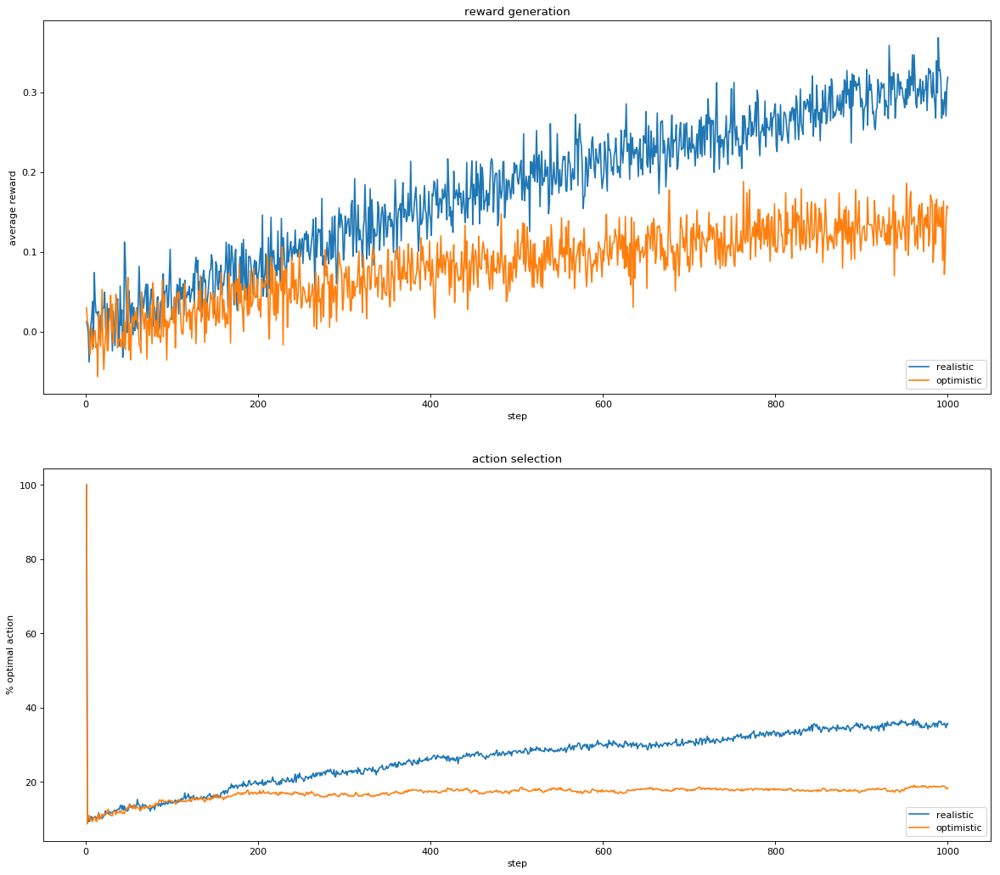

In [13]:
num_steps=1000;num_runs=2000

######################################optimistic and realistic, non-stationary #Q2 #with sample average instead of constant alpha

[total_rewards,optimum_actions]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0.1,alpha=0,num_bandits=10,stat=0,optimistic=0,UCB=0)
for i in range(num_steps):
    total_rewards[i]/=num_runs;optimum_actions[i]*=(100/num_runs)

[t,o]=stationary(num_runs=num_runs,num_steps=num_steps,epsilon=0,alpha=0,num_bandits=10,stat=0,optimistic=1,UCB=0)
for i in range(num_steps):
    t[i]/=num_runs;o[i]*=(100/num_runs)

fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
plt.subplot(2,1,1)
plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],total_rewards,label='realistic')

plt.title("reward generation");plt.xlabel("step");plt.ylabel('average reward')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],t,label='optimistic')

plt.legend(loc='lower right')



plt.subplot(2,1,2)
plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],optimum_actions,label='realistic')

plt.title("action selection");plt.xlabel("step");plt.ylabel('% optimal action')
# plt.xticks([i+1 for i in range(num_steps)])
plt.plot([i+1 for i in range(num_steps)],o,label='optimistic')

plt.legend(loc='lower right')
plt.show()